 # Simulation based on the Dataset of the ACN in 2019 using OpenDSS

## 1. Importing the necessary libraries

In [2]:
import win32com.client
dssObj = win32com.client.Dispatch("OpenDSSEngine.DSS")
dssText = dssObj.Text
dssCircuit = dssObj.ActiveCircuit
dssSolution = dssCircuit.Solution
dssElem = dssCircuit.ActiveCktElement
dssBus = dssCircuit.ActiveBus
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import os
import datetime

## 2. Compile the Master.DSS file for one time to activate Python interfacing 

In [2]:
dssText.Command = "compile 'C:/Users/lazhe/OneDrive/Thesis/OpenDSS/ACN_simulations/Master.DSS'"

## 3. Loading the Dataset to a dicionary called "data"

In [4]:
file_list = os.listdir("Dataset")
data = {}
for file in file_list:
    data[file[3:9].lower()] = pd.read_csv("Dataset/" + file)#"file[3:9].lower()" is used here to exract from the file name the name of the charging station

Simulation time: 0:00:00.614722


## 4. Running the simulation 

The simulation is done with a 10 minutes timestamp for the whole year of 2019, so the total number of simulation number is 52560 points.

P.S. 1: The OpenDSS simulatin using Python interfacing is a bit different than using only OpenDSS. Using only OpenDSS, the whole Dataset is fed to OpenDSS and we set the mode to yearly simulation and fix the timestamp and the total number of the time serie. In the case of Python interfacing, OpenDSS is called by a Python script to run a "Snap mode" simulation (simulation of a fixed values of the load power), then we change the values of the load power each timestamp depending on the Dataset. That's why the is a main loop that iterate over the Dataset to change the values and run a "Snap mode" simulation with OpenDSS every timestamp.

P.S. 2: You can skip the simulation and play around directly with the results, because they are already saved in a csv file and the simulation takes around 25 minutes (in my computer) tobe done.

In [5]:
b = datetime.datetime.now()                                                #Get the begin time of the simulation to calculate the simulation time later
result = pd.DataFrame()                                                    #Initialize the result DataFrame 
n_sim_pt = data["ca-148"].shape[0]                                         #Number of simulation points
for i in range(n_sim_pt):                                                  #The main for loop that iterate over the total simulation point
    print("simulation point number :", i)                                  #Print the simulation point number
    for station in data:                                                   #for loop that that iterates over the  stations
        station_kW = str(float(data[station].iloc[i,0]) * 0.001)           #Convert the power from W to kW
        dssText.Command = 'Edit "Load.' + station + '" kW=' + station_kW   #Change the power of the station "station" to its new value "station_kW"
    dssSolution.Solve()                                                    #Run a Snap mode simulation
    dssText.Command = 'Export p_byphase'                                   #Export the powers per phase to a csv file to be used later
    columns = pd.read_csv("ACN_Infrastructure_EXP_P_BYPHASE.csv", error_bad_lines=False).columns   #Reading the results 
    f = pd.read_csv("ACN_Infrastructure_EXP_P_BYPHASE.csv", error_bad_lines=False, usecols=columns)#from the exported csv file
    result = result.append(pd.DataFrame({"P1 (kW)" : [f.iloc[57,4]], "P2 (kW)" : [f.iloc[57,6]], "P3 (kW)" : [f.iloc[57,8]]}))#Saving the result in Pandas DataFrame
e = datetime.datetime.now()                                                #Get the end time of the simulation to calculate the simulation time later
print("Done ! (Simulation time:",e-b,")")                                  #Calculate and print the simulation time

simulation number : 0
simulation number : 1
simulation number : 2
simulation number : 3
simulation number : 4
simulation number : 5
simulation number : 6
simulation number : 7


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8
simulation number : 9
simulation number : 10
simulation number : 11
simulation number : 12
simulation number : 13
simulation number : 14
simulation number : 15
simulation number : 16


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17
simulation number : 18
simulation number : 19
simulation number : 20
simulation number : 21
simulation number : 22
simulation number : 23
simulation number : 24
simulation number : 25


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26
simulation number : 27
simulation number : 28
simulation number : 29
simulation number : 30
simulation number : 31
simulation number : 32
simulation number : 33
simulation number : 34


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35
simulation number : 36
simulation number : 37
simulation number : 38
simulation number : 39
simulation number : 40
simulation number : 41


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42
simulation number : 43
simulation number : 44
simulation number : 45
simulation number : 46
simulation number : 47
simulation number : 48
simulation number : 49
simulation number : 50


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51
simulation number : 52
simulation number : 53
simulation number : 54
simulation number : 55
simulation number : 56
simulation number : 57
simulation number : 58


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 59
simulation number : 60
simulation number : 61
simulation number : 62
simulation number : 63


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 64
simulation number : 65
simulation number : 66
simulation number : 67



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 68
simulation number : 69
simulation number : 70
simulation number : 71
simulation number : 72
simulation number : 73
simulation number : 74
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 75
simulation number : 76
simulation number : 77
simulation number : 78
simulation number : 79
simulation number : 80
simulation number : 81



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 82
simulation number : 83
simulation number : 84
simulation number : 85
simulation number : 86
simulation number : 87


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 88
simulation number : 89
simulation number : 90
simulation number : 91
simulation number : 92
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 93
simulation number : 94
simulation number : 95
simulation number : 96
simulation number : 97
simulation number : 98
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 99
simulation number : 100
simulation number : 101
simulation number : 102
simulation number : 103
simulation number : 104
simulation number : 105
simulation number : 106
simulation number : 107



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 108
simulation number : 109
simulation number : 110
simulation number : 111
simulation number : 112
simulation number : 113
simulation number : 114
simulation number : 115


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 116
simulation number : 117
simulation number : 118
simulation number : 119
simulation number : 120
simulation number : 121
simulation number : 122
simulation number : 123
simulation number : 124


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 125
simulation number : 126
simulation number : 127
simulation number : 128
simulation number : 129
simulation number : 130
simulation number : 131
simulation number : 132



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 133
simulation number : 134
simulation number : 135
simulation number : 136
simulation number : 137
simulation number : 138
simulation number : 139
simulation number : 140
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 141
simulation number : 142
simulation number : 143
simulation number : 144
simulation number : 145
simulation number : 146
simulation number : 147
simulation number : 148
simulation number : 149


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 150
simulation number : 151
simulation number : 152
simulation number : 153
simulation number : 154
simulation number : 155
simulation number : 156
simulation number : 157


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 158
simulation number : 159
simulation number : 160
simulation number : 161
simulation number : 162
simulation number : 163
simulation number : 164
simulation number : 165
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 166
simulation number : 167
simulation number : 168
simulation number : 169
simulation number : 170
simulation number : 171
simulation number : 172
simulation number : 173


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 174
simulation number : 175
simulation number : 176
simulation number : 177
simulation number : 178
simulation number : 179
simulation number : 180
simulation number : 181


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 182
simulation number : 183
simulation number : 184
simulation number : 185
simulation number : 186
simulation number : 187
simulation number : 188
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 189
simulation number : 190
simulation number : 191
simulation number : 192
simulation number : 193
simulation number : 194
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 195
simulation number : 196
simulation number : 197
simulation number : 198
simulation number : 199
simulation number : 200
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 201
simulation number : 202
simulation number : 203
simulation number : 204
simulation number : 205
simulation number : 206
simulation number : 207



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 208
simulation number : 209
simulation number : 210
simulation number : 211
simulation number : 212
simulation number : 213
simulation number : 214
simulation number : 215


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 216
simulation number : 217
simulation number : 218
simulation number : 219
simulation number : 220
simulation number : 221
simulation number : 222
simulation number : 223


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 224
simulation number : 225
simulation number : 226
simulation number : 227
simulation number : 228
simulation number : 229
simulation number : 230
simulation number : 231



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 232
simulation number : 233
simulation number : 234
simulation number : 235
simulation number : 236
simulation number : 237
simulation number : 238
simulation number : 239


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 240
simulation number : 241
simulation number : 242
simulation number : 243
simulation number : 244
simulation number : 245
simulation number : 246
simulation number : 247
simulation number : 248


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 249
simulation number : 250
simulation number : 251
simulation number : 252
simulation number : 253
simulation number : 254
simulation number : 255
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 256
simulation number : 257
simulation number : 258
simulation number : 259
simulation number : 260
simulation number : 261
simulation number : 262
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 263
simulation number : 264
simulation number : 265
simulation number : 266
simulation number : 267
simulation number : 268
simulation number : 269



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 270
simulation number : 271
simulation number : 272
simulation number : 273
simulation number : 274
simulation number : 275
simulation number : 276
simulation number : 277



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 278
simulation number : 279
simulation number : 280
simulation number : 281
simulation number : 282
simulation number : 283
simulation number : 284


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 285
simulation number : 286
simulation number : 287
simulation number : 288
simulation number : 289
simulation number : 290
simulation number : 291
simulation number : 292


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 293
simulation number : 294
simulation number : 295
simulation number : 296
simulation number : 297
simulation number : 298
simulation number : 299
simulation number : 300
simulation number : 301


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 302
simulation number : 303
simulation number : 304
simulation number : 305
simulation number : 306
simulation number : 307
simulation number : 308
simulation number : 309


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 310
simulation number : 311
simulation number : 312
simulation number : 313
simulation number : 314
simulation number : 315
simulation number : 316
simulation number : 317
simulation number : 318


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 319
simulation number : 320
simulation number : 321
simulation number : 322
simulation number : 323
simulation number : 324
simulation number : 325
simulation number : 326



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 327
simulation number : 328
simulation number : 329
simulation number : 330
simulation number : 331
simulation number : 332
simulation number : 333
simulation number : 334


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 335
simulation number : 336
simulation number : 337
simulation number : 338
simulation number : 339
simulation number : 340
simulation number : 341
simulation number : 342



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 343
simulation number : 344
simulation number : 345
simulation number : 346
simulation number : 347
simulation number : 348
simulation number : 349
simulation number : 350


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 351
simulation number : 352
simulation number : 353
simulation number : 354
simulation number : 355
simulation number : 356
simulation number : 357
simulation number : 358


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 359
simulation number : 360
simulation number : 361
simulation number : 362
simulation number : 363
simulation number : 364
simulation number : 365
simulation number : 366
simulation number : 367
simulation number : 368
simulation number : 369
simulation number : 370
simulation number : 371
simulation number : 372
simulation number : 373
simulation number : 374
simulation number : 375
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 376
simulation number : 377
simulation number : 378
simulation number : 379
simulation number : 380
simulation number : 381
simulation number : 382
simulation number : 383
simulation number : 384


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 385
simulation number : 386
simulation number : 387
simulation number : 388
simulation number : 389
simulation number : 390
simulation number : 391
simulation number : 392


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 393
simulation number : 394
simulation number : 395
simulation number : 396
simulation number : 397
simulation number : 398
simulation number : 399
simulation number : 400



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 401
simulation number : 402
simulation number : 403
simulation number : 404
simulation number : 405
simulation number : 406
simulation number : 407
simulation number : 408
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 409
simulation number : 410
simulation number : 411
simulation number : 412
simulation number : 413
simulation number : 414
simulation number : 415
simulation number : 416
simulation number : 417


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 418
simulation number : 419
simulation number : 420
simulation number : 421
simulation number : 422
simulation number : 423
simulation number : 424
simulation number : 425
simulation number : 426


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 427
simulation number : 428
simulation number : 429
simulation number : 430
simulation number : 431
simulation number : 432
simulation number : 433
simulation number : 434
simulation number : 435



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 436
simulation number : 437
simulation number : 438
simulation number : 439
simulation number : 440
simulation number : 441
simulation number : 442
simulation number : 443
simulation number : 444


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 445
simulation number : 446
simulation number : 447
simulation number : 448
simulation number : 449
simulation number : 450
simulation number : 451
simulation number : 452
simulation number : 453


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 454
simulation number : 455
simulation number : 456
simulation number : 457
simulation number : 458
simulation number : 459
simulation number : 460
simulation number : 461
simulation number : 462


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 463
simulation number : 464
simulation number : 465
simulation number : 466
simulation number : 467
simulation number : 468
simulation number : 469
simulation number : 470
simulation number : 471


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 472
simulation number : 473
simulation number : 474
simulation number : 475
simulation number : 476
simulation number : 477
simulation number : 478
simulation number : 479
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 480
simulation number : 481
simulation number : 482
simulation number : 483
simulation number : 484
simulation number : 485
simulation number : 486
simulation number : 487


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 488
simulation number : 489
simulation number : 490
simulation number : 491
simulation number : 492
simulation number : 493
simulation number : 494
simulation number : 495


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 496
simulation number : 497
simulation number : 498
simulation number : 499
simulation number : 500
simulation number : 501
simulation number : 502
simulation number : 503


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 504
simulation number : 505
simulation number : 506
simulation number : 507
simulation number : 508
simulation number : 509
simulation number : 510
simulation number : 511
simulation number : 512


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 513
simulation number : 514
simulation number : 515
simulation number : 516
simulation number : 517
simulation number : 518
simulation number : 519
simulation number : 520
simulation number : 521

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 522
simulation number : 523
simulation number : 524
simulation number : 525
simulation number : 526
simulation number : 527
simulation number : 528
simulation number : 529


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 530
simulation number : 531
simulation number : 532
simulation number : 533
simulation number : 534
simulation number : 535
simulation number : 536
simulation number : 537
simulation number : 538


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 539
simulation number : 540
simulation number : 541
simulation number : 542
simulation number : 543
simulation number : 544
simulation number : 545
simulation number : 546
simulation number : 547


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 548
simulation number : 549
simulation number : 550
simulation number : 551
simulation number : 552
simulation number : 553
simulation number : 554
simulation number : 555
simulation number : 556
simulation number : 557


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 558
simulation number : 559
simulation number : 560
simulation number : 561
simulation number : 562
simulation number : 563
simulation number : 564
simulation number : 565
simulation number : 566

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 567
simulation number : 568
simulation number : 569
simulation number : 570
simulation number : 571
simulation number : 572
simulation number : 573
simulation number : 574


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 575
simulation number : 576
simulation number : 577
simulation number : 578
simulation number : 579
simulation number : 580
simulation number : 581
simulation number : 582
simulation number : 583


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 584
simulation number : 585
simulation number : 586
simulation number : 587
simulation number : 588
simulation number : 589
simulation number : 590
simulation number : 591
simulation number : 592



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 593
simulation number : 594
simulation number : 595
simulation number : 596
simulation number : 597
simulation number : 598
simulation number : 599
simulation number : 600
simulation number : 601


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 602
simulation number : 603
simulation number : 604
simulation number : 605
simulation number : 606
simulation number : 607
simulation number : 608
simulation number : 609
simulation number : 610


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 611
simulation number : 612
simulation number : 613
simulation number : 614
simulation number : 615
simulation number : 616
simulation number : 617
simulation number : 618
simulation number : 619


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 620
simulation number : 621
simulation number : 622
simulation number : 623
simulation number : 624
simulation number : 625
simulation number : 626
simulation number : 627
simulation number : 628



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 629
simulation number : 630
simulation number : 631
simulation number : 632
simulation number : 633
simulation number : 634
simulation number : 635
simulation number : 636
simulation number : 637


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 638
simulation number : 639
simulation number : 640
simulation number : 641
simulation number : 642
simulation number : 643
simulation number : 644
simulation number : 645
simulation number : 646


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 647
simulation number : 648
simulation number : 649
simulation number : 650
simulation number : 651
simulation number : 652
simulation number : 653
simulation number : 654



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 655
simulation number : 656
simulation number : 657
simulation number : 658
simulation number : 659
simulation number : 660
simulation number : 661
simulation number : 662
simulation number : 663


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 664
simulation number : 665
simulation number : 666
simulation number : 667
simulation number : 668
simulation number : 669
simulation number : 670
simulation number : 671
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 672
simulation number : 673
simulation number : 674
simulation number : 675
simulation number : 676
simulation number : 677
simulation number : 678
simulation number : 679


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 680
simulation number : 681
simulation number : 682
simulation number : 683
simulation number : 684
simulation number : 685
simulation number : 686
simulation number : 687
simulation number : 688


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 689
simulation number : 690
simulation number : 691
simulation number : 692
simulation number : 693
simulation number : 694
simulation number : 695
simulation number : 696
simulation number : 697


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 698
simulation number : 699
simulation number : 700
simulation number : 701
simulation number : 702
simulation number : 703
simulation number : 704
simulation number : 705
simulation number : 706


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 707
simulation number : 708
simulation number : 709
simulation number : 710
simulation number : 711
simulation number : 712
simulation number : 713
simulation number : 714
simulation number : 715
simulation number : 716
simulation number : 717
simulation number : 718
simulation number : 719
simulation number : 720
simulation number : 721
simulation number : 722
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 723
simulation number : 724
simulation number : 725
simulation number : 726
simulation number : 727
simulation number : 728
simulation number : 729
simulation number : 730
simulation number : 731



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 732
simulation number : 733
simulation number : 734
simulation number : 735
simulation number : 736
simulation number : 737
simulation number : 738


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 739
simulation number : 740
simulation number : 741
simulation number : 742
simulation number : 743
simulation number : 744
simulation number : 745
simulation number : 746



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 747
simulation number : 748
simulation number : 749
simulation number : 750
simulation number : 751
simulation number : 752
simulation number : 753
simulation number : 754
simulation number : 755


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 756
simulation number : 757
simulation number : 758
simulation number : 759
simulation number : 760
simulation number : 761
simulation number : 762
simulation number : 763
simulation number : 764
simulation number : 765
simulation number : 766
simulation number : 767
simulation number : 768
simulation number : 769
simulation number : 770
simulation number : 771
simulation number : 772
simulation number : 773


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 774
simulation number : 775
simulation number : 776
simulation number : 777
simulation number : 778
simulation number : 779
simulation number : 780
simulation number : 781


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 782
simulation number : 783
simulation number : 784
simulation number : 785
simulation number : 786
simulation number : 787
simulation number : 788
simulation number : 789



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 790
simulation number : 791
simulation number : 792
simulation number : 793
simulation number : 794
simulation number : 795
simulation number : 796
simulation number : 797



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 798
simulation number : 799
simulation number : 800
simulation number : 801
simulation number : 802
simulation number : 803
simulation number : 804
simulation number : 805


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 806
simulation number : 807
simulation number : 808
simulation number : 809
simulation number : 810
simulation number : 811
simulation number : 812
simulation number : 813


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 814
simulation number : 815
simulation number : 816
simulation number : 817
simulation number : 818
simulation number : 819
simulation number : 820


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 821
simulation number : 822
simulation number : 823
simulation number : 824
simulation number : 825
simulation number : 826
simulation number : 827
simulation number : 828
simulation number : 829


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 830
simulation number : 831
simulation number : 832
simulation number : 833
simulation number : 834
simulation number : 835
simulation number : 836



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 837
simulation number : 838
simulation number : 839
simulation number : 840
simulation number : 841
simulation number : 842
simulation number : 843
simulation number : 844
simulation number : 845


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 846
simulation number : 847
simulation number : 848
simulation number : 849
simulation number : 850
simulation number : 851
simulation number : 852


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 853
simulation number : 854
simulation number : 855
simulation number : 856
simulation number : 857
simulation number : 858



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 859
simulation number : 860
simulation number : 861
simulation number : 862
simulation number : 863



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 864
simulation number : 865
simulation number : 866
simulation number : 867
simulation number : 868
simulation number : 869
simulation number : 870
simulation number : 871
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 872
simulation number : 873
simulation number : 874
simulation number : 875
simulation number : 876
simulation number : 877
simulation number : 878


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 879
simulation number : 880
simulation number : 881
simulation number : 882
simulation number : 883
simulation number : 884
simulation number : 885


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 886
simulation number : 887
simulation number : 888
simulation number : 889
simulation number : 890
simulation number : 891


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 892
simulation number : 893
simulation number : 894
simulation number : 895
simulation number : 896
simulation number : 897
simulation number : 898
simulation number : 899
simulation number : 900


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 901
simulation number : 902
simulation number : 903
simulation number : 904
simulation number : 905
simulation number : 906
simulation number : 907


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 908
simulation number : 909
simulation number : 910
simulation number : 911
simulation number : 912
simulation number : 913
simulation number : 914


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 915
simulation number : 916
simulation number : 917
simulation number : 918
simulation number : 919
simulation number : 920
simulation number : 921
simulation number : 922


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 923
simulation number : 924
simulation number : 925
simulation number : 926
simulation number : 927
simulation number : 928
simulation number : 929
simulation number : 930
simulation number : 931



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 932
simulation number : 933
simulation number : 934
simulation number : 935
simulation number : 936
simulation number : 937
simulation number : 938


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 939
simulation number : 940
simulation number : 941
simulation number : 942
simulation number : 943
simulation number : 944
simulation number : 945



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 946
simulation number : 947
simulation number : 948
simulation number : 949
simulation number : 950
simulation number : 951
simulation number : 952
simulation number : 953
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 954
simulation number : 955
simulation number : 956
simulation number : 957
simulation number : 958
simulation number : 959
simulation number : 960
simulation number : 961


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 962
simulation number : 963
simulation number : 964
simulation number : 965
simulation number : 966
simulation number : 967
simulation number : 968
simulation number : 969


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 970
simulation number : 971
simulation number : 972
simulation number : 973
simulation number : 974
simulation number : 975
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 976
simulation number : 977
simulation number : 978
simulation number : 979
simulation number : 980
simulation number : 981
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 982
simulation number : 983
simulation number : 984
simulation number : 985
simulation number : 986
simulation number : 987
simulation number : 988


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 989
simulation number : 990
simulation number : 991
simulation number : 992
simulation number : 993
simulation number : 994
simulation number : 995
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 996
simulation number : 997
simulation number : 998
simulation number : 999
simulation number : 1000
simulation number : 1001
simulation number : 1002


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1003
simulation number : 1004
simulation number : 1005
simulation number : 1006
simulation number : 1007
simulation number : 1008
simulation number : 1009
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1010
simulation number : 1011
simulation number : 1012
simulation number : 1013
simulation number : 1014
simulation number : 1015
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1016
simulation number : 1017
simulation number : 1018
simulation number : 1019
simulation number : 1020
simulation number : 1021



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1022
simulation number : 1023
simulation number : 1024
simulation number : 1025
simulation number : 1026
simulation number : 1027
simulation number : 1028
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 1029
simulation number : 1030
simulation number : 1031
simulation number : 1032
simulation number : 1033
simulation number : 1034
simulation number : 1035
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 1036
simulation number : 1037
simulation number : 1038
simulation number : 1039
simulation number : 1040
simulation number : 1041
simulation number : 1042
simulation number : 1043



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1044
simulation number : 1045
simulation number : 1046
simulation number : 1047
simulation number : 1048
simulation number : 1049
simulation number : 1050
simulation number : 1051


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1052
simulation number : 1053
simulation number : 1054
simulation number : 1055
simulation number : 1056
simulation number : 1057
simulation number : 1058



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 1059
simulation number : 1060
simulation number : 1061
simulation number : 1062
simulation number : 1063
simulation number : 1064
simulation number : 1065
simulation number : 1066


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1067
simulation number : 1068
simulation number : 1069
simulation number : 1070
simulation number : 1071
simulation number : 1072
simulation number : 1073
simulation number : 1074


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1075
simulation number : 1076
simulation number : 1077
simulation number : 1078
simulation number : 1079
simulation number : 1080
simulation number : 1081
simulation number : 1082


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1083
simulation number : 1084
simulation number : 1085
simulation number : 1086
simulation number : 1087
simulation number : 1088
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1089
simulation number : 1090
simulation number : 1091
simulation number : 1092
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1093
simulation number : 1094
simulation number : 1095
simulation number : 1096
simulation number : 1097



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1098
simulation number : 1099
simulation number : 1100
simulation number : 1101
simulation number : 1102
simulation number : 1103
simulation number : 1104


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1105
simulation number : 1106
simulation number : 1107
simulation number : 1108


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1109
simulation number : 1110
simulation number : 1111
simulation number : 1112


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1113
simulation number : 1114
simulation number : 1115
simulation number : 1116
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1117
simulation number : 1118
simulation number : 1119
simulation number : 1120
simulation number : 1121
simulation number : 1122
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1123
simulation number : 1124
simulation number : 1125
simulation number : 1126


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1127
simulation number : 1128
simulation number : 1129
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1130
simulation number : 1131
simulation number : 1132


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1133
simulation number : 1134
simulation number : 1135
simulation number : 1136
simulation number : 1137
simulation number : 1138
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1139
simulation number : 1140
simulation number : 1141
simulation number : 1142
simulation number : 1143


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1144
simulation number : 1145
simulation number : 1146
simulation number : 1147


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1148
simulation number : 1149
simulation number : 1150
simulation number : 1151
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1152
simulation number : 1153
simulation number : 1154
simulation number : 1155
simulation number : 1156
simulation number : 1157
simulation number : 1158
simulation number : 1159
simulation number : 1160
simulation number : 1161


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1162
simulation number : 1163
simulation number : 1164
simulation number : 1165
simulation number : 1166
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1167
simulation number : 1168
simulation number : 1169
simulation number : 1170



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1171
simulation number : 1172
simulation number : 1173
simulation number : 1174
simulation number : 1175


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1176
simulation number : 1177
simulation number : 1178
simulation number : 1179
simulation number : 1180



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1181
simulation number : 1182
simulation number : 1183
simulation number : 1184
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1185
simulation number : 1186
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1187
simulation number : 1188


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1189
simulation number : 1190
simulation number : 1191
simulation number : 1192
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1193
simulation number : 1194
simulation number : 1195


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1196
simulation number : 1197
simulation number : 1198
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1199
simulation number : 1200
simulation number : 1201
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1202
simulation number : 1203
simulation number : 1204
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1205
simulation number : 1206
simulation number : 1207
simulation number : 1208


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1209
simulation number : 1210
simulation number : 1211
simulation number : 1212


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1213
simulation number : 1214
simulation number : 1215
simulation number : 1216



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1217
simulation number : 1218
simulation number : 1219
simulation number : 1220


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1221
simulation number : 1222
simulation number : 1223
simulation number : 1224
simulation number : 1225

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1226
simulation number : 1227
simulation number : 1228
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1229
simulation number : 1230
simulation number : 1231
simulation number : 1232
simulation number : 1233
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1234
simulation number : 1235
simulation number : 1236
simulation number : 1237
simulation number : 1238



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1239
simulation number : 1240
simulation number : 1241
simulation number : 1242
simulation number : 1243
simulation number : 1244
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1245
simulation number : 1246
simulation number : 1247
simulation number : 1248


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1249
simulation number : 1250
simulation number : 1251
simulation number : 1252
simulation number : 1253


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1254
simulation number : 1255
simulation number : 1256
simulation number : 1257
simulation number : 1258
simulation number : 1259
simulation number : 1260
simulation number : 1261
simulation number : 1262
simulation number : 1263


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1264
simulation number : 1265
simulation number : 1266
simulation number : 1267


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1268
simulation number : 1269
simulation number : 1270
simulation number : 1271


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1272
simulation number : 1273
simulation number : 1274
simulation number : 1275
simulation number : 1276
simulation number : 1277
simulation number : 1278
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1279
simulation number : 1280
simulation number : 1281
simulation number : 1282
simulation number : 1283



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1284
simulation number : 1285
simulation number : 1286
simulation number : 1287
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1288
simulation number : 1289
simulation number : 1290
simulation number : 1291
simulation number : 1292
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1293
simulation number : 1294
simulation number : 1295
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

1296
simulation number : 1297
simulation number : 1298
simulation number : 1299
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1300
simulation number : 1301
simulation number : 1302
simulation number : 1303
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1304
simulation number : 1305
simulation number : 1306
simulation number : 1307
simulation number : 1308
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1309
simulation number : 1310
simulation number : 1311
simulation number : 1312



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1313
simulation number : 1314
simulation number : 1315
simulation number : 1316


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1317
simulation number : 1318
simulation number : 1319
simulation number : 1320
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1321
simulation number : 1322
simulation number : 1323
simulation number : 1324



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1325
simulation number : 1326
simulation number : 1327
simulation number : 1328


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1329
simulation number : 1330
simulation number : 1331



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1332
simulation number : 1333
simulation number : 1334
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1335
simulation number : 1336
simulation number : 1337
simulation number : 1338
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1339
simulation number : 1340
simulation number : 1341
simulation number : 1342
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1343
simulation number : 1344
simulation number : 1345



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1346
simulation number : 1347
simulation number : 1348



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1349
simulation number : 1350
simulation number : 1351


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1352
simulation number : 1353
simulation number : 1354


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1355
simulation number : 1356
simulation number : 1357


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1358
simulation number : 1359
simulation number : 1360
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1361
simulation number : 1362
simulation number : 1363
simulation number : 1364



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1365
simulation number : 1366
simulation number : 1367


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1368
simulation number : 1369
simulation number : 1370
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1371
simulation number : 1372
simulation number : 1373
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1374
simulation number : 1375
simulation number : 1376
simulation number : 1377
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1378
simulation number : 1379
simulation number : 1380
simulation number : 1381
simulation number : 1382
simulation number : 1383



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1384
simulation number : 1385
simulation number : 1386
simulation number : 1387
simulation number : 1388
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1389
simulation number : 1390
simulation number : 1391
simulation number : 1392
simulation number : 1393
simulation number : 1394



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1395
simulation number : 1396
simulation number : 1397
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1398
simulation number : 1399
simulation number : 1400
simulation number : 1401
simulation number : 1402
simulation number : 1403



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1404
simulation number : 1405
simulation number : 1406
simulation number : 1407
simulation number : 1408


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1409
simulation number : 1410
simulation number : 1411
simulation number : 1412
simulation number : 1413


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1414
simulation number : 1415
simulation number : 1416
simulation number : 1417


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1418
simulation number : 1419
simulation number : 1420
simulation number : 1421
simulation number : 1422



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1423
simulation number : 1424
simulation number : 1425
simulation number : 1426
simulation number : 1427
simulation number : 1428
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1429
simulation number : 1430
simulation number : 1431
simulation number : 1432
simulation number : 1433
simulation number : 1434


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1435
simulation number : 1436
simulation number : 1437
simulation number : 1438
simulation number : 1439
simulation number : 1440
simulation number : 1441
simulation number : 1442


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1443
simulation number : 1444
simulation number : 1445
simulation number : 1446
simulation number : 1447
simulation number : 1448
simulation number : 1449



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1450
simulation number : 1451
simulation number : 1452
simulation number : 1453
simulation number : 1454
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1455
simulation number : 1456
simulation number : 1457
simulation number : 1458
simulation number : 1459
simulation number : 1460
simulation number : 1461


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1462
simulation number : 1463
simulation number : 1464
simulation number : 1465
simulation number : 1466
simulation number : 1467
simulation number : 1468
simulation number : 1469


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1470
simulation number : 1471
simulation number : 1472
simulation number : 1473
simulation number : 1474
simulation number : 1475
simulation number : 1476
simulation number : 1477



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 1478
simulation number : 1479
simulation number : 1480
simulation number : 1481
simulation number : 1482
simulation number : 1483
simulation number : 1484
simulation number : 1485



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1486
simulation number : 1487


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1488
simulation number : 1489
simulation number : 1490
simulation number : 1491
simulation number : 1492
simulation number : 1493
simulation number : 1494
simulation number : 1495


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1496
simulation number : 1497
simulation number : 1498
simulation number : 1499
simulation number : 1500
simulation number : 1501



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1502
simulation number : 1503
simulation number : 1504
simulation number : 1505
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1506
simulation number : 1507
simulation number : 1508
simulation number : 1509
simulation number : 1510



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1511
simulation number : 1512
simulation number : 1513
simulation number : 1514


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1515
simulation number : 1516
simulation number : 1517


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1518
simulation number : 1519
simulation number : 1520


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1521
simulation number : 1522
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1523
simulation number : 1524
simulation number : 1525
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1526
simulation number : 1527
simulation number : 1528


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1529
simulation number : 1530
simulation number : 1531
simulation number : 1532



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1533
simulation number : 1534
simulation number : 1535
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1536
simulation number : 1537
simulation number : 1538
simulation number : 1539
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1540
simulation number : 1541
simulation number : 1542
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1543
simulation number : 1544
simulation number : 1545
simulation number : 1546



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1547
simulation number : 1548
simulation number : 1549
simulation number : 1550
simulation number : 1551
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1552
simulation number : 1553
simulation number : 1554
simulation number : 1555
simulation number : 1556
simulation number : 1557


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1558
simulation number : 1559
simulation number : 1560
simulation number : 1561
simulation number : 1562
simulation number : 1563
simulation number : 1564



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1565
simulation number : 1566
simulation number : 1567
simulation number : 1568
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1569
simulation number : 1570
simulation number : 1571
simulation number : 1572
simulation number : 1573
simulation number : 1574
simulation number : 1575
simulation number : 1576


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1577
simulation number : 1578
simulation number : 1579
simulation number : 1580
simulation number : 1581
simulation number : 1582
simulation number : 1583
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1584
simulation number : 1585
simulation number : 1586
simulation number : 1587
simulation number : 1588
simulation number : 1589
simulation number : 1590


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1591
simulation number : 1592
simulation number : 1593
simulation number : 1594
simulation number : 1595
simulation number : 1596
simulation number : 1597
simulation number : 1598
simulation number : 1599
simulation number : 1600
simulation number : 1601
simulation number : 1602
simulation number : 1603
simulation number : 1604
simulation number : 1605


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1606
simulation number : 1607
simulation number : 1608
simulation number : 1609
simulation number : 1610
simulation number : 1611
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1612
simulation number : 1613
simulation number : 1614
simulation number : 1615
simulation number : 1616
simulation number : 1617


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1618
simulation number : 1619
simulation number : 1620
simulation number : 1621
simulation number : 1622
simulation number : 1623
simulation number : 1624
simulation number : 1625


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1626
simulation number : 1627
simulation number : 1628
simulation number : 1629
simulation number : 1630
simulation number : 1631
simulation number : 1632
simulation number : 1633
simulation number : 1634
simulation number : 1635
simulation number : 1636
simulation number : 1637
simulation number : 1638
simulation number : 1639
simulation number : 1640
simulation number : 1641


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1642
simulation number : 1643
simulation number : 1644
simulation number : 1645
simulation number : 1646
simulation number : 1647
simulation number : 1648
simulation number : 1649
simulation number : 1650



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 1651
simulation number : 1652
simulation number : 1653
simulation number : 1654
simulation number : 1655
simulation number : 1656
simulation number : 1657
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 1658
simulation number : 1659
simulation number : 1660
simulation number : 1661
simulation number : 1662
simulation number : 1663
simulation number : 1664
simulation number : 1665


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1666
simulation number : 1667
simulation number : 1668
simulation number : 1669
simulation number : 1670
simulation number : 1671
simulation number : 1672
simulation number : 1673
simulation number : 1674


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 1675
simulation number : 1676
simulation number : 1677
simulation number : 1678
simulation number : 1679
simulation number : 1680
simulation number : 1681


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1682
simulation number : 1683
simulation number : 1684
simulation number : 1685
simulation number : 1686
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1687
simulation number : 1688
simulation number : 1689
simulation number : 1690
simulation number : 1691
simulation number : 1692
simulation number : 1693
simulation number : 1694



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1695
simulation number : 1696
simulation number : 1697
simulation number : 1698
simulation number : 1699
simulation number : 1700
simulation number : 1701



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1702
simulation number : 1703
simulation number : 1704
simulation number : 1705
simulation number : 1706


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1707
simulation number : 1708
simulation number : 1709
simulation number : 1710
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1711
simulation number : 1712
simulation number : 1713
simulation number : 1714
simulation number : 1715
simulation number : 1716
simulation number : 1717



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1718
simulation number : 1719
simulation number : 1720
simulation number : 1721
simulation number : 1722
simulation number : 1723
simulation number : 1724
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1725
simulation number : 1726
simulation number : 1727
simulation number : 1728
simulation number : 1729
simulation number : 1730
simulation number : 1731
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 1732
simulation number : 1733
simulation number : 1734
simulation number : 1735
simulation number : 1736
simulation number : 1737
simulation number : 1738
simulation number : 1739
simulation number : 1740



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1741
simulation number : 1742
simulation number : 1743
simulation number : 1744
simulation number : 1745
simulation number : 1746
simulation number : 1747


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1748
simulation number : 1749
simulation number : 1750
simulation number : 1751
simulation number : 1752


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1753
simulation number : 1754
simulation number : 1755
simulation number : 1756


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1757
simulation number : 1758
simulation number : 1759
simulation number : 1760
simulation number : 1761


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1762
simulation number : 1763
simulation number : 1764
simulation number : 1765



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1766
simulation number : 1767
simulation number : 1768
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1769
simulation number : 1770
simulation number : 1771
simulation number : 1772
simulation number : 1773


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1774
simulation number : 1775
simulation number : 1776
simulation number : 1777



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1778
simulation number : 1779
simulation number : 1780
simulation number : 1781



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1782
simulation number : 1783
simulation number : 1784
simulation number : 1785


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1786
simulation number : 1787
simulation number : 1788
simulation number : 1789


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1790
simulation number : 1791
simulation number : 1792
simulation number : 1793



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1794
simulation number : 1795
simulation number : 1796
simulation number : 1797


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1798
simulation number : 1799
simulation number : 1800
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1801
simulation number : 1802
simulation number : 1803
simulation number : 1804


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1805
simulation number : 1806
simulation number : 1807
simulation number : 1808
simulation number : 1809
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1810
simulation number : 1811
simulation number : 1812
simulation number : 1813
simulation number : 1814



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1815
simulation number : 1816
simulation number : 1817
simulation number : 1818


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1819
simulation number : 1820
simulation number : 1821
simulation number : 1822



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1823
simulation number : 1824
simulation number : 1825
simulation number : 1826


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1827
simulation number : 1828
simulation number : 1829
simulation number : 1830


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1831
simulation number : 1832
simulation number : 1833
simulation number : 1834



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1835
simulation number : 1836
simulation number : 1837
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1838
simulation number : 1839
simulation number : 1840
simulation number : 1841
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1842
simulation number : 1843
simulation number : 1844
simulation number : 1845
simulation number : 1846
simulation number : 1847



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1848
simulation number : 1849
simulation number : 1850
simulation number : 1851
simulation number : 1852
simulation number : 1853
simulation number : 1854


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1855
simulation number : 1856
simulation number : 1857
simulation number : 1858
simulation number : 1859
simulation number : 1860
simulation number : 1861



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1862
simulation number : 1863
simulation number : 1864
simulation number : 1865
simulation number : 1866
simulation number : 1867


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1868
simulation number : 1869
simulation number : 1870
simulation number : 1871
simulation number : 1872
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1873
simulation number : 1874
simulation number : 1875
simulation number : 1876
simulation number : 1877


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1878
simulation number : 1879
simulation number : 1880
simulation number : 1881
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1882
simulation number : 1883
simulation number : 1884
simulation number : 1885
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1886
simulation number : 1887
simulation number : 1888
simulation number : 1889
simulation number : 1890



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1891
simulation number : 1892
simulation number : 1893
simulation number : 1894
simulation number : 1895



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1896
simulation number : 1897
simulation number : 1898
simulation number : 1899
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1900
simulation number : 1901
simulation number : 1902
simulation number : 1903
simulation number : 1904
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1905
simulation number : 1906
simulation number : 1907
simulation number : 1908
simulation number : 1909



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1910
simulation number : 1911
simulation number : 1912
simulation number : 1913



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1914
simulation number : 1915
simulation number : 1916
simulation number : 1917
simulation number : 1918


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1919
simulation number : 1920
simulation number : 1921
simulation number : 1922
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1923
simulation number : 1924
simulation number : 1925
simulation number : 1926
simulation number : 1927



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1928
simulation number : 1929
simulation number : 1930
simulation number : 1931
simulation number : 1932



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1933
simulation number : 1934
simulation number : 1935


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1936
simulation number : 1937
simulation number : 1938


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1939
simulation number : 1940
simulation number : 1941
simulation number : 1942


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1943
simulation number : 1944
simulation number : 1945
simulation number : 1946


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1947
simulation number : 1948
simulation number : 1949
simulation number : 1950
simulation number : 1951



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1952
simulation number : 1953
simulation number : 1954
simulation number : 1955
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1956
simulation number : 1957
simulation number : 1958
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1959
simulation number : 1960
simulation number : 1961
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1962
simulation number : 1963
simulation number : 1964
simulation number : 1965
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 1966
simulation number : 1967
simulation number : 1968
simulation number : 1969
simulation number : 1970


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1971
simulation number : 1972
simulation number : 1973


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1974
simulation number : 1975
simulation number : 1976


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 1977
simulation number : 1978
simulation number : 1979



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1980
simulation number : 1981
simulation number : 1982


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1983
simulation number : 1984
simulation number : 1985
simulation number : 1986


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 1987
simulation number : 1988
simulation number : 1989
simulation number : 1990
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1991
simulation number : 1992
simulation number : 1993
simulation number : 1994
simulation number : 1995
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 1996
simulation number : 1997
simulation number : 1998
simulation number : 1999
simulation number : 2000



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2001
simulation number : 2002
simulation number : 2003
simulation number : 2004
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2005
simulation number : 2006
simulation number : 2007
simulation number : 2008



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2009
simulation number : 2010
simulation number : 2011
simulation number : 2012


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2013
simulation number : 2014
simulation number : 2015
simulation number : 2016
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2017
simulation number : 2018
simulation number : 2019
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 2020
simulation number : 2021
simulation number : 2022
simulation number : 2023
simulation number : 2024


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2025
simulation number : 2026
simulation number : 2027
simulation number : 2028
simulation number : 2029
simulation number : 2030
simulation number : 2031
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2032
simulation number : 2033
simulation number : 2034
simulation number : 2035
simulation number : 2036
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 2037
simulation number : 2038
simulation number : 2039
simulation number : 2040
simulation number : 2041
simulation number : 2042


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2043
simulation number : 2044
simulation number : 2045
simulation number : 2046
simulation number : 2047
simulation number : 2048



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2049
simulation number : 2050
simulation number : 2051
simulation number : 2052
simulation number : 2053
simulation number : 2054


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2055
simulation number : 2056
simulation number : 2057
simulation number : 2058
simulation number : 2059



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2060
simulation number : 2061
simulation number : 2062
simulation number : 2063
simulation number : 2064
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2065
simulation number : 2066
simulation number : 2067
simulation number : 2068
simulation number : 2069
simulation number : 2070



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2071
simulation number : 2072
simulation number : 2073
simulation number : 2074
simulation number : 2075
simulation number : 2076



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2077
simulation number : 2078
simulation number : 2079
simulation number : 2080
simulation number : 2081
simulation number : 2082
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2083
simulation number : 2084
simulation number : 2085
simulation number : 2086
simulation number : 2087
simulation number : 2088
simulation number : 2089
simulation number : 2090



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2091
simulation number : 2092
simulation number : 2093
simulation number : 2094
simulation number : 2095
simulation number : 2096
simulation number : 2097
simulation number : 2098


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2099
simulation number : 2100
simulation number : 2101
simulation number : 2102
simulation number : 2103
simulation number : 2104
simulation number : 2105


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2106
simulation number : 2107
simulation number : 2108
simulation number : 2109
simulation number : 2110
simulation number : 2111
simulation number : 2112
simulation number : 2113


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2114
simulation number : 2115
simulation number : 2116
simulation number : 2117
simulation number : 2118
simulation number : 2119
simulation number : 2120



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2121
simulation number : 2122
simulation number : 2123
simulation number : 2124
simulation number : 2125
simulation number : 2126
simulation number : 2127
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 2128
simulation number : 2129
simulation number : 2130
simulation number : 2131
simulation number : 2132
simulation number : 2133
simulation number : 2134
simulation number : 2135
simulation number : 2136


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2137
simulation number : 2138
simulation number : 2139
simulation number : 2140
simulation number : 2141
simulation number : 2142
simulation number : 2143
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2144
simulation number : 2145
simulation number : 2146
simulation number : 2147
simulation number : 2148
simulation number : 2149
simulation number : 2150
simulation number : 2151


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 2152
simulation number : 2153
simulation number : 2154
simulation number : 2155
simulation number : 2156
simulation number : 2157
simulation number : 2158
simulation number : 2159
simulation number : 2160
simulation number : 2161
simulation number : 2162
simulation number : 2163
simulation number : 2164
simulation number : 2165


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2166
simulation number : 2167
simulation number : 2168
simulation number : 2169
simulation number : 2170
simulation number : 2171



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2172
simulation number : 2173
simulation number : 2174
simulation number : 2175
simulation number : 2176
simulation number : 2177
simulation number : 2178



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 2179
simulation number : 2180
simulation number : 2181
simulation number : 2182
simulation number : 2183
simulation number : 2184
simulation number : 2185
simulation number : 2186



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2187
simulation number : 2188
simulation number : 2189
simulation number : 2190
simulation number : 2191
simulation number : 2192
simulation number : 2193
simulation number : 2194


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2195
simulation number : 2196
simulation number : 2197
simulation number : 2198
simulation number : 2199
simulation number : 2200
simulation number : 2201
simulation number : 2202


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2203
simulation number : 2204
simulation number : 2205
simulation number : 2206
simulation number : 2207
simulation number : 2208
simulation number : 2209
simulation number : 2210



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2211
simulation number : 2212
simulation number : 2213
simulation number : 2214
simulation number : 2215
simulation number : 2216
simulation number : 2217
simulation number : 2218



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2219
simulation number : 2220
simulation number : 2221
simulation number : 2222
simulation number : 2223
simulation number : 2224
simulation number : 2225
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 2226
simulation number : 2227
simulation number : 2228
simulation number : 2229
simulation number : 2230
simulation number : 2231
simulation number : 2232


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2233
simulation number : 2234
simulation number : 2235
simulation number : 2236
simulation number : 2237
simulation number : 2238
simulation number : 2239
simulation number : 2240


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2241
simulation number : 2242
simulation number : 2243
simulation number : 2244
simulation number : 2245
simulation number : 2246
simulation number : 2247
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2248
simulation number : 2249
simulation number : 2250
simulation number : 2251
simulation number : 2252
simulation number : 2253
simulation number : 2254



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2255
simulation number : 2256
simulation number : 2257
simulation number : 2258
simulation number : 2259
simulation number : 2260
simulation number : 2261
simulation number : 2262



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 2263
simulation number : 2264
simulation number : 2265
simulation number : 2266
simulation number : 2267
simulation number : 2268
simulation number : 2269
simulation number : 2270



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2271
simulation number : 2272
simulation number : 2273
simulation number : 2274
simulation number : 2275
simulation number : 2276
simulation number : 2277
simulation number : 2278


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2279
simulation number : 2280
simulation number : 2281
simulation number : 2282
simulation number : 2283
simulation number : 2284
simulation number : 2285
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 2286
simulation number : 2287
simulation number : 2288
simulation number : 2289
simulation number : 2290
simulation number : 2291
simulation number : 2292



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2293
simulation number : 2294
simulation number : 2295
simulation number : 2296
simulation number : 2297
simulation number : 2298
simulation number : 2299
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 2300
simulation number : 2301
simulation number : 2302
simulation number : 2303
simulation number : 2304
simulation number : 2305
simulation number : 2306
simulation number : 2307


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2308
simulation number : 2309
simulation number : 2310
simulation number : 2311
simulation number : 2312
simulation number : 2313
simulation number : 2314


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2315
simulation number : 2316
simulation number : 2317
simulation number : 2318
simulation number : 2319
simulation number : 2320
simulation number : 2321
simulation number : 2322



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2323
simulation number : 2324
simulation number : 2325
simulation number : 2326
simulation number : 2327
simulation number : 2328
simulation number : 2329
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 2330
simulation number : 2331
simulation number : 2332
simulation number : 2333
simulation number : 2334
simulation number : 2335
simulation number : 2336
simulation number : 2337



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2338
simulation number : 2339
simulation number : 2340
simulation number : 2341
simulation number : 2342
simulation number : 2343
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2344
simulation number : 2345
simulation number : 2346
simulation number : 2347
simulation number : 2348
simulation number : 2349
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 2350
simulation number : 2351
simulation number : 2352
simulation number : 2353
simulation number : 2354
simulation number : 2355
simulation number : 2356


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2357
simulation number : 2358
simulation number : 2359
simulation number : 2360
simulation number : 2361
simulation number : 2362
simulation number : 2363


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2364
simulation number : 2365
simulation number : 2366
simulation number : 2367
simulation number : 2368
simulation number : 2369
simulation number : 2370


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2371
simulation number : 2372
simulation number : 2373
simulation number : 2374
simulation number : 2375
simulation number : 2376
simulation number : 2377
simulation number : 2378


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2379
simulation number : 2380
simulation number : 2381
simulation number : 2382
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 2383
simulation number : 2384
simulation number : 2385
simulation number : 2386
simulation number : 2387


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2388
simulation number : 2389
simulation number : 2390
simulation number : 2391
simulation number : 2392
simulation number : 2393



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2394
simulation number : 2395
simulation number : 2396
simulation number : 2397
simulation number : 2398
simulation number : 2399



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2400
simulation number : 2401
simulation number : 2402
simulation number : 2403
simulation number : 2404
simulation number : 2405


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2406
simulation number : 2407
simulation number : 2408
simulation number : 2409
simulation number : 2410
simulation number : 2411
simulation number : 2412
simulation number : 2413
simulation number : 2414
simulation number : 2415
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 2416
simulation number : 2417
simulation number : 2418
simulation number : 2419
simulation number : 2420
simulation number : 2421


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2422
simulation number : 2423
simulation number : 2424
simulation number : 2425
simulation number : 2426
simulation number : 2427
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2428
simulation number : 2429
simulation number : 2430
simulation number : 2431
simulation number : 2432
simulation number : 2433
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 2434
simulation number : 2435
simulation number : 2436
simulation number : 2437
simulation number : 2438
simulation number : 2439


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2440
simulation number : 2441
simulation number : 2442
simulation number : 2443
simulation number : 2444
simulation number : 2445
simulation number : 2446


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2447
simulation number : 2448
simulation number : 2449
simulation number : 2450
simulation number : 2451
simulation number : 2452
simulation number : 2453


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2454
simulation number : 2455
simulation number : 2456
simulation number : 2457
simulation number : 2458
simulation number : 2459
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 2460
simulation number : 2461
simulation number : 2462
simulation number : 2463
simulation number : 2464
simulation number : 2465
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 2466
simulation number : 2467
simulation number : 2468
simulation number : 2469
simulation number : 2470
simulation number : 2471
simulation number : 2472


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2473
simulation number : 2474
simulation number : 2475
simulation number : 2476
simulation number : 2477
simulation number : 2478
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2479
simulation number : 2480
simulation number : 2481
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2482
simulation number : 2483
simulation number : 2484
simulation number : 2485
simulation number : 2486



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2487
simulation number : 2488
simulation number : 2489
simulation number : 2490


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2491
simulation number : 2492
simulation number : 2493
simulation number : 2494
simulation number : 2495
simulation number : 2496


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2497
simulation number : 2498
simulation number : 2499
simulation number : 2500
simulation number : 2501
simulation number : 2502
simulation number : 2503
simulation number : 2504



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2505
simulation number : 2506
simulation number : 2507
simulation number : 2508
simulation number : 2509
simulation number : 2510
simulation number : 2511
simulation number : 2512


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2513
simulation number : 2514
simulation number : 2515
simulation number : 2516
simulation number : 2517
simulation number : 2518
simulation number : 2519
simulation number : 2520


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2521
simulation number : 2522
simulation number : 2523
simulation number : 2524
simulation number : 2525
simulation number : 2526
simulation number : 2527
simulation number : 2528


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2529
simulation number : 2530
simulation number : 2531
simulation number : 2532
simulation number : 2533
simulation number : 2534
simulation number : 2535
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 2536
simulation number : 2537
simulation number : 2538
simulation number : 2539
simulation number : 2540
simulation number : 2541
simulation number : 2542
simulation number : 2543


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2544
simulation number : 2545
simulation number : 2546
simulation number : 2547
simulation number : 2548
simulation number : 2549
simulation number : 2550


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2551
simulation number : 2552
simulation number : 2553
simulation number : 2554
simulation number : 2555
simulation number : 2556
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2557
simulation number : 2558
simulation number : 2559
simulation number : 2560
simulation number : 2561
simulation number : 2562
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2563
simulation number : 2564
simulation number : 2565
simulation number : 2566
simulation number : 2567
simulation number : 2568
simulation number : 2569



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2570
simulation number : 2571
simulation number : 2572
simulation number : 2573
simulation number : 2574
simulation number : 2575



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 2576
simulation number : 2577
simulation number : 2578
simulation number : 2579
simulation number : 2580
simulation number : 2581
simulation number : 2582
simulation number : 2583
simulation number : 2584


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2585
simulation number : 2586
simulation number : 2587
simulation number : 2588
simulation number : 2589
simulation number : 2590
simulation number : 2591
simulation number : 2592


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2593
simulation number : 2594
simulation number : 2595
simulation number : 2596
simulation number : 2597
simulation number : 2598
simulation number : 2599
simulation number : 2600


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2601
simulation number : 2602
simulation number : 2603
simulation number : 2604
simulation number : 2605
simulation number : 2606
simulation number : 2607
simulation number : 2608


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2609
simulation number : 2610
simulation number : 2611
simulation number : 2612
simulation number : 2613
simulation number : 2614
simulation number : 2615
simulation number : 2616


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2617
simulation number : 2618
simulation number : 2619
simulation number : 2620
simulation number : 2621
simulation number : 2622
simulation number : 2623
simulation number : 2624
simulation number : 2625


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2626
simulation number : 2627
simulation number : 2628
simulation number : 2629
simulation number : 2630
simulation number : 2631
simulation number : 2632
simulation number : 2633
simulation number : 2634
simulation number : 2635
simulation number : 2636
simulation number : 2637
simulation number : 2638
simulation number : 2639
simulation number : 2640


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2641
simulation number : 2642
simulation number : 2643
simulation number : 2644
simulation number : 2645
simulation number : 2646
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2647
simulation number : 2648
simulation number : 2649
simulation number : 2650
simulation number : 2651
simulation number : 2652



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2653
simulation number : 2654
simulation number : 2655
simulation number : 2656
simulation number : 2657


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2658
simulation number : 2659
simulation number : 2660
simulation number : 2661
simulation number : 2662
simulation number : 2663


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2664
simulation number : 2665
simulation number : 2666
simulation number : 2667
simulation number : 2668
simulation number : 2669
simulation number : 2670
simulation number : 2671



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 2672
simulation number : 2673
simulation number : 2674
simulation number : 2675
simulation number : 2676
simulation number : 2677
simulation number : 2678
simulation number : 2679


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2680
simulation number : 2681
simulation number : 2682
simulation number : 2683
simulation number : 2684
simulation number : 2685
simulation number : 2686


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2687
simulation number : 2688
simulation number : 2689
simulation number : 2690
simulation number : 2691
simulation number : 2692
simulation number : 2693
simulation number : 2694


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2695
simulation number : 2696
simulation number : 2697
simulation number : 2698
simulation number : 2699
simulation number : 2700
simulation number : 2701


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2702
simulation number : 2703
simulation number : 2704
simulation number : 2705
simulation number : 2706
simulation number : 2707
simulation number : 2708
simulation number : 2709


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2710
simulation number : 2711
simulation number : 2712
simulation number : 2713
simulation number : 2714
simulation number : 2715
simulation number : 2716
simulation number : 2717
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 2718
simulation number : 2719
simulation number : 2720
simulation number : 2721
simulation number : 2722
simulation number : 2723
simulation number : 2724
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2725
simulation number : 2726
simulation number : 2727
simulation number : 2728
simulation number : 2729
simulation number : 2730
simulation number : 2731
simulation number : 2732
simulation number : 2733



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 2734
simulation number : 2735
simulation number : 2736
simulation number : 2737
simulation number : 2738
simulation number : 2739
simulation number : 2740
simulation number : 2741
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 2742
simulation number : 2743
simulation number : 2744
simulation number : 2745
simulation number : 2746
simulation number : 2747
simulation number : 2748
simulation number : 2749



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2750
simulation number : 2751
simulation number : 2752
simulation number : 2753
simulation number : 2754
simulation number : 2755
simulation number : 2756
simulation number : 2757


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2758
simulation number : 2759
simulation number : 2760
simulation number : 2761
simulation number : 2762
simulation number : 2763
simulation number : 2764
simulation number : 2765
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 2766
simulation number : 2767
simulation number : 2768
simulation number : 2769
simulation number : 2770
simulation number : 2771
simulation number : 2772



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2773
simulation number : 2774
simulation number : 2775
simulation number : 2776
simulation number : 2777
simulation number : 2778
simulation number : 2779
simulation number : 2780
simulation number : 2781



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 2782
simulation number : 2783
simulation number : 2784
simulation number : 2785
simulation number : 2786
simulation number : 2787
simulation number : 2788
simulation number : 2789


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2790
simulation number : 2791
simulation number : 2792
simulation number : 2793
simulation number : 2794
simulation number : 2795
simulation number : 2796
simulation number : 2797
simulation number : 2798


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2799
simulation number : 2800
simulation number : 2801
simulation number : 2802
simulation number : 2803
simulation number : 2804
simulation number : 2805
simulation number : 2806


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2807
simulation number : 2808
simulation number : 2809
simulation number : 2810
simulation number : 2811
simulation number : 2812
simulation number : 2813
simulation number : 2814
simulation number : 2815


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2816
simulation number : 2817
simulation number : 2818
simulation number : 2819
simulation number : 2820
simulation number : 2821
simulation number : 2822
simulation number : 2823


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2824
simulation number : 2825
simulation number : 2826
simulation number : 2827
simulation number : 2828
simulation number : 2829
simulation number : 2830
simulation number : 2831


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2832
simulation number : 2833
simulation number : 2834
simulation number : 2835
simulation number : 2836
simulation number : 2837
simulation number : 2838
simulation number : 2839
simulation number : 2840


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2841
simulation number : 2842
simulation number : 2843
simulation number : 2844
simulation number : 2845
simulation number : 2846
simulation number : 2847
simulation number : 2848


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2849
simulation number : 2850
simulation number : 2851
simulation number : 2852
simulation number : 2853
simulation number : 2854
simulation number : 2855
simulation number : 2856


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2857
simulation number : 2858
simulation number : 2859
simulation number : 2860
simulation number : 2861
simulation number : 2862
simulation number : 2863


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2864
simulation number : 2865
simulation number : 2866
simulation number : 2867
simulation number : 2868
simulation number : 2869


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2870
simulation number : 2871
simulation number : 2872
simulation number : 2873
simulation number : 2874
simulation number : 2875
simulation number : 2876
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 2877
simulation number : 2878
simulation number : 2879
simulation number : 2880
simulation number : 2881
simulation number : 2882
simulation number : 2883
simulation number : 2884


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2885
simulation number : 2886
simulation number : 2887
simulation number : 2888
simulation number : 2889
simulation number : 2890
simulation number : 2891
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 2892
simulation number : 2893
simulation number : 2894
simulation number : 2895
simulation number : 2896
simulation number : 2897
simulation number : 2898
simulation number : 2899
simulation number : 2900



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2901
simulation number : 2902
simulation number : 2903
simulation number : 2904
simulation number : 2905
simulation number : 2906
simulation number : 2907



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2908
simulation number : 2909
simulation number : 2910
simulation number : 2911
simulation number : 2912
simulation number : 2913
simulation number : 2914
simulation number : 2915
simulation number : 2916



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2917
simulation number : 2918
simulation number : 2919
simulation number : 2920
simulation number : 2921
simulation number : 2922
simulation number : 2923
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 2924
simulation number : 2925
simulation number : 2926
simulation number : 2927
simulation number : 2928
simulation number : 2929



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2930
simulation number : 2931
simulation number : 2932
simulation number : 2933
simulation number : 2934
simulation number : 2935
simulation number : 2936
simulation number : 2937
simulation number : 2938


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2939
simulation number : 2940
simulation number : 2941
simulation number : 2942
simulation number : 2943
simulation number : 2944
simulation number : 2945
simulation number : 2946



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 2947
simulation number : 2948
simulation number : 2949
simulation number : 2950
simulation number : 2951
simulation number : 2952
simulation number : 2953
simulation number : 2954


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski


simulation number : 2955
simulation number : 2956
simulation number : 2957
simulation number : 2958
simulation number : 2959
simulation number : 2960
simulation number : 2961



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2962
simulation number : 2963
simulation number : 2964
simulation number : 2965
simulation number : 2966
simulation number : 2967
simulation number : 2968


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2969
simulation number : 2970
simulation number : 2971
simulation number : 2972
simulation number : 2973
simulation number : 2974


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2975
simulation number : 2976
simulation number : 2977
simulation number : 2978
simulation number : 2979


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2980
simulation number : 2981
simulation number : 2982
simulation number : 2983
simulation number : 2984
simulation number : 2985
simulation number : 2986
simulation number : 2987


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 2988
simulation number : 2989
simulation number : 2990
simulation number : 2991
simulation number : 2992
simulation number : 2993
simulation number : 2994
simulation number : 2995


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 2996
simulation number : 2997
simulation number : 2998
simulation number : 2999
simulation number : 3000
simulation number : 3001
simulation number : 3002


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3003
simulation number : 3004
simulation number : 3005
simulation number : 3006
simulation number : 3007



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3008
simulation number : 3009
simulation number : 3010
simulation number : 3011
simulation number : 3012
simulation number : 3013
simulation number : 3014


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3015
simulation number : 3016
simulation number : 3017
simulation number : 3018
simulation number : 3019
simulation number : 3020
simulation number : 3021
simulation number : 3022



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3023
simulation number : 3024
simulation number : 3025
simulation number : 3026
simulation number : 3027
simulation number : 3028



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3029
simulation number : 3030
simulation number : 3031
simulation number : 3032
simulation number : 3033
simulation number : 3034
simulation number : 3035
simulation number : 3036


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3037
simulation number : 3038
simulation number : 3039
simulation number : 3040
simulation number : 3041
simulation number : 3042
simulation number : 3043
simulation number : 3044


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3045
simulation number : 3046
simulation number : 3047
simulation number : 3048
simulation number : 3049
simulation number : 3050
simulation number : 3051
simulation number : 3052


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3053
simulation number : 3054
simulation number : 3055
simulation number : 3056
simulation number : 3057
simulation number : 3058
simulation number : 3059
simulation number : 3060


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3061
simulation number : 3062
simulation number : 3063
simulation number : 3064
simulation number : 3065
simulation number : 3066
simulation number : 3067
simulation number : 3068



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3069
simulation number : 3070
simulation number : 3071
simulation number : 3072
simulation number : 3073
simulation number : 3074
simulation number : 3075
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3076
simulation number : 3077
simulation number : 3078
simulation number : 3079
simulation number : 3080
simulation number : 3081
simulation number : 3082
simulation number : 3083


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3084
simulation number : 3085
simulation number : 3086
simulation number : 3087
simulation number : 3088
simulation number : 3089
simulation number : 3090
simulation number : 3091


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3092
simulation number : 3093
simulation number : 3094
simulation number : 3095
simulation number : 3096
simulation number : 3097
simulation number : 3098
simulation number : 3099


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3100
simulation number : 3101
simulation number : 3102
simulation number : 3103
simulation number : 3104
simulation number : 3105
simulation number : 3106
simulation number : 3107


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3108
simulation number : 3109
simulation number : 3110
simulation number : 3111
simulation number : 3112
simulation number : 3113
simulation number : 3114
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3115
simulation number : 3116
simulation number : 3117
simulation number : 3118
simulation number : 3119
simulation number : 3120



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3121
simulation number : 3122
simulation number : 3123
simulation number : 3124
simulation number : 3125


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3126
simulation number : 3127
simulation number : 3128
simulation number : 3129
simulation number : 3130
simulation number : 3131
simulation number : 3132


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3133
simulation number : 3134
simulation number : 3135
simulation number : 3136
simulation number : 3137
simulation number : 3138
simulation number : 3139
simulation number : 3140



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3141
simulation number : 3142
simulation number : 3143
simulation number : 3144
simulation number : 3145
simulation number : 3146



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3147
simulation number : 3148
simulation number : 3149
simulation number : 3150
simulation number : 3151
simulation number : 3152
simulation number : 3153


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3154
simulation number : 3155
simulation number : 3156
simulation number : 3157
simulation number : 3158
simulation number : 3159
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3160
simulation number : 3161
simulation number : 3162
simulation number : 3163
simulation number : 3164



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3165
simulation number : 3166
simulation number : 3167
simulation number : 3168



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3169
simulation number : 3170
simulation number : 3171
simulation number : 3172



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3173
simulation number : 3174
simulation number : 3175
simulation number : 3176
simulation number : 3177
simulation number : 3178



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3179
simulation number : 3180
simulation number : 3181
simulation number : 3182
simulation number : 3183
simulation number : 3184
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3185
simulation number : 3186
simulation number : 3187
simulation number : 3188
simulation number : 3189
simulation number : 3190
simulation number : 3191
simulation number : 3192



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3193
simulation number : 3194
simulation number : 3195
simulation number : 3196
simulation number : 3197
simulation number : 3198
simulation number : 3199
simulation number : 3200



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3201
simulation number : 3202
simulation number : 3203
simulation number : 3204
simulation number : 3205
simulation number : 3206
simulation number : 3207
simulation number : 3208
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 3209
simulation number : 3210
simulation number : 3211
simulation number : 3212
simulation number : 3213


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3214
simulation number : 3215
simulation number : 3216
simulation number : 3217
simulation number : 3218
simulation number : 3219
simulation number : 3220
simulation number : 3221
simulation number : 3222
simulation number : 3223
simulation number : 3224
simulation number : 3225
simulation number : 3226
simulation number : 3227
simulation number : 3228
simulation number : 3229


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3230
simulation number : 3231
simulation number : 3232
simulation number : 3233
simulation number : 3234
simulation number : 3235
simulation number : 3236
simulation number : 3237
simulation number : 3238


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3239
simulation number : 3240
simulation number : 3241
simulation number : 3242
simulation number : 3243
simulation number : 3244
simulation number : 3245



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3246
simulation number : 3247
simulation number : 3248
simulation number : 3249
simulation number : 3250
simulation number : 3251
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3252
simulation number : 3253
simulation number : 3254
simulation number : 3255
simulation number : 3256
simulation number : 3257
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3258
simulation number : 3259
simulation number : 3260
simulation number : 3261
simulation number : 3262
simulation number : 3263
simulation number : 3264



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3265
simulation number : 3266
simulation number : 3267
simulation number : 3268
simulation number : 3269
simulation number : 3270
simulation number : 3271
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3272
simulation number : 3273
simulation number : 3274
simulation number : 3275
simulation number : 3276
simulation number : 3277
simulation number : 3278



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3279
simulation number : 3280
simulation number : 3281
simulation number : 3282
simulation number : 3283
simulation number : 3284
simulation number : 3285


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3286
simulation number : 3287
simulation number : 3288
simulation number : 3289
simulation number : 3290
simulation number : 3291
simulation number : 3292


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3293
simulation number : 3294
simulation number : 3295
simulation number : 3296
simulation number : 3297
simulation number : 3298
simulation number : 3299
simulation number : 3300



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3301
simulation number : 3302
simulation number : 3303
simulation number : 3304
simulation number : 3305
simulation number : 3306
simulation number : 3307
simulation number : 3308


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3309
simulation number : 3310
simulation number : 3311
simulation number : 3312
simulation number : 3313
simulation number : 3314
simulation number : 3315
simulation number : 3316


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3317
simulation number : 3318
simulation number : 3319
simulation number : 3320
simulation number : 3321
simulation number : 3322
simulation number : 3323
simulation number : 3324
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3325
simulation number : 3326
simulation number : 3327
simulation number : 3328
simulation number : 3329
simulation number : 3330
simulation number : 3331
simulation number : 3332
simulation number : 3333



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3334
simulation number : 3335
simulation number : 3336
simulation number : 3337
simulation number : 3338
simulation number : 3339
simulation number : 3340
simulation number : 3341
simulation number : 3342


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3343
simulation number : 3344
simulation number : 3345
simulation number : 3346
simulation number : 3347
simulation number : 3348
simulation number : 3349
simulation number : 3350
simulation number : 3351


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3352
simulation number : 3353
simulation number : 3354
simulation number : 3355
simulation number : 3356
simulation number : 3357
simulation number : 3358
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3359
simulation number : 3360
simulation number : 3361
simulation number : 3362
simulation number : 3363
simulation number : 3364
simulation number : 3365
simulation number : 3366
simulation number : 3367
simulation number : 3368
simulation number : 3369
simulation number : 3370
simulation number : 3371
simulation number : 3372
simulation number : 3373
simulation number : 3374
simulation number : 3375
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3376
simulation number : 3377
simulation number : 3378
simulation number : 3379
simulation number : 3380
simulation number : 3381
simulation number : 3382
simulation number : 3383



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3384
simulation number : 3385
simulation number : 3386
simulation number : 3387
simulation number : 3388
simulation number : 3389
simulation number : 3390
simulation number : 3391
simulation number : 3392


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3393
simulation number : 3394
simulation number : 3395
simulation number : 3396
simulation number : 3397
simulation number : 3398
simulation number : 3399
simulation number : 3400



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3401
simulation number : 3402
simulation number : 3403
simulation number : 3404
simulation number : 3405
simulation number : 3406
simulation number : 3407
simulation number : 3408
simulation number : 3409
simulation number : 3410
simulation number : 3411
simulation number : 3412
simulation number : 3413
simulation number : 3414
simulation number : 3415
simulation number : 3416
simulation number : 3417


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3418
simulation number : 3419
simulation number : 3420
simulation number : 3421
simulation number : 3422
simulation number : 3423
simulation number : 3424
simulation number : 3425



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3426
simulation number : 3427
simulation number : 3428
simulation number : 3429
simulation number : 3430
simulation number : 3431
simulation number : 3432
simulation number : 3433
simulation number : 3434


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3435
simulation number : 3436
simulation number : 3437
simulation number : 3438
simulation number : 3439
simulation number : 3440
simulation number : 3441
simulation number : 3442
simulation number : 3443


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3444
simulation number : 3445
simulation number : 3446
simulation number : 3447
simulation number : 3448
simulation number : 3449
simulation number : 3450
simulation number : 3451
simulation number : 3452


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3453
simulation number : 3454
simulation number : 3455
simulation number : 3456
simulation number : 3457
simulation number : 3458
simulation number : 3459
simulation number : 3460
simulation number : 3461



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3462
simulation number : 3463
simulation number : 3464
simulation number : 3465
simulation number : 3466
simulation number : 3467
simulation number : 3468
simulation number : 3469
simulation number : 3470


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3471
simulation number : 3472
simulation number : 3473
simulation number : 3474
simulation number : 3475
simulation number : 3476
simulation number : 3477
simulation number : 3478
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3479
simulation number : 3480
simulation number : 3481
simulation number : 3482
simulation number : 3483
simulation number : 3484
simulation number : 3485
simulation number : 3486


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3487
simulation number : 3488
simulation number : 3489
simulation number : 3490
simulation number : 3491
simulation number : 3492
simulation number : 3493
simulation number : 3494
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3495
simulation number : 3496
simulation number : 3497
simulation number : 3498
simulation number : 3499
simulation number : 3500
simulation number : 3501
simulation number : 3502
simulation number : 3503


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3504
simulation number : 3505
simulation number : 3506
simulation number : 3507
simulation number : 3508
simulation number : 3509
simulation number : 3510



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3511
simulation number : 3512
simulation number : 3513
simulation number : 3514
simulation number : 3515
simulation number : 3516
simulation number : 3517
simulation number : 3518


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3519
simulation number : 3520
simulation number : 3521
simulation number : 3522
simulation number : 3523
simulation number : 3524
simulation number : 3525
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3526
simulation number : 3527
simulation number : 3528
simulation number : 3529
simulation number : 3530
simulation number : 3531
simulation number : 3532
simulation number : 3533
simulation number : 3534



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3535
simulation number : 3536
simulation number : 3537
simulation number : 3538
simulation number : 3539
simulation number : 3540
simulation number : 3541
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3542
simulation number : 3543
simulation number : 3544
simulation number : 3545
simulation number : 3546
simulation number : 3547
simulation number : 3548



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3549
simulation number : 3550
simulation number : 3551
simulation number : 3552
simulation number : 3553
simulation number : 3554
simulation number : 3555
simulation number : 3556


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3557
simulation number : 3558
simulation number : 3559
simulation number : 3560
simulation number : 3561
simulation number : 3562
simulation number : 3563
simulation number : 3564



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3565
simulation number : 3566
simulation number : 3567
simulation number : 3568
simulation number : 3569
simulation number : 3570
simulation number : 3571
simulation number : 3572


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3573
simulation number : 3574
simulation number : 3575
simulation number : 3576
simulation number : 3577
simulation number : 3578
simulation number : 3579
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3580
simulation number : 3581
simulation number : 3582
simulation number : 3583
simulation number : 3584
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 3585
simulation number : 3586
simulation number : 3587
simulation number : 3588
simulation number : 3589


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3590
simulation number : 3591
simulation number : 3592
simulation number : 3593
simulation number : 3594
simulation number : 3595



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3596
simulation number : 3597
simulation number : 3598
simulation number : 3599
simulation number : 3600
simulation number : 3601
simulation number : 3602
simulation number : 3603



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3604
simulation number : 3605
simulation number : 3606
simulation number : 3607
simulation number : 3608
simulation number : 3609
simulation number : 3610
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 3611
simulation number : 3612
simulation number : 3613
simulation number : 3614
simulation number : 3615
simulation number : 3616
simulation number : 3617
simulation number : 3618


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3619
simulation number : 3620
simulation number : 3621
simulation number : 3622
simulation number : 3623
simulation number : 3624
simulation number : 3625
simulation number : 3626



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3627
simulation number : 3628
simulation number : 3629
simulation number : 3630
simulation number : 3631
simulation number : 3632
simulation number : 3633
simulation number : 3634
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3635
simulation number : 3636
simulation number : 3637
simulation number : 3638
simulation number : 3639
simulation number : 3640
simulation number : 3641
simulation number : 3642


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3643
simulation number : 3644
simulation number : 3645
simulation number : 3646
simulation number : 3647
simulation number : 3648
simulation number : 3649
simulation number : 3650



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3651
simulation number : 3652
simulation number : 3653
simulation number : 3654
simulation number : 3655
simulation number : 3656
simulation number : 3657



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3658
simulation number : 3659
simulation number : 3660
simulation number : 3661
simulation number : 3662
simulation number : 3663
simulation number : 3664
simulation number : 3665



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3666
simulation number : 3667
simulation number : 3668
simulation number : 3669
simulation number : 3670
simulation number : 3671
simulation number : 3672
simulation number : 3673



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3674
simulation number : 3675
simulation number : 3676
simulation number : 3677
simulation number : 3678
simulation number : 3679
simulation number : 3680
simulation number : 3681



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3682
simulation number : 3683
simulation number : 3684
simulation number : 3685
simulation number : 3686
simulation number : 3687
simulation number : 3688
simulation number : 3689


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3690
simulation number : 3691
simulation number : 3692
simulation number : 3693
simulation number : 3694



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3695
simulation number : 3696
simulation number : 3697
simulation number : 3698
simulation number : 3699
simulation number : 3700
simulation number : 3701

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 3702
simulation number : 3703
simulation number : 3704
simulation number : 3705
simulation number : 3706
simulation number : 3707
simulation number : 3708
simulation number : 3709


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3710
simulation number : 3711
simulation number : 3712
simulation number : 3713
simulation number : 3714
simulation number : 3715
simulation number : 3716
simulation number : 3717


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3718
simulation number : 3719
simulation number : 3720
simulation number : 3721
simulation number : 3722
simulation number : 3723
simulation number : 3724
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

3725
simulation number : 3726
simulation number : 3727
simulation number : 3728
simulation number : 3729
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3730
simulation number : 3731
simulation number : 3732
simulation number : 3733
simulation number : 3734



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3735
simulation number : 3736
simulation number : 3737
simulation number : 3738
simulation number : 3739
simulation number : 3740
simulation number : 3741
simulation number : 3742
simulation number : 3743
simulation number : 3744
simulation number : 3745
simulation number : 3746
simulation number : 3747
simulation number : 3748
simulation number : 3749


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3750
simulation number : 3751
simulation number : 3752
simulation number : 3753
simulation number : 3754
simulation number : 3755
simulation number : 3756
simulation number : 3757


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3758
simulation number : 3759
simulation number : 3760
simulation number : 3761
simulation number : 3762
simulation number : 3763
simulation number : 3764
simulation number : 3765


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3766
simulation number : 3767
simulation number : 3768
simulation number : 3769
simulation number : 3770
simulation number : 3771
simulation number : 3772
simulation number : 3773


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3774
simulation number : 3775
simulation number : 3776
simulation number : 3777
simulation number : 3778
simulation number : 3779
simulation number : 3780
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3781
simulation number : 3782
simulation number : 3783
simulation number : 3784
simulation number : 3785
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3786
simulation number : 3787
simulation number : 3788
simulation number : 3789
simulation number : 3790
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3791
simulation number : 3792
simulation number : 3793
simulation number : 3794
simulation number : 3795
simulation number : 3796
simulation number : 3797



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3798
simulation number : 3799
simulation number : 3800
simulation number : 3801
simulation number : 3802
simulation number : 3803
simulation number : 3804
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3805
simulation number : 3806
simulation number : 3807
simulation number : 3808
simulation number : 3809
simulation number : 3810
simulation number : 3811
simulation number : 3812



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3813
simulation number : 3814
simulation number : 3815
simulation number : 3816
simulation number : 3817
simulation number : 3818
simulation number : 3819
simulation number : 3820


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3821
simulation number : 3822
simulation number : 3823
simulation number : 3824
simulation number : 3825
simulation number : 3826



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3827
simulation number : 3828
simulation number : 3829
simulation number : 3830
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 3831
simulation number : 3832
simulation number : 3833
simulation number : 3834
simulation number : 3835
simulation number : 3836
simulation number : 3837


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3838
simulation number : 3839
simulation number : 3840
simulation number : 3841
simulation number : 3842
simulation number : 3843
simulation number : 3844


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3845
simulation number : 3846
simulation number : 3847
simulation number : 3848
simulation number : 3849
simulation number : 3850
simulation number : 3851
simulation number : 3852


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3853
simulation number : 3854
simulation number : 3855
simulation number : 3856
simulation number : 3857
simulation number : 3858
simulation number : 3859
simulation number : 3860


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3861
simulation number : 3862
simulation number : 3863
simulation number : 3864
simulation number : 3865
simulation number : 3866
simulation number : 3867
simulation number : 3868


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3869
simulation number : 3870
simulation number : 3871
simulation number : 3872
simulation number : 3873
simulation number : 3874
simulation number : 3875
simulation number : 3876


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3877
simulation number : 3878
simulation number : 3879
simulation number : 3880
simulation number : 3881
simulation number : 3882
simulation number : 3883


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3884
simulation number : 3885
simulation number : 3886
simulation number : 3887
simulation number : 3888
simulation number : 3889
simulation number : 3890
simulation number : 3891


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3892
simulation number : 3893
simulation number : 3894
simulation number : 3895
simulation number : 3896
simulation number : 3897
simulation number : 3898
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 3899
simulation number : 3900
simulation number : 3901
simulation number : 3902
simulation number : 3903
simulation number : 3904
simulation number : 3905
simulation number : 3906



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 3907
simulation number : 3908
simulation number : 3909
simulation number : 3910
simulation number : 3911
simulation number : 3912



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3913
simulation number : 3914
simulation number : 3915
simulation number : 3916
simulation number : 3917
simulation number : 3918


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3919
simulation number : 3920
simulation number : 3921
simulation number : 3922
simulation number : 3923
simulation number : 3924



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 3925
simulation number : 3926
simulation number : 3927
simulation number : 3928
simulation number : 3929
simulation number : 3930
simulation number : 3931
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 3932
simulation number : 3933
simulation number : 3934
simulation number : 3935
simulation number : 3936
simulation number : 3937
simulation number : 3938
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3939
simulation number : 3940
simulation number : 3941
simulation number : 3942
simulation number : 3943
simulation number : 3944
simulation number : 3945



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 3946
simulation number : 3947
simulation number : 3948
simulation number : 3949
simulation number : 3950
simulation number : 3951
simulation number : 3952
simulation number : 3953
simulation number : 3954


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3955
simulation number : 3956
simulation number : 3957
simulation number : 3958
simulation number : 3959
simulation number : 3960
simulation number : 3961
simulation number : 3962


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3963
simulation number : 3964
simulation number : 3965
simulation number : 3966
simulation number : 3967
simulation number : 3968
simulation number : 3969
simulation number : 3970


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3971
simulation number : 3972
simulation number : 3973
simulation number : 3974
simulation number : 3975
simulation number : 3976
simulation number : 3977
simulation number : 3978


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3979
simulation number : 3980
simulation number : 3981
simulation number : 3982
simulation number : 3983
simulation number : 3984
simulation number : 3985
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 3986
simulation number : 3987
simulation number : 3988
simulation number : 3989
simulation number : 3990
simulation number : 3991
simulation number : 3992
simulation number : 3993


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 3994
simulation number : 3995
simulation number : 3996
simulation number : 3997
simulation number : 3998
simulation number : 3999
simulation number : 4000
simulation number : 4001


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4002
simulation number : 4003
simulation number : 4004
simulation number : 4005
simulation number : 4006
simulation number : 4007
simulation number : 4008


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4009
simulation number : 4010
simulation number : 4011
simulation number : 4012
simulation number : 4013
simulation number : 4014
simulation number : 4015
simulation number : 4016


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4017
simulation number : 4018
simulation number : 4019
simulation number : 4020
simulation number : 4021
simulation number : 4022
simulation number : 4023
simulation number : 4024
simulation number : 4025


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4026
simulation number : 4027
simulation number : 4028
simulation number : 4029
simulation number : 4030
simulation number : 4031
simulation number : 4032
simulation number : 4033
simulation number : 4034


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4035
simulation number : 4036
simulation number : 4037
simulation number : 4038
simulation number : 4039
simulation number : 4040
simulation number : 4041
simulation number : 4042


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4043
simulation number : 4044
simulation number : 4045
simulation number : 4046
simulation number : 4047


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4048
simulation number : 4049
simulation number : 4050
simulation number : 4051
simulation number : 4052
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 4053
simulation number : 4054
simulation number : 4055
simulation number : 4056
simulation number : 4057
simulation number : 4058
simulation number : 4059
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4060
simulation number : 4061
simulation number : 4062
simulation number : 4063
simulation number : 4064
simulation number : 4065
simulation number : 4066
simulation number : 4067


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4068
simulation number : 4069
simulation number : 4070
simulation number : 4071
simulation number : 4072
simulation number : 4073
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 4074
simulation number : 4075
simulation number : 4076
simulation number : 4077
simulation number : 4078
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 4079
simulation number : 4080
simulation number : 4081
simulation number : 4082
simulation number : 4083
simulation number : 4084
simulation number : 4085
simulation number : 4086



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4087
simulation number : 4088
simulation number : 4089
simulation number : 4090
simulation number : 4091
simulation number : 4092
simulation number : 4093


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4094
simulation number : 4095
simulation number : 4096
simulation number : 4097
simulation number : 4098
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 4099
simulation number : 4100
simulation number : 4101
simulation number : 4102
simulation number : 4103



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4104
simulation number : 4105
simulation number : 4106
simulation number : 4107
simulation number : 4108
simulation number : 4109
simulation number : 4110


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4111
simulation number : 4112
simulation number : 4113
simulation number : 4114
simulation number : 4115
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 4116
simulation number : 4117
simulation number : 4118
simulation number : 4119
simulation number : 4120
simulation number : 4121
simulation number : 4122



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4123
simulation number : 4124
simulation number : 4125
simulation number : 4126
simulation number : 4127
simulation number : 4128
simulation number : 4129


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4130
simulation number : 4131
simulation number : 4132
simulation number : 4133
simulation number : 4134
simulation number : 4135
simulation number : 4136
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 4137
simulation number : 4138
simulation number : 4139
simulation number : 4140
simulation number : 4141
simulation number : 4142
simulation number : 4143



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 4144
simulation number : 4145
simulation number : 4146
simulation number : 4147
simulation number : 4148
simulation number : 4149
simulation number : 4150
simulation number : 4151
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4152
simulation number : 4153
simulation number : 4154
simulation number : 4155
simulation number : 4156
simulation number : 4157
simulation number : 4158
simulation number : 4159
simulation number : 4160
simulation number : 4161
simulation number : 4162
simulation number : 4163
simulation number : 4164
simulation number : 4165
simulation number : 4166
simulation number : 4167


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4168
simulation number : 4169
simulation number : 4170
simulation number : 4171
simulation number : 4172
simulation number : 4173
simulation number : 4174
simulation number : 4175
simulation number : 4176


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4177
simulation number : 4178
simulation number : 4179
simulation number : 4180
simulation number : 4181
simulation number : 4182
simulation number : 4183
simulation number : 4184


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4185
simulation number : 4186
simulation number : 4187
simulation number : 4188
simulation number : 4189
simulation number : 4190
simulation number : 4191



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4192
simulation number : 4193
simulation number : 4194
simulation number : 4195
simulation number : 4196
simulation number : 4197
simulation number : 4198
simulation number : 4199
simulation number : 4200


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4201
simulation number : 4202
simulation number : 4203
simulation number : 4204
simulation number : 4205
simulation number : 4206
simulation number : 4207
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4208
simulation number : 4209
simulation number : 4210
simulation number : 4211
simulation number : 4212
simulation number : 4213
simulation number : 4214
simulation number : 4215
simulation number : 4216



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 4217
simulation number : 4218
simulation number : 4219
simulation number : 4220
simulation number : 4221
simulation number : 4222
simulation number : 4223
simulation number : 4224
simulation number : 4225


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4226
simulation number : 4227
simulation number : 4228
simulation number : 4229
simulation number : 4230
simulation number : 4231
simulation number : 4232
simulation number : 4233



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4234
simulation number : 4235
simulation number : 4236
simulation number : 4237
simulation number : 4238
simulation number : 4239
simulation number : 4240
simulation number : 4241


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4242
simulation number : 4243
simulation number : 4244
simulation number : 4245
simulation number : 4246
simulation number : 4247
simulation number : 4248
simulation number : 4249


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4250
simulation number : 4251
simulation number : 4252
simulation number : 4253
simulation number : 4254
simulation number : 4255
simulation number : 4256


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4257
simulation number : 4258
simulation number : 4259
simulation number : 4260
simulation number : 4261
simulation number : 4262
simulation number : 4263
simulation number : 4264


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4265
simulation number : 4266
simulation number : 4267
simulation number : 4268
simulation number : 4269
simulation number : 4270
simulation number : 4271
simulation number : 4272
simulation number : 4273


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4274
simulation number : 4275
simulation number : 4276
simulation number : 4277
simulation number : 4278
simulation number : 4279
simulation number : 4280
simulation number : 4281
simulation number : 4282


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4283
simulation number : 4284
simulation number : 4285
simulation number : 4286
simulation number : 4287
simulation number : 4288
simulation number : 4289
simulation number : 4290


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4291
simulation number : 4292
simulation number : 4293
simulation number : 4294
simulation number : 4295
simulation number : 4296
simulation number : 4297
simulation number : 4298
simulation number : 4299


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4300
simulation number : 4301
simulation number : 4302
simulation number : 4303
simulation number : 4304
simulation number : 4305
simulation number : 4306
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4307
simulation number : 4308
simulation number : 4309
simulation number : 4310
simulation number : 4311
simulation number : 4312
simulation number : 4313
simulation number : 4314



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4315
simulation number : 4316
simulation number : 4317
simulation number : 4318
simulation number : 4319
simulation number : 4320
simulation number : 4321
simulation number : 4322


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4323
simulation number : 4324
simulation number : 4325
simulation number : 4326
simulation number : 4327
simulation number : 4328
simulation number : 4329


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4330
simulation number : 4331
simulation number : 4332
simulation number : 4333
simulation number : 4334
simulation number : 4335
simulation number : 4336
simulation number : 4337


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4338
simulation number : 4339
simulation number : 4340
simulation number : 4341
simulation number : 4342
simulation number : 4343
simulation number : 4344
simulation number : 4345


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4346
simulation number : 4347
simulation number : 4348
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4349
simulation number : 4350
simulation number : 4351
simulation number : 4352
simulation number : 4353
simulation number : 4354
simulation number : 4355


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4356
simulation number : 4357
simulation number : 4358
simulation number : 4359
simulation number : 4360
simulation number : 4361
simulation number : 4362

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 4363
simulation number : 4364
simulation number : 4365
simulation number : 4366
simulation number : 4367
simulation number : 4368



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4369
simulation number : 4370
simulation number : 4371
simulation number : 4372
simulation number : 4373
simulation number : 4374
simulation number : 4375
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 4376
simulation number : 4377
simulation number : 4378
simulation number : 4379
simulation number : 4380
simulation number : 4381
simulation number : 4382



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4383
simulation number : 4384
simulation number : 4385
simulation number : 4386
simulation number : 4387
simulation number : 4388
simulation number : 4389


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4390
simulation number : 4391
simulation number : 4392
simulation number : 4393
simulation number : 4394
simulation number : 4395
simulation number : 4396



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4397
simulation number : 4398
simulation number : 4399
simulation number : 4400
simulation number : 4401
simulation number : 4402
simulation number : 4403


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4404
simulation number : 4405
simulation number : 4406
simulation number : 4407
simulation number : 4408
simulation number : 4409
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4410
simulation number : 4411
simulation number : 4412
simulation number : 4413
simulation number : 4414
simulation number : 4415
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4416
simulation number : 4417
simulation number : 4418
simulation number : 4419
simulation number : 4420
simulation number : 4421
simulation number : 4422
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 4423
simulation number : 4424
simulation number : 4425
simulation number : 4426
simulation number : 4427
simulation number : 4428
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4429
simulation number : 4430
simulation number : 4431
simulation number : 4432
simulation number : 4433
simulation number : 4434
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4435
simulation number : 4436
simulation number : 4437
simulation number : 4438
simulation number : 4439
simulation number : 4440
simulation number : 4441



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4442
simulation number : 4443
simulation number : 4444
simulation number : 4445
simulation number : 4446
simulation number : 4447
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4448
simulation number : 4449
simulation number : 4450
simulation number : 4451
simulation number : 4452
simulation number : 4453


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4454
simulation number : 4455
simulation number : 4456
simulation number : 4457
simulation number : 4458
simulation number : 4459


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4460
simulation number : 4461
simulation number : 4462
simulation number : 4463
simulation number : 4464
simulation number : 4465
simulation number : 4466



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4467
simulation number : 4468
simulation number : 4469
simulation number : 4470
simulation number : 4471
simulation number : 4472
simulation number : 4473
simulation number : 4474


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4475
simulation number : 4476
simulation number : 4477
simulation number : 4478
simulation number : 4479
simulation number : 4480
simulation number : 4481



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4482
simulation number : 4483
simulation number : 4484
simulation number : 4485
simulation number : 4486
simulation number : 4487
simulation number : 4488
simulation number : 4489


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4490
simulation number : 4491
simulation number : 4492
simulation number : 4493
simulation number : 4494
simulation number : 4495
simulation number : 4496
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4497
simulation number : 4498
simulation number : 4499
simulation number : 4500
simulation number : 4501
simulation number : 4502
simulation number : 4503


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4504
simulation number : 4505
simulation number : 4506
simulation number : 4507
simulation number : 4508
simulation number : 4509
simulation number : 4510
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 4511
simulation number : 4512
simulation number : 4513
simulation number : 4514
simulation number : 4515
simulation number : 4516
simulation number : 4517



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4518
simulation number : 4519
simulation number : 4520
simulation number : 4521
simulation number : 4522
simulation number : 4523
simulation number : 4524
simulation number : 4525
simulation number : 4526


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4527
simulation number : 4528
simulation number : 4529
simulation number : 4530
simulation number : 4531
simulation number : 4532
simulation number : 4533
simulation number : 4534


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4535
simulation number : 4536
simulation number : 4537
simulation number : 4538
simulation number : 4539
simulation number : 4540
simulation number : 4541


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4542
simulation number : 4543
simulation number : 4544
simulation number : 4545
simulation number : 4546
simulation number : 4547


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4548
simulation number : 4549
simulation number : 4550
simulation number : 4551
simulation number : 4552
simulation number : 4553
simulation number : 4554



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4555
simulation number : 4556
simulation number : 4557
simulation number : 4558
simulation number : 4559
simulation number : 4560
simulation number : 4561
simulation number : 4562


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4563
simulation number : 4564
simulation number : 4565
simulation number : 4566
simulation number : 4567
simulation number : 4568
simulation number : 4569


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4570
simulation number : 4571
simulation number : 4572
simulation number : 4573
simulation number : 4574
simulation number : 4575
simulation number : 4576
simulation number : 4577


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4578
simulation number : 4579
simulation number : 4580
simulation number : 4581
simulation number : 4582
simulation number : 4583
simulation number : 4584
simulation number : 4585


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4586
simulation number : 4587
simulation number : 4588
simulation number : 4589
simulation number : 4590
simulation number : 4591
simulation number : 4592
simulation number : 4593


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4594
simulation number : 4595
simulation number : 4596
simulation number : 4597
simulation number : 4598
simulation number : 4599
simulation number : 4600
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4601
simulation number : 4602
simulation number : 4603
simulation number : 4604
simulation number : 4605
simulation number : 4606


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4607
simulation number : 4608
simulation number : 4609
simulation number : 4610
simulation number : 4611
simulation number : 4612


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4613
simulation number : 4614
simulation number : 4615
simulation number : 4616
simulation number : 4617
simulation number : 4618
simulation number : 4619


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4620
simulation number : 4621
simulation number : 4622
simulation number : 4623
simulation number : 4624
simulation number : 4625



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4626
simulation number : 4627
simulation number : 4628
simulation number : 4629
simulation number : 4630
simulation number : 4631



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4632
simulation number : 4633
simulation number : 4634
simulation number : 4635
simulation number : 4636
simulation number : 4637
simulation number : 4638



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 4639
simulation number : 4640
simulation number : 4641
simulation number : 4642
simulation number : 4643
simulation number : 4644
simulation number : 4645
simulation number : 4646



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4647
simulation number : 4648
simulation number : 4649
simulation number : 4650
simulation number : 4651
simulation number : 4652
simulation number : 4653
simulation number : 4654


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4655
simulation number : 4656
simulation number : 4657
simulation number : 4658
simulation number : 4659
simulation number : 4660
simulation number : 4661
simulation number : 4662


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4663
simulation number : 4664
simulation number : 4665
simulation number : 4666
simulation number : 4667
simulation number : 4668
simulation number : 4669
simulation number : 4670


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4671
simulation number : 4672
simulation number : 4673
simulation number : 4674
simulation number : 4675
simulation number : 4676
simulation number : 4677
simulation number : 4678


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4679
simulation number : 4680
simulation number : 4681
simulation number : 4682
simulation number : 4683
simulation number : 4684
simulation number : 4685
simulation number : 4686
simulation number : 4687
simulation number : 4688
simulation number : 4689
simulation number : 4690
simulation number : 4691
simulation number : 4692
simulation number : 4693
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4694
simulation number : 4695
simulation number : 4696
simulation number : 4697
simulation number : 4698
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 4699
simulation number : 4700
simulation number : 4701
simulation number : 4702
simulation number : 4703
simulation number : 4704



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4705
simulation number : 4706
simulation number : 4707
simulation number : 4708
simulation number : 4709
simulation number : 4710
simulation number : 4711
simulation number : 4712
simulation number : 4713


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4714
simulation number : 4715
simulation number : 4716
simulation number : 4717
simulation number : 4718
simulation number : 4719
simulation number : 4720
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4721
simulation number : 4722
simulation number : 4723
simulation number : 4724
simulation number : 4725
simulation number : 4726
simulation number : 4727
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4728
simulation number : 4729
simulation number : 4730
simulation number : 4731
simulation number : 4732
simulation number : 4733
simulation number : 4734
simulation number : 4735


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4736
simulation number : 4737
simulation number : 4738
simulation number : 4739
simulation number : 4740
simulation number : 4741
simulation number : 4742
simulation number : 4743


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4744
simulation number : 4745
simulation number : 4746
simulation number : 4747
simulation number : 4748
simulation number : 4749
simulation number : 4750
simulation number : 4751


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4752
simulation number : 4753
simulation number : 4754
simulation number : 4755
simulation number : 4756
simulation number : 4757
simulation number : 4758
simulation number : 4759



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 4760
simulation number : 4761
simulation number : 4762
simulation number : 4763
simulation number : 4764
simulation number : 4765
simulation number : 4766
simulation number : 4767
simulation number : 4768


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4769
simulation number : 4770
simulation number : 4771
simulation number : 4772
simulation number : 4773
simulation number : 4774
simulation number : 4775
simulation number : 4776


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4777
simulation number : 4778
simulation number : 4779
simulation number : 4780
simulation number : 4781
simulation number : 4782
simulation number : 4783
simulation number : 4784
simulation number : 4785


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4786
simulation number : 4787
simulation number : 4788
simulation number : 4789
simulation number : 4790
simulation number : 4791
simulation number : 4792
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4793
simulation number : 4794
simulation number : 4795
simulation number : 4796
simulation number : 4797
simulation number : 4798


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 4799
simulation number : 4800
simulation number : 4801
simulation number : 4802
simulation number : 4803
simulation number : 4804
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4805
simulation number : 4806
simulation number : 4807
simulation number : 4808
simulation number : 4809
simulation number : 4810
simulation number : 4811


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4812
simulation number : 4813
simulation number : 4814
simulation number : 4815
simulation number : 4816
simulation number : 4817
simulation number : 4818
simulation number : 4819


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4820
simulation number : 4821
simulation number : 4822
simulation number : 4823
simulation number : 4824
simulation number : 4825
simulation number : 4826
simulation number : 4827
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4828
simulation number : 4829
simulation number : 4830
simulation number : 4831
simulation number : 4832
simulation number : 4833
simulation number : 4834
simulation number : 4835


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4836
simulation number : 4837
simulation number : 4838
simulation number : 4839
simulation number : 4840
simulation number : 4841
simulation number : 4842
simulation number : 4843



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 4844
simulation number : 4845
simulation number : 4846
simulation number : 4847
simulation number : 4848
simulation number : 4849
simulation number : 4850
simulation number : 4851
simulation number : 4852


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4853
simulation number : 4854
simulation number : 4855
simulation number : 4856
simulation number : 4857
simulation number : 4858
simulation number : 4859
simulation number : 4860
simulation number : 4861
simulation number : 4862
simulation number : 4863
simulation number : 4864
simulation number : 4865
simulation number : 4866
simulation number : 4867
simulation number : 4868
simulation number : 4869


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4870
simulation number : 4871
simulation number : 4872
simulation number : 4873
simulation number : 4874
simulation number : 4875
simulation number : 4876
simulation number : 4877
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4878
simulation number : 4879
simulation number : 4880
simulation number : 4881
simulation number : 4882
simulation number : 4883
simulation number : 4884
simulation number : 4885
simulation number : 4886


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4887
simulation number : 4888
simulation number : 4889
simulation number : 4890
simulation number : 4891
simulation number : 4892
simulation number : 4893
simulation number : 4894


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4895
simulation number : 4896
simulation number : 4897
simulation number : 4898
simulation number : 4899
simulation number : 4900
simulation number : 4901
simulation number : 4902
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 4903
simulation number : 4904
simulation number : 4905
simulation number : 4906
simulation number : 4907
simulation number : 4908
simulation number : 4909
simulation number : 4910
simulation number : 4911


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4912
simulation number : 4913
simulation number : 4914
simulation number : 4915
simulation number : 4916
simulation number : 4917
simulation number : 4918
simulation number : 4919
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4920
simulation number : 4921
simulation number : 4922
simulation number : 4923
simulation number : 4924
simulation number : 4925
simulation number : 4926
simulation number : 4927
simulation number : 4928


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski


simulation number : 4929
simulation number : 4930
simulation number : 4931
simulation number : 4932
simulation number : 4933
simulation number : 4934
simulation number : 4935
simulation number : 4936


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4937
simulation number : 4938
simulation number : 4939
simulation number : 4940
simulation number : 4941
simulation number : 4942
simulation number : 4943


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4944
simulation number : 4945
simulation number : 4946
simulation number : 4947
simulation number : 4948
simulation number : 4949
simulation number : 4950
simulation number : 4951



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4952
simulation number : 4953
simulation number : 4954
simulation number : 4955
simulation number : 4956
simulation number : 4957
simulation number : 4958
simulation number : 4959


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4960
simulation number : 4961
simulation number : 4962
simulation number : 4963
simulation number : 4964
simulation number : 4965
simulation number : 4966
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4967
simulation number : 4968
simulation number : 4969
simulation number : 4970
simulation number : 4971
simulation number : 4972
simulation number : 4973
simulation number : 4974
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 4975
simulation number : 4976
simulation number : 4977
simulation number : 4978
simulation number : 4979
simulation number : 4980
simulation number : 4981


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 4982
simulation number : 4983
simulation number : 4984
simulation number : 4985
simulation number : 4986
simulation number : 4987
simulation number : 4988
simulation number : 4989


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4990
simulation number : 4991
simulation number : 4992
simulation number : 4993
simulation number : 4994
simulation number : 4995
simulation number : 4996
simulation number : 4997
simulation number : 4998


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 4999
simulation number : 5000
simulation number : 5001
simulation number : 5002
simulation number : 5003
simulation number : 5004
simulation number : 5005
simulation number : 5006



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 5007
simulation number : 5008
simulation number : 5009
simulation number : 5010
simulation number : 5011
simulation number : 5012
simulation number : 5013
simulation number : 5014
simulation number : 5015


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5016
simulation number : 5017
simulation number : 5018
simulation number : 5019
simulation number : 5020
simulation number : 5021
simulation number : 5022


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5023
simulation number : 5024
simulation number : 5025
simulation number : 5026
simulation number : 5027
simulation number : 5028


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5029
simulation number : 5030
simulation number : 5031
simulation number : 5032
simulation number : 5033
simulation number : 5034
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5035
simulation number : 5036
simulation number : 5037
simulation number : 5038
simulation number : 5039
simulation number : 5040
simulation number : 5041
simulation number : 5042



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5043
simulation number : 5044
simulation number : 5045
simulation number : 5046
simulation number : 5047
simulation number : 5048
simulation number : 5049
simulation number : 5050


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5051
simulation number : 5052
simulation number : 5053



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5054
simulation number : 5055
simulation number : 5056
simulation number : 5057
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5058
simulation number : 5059
simulation number : 5060
simulation number : 5061



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5062
simulation number : 5063
simulation number : 5064
simulation number : 5065
simulation number : 5066
simulation number : 5067


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5068
simulation number : 5069
simulation number : 5070
simulation number : 5071
simulation number : 5072
simulation number : 5073
simulation number : 5074



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5075
simulation number : 5076
simulation number : 5077
simulation number : 5078


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5079
simulation number : 5080
simulation number : 5081
simulation number : 5082
simulation number : 5083


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5084
simulation number : 5085
simulation number : 5086
simulation number : 5087
simulation number : 5088


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5089
simulation number : 5090
simulation number : 5091
simulation number : 5092
simulation number : 5093
simulation number : 5094



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5095
simulation number : 5096
simulation number : 5097
simulation number : 5098
simulation number : 5099
simulation number : 5100
simulation number : 5101


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5102
simulation number : 5103
simulation number : 5104


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5105
simulation number : 5106
simulation number : 5107
simulation number : 5108
simulation number : 5109


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5110
simulation number : 5111
simulation number : 5112
simulation number : 5113
simulation number : 5114


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5115
simulation number : 5116
simulation number : 5117
simulation number : 5118
simulation number : 5119
simulation number : 5120
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 5121
simulation number : 5122
simulation number : 5123
simulation number : 5124
simulation number : 5125
simulation number : 5126
simulation number : 5127


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5128
simulation number : 5129
simulation number : 5130
simulation number : 5131
simulation number : 5132
simulation number : 5133
simulation number : 5134
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 5135
simulation number : 5136
simulation number : 5137
simulation number : 5138
simulation number : 5139
simulation number : 5140
simulation number : 5141



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5142
simulation number : 5143
simulation number : 5144
simulation number : 5145
simulation number : 5146
simulation number : 5147
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5148
simulation number : 5149
simulation number : 5150
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5151
simulation number : 5152
simulation number : 5153
simulation number : 5154
simulation number : 5155
simulation number : 5156



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5157
simulation number : 5158
simulation number : 5159
simulation number : 5160
simulation number : 5161
simulation number : 5162
simulation number : 5163


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5164
simulation number : 5165



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5166
simulation number : 5167
simulation number : 5168
simulation number : 5169



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5170
simulation number : 5171
simulation number : 5172
simulation number : 5173



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5174
simulation number : 5175
simulation number : 5176



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5177
simulation number : 5178
simulation number : 5179
simulation number : 5180
simulation number : 5181


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5182
simulation number : 5183
simulation number : 5184
simulation number : 5185


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5186
simulation number : 5187
simulation number : 5188
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 5189
simulation number : 5190
simulation number : 5191
simulation number : 5192


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5193
simulation number : 5194
simulation number : 5195
simulation number : 5196
simulation number : 5197


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5198
simulation number : 5199
simulation number : 5200
simulation number : 5201



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5202
simulation number : 5203
simulation number : 5204
simulation number : 5205
simulation number : 5206
simulation number : 5207



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5208
simulation number : 5209
simulation number : 5210
simulation number : 5211
simulation number : 5212
simulation number : 5213
simulation number : 5214


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5215
simulation number : 5216
simulation number : 5217
simulation number : 5218



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5219
simulation number : 5220
simulation number : 5221
simulation number : 5222


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5223
simulation number : 5224
simulation number : 5225
simulation number : 5226


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5227
simulation number : 5228
simulation number : 5229
simulation number : 5230


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5231
simulation number : 5232
simulation number : 5233
simulation number : 5234


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5235
simulation number : 5236
simulation number : 5237
simulation number : 5238
simulation number : 5239


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5240
simulation number : 5241
simulation number : 5242
simulation number : 5243
simulation number : 5244



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5245
simulation number : 5246
simulation number : 5247


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5248
simulation number : 5249
simulation number : 5250
simulation number : 5251
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5252
simulation number : 5253
simulation number : 5254
simulation number : 5255
simulation number : 5256



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5257
simulation number : 5258
simulation number : 5259
simulation number : 5260
simulation number : 5261


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5262
simulation number : 5263
simulation number : 5264
simulation number : 5265
simulation number : 5266
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5267
simulation number : 5268
simulation number : 5269
simulation number : 5270
simulation number : 5271
simulation number : 5272



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5273
simulation number : 5274
simulation number : 5275
simulation number : 5276
simulation number : 5277
simulation number : 5278
simulation number : 5279
simulation number : 5280


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5281
simulation number : 5282
simulation number : 5283
simulation number : 5284
simulation number : 5285
simulation number : 5286


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5287
simulation number : 5288
simulation number : 5289
simulation number : 5290
simulation number : 5291
simulation number : 5292
simulation number : 5293
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 5294
simulation number : 5295
simulation number : 5296
simulation number : 5297
simulation number : 5298
simulation number : 5299
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5300
simulation number : 5301
simulation number : 5302
simulation number : 5303
simulation number : 5304



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5305
simulation number : 5306
simulation number : 5307
simulation number : 5308
simulation number : 5309
simulation number : 5310
simulation number : 5311



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5312
simulation number : 5313
simulation number : 5314
simulation number : 5315


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5316
simulation number : 5317
simulation number : 5318
simulation number : 5319
simulation number : 5320
simulation number : 5321


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5322
simulation number : 5323
simulation number : 5324
simulation number : 5325
simulation number : 5326
simulation number : 5327



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5328
simulation number : 5329
simulation number : 5330
simulation number : 5331



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5332
simulation number : 5333
simulation number : 5334
simulation number : 5335
simulation number : 5336
simulation number : 5337
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 5338
simulation number : 5339
simulation number : 5340
simulation number : 5341
simulation number : 5342


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5343
simulation number : 5344
simulation number : 5345
simulation number : 5346
simulation number : 5347
simulation number : 5348
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 5349
simulation number : 5350
simulation number : 5351
simulation number : 5352
simulation number : 5353
simulation number : 5354


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5355
simulation number : 5356
simulation number : 5357
simulation number : 5358
simulation number : 5359
simulation number : 5360
simulation number : 5361



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5362
simulation number : 5363
simulation number : 5364
simulation number : 5365
simulation number : 5366
simulation number : 5367
simulation number : 5368



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5369
simulation number : 5370
simulation number : 5371
simulation number : 5372
simulation number : 5373
simulation number : 5374


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5375
simulation number : 5376
simulation number : 5377
simulation number : 5378
simulation number : 5379
simulation number : 5380
simulation number : 5381



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5382
simulation number : 5383
simulation number : 5384
simulation number : 5385
simulation number : 5386
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5387
simulation number : 5388
simulation number : 5389
simulation number : 5390
simulation number : 5391
simulation number : 5392



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5393
simulation number : 5394
simulation number : 5395
simulation number : 5396
simulation number : 5397
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5398
simulation number : 5399
simulation number : 5400
simulation number : 5401
simulation number : 5402



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5403
simulation number : 5404
simulation number : 5405
simulation number : 5406
simulation number : 5407
simulation number : 5408



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5409
simulation number : 5410
simulation number : 5411
simulation number : 5412
simulation number : 5413
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5414
simulation number : 5415
simulation number : 5416
simulation number : 5417
simulation number : 5418
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 5419
simulation number : 5420
simulation number : 5421
simulation number : 5422
simulation number : 5423
simulation number : 5424
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 5425
simulation number : 5426
simulation number : 5427
simulation number : 5428
simulation number : 5429


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5430
simulation number : 5431
simulation number : 5432
simulation number : 5433
simulation number : 5434


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5435
simulation number : 5436
simulation number : 5437
simulation number : 5438
simulation number : 5439
simulation number : 5440
simulation number : 5441



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5442
simulation number : 5443
simulation number : 5444
simulation number : 5445
simulation number : 5446
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5447
simulation number : 5448
simulation number : 5449
simulation number : 5450
simulation number : 5451
simulation number : 5452
simulation number : 5453
simulation number : 5454



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5455
simulation number : 5456
simulation number : 5457
simulation number : 5458
simulation number : 5459
simulation number : 5460
simulation number : 5461
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 5462
simulation number : 5463
simulation number : 5464
simulation number : 5465
simulation number : 5466
simulation number : 5467
simulation number : 5468
simulation number : 5469


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5470
simulation number : 5471
simulation number : 5472
simulation number : 5473
simulation number : 5474
simulation number : 5475
simulation number : 5476
simulation number : 5477



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5478
simulation number : 5479
simulation number : 5480
simulation number : 5481
simulation number : 5482
simulation number : 5483


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5484
simulation number : 5485
simulation number : 5486
simulation number : 5487
simulation number : 5488
simulation number : 5489
simulation number : 5490


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5491
simulation number : 5492
simulation number : 5493
simulation number : 5494
simulation number : 5495
simulation number : 5496
simulation number : 5497
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5498
simulation number : 5499
simulation number : 5500
simulation number : 5501
simulation number : 5502
simulation number : 5503
simulation number : 5504



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5505
simulation number : 5506
simulation number : 5507
simulation number : 5508
simulation number : 5509
simulation number : 5510
simulation number : 5511
simulation number : 5512


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5513
simulation number : 5514
simulation number : 5515
simulation number : 5516
simulation number : 5517
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5518
simulation number : 5519
simulation number : 5520
simulation number : 5521
simulation number : 5522
simulation number : 5523
simulation number : 5524



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5525
simulation number : 5526
simulation number : 5527
simulation number : 5528
simulation number : 5529
simulation number : 5530


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5531
simulation number : 5532
simulation number : 5533
simulation number : 5534
simulation number : 5535
simulation number : 5536
simulation number : 5537


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5538
simulation number : 5539
simulation number : 5540
simulation number : 5541
simulation number : 5542
simulation number : 5543
simulation number : 5544


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5545
simulation number : 5546
simulation number : 5547
simulation number : 5548
simulation number : 5549
simulation number : 5550
simulation number : 5551


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5552
simulation number : 5553
simulation number : 5554
simulation number : 5555
simulation number : 5556
simulation number : 5557
simulation number : 5558
simulation number : 5559


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5560
simulation number : 5561
simulation number : 5562
simulation number : 5563
simulation number : 5564
simulation number : 5565
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5566
simulation number : 5567
simulation number : 5568
simulation number : 5569
simulation number : 5570
simulation number : 5571



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5572
simulation number : 5573
simulation number : 5574
simulation number : 5575
simulation number : 5576
simulation number : 5577
simulation number : 5578



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5579
simulation number : 5580
simulation number : 5581
simulation number : 5582



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5583
simulation number : 5584
simulation number : 5585
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 5586
simulation number : 5587
simulation number : 5588
simulation number : 5589
simulation number : 5590


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5591
simulation number : 5592
simulation number : 5593
simulation number : 5594
simulation number : 5595
simulation number : 5596


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5597
simulation number : 5598
simulation number : 5599
simulation number : 5600
simulation number : 5601
simulation number : 5602


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5603
simulation number : 5604
simulation number : 5605
simulation number : 5606


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5607
simulation number : 5608
simulation number : 5609



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5610
simulation number : 5611
simulation number : 5612
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5613
simulation number : 5614
simulation number : 5615
simulation number : 5616



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5617
simulation number : 5618
simulation number : 5619
simulation number : 5620
simulation number : 5621
simulation number : 5622



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5623
simulation number : 5624
simulation number : 5625
simulation number : 5626
simulation number : 5627
simulation number : 5628
simulation number : 5629


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5630
simulation number : 5631
simulation number : 5632
simulation number : 5633
simulation number : 5634
simulation number : 5635
simulation number : 5636
simulation number : 5637
simulation number : 5638


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5639
simulation number : 5640
simulation number : 5641
simulation number : 5642
simulation number : 5643
simulation number : 5644



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5645
simulation number : 5646
simulation number : 5647
simulation number : 5648
simulation number : 5649
simulation number : 5650
simulation number : 5651
simulation number : 5652


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5653
simulation number : 5654
simulation number : 5655
simulation number : 5656
simulation number : 5657
simulation number : 5658
simulation number : 5659
simulation number : 5660


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5661
simulation number : 5662
simulation number : 5663
simulation number : 5664
simulation number : 5665
simulation number : 5666
simulation number : 5667
simulation number : 5668


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5669
simulation number : 5670
simulation number : 5671
simulation number : 5672
simulation number : 5673
simulation number : 5674
simulation number : 5675
simulation number : 5676


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5677
simulation number : 5678
simulation number : 5679
simulation number : 5680
simulation number : 5681
simulation number : 5682
simulation number : 5683
simulation number : 5684


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5685
simulation number : 5686
simulation number : 5687
simulation number : 5688
simulation number : 5689
simulation number : 5690
simulation number : 5691
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 5692
simulation number : 5693
simulation number : 5694
simulation number : 5695
simulation number : 5696
simulation number : 5697
simulation number : 5698
simulation number : 5699



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5700
simulation number : 5701
simulation number : 5702
simulation number : 5703
simulation number : 5704
simulation number : 5705
simulation number : 5706
simulation number : 5707


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5708
simulation number : 5709
simulation number : 5710
simulation number : 5711
simulation number : 5712
simulation number : 5713
simulation number : 5714
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 5715
simulation number : 5716
simulation number : 5717
simulation number : 5718
simulation number : 5719
simulation number : 5720
simulation number : 5721
simulation number : 5722



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 5723
simulation number : 5724
simulation number : 5725
simulation number : 5726
simulation number : 5727
simulation number : 5728
simulation number : 5729
simulation number : 5730



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5731
simulation number : 5732
simulation number : 5733
simulation number : 5734
simulation number : 5735
simulation number : 5736
simulation number : 5737
simulation number : 5738
simulation number : 5739



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 5740
simulation number : 5741
simulation number : 5742
simulation number : 5743
simulation number : 5744
simulation number : 5745
simulation number : 5746
simulation number : 5747
simulation number : 5748


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5749
simulation number : 5750
simulation number : 5751
simulation number : 5752
simulation number : 5753
simulation number : 5754
simulation number : 5755
simulation number : 5756


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5757
simulation number : 5758
simulation number : 5759
simulation number : 5760
simulation number : 5761
simulation number : 5762
simulation number : 5763
simulation number : 5764


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5765
simulation number : 5766
simulation number : 5767
simulation number : 5768
simulation number : 5769
simulation number : 5770
simulation number : 5771
simulation number : 5772


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5773
simulation number : 5774
simulation number : 5775
simulation number : 5776
simulation number : 5777
simulation number : 5778
simulation number : 5779
simulation number : 5780
simulation number : 5781


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5782
simulation number : 5783
simulation number : 5784
simulation number : 5785
simulation number : 5786
simulation number : 5787
simulation number : 5788
simulation number : 5789


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5790
simulation number : 5791
simulation number : 5792
simulation number : 5793
simulation number : 5794
simulation number : 5795
simulation number : 5796
simulation number : 5797


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5798
simulation number : 5799
simulation number : 5800
simulation number : 5801
simulation number : 5802
simulation number : 5803
simulation number : 5804
simulation number : 5805


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5806
simulation number : 5807
simulation number : 5808
simulation number : 5809
simulation number : 5810
simulation number : 5811
simulation number : 5812



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5813
simulation number : 5814
simulation number : 5815
simulation number : 5816
simulation number : 5817
simulation number : 5818
simulation number : 5819
simulation number : 5820


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5821
simulation number : 5822
simulation number : 5823
simulation number : 5824
simulation number : 5825
simulation number : 5826
simulation number : 5827
simulation number : 5828


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5829
simulation number : 5830
simulation number : 5831
simulation number : 5832
simulation number : 5833
simulation number : 5834
simulation number : 5835
simulation number : 5836
simulation number : 5837



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 5838
simulation number : 5839
simulation number : 5840
simulation number : 5841
simulation number : 5842
simulation number : 5843
simulation number : 5844
simulation number : 5845
simulation number : 5846


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5847
simulation number : 5848
simulation number : 5849
simulation number : 5850
simulation number : 5851
simulation number : 5852
simulation number : 5853
simulation number : 5854


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5855
simulation number : 5856
simulation number : 5857
simulation number : 5858
simulation number : 5859
simulation number : 5860
simulation number : 5861
simulation number : 5862
simulation number : 5863
simulation number : 5864
simulation number : 5865
simulation number : 5866
simulation number : 5867
simulation number : 5868
simulation number : 5869
simulation number : 5870


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5871
simulation number : 5872
simulation number : 5873
simulation number : 5874
simulation number : 5875
simulation number : 5876
simulation number : 5877
simulation number : 5878
simulation number : 5879


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5880
simulation number : 5881
simulation number : 5882
simulation number : 5883
simulation number : 5884
simulation number : 5885
simulation number : 5886
simulation number : 5887
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 5888
simulation number : 5889
simulation number : 5890
simulation number : 5891
simulation number : 5892
simulation number : 5893
simulation number : 5894
simulation number : 5895
simulation number : 5896
simulation number : 5897
simulation number : 5898
simulation number : 5899
simulation number : 5900
simulation number : 5901
simulation number : 5902
simulation number : 5903


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5904
simulation number : 5905
simulation number : 5906
simulation number : 5907
simulation number : 5908
simulation number : 5909
simulation number : 5910


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5911
simulation number : 5912
simulation number : 5913
simulation number : 5914
simulation number : 5915
simulation number : 5916
simulation number : 5917
simulation number : 5918
simulation number : 5919
simulation number : 5920
simulation number : 5921
simulation number : 5922
simulation number : 5923
simulation number : 5924
simulation number : 5925
simulation number : 5926
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

5927
simulation number : 5928
simulation number : 5929
simulation number : 5930
simulation number : 5931
simulation number : 5932
simulation number : 5933
simulation number : 5934



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5935
simulation number : 5936
simulation number : 5937
simulation number : 5938
simulation number : 5939
simulation number : 5940
simulation number : 5941
simulation number : 5942
simulation number : 5943


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5944
simulation number : 5945
simulation number : 5946
simulation number : 5947
simulation number : 5948
simulation number : 5949
simulation number : 5950
simulation number : 5951


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5952
simulation number : 5953
simulation number : 5954
simulation number : 5955
simulation number : 5956
simulation number : 5957
simulation number : 5958
simulation number : 5959
simulation number : 5960
simulation number : 5961
simulation number : 5962
simulation number : 5963
simulation number : 5964
simulation number : 5965


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5966
simulation number : 5967
simulation number : 5968
simulation number : 5969
simulation number : 5970
simulation number : 5971
simulation number : 5972
simulation number : 5973


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5974
simulation number : 5975
simulation number : 5976
simulation number : 5977
simulation number : 5978
simulation number : 5979
simulation number : 5980
simulation number : 5981


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 5982
simulation number : 5983
simulation number : 5984
simulation number : 5985
simulation number : 5986
simulation number : 5987
simulation number : 5988



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 5989
simulation number : 5990
simulation number : 5991
simulation number : 5992
simulation number : 5993
simulation number : 5994
simulation number : 5995
simulation number : 5996



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 5997
simulation number : 5998
simulation number : 5999
simulation number : 6000
simulation number : 6001
simulation number : 6002
simulation number : 6003
simulation number : 6004
simulation number : 6005


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6006
simulation number : 6007
simulation number : 6008
simulation number : 6009
simulation number : 6010
simulation number : 6011
simulation number : 6012
simulation number : 6013
simulation number : 6014
simulation number : 6015
simulation number : 6016
simulation number : 6017
simulation number : 6018
simulation number : 6019
simulation number : 6020


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6021
simulation number : 6022
simulation number : 6023
simulation number : 6024
simulation number : 6025
simulation number : 6026
simulation number : 6027
simulation number : 6028


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6029
simulation number : 6030
simulation number : 6031
simulation number : 6032
simulation number : 6033
simulation number : 6034
simulation number : 6035
simulation number : 6036


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6037
simulation number : 6038
simulation number : 6039
simulation number : 6040
simulation number : 6041
simulation number : 6042
simulation number : 6043
simulation number : 6044
simulation number : 6045


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6046
simulation number : 6047
simulation number : 6048
simulation number : 6049
simulation number : 6050
simulation number : 6051
simulation number : 6052
simulation number : 6053


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6054
simulation number : 6055
simulation number : 6056
simulation number : 6057
simulation number : 6058
simulation number : 6059
simulation number : 6060
simulation number : 6061


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6062
simulation number : 6063
simulation number : 6064
simulation number : 6065
simulation number : 6066
simulation number : 6067
simulation number : 6068
simulation number : 6069


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6070
simulation number : 6071
simulation number : 6072
simulation number : 6073
simulation number : 6074
simulation number : 6075
simulation number : 6076
simulation number : 6077



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 6078
simulation number : 6079
simulation number : 6080
simulation number : 6081
simulation number : 6082
simulation number : 6083
simulation number : 6084
simulation number : 6085


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6086
simulation number : 6087
simulation number : 6088
simulation number : 6089
simulation number : 6090
simulation number : 6091
simulation number : 6092
simulation number : 6093


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6094
simulation number : 6095
simulation number : 6096
simulation number : 6097
simulation number : 6098
simulation number : 6099
simulation number : 6100
simulation number : 6101
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6102
simulation number : 6103
simulation number : 6104
simulation number : 6105
simulation number : 6106
simulation number : 6107
simulation number : 6108
simulation number : 6109



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 6110
simulation number : 6111
simulation number : 6112
simulation number : 6113
simulation number : 6114
simulation number : 6115
simulation number : 6116
simulation number : 6117


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6118
simulation number : 6119
simulation number : 6120
simulation number : 6121
simulation number : 6122
simulation number : 6123
simulation number : 6124
simulation number : 6125


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6126
simulation number : 6127
simulation number : 6128
simulation number : 6129
simulation number : 6130
simulation number : 6131
simulation number : 6132


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6133
simulation number : 6134
simulation number : 6135
simulation number : 6136
simulation number : 6137
simulation number : 6138
simulation number : 6139
simulation number : 6140


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6141
simulation number : 6142
simulation number : 6143
simulation number : 6144
simulation number : 6145
simulation number : 6146
simulation number : 6147
simulation number : 6148


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6149
simulation number : 6150
simulation number : 6151
simulation number : 6152
simulation number : 6153
simulation number : 6154
simulation number : 6155
simulation number : 6156
simulation number : 6157
simulation number : 6158
simulation number : 6159
simulation number : 6160
simulation number : 6161
simulation number : 6162
simulation number : 6163
simulation number : 6164


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6165
simulation number : 6166
simulation number : 6167
simulation number : 6168
simulation number : 6169
simulation number : 6170
simulation number : 6171


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6172
simulation number : 6173
simulation number : 6174
simulation number : 6175
simulation number : 6176
simulation number : 6177
simulation number : 6178
simulation number : 6179



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6180
simulation number : 6181
simulation number : 6182
simulation number : 6183
simulation number : 6184


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6185
simulation number : 6186
simulation number : 6187
simulation number : 6188
simulation number : 6189
simulation number : 6190
simulation number : 6191
simulation number : 6192


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6193
simulation number : 6194
simulation number : 6195
simulation number : 6196
simulation number : 6197
simulation number : 6198
simulation number : 6199


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 6200
simulation number : 6201
simulation number : 6202
simulation number : 6203
simulation number : 6204
simulation number : 6205
simulation number : 6206
simulation number : 6207



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6208
simulation number : 6209
simulation number : 6210
simulation number : 6211
simulation number : 6212
simulation number : 6213
simulation number : 6214
simulation number : 6215
simulation number : 6216


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6217
simulation number : 6218
simulation number : 6219
simulation number : 6220
simulation number : 6221
simulation number : 6222
simulation number : 6223
simulation number : 6224
simulation number : 6225


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6226
simulation number : 6227
simulation number : 6228
simulation number : 6229
simulation number : 6230
simulation number : 6231
simulation number : 6232
simulation number : 6233
simulation number : 6234



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 6235
simulation number : 6236
simulation number : 6237
simulation number : 6238
simulation number : 6239
simulation number : 6240
simulation number : 6241
simulation number : 6242
simulation number : 6243


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6244
simulation number : 6245
simulation number : 6246
simulation number : 6247
simulation number : 6248
simulation number : 6249


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6250
simulation number : 6251
simulation number : 6252
simulation number : 6253
simulation number : 6254
simulation number : 6255
simulation number : 6256
simulation number : 6257


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6258
simulation number : 6259
simulation number : 6260
simulation number : 6261
simulation number : 6262
simulation number : 6263
simulation number : 6264
simulation number : 6265



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6266
simulation number : 6267
simulation number : 6268
simulation number : 6269
simulation number : 6270
simulation number : 6271
simulation number : 6272
simulation number : 6273
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6274
simulation number : 6275
simulation number : 6276
simulation number : 6277
simulation number : 6278
simulation number : 6279
simulation number : 6280
simulation number : 6281



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6282
simulation number : 6283
simulation number : 6284
simulation number : 6285
simulation number : 6286
simulation number : 6287
simulation number : 6288
simulation number : 6289


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6290
simulation number : 6291
simulation number : 6292
simulation number : 6293
simulation number : 6294
simulation number : 6295
simulation number : 6296
simulation number : 6297


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6298
simulation number : 6299
simulation number : 6300
simulation number : 6301
simulation number : 6302
simulation number : 6303
simulation number : 6304
simulation number : 6305



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6306
simulation number : 6307
simulation number : 6308
simulation number : 6309
simulation number : 6310
simulation number : 6311
simulation number : 6312
simulation number : 6313


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6314
simulation number : 6315
simulation number : 6316
simulation number : 6317
simulation number : 6318
simulation number : 6319
simulation number : 6320
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 6321
simulation number : 6322
simulation number : 6323
simulation number : 6324
simulation number : 6325
simulation number : 6326
simulation number : 6327
simulation number : 6328


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6329
simulation number : 6330
simulation number : 6331
simulation number : 6332
simulation number : 6333
simulation number : 6334
simulation number : 6335
simulation number : 6336
simulation number : 6337


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6338
simulation number : 6339
simulation number : 6340
simulation number : 6341
simulation number : 6342
simulation number : 6343
simulation number : 6344
simulation number : 6345
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6346
simulation number : 6347
simulation number : 6348
simulation number : 6349
simulation number : 6350
simulation number : 6351
simulation number : 6352
simulation number : 6353
simulation number : 6354


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6355
simulation number : 6356
simulation number : 6357
simulation number : 6358
simulation number : 6359
simulation number : 6360
simulation number : 6361
simulation number : 6362
simulation number : 6363


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6364
simulation number : 6365
simulation number : 6366
simulation number : 6367
simulation number : 6368
simulation number : 6369
simulation number : 6370
simulation number : 6371


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6372
simulation number : 6373
simulation number : 6374
simulation number : 6375
simulation number : 6376
simulation number : 6377
simulation number : 6378
simulation number : 6379



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6380
simulation number : 6381
simulation number : 6382
simulation number : 6383
simulation number : 6384
simulation number : 6385
simulation number : 6386
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6387
simulation number : 6388
simulation number : 6389
simulation number : 6390
simulation number : 6391
simulation number : 6392
simulation number : 6393
simulation number : 6394


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6395
simulation number : 6396
simulation number : 6397
simulation number : 6398
simulation number : 6399
simulation number : 6400
simulation number : 6401
simulation number : 6402


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6403
simulation number : 6404
simulation number : 6405
simulation number : 6406
simulation number : 6407
simulation number : 6408
simulation number : 6409
simulation number : 6410


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6411
simulation number : 6412
simulation number : 6413
simulation number : 6414
simulation number : 6415
simulation number : 6416
simulation number : 6417
simulation number : 6418
simulation number : 6419


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6420
simulation number : 6421
simulation number : 6422
simulation number : 6423
simulation number : 6424
simulation number : 6425
simulation number : 6426
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6427
simulation number : 6428
simulation number : 6429
simulation number : 6430
simulation number : 6431
simulation number : 6432
simulation number : 6433
simulation number : 6434



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6435
simulation number : 6436
simulation number : 6437
simulation number : 6438
simulation number : 6439
simulation number : 6440
simulation number : 6441


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6442
simulation number : 6443
simulation number : 6444
simulation number : 6445
simulation number : 6446
simulation number : 6447
simulation number : 6448
simulation number : 6449


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6450
simulation number : 6451
simulation number : 6452
simulation number : 6453
simulation number : 6454
simulation number : 6455
simulation number : 6456
simulation number : 6457


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6458
simulation number : 6459
simulation number : 6460
simulation number : 6461
simulation number : 6462
simulation number : 6463
simulation number : 6464
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6465
simulation number : 6466
simulation number : 6467
simulation number : 6468
simulation number : 6469
simulation number : 6470
simulation number : 6471
simulation number : 6472


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6473
simulation number : 6474
simulation number : 6475
simulation number : 6476
simulation number : 6477
simulation number : 6478
simulation number : 6479
simulation number : 6480



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 6481
simulation number : 6482
simulation number : 6483
simulation number : 6484
simulation number : 6485
simulation number : 6486
simulation number : 6487
simulation number : 6488



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 6489
simulation number : 6490
simulation number : 6491
simulation number : 6492
simulation number : 6493
simulation number : 6494
simulation number : 6495
simulation number : 6496



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 6497
simulation number : 6498
simulation number : 6499
simulation number : 6500
simulation number : 6501
simulation number : 6502
simulation number : 6503
simulation number : 6504
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6505
simulation number : 6506
simulation number : 6507
simulation number : 6508
simulation number : 6509
simulation number : 6510
simulation number : 6511
simulation number : 6512


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6513
simulation number : 6514
simulation number : 6515
simulation number : 6516
simulation number : 6517
simulation number : 6518
simulation number : 6519
simulation number : 6520
simulation number : 6521
simulation number : 6522
simulation number : 6523
simulation number : 6524
simulation number : 6525
simulation number : 6526
simulation number : 6527
simulation number : 6528


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6529
simulation number : 6530
simulation number : 6531
simulation number : 6532
simulation number : 6533
simulation number : 6534
simulation number : 6535
simulation number : 6536



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6537
simulation number : 6538
simulation number : 6539
simulation number : 6540
simulation number : 6541
simulation number : 6542
simulation number : 6543
simulation number : 6544


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6545
simulation number : 6546
simulation number : 6547
simulation number : 6548
simulation number : 6549
simulation number : 6550
simulation number : 6551



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6552
simulation number : 6553
simulation number : 6554
simulation number : 6555
simulation number : 6556
simulation number : 6557
simulation number : 6558
simulation number : 6559


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6560
simulation number : 6561
simulation number : 6562
simulation number : 6563
simulation number : 6564
simulation number : 6565
simulation number : 6566
simulation number : 6567


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6568
simulation number : 6569
simulation number : 6570
simulation number : 6571
simulation number : 6572
simulation number : 6573
simulation number : 6574
simulation number : 6575


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6576
simulation number : 6577
simulation number : 6578
simulation number : 6579
simulation number : 6580
simulation number : 6581
simulation number : 6582
simulation number : 6583


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6584
simulation number : 6585
simulation number : 6586
simulation number : 6587
simulation number : 6588
simulation number : 6589
simulation number : 6590
simulation number : 6591


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6592
simulation number : 6593
simulation number : 6594
simulation number : 6595
simulation number : 6596
simulation number : 6597
simulation number : 6598
simulation number : 6599


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6600
simulation number : 6601
simulation number : 6602
simulation number : 6603
simulation number : 6604
simulation number : 6605
simulation number : 6606
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6607
simulation number : 6608
simulation number : 6609
simulation number : 6610
simulation number : 6611
simulation number : 6612
simulation number : 6613
simulation number : 6614
simulation number : 6615


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6616
simulation number : 6617
simulation number : 6618
simulation number : 6619
simulation number : 6620
simulation number : 6621
simulation number : 6622
simulation number : 6623
simulation number : 6624



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6625
simulation number : 6626
simulation number : 6627
simulation number : 6628
simulation number : 6629
simulation number : 6630
simulation number : 6631
simulation number : 6632


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6633
simulation number : 6634
simulation number : 6635
simulation number : 6636
simulation number : 6637
simulation number : 6638
simulation number : 6639
simulation number : 6640



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 6641
simulation number : 6642
simulation number : 6643
simulation number : 6644
simulation number : 6645
simulation number : 6646
simulation number : 6647
simulation number : 6648


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6649
simulation number : 6650
simulation number : 6651
simulation number : 6652
simulation number : 6653
simulation number : 6654
simulation number : 6655
simulation number : 6656
simulation number : 6657


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6658
simulation number : 6659
simulation number : 6660
simulation number : 6661
simulation number : 6662
simulation number : 6663
simulation number : 6664
simulation number : 6665
simulation number : 6666


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6667
simulation number : 6668
simulation number : 6669
simulation number : 6670
simulation number : 6671
simulation number : 6672
simulation number : 6673
simulation number : 6674


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6675
simulation number : 6676
simulation number : 6677
simulation number : 6678
simulation number : 6679
simulation number : 6680
simulation number : 6681
simulation number : 6682
simulation number : 6683
simulation number : 6684
simulation number : 6685
simulation number : 6686
simulation number : 6687
simulation number : 6688
simulation number : 6689


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6690
simulation number : 6691
simulation number : 6692
simulation number : 6693
simulation number : 6694
simulation number : 6695
simulation number : 6696
simulation number : 6697


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6698
simulation number : 6699
simulation number : 6700
simulation number : 6701
simulation number : 6702
simulation number : 6703
simulation number : 6704
simulation number : 6705
simulation number : 6706


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6707
simulation number : 6708
simulation number : 6709
simulation number : 6710
simulation number : 6711
simulation number : 6712
simulation number : 6713
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 6714
simulation number : 6715
simulation number : 6716
simulation number : 6717
simulation number : 6718
simulation number : 6719
simulation number : 6720
simulation number : 6721



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6722
simulation number : 6723
simulation number : 6724
simulation number : 6725
simulation number : 6726
simulation number : 6727


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6728
simulation number : 6729
simulation number : 6730
simulation number : 6731
simulation number : 6732
simulation number : 6733
simulation number : 6734
simulation number : 6735


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6736
simulation number : 6737
simulation number : 6738
simulation number : 6739
simulation number : 6740
simulation number : 6741
simulation number : 6742
simulation number : 6743


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6744
simulation number : 6745


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6746
simulation number : 6747
simulation number : 6748
simulation number : 6749
simulation number : 6750
simulation number : 6751
simulation number : 6752
simulation number : 6753


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6754
simulation number : 6755
simulation number : 6756
simulation number : 6757
simulation number : 6758
simulation number : 6759
simulation number : 6760
simulation number : 6761


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6762
simulation number : 6763
simulation number : 6764
simulation number : 6765
simulation number : 6766
simulation number : 6767
simulation number : 6768
simulation number : 6769
simulation number : 6770
simulation number : 6771
simulation number : 6772
simulation number : 6773
simulation number : 6774
simulation number : 6775
simulation number : 6776


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6777
simulation number : 6778
simulation number : 6779
simulation number : 6780
simulation number : 6781
simulation number : 6782
simulation number : 6783
simulation number : 6784


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6785
simulation number : 6786
simulation number : 6787
simulation number : 6788
simulation number : 6789
simulation number : 6790
simulation number : 6791
simulation number : 6792
simulation number : 6793
simulation number : 6794
simulation number : 6795
simulation number : 6796
simulation number : 6797
simulation number : 6798
simulation number : 6799
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6800
simulation number : 6801
simulation number : 6802
simulation number : 6803
simulation number : 6804
simulation number : 6805
simulation number : 6806
simulation number : 6807


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6808
simulation number : 6809
simulation number : 6810
simulation number : 6811
simulation number : 6812
simulation number : 6813
simulation number : 6814


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6815
simulation number : 6816
simulation number : 6817
simulation number : 6818
simulation number : 6819
simulation number : 6820
simulation number : 6821
simulation number : 6822


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6823
simulation number : 6824
simulation number : 6825
simulation number : 6826
simulation number : 6827
simulation number : 6828
simulation number : 6829
simulation number : 6830
simulation number : 6831


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6832
simulation number : 6833
simulation number : 6834
simulation number : 6835
simulation number : 6836
simulation number : 6837



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6838
simulation number : 6839
simulation number : 6840
simulation number : 6841
simulation number : 6842
simulation number : 6843
simulation number : 6844
simulation number : 6845


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6846
simulation number : 6847
simulation number : 6848
simulation number : 6849
simulation number : 6850
simulation number : 6851
simulation number : 6852
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6853
simulation number : 6854
simulation number : 6855
simulation number : 6856
simulation number : 6857
simulation number : 6858
simulation number : 6859
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 6860
simulation number : 6861
simulation number : 6862
simulation number : 6863
simulation number : 6864
simulation number : 6865
simulation number : 6866
simulation number : 6867


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6868
simulation number : 6869
simulation number : 6870
simulation number : 6871
simulation number : 6872
simulation number : 6873
simulation number : 6874
simulation number : 6875



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6876
simulation number : 6877
simulation number : 6878
simulation number : 6879
simulation number : 6880
simulation number : 6881
simulation number : 6882
simulation number : 6883


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6884
simulation number : 6885
simulation number : 6886
simulation number : 6887
simulation number : 6888
simulation number : 6889
simulation number : 6890
simulation number : 6891


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6892
simulation number : 6893
simulation number : 6894
simulation number : 6895
simulation number : 6896
simulation number : 6897
simulation number : 6898
simulation number : 6899


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6900
simulation number : 6901
simulation number : 6902
simulation number : 6903
simulation number : 6904
simulation number : 6905
simulation number : 6906
simulation number : 6907


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6908
simulation number : 6909
simulation number : 6910
simulation number : 6911
simulation number : 6912
simulation number : 6913
simulation number : 6914
simulation number : 6915



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6916
simulation number : 6917
simulation number : 6918
simulation number : 6919
simulation number : 6920
simulation number : 6921
simulation number : 6922
simulation number : 6923
simulation number : 6924


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6925
simulation number : 6926
simulation number : 6927
simulation number : 6928
simulation number : 6929
simulation number : 6930
simulation number : 6931
simulation number : 6932
simulation number : 6933


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6934
simulation number : 6935
simulation number : 6936
simulation number : 6937
simulation number : 6938
simulation number : 6939
simulation number : 6940
simulation number : 6941


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6942
simulation number : 6943
simulation number : 6944
simulation number : 6945
simulation number : 6946
simulation number : 6947
simulation number : 6948
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 6949
simulation number : 6950
simulation number : 6951
simulation number : 6952
simulation number : 6953
simulation number : 6954
simulation number : 6955
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 6956
simulation number : 6957
simulation number : 6958
simulation number : 6959
simulation number : 6960
simulation number : 6961
simulation number : 6962
simulation number : 6963



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 6964
simulation number : 6965
simulation number : 6966
simulation number : 6967
simulation number : 6968
simulation number : 6969
simulation number : 6970
simulation number : 6971


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6972
simulation number : 6973
simulation number : 6974
simulation number : 6975
simulation number : 6976
simulation number : 6977
simulation number : 6978



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 6979
simulation number : 6980
simulation number : 6981
simulation number : 6982
simulation number : 6983
simulation number : 6984
simulation number : 6985
simulation number : 6986


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 6987
simulation number : 6988
simulation number : 6989
simulation number : 6990
simulation number : 6991
simulation number : 6992
simulation number : 6993
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

6994
simulation number : 6995
simulation number : 6996
simulation number : 6997
simulation number : 6998
simulation number : 6999
simulation number : 7000
simulation number : 7001



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7002
simulation number : 7003
simulation number : 7004
simulation number : 7005
simulation number : 7006
simulation number : 7007
simulation number : 7008
simulation number : 7009


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7010
simulation number : 7011
simulation number : 7012
simulation number : 7013
simulation number : 7014
simulation number : 7015
simulation number : 7016



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7017
simulation number : 7018
simulation number : 7019
simulation number : 7020
simulation number : 7021
simulation number : 7022
simulation number : 7023


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7024
simulation number : 7025
simulation number : 7026
simulation number : 7027
simulation number : 7028
simulation number : 7029
simulation number : 7030
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7031
simulation number : 7032
simulation number : 7033
simulation number : 7034
simulation number : 7035
simulation number : 7036
simulation number : 7037
simulation number : 7038


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7039
simulation number : 7040
simulation number : 7041
simulation number : 7042
simulation number : 7043
simulation number : 7044
simulation number : 7045
simulation number : 7046


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7047
simulation number : 7048
simulation number : 7049
simulation number : 7050
simulation number : 7051
simulation number : 7052
simulation number : 7053
simulation number : 7054
simulation number : 7055
simulation number : 7056
simulation number : 7057
simulation number : 7058
simulation number : 7059
simulation number : 7060


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7061
simulation number : 7062
simulation number : 7063
simulation number : 7064
simulation number : 7065
simulation number : 7066
simulation number : 7067
simulation number : 7068


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7069
simulation number : 7070
simulation number : 7071
simulation number : 7072
simulation number : 7073
simulation number : 7074
simulation number : 7075
simulation number : 7076
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 7077
simulation number : 7078
simulation number : 7079
simulation number : 7080
simulation number : 7081
simulation number : 7082
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 7083
simulation number : 7084
simulation number : 7085
simulation number : 7086
simulation number : 7087
simulation number : 7088
simulation number : 7089



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7090
simulation number : 7091
simulation number : 7092
simulation number : 7093
simulation number : 7094
simulation number : 7095
simulation number : 7096



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7097
simulation number : 7098
simulation number : 7099
simulation number : 7100
simulation number : 7101
simulation number : 7102
simulation number : 7103
simulation number : 7104


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7105
simulation number : 7106
simulation number : 7107
simulation number : 7108
simulation number : 7109
simulation number : 7110
simulation number : 7111
simulation number : 7112
simulation number : 7113
simulation number : 7114
simulation number : 7115
simulation number : 7116
simulation number : 7117
simulation number : 7118


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7119
simulation number : 7120
simulation number : 7121
simulation number : 7122
simulation number : 7123


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7124
simulation number : 7125
simulation number : 7126
simulation number : 7127
simulation number : 7128
simulation number : 7129
simulation number : 7130



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7131
simulation number : 7132
simulation number : 7133
simulation number : 7134
simulation number : 7135
simulation number : 7136
simulation number : 7137
simulation number : 7138


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7139
simulation number : 7140
simulation number : 7141
simulation number : 7142
simulation number : 7143
simulation number : 7144
simulation number : 7145


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7146
simulation number : 7147
simulation number : 7148
simulation number : 7149
simulation number : 7150
simulation number : 7151
simulation number : 7152


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7153
simulation number : 7154
simulation number : 7155
simulation number : 7156
simulation number : 7157
simulation number : 7158
simulation number : 7159


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7160
simulation number : 7161
simulation number : 7162
simulation number : 7163
simulation number : 7164
simulation number : 7165
simulation number : 7166


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7167
simulation number : 7168
simulation number : 7169
simulation number : 7170
simulation number : 7171
simulation number : 7172
simulation number : 7173
simulation number : 7174



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7175
simulation number : 7176
simulation number : 7177
simulation number : 7178
simulation number : 7179
simulation number : 7180
simulation number : 7181



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7182
simulation number : 7183
simulation number : 7184
simulation number : 7185
simulation number : 7186
simulation number : 7187
simulation number : 7188



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7189
simulation number : 7190
simulation number : 7191
simulation number : 7192
simulation number : 7193
simulation number : 7194


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7195
simulation number : 7196
simulation number : 7197
simulation number : 7198
simulation number : 7199
simulation number : 7200
simulation number : 7201
simulation number : 7202


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7203
simulation number : 7204
simulation number : 7205
simulation number : 7206
simulation number : 7207
simulation number : 7208
simulation number : 7209
simulation number : 7210


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7211
simulation number : 7212
simulation number : 7213
simulation number : 7214
simulation number : 7215
simulation number : 7216
simulation number : 7217
simulation number : 7218



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7219
simulation number : 7220
simulation number : 7221
simulation number : 7222
simulation number : 7223
simulation number : 7224
simulation number : 7225
simulation number : 7226
simulation number : 7227


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7228
simulation number : 7229
simulation number : 7230
simulation number : 7231
simulation number : 7232
simulation number : 7233
simulation number : 7234
simulation number : 7235


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7236
simulation number : 7237
simulation number : 7238
simulation number : 7239
simulation number : 7240
simulation number : 7241
simulation number : 7242
simulation number : 7243
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7244
simulation number : 7245
simulation number : 7246
simulation number : 7247
simulation number : 7248
simulation number : 7249
simulation number : 7250
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7251
simulation number : 7252
simulation number : 7253
simulation number : 7254
simulation number : 7255
simulation number : 7256
simulation number : 7257
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 7258
simulation number : 7259
simulation number : 7260
simulation number : 7261
simulation number : 7262
simulation number : 7263
simulation number : 7264
simulation number : 7265



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7266
simulation number : 7267
simulation number : 7268
simulation number : 7269
simulation number : 7270
simulation number : 7271
simulation number : 7272
simulation number : 7273


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7274
simulation number : 7275
simulation number : 7276
simulation number : 7277
simulation number : 7278
simulation number : 7279
simulation number : 7280
simulation number : 7281


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7282
simulation number : 7283
simulation number : 7284
simulation number : 7285
simulation number : 7286
simulation number : 7287
simulation number : 7288
simulation number : 7289



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7290
simulation number : 7291
simulation number : 7292
simulation number : 7293
simulation number : 7294
simulation number : 7295
simulation number : 7296
simulation number : 7297


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7298
simulation number : 7299
simulation number : 7300
simulation number : 7301
simulation number : 7302
simulation number : 7303
simulation number : 7304
simulation number : 7305


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7306
simulation number : 7307
simulation number : 7308
simulation number : 7309
simulation number : 7310
simulation number : 7311
simulation number : 7312
simulation number : 7313


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7314
simulation number : 7315
simulation number : 7316
simulation number : 7317
simulation number : 7318
simulation number : 7319
simulation number : 7320
simulation number : 7321
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7322
simulation number : 7323
simulation number : 7324
simulation number : 7325
simulation number : 7326
simulation number : 7327
simulation number : 7328
simulation number : 7329


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7330
simulation number : 7331
simulation number : 7332
simulation number : 7333
simulation number : 7334
simulation number : 7335
simulation number : 7336
simulation number : 7337


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7338
simulation number : 7339
simulation number : 7340
simulation number : 7341
simulation number : 7342
simulation number : 7343
simulation number : 7344
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7345
simulation number : 7346
simulation number : 7347
simulation number : 7348
simulation number : 7349
simulation number : 7350
simulation number : 7351
simulation number : 7352


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7353
simulation number : 7354
simulation number : 7355
simulation number : 7356
simulation number : 7357
simulation number : 7358
simulation number : 7359
simulation number : 7360


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7361
simulation number : 7362
simulation number : 7363
simulation number : 7364
simulation number : 7365
simulation number : 7366
simulation number : 7367
simulation number : 7368


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7369
simulation number : 7370
simulation number : 7371
simulation number : 7372
simulation number : 7373
simulation number : 7374
simulation number : 7375
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 7376
simulation number : 7377
simulation number : 7378
simulation number : 7379
simulation number : 7380
simulation number : 7381
simulation number : 7382
simulation number : 7383



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7384
simulation number : 7385
simulation number : 7386
simulation number : 7387
simulation number : 7388
simulation number : 7389
simulation number : 7390
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 7391
simulation number : 7392
simulation number : 7393
simulation number : 7394
simulation number : 7395
simulation number : 7396
simulation number : 7397
simulation number : 7398


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7399
simulation number : 7400
simulation number : 7401
simulation number : 7402
simulation number : 7403
simulation number : 7404
simulation number : 7405
simulation number : 7406


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7407
simulation number : 7408
simulation number : 7409
simulation number : 7410
simulation number : 7411
simulation number : 7412
simulation number : 7413


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7414
simulation number : 7415
simulation number : 7416
simulation number : 7417
simulation number : 7418
simulation number : 7419
simulation number : 7420


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7421
simulation number : 7422
simulation number : 7423
simulation number : 7424
simulation number : 7425
simulation number : 7426
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7427
simulation number : 7428
simulation number : 7429
simulation number : 7430
simulation number : 7431
simulation number : 7432
simulation number : 7433



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7434
simulation number : 7435
simulation number : 7436
simulation number : 7437
simulation number : 7438
simulation number : 7439
simulation number : 7440


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7441
simulation number : 7442
simulation number : 7443
simulation number : 7444
simulation number : 7445



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7446
simulation number : 7447
simulation number : 7448
simulation number : 7449
simulation number : 7450
simulation number : 7451



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7452
simulation number : 7453
simulation number : 7454
simulation number : 7455
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7456
simulation number : 7457
simulation number : 7458
simulation number : 7459
simulation number : 7460
simulation number : 7461
simulation number : 7462
simulation number : 7463


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7464
simulation number : 7465
simulation number : 7466
simulation number : 7467
simulation number : 7468
simulation number : 7469
simulation number : 7470
simulation number : 7471
simulation number : 7472


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7473
simulation number : 7474
simulation number : 7475
simulation number : 7476
simulation number : 7477
simulation number : 7478
simulation number : 7479
simulation number : 7480


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7481
simulation number : 7482
simulation number : 7483
simulation number : 7484
simulation number : 7485
simulation number : 7486
simulation number : 7487
simulation number : 7488
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7489
simulation number : 7490
simulation number : 7491
simulation number : 7492
simulation number : 7493
simulation number : 7494
simulation number : 7495
simulation number : 7496
simulation number : 7497
simulation number : 7498



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7499
simulation number : 7500
simulation number : 7501
simulation number : 7502
simulation number : 7503
simulation number : 7504
simulation number : 7505
simulation number : 7506
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7507
simulation number : 7508
simulation number : 7509
simulation number : 7510
simulation number : 7511
simulation number : 7512
simulation number : 7513
simulation number : 7514
simulation number : 7515


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7516
simulation number : 7517
simulation number : 7518
simulation number : 7519
simulation number : 7520
simulation number : 7521
simulation number : 7522
simulation number : 7523


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7524
simulation number : 7525
simulation number : 7526
simulation number : 7527
simulation number : 7528
simulation number : 7529
simulation number : 7530
simulation number : 7531
simulation number : 7532


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7533
simulation number : 7534
simulation number : 7535
simulation number : 7536
simulation number : 7537
simulation number : 7538
simulation number : 7539
simulation number : 7540



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7541
simulation number : 7542
simulation number : 7543
simulation number : 7544
simulation number : 7545
simulation number : 7546
simulation number : 7547
simulation number : 7548
simulation number : 7549


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7550
simulation number : 7551
simulation number : 7552
simulation number : 7553
simulation number : 7554
simulation number : 7555
simulation number : 7556
simulation number : 7557
simulation number : 7558
simulation number : 7559
simulation number : 7560
simulation number : 7561
simulation number : 7562
simulation number : 7563
simulation number : 7564
simulation number : 7565
simulation number : 7566


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7567
simulation number : 7568
simulation number : 7569
simulation number : 7570
simulation number : 7571
simulation number : 7572
simulation number : 7573
simulation number : 7574
simulation number : 7575


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7576
simulation number : 7577
simulation number : 7578
simulation number : 7579
simulation number : 7580
simulation number : 7581
simulation number : 7582
simulation number : 7583


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7584
simulation number : 7585
simulation number : 7586
simulation number : 7587
simulation number : 7588
simulation number : 7589
simulation number : 7590
simulation number : 7591
simulation number : 7592
simulation number : 7593
simulation number : 7594
simulation number : 7595
simulation number : 7596
simulation number : 7597
simulation number : 7598
simulation number : 7599
simulation number : 7600


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7601
simulation number : 7602
simulation number : 7603
simulation number : 7604
simulation number : 7605
simulation number : 7606
simulation number : 7607
simulation number : 7608
simulation number : 7609


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7610
simulation number : 7611
simulation number : 7612
simulation number : 7613
simulation number : 7614
simulation number : 7615
simulation number : 7616
simulation number : 7617
simulation number : 7618

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 7619
simulation number : 7620
simulation number : 7621
simulation number : 7622
simulation number : 7623
simulation number : 7624
simulation number : 7625



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7626
simulation number : 7627
simulation number : 7628
simulation number : 7629
simulation number : 7630
simulation number : 7631
simulation number : 7632
simulation number : 7633


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7634
simulation number : 7635
simulation number : 7636
simulation number : 7637
simulation number : 7638
simulation number : 7639
simulation number : 7640
simulation number : 7641
simulation number : 7642


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7643
simulation number : 7644
simulation number : 7645
simulation number : 7646
simulation number : 7647
simulation number : 7648
simulation number : 7649
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7650
simulation number : 7651
simulation number : 7652
simulation number : 7653
simulation number : 7654
simulation number : 7655
simulation number : 7656
simulation number : 7657
simulation number : 7658



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7659
simulation number : 7660
simulation number : 7661
simulation number : 7662
simulation number : 7663
simulation number : 7664
simulation number : 7665
simulation number : 7666


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7667
simulation number : 7668
simulation number : 7669
simulation number : 7670
simulation number : 7671
simulation number : 7672
simulation number : 7673
simulation number : 7674
simulation number : 7675



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7676
simulation number : 7677
simulation number : 7678
simulation number : 7679
simulation number : 7680
simulation number : 7681
simulation number : 7682
simulation number : 7683


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7684
simulation number : 7685
simulation number : 7686
simulation number : 7687
simulation number : 7688
simulation number : 7689
simulation number : 7690
simulation number : 7691


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7692
simulation number : 7693
simulation number : 7694
simulation number : 7695
simulation number : 7696
simulation number : 7697
simulation number : 7698
simulation number : 7699


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7700
simulation number : 7701
simulation number : 7702
simulation number : 7703
simulation number : 7704
simulation number : 7705
simulation number : 7706
simulation number : 7707


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7708
simulation number : 7709
simulation number : 7710
simulation number : 7711
simulation number : 7712
simulation number : 7713
simulation number : 7714
simulation number : 7715



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7716
simulation number : 7717
simulation number : 7718
simulation number : 7719
simulation number : 7720
simulation number : 7721
simulation number : 7722
simulation number : 7723
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7724
simulation number : 7725
simulation number : 7726
simulation number : 7727
simulation number : 7728
simulation number : 7729
simulation number : 7730
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7731
simulation number : 7732
simulation number : 7733
simulation number : 7734
simulation number : 7735
simulation number : 7736
simulation number : 7737
simulation number : 7738
simulation number : 7739


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7740
simulation number : 7741
simulation number : 7742
simulation number : 7743
simulation number : 7744
simulation number : 7745
simulation number : 7746
simulation number : 7747
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 7748
simulation number : 7749
simulation number : 7750
simulation number : 7751
simulation number : 7752
simulation number : 7753
simulation number : 7754
simulation number : 7755


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7756
simulation number : 7757
simulation number : 7758
simulation number : 7759
simulation number : 7760
simulation number : 7761
simulation number : 7762
simulation number : 7763
simulation number : 7764


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7765
simulation number : 7766
simulation number : 7767
simulation number : 7768
simulation number : 7769
simulation number : 7770
simulation number : 7771
simulation number : 7772
simulation number : 7773
simulation number : 7774
simulation number : 7775
simulation number : 7776
simulation number : 7777
simulation number : 7778
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 7779
simulation number : 7780
simulation number : 7781
simulation number : 7782
simulation number : 7783
simulation number : 7784
simulation number : 7785


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7786
simulation number : 7787
simulation number : 7788
simulation number : 7789
simulation number : 7790
simulation number : 7791



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7792
simulation number : 7793
simulation number : 7794
simulation number : 7795
simulation number : 7796
simulation number : 7797
simulation number : 7798
simulation number : 7799


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7800
simulation number : 7801
simulation number : 7802
simulation number : 7803
simulation number : 7804
simulation number : 7805
simulation number : 7806
simulation number : 7807


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7808
simulation number : 7809
simulation number : 7810
simulation number : 7811
simulation number : 7812
simulation number : 7813
simulation number : 7814
simulation number : 7815


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7816
simulation number : 7817
simulation number : 7818
simulation number : 7819
simulation number : 7820
simulation number : 7821
simulation number : 7822
simulation number : 7823
simulation number : 7824


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7825
simulation number : 7826
simulation number : 7827
simulation number : 7828
simulation number : 7829
simulation number : 7830
simulation number : 7831
simulation number : 7832


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 7833
simulation number : 7834
simulation number : 7835
simulation number : 7836
simulation number : 7837
simulation number : 7838
simulation number : 7839
simulation number : 7840
simulation number : 7841


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7842
simulation number : 7843
simulation number : 7844
simulation number : 7845
simulation number : 7846
simulation number : 7847
simulation number : 7848
simulation number : 7849
simulation number : 7850
simulation number : 7851
simulation number : 7852


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7853
simulation number : 7854
simulation number : 7855
simulation number : 7856


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7857
simulation number : 7858
simulation number : 7859
simulation number : 7860
simulation number : 7861



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7862
simulation number : 7863
simulation number : 7864
simulation number : 7865
simulation number : 7866
simulation number : 7867



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 7868
simulation number : 7869
simulation number : 7870
simulation number : 7871
simulation number : 7872


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7873
simulation number : 7874
simulation number : 7875
simulation number : 7876
simulation number : 7877
simulation number : 7878
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 7879
simulation number : 7880
simulation number : 7881
simulation number : 7882
simulation number : 7883
simulation number : 7884
simulation number : 7885


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7886
simulation number : 7887
simulation number : 7888
simulation number : 7889
simulation number : 7890
simulation number : 7891


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7892
simulation number : 7893
simulation number : 7894
simulation number : 7895
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 7896
simulation number : 7897
simulation number : 7898
simulation number : 7899
simulation number : 7900


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7901
simulation number : 7902
simulation number : 7903
simulation number : 7904
simulation number : 7905
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 7906
simulation number : 7907
simulation number : 7908
simulation number : 7909
simulation number : 7910


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7911
simulation number : 7912
simulation number : 7913
simulation number : 7914



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7915
simulation number : 7916
simulation number : 7917
simulation number : 7918
simulation number : 7919



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7920
simulation number : 7921
simulation number : 7922
simulation number : 7923
simulation number : 7924


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7925
simulation number : 7926
simulation number : 7927
simulation number : 7928
simulation number : 7929
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 7930
simulation number : 7931
simulation number : 7932
simulation number : 7933
simulation number : 7934



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7935
simulation number : 7936
simulation number : 7937
simulation number : 7938
simulation number : 7939
simulation number : 7940



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7941
simulation number : 7942
simulation number : 7943
simulation number : 7944
simulation number : 7945
simulation number : 7946


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7947
simulation number : 7948
simulation number : 7949
simulation number : 7950
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 7951
simulation number : 7952
simulation number : 7953
simulation number : 7954
simulation number : 7955


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7956
simulation number : 7957
simulation number : 7958
simulation number : 7959



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7960
simulation number : 7961
simulation number : 7962
simulation number : 7963
simulation number : 7964
simulation number : 7965


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7966
simulation number : 7967
simulation number : 7968
simulation number : 7969
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 7970
simulation number : 7971
simulation number : 7972
simulation number : 7973


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7974
simulation number : 7975
simulation number : 7976
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 7977
simulation number : 7978
simulation number : 7979
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 7980
simulation number : 7981
simulation number : 7982
simulation number : 7983



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 7984
simulation number : 7985
simulation number : 7986
simulation number : 7987


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7988
simulation number : 7989
simulation number : 7990
simulation number : 7991
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 7992
simulation number : 7993
simulation number : 7994
simulation number : 7995
simulation number : 7996
simulation number : 7997


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 7998
simulation number : 7999
simulation number : 8000
simulation number : 8001
simulation number : 8002
simulation number : 8003



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8004
simulation number : 8005
simulation number : 8006
simulation number : 8007
simulation number : 8008
simulation number : 8009


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8010
simulation number : 8011


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8012
simulation number : 8013
simulation number : 8014
simulation number : 8015


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8016
simulation number : 8017
simulation number : 8018
simulation number : 8019
simulation number : 8020


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8021
simulation number : 8022
simulation number : 8023
simulation number : 8024
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8025
simulation number : 8026
simulation number : 8027
simulation number : 8028
simulation number : 8029



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8030
simulation number : 8031
simulation number : 8032
simulation number : 8033
simulation number : 8034



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8035
simulation number : 8036
simulation number : 8037
simulation number : 8038
simulation number : 8039



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8040
simulation number : 8041
simulation number : 8042
simulation number : 8043
simulation number : 8044
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8045
simulation number : 8046
simulation number : 8047
simulation number : 8048


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8049
simulation number : 8050
simulation number : 8051



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8052
simulation number : 8053
simulation number : 8054
simulation number : 8055
simulation number : 8056


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8057
simulation number : 8058
simulation number : 8059
simulation number : 8060



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8061
simulation number : 8062
simulation number : 8063
simulation number : 8064
simulation number : 8065


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8066
simulation number : 8067
simulation number : 8068
simulation number : 8069
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8070
simulation number : 8071
simulation number : 8072
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8073
simulation number : 8074
simulation number : 8075
simulation number : 8076
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8077
simulation number : 8078
simulation number : 8079
simulation number : 8080
simulation number : 8081
simulation number : 8082


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8083
simulation number : 8084
simulation number : 8085
simulation number : 8086


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8087
simulation number : 8088
simulation number : 8089
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8090
simulation number : 8091
simulation number : 8092
simulation number : 8093
simulation number : 8094


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8095
simulation number : 8096
simulation number : 8097
simulation number : 8098
simulation number : 8099


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8100
simulation number : 8101
simulation number : 8102
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8103
simulation number : 8104
simulation number : 8105
simulation number : 8106
simulation number : 8107
simulation number : 8108
simulation number : 8109
simulation number : 8110


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8111
simulation number : 8112
simulation number : 8113
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8114
simulation number : 8115
simulation number : 8116
simulation number : 8117
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8118
simulation number : 8119
simulation number : 8120
simulation number : 8121
simulation number : 8122



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8123
simulation number : 8124
simulation number : 8125
simulation number : 8126
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8127
simulation number : 8128
simulation number : 8129
simulation number : 8130
simulation number : 8131
simulation number : 8132



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8133
simulation number : 8134
simulation number : 8135
simulation number : 8136
simulation number : 8137
simulation number : 8138
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8139
simulation number : 8140
simulation number : 8141
simulation number : 8142
simulation number : 8143
simulation number : 8144



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8145
simulation number : 8146
simulation number : 8147
simulation number : 8148
simulation number : 8149
simulation number : 8150
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 8151
simulation number : 8152
simulation number : 8153
simulation number : 8154
simulation number : 8155
simulation number : 8156
simulation number : 8157



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8158
simulation number : 8159
simulation number : 8160
simulation number : 8161
simulation number : 8162
simulation number : 8163



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8164
simulation number : 8165
simulation number : 8166
simulation number : 8167
simulation number : 8168
simulation number : 8169


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8170
simulation number : 8171
simulation number : 8172
simulation number : 8173
simulation number : 8174
simulation number : 8175
simulation number : 8176


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8177
simulation number : 8178
simulation number : 8179
simulation number : 8180
simulation number : 8181
simulation number : 8182
simulation number : 8183


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8184
simulation number : 8185
simulation number : 8186
simulation number : 8187
simulation number : 8188
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8189
simulation number : 8190
simulation number : 8191
simulation number : 8192
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8193
simulation number : 8194
simulation number : 8195
simulation number : 8196



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8197
simulation number : 8198
simulation number : 8199
simulation number : 8200
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8201
simulation number : 8202
simulation number : 8203
simulation number : 8204
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8205
simulation number : 8206
simulation number : 8207
simulation number : 8208
simulation number : 8209


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8210
simulation number : 8211
simulation number : 8212
simulation number : 8213
simulation number : 8214
simulation number : 8215


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8216
simulation number : 8217
simulation number : 8218
simulation number : 8219


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8220
simulation number : 8221
simulation number : 8222


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8223
simulation number : 8224
simulation number : 8225


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8226
simulation number : 8227
simulation number : 8228
simulation number : 8229
simulation number : 8230


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8231
simulation number : 8232
simulation number : 8233
simulation number : 8234
simulation number : 8235



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8236
simulation number : 8237
simulation number : 8238
simulation number : 8239



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8240
simulation number : 8241
simulation number : 8242
simulation number : 8243
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8244
simulation number : 8245
simulation number : 8246
simulation number : 8247
simulation number : 8248



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8249
simulation number : 8250
simulation number : 8251
simulation number : 8252
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8253
simulation number : 8254
simulation number : 8255
simulation number : 8256
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8257
simulation number : 8258
simulation number : 8259
simulation number : 8260
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8261
simulation number : 8262
simulation number : 8263
simulation number : 8264



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8265
simulation number : 8266
simulation number : 8267
simulation number : 8268
simulation number : 8269
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8270
simulation number : 8271
simulation number : 8272
simulation number : 8273
simulation number : 8274



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8275
simulation number : 8276
simulation number : 8277
simulation number : 8278



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8279
simulation number : 8280
simulation number : 8281
simulation number : 8282
simulation number : 8283
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8284
simulation number : 8285
simulation number : 8286
simulation number : 8287
simulation number : 8288



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8289
simulation number : 8290
simulation number : 8291
simulation number : 8292
simulation number : 8293
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8294
simulation number : 8295
simulation number : 8296
simulation number : 8297
simulation number : 8298
simulation number : 8299


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8300
simulation number : 8301
simulation number : 8302
simulation number : 8303
simulation number : 8304
simulation number : 8305



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8306
simulation number : 8307
simulation number : 8308
simulation number : 8309
simulation number : 8310
simulation number : 8311



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8312
simulation number : 8313
simulation number : 8314
simulation number : 8315
simulation number : 8316
simulation number : 8317



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8318
simulation number : 8319
simulation number : 8320
simulation number : 8321
simulation number : 8322



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8323
simulation number : 8324
simulation number : 8325
simulation number : 8326
simulation number : 8327
simulation number : 8328


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8329
simulation number : 8330
simulation number : 8331
simulation number : 8332
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8333
simulation number : 8334
simulation number : 8335
simulation number : 8336
simulation number : 8337


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8338
simulation number : 8339
simulation number : 8340
simulation number : 8341
simulation number : 8342


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8343
simulation number : 8344
simulation number : 8345
simulation number : 8346
simulation number : 8347
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8348
simulation number : 8349
simulation number : 8350
simulation number : 8351
simulation number : 8352
simulation number : 8353


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8354
simulation number : 8355
simulation number : 8356
simulation number : 8357
simulation number : 8358
simulation number : 8359
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8360
simulation number : 8361
simulation number : 8362
simulation number : 8363
simulation number : 8364
simulation number : 8365
simulation number : 8366



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8367
simulation number : 8368
simulation number : 8369
simulation number : 8370
simulation number : 8371
simulation number : 8372
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8373
simulation number : 8374
simulation number : 8375
simulation number : 8376
simulation number : 8377
simulation number : 8378
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8379
simulation number : 8380
simulation number : 8381
simulation number : 8382
simulation number : 8383
simulation number : 8384
simulation number : 8385


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8386
simulation number : 8387
simulation number : 8388
simulation number : 8389
simulation number : 8390
simulation number : 8391
simulation number : 8392



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8393
simulation number : 8394
simulation number : 8395
simulation number : 8396
simulation number : 8397
simulation number : 8398



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8399
simulation number : 8400
simulation number : 8401
simulation number : 8402
simulation number : 8403
simulation number : 8404
simulation number : 8405


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8406
simulation number : 8407
simulation number : 8408
simulation number : 8409
simulation number : 8410
simulation number : 8411
simulation number : 8412



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8413
simulation number : 8414
simulation number : 8415
simulation number : 8416
simulation number : 8417
simulation number : 8418
simulation number : 8419


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8420
simulation number : 8421
simulation number : 8422
simulation number : 8423
simulation number : 8424
simulation number : 8425
simulation number : 8426


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8427
simulation number : 8428
simulation number : 8429
simulation number : 8430
simulation number : 8431
simulation number : 8432
simulation number : 8433


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8434
simulation number : 8435
simulation number : 8436
simulation number : 8437
simulation number : 8438
simulation number : 8439
simulation number : 8440
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8441
simulation number : 8442
simulation number : 8443
simulation number : 8444
simulation number : 8445
simulation number : 8446
simulation number : 8447


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8448
simulation number : 8449
simulation number : 8450
simulation number : 8451
simulation number : 8452
simulation number : 8453
simulation number : 8454
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 8455
simulation number : 8456
simulation number : 8457
simulation number : 8458
simulation number : 8459
simulation number : 8460
simulation number : 8461
simulation number : 8462
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8463
simulation number : 8464
simulation number : 8465
simulation number : 8466
simulation number : 8467
simulation number : 8468
simulation number : 8469
simulation number : 8470


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8471
simulation number : 8472
simulation number : 8473
simulation number : 8474
simulation number : 8475
simulation number : 8476
simulation number : 8477
simulation number : 8478



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8479
simulation number : 8480
simulation number : 8481
simulation number : 8482
simulation number : 8483
simulation number : 8484
simulation number : 8485



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8486
simulation number : 8487
simulation number : 8488
simulation number : 8489
simulation number : 8490
simulation number : 8491
simulation number : 8492



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8493
simulation number : 8494
simulation number : 8495
simulation number : 8496
simulation number : 8497
simulation number : 8498
simulation number : 8499


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8500
simulation number : 8501
simulation number : 8502
simulation number : 8503
simulation number : 8504
simulation number : 8505
simulation number : 8506
simulation number : 8507


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8508
simulation number : 8509
simulation number : 8510
simulation number : 8511
simulation number : 8512
simulation number : 8513


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8514
simulation number : 8515
simulation number : 8516
simulation number : 8517
simulation number : 8518
simulation number : 8519
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8520
simulation number : 8521
simulation number : 8522
simulation number : 8523


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8524
simulation number : 8525
simulation number : 8526
simulation number : 8527
simulation number : 8528
simulation number : 8529
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8530
simulation number : 8531
simulation number : 8532
simulation number : 8533
simulation number : 8534
simulation number : 8535



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8536
simulation number : 8537
simulation number : 8538
simulation number : 8539
simulation number : 8540
simulation number : 8541
simulation number : 8542


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8543
simulation number : 8544
simulation number : 8545
simulation number : 8546
simulation number : 8547
simulation number : 8548
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8549
simulation number : 8550
simulation number : 8551
simulation number : 8552
simulation number : 8553
simulation number : 8554
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8555
simulation number : 8556
simulation number : 8557
simulation number : 8558
simulation number : 8559
simulation number : 8560



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8561
simulation number : 8562
simulation number : 8563
simulation number : 8564
simulation number : 8565
simulation number : 8566



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8567
simulation number : 8568
simulation number : 8569



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8570
simulation number : 8571
simulation number : 8572
simulation number : 8573
simulation number : 8574
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8575
simulation number : 8576
simulation number : 8577
simulation number : 8578



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8579
simulation number : 8580
simulation number : 8581
simulation number : 8582
simulation number : 8583


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8584
simulation number : 8585
simulation number : 8586
simulation number : 8587
simulation number : 8588



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8589
simulation number : 8590
simulation number : 8591
simulation number : 8592
simulation number : 8593



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8594
simulation number : 8595
simulation number : 8596
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8597
simulation number : 8598
simulation number : 8599
simulation number : 8600
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8601
simulation number : 8602
simulation number : 8603
simulation number : 8604
simulation number : 8605
simulation number : 8606


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8607
simulation number : 8608
simulation number : 8609
simulation number : 8610
simulation number : 8611


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8612
simulation number : 8613
simulation number : 8614
simulation number : 8615
simulation number : 8616


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8617
simulation number : 8618
simulation number : 8619
simulation number : 8620
simulation number : 8621
simulation number : 8622



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8623
simulation number : 8624
simulation number : 8625
simulation number : 8626
simulation number : 8627
simulation number : 8628
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8629
simulation number : 8630
simulation number : 8631
simulation number : 8632
simulation number : 8633
simulation number : 8634



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8635
simulation number : 8636
simulation number : 8637
simulation number : 8638
simulation number : 8639
simulation number : 8640
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8641
simulation number : 8642
simulation number : 8643
simulation number : 8644
simulation number : 8645
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8646
simulation number : 8647
simulation number : 8648
simulation number : 8649
simulation number : 8650
simulation number : 8651



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8652
simulation number : 8653
simulation number : 8654
simulation number : 8655
simulation number : 8656
simulation number : 8657
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8658
simulation number : 8659
simulation number : 8660
simulation number : 8661



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8662
simulation number : 8663
simulation number : 8664
simulation number : 8665
simulation number : 8666
simulation number : 8667



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 8668
simulation number : 8669
simulation number : 8670
simulation number : 8671
simulation number : 8672
simulation number : 8673



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8674
simulation number : 8675
simulation number : 8676
simulation number : 8677
simulation number : 8678
simulation number : 8679
simulation number : 8680
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 8681
simulation number : 8682
simulation number : 8683
simulation number : 8684
simulation number : 8685
simulation number : 8686
simulation number : 8687
simulation number : 8688
simulation number : 8689
simulation number : 8690
simulation number : 8691
simulation number : 8692
simulation number : 8693
simulation number : 8694
simulation number : 8695


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8696
simulation number : 8697
simulation number : 8698
simulation number : 8699
simulation number : 8700
simulation number : 8701
simulation number : 8702
simulation number : 8703


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8704
simulation number : 8705
simulation number : 8706
simulation number : 8707
simulation number : 8708
simulation number : 8709
simulation number : 8710
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 8711
simulation number : 8712
simulation number : 8713
simulation number : 8714
simulation number : 8715
simulation number : 8716
simulation number : 8717



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8718
simulation number : 8719
simulation number : 8720
simulation number : 8721
simulation number : 8722
simulation number : 8723
simulation number : 8724
simulation number : 8725


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8726
simulation number : 8727
simulation number : 8728
simulation number : 8729
simulation number : 8730
simulation number : 8731
simulation number : 8732
simulation number : 8733


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8734
simulation number : 8735
simulation number : 8736
simulation number : 8737
simulation number : 8738
simulation number : 8739
simulation number : 8740
simulation number : 8741



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8742
simulation number : 8743
simulation number : 8744
simulation number : 8745
simulation number : 8746
simulation number : 8747
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8748
simulation number : 8749
simulation number : 8750
simulation number : 8751
simulation number : 8752
simulation number : 8753
simulation number : 8754
simulation number : 8755


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8756
simulation number : 8757
simulation number : 8758
simulation number : 8759
simulation number : 8760
simulation number : 8761
simulation number : 8762
simulation number : 8763
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8764
simulation number : 8765
simulation number : 8766
simulation number : 8767
simulation number : 8768
simulation number : 8769
simulation number : 8770



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 8771
simulation number : 8772
simulation number : 8773
simulation number : 8774
simulation number : 8775
simulation number : 8776
simulation number : 8777
simulation number : 8778
simulation number : 8779
simulation number : 8780
simulation number : 8781
simulation number : 8782
simulation number : 8783
simulation number : 8784
simulation number : 8785
simulation number : 8786


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8787
simulation number : 8788
simulation number : 8789
simulation number : 8790
simulation number : 8791
simulation number : 8792
simulation number : 8793
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 8794
simulation number : 8795
simulation number : 8796
simulation number : 8797
simulation number : 8798
simulation number : 8799
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8800
simulation number : 8801
simulation number : 8802
simulation number : 8803
simulation number : 8804
simulation number : 8805
simulation number : 8806



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8807
simulation number : 8808
simulation number : 8809
simulation number : 8810
simulation number : 8811
simulation number : 8812
simulation number : 8813
simulation number : 8814


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8815
simulation number : 8816
simulation number : 8817
simulation number : 8818
simulation number : 8819


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8820
simulation number : 8821
simulation number : 8822



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8823
simulation number : 8824
simulation number : 8825
simulation number : 8826



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8827
simulation number : 8828
simulation number : 8829


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8830
simulation number : 8831
simulation number : 8832
simulation number : 8833
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8834
simulation number : 8835
simulation number : 8836
simulation number : 8837
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8838
simulation number : 8839
simulation number : 8840
simulation number : 8841
simulation number : 8842
simulation number : 8843


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 8844
simulation number : 8845
simulation number : 8846
simulation number : 8847
simulation number : 8848
simulation number : 8849
simulation number : 8850
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8851
simulation number : 8852
simulation number : 8853
simulation number : 8854
simulation number : 8855
simulation number : 8856
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8857
simulation number : 8858
simulation number : 8859
simulation number : 8860
simulation number : 8861
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8862
simulation number : 8863
simulation number : 8864
simulation number : 8865
simulation number : 8866
simulation number : 8867
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

8868
simulation number : 8869
simulation number : 8870
simulation number : 8871
simulation number : 8872
simulation number : 8873
simulation number : 8874
simulation number : 8875



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8876
simulation number : 8877
simulation number : 8878
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8879
simulation number : 8880
simulation number : 8881


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8882
simulation number : 8883
simulation number : 8884
simulation number : 8885


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8886
simulation number : 8887


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8888
simulation number : 8889
simulation number : 8890
simulation number : 8891
simulation number : 8892
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8893
simulation number : 8894
simulation number : 8895
simulation number : 8896
simulation number : 8897
simulation number : 8898
simulation number : 8899
simulation number : 8900
simulation number : 8901
simulation number : 8902
simulation number : 8903


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8904
simulation number : 8905
simulation number : 8906
simulation number : 8907


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8908
simulation number : 8909
simulation number : 8910
simulation number : 8911
simulation number : 8912


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8913
simulation number : 8914
simulation number : 8915
simulation number : 8916
simulation number : 8917
simulation number : 8918
simulation number : 8919


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8920
simulation number : 8921
simulation number : 8922
simulation number : 8923
simulation number : 8924
simulation number : 8925
simulation number : 8926
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 8927
simulation number : 8928
simulation number : 8929
simulation number : 8930
simulation number : 8931
simulation number : 8932
simulation number : 8933



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8934
simulation number : 8935
simulation number : 8936
simulation number : 8937
simulation number : 8938
simulation number : 8939
simulation number : 8940
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 8941
simulation number : 8942
simulation number : 8943
simulation number : 8944
simulation number : 8945
simulation number : 8946
simulation number : 8947
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8948
simulation number : 8949
simulation number : 8950
simulation number : 8951
simulation number : 8952
simulation number : 8953
simulation number : 8954



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8955
simulation number : 8956
simulation number : 8957
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8958
simulation number : 8959
simulation number : 8960


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8961
simulation number : 8962
simulation number : 8963


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8964
simulation number : 8965
simulation number : 8966
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8967
simulation number : 8968
simulation number : 8969
simulation number : 8970
simulation number : 8971
simulation number : 8972
simulation number : 8973
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 8974
simulation number : 8975
simulation number : 8976
simulation number : 8977
simulation number : 8978
simulation number : 8979
simulation number : 8980



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 8981
simulation number : 8982
simulation number : 8983
simulation number : 8984
simulation number : 8985
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8986
simulation number : 8987
simulation number : 8988


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 8989
simulation number : 8990
simulation number : 8991
simulation number : 8992
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 8993
simulation number : 8994
simulation number : 8995
simulation number : 8996
simulation number : 8997
simulation number : 8998
simulation number : 8999


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9000
simulation number : 9001
simulation number : 9002
simulation number : 9003
simulation number : 9004
simulation number : 9005
simulation number : 9006
simulation number : 9007


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9008
simulation number : 9009
simulation number : 9010
simulation number : 9011
simulation number : 9012
simulation number : 9013



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9014
simulation number : 9015
simulation number : 9016
simulation number : 9017
simulation number : 9018
simulation number : 9019
simulation number : 9020


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 9021
simulation number : 9022
simulation number : 9023
simulation number : 9024
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 9025
simulation number : 9026
simulation number : 9027
simulation number : 9028


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9029
simulation number : 9030
simulation number : 9031


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 9032
simulation number : 9033
simulation number : 9034



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9035
simulation number : 9036
simulation number : 9037


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 9038
simulation number : 9039
simulation number : 9040
simulation number : 9041
simulation number : 9042



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 9043
simulation number : 9044
simulation number : 9045
simulation number : 9046
simulation number : 9047
simulation number : 9048
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 9049
simulation number : 9050
simulation number : 9051
simulation number : 9052
simulation number : 9053
simulation number : 9054
simulation number : 9055



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9056
simulation number : 9057
simulation number : 9058
simulation number : 9059
simulation number : 9060
simulation number : 9061
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 9062
simulation number : 9063
simulation number : 9064
simulation number : 9065
simulation number : 9066
simulation number : 9067
simulation number : 9068

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9069
simulation number : 9070
simulation number : 9071
simulation number : 9072
simulation number : 9073



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 9074
simulation number : 9075
simulation number : 9076
simulation number : 9077
simulation number : 9078
simulation number : 9079
simulation number : 9080



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9081
simulation number : 9082
simulation number : 9083
simulation number : 9084
simulation number : 9085
simulation number : 9086
simulation number : 9087
simulation number : 9088
simulation number : 9089
simulation number : 9090
simulation number : 9091


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9092
simulation number : 9093
simulation number : 9094
simulation number : 9095
simulation number : 9096
simulation number : 9097


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9098
simulation number : 9099
simulation number : 9100
simulation number : 9101
simulation number : 9102
simulation number : 9103
simulation number : 9104


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9105
simulation number : 9106
simulation number : 9107
simulation number : 9108
simulation number : 9109
simulation number : 9110
simulation number : 9111
simulation number : 9112
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 9113
simulation number : 9114
simulation number : 9115
simulation number : 9116
simulation number : 9117



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9118
simulation number : 9119
simulation number : 9120
simulation number : 9121
simulation number : 9122
simulation number : 9123
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 9124
simulation number : 9125
simulation number : 9126
simulation number : 9127
simulation number : 9128
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 9129
simulation number : 9130
simulation number : 9131
simulation number : 9132
simulation number : 9133
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 9134
simulation number : 9135
simulation number : 9136
simulation number : 9137
simulation number : 9138
simulation number : 9139
simulation number : 9140
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9141
simulation number : 9142
simulation number : 9143
simulation number : 9144
simulation number : 9145
simulation number : 9146
simulation number : 9147
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 9148
simulation number : 9149
simulation number : 9150
simulation number : 9151
simulation number : 9152
simulation number : 9153
simulation number : 9154
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9155
simulation number : 9156
simulation number : 9157
simulation number : 9158
simulation number : 9159
simulation number : 9160
simulation number : 9161
simulation number : 9162


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9163
simulation number : 9164
simulation number : 9165
simulation number : 9166
simulation number : 9167
simulation number : 9168
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 9169
simulation number : 9170
simulation number : 9171
simulation number : 9172
simulation number : 9173
simulation number : 9174
simulation number : 9175
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 9176
simulation number : 9177
simulation number : 9178
simulation number : 9179
simulation number : 9180
simulation number : 9181
simulation number : 9182
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 9183
simulation number : 9184
simulation number : 9185
simulation number : 9186
simulation number : 9187
simulation number : 9188
simulation number : 9189
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 9190
simulation number : 9191
simulation number : 9192
simulation number : 9193
simulation number : 9194
simulation number : 9195
simulation number : 9196
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9197
simulation number : 9198
simulation number : 9199
simulation number : 9200
simulation number : 9201
simulation number : 9202
simulation number : 9203
simulation number : 9204


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9205
simulation number : 9206
simulation number : 9207
simulation number : 9208
simulation number : 9209
simulation number : 9210
simulation number : 9211
simulation number : 9212


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 9213
simulation number : 9214
simulation number : 9215
simulation number : 9216
simulation number : 9217
simulation number : 9218



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9219
simulation number : 9220
simulation number : 9221
simulation number : 9222
simulation number : 9223
simulation number : 9224
simulation number : 9225


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9226
simulation number : 9227
simulation number : 9228
simulation number : 9229
simulation number : 9230
simulation number : 9231
simulation number : 9232
simulation number : 9233
simulation number : 9234


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9235
simulation number : 9236
simulation number : 9237
simulation number : 9238
simulation number : 9239
simulation number : 9240
simulation number : 9241
simulation number : 9242


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9243
simulation number : 9244
simulation number : 9245
simulation number : 9246
simulation number : 9247
simulation number : 9248
simulation number : 9249
simulation number : 9250


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9251
simulation number : 9252
simulation number : 9253
simulation number : 9254
simulation number : 9255
simulation number : 9256
simulation number : 9257
simulation number : 9258


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9259
simulation number : 9260
simulation number : 9261
simulation number : 9262
simulation number : 9263
simulation number : 9264
simulation number : 9265
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9266
simulation number : 9267
simulation number : 9268
simulation number : 9269
simulation number : 9270
simulation number : 9271
simulation number : 9272
simulation number : 9273


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9274
simulation number : 9275
simulation number : 9276
simulation number : 9277
simulation number : 9278
simulation number : 9279
simulation number : 9280
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9281
simulation number : 9282
simulation number : 9283
simulation number : 9284
simulation number : 9285
simulation number : 9286
simulation number : 9287
simulation number : 9288
simulation number : 9289


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9290
simulation number : 9291
simulation number : 9292
simulation number : 9293
simulation number : 9294
simulation number : 9295
simulation number : 9296
simulation number : 9297
simulation number : 9298
simulation number : 9299
simulation number : 9300
simulation number : 9301
simulation number : 9302
simulation number : 9303
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 9304
simulation number : 9305
simulation number : 9306
simulation number : 9307
simulation number : 9308
simulation number : 9309
simulation number : 9310
simulation number : 9311



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 9312
simulation number : 9313
simulation number : 9314
simulation number : 9315
simulation number : 9316
simulation number : 9317
simulation number : 9318
simulation number : 9319


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9320
simulation number : 9321
simulation number : 9322
simulation number : 9323
simulation number : 9324
simulation number : 9325
simulation number : 9326


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9327
simulation number : 9328
simulation number : 9329
simulation number : 9330
simulation number : 9331
simulation number : 9332
simulation number : 9333
simulation number : 9334


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9335
simulation number : 9336
simulation number : 9337
simulation number : 9338
simulation number : 9339
simulation number : 9340
simulation number : 9341


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9342
simulation number : 9343
simulation number : 9344
simulation number : 9345
simulation number : 9346
simulation number : 9347
simulation number : 9348
simulation number : 9349



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9350
simulation number : 9351
simulation number : 9352
simulation number : 9353
simulation number : 9354
simulation number : 9355
simulation number : 9356
simulation number : 9357


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9358
simulation number : 9359
simulation number : 9360
simulation number : 9361
simulation number : 9362
simulation number : 9363
simulation number : 9364
simulation number : 9365


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9366
simulation number : 9367
simulation number : 9368
simulation number : 9369
simulation number : 9370
simulation number : 9371
simulation number : 9372
simulation number : 9373


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9374
simulation number : 9375
simulation number : 9376
simulation number : 9377
simulation number : 9378
simulation number : 9379
simulation number : 9380


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9381
simulation number : 9382
simulation number : 9383
simulation number : 9384
simulation number : 9385
simulation number : 9386
simulation number : 9387
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 9388
simulation number : 9389
simulation number : 9390
simulation number : 9391
simulation number : 9392
simulation number : 9393
simulation number : 9394
simulation number : 9395


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9396
simulation number : 9397
simulation number : 9398
simulation number : 9399
simulation number : 9400
simulation number : 9401
simulation number : 9402
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9403
simulation number : 9404
simulation number : 9405
simulation number : 9406
simulation number : 9407
simulation number : 9408
simulation number : 9409
simulation number : 9410



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9411
simulation number : 9412
simulation number : 9413
simulation number : 9414
simulation number : 9415
simulation number : 9416
simulation number : 9417
simulation number : 9418


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9419
simulation number : 9420
simulation number : 9421
simulation number : 9422
simulation number : 9423
simulation number : 9424
simulation number : 9425
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 9426
simulation number : 9427
simulation number : 9428
simulation number : 9429
simulation number : 9430
simulation number : 9431
simulation number : 9432
simulation number : 9433



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9434
simulation number : 9435
simulation number : 9436
simulation number : 9437
simulation number : 9438
simulation number : 9439
simulation number : 9440


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9441
simulation number : 9442
simulation number : 9443
simulation number : 9444
simulation number : 9445
simulation number : 9446
simulation number : 9447



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9448
simulation number : 9449
simulation number : 9450
simulation number : 9451
simulation number : 9452
simulation number : 9453
simulation number : 9454
simulation number : 9455


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9456
simulation number : 9457
simulation number : 9458
simulation number : 9459
simulation number : 9460
simulation number : 9461
simulation number : 9462


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9463
simulation number : 9464
simulation number : 9465
simulation number : 9466
simulation number : 9467
simulation number : 9468
simulation number : 9469


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9470
simulation number : 9471
simulation number : 9472
simulation number : 9473
simulation number : 9474
simulation number : 9475
simulation number : 9476



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9477
simulation number : 9478
simulation number : 9479
simulation number : 9480
simulation number : 9481
simulation number : 9482
simulation number : 9483
simulation number : 9484


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9485
simulation number : 9486
simulation number : 9487
simulation number : 9488
simulation number : 9489
simulation number : 9490
simulation number : 9491
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9492
simulation number : 9493
simulation number : 9494
simulation number : 9495
simulation number : 9496
simulation number : 9497
simulation number : 9498



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 9499
simulation number : 9500
simulation number : 9501
simulation number : 9502
simulation number : 9503
simulation number : 9504
simulation number : 9505
simulation number : 9506
simulation number : 9507



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9508
simulation number : 9509
simulation number : 9510
simulation number : 9511
simulation number : 9512
simulation number : 9513
simulation number : 9514
simulation number : 9515


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9516
simulation number : 9517
simulation number : 9518
simulation number : 9519
simulation number : 9520
simulation number : 9521
simulation number : 9522
simulation number : 9523


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9524
simulation number : 9525
simulation number : 9526
simulation number : 9527
simulation number : 9528
simulation number : 9529
simulation number : 9530
simulation number : 9531


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9532
simulation number : 9533
simulation number : 9534
simulation number : 9535
simulation number : 9536
simulation number : 9537
simulation number : 9538
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9539
simulation number : 9540
simulation number : 9541
simulation number : 9542
simulation number : 9543
simulation number : 9544
simulation number : 9545
simulation number : 9546


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9547
simulation number : 9548
simulation number : 9549
simulation number : 9550
simulation number : 9551
simulation number : 9552
simulation number : 9553
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

9554
simulation number : 9555
simulation number : 9556
simulation number : 9557
simulation number : 9558
simulation number : 9559
simulation number : 9560
simulation number : 9561


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9562
simulation number : 9563
simulation number : 9564
simulation number : 9565
simulation number : 9566
simulation number : 9567
simulation number : 9568
simulation number : 9569


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9570
simulation number : 9571
simulation number : 9572
simulation number : 9573
simulation number : 9574
simulation number : 9575
simulation number : 9576


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9577
simulation number : 9578
simulation number : 9579
simulation number : 9580
simulation number : 9581
simulation number : 9582
simulation number : 9583
simulation number : 9584



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 9585
simulation number : 9586
simulation number : 9587
simulation number : 9588
simulation number : 9589
simulation number : 9590
simulation number : 9591
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9592
simulation number : 9593
simulation number : 9594
simulation number : 9595
simulation number : 9596
simulation number : 9597
simulation number : 9598



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 9599
simulation number : 9600
simulation number : 9601
simulation number : 9602
simulation number : 9603
simulation number : 9604
simulation number : 9605
simulation number : 9606



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9607
simulation number : 9608
simulation number : 9609
simulation number : 9610
simulation number : 9611
simulation number : 9612
simulation number : 9613


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9614
simulation number : 9615
simulation number : 9616
simulation number : 9617
simulation number : 9618
simulation number : 9619
simulation number : 9620
simulation number : 9621


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9622
simulation number : 9623
simulation number : 9624
simulation number : 9625
simulation number : 9626
simulation number : 9627
simulation number : 9628
simulation number : 9629


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9630
simulation number : 9631
simulation number : 9632
simulation number : 9633
simulation number : 9634
simulation number : 9635
simulation number : 9636
simulation number : 9637



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 9638
simulation number : 9639
simulation number : 9640
simulation number : 9641
simulation number : 9642
simulation number : 9643
simulation number : 9644
simulation number : 9645



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9646
simulation number : 9647
simulation number : 9648
simulation number : 9649
simulation number : 9650
simulation number : 9651
simulation number : 9652
simulation number : 9653


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9654
simulation number : 9655
simulation number : 9656
simulation number : 9657
simulation number : 9658
simulation number : 9659
simulation number : 9660
simulation number : 9661


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9662
simulation number : 9663
simulation number : 9664
simulation number : 9665
simulation number : 9666
simulation number : 9667
simulation number : 9668
simulation number : 9669



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 9670
simulation number : 9671
simulation number : 9672
simulation number : 9673
simulation number : 9674
simulation number : 9675
simulation number : 9676
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 9677
simulation number : 9678
simulation number : 9679
simulation number : 9680
simulation number : 9681
simulation number : 9682
simulation number : 9683
simulation number : 9684


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9685
simulation number : 9686
simulation number : 9687
simulation number : 9688
simulation number : 9689
simulation number : 9690
simulation number : 9691
simulation number : 9692


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9693
simulation number : 9694
simulation number : 9695
simulation number : 9696
simulation number : 9697
simulation number : 9698
simulation number : 9699
simulation number : 9700


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9701
simulation number : 9702
simulation number : 9703
simulation number : 9704
simulation number : 9705
simulation number : 9706
simulation number : 9707


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9708
simulation number : 9709
simulation number : 9710
simulation number : 9711
simulation number : 9712
simulation number : 9713
simulation number : 9714


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9715
simulation number : 9716
simulation number : 9717
simulation number : 9718
simulation number : 9719
simulation number : 9720
simulation number : 9721
simulation number : 9722



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 9723
simulation number : 9724
simulation number : 9725
simulation number : 9726
simulation number : 9727
simulation number : 9728
simulation number : 9729


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9730
simulation number : 9731
simulation number : 9732
simulation number : 9733
simulation number : 9734
simulation number : 9735
simulation number : 9736
simulation number : 9737



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9738
simulation number : 9739
simulation number : 9740
simulation number : 9741
simulation number : 9742
simulation number : 9743
simulation number : 9744
simulation number : 9745


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9746
simulation number : 9747
simulation number : 9748
simulation number : 9749
simulation number : 9750
simulation number : 9751
simulation number : 9752



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9753
simulation number : 9754
simulation number : 9755
simulation number : 9756
simulation number : 9757
simulation number : 9758
simulation number : 9759
simulation number : 9760


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9761
simulation number : 9762
simulation number : 9763
simulation number : 9764
simulation number : 9765
simulation number : 9766
simulation number : 9767
simulation number : 9768


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9769
simulation number : 9770
simulation number : 9771
simulation number : 9772
simulation number : 9773
simulation number : 9774
simulation number : 9775
simulation number : 9776



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9777
simulation number : 9778
simulation number : 9779
simulation number : 9780
simulation number : 9781
simulation number : 9782
simulation number : 9783
simulation number : 9784


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9785
simulation number : 9786
simulation number : 9787
simulation number : 9788
simulation number : 9789
simulation number : 9790
simulation number : 9791
simulation number : 9792


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9793
simulation number : 9794
simulation number : 9795
simulation number : 9796
simulation number : 9797
simulation number : 9798
simulation number : 9799
simulation number : 9800


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9801
simulation number : 9802
simulation number : 9803
simulation number : 9804
simulation number : 9805
simulation number : 9806
simulation number : 9807
simulation number : 9808


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9809
simulation number : 9810
simulation number : 9811
simulation number : 9812
simulation number : 9813
simulation number : 9814
simulation number : 9815
simulation number : 9816



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9817
simulation number : 9818
simulation number : 9819
simulation number : 9820
simulation number : 9821
simulation number : 9822
simulation number : 9823
simulation number : 9824


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9825
simulation number : 9826
simulation number : 9827
simulation number : 9828
simulation number : 9829
simulation number : 9830
simulation number : 9831
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 9832
simulation number : 9833
simulation number : 9834
simulation number : 9835
simulation number : 9836
simulation number : 9837
simulation number : 9838
simulation number : 9839


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9840
simulation number : 9841
simulation number : 9842
simulation number : 9843
simulation number : 9844
simulation number : 9845
simulation number : 9846
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 9847
simulation number : 9848
simulation number : 9849
simulation number : 9850
simulation number : 9851
simulation number : 9852
simulation number : 9853


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9854
simulation number : 9855
simulation number : 9856
simulation number : 9857
simulation number : 9858
simulation number : 9859
simulation number : 9860
simulation number : 9861
simulation number : 9862


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9863
simulation number : 9864
simulation number : 9865
simulation number : 9866
simulation number : 9867
simulation number : 9868
simulation number : 9869


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9870
simulation number : 9871
simulation number : 9872
simulation number : 9873
simulation number : 9874
simulation number : 9875
simulation number : 9876
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9877
simulation number : 9878
simulation number : 9879
simulation number : 9880
simulation number : 9881
simulation number : 9882
simulation number : 9883



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9884
simulation number : 9885
simulation number : 9886
simulation number : 9887
simulation number : 9888
simulation number : 9889
simulation number : 9890


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9891
simulation number : 9892
simulation number : 9893
simulation number : 9894
simulation number : 9895
simulation number : 9896
simulation number : 9897
simulation number : 9898
simulation number : 9899
simulation number : 9900
simulation number : 9901
simulation number : 9902
simulation number : 9903
simulation number : 9904
simulation number : 9905
simulation number : 9906


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9907
simulation number : 9908
simulation number : 9909
simulation number : 9910
simulation number : 9911
simulation number : 9912
simulation number : 9913
simulation number : 9914


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9915
simulation number : 9916
simulation number : 9917
simulation number : 9918
simulation number : 9919
simulation number : 9920
simulation number : 9921
simulation number : 9922



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 9923
simulation number : 9924
simulation number : 9925
simulation number : 9926
simulation number : 9927
simulation number : 9928
simulation number : 9929



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 9930
simulation number : 9931
simulation number : 9932
simulation number : 9933
simulation number : 9934
simulation number : 9935
simulation number : 9936
simulation number : 9937


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9938
simulation number : 9939
simulation number : 9940
simulation number : 9941
simulation number : 9942
simulation number : 9943
simulation number : 9944
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9945
simulation number : 9946
simulation number : 9947
simulation number : 9948
simulation number : 9949
simulation number : 9950
simulation number : 9951
simulation number : 9952


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9953
simulation number : 9954
simulation number : 9955
simulation number : 9956
simulation number : 9957
simulation number : 9958
simulation number : 9959
simulation number : 9960


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 9961
simulation number : 9962
simulation number : 9963
simulation number : 9964
simulation number : 9965
simulation number : 9966
simulation number : 9967
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9968
simulation number : 9969
simulation number : 9970
simulation number : 9971
simulation number : 9972
simulation number : 9973
simulation number : 9974
simulation number : 9975
simulation number : 9976
simulation number : 9977
simulation number : 9978
simulation number : 9979
simulation number : 9980
simulation number : 9981
simulation number : 9982
simulation number : 9983
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 9984
simulation number : 9985
simulation number : 9986
simulation number : 9987
simulation number : 9988
simulation number : 9989
simulation number : 9990
simulation number : 9991



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 9992
simulation number : 9993
simulation number : 9994
simulation number : 9995
simulation number : 9996
simulation number : 9997
simulation number : 9998
simulation number : 9999


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10000
simulation number : 10001
simulation number : 10002
simulation number : 10003
simulation number : 10004
simulation number : 10005
simulation number : 10006



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 10007
simulation number : 10008
simulation number : 10009
simulation number : 10010
simulation number : 10011
simulation number : 10012
simulation number : 10013
simulation number : 10014
simulation number : 10015
simulation number : 10016
simulation number : 10017
simulation number : 10018
simulation number : 10019
simulation number : 10020
simulation number : 10021
simulation number : 10022


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10023
simulation number : 10024
simulation number : 10025
simulation number : 10026
simulation number : 10027
simulation number : 10028
simulation number : 10029
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 10030
simulation number : 10031
simulation number : 10032
simulation number : 10033
simulation number : 10034
simulation number : 10035
simulation number : 10036
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 10037
simulation number : 10038
simulation number : 10039
simulation number : 10040
simulation number : 10041
simulation number : 10042
simulation number : 10043
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 10044
simulation number : 10045
simulation number : 10046
simulation number : 10047
simulation number : 10048
simulation number : 10049
simulation number : 10050
simulation number : 10051



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10052
simulation number : 10053
simulation number : 10054
simulation number : 10055
simulation number : 10056
simulation number : 10057
simulation number : 10058
simulation number : 10059


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10060
simulation number : 10061
simulation number : 10062
simulation number : 10063
simulation number : 10064
simulation number : 10065
simulation number : 10066


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10067
simulation number : 10068
simulation number : 10069
simulation number : 10070
simulation number : 10071
simulation number : 10072
simulation number : 10073
simulation number : 10074


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10075
simulation number : 10076
simulation number : 10077
simulation number : 10078
simulation number : 10079
simulation number : 10080
simulation number : 10081
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10082
simulation number : 10083
simulation number : 10084
simulation number : 10085
simulation number : 10086
simulation number : 10087
simulation number : 10088
simulation number : 10089
simulation number : 10090


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10091
simulation number : 10092
simulation number : 10093
simulation number : 10094
simulation number : 10095
simulation number : 10096
simulation number : 10097
simulation number : 10098


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10099
simulation number : 10100
simulation number : 10101
simulation number : 10102
simulation number : 10103
simulation number : 10104
simulation number : 10105
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10106
simulation number : 10107
simulation number : 10108
simulation number : 10109
simulation number : 10110
simulation number : 10111
simulation number : 10112
simulation number : 10113


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10114
simulation number : 10115
simulation number : 10116
simulation number : 10117
simulation number : 10118
simulation number : 10119
simulation number : 10120
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 10121
simulation number : 10122
simulation number : 10123
simulation number : 10124
simulation number : 10125
simulation number : 10126
simulation number : 10127
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10128
simulation number : 10129
simulation number : 10130
simulation number : 10131
simulation number : 10132
simulation number : 10133
simulation number : 10134
simulation number : 10135


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10136
simulation number : 10137
simulation number : 10138
simulation number : 10139
simulation number : 10140
simulation number : 10141
simulation number : 10142


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10143
simulation number : 10144
simulation number : 10145
simulation number : 10146
simulation number : 10147
simulation number : 10148
simulation number : 10149
simulation number : 10150


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10151
simulation number : 10152
simulation number : 10153
simulation number : 10154
simulation number : 10155
simulation number : 10156
simulation number : 10157
simulation number : 10158


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10159
simulation number : 10160
simulation number : 10161
simulation number : 10162
simulation number : 10163
simulation number : 10164
simulation number : 10165
simulation number : 10166



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10167
simulation number : 10168
simulation number : 10169
simulation number : 10170
simulation number : 10171
simulation number : 10172
simulation number : 10173



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10174
simulation number : 10175
simulation number : 10176
simulation number : 10177
simulation number : 10178
simulation number : 10179
simulation number : 10180



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10181
simulation number : 10182
simulation number : 10183
simulation number : 10184
simulation number : 10185
simulation number : 10186
simulation number : 10187



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10188
simulation number : 10189
simulation number : 10190
simulation number : 10191
simulation number : 10192
simulation number : 10193
simulation number : 10194
simulation number : 10195



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10196
simulation number : 10197
simulation number : 10198
simulation number : 10199
simulation number : 10200
simulation number : 10201
simulation number : 10202
simulation number : 10203



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10204
simulation number : 10205
simulation number : 10206
simulation number : 10207
simulation number : 10208
simulation number : 10209
simulation number : 10210
simulation number : 10211


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10212
simulation number : 10213
simulation number : 10214
simulation number : 10215
simulation number : 10216
simulation number : 10217
simulation number : 10218


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10219
simulation number : 10220
simulation number : 10221
simulation number : 10222
simulation number : 10223
simulation number : 10224
simulation number : 10225
simulation number : 10226


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10227
simulation number : 10228
simulation number : 10229
simulation number : 10230
simulation number : 10231
simulation number : 10232
simulation number : 10233
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 10234
simulation number : 10235
simulation number : 10236
simulation number : 10237
simulation number : 10238
simulation number : 10239
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 10240
simulation number : 10241
simulation number : 10242
simulation number : 10243
simulation number : 10244
simulation number : 10245
simulation number : 10246
simulation number : 10247


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10248
simulation number : 10249
simulation number : 10250
simulation number : 10251
simulation number : 10252
simulation number : 10253
simulation number : 10254
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10255
simulation number : 10256
simulation number : 10257
simulation number : 10258
simulation number : 10259
simulation number : 10260
simulation number : 10261
simulation number : 10262


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10263
simulation number : 10264
simulation number : 10265
simulation number : 10266
simulation number : 10267
simulation number : 10268
simulation number : 10269
simulation number : 10270


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10271
simulation number : 10272
simulation number : 10273
simulation number : 10274
simulation number : 10275
simulation number : 10276
simulation number : 10277
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10278
simulation number : 10279
simulation number : 10280
simulation number : 10281
simulation number : 10282
simulation number : 10283
simulation number : 10284
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10285
simulation number : 10286
simulation number : 10287
simulation number : 10288
simulation number : 10289
simulation number : 10290
simulation number : 10291



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10292
simulation number : 10293
simulation number : 10294
simulation number : 10295
simulation number : 10296
simulation number : 10297
simulation number : 10298
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10299
simulation number : 10300
simulation number : 10301
simulation number : 10302
simulation number : 10303
simulation number : 10304
simulation number : 10305
simulation number : 10306
simulation number : 10307


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10308
simulation number : 10309
simulation number : 10310
simulation number : 10311
simulation number : 10312
simulation number : 10313
simulation number : 10314


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10315
simulation number : 10316
simulation number : 10317
simulation number : 10318
simulation number : 10319
simulation number : 10320
simulation number : 10321
simulation number : 10322


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10323
simulation number : 10324
simulation number : 10325
simulation number : 10326
simulation number : 10327
simulation number : 10328
simulation number : 10329
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10330
simulation number : 10331
simulation number : 10332
simulation number : 10333
simulation number : 10334
simulation number : 10335
simulation number : 10336
simulation number : 10337
simulation number : 10338



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10339
simulation number : 10340
simulation number : 10341
simulation number : 10342
simulation number : 10343
simulation number : 10344
simulation number : 10345
simulation number : 10346


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10347
simulation number : 10348
simulation number : 10349
simulation number : 10350
simulation number : 10351
simulation number : 10352
simulation number : 10353
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10354
simulation number : 10355
simulation number : 10356
simulation number : 10357
simulation number : 10358
simulation number : 10359
simulation number : 10360
simulation number : 10361


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10362
simulation number : 10363
simulation number : 10364
simulation number : 10365
simulation number : 10366
simulation number : 10367
simulation number : 10368
simulation number : 10369


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10370
simulation number : 10371
simulation number : 10372
simulation number : 10373
simulation number : 10374
simulation number : 10375
simulation number : 10376
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10377
simulation number : 10378
simulation number : 10379
simulation number : 10380
simulation number : 10381
simulation number : 10382
simulation number : 10383
simulation number : 10384
simulation number : 10385



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 10386
simulation number : 10387
simulation number : 10388
simulation number : 10389
simulation number : 10390
simulation number : 10391
simulation number : 10392
simulation number : 10393



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 10394
simulation number : 10395
simulation number : 10396
simulation number : 10397
simulation number : 10398
simulation number : 10399
simulation number : 10400
simulation number : 10401
simulation number : 10402
simulation number : 10403
simulation number : 10404
simulation number : 10405
simulation number : 10406
simulation number : 10407
simulation number : 10408
simulation number : 10409


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10410
simulation number : 10411
simulation number : 10412
simulation number : 10413
simulation number : 10414
simulation number : 10415
simulation number : 10416


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10417
simulation number : 10418
simulation number : 10419
simulation number : 10420
simulation number : 10421
simulation number : 10422
simulation number : 10423
simulation number : 10424



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10425
simulation number : 10426
simulation number : 10427
simulation number : 10428
simulation number : 10429
simulation number : 10430
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 10431
simulation number : 10432
simulation number : 10433
simulation number : 10434
simulation number : 10435
simulation number : 10436
simulation number : 10437



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10438
simulation number : 10439
simulation number : 10440
simulation number : 10441
simulation number : 10442
simulation number : 10443
simulation number : 10444
simulation number : 10445


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10446
simulation number : 10447
simulation number : 10448
simulation number : 10449
simulation number : 10450
simulation number : 10451
simulation number : 10452
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 10453
simulation number : 10454
simulation number : 10455
simulation number : 10456
simulation number : 10457
simulation number : 10458
simulation number : 10459
simulation number : 10460


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10461
simulation number : 10462
simulation number : 10463
simulation number : 10464
simulation number : 10465
simulation number : 10466


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10467
simulation number : 10468
simulation number : 10469
simulation number : 10470
simulation number : 10471
simulation number : 10472
simulation number : 10473


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10474
simulation number : 10475
simulation number : 10476
simulation number : 10477
simulation number : 10478
simulation number : 10479
simulation number : 10480
simulation number : 10481


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10482
simulation number : 10483
simulation number : 10484
simulation number : 10485
simulation number : 10486
simulation number : 10487
simulation number : 10488
simulation number : 10489


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10490
simulation number : 10491
simulation number : 10492
simulation number : 10493
simulation number : 10494
simulation number : 10495
simulation number : 10496


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10497
simulation number : 10498
simulation number : 10499
simulation number : 10500
simulation number : 10501
simulation number : 10502
simulation number : 10503
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10504
simulation number : 10505
simulation number : 10506
simulation number : 10507
simulation number : 10508
simulation number : 10509
simulation number : 10510
simulation number : 10511


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10512
simulation number : 10513
simulation number : 10514
simulation number : 10515
simulation number : 10516
simulation number : 10517
simulation number : 10518
simulation number : 10519


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10520
simulation number : 10521
simulation number : 10522
simulation number : 10523
simulation number : 10524
simulation number : 10525
simulation number : 10526
simulation number : 10527



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10528
simulation number : 10529
simulation number : 10530
simulation number : 10531
simulation number : 10532
simulation number : 10533
simulation number : 10534
simulation number : 10535



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 10536
simulation number : 10537
simulation number : 10538
simulation number : 10539
simulation number : 10540
simulation number : 10541
simulation number : 10542
simulation number : 10543


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10544
simulation number : 10545
simulation number : 10546
simulation number : 10547
simulation number : 10548
simulation number : 10549
simulation number : 10550
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10551
simulation number : 10552
simulation number : 10553
simulation number : 10554
simulation number : 10555
simulation number : 10556
simulation number : 10557
simulation number : 10558


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10559
simulation number : 10560
simulation number : 10561
simulation number : 10562
simulation number : 10563
simulation number : 10564
simulation number : 10565


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10566
simulation number : 10567
simulation number : 10568
simulation number : 10569
simulation number : 10570
simulation number : 10571
simulation number : 10572



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10573
simulation number : 10574
simulation number : 10575
simulation number : 10576
simulation number : 10577
simulation number : 10578
simulation number : 10579



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10580
simulation number : 10581
simulation number : 10582
simulation number : 10583
simulation number : 10584
simulation number : 10585
simulation number : 10586
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 10587
simulation number : 10588
simulation number : 10589
simulation number : 10590
simulation number : 10591
simulation number : 10592
simulation number : 10593
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 10594
simulation number : 10595
simulation number : 10596
simulation number : 10597
simulation number : 10598
simulation number : 10599
simulation number : 10600
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10601
simulation number : 10602
simulation number : 10603
simulation number : 10604
simulation number : 10605
simulation number : 10606
simulation number : 10607
simulation number : 10608



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10609
simulation number : 10610
simulation number : 10611
simulation number : 10612
simulation number : 10613
simulation number : 10614
simulation number : 10615
simulation number : 10616


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10617
simulation number : 10618
simulation number : 10619
simulation number : 10620
simulation number : 10621
simulation number : 10622
simulation number : 10623
simulation number : 10624



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10625
simulation number : 10626
simulation number : 10627
simulation number : 10628
simulation number : 10629
simulation number : 10630
simulation number : 10631



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10632
simulation number : 10633
simulation number : 10634
simulation number : 10635
simulation number : 10636
simulation number : 10637
simulation number : 10638
simulation number : 10639


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10640
simulation number : 10641
simulation number : 10642
simulation number : 10643
simulation number : 10644
simulation number : 10645
simulation number : 10646



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10647
simulation number : 10648
simulation number : 10649
simulation number : 10650
simulation number : 10651
simulation number : 10652
simulation number : 10653



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10654
simulation number : 10655
simulation number : 10656
simulation number : 10657
simulation number : 10658
simulation number : 10659
simulation number : 10660
simulation number : 10661


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10662
simulation number : 10663
simulation number : 10664
simulation number : 10665
simulation number : 10666
simulation number : 10667
simulation number : 10668
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10669
simulation number : 10670
simulation number : 10671
simulation number : 10672
simulation number : 10673
simulation number : 10674
simulation number : 10675
simulation number : 10676



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 10677
simulation number : 10678
simulation number : 10679
simulation number : 10680
simulation number : 10681
simulation number : 10682
simulation number : 10683
simulation number : 10684



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10685
simulation number : 10686
simulation number : 10687
simulation number : 10688
simulation number : 10689
simulation number : 10690
simulation number : 10691
simulation number : 10692


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10693
simulation number : 10694
simulation number : 10695
simulation number : 10696
simulation number : 10697
simulation number : 10698
simulation number : 10699
simulation number : 10700


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10701
simulation number : 10702
simulation number : 10703
simulation number : 10704
simulation number : 10705
simulation number : 10706
simulation number : 10707
simulation number : 10708


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10709
simulation number : 10710
simulation number : 10711
simulation number : 10712
simulation number : 10713
simulation number : 10714
simulation number : 10715
simulation number : 10716


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 10717
simulation number : 10718
simulation number : 10719
simulation number : 10720
simulation number : 10721



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10722
simulation number : 10723
simulation number : 10724
simulation number : 10725
simulation number : 10726
simulation number : 10727
simulation number : 10728
simulation number : 10729


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10730
simulation number : 10731
simulation number : 10732
simulation number : 10733
simulation number : 10734
simulation number : 10735
simulation number : 10736



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10737
simulation number : 10738
simulation number : 10739
simulation number : 10740
simulation number : 10741
simulation number : 10742
simulation number : 10743
simulation number : 10744


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10745
simulation number : 10746
simulation number : 10747
simulation number : 10748
simulation number : 10749
simulation number : 10750
simulation number : 10751
simulation number : 10752



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10753
simulation number : 10754
simulation number : 10755
simulation number : 10756
simulation number : 10757
simulation number : 10758
simulation number : 10759
simulation number : 10760


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10761
simulation number : 10762
simulation number : 10763
simulation number : 10764
simulation number : 10765
simulation number : 10766
simulation number : 10767
simulation number : 10768


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10769
simulation number : 10770
simulation number : 10771
simulation number : 10772
simulation number : 10773
simulation number : 10774
simulation number : 10775
simulation number : 10776


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10777
simulation number : 10778
simulation number : 10779
simulation number : 10780
simulation number : 10781
simulation number : 10782
simulation number : 10783
simulation number : 10784


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10785
simulation number : 10786
simulation number : 10787
simulation number : 10788
simulation number : 10789
simulation number : 10790
simulation number : 10791
simulation number : 10792


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10793
simulation number : 10794
simulation number : 10795
simulation number : 10796
simulation number : 10797
simulation number : 10798
simulation number : 10799
simulation number : 10800



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10801
simulation number : 10802
simulation number : 10803
simulation number : 10804
simulation number : 10805
simulation number : 10806
simulation number : 10807
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10808
simulation number : 10809
simulation number : 10810
simulation number : 10811
simulation number : 10812
simulation number : 10813
simulation number : 10814
simulation number : 10815



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10816
simulation number : 10817
simulation number : 10818
simulation number : 10819
simulation number : 10820
simulation number : 10821
simulation number : 10822
simulation number : 10823


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10824
simulation number : 10825
simulation number : 10826
simulation number : 10827
simulation number : 10828
simulation number : 10829
simulation number : 10830
simulation number : 10831


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10832
simulation number : 10833
simulation number : 10834
simulation number : 10835
simulation number : 10836
simulation number : 10837
simulation number : 10838
simulation number : 10839


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10840
simulation number : 10841
simulation number : 10842
simulation number : 10843
simulation number : 10844
simulation number : 10845
simulation number : 10846



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10847
simulation number : 10848
simulation number : 10849
simulation number : 10850
simulation number : 10851
simulation number : 10852
simulation number : 10853


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10854
simulation number : 10855
simulation number : 10856
simulation number : 10857
simulation number : 10858
simulation number : 10859
simulation number : 10860
simulation number : 10861



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10862
simulation number : 10863
simulation number : 10864
simulation number : 10865
simulation number : 10866
simulation number : 10867
simulation number : 10868
simulation number : 10869


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10870
simulation number : 10871
simulation number : 10872
simulation number : 10873
simulation number : 10874
simulation number : 10875
simulation number : 10876



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10877
simulation number : 10878
simulation number : 10879
simulation number : 10880
simulation number : 10881
simulation number : 10882
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10883
simulation number : 10884
simulation number : 10885
simulation number : 10886
simulation number : 10887
simulation number : 10888
simulation number : 10889



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10890
simulation number : 10891
simulation number : 10892
simulation number : 10893
simulation number : 10894
simulation number : 10895
simulation number : 10896
simulation number : 10897


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10898
simulation number : 10899
simulation number : 10900
simulation number : 10901
simulation number : 10902
simulation number : 10903
simulation number : 10904
simulation number : 10905


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10906
simulation number : 10907
simulation number : 10908
simulation number : 10909
simulation number : 10910
simulation number : 10911
simulation number : 10912



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10913
simulation number : 10914
simulation number : 10915
simulation number : 10916
simulation number : 10917
simulation number : 10918
simulation number : 10919
simulation number : 10920


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10921
simulation number : 10922
simulation number : 10923
simulation number : 10924
simulation number : 10925
simulation number : 10926
simulation number : 10927


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10928
simulation number : 10929
simulation number : 10930
simulation number : 10931
simulation number : 10932
simulation number : 10933
simulation number : 10934
simulation number : 10935


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10936
simulation number : 10937
simulation number : 10938
simulation number : 10939
simulation number : 10940
simulation number : 10941
simulation number : 10942
simulation number : 10943


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10944
simulation number : 10945
simulation number : 10946
simulation number : 10947
simulation number : 10948
simulation number : 10949
simulation number : 10950
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 10951
simulation number : 10952
simulation number : 10953
simulation number : 10954
simulation number : 10955
simulation number : 10956
simulation number : 10957
simulation number : 10958


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10959
simulation number : 10960
simulation number : 10961
simulation number : 10962
simulation number : 10963
simulation number : 10964
simulation number : 10965
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 10966
simulation number : 10967
simulation number : 10968
simulation number : 10969
simulation number : 10970
simulation number : 10971
simulation number : 10972
simulation number : 10973


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10974
simulation number : 10975
simulation number : 10976
simulation number : 10977
simulation number : 10978
simulation number : 10979
simulation number : 10980
simulation number : 10981
simulation number : 10982


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 10983
simulation number : 10984
simulation number : 10985
simulation number : 10986
simulation number : 10987
simulation number : 10988
simulation number : 10989
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 10990
simulation number : 10991
simulation number : 10992
simulation number : 10993
simulation number : 10994
simulation number : 10995
simulation number : 10996



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 10997
simulation number : 10998
simulation number : 10999
simulation number : 11000
simulation number : 11001
simulation number : 11002
simulation number : 11003


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11004
simulation number : 11005
simulation number : 11006
simulation number : 11007
simulation number : 11008
simulation number : 11009
simulation number : 11010



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 11011
simulation number : 11012
simulation number : 11013
simulation number : 11014
simulation number : 11015
simulation number : 11016
simulation number : 11017
simulation number : 11018


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11019
simulation number : 11020
simulation number : 11021
simulation number : 11022
simulation number : 11023
simulation number : 11024
simulation number : 11025


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11026
simulation number : 11027
simulation number : 11028
simulation number : 11029
simulation number : 11030
simulation number : 11031
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11032
simulation number : 11033
simulation number : 11034
simulation number : 11035
simulation number : 11036
simulation number : 11037
simulation number : 11038
simulation number : 11039
simulation number : 11040
simulation number : 11041
simulation number : 11042
simulation number : 11043
simulation number : 11044
simulation number : 11045
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11046
simulation number : 11047
simulation number : 11048
simulation number : 11049
simulation number : 11050



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11051
simulation number : 11052
simulation number : 11053
simulation number : 11054
simulation number : 11055
simulation number : 11056
simulation number : 11057
simulation number : 11058


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11059
simulation number : 11060
simulation number : 11061
simulation number : 11062
simulation number : 11063
simulation number : 11064
simulation number : 11065
simulation number : 11066


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11067
simulation number : 11068
simulation number : 11069
simulation number : 11070
simulation number : 11071
simulation number : 11072
simulation number : 11073
simulation number : 11074


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11075
simulation number : 11076
simulation number : 11077
simulation number : 11078
simulation number : 11079
simulation number : 11080
simulation number : 11081
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11082
simulation number : 11083
simulation number : 11084
simulation number : 11085
simulation number : 11086
simulation number : 11087
simulation number : 11088
simulation number : 11089



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11090
simulation number : 11091
simulation number : 11092
simulation number : 11093
simulation number : 11094
simulation number : 11095
simulation number : 11096
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11097
simulation number : 11098
simulation number : 11099
simulation number : 11100
simulation number : 11101
simulation number : 11102
simulation number : 11103
simulation number : 11104


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11105
simulation number : 11106
simulation number : 11107
simulation number : 11108
simulation number : 11109
simulation number : 11110
simulation number : 11111
simulation number : 11112


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11113
simulation number : 11114
simulation number : 11115
simulation number : 11116
simulation number : 11117
simulation number : 11118
simulation number : 11119
simulation number : 11120


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11121
simulation number : 11122
simulation number : 11123
simulation number : 11124
simulation number : 11125
simulation number : 11126
simulation number : 11127
simulation number : 11128


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11129
simulation number : 11130
simulation number : 11131
simulation number : 11132
simulation number : 11133
simulation number : 11134
simulation number : 11135
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11136
simulation number : 11137
simulation number : 11138
simulation number : 11139
simulation number : 11140
simulation number : 11141
simulation number : 11142
simulation number : 11143



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11144
simulation number : 11145
simulation number : 11146
simulation number : 11147
simulation number : 11148
simulation number : 11149
simulation number : 11150
simulation number : 11151


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11152
simulation number : 11153
simulation number : 11154
simulation number : 11155
simulation number : 11156
simulation number : 11157
simulation number : 11158


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11159
simulation number : 11160
simulation number : 11161
simulation number : 11162
simulation number : 11163
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 11164
simulation number : 11165
simulation number : 11166
simulation number : 11167
simulation number : 11168
simulation number : 11169



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11170
simulation number : 11171
simulation number : 11172
simulation number : 11173
simulation number : 11174
simulation number : 11175
simulation number : 11176
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11177
simulation number : 11178
simulation number : 11179
simulation number : 11180
simulation number : 11181
simulation number : 11182
simulation number : 11183
simulation number : 11184


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11185
simulation number : 11186
simulation number : 11187
simulation number : 11188
simulation number : 11189
simulation number : 11190
simulation number : 11191
simulation number : 11192


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11193
simulation number : 11194
simulation number : 11195
simulation number : 11196
simulation number : 11197
simulation number : 11198
simulation number : 11199



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11200
simulation number : 11201
simulation number : 11202
simulation number : 11203
simulation number : 11204
simulation number : 11205
simulation number : 11206
simulation number : 11207



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11208
simulation number : 11209
simulation number : 11210
simulation number : 11211
simulation number : 11212
simulation number : 11213
simulation number : 11214
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11215
simulation number : 11216
simulation number : 11217
simulation number : 11218
simulation number : 11219
simulation number : 11220
simulation number : 11221
simulation number : 11222


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11223
simulation number : 11224
simulation number : 11225
simulation number : 11226
simulation number : 11227
simulation number : 11228
simulation number : 11229
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11230
simulation number : 11231
simulation number : 11232
simulation number : 11233
simulation number : 11234
simulation number : 11235
simulation number : 11236
simulation number : 11237



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11238
simulation number : 11239
simulation number : 11240
simulation number : 11241
simulation number : 11242
simulation number : 11243
simulation number : 11244



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11245
simulation number : 11246
simulation number : 11247
simulation number : 11248
simulation number : 11249
simulation number : 11250
simulation number : 11251
simulation number : 11252


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11253
simulation number : 11254
simulation number : 11255
simulation number : 11256
simulation number : 11257
simulation number : 11258
simulation number : 11259
simulation number : 11260
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11261
simulation number : 11262
simulation number : 11263
simulation number : 11264
simulation number : 11265
simulation number : 11266
simulation number : 11267
simulation number : 11268
simulation number : 11269


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11270
simulation number : 11271
simulation number : 11272
simulation number : 11273
simulation number : 11274
simulation number : 11275
simulation number : 11276


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11277
simulation number : 11278
simulation number : 11279
simulation number : 11280
simulation number : 11281
simulation number : 11282
simulation number : 11283
simulation number : 11284



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11285
simulation number : 11286
simulation number : 11287
simulation number : 11288
simulation number : 11289
simulation number : 11290
simulation number : 11291
simulation number : 11292


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11293
simulation number : 11294
simulation number : 11295
simulation number : 11296
simulation number : 11297
simulation number : 11298
simulation number : 11299
simulation number : 11300


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11301
simulation number : 11302
simulation number : 11303
simulation number : 11304
simulation number : 11305
simulation number : 11306
simulation number : 11307
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11308
simulation number : 11309
simulation number : 11310
simulation number : 11311
simulation number : 11312
simulation number : 11313
simulation number : 11314
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11315
simulation number : 11316
simulation number : 11317
simulation number : 11318
simulation number : 11319
simulation number : 11320
simulation number : 11321
simulation number : 11322


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11323
simulation number : 11324
simulation number : 11325
simulation number : 11326
simulation number : 11327
simulation number : 11328
simulation number : 11329


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11330
simulation number : 11331
simulation number : 11332
simulation number : 11333
simulation number : 11334
simulation number : 11335
simulation number : 11336
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11337
simulation number : 11338
simulation number : 11339
simulation number : 11340
simulation number : 11341
simulation number : 11342
simulation number : 11343
simulation number : 11344


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11345
simulation number : 11346
simulation number : 11347
simulation number : 11348
simulation number : 11349
simulation number : 11350
simulation number : 11351



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11352
simulation number : 11353
simulation number : 11354
simulation number : 11355
simulation number : 11356
simulation number : 11357
simulation number : 11358
simulation number : 11359
simulation number : 11360
simulation number : 11361
simulation number : 11362
simulation number : 11363
simulation number : 11364
simulation number : 11365
simulation number : 11366


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11367
simulation number : 11368
simulation number : 11369
simulation number : 11370
simulation number : 11371
simulation number : 11372
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 11373
simulation number : 11374
simulation number : 11375
simulation number : 11376
simulation number : 11377
simulation number : 11378
simulation number : 11379
simulation number : 11380


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11381
simulation number : 11382
simulation number : 11383
simulation number : 11384
simulation number : 11385
simulation number : 11386
simulation number : 11387
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11388
simulation number : 11389
simulation number : 11390
simulation number : 11391
simulation number : 11392
simulation number : 11393
simulation number : 11394
simulation number : 11395



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11396
simulation number : 11397
simulation number : 11398
simulation number : 11399
simulation number : 11400
simulation number : 11401
simulation number : 11402
simulation number : 11403


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11404
simulation number : 11405
simulation number : 11406
simulation number : 11407
simulation number : 11408
simulation number : 11409
simulation number : 11410
simulation number : 11411


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11412
simulation number : 11413
simulation number : 11414
simulation number : 11415
simulation number : 11416
simulation number : 11417
simulation number : 11418
simulation number : 11419


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11420
simulation number : 11421
simulation number : 11422
simulation number : 11423
simulation number : 11424
simulation number : 11425
simulation number : 11426
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11427
simulation number : 11428
simulation number : 11429
simulation number : 11430
simulation number : 11431
simulation number : 11432
simulation number : 11433
simulation number : 11434


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11435
simulation number : 11436
simulation number : 11437
simulation number : 11438
simulation number : 11439
simulation number : 11440
simulation number : 11441
simulation number : 11442


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11443
simulation number : 11444
simulation number : 11445
simulation number : 11446
simulation number : 11447
simulation number : 11448
simulation number : 11449
simulation number : 11450


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11451
simulation number : 11452
simulation number : 11453
simulation number : 11454
simulation number : 11455
simulation number : 11456
simulation number : 11457
simulation number : 11458


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11459
simulation number : 11460
simulation number : 11461
simulation number : 11462
simulation number : 11463
simulation number : 11464
simulation number : 11465


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11466
simulation number : 11467
simulation number : 11468
simulation number : 11469
simulation number : 11470
simulation number : 11471
simulation number : 11472



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11473
simulation number : 11474
simulation number : 11475
simulation number : 11476


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11477
simulation number : 11478
simulation number : 11479
simulation number : 11480
simulation number : 11481
simulation number : 11482
simulation number : 11483
simulation number : 11484



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 11485
simulation number : 11486
simulation number : 11487
simulation number : 11488
simulation number : 11489
simulation number : 11490
simulation number : 11491
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 11492
simulation number : 11493
simulation number : 11494
simulation number : 11495
simulation number : 11496
simulation number : 11497
simulation number : 11498


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11499
simulation number : 11500
simulation number : 11501
simulation number : 11502
simulation number : 11503
simulation number : 11504
simulation number : 11505
simulation number : 11506


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11507
simulation number : 11508
simulation number : 11509
simulation number : 11510
simulation number : 11511
simulation number : 11512
simulation number : 11513
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 11514
simulation number : 11515
simulation number : 11516
simulation number : 11517
simulation number : 11518
simulation number : 11519
simulation number : 11520
simulation number : 11521


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11522
simulation number : 11523
simulation number : 11524
simulation number : 11525
simulation number : 11526
simulation number : 11527
simulation number : 11528
simulation number : 11529


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11530
simulation number : 11531
simulation number : 11532
simulation number : 11533
simulation number : 11534
simulation number : 11535
simulation number : 11536
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 11537
simulation number : 11538
simulation number : 11539
simulation number : 11540
simulation number : 11541
simulation number : 11542
simulation number : 11543
simulation number : 11544



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11545
simulation number : 11546
simulation number : 11547
simulation number : 11548
simulation number : 11549
simulation number : 11550
simulation number : 11551
simulation number : 11552



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11553
simulation number : 11554
simulation number : 11555
simulation number : 11556
simulation number : 11557
simulation number : 11558
simulation number : 11559
simulation number : 11560


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11561
simulation number : 11562
simulation number : 11563
simulation number : 11564
simulation number : 11565
simulation number : 11566
simulation number : 11567
simulation number : 11568


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11569
simulation number : 11570
simulation number : 11571
simulation number : 11572
simulation number : 11573
simulation number : 11574
simulation number : 11575
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 11576
simulation number : 11577
simulation number : 11578
simulation number : 11579
simulation number : 11580
simulation number : 11581
simulation number : 11582
simulation number : 11583



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11584
simulation number : 11585
simulation number : 11586
simulation number : 11587
simulation number : 11588
simulation number : 11589
simulation number : 11590
simulation number : 11591


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11592
simulation number : 11593
simulation number : 11594
simulation number : 11595
simulation number : 11596
simulation number : 11597
simulation number : 11598


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11599
simulation number : 11600
simulation number : 11601
simulation number : 11602
simulation number : 11603
simulation number : 11604
simulation number : 11605
simulation number : 11606


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11607
simulation number : 11608
simulation number : 11609
simulation number : 11610
simulation number : 11611
simulation number : 11612
simulation number : 11613


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11614
simulation number : 11615
simulation number : 11616
simulation number : 11617
simulation number : 11618
simulation number : 11619
simulation number : 11620
simulation number : 11621


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11622
simulation number : 11623
simulation number : 11624
simulation number : 11625
simulation number : 11626
simulation number : 11627
simulation number : 11628
simulation number : 11629


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11630
simulation number : 11631
simulation number : 11632
simulation number : 11633
simulation number : 11634
simulation number : 11635
simulation number : 11636



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11637
simulation number : 11638
simulation number : 11639
simulation number : 11640
simulation number : 11641
simulation number : 11642
simulation number : 11643
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 11644
simulation number : 11645
simulation number : 11646
simulation number : 11647
simulation number : 11648
simulation number : 11649
simulation number : 11650
simulation number : 11651


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11652
simulation number : 11653
simulation number : 11654
simulation number : 11655
simulation number : 11656
simulation number : 11657
simulation number : 11658
simulation number : 11659


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11660
simulation number : 11661
simulation number : 11662
simulation number : 11663
simulation number : 11664
simulation number : 11665
simulation number : 11666
simulation number : 11667
simulation number : 11668
simulation number : 11669
simulation number : 11670
simulation number : 11671
simulation number : 11672
simulation number : 11673
simulation number : 11674
simulation number : 11675


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11676
simulation number : 11677
simulation number : 11678
simulation number : 11679
simulation number : 11680
simulation number : 11681
simulation number : 11682
simulation number : 11683


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11684
simulation number : 11685
simulation number : 11686
simulation number : 11687
simulation number : 11688
simulation number : 11689
simulation number : 11690
simulation number : 11691


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11692
simulation number : 11693
simulation number : 11694
simulation number : 11695
simulation number : 11696
simulation number : 11697
simulation number : 11698
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11699
simulation number : 11700
simulation number : 11701
simulation number : 11702
simulation number : 11703
simulation number : 11704
simulation number : 11705
simulation number : 11706


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11707
simulation number : 11708
simulation number : 11709
simulation number : 11710
simulation number : 11711
simulation number : 11712
simulation number : 11713


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11714
simulation number : 11715
simulation number : 11716
simulation number : 11717
simulation number : 11718
simulation number : 11719
simulation number : 11720


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11721
simulation number : 11722
simulation number : 11723
simulation number : 11724
simulation number : 11725
simulation number : 11726
simulation number : 11727
simulation number : 11728


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11729
simulation number : 11730
simulation number : 11731
simulation number : 11732
simulation number : 11733
simulation number : 11734
simulation number : 11735



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11736
simulation number : 11737
simulation number : 11738
simulation number : 11739
simulation number : 11740
simulation number : 11741
simulation number : 11742
simulation number : 11743


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11744
simulation number : 11745
simulation number : 11746
simulation number : 11747
simulation number : 11748
simulation number : 11749
simulation number : 11750
simulation number : 11751


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11752
simulation number : 11753
simulation number : 11754
simulation number : 11755
simulation number : 11756
simulation number : 11757
simulation number : 11758
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 11759
simulation number : 11760
simulation number : 11761
simulation number : 11762
simulation number : 11763
simulation number : 11764


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11765
simulation number : 11766
simulation number : 11767
simulation number : 11768
simulation number : 11769
simulation number : 11770
simulation number : 11771



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 11772
simulation number : 11773
simulation number : 11774
simulation number : 11775
simulation number : 11776
simulation number : 11777
simulation number : 11778
simulation number : 11779
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11780
simulation number : 11781
simulation number : 11782
simulation number : 11783
simulation number : 11784
simulation number : 11785
simulation number : 11786
simulation number : 11787


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11788
simulation number : 11789
simulation number : 11790
simulation number : 11791
simulation number : 11792
simulation number : 11793
simulation number : 11794
simulation number : 11795


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11796
simulation number : 11797
simulation number : 11798
simulation number : 11799
simulation number : 11800
simulation number : 11801
simulation number : 11802
simulation number : 11803


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11804
simulation number : 11805
simulation number : 11806
simulation number : 11807
simulation number : 11808



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11809
simulation number : 11810
simulation number : 11811
simulation number : 11812
simulation number : 11813
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 11814
simulation number : 11815
simulation number : 11816
simulation number : 11817
simulation number : 11818
simulation number : 11819
simulation number : 11820



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11821
simulation number : 11822
simulation number : 11823
simulation number : 11824
simulation number : 11825
simulation number : 11826



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11827
simulation number : 11828
simulation number : 11829
simulation number : 11830
simulation number : 11831
simulation number : 11832
simulation number : 11833
simulation number : 11834


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11835
simulation number : 11836
simulation number : 11837
simulation number : 11838
simulation number : 11839
simulation number : 11840
simulation number : 11841
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11842
simulation number : 11843
simulation number : 11844
simulation number : 11845
simulation number : 11846
simulation number : 11847
simulation number : 11848
simulation number : 11849
simulation number : 11850


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11851
simulation number : 11852
simulation number : 11853
simulation number : 11854
simulation number : 11855
simulation number : 11856
simulation number : 11857
simulation number : 11858


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11859
simulation number : 11860
simulation number : 11861
simulation number : 11862
simulation number : 11863



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11864
simulation number : 11865
simulation number : 11866
simulation number : 11867
simulation number : 11868
simulation number : 11869


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11870
simulation number : 11871
simulation number : 11872
simulation number : 11873
simulation number : 11874
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 11875
simulation number : 11876
simulation number : 11877
simulation number : 11878
simulation number : 11879
simulation number : 11880
simulation number : 11881



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11882
simulation number : 11883
simulation number : 11884
simulation number : 11885
simulation number : 11886
simulation number : 11887


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11888
simulation number : 11889
simulation number : 11890
simulation number : 11891
simulation number : 11892
simulation number : 11893


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11894
simulation number : 11895
simulation number : 11896
simulation number : 11897
simulation number : 11898
simulation number : 11899
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 11900
simulation number : 11901
simulation number : 11902
simulation number : 11903
simulation number : 11904
simulation number : 11905


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11906
simulation number : 11907
simulation number : 11908
simulation number : 11909
simulation number : 11910
simulation number : 11911



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11912
simulation number : 11913
simulation number : 11914
simulation number : 11915
simulation number : 11916
simulation number : 11917



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11918
simulation number : 11919
simulation number : 11920
simulation number : 11921
simulation number : 11922


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11923
simulation number : 11924
simulation number : 11925
simulation number : 11926
simulation number : 11927
simulation number : 11928



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11929
simulation number : 11930
simulation number : 11931
simulation number : 11932
simulation number : 11933
simulation number : 11934


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 11935
simulation number : 11936
simulation number : 11937
simulation number : 11938
simulation number : 11939
simulation number : 11940



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11941
simulation number : 11942
simulation number : 11943
simulation number : 11944
simulation number : 11945
simulation number : 11946
simulation number : 11947
simulation number : 11948
simulation number : 11949
simulation number : 11950
simulation number : 11951
simulation number : 11952


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 11953
simulation number : 11954
simulation number : 11955
simulation number : 11956
simulation number : 11957
simulation number : 11958
simulation number : 11959


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11960
simulation number : 11961
simulation number : 11962
simulation number : 11963
simulation number : 11964
simulation number : 11965
simulation number : 11966
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 11967
simulation number : 11968
simulation number : 11969
simulation number : 11970
simulation number : 11971
simulation number : 11972
simulation number : 11973
simulation number : 11974



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 11975
simulation number : 11976
simulation number : 11977
simulation number : 11978
simulation number : 11979
simulation number : 11980
simulation number : 11981
simulation number : 11982


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11983
simulation number : 11984
simulation number : 11985
simulation number : 11986
simulation number : 11987
simulation number : 11988
simulation number : 11989
simulation number : 11990


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 11991
simulation number : 11992
simulation number : 11993
simulation number : 11994
simulation number : 11995
simulation number : 11996
simulation number : 11997
simulation number : 11998



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 11999
simulation number : 12000
simulation number : 12001
simulation number : 12002
simulation number : 12003
simulation number : 12004
simulation number : 12005
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12006
simulation number : 12007
simulation number : 12008
simulation number : 12009
simulation number : 12010
simulation number : 12011
simulation number : 12012
simulation number : 12013


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12014
simulation number : 12015
simulation number : 12016
simulation number : 12017
simulation number : 12018
simulation number : 12019
simulation number : 12020
simulation number : 12021


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12022
simulation number : 12023
simulation number : 12024
simulation number : 12025
simulation number : 12026
simulation number : 12027
simulation number : 12028
simulation number : 12029



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12030
simulation number : 12031
simulation number : 12032
simulation number : 12033
simulation number : 12034
simulation number : 12035
simulation number : 12036
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12037
simulation number : 12038
simulation number : 12039
simulation number : 12040
simulation number : 12041
simulation number : 12042
simulation number : 12043
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12044
simulation number : 12045
simulation number : 12046
simulation number : 12047
simulation number : 12048
simulation number : 12049
simulation number : 12050
simulation number : 12051


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12052
simulation number : 12053
simulation number : 12054
simulation number : 12055
simulation number : 12056
simulation number : 12057
simulation number : 12058
simulation number : 12059
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 12060
simulation number : 12061
simulation number : 12062
simulation number : 12063
simulation number : 12064
simulation number : 12065
simulation number : 12066
simulation number : 12067


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12068
simulation number : 12069
simulation number : 12070
simulation number : 12071
simulation number : 12072
simulation number : 12073
simulation number : 12074
simulation number : 12075


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12076
simulation number : 12077
simulation number : 12078
simulation number : 12079
simulation number : 12080
simulation number : 12081
simulation number : 12082
simulation number : 12083



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 12084
simulation number : 12085
simulation number : 12086
simulation number : 12087
simulation number : 12088
simulation number : 12089
simulation number : 12090



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12091
simulation number : 12092
simulation number : 12093
simulation number : 12094
simulation number : 12095
simulation number : 12096
simulation number : 12097


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12098
simulation number : 12099
simulation number : 12100
simulation number : 12101
simulation number : 12102
simulation number : 12103


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12104
simulation number : 12105
simulation number : 12106
simulation number : 12107
simulation number : 12108
simulation number : 12109
simulation number : 12110
simulation number : 12111


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12112
simulation number : 12113
simulation number : 12114
simulation number : 12115
simulation number : 12116
simulation number : 12117
simulation number : 12118
simulation number : 12119



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12120
simulation number : 12121
simulation number : 12122
simulation number : 12123
simulation number : 12124
simulation number : 12125
simulation number : 12126
simulation number : 12127


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12128
simulation number : 12129
simulation number : 12130
simulation number : 12131
simulation number : 12132
simulation number : 12133
simulation number : 12134
simulation number : 12135
simulation number : 12136


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12137
simulation number : 12138
simulation number : 12139
simulation number : 12140
simulation number : 12141
simulation number : 12142
simulation number : 12143


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12144
simulation number : 12145
simulation number : 12146
simulation number : 12147
simulation number : 12148
simulation number : 12149
simulation number : 12150
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12151
simulation number : 12152
simulation number : 12153
simulation number : 12154
simulation number : 12155
simulation number : 12156
simulation number : 12157
simulation number : 12158


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12159
simulation number : 12160
simulation number : 12161
simulation number : 12162
simulation number : 12163
simulation number : 12164
simulation number : 12165
simulation number : 12166
simulation number : 12167
simulation number : 12168
simulation number : 12169
simulation number : 12170
simulation number : 12171
simulation number : 12172
simulation number : 12173
simulation number : 12174

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 12175
simulation number : 12176
simulation number : 12177
simulation number : 12178
simulation number : 12179
simulation number : 12180
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12181
simulation number : 12182
simulation number : 12183
simulation number : 12184
simulation number : 12185
simulation number : 12186
simulation number : 12187



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12188
simulation number : 12189
simulation number : 12190
simulation number : 12191
simulation number : 12192
simulation number : 12193
simulation number : 12194
simulation number : 12195
simulation number : 12196


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12197
simulation number : 12198
simulation number : 12199
simulation number : 12200
simulation number : 12201
simulation number : 12202
simulation number : 12203
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12204
simulation number : 12205
simulation number : 12206
simulation number : 12207
simulation number : 12208
simulation number : 12209
simulation number : 12210
simulation number : 12211


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12212
simulation number : 12213
simulation number : 12214
simulation number : 12215
simulation number : 12216
simulation number : 12217
simulation number : 12218
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 12219
simulation number : 12220
simulation number : 12221
simulation number : 12222
simulation number : 12223
simulation number : 12224
simulation number : 12225
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12226
simulation number : 12227
simulation number : 12228
simulation number : 12229
simulation number : 12230
simulation number : 12231
simulation number : 12232
simulation number : 12233


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12234
simulation number : 12235
simulation number : 12236
simulation number : 12237
simulation number : 12238
simulation number : 12239
simulation number : 12240


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12241
simulation number : 12242
simulation number : 12243
simulation number : 12244
simulation number : 12245
simulation number : 12246
simulation number : 12247
simulation number : 12248


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12249
simulation number : 12250
simulation number : 12251
simulation number : 12252
simulation number : 12253
simulation number : 12254
simulation number : 12255
simulation number : 12256


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 12257
simulation number : 12258
simulation number : 12259
simulation number : 12260
simulation number : 12261
simulation number : 12262



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 12263
simulation number : 12264
simulation number : 12265
simulation number : 12266
simulation number : 12267
simulation number : 12268
simulation number : 12269
simulation number : 12270
simulation number : 12271
simulation number : 12272
simulation number : 12273
simulation number : 12274
simulation number : 12275
simulation number : 12276
simulation number : 12277
simulation number : 12278


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12279
simulation number : 12280
simulation number : 12281
simulation number : 12282
simulation number : 12283
simulation number : 12284
simulation number : 12285
simulation number : 12286


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12287
simulation number : 12288
simulation number : 12289
simulation number : 12290
simulation number : 12291
simulation number : 12292
simulation number : 12293
simulation number : 12294


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12295
simulation number : 12296
simulation number : 12297
simulation number : 12298
simulation number : 12299
simulation number : 12300
simulation number : 12301


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12302
simulation number : 12303
simulation number : 12304
simulation number : 12305
simulation number : 12306
simulation number : 12307
simulation number : 12308
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12309
simulation number : 12310
simulation number : 12311
simulation number : 12312
simulation number : 12313
simulation number : 12314
simulation number : 12315
simulation number : 12316



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12317
simulation number : 12318
simulation number : 12319
simulation number : 12320
simulation number : 12321

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 12322
simulation number : 12323
simulation number : 12324
simulation number : 12325
simulation number : 12326
simulation number : 12327
simulation number : 12328


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12329
simulation number : 12330
simulation number : 12331
simulation number : 12332
simulation number : 12333
simulation number : 12334
simulation number : 12335



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12336
simulation number : 12337
simulation number : 12338
simulation number : 12339
simulation number : 12340
simulation number : 12341
simulation number : 12342
simulation number : 12343


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12344
simulation number : 12345
simulation number : 12346
simulation number : 12347
simulation number : 12348
simulation number : 12349
simulation number : 12350



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12351
simulation number : 12352
simulation number : 12353
simulation number : 12354
simulation number : 12355
simulation number : 12356
simulation number : 12357


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12358
simulation number : 12359
simulation number : 12360
simulation number : 12361
simulation number : 12362
simulation number : 12363
simulation number : 12364
simulation number : 12365


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12366
simulation number : 12367
simulation number : 12368
simulation number : 12369
simulation number : 12370
simulation number : 12371
simulation number : 12372
simulation number : 12373


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12374
simulation number : 12375
simulation number : 12376
simulation number : 12377
simulation number : 12378
simulation number : 12379
simulation number : 12380
simulation number : 12381
simulation number : 12382



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12383
simulation number : 12384
simulation number : 12385
simulation number : 12386
simulation number : 12387
simulation number : 12388
simulation number : 12389
simulation number : 12390
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12391
simulation number : 12392
simulation number : 12393
simulation number : 12394
simulation number : 12395
simulation number : 12396
simulation number : 12397
simulation number : 12398


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12399
simulation number : 12400
simulation number : 12401
simulation number : 12402
simulation number : 12403
simulation number : 12404
simulation number : 12405
simulation number : 12406


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12407
simulation number : 12408
simulation number : 12409
simulation number : 12410
simulation number : 12411
simulation number : 12412
simulation number : 12413


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12414
simulation number : 12415
simulation number : 12416
simulation number : 12417
simulation number : 12418
simulation number : 12419
simulation number : 12420
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 12421
simulation number : 12422
simulation number : 12423
simulation number : 12424
simulation number : 12425
simulation number : 12426
simulation number : 12427
simulation number : 12428
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12429
simulation number : 12430
simulation number : 12431
simulation number : 12432
simulation number : 12433
simulation number : 12434
simulation number : 12435



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12436
simulation number : 12437
simulation number : 12438
simulation number : 12439
simulation number : 12440
simulation number : 12441
simulation number : 12442
simulation number : 12443


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12444
simulation number : 12445
simulation number : 12446
simulation number : 12447
simulation number : 12448
simulation number : 12449
simulation number : 12450


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12451
simulation number : 12452
simulation number : 12453
simulation number : 12454
simulation number : 12455
simulation number : 12456
simulation number : 12457



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12458
simulation number : 12459
simulation number : 12460
simulation number : 12461
simulation number : 12462
simulation number : 12463
simulation number : 12464
simulation number : 12465


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12466
simulation number : 12467
simulation number : 12468
simulation number : 12469
simulation number : 12470
simulation number : 12471
simulation number : 12472


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12473
simulation number : 12474
simulation number : 12475
simulation number : 12476
simulation number : 12477
simulation number : 12478
simulation number : 12479
simulation number : 12480


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12481
simulation number : 12482
simulation number : 12483
simulation number : 12484
simulation number : 12485
simulation number : 12486
simulation number : 12487
simulation number : 12488


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12489
simulation number : 12490
simulation number : 12491
simulation number : 12492
simulation number : 12493
simulation number : 12494
simulation number : 12495
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 12496
simulation number : 12497
simulation number : 12498
simulation number : 12499
simulation number : 12500
simulation number : 12501
simulation number : 12502
simulation number : 12503


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12504
simulation number : 12505
simulation number : 12506
simulation number : 12507
simulation number : 12508
simulation number : 12509
simulation number : 12510
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12511
simulation number : 12512
simulation number : 12513
simulation number : 12514
simulation number : 12515
simulation number : 12516
simulation number : 12517
simulation number : 12518


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12519
simulation number : 12520
simulation number : 12521
simulation number : 12522
simulation number : 12523
simulation number : 12524
simulation number : 12525
simulation number : 12526


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12527
simulation number : 12528
simulation number : 12529
simulation number : 12530
simulation number : 12531
simulation number : 12532
simulation number : 12533
simulation number : 12534


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12535
simulation number : 12536
simulation number : 12537
simulation number : 12538
simulation number : 12539
simulation number : 12540
simulation number : 12541
simulation number : 12542
simulation number : 12543


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12544
simulation number : 12545
simulation number : 12546
simulation number : 12547
simulation number : 12548
simulation number : 12549
simulation number : 12550
simulation number : 12551


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12552
simulation number : 12553
simulation number : 12554
simulation number : 12555
simulation number : 12556
simulation number : 12557
simulation number : 12558
simulation number : 12559


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12560
simulation number : 12561
simulation number : 12562
simulation number : 12563
simulation number : 12564
simulation number : 12565
simulation number : 12566
simulation number : 12567
simulation number : 12568
simulation number : 12569
simulation number : 12570
simulation number : 12571
simulation number : 12572
simulation number : 12573
simulation number : 12574
simulation number : 12575


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12576
simulation number : 12577
simulation number : 12578
simulation number : 12579
simulation number : 12580
simulation number : 12581
simulation number : 12582
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12583
simulation number : 12584
simulation number : 12585
simulation number : 12586
simulation number : 12587
simulation number : 12588
simulation number : 12589
simulation number : 12590
simulation number : 12591


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12592
simulation number : 12593
simulation number : 12594
simulation number : 12595
simulation number : 12596
simulation number : 12597
simulation number : 12598
simulation number : 12599


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12600
simulation number : 12601
simulation number : 12602
simulation number : 12603
simulation number : 12604
simulation number : 12605
simulation number : 12606
simulation number : 12607


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12608
simulation number : 12609
simulation number : 12610
simulation number : 12611
simulation number : 12612
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12613
simulation number : 12614
simulation number : 12615
simulation number : 12616
simulation number : 12617
simulation number : 12618
simulation number : 12619
simulation number : 12620
simulation number : 12621


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12622
simulation number : 12623
simulation number : 12624
simulation number : 12625
simulation number : 12626
simulation number : 12627
simulation number : 12628
simulation number : 12629
simulation number : 12630
simulation number : 12631
simulation number : 12632
simulation number : 12633
simulation number : 12634
simulation number : 12635
simulation number : 12636


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12637
simulation number : 12638
simulation number : 12639
simulation number : 12640
simulation number : 12641
simulation number : 12642
simulation number : 12643
simulation number : 12644


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12645
simulation number : 12646
simulation number : 12647
simulation number : 12648
simulation number : 12649
simulation number : 12650
simulation number : 12651


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12652
simulation number : 12653
simulation number : 12654
simulation number : 12655
simulation number : 12656
simulation number : 12657
simulation number : 12658
simulation number : 12659


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12660
simulation number : 12661
simulation number : 12662
simulation number : 12663
simulation number : 12664
simulation number : 12665
simulation number : 12666



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 12667
simulation number : 12668
simulation number : 12669
simulation number : 12670
simulation number : 12671
simulation number : 12672
simulation number : 12673
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 12674
simulation number : 12675
simulation number : 12676
simulation number : 12677
simulation number : 12678
simulation number : 12679
simulation number : 12680
simulation number : 12681


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12682
simulation number : 12683
simulation number : 12684
simulation number : 12685
simulation number : 12686
simulation number : 12687
simulation number : 12688
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 12689
simulation number : 12690
simulation number : 12691
simulation number : 12692
simulation number : 12693
simulation number : 12694
simulation number : 12695
simulation number : 12696


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12697
simulation number : 12698
simulation number : 12699
simulation number : 12700
simulation number : 12701
simulation number : 12702
simulation number : 12703
simulation number : 12704


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12705
simulation number : 12706
simulation number : 12707
simulation number : 12708
simulation number : 12709
simulation number : 12710
simulation number : 12711
simulation number : 12712



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 12713
simulation number : 12714
simulation number : 12715
simulation number : 12716
simulation number : 12717
simulation number : 12718
simulation number : 12719
simulation number : 12720
simulation number : 12721
simulation number : 12722
simulation number : 12723
simulation number : 12724
simulation number : 12725
simulation number : 12726
simulation number : 12727


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12728
simulation number : 12729
simulation number : 12730
simulation number : 12731
simulation number : 12732
simulation number : 12733
simulation number : 12734



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12735
simulation number : 12736
simulation number : 12737
simulation number : 12738
simulation number : 12739
simulation number : 12740
simulation number : 12741
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 12742
simulation number : 12743
simulation number : 12744
simulation number : 12745
simulation number : 12746
simulation number : 12747
simulation number : 12748
simulation number : 12749



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12750
simulation number : 12751
simulation number : 12752
simulation number : 12753
simulation number : 12754
simulation number : 12755
simulation number : 12756
simulation number : 12757


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12758
simulation number : 12759
simulation number : 12760
simulation number : 12761
simulation number : 12762
simulation number : 12763
simulation number : 12764
simulation number : 12765


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12766
simulation number : 12767
simulation number : 12768
simulation number : 12769
simulation number : 12770
simulation number : 12771
simulation number : 12772
simulation number : 12773


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12774
simulation number : 12775
simulation number : 12776
simulation number : 12777
simulation number : 12778
simulation number : 12779
simulation number : 12780


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12781
simulation number : 12782
simulation number : 12783
simulation number : 12784
simulation number : 12785


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 12786
simulation number : 12787
simulation number : 12788
simulation number : 12789
simulation number : 12790
simulation number : 12791



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 12792
simulation number : 12793
simulation number : 12794
simulation number : 12795
simulation number : 12796
simulation number : 12797
simulation number : 12798



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12799
simulation number : 12800
simulation number : 12801
simulation number : 12802
simulation number : 12803
simulation number : 12804
simulation number : 12805
simulation number : 12806


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12807
simulation number : 12808
simulation number : 12809
simulation number : 12810
simulation number : 12811
simulation number : 12812
simulation number : 12813
simulation number : 12814



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12815
simulation number : 12816
simulation number : 12817
simulation number : 12818
simulation number : 12819
simulation number : 12820
simulation number : 12821
simulation number : 12822


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12823
simulation number : 12824
simulation number : 12825
simulation number : 12826
simulation number : 12827
simulation number : 12828
simulation number : 12829
simulation number : 12830


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12831
simulation number : 12832
simulation number : 12833
simulation number : 12834
simulation number : 12835
simulation number : 12836
simulation number : 12837
simulation number : 12838



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 12839
simulation number : 12840
simulation number : 12841
simulation number : 12842
simulation number : 12843
simulation number : 12844
simulation number : 12845
simulation number : 12846



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 12847
simulation number : 12848
simulation number : 12849
simulation number : 12850
simulation number : 12851
simulation number : 12852
simulation number : 12853
simulation number : 12854


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12855
simulation number : 12856
simulation number : 12857
simulation number : 12858
simulation number : 12859
simulation number : 12860
simulation number : 12861
simulation number : 12862


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12863
simulation number : 12864
simulation number : 12865
simulation number : 12866
simulation number : 12867
simulation number : 12868
simulation number : 12869
simulation number : 12870


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12871
simulation number : 12872
simulation number : 12873
simulation number : 12874
simulation number : 12875
simulation number : 12876
simulation number : 12877


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12878
simulation number : 12879
simulation number : 12880
simulation number : 12881
simulation number : 12882
simulation number : 12883
simulation number : 12884
simulation number : 12885


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12886
simulation number : 12887
simulation number : 12888
simulation number : 12889
simulation number : 12890
simulation number : 12891
simulation number : 12892
simulation number : 12893



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 12894
simulation number : 12895
simulation number : 12896
simulation number : 12897
simulation number : 12898
simulation number : 12899
simulation number : 12900
simulation number : 12901



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12902
simulation number : 12903
simulation number : 12904
simulation number : 12905
simulation number : 12906
simulation number : 12907
simulation number : 12908
simulation number : 12909
simulation number : 12910


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12911
simulation number : 12912
simulation number : 12913
simulation number : 12914
simulation number : 12915
simulation number : 12916
simulation number : 12917
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 12918
simulation number : 12919
simulation number : 12920
simulation number : 12921
simulation number : 12922
simulation number : 12923
simulation number : 12924


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12925
simulation number : 12926
simulation number : 12927
simulation number : 12928
simulation number : 12929
simulation number : 12930
simulation number : 12931
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 12932
simulation number : 12933
simulation number : 12934
simulation number : 12935
simulation number : 12936
simulation number : 12937
simulation number : 12938
simulation number : 12939


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12940
simulation number : 12941
simulation number : 12942
simulation number : 12943
simulation number : 12944
simulation number : 12945
simulation number : 12946
simulation number : 12947


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12948
simulation number : 12949
simulation number : 12950
simulation number : 12951
simulation number : 12952
simulation number : 12953
simulation number : 12954
simulation number : 12955


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12956
simulation number : 12957
simulation number : 12958
simulation number : 12959
simulation number : 12960
simulation number : 12961


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12962
simulation number : 12963
simulation number : 12964
simulation number : 12965
simulation number : 12966
simulation number : 12967
simulation number : 12968


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 12969
simulation number : 12970
simulation number : 12971
simulation number : 12972
simulation number : 12973
simulation number : 12974
simulation number : 12975
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 12976
simulation number : 12977
simulation number : 12978
simulation number : 12979
simulation number : 12980
simulation number : 12981
simulation number : 12982
simulation number : 12983


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12984
simulation number : 12985
simulation number : 12986
simulation number : 12987
simulation number : 12988
simulation number : 12989
simulation number : 12990


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 12991
simulation number : 12992
simulation number : 12993
simulation number : 12994
simulation number : 12995
simulation number : 12996
simulation number : 12997
simulation number : 12998



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 12999
simulation number : 13000
simulation number : 13001
simulation number : 13002
simulation number : 13003
simulation number : 13004
simulation number : 13005
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13006
simulation number : 13007
simulation number : 13008
simulation number : 13009
simulation number : 13010
simulation number : 13011
simulation number : 13012
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13013
simulation number : 13014
simulation number : 13015
simulation number : 13016
simulation number : 13017
simulation number : 13018
simulation number : 13019
simulation number : 13020


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13021
simulation number : 13022
simulation number : 13023
simulation number : 13024
simulation number : 13025
simulation number : 13026
simulation number : 13027
simulation number : 13028


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13029
simulation number : 13030
simulation number : 13031
simulation number : 13032
simulation number : 13033
simulation number : 13034
simulation number : 13035



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13036
simulation number : 13037
simulation number : 13038
simulation number : 13039
simulation number : 13040
simulation number : 13041
simulation number : 13042
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13043
simulation number : 13044
simulation number : 13045
simulation number : 13046
simulation number : 13047
simulation number : 13048
simulation number : 13049
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13050
simulation number : 13051
simulation number : 13052
simulation number : 13053
simulation number : 13054
simulation number : 13055
simulation number : 13056
simulation number : 13057


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13058
simulation number : 13059
simulation number : 13060
simulation number : 13061
simulation number : 13062
simulation number : 13063
simulation number : 13064
simulation number : 13065


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13066
simulation number : 13067
simulation number : 13068
simulation number : 13069
simulation number : 13070
simulation number : 13071
simulation number : 13072
simulation number : 13073


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13074
simulation number : 13075
simulation number : 13076
simulation number : 13077
simulation number : 13078
simulation number : 13079
simulation number : 13080
simulation number : 13081


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13082
simulation number : 13083
simulation number : 13084
simulation number : 13085
simulation number : 13086
simulation number : 13087
simulation number : 13088
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 13089
simulation number : 13090
simulation number : 13091
simulation number : 13092
simulation number : 13093
simulation number : 13094
simulation number : 13095



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13096
simulation number : 13097
simulation number : 13098
simulation number : 13099
simulation number : 13100
simulation number : 13101
simulation number : 13102
simulation number : 13103


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13104
simulation number : 13105
simulation number : 13106
simulation number : 13107
simulation number : 13108
simulation number : 13109
simulation number : 13110
simulation number : 13111


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13112
simulation number : 13113
simulation number : 13114
simulation number : 13115
simulation number : 13116
simulation number : 13117
simulation number : 13118
simulation number : 13119


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13120
simulation number : 13121
simulation number : 13122
simulation number : 13123
simulation number : 13124
simulation number : 13125
simulation number : 13126


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13127
simulation number : 13128
simulation number : 13129
simulation number : 13130
simulation number : 13131
simulation number : 13132
simulation number : 13133
simulation number : 13134


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13135
simulation number : 13136
simulation number : 13137
simulation number : 13138
simulation number : 13139
simulation number : 13140
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13141
simulation number : 13142
simulation number : 13143
simulation number : 13144
simulation number : 13145
simulation number : 13146


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13147
simulation number : 13148
simulation number : 13149
simulation number : 13150
simulation number : 13151
simulation number : 13152
simulation number : 13153


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13154
simulation number : 13155
simulation number : 13156
simulation number : 13157
simulation number : 13158
simulation number : 13159


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13160
simulation number : 13161
simulation number : 13162
simulation number : 13163
simulation number : 13164
simulation number : 13165
simulation number : 13166



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13167
simulation number : 13168
simulation number : 13169
simulation number : 13170
simulation number : 13171
simulation number : 13172



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13173
simulation number : 13174
simulation number : 13175
simulation number : 13176
simulation number : 13177
simulation number : 13178


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13179
simulation number : 13180
simulation number : 13181
simulation number : 13182
simulation number : 13183
simulation number : 13184
simulation number : 13185


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13186
simulation number : 13187
simulation number : 13188
simulation number : 13189
simulation number : 13190
simulation number : 13191
simulation number : 13192
simulation number : 13193



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13194
simulation number : 13195
simulation number : 13196
simulation number : 13197
simulation number : 13198
simulation number : 13199
simulation number : 13200
simulation number : 13201



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13202
simulation number : 13203
simulation number : 13204
simulation number : 13205
simulation number : 13206
simulation number : 13207
simulation number : 13208
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13209
simulation number : 13210
simulation number : 13211
simulation number : 13212
simulation number : 13213
simulation number : 13214
simulation number : 13215
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 13216
simulation number : 13217
simulation number : 13218
simulation number : 13219
simulation number : 13220
simulation number : 13221
simulation number : 13222



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 13223
simulation number : 13224
simulation number : 13225
simulation number : 13226
simulation number : 13227
simulation number : 13228
simulation number : 13229
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13230
simulation number : 13231
simulation number : 13232
simulation number : 13233
simulation number : 13234
simulation number : 13235
simulation number : 13236
simulation number : 13237
simulation number : 13238
simulation number : 13239
simulation number : 13240
simulation number : 13241
simulation number : 13242
simulation number : 13243
simulation number : 13244


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13245
simulation number : 13246
simulation number : 13247
simulation number : 13248
simulation number : 13249
simulation number : 13250
simulation number : 13251
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13252
simulation number : 13253
simulation number : 13254
simulation number : 13255
simulation number : 13256
simulation number : 13257
simulation number : 13258
simulation number : 13259



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13260
simulation number : 13261
simulation number : 13262
simulation number : 13263
simulation number : 13264
simulation number : 13265
simulation number : 13266
simulation number : 13267


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13268
simulation number : 13269
simulation number : 13270
simulation number : 13271
simulation number : 13272
simulation number : 13273
simulation number : 13274
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13275
simulation number : 13276
simulation number : 13277
simulation number : 13278
simulation number : 13279
simulation number : 13280
simulation number : 13281
simulation number : 13282


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13283
simulation number : 13284
simulation number : 13285
simulation number : 13286
simulation number : 13287
simulation number : 13288
simulation number : 13289
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13290
simulation number : 13291
simulation number : 13292
simulation number : 13293
simulation number : 13294
simulation number : 13295
simulation number : 13296
simulation number : 13297



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13298
simulation number : 13299
simulation number : 13300
simulation number : 13301
simulation number : 13302
simulation number : 13303
simulation number : 13304
simulation number : 13305


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13306
simulation number : 13307
simulation number : 13308
simulation number : 13309
simulation number : 13310
simulation number : 13311
simulation number : 13312
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13313
simulation number : 13314
simulation number : 13315
simulation number : 13316
simulation number : 13317
simulation number : 13318
simulation number : 13319
simulation number : 13320



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13321
simulation number : 13322
simulation number : 13323
simulation number : 13324
simulation number : 13325
simulation number : 13326
simulation number : 13327


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13328
simulation number : 13329
simulation number : 13330
simulation number : 13331
simulation number : 13332
simulation number : 13333
simulation number : 13334



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13335
simulation number : 13336
simulation number : 13337
simulation number : 13338
simulation number : 13339
simulation number : 13340
simulation number : 13341
simulation number : 13342


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13343
simulation number : 13344
simulation number : 13345
simulation number : 13346
simulation number : 13347
simulation number : 13348
simulation number : 13349


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13350
simulation number : 13351
simulation number : 13352
simulation number : 13353
simulation number : 13354
simulation number : 13355
simulation number : 13356
simulation number : 13357



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13358
simulation number : 13359
simulation number : 13360
simulation number : 13361
simulation number : 13362
simulation number : 13363
simulation number : 13364
simulation number : 13365


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13366
simulation number : 13367
simulation number : 13368
simulation number : 13369
simulation number : 13370
simulation number : 13371
simulation number : 13372
simulation number : 13373


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13374
simulation number : 13375
simulation number : 13376
simulation number : 13377
simulation number : 13378
simulation number : 13379
simulation number : 13380
simulation number : 13381


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13382
simulation number : 13383
simulation number : 13384
simulation number : 13385
simulation number : 13386
simulation number : 13387
simulation number : 13388



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13389
simulation number : 13390
simulation number : 13391
simulation number : 13392
simulation number : 13393
simulation number : 13394
simulation number : 13395
simulation number : 13396



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13397
simulation number : 13398
simulation number : 13399
simulation number : 13400
simulation number : 13401
simulation number : 13402
simulation number : 13403
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13404
simulation number : 13405
simulation number : 13406
simulation number : 13407
simulation number : 13408
simulation number : 13409
simulation number : 13410
simulation number : 13411



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13412
simulation number : 13413
simulation number : 13414
simulation number : 13415
simulation number : 13416
simulation number : 13417
simulation number : 13418
simulation number : 13419
simulation number : 13420


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13421
simulation number : 13422
simulation number : 13423
simulation number : 13424
simulation number : 13425
simulation number : 13426
simulation number : 13427
simulation number : 13428


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13429
simulation number : 13430
simulation number : 13431
simulation number : 13432
simulation number : 13433
simulation number : 13434
simulation number : 13435
simulation number : 13436


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13437
simulation number : 13438
simulation number : 13439
simulation number : 13440
simulation number : 13441
simulation number : 13442
simulation number : 13443
simulation number : 13444
simulation number : 13445
simulation number : 13446
simulation number : 13447
simulation number : 13448
simulation number : 13449
simulation number : 13450
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13451
simulation number : 13452
simulation number : 13453
simulation number : 13454
simulation number : 13455
simulation number : 13456
simulation number : 13457
simulation number : 13458



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13459
simulation number : 13460
simulation number : 13461
simulation number : 13462
simulation number : 13463
simulation number : 13464
simulation number : 13465


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13466
simulation number : 13467
simulation number : 13468
simulation number : 13469
simulation number : 13470
simulation number : 13471
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13472
simulation number : 13473
simulation number : 13474
simulation number : 13475
simulation number : 13476


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13477
simulation number : 13478
simulation number : 13479
simulation number : 13480
simulation number : 13481
simulation number : 13482
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 13483
simulation number : 13484
simulation number : 13485
simulation number : 13486
simulation number : 13487
simulation number : 13488



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13489
simulation number : 13490
simulation number : 13491
simulation number : 13492
simulation number : 13493
simulation number : 13494



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 13495
simulation number : 13496
simulation number : 13497
simulation number : 13498
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13499
simulation number : 13500
simulation number : 13501
simulation number : 13502
simulation number : 13503
simulation number : 13504


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13505
simulation number : 13506
simulation number : 13507
simulation number : 13508
simulation number : 13509
simulation number : 13510



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13511
simulation number : 13512
simulation number : 13513
simulation number : 13514
simulation number : 13515
simulation number : 13516
simulation number : 13517



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13518
simulation number : 13519
simulation number : 13520
simulation number : 13521
simulation number : 13522
simulation number : 13523
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13524
simulation number : 13525
simulation number : 13526
simulation number : 13527
simulation number : 13528
simulation number : 13529
simulation number : 13530
simulation number : 13531


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13532
simulation number : 13533
simulation number : 13534
simulation number : 13535
simulation number : 13536
simulation number : 13537
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 13538
simulation number : 13539
simulation number : 13540
simulation number : 13541
simulation number : 13542
simulation number : 13543
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13544
simulation number : 13545
simulation number : 13546
simulation number : 13547
simulation number : 13548
simulation number : 13549
simulation number : 13550


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13551
simulation number : 13552
simulation number : 13553
simulation number : 13554
simulation number : 13555
simulation number : 13556


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13557
simulation number : 13558
simulation number : 13559
simulation number : 13560
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 13561
simulation number : 13562
simulation number : 13563
simulation number : 13564
simulation number : 13565
simulation number : 13566



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13567
simulation number : 13568
simulation number : 13569
simulation number : 13570
simulation number : 13571
simulation number : 13572


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13573
simulation number : 13574
simulation number : 13575
simulation number : 13576
simulation number : 13577
simulation number : 13578
simulation number : 13579



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13580
simulation number : 13581
simulation number : 13582
simulation number : 13583
simulation number : 13584
simulation number : 13585
simulation number : 13586



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13587
simulation number : 13588
simulation number : 13589
simulation number : 13590
simulation number : 13591
simulation number : 13592


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13593
simulation number : 13594
simulation number : 13595
simulation number : 13596
simulation number : 13597
simulation number : 13598
simulation number : 13599


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13600
simulation number : 13601
simulation number : 13602
simulation number : 13603
simulation number : 13604
simulation number : 13605


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13606
simulation number : 13607
simulation number : 13608
simulation number : 13609
simulation number : 13610
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 13611
simulation number : 13612
simulation number : 13613
simulation number : 13614
simulation number : 13615
simulation number : 13616
simulation number : 13617
simulation number : 13618



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13619
simulation number : 13620
simulation number : 13621
simulation number : 13622
simulation number : 13623
simulation number : 13624
simulation number : 13625



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13626
simulation number : 13627
simulation number : 13628
simulation number : 13629
simulation number : 13630
simulation number : 13631
simulation number : 13632
simulation number : 13633


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13634
simulation number : 13635
simulation number : 13636
simulation number : 13637
simulation number : 13638
simulation number : 13639
simulation number : 13640


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13641
simulation number : 13642
simulation number : 13643
simulation number : 13644
simulation number : 13645
simulation number : 13646
simulation number : 13647
simulation number : 13648


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13649
simulation number : 13650
simulation number : 13651
simulation number : 13652
simulation number : 13653
simulation number : 13654
simulation number : 13655
simulation number : 13656


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13657
simulation number : 13658
simulation number : 13659
simulation number : 13660
simulation number : 13661
simulation number : 13662
simulation number : 13663
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 13664
simulation number : 13665
simulation number : 13666
simulation number : 13667
simulation number : 13668
simulation number : 13669
simulation number : 13670
simulation number : 13671



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 13672
simulation number : 13673
simulation number : 13674
simulation number : 13675
simulation number : 13676
simulation number : 13677
simulation number : 13678



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13679
simulation number : 13680
simulation number : 13681
simulation number : 13682
simulation number : 13683
simulation number : 13684
simulation number : 13685
simulation number : 13686


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13687
simulation number : 13688
simulation number : 13689
simulation number : 13690
simulation number : 13691
simulation number : 13692
simulation number : 13693
simulation number : 13694


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13695
simulation number : 13696
simulation number : 13697
simulation number : 13698
simulation number : 13699
simulation number : 13700
simulation number : 13701
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13702
simulation number : 13703
simulation number : 13704
simulation number : 13705
simulation number : 13706
simulation number : 13707
simulation number : 13708
simulation number : 13709


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13710
simulation number : 13711
simulation number : 13712
simulation number : 13713
simulation number : 13714
simulation number : 13715
simulation number : 13716
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13717
simulation number : 13718
simulation number : 13719
simulation number : 13720
simulation number : 13721
simulation number : 13722
simulation number : 13723
simulation number : 13724


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13725
simulation number : 13726
simulation number : 13727
simulation number : 13728
simulation number : 13729
simulation number : 13730
simulation number : 13731


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13732
simulation number : 13733
simulation number : 13734
simulation number : 13735
simulation number : 13736
simulation number : 13737
simulation number : 13738


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13739
simulation number : 13740
simulation number : 13741
simulation number : 13742
simulation number : 13743
simulation number : 13744
simulation number : 13745
simulation number : 13746
simulation number : 13747
simulation number : 13748
simulation number : 13749
simulation number : 13750
simulation number : 13751
simulation number : 13752
simulation number : 13753


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13754
simulation number : 13755
simulation number : 13756
simulation number : 13757
simulation number : 13758
simulation number : 13759
simulation number : 13760
simulation number : 13761


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13762
simulation number : 13763
simulation number : 13764
simulation number : 13765
simulation number : 13766
simulation number : 13767
simulation number : 13768
simulation number : 13769



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13770
simulation number : 13771
simulation number : 13772
simulation number : 13773
simulation number : 13774
simulation number : 13775
simulation number : 13776
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13777
simulation number : 13778
simulation number : 13779
simulation number : 13780
simulation number : 13781
simulation number : 13782
simulation number : 13783
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13784
simulation number : 13785
simulation number : 13786
simulation number : 13787
simulation number : 13788
simulation number : 13789
simulation number : 13790
simulation number : 13791


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13792
simulation number : 13793
simulation number : 13794
simulation number : 13795
simulation number : 13796
simulation number : 13797
simulation number : 13798


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13799
simulation number : 13800
simulation number : 13801
simulation number : 13802
simulation number : 13803
simulation number : 13804
simulation number : 13805
simulation number : 13806


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13807
simulation number : 13808
simulation number : 13809
simulation number : 13810
simulation number : 13811
simulation number : 13812
simulation number : 13813



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 13814
simulation number : 13815
simulation number : 13816
simulation number : 13817
simulation number : 13818
simulation number : 13819
simulation number : 13820
simulation number : 13821



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13822
simulation number : 13823
simulation number : 13824
simulation number : 13825
simulation number : 13826
simulation number : 13827
simulation number : 13828
simulation number : 13829


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13830
simulation number : 13831
simulation number : 13832
simulation number : 13833
simulation number : 13834
simulation number : 13835


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13836
simulation number : 13837
simulation number : 13838
simulation number : 13839
simulation number : 13840
simulation number : 13841
simulation number : 13842
simulation number : 13843
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13844
simulation number : 13845
simulation number : 13846
simulation number : 13847
simulation number : 13848
simulation number : 13849
simulation number : 13850
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 13851
simulation number : 13852
simulation number : 13853
simulation number : 13854
simulation number : 13855
simulation number : 13856
simulation number : 13857
simulation number : 13858


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13859
simulation number : 13860
simulation number : 13861
simulation number : 13862
simulation number : 13863
simulation number : 13864
simulation number : 13865
simulation number : 13866


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13867
simulation number : 13868
simulation number : 13869
simulation number : 13870
simulation number : 13871
simulation number : 13872
simulation number : 13873
simulation number : 13874


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13875
simulation number : 13876
simulation number : 13877
simulation number : 13878
simulation number : 13879
simulation number : 13880
simulation number : 13881
simulation number : 13882


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13883
simulation number : 13884
simulation number : 13885
simulation number : 13886
simulation number : 13887
simulation number : 13888
simulation number : 13889
simulation number : 13890



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13891
simulation number : 13892
simulation number : 13893
simulation number : 13894
simulation number : 13895
simulation number : 13896
simulation number : 13897
simulation number : 13898


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13899
simulation number : 13900
simulation number : 13901
simulation number : 13902
simulation number : 13903
simulation number : 13904
simulation number : 13905
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 13906
simulation number : 13907
simulation number : 13908
simulation number : 13909
simulation number : 13910
simulation number : 13911
simulation number : 13912
simulation number : 13913



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 13914
simulation number : 13915
simulation number : 13916
simulation number : 13917
simulation number : 13918
simulation number : 13919
simulation number : 13920
simulation number : 13921



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 13922
simulation number : 13923
simulation number : 13924
simulation number : 13925
simulation number : 13926
simulation number : 13927
simulation number : 13928
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 13929
simulation number : 13930
simulation number : 13931
simulation number : 13932
simulation number : 13933
simulation number : 13934
simulation number : 13935
simulation number : 13936



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13937
simulation number : 13938
simulation number : 13939
simulation number : 13940
simulation number : 13941
simulation number : 13942
simulation number : 13943
simulation number : 13944


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13945
simulation number : 13946
simulation number : 13947
simulation number : 13948
simulation number : 13949
simulation number : 13950
simulation number : 13951
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 13952
simulation number : 13953
simulation number : 13954
simulation number : 13955
simulation number : 13956
simulation number : 13957
simulation number : 13958
simulation number : 13959


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13960
simulation number : 13961
simulation number : 13962
simulation number : 13963
simulation number : 13964
simulation number : 13965
simulation number : 13966
simulation number : 13967



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 13968
simulation number : 13969
simulation number : 13970
simulation number : 13971
simulation number : 13972
simulation number : 13973
simulation number : 13974
simulation number : 13975


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13976
simulation number : 13977
simulation number : 13978
simulation number : 13979
simulation number : 13980
simulation number : 13981
simulation number : 13982
simulation number : 13983
simulation number : 13984


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 13985
simulation number : 13986
simulation number : 13987
simulation number : 13988
simulation number : 13989
simulation number : 13990
simulation number : 13991
simulation number : 13992
simulation number : 13993
simulation number : 13994
simulation number : 13995
simulation number : 13996
simulation number : 13997
simulation number : 13998
simulation number : 13999
simulation number : 14000


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14001
simulation number : 14002
simulation number : 14003
simulation number : 14004
simulation number : 14005
simulation number : 14006
simulation number : 14007
simulation number : 14008
simulation number : 14009


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14010
simulation number : 14011
simulation number : 14012
simulation number : 14013
simulation number : 14014
simulation number : 14015
simulation number : 14016
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 14017
simulation number : 14018
simulation number : 14019
simulation number : 14020
simulation number : 14021
simulation number : 14022
simulation number : 14023


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14024
simulation number : 14025
simulation number : 14026
simulation number : 14027
simulation number : 14028
simulation number : 14029
simulation number : 14030
simulation number : 14031


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14032
simulation number : 14033
simulation number : 14034
simulation number : 14035
simulation number : 14036
simulation number : 14037
simulation number : 14038
simulation number : 14039



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14040
simulation number : 14041
simulation number : 14042
simulation number : 14043
simulation number : 14044
simulation number : 14045
simulation number : 14046
simulation number : 14047


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14048
simulation number : 14049
simulation number : 14050
simulation number : 14051
simulation number : 14052
simulation number : 14053
simulation number : 14054
simulation number : 14055



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14056
simulation number : 14057
simulation number : 14058
simulation number : 14059
simulation number : 14060
simulation number : 14061
simulation number : 14062
simulation number : 14063


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14064
simulation number : 14065
simulation number : 14066
simulation number : 14067
simulation number : 14068
simulation number : 14069
simulation number : 14070


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14071
simulation number : 14072
simulation number : 14073
simulation number : 14074
simulation number : 14075
simulation number : 14076
simulation number : 14077
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 14078
simulation number : 14079
simulation number : 14080
simulation number : 14081
simulation number : 14082
simulation number : 14083
simulation number : 14084


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 14085
simulation number : 14086
simulation number : 14087
simulation number : 14088
simulation number : 14089
simulation number : 14090
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 14091
simulation number : 14092
simulation number : 14093
simulation number : 14094
simulation number : 14095
simulation number : 14096
simulation number : 14097
simulation number : 14098


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14099
simulation number : 14100
simulation number : 14101
simulation number : 14102
simulation number : 14103
simulation number : 14104
simulation number : 14105
simulation number : 14106



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14107
simulation number : 14108
simulation number : 14109
simulation number : 14110
simulation number : 14111
simulation number : 14112
simulation number : 14113
simulation number : 14114


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14115
simulation number : 14116
simulation number : 14117
simulation number : 14118
simulation number : 14119
simulation number : 14120
simulation number : 14121
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 14122
simulation number : 14123
simulation number : 14124
simulation number : 14125
simulation number : 14126
simulation number : 14127
simulation number : 14128
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14129
simulation number : 14130
simulation number : 14131
simulation number : 14132
simulation number : 14133
simulation number : 14134
simulation number : 14135
simulation number : 14136


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14137
simulation number : 14138
simulation number : 14139
simulation number : 14140
simulation number : 14141
simulation number : 14142
simulation number : 14143
simulation number : 14144


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14145
simulation number : 14146
simulation number : 14147
simulation number : 14148
simulation number : 14149
simulation number : 14150
simulation number : 14151


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14152
simulation number : 14153
simulation number : 14154
simulation number : 14155
simulation number : 14156
simulation number : 14157
simulation number : 14158
simulation number : 14159
simulation number : 14160
simulation number : 14161
simulation number : 14162
simulation number : 14163
simulation number : 14164
simulation number : 14165
simulation number : 14166
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 14167
simulation number : 14168
simulation number : 14169
simulation number : 14170
simulation number : 14171
simulation number : 14172
simulation number : 14173
simulation number : 14174


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14175
simulation number : 14176
simulation number : 14177
simulation number : 14178
simulation number : 14179
simulation number : 14180
simulation number : 14181
simulation number : 14182


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14183
simulation number : 14184
simulation number : 14185
simulation number : 14186
simulation number : 14187
simulation number : 14188
simulation number : 14189
simulation number : 14190



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14191
simulation number : 14192
simulation number : 14193
simulation number : 14194
simulation number : 14195
simulation number : 14196
simulation number : 14197
simulation number : 14198


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14199
simulation number : 14200
simulation number : 14201
simulation number : 14202
simulation number : 14203


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14204
simulation number : 14205
simulation number : 14206
simulation number : 14207
simulation number : 14208
simulation number : 14209
simulation number : 14210
simulation number : 14211


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14212
simulation number : 14213
simulation number : 14214
simulation number : 14215
simulation number : 14216
simulation number : 14217
simulation number : 14218
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14219
simulation number : 14220
simulation number : 14221
simulation number : 14222
simulation number : 14223
simulation number : 14224
simulation number : 14225
simulation number : 14226


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14227
simulation number : 14228
simulation number : 14229
simulation number : 14230
simulation number : 14231
simulation number : 14232
simulation number : 14233
simulation number : 14234
simulation number : 14235
simulation number : 14236
simulation number : 14237
simulation number : 14238
simulation number : 14239
simulation number : 14240
simulation number : 14241
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14242
simulation number : 14243
simulation number : 14244
simulation number : 14245
simulation number : 14246
simulation number : 14247
simulation number : 14248
simulation number : 14249



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 14250
simulation number : 14251
simulation number : 14252
simulation number : 14253
simulation number : 14254
simulation number : 14255
simulation number : 14256
simulation number : 14257



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14258
simulation number : 14259
simulation number : 14260
simulation number : 14261
simulation number : 14262
simulation number : 14263
simulation number : 14264
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14265
simulation number : 14266
simulation number : 14267
simulation number : 14268
simulation number : 14269
simulation number : 14270
simulation number : 14271
simulation number : 14272
simulation number : 14273


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14274
simulation number : 14275
simulation number : 14276
simulation number : 14277
simulation number : 14278
simulation number : 14279
simulation number : 14280


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14281
simulation number : 14282
simulation number : 14283
simulation number : 14284
simulation number : 14285
simulation number : 14286
simulation number : 14287
simulation number : 14288
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14289
simulation number : 14290
simulation number : 14291
simulation number : 14292
simulation number : 14293
simulation number : 14294
simulation number : 14295
simulation number : 14296


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14297
simulation number : 14298
simulation number : 14299
simulation number : 14300
simulation number : 14301
simulation number : 14302
simulation number : 14303
simulation number : 14304


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14305
simulation number : 14306
simulation number : 14307
simulation number : 14308
simulation number : 14309
simulation number : 14310
simulation number : 14311
simulation number : 14312


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14313
simulation number : 14314
simulation number : 14315
simulation number : 14316
simulation number : 14317
simulation number : 14318
simulation number : 14319
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14320
simulation number : 14321
simulation number : 14322
simulation number : 14323
simulation number : 14324
simulation number : 14325
simulation number : 14326
simulation number : 14327


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14328
simulation number : 14329
simulation number : 14330
simulation number : 14331
simulation number : 14332
simulation number : 14333
simulation number : 14334
simulation number : 14335


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14336
simulation number : 14337
simulation number : 14338
simulation number : 14339
simulation number : 14340
simulation number : 14341
simulation number : 14342



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14343
simulation number : 14344
simulation number : 14345
simulation number : 14346
simulation number : 14347
simulation number : 14348
simulation number : 14349
simulation number : 14350


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14351
simulation number : 14352
simulation number : 14353
simulation number : 14354
simulation number : 14355
simulation number : 14356
simulation number : 14357



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14358
simulation number : 14359
simulation number : 14360
simulation number : 14361
simulation number : 14362
simulation number : 14363
simulation number : 14364
simulation number : 14365


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14366
simulation number : 14367
simulation number : 14368
simulation number : 14369
simulation number : 14370
simulation number : 14371
simulation number : 14372
simulation number : 14373
simulation number : 14374


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14375
simulation number : 14376
simulation number : 14377
simulation number : 14378
simulation number : 14379
simulation number : 14380
simulation number : 14381
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 14382
simulation number : 14383
simulation number : 14384
simulation number : 14385
simulation number : 14386
simulation number : 14387
simulation number : 14388
simulation number : 14389
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 14390
simulation number : 14391
simulation number : 14392
simulation number : 14393
simulation number : 14394
simulation number : 14395
simulation number : 14396
simulation number : 14397



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 14398
simulation number : 14399
simulation number : 14400
simulation number : 14401
simulation number : 14402
simulation number : 14403
simulation number : 14404
simulation number : 14405



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 14406
simulation number : 14407
simulation number : 14408
simulation number : 14409
simulation number : 14410
simulation number : 14411
simulation number : 14412
simulation number : 14413



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 14414
simulation number : 14415
simulation number : 14416
simulation number : 14417
simulation number : 14418
simulation number : 14419
simulation number : 14420
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 14421
simulation number : 14422
simulation number : 14423
simulation number : 14424
simulation number : 14425
simulation number : 14426
simulation number : 14427
simulation number : 14428


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14429
simulation number : 14430
simulation number : 14431
simulation number : 14432
simulation number : 14433
simulation number : 14434
simulation number : 14435
simulation number : 14436



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14437
simulation number : 14438
simulation number : 14439
simulation number : 14440
simulation number : 14441
simulation number : 14442
simulation number : 14443
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14444
simulation number : 14445
simulation number : 14446
simulation number : 14447
simulation number : 14448
simulation number : 14449
simulation number : 14450
simulation number : 14451



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14452
simulation number : 14453
simulation number : 14454
simulation number : 14455
simulation number : 14456
simulation number : 14457
simulation number : 14458


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14459
simulation number : 14460
simulation number : 14461
simulation number : 14462
simulation number : 14463
simulation number : 14464
simulation number : 14465
simulation number : 14466


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14467
simulation number : 14468
simulation number : 14469
simulation number : 14470
simulation number : 14471
simulation number : 14472
simulation number : 14473
simulation number : 14474


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14475
simulation number : 14476
simulation number : 14477
simulation number : 14478
simulation number : 14479
simulation number : 14480
simulation number : 14481
simulation number : 14482



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 14483
simulation number : 14484
simulation number : 14485
simulation number : 14486
simulation number : 14487
simulation number : 14488
simulation number : 14489
simulation number : 14490



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14491
simulation number : 14492
simulation number : 14493
simulation number : 14494
simulation number : 14495
simulation number : 14496
simulation number : 14497


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14498
simulation number : 14499
simulation number : 14500
simulation number : 14501
simulation number : 14502
simulation number : 14503
simulation number : 14504
simulation number : 14505


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14506
simulation number : 14507
simulation number : 14508
simulation number : 14509
simulation number : 14510
simulation number : 14511
simulation number : 14512
simulation number : 14513



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 14514
simulation number : 14515
simulation number : 14516
simulation number : 14517
simulation number : 14518
simulation number : 14519
simulation number : 14520
simulation number : 14521



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14522
simulation number : 14523
simulation number : 14524
simulation number : 14525
simulation number : 14526
simulation number : 14527
simulation number : 14528
simulation number : 14529


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14530
simulation number : 14531
simulation number : 14532
simulation number : 14533
simulation number : 14534
simulation number : 14535
simulation number : 14536
simulation number : 14537


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14538
simulation number : 14539
simulation number : 14540
simulation number : 14541
simulation number : 14542
simulation number : 14543
simulation number : 14544
simulation number : 14545


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14546
simulation number : 14547
simulation number : 14548
simulation number : 14549
simulation number : 14550
simulation number : 14551
simulation number : 14552
simulation number : 14553


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14554
simulation number : 14555
simulation number : 14556
simulation number : 14557
simulation number : 14558
simulation number : 14559
simulation number : 14560
simulation number : 14561


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14562
simulation number : 14563
simulation number : 14564
simulation number : 14565
simulation number : 14566
simulation number : 14567
simulation number : 14568
simulation number : 14569


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14570
simulation number : 14571
simulation number : 14572
simulation number : 14573
simulation number : 14574
simulation number : 14575
simulation number : 14576
simulation number : 14577



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14578
simulation number : 14579
simulation number : 14580
simulation number : 14581
simulation number : 14582
simulation number : 14583
simulation number : 14584
simulation number : 14585


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14586
simulation number : 14587
simulation number : 14588
simulation number : 14589
simulation number : 14590
simulation number : 14591
simulation number : 14592
simulation number : 14593


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14594
simulation number : 14595
simulation number : 14596
simulation number : 14597
simulation number : 14598
simulation number : 14599
simulation number : 14600
simulation number : 14601



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14602
simulation number : 14603
simulation number : 14604
simulation number : 14605
simulation number : 14606
simulation number : 14607
simulation number : 14608
simulation number : 14609
simulation number : 14610


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14611
simulation number : 14612
simulation number : 14613
simulation number : 14614
simulation number : 14615
simulation number : 14616
simulation number : 14617
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 14618
simulation number : 14619
simulation number : 14620
simulation number : 14621
simulation number : 14622
simulation number : 14623
simulation number : 14624
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14625
simulation number : 14626
simulation number : 14627
simulation number : 14628
simulation number : 14629
simulation number : 14630
simulation number : 14631
simulation number : 14632


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 14633
simulation number : 14634
simulation number : 14635
simulation number : 14636
simulation number : 14637
simulation number : 14638



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14639
simulation number : 14640
simulation number : 14641
simulation number : 14642
simulation number : 14643
simulation number : 14644
simulation number : 14645
simulation number : 14646


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14647
simulation number : 14648
simulation number : 14649
simulation number : 14650
simulation number : 14651
simulation number : 14652
simulation number : 14653
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14654
simulation number : 14655
simulation number : 14656
simulation number : 14657
simulation number : 14658
simulation number : 14659
simulation number : 14660
simulation number : 14661


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14662
simulation number : 14663
simulation number : 14664
simulation number : 14665
simulation number : 14666
simulation number : 14667
simulation number : 14668
simulation number : 14669


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14670
simulation number : 14671
simulation number : 14672
simulation number : 14673
simulation number : 14674
simulation number : 14675
simulation number : 14676



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14677
simulation number : 14678
simulation number : 14679
simulation number : 14680
simulation number : 14681
simulation number : 14682
simulation number : 14683
simulation number : 14684


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14685
simulation number : 14686
simulation number : 14687
simulation number : 14688
simulation number : 14689
simulation number : 14690
simulation number : 14691
simulation number : 14692


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14693
simulation number : 14694
simulation number : 14695
simulation number : 14696
simulation number : 14697
simulation number : 14698
simulation number : 14699
simulation number : 14700



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14701
simulation number : 14702
simulation number : 14703
simulation number : 14704
simulation number : 14705
simulation number : 14706
simulation number : 14707
simulation number : 14708


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14709
simulation number : 14710
simulation number : 14711
simulation number : 14712
simulation number : 14713
simulation number : 14714
simulation number : 14715
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 14716
simulation number : 14717
simulation number : 14718
simulation number : 14719
simulation number : 14720
simulation number : 14721
simulation number : 14722
simulation number : 14723


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14724
simulation number : 14725
simulation number : 14726
simulation number : 14727
simulation number : 14728
simulation number : 14729
simulation number : 14730
simulation number : 14731


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14732
simulation number : 14733
simulation number : 14734
simulation number : 14735
simulation number : 14736
simulation number : 14737
simulation number : 14738
simulation number : 14739


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14740
simulation number : 14741
simulation number : 14742
simulation number : 14743
simulation number : 14744
simulation number : 14745
simulation number : 14746
simulation number : 14747


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14748
simulation number : 14749
simulation number : 14750
simulation number : 14751
simulation number : 14752
simulation number : 14753
simulation number : 14754
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 14755
simulation number : 14756
simulation number : 14757
simulation number : 14758
simulation number : 14759
simulation number : 14760
simulation number : 14761
simulation number : 14762



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14763
simulation number : 14764
simulation number : 14765
simulation number : 14766
simulation number : 14767
simulation number : 14768
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

14769
simulation number : 14770
simulation number : 14771
simulation number : 14772
simulation number : 14773
simulation number : 14774
simulation number : 14775
simulation number : 14776


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14777
simulation number : 14778
simulation number : 14779
simulation number : 14780
simulation number : 14781
simulation number : 14782
simulation number : 14783
simulation number : 14784


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14785
simulation number : 14786
simulation number : 14787
simulation number : 14788
simulation number : 14789
simulation number : 14790
simulation number : 14791



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 14792
simulation number : 14793
simulation number : 14794
simulation number : 14795
simulation number : 14796
simulation number : 14797
simulation number : 14798
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 14799
simulation number : 14800
simulation number : 14801
simulation number : 14802
simulation number : 14803
simulation number : 14804
simulation number : 14805
simulation number : 14806


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 14807
simulation number : 14808
simulation number : 14809
simulation number : 14810
simulation number : 14811
simulation number : 14812



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14813
simulation number : 14814
simulation number : 14815
simulation number : 14816
simulation number : 14817
simulation number : 14818
simulation number : 14819
simulation number : 14820


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14821
simulation number : 14822
simulation number : 14823
simulation number : 14824
simulation number : 14825
simulation number : 14826
simulation number : 14827


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14828
simulation number : 14829
simulation number : 14830
simulation number : 14831
simulation number : 14832
simulation number : 14833
simulation number : 14834
simulation number : 14835


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14836
simulation number : 14837
simulation number : 14838
simulation number : 14839
simulation number : 14840
simulation number : 14841
simulation number : 14842
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 14843
simulation number : 14844
simulation number : 14845
simulation number : 14846
simulation number : 14847
simulation number : 14848
simulation number : 14849
simulation number : 14850
simulation number : 14851
simulation number : 14852
simulation number : 14853
simulation number : 14854
simulation number : 14855
simulation number : 14856


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14857
simulation number : 14858
simulation number : 14859
simulation number : 14860
simulation number : 14861
simulation number : 14862
simulation number : 14863
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14864
simulation number : 14865
simulation number : 14866
simulation number : 14867
simulation number : 14868
simulation number : 14869
simulation number : 14870
simulation number : 14871



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14872
simulation number : 14873
simulation number : 14874
simulation number : 14875
simulation number : 14876
simulation number : 14877
simulation number : 14878
simulation number : 14879


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14880
simulation number : 14881
simulation number : 14882
simulation number : 14883
simulation number : 14884
simulation number : 14885
simulation number : 14886
simulation number : 14887


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14888
simulation number : 14889
simulation number : 14890
simulation number : 14891
simulation number : 14892
simulation number : 14893
simulation number : 14894
simulation number : 14895



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14896
simulation number : 14897
simulation number : 14898
simulation number : 14899
simulation number : 14900
simulation number : 14901
simulation number : 14902


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14903
simulation number : 14904
simulation number : 14905
simulation number : 14906
simulation number : 14907
simulation number : 14908
simulation number : 14909
simulation number : 14910


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14911
simulation number : 14912
simulation number : 14913
simulation number : 14914
simulation number : 14915
simulation number : 14916
simulation number : 14917
simulation number : 14918



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 14919
simulation number : 14920
simulation number : 14921
simulation number : 14922
simulation number : 14923
simulation number : 14924
simulation number : 14925
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 14926
simulation number : 14927
simulation number : 14928
simulation number : 14929
simulation number : 14930
simulation number : 14931
simulation number : 14932
simulation number : 14933



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14934
simulation number : 14935
simulation number : 14936
simulation number : 14937
simulation number : 14938
simulation number : 14939
simulation number : 14940
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 14941
simulation number : 14942
simulation number : 14943
simulation number : 14944
simulation number : 14945
simulation number : 14946
simulation number : 14947
simulation number : 14948



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14949
simulation number : 14950
simulation number : 14951
simulation number : 14952
simulation number : 14953
simulation number : 14954
simulation number : 14955
simulation number : 14956


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14957
simulation number : 14958
simulation number : 14959
simulation number : 14960
simulation number : 14961
simulation number : 14962
simulation number : 14963
simulation number : 14964


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14965
simulation number : 14966
simulation number : 14967
simulation number : 14968
simulation number : 14969
simulation number : 14970
simulation number : 14971
simulation number : 14972


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14973
simulation number : 14974
simulation number : 14975
simulation number : 14976
simulation number : 14977
simulation number : 14978
simulation number : 14979


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14980
simulation number : 14981
simulation number : 14982
simulation number : 14983
simulation number : 14984
simulation number : 14985
simulation number : 14986
simulation number : 14987



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 14988
simulation number : 14989
simulation number : 14990
simulation number : 14991
simulation number : 14992
simulation number : 14993
simulation number : 14994
simulation number : 14995


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 14996
simulation number : 14997
simulation number : 14998
simulation number : 14999
simulation number : 15000
simulation number : 15001
simulation number : 15002


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15003
simulation number : 15004
simulation number : 15005
simulation number : 15006
simulation number : 15007
simulation number : 15008
simulation number : 15009
simulation number : 15010


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15011
simulation number : 15012
simulation number : 15013
simulation number : 15014
simulation number : 15015
simulation number : 15016
simulation number : 15017
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 15018
simulation number : 15019
simulation number : 15020
simulation number : 15021
simulation number : 15022
simulation number : 15023
simulation number : 15024
simulation number : 15025



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15026
simulation number : 15027
simulation number : 15028
simulation number : 15029
simulation number : 15030
simulation number : 15031
simulation number : 15032
simulation number : 15033


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15034
simulation number : 15035
simulation number : 15036
simulation number : 15037
simulation number : 15038
simulation number : 15039
simulation number : 15040
simulation number : 15041


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15042
simulation number : 15043
simulation number : 15044
simulation number : 15045
simulation number : 15046
simulation number : 15047
simulation number : 15048
simulation number : 15049


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15050
simulation number : 15051
simulation number : 15052
simulation number : 15053
simulation number : 15054
simulation number : 15055
simulation number : 15056
simulation number : 15057
simulation number : 15058
simulation number : 15059
simulation number : 15060
simulation number : 15061
simulation number : 15062
simulation number : 15063
simulation number : 15064


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15065
simulation number : 15066
simulation number : 15067
simulation number : 15068
simulation number : 15069
simulation number : 15070
simulation number : 15071
simulation number : 15072


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15073
simulation number : 15074
simulation number : 15075
simulation number : 15076
simulation number : 15077
simulation number : 15078
simulation number : 15079
simulation number : 15080


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15081
simulation number : 15082
simulation number : 15083
simulation number : 15084
simulation number : 15085
simulation number : 15086
simulation number : 15087
simulation number : 15088


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15089
simulation number : 15090
simulation number : 15091
simulation number : 15092
simulation number : 15093
simulation number : 15094
simulation number : 15095


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15096
simulation number : 15097
simulation number : 15098
simulation number : 15099
simulation number : 15100
simulation number : 15101
simulation number : 15102
simulation number : 15103


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15104
simulation number : 15105
simulation number : 15106
simulation number : 15107
simulation number : 15108
simulation number : 15109
simulation number : 15110
simulation number : 15111
simulation number : 15112
simulation number : 15113
simulation number : 15114
simulation number : 15115
simulation number : 15116
simulation number : 15117
simulation number : 15118
simulation number : 15119


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15120
simulation number : 15121
simulation number : 15122
simulation number : 15123
simulation number : 15124
simulation number : 15125
simulation number : 15126
simulation number : 15127



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 15128
simulation number : 15129
simulation number : 15130
simulation number : 15131
simulation number : 15132
simulation number : 15133
simulation number : 15134
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 15135
simulation number : 15136
simulation number : 15137
simulation number : 15138
simulation number : 15139
simulation number : 15140
simulation number : 15141
simulation number : 15142


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15143
simulation number : 15144
simulation number : 15145
simulation number : 15146
simulation number : 15147
simulation number : 15148
simulation number : 15149
simulation number : 15150


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15151
simulation number : 15152
simulation number : 15153
simulation number : 15154
simulation number : 15155
simulation number : 15156
simulation number : 15157
simulation number : 15158


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15159
simulation number : 15160
simulation number : 15161
simulation number : 15162
simulation number : 15163
simulation number : 15164
simulation number : 15165
simulation number : 15166
simulation number : 15167
simulation number : 15168
simulation number : 15169
simulation number : 15170
simulation number : 15171
simulation number : 15172


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15173
simulation number : 15174
simulation number : 15175
simulation number : 15176
simulation number : 15177
simulation number : 15178
simulation number : 15179
simulation number : 15180



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 15181
simulation number : 15182
simulation number : 15183
simulation number : 15184
simulation number : 15185
simulation number : 15186
simulation number : 15187
simulation number : 15188


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15189
simulation number : 15190
simulation number : 15191
simulation number : 15192
simulation number : 15193
simulation number : 15194
simulation number : 15195


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15196
simulation number : 15197
simulation number : 15198
simulation number : 15199
simulation number : 15200
simulation number : 15201
simulation number : 15202
simulation number : 15203


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15204
simulation number : 15205
simulation number : 15206
simulation number : 15207
simulation number : 15208
simulation number : 15209
simulation number : 15210
simulation number : 15211


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15212
simulation number : 15213
simulation number : 15214
simulation number : 15215
simulation number : 15216
simulation number : 15217
simulation number : 15218
simulation number : 15219



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15220
simulation number : 15221
simulation number : 15222
simulation number : 15223
simulation number : 15224
simulation number : 15225
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 15226
simulation number : 15227
simulation number : 15228
simulation number : 15229
simulation number : 15230
simulation number : 15231
simulation number : 15232
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 15233
simulation number : 15234
simulation number : 15235
simulation number : 15236
simulation number : 15237
simulation number : 15238
simulation number : 15239



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 15240
simulation number : 15241
simulation number : 15242
simulation number : 15243
simulation number : 15244
simulation number : 15245
simulation number : 15246
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 15247
simulation number : 15248
simulation number : 15249
simulation number : 15250
simulation number : 15251
simulation number : 15252
simulation number : 15253
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15254
simulation number : 15255
simulation number : 15256
simulation number : 15257
simulation number : 15258
simulation number : 15259
simulation number : 15260
simulation number : 15261


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15262
simulation number : 15263
simulation number : 15264
simulation number : 15265
simulation number : 15266
simulation number : 15267
simulation number : 15268
simulation number : 15269


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15270
simulation number : 15271
simulation number : 15272
simulation number : 15273
simulation number : 15274
simulation number : 15275
simulation number : 15276
simulation number : 15277


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15278
simulation number : 15279
simulation number : 15280
simulation number : 15281
simulation number : 15282
simulation number : 15283
simulation number : 15284
simulation number : 15285


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15286
simulation number : 15287
simulation number : 15288
simulation number : 15289
simulation number : 15290
simulation number : 15291
simulation number : 15292
simulation number : 15293



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15294
simulation number : 15295
simulation number : 15296
simulation number : 15297
simulation number : 15298
simulation number : 15299
simulation number : 15300
simulation number : 15301


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15302
simulation number : 15303
simulation number : 15304
simulation number : 15305
simulation number : 15306
simulation number : 15307
simulation number : 15308


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15309
simulation number : 15310
simulation number : 15311
simulation number : 15312
simulation number : 15313
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 15314
simulation number : 15315
simulation number : 15316
simulation number : 15317
simulation number : 15318
simulation number : 15319
simulation number : 15320
simulation number : 15321



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 15322
simulation number : 15323
simulation number : 15324
simulation number : 15325
simulation number : 15326
simulation number : 15327
simulation number : 15328
simulation number : 15329



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 15330
simulation number : 15331
simulation number : 15332
simulation number : 15333
simulation number : 15334
simulation number : 15335
simulation number : 15336
simulation number : 15337
simulation number : 15338


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15339
simulation number : 15340
simulation number : 15341
simulation number : 15342
simulation number : 15343
simulation number : 15344
simulation number : 15345



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15346
simulation number : 15347
simulation number : 15348
simulation number : 15349
simulation number : 15350
simulation number : 15351
simulation number : 15352
simulation number : 15353
simulation number : 15354
simulation number : 15355
simulation number : 15356
simulation number : 15357
simulation number : 15358
simulation number : 15359
simulation number : 15360


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15361
simulation number : 15362
simulation number : 15363
simulation number : 15364
simulation number : 15365
simulation number : 15366
simulation number : 15367
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15368
simulation number : 15369
simulation number : 15370
simulation number : 15371
simulation number : 15372
simulation number : 15373
simulation number : 15374
simulation number : 15375
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15376
simulation number : 15377
simulation number : 15378
simulation number : 15379
simulation number : 15380
simulation number : 15381
simulation number : 15382
simulation number : 15383


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15384
simulation number : 15385
simulation number : 15386
simulation number : 15387
simulation number : 15388
simulation number : 15389
simulation number : 15390
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 15391
simulation number : 15392
simulation number : 15393
simulation number : 15394
simulation number : 15395
simulation number : 15396
simulation number : 15397
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15398
simulation number : 15399
simulation number : 15400
simulation number : 15401
simulation number : 15402
simulation number : 15403
simulation number : 15404
simulation number : 15405


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15406
simulation number : 15407
simulation number : 15408
simulation number : 15409
simulation number : 15410
simulation number : 15411
simulation number : 15412
simulation number : 15413



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 15414
simulation number : 15415
simulation number : 15416
simulation number : 15417
simulation number : 15418
simulation number : 15419
simulation number : 15420
simulation number : 15421


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15422
simulation number : 15423
simulation number : 15424
simulation number : 15425
simulation number : 15426
simulation number : 15427
simulation number : 15428
simulation number : 15429


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15430
simulation number : 15431
simulation number : 15432
simulation number : 15433
simulation number : 15434
simulation number : 15435
simulation number : 15436
simulation number : 15437



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 15438
simulation number : 15439
simulation number : 15440
simulation number : 15441
simulation number : 15442
simulation number : 15443
simulation number : 15444
simulation number : 15445


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15446
simulation number : 15447
simulation number : 15448
simulation number : 15449
simulation number : 15450
simulation number : 15451
simulation number : 15452
simulation number : 15453


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15454
simulation number : 15455
simulation number : 15456
simulation number : 15457
simulation number : 15458
simulation number : 15459
simulation number : 15460


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15461
simulation number : 15462
simulation number : 15463
simulation number : 15464
simulation number : 15465
simulation number : 15466
simulation number : 15467
simulation number : 15468



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15469
simulation number : 15470
simulation number : 15471
simulation number : 15472
simulation number : 15473
simulation number : 15474
simulation number : 15475
simulation number : 15476


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15477
simulation number : 15478
simulation number : 15479
simulation number : 15480
simulation number : 15481
simulation number : 15482
simulation number : 15483
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15484
simulation number : 15485
simulation number : 15486
simulation number : 15487
simulation number : 15488
simulation number : 15489
simulation number : 15490
simulation number : 15491



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 15492
simulation number : 15493
simulation number : 15494
simulation number : 15495
simulation number : 15496
simulation number : 15497
simulation number : 15498
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 15499
simulation number : 15500
simulation number : 15501
simulation number : 15502
simulation number : 15503
simulation number : 15504
simulation number : 15505
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 15506
simulation number : 15507
simulation number : 15508
simulation number : 15509
simulation number : 15510
simulation number : 15511
simulation number : 15512
simulation number : 15513


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15514
simulation number : 15515
simulation number : 15516
simulation number : 15517
simulation number : 15518
simulation number : 15519
simulation number : 15520
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15521
simulation number : 15522
simulation number : 15523
simulation number : 15524
simulation number : 15525
simulation number : 15526
simulation number : 15527
simulation number : 15528


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15529
simulation number : 15530
simulation number : 15531
simulation number : 15532
simulation number : 15533
simulation number : 15534
simulation number : 15535
simulation number : 15536


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15537
simulation number : 15538
simulation number : 15539
simulation number : 15540
simulation number : 15541
simulation number : 15542
simulation number : 15543
simulation number : 15544


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15545
simulation number : 15546
simulation number : 15547
simulation number : 15548
simulation number : 15549
simulation number : 15550
simulation number : 15551
simulation number : 15552


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15553
simulation number : 15554
simulation number : 15555
simulation number : 15556
simulation number : 15557
simulation number : 15558
simulation number : 15559
simulation number : 15560


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15561
simulation number : 15562
simulation number : 15563
simulation number : 15564
simulation number : 15565
simulation number : 15566
simulation number : 15567
simulation number : 15568


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15569
simulation number : 15570
simulation number : 15571
simulation number : 15572
simulation number : 15573
simulation number : 15574
simulation number : 15575
simulation number : 15576


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15577
simulation number : 15578
simulation number : 15579
simulation number : 15580
simulation number : 15581
simulation number : 15582
simulation number : 15583


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15584
simulation number : 15585
simulation number : 15586
simulation number : 15587
simulation number : 15588
simulation number : 15589
simulation number : 15590
simulation number : 15591


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15592
simulation number : 15593
simulation number : 15594
simulation number : 15595
simulation number : 15596
simulation number : 15597
simulation number : 15598
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15599
simulation number : 15600
simulation number : 15601
simulation number : 15602
simulation number : 15603
simulation number : 15604
simulation number : 15605
simulation number : 15606


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15607
simulation number : 15608
simulation number : 15609
simulation number : 15610
simulation number : 15611
simulation number : 15612
simulation number : 15613
simulation number : 15614


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15615
simulation number : 15616
simulation number : 15617
simulation number : 15618
simulation number : 15619
simulation number : 15620
simulation number : 15621
simulation number : 15622


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15623
simulation number : 15624
simulation number : 15625
simulation number : 15626
simulation number : 15627
simulation number : 15628
simulation number : 15629
simulation number : 15630


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15631
simulation number : 15632
simulation number : 15633
simulation number : 15634
simulation number : 15635
simulation number : 15636
simulation number : 15637
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15638
simulation number : 15639
simulation number : 15640
simulation number : 15641
simulation number : 15642
simulation number : 15643
simulation number : 15644
simulation number : 15645


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15646
simulation number : 15647
simulation number : 15648
simulation number : 15649
simulation number : 15650
simulation number : 15651
simulation number : 15652
simulation number : 15653


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15654
simulation number : 15655
simulation number : 15656
simulation number : 15657
simulation number : 15658
simulation number : 15659
simulation number : 15660
simulation number : 15661



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15662
simulation number : 15663
simulation number : 15664
simulation number : 15665
simulation number : 15666
simulation number : 15667
simulation number : 15668
simulation number : 15669


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15670
simulation number : 15671
simulation number : 15672
simulation number : 15673
simulation number : 15674
simulation number : 15675
simulation number : 15676
simulation number : 15677



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15678
simulation number : 15679
simulation number : 15680
simulation number : 15681
simulation number : 15682
simulation number : 15683
simulation number : 15684
simulation number : 15685


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15686
simulation number : 15687
simulation number : 15688
simulation number : 15689
simulation number : 15690
simulation number : 15691


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15692
simulation number : 15693
simulation number : 15694
simulation number : 15695
simulation number : 15696
simulation number : 15697
simulation number : 15698
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 15699
simulation number : 15700
simulation number : 15701
simulation number : 15702
simulation number : 15703
simulation number : 15704
simulation number : 15705
simulation number : 15706


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15707
simulation number : 15708
simulation number : 15709
simulation number : 15710
simulation number : 15711
simulation number : 15712
simulation number : 15713
simulation number : 15714


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15715
simulation number : 15716
simulation number : 15717
simulation number : 15718
simulation number : 15719
simulation number : 15720
simulation number : 15721


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 15722
simulation number : 15723
simulation number : 15724
simulation number : 15725
simulation number : 15726
simulation number : 15727
simulation number : 15728



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15729
simulation number : 15730
simulation number : 15731
simulation number : 15732
simulation number : 15733
simulation number : 15734
simulation number : 15735
simulation number : 15736
simulation number : 15737
simulation number : 15738
simulation number : 15739
simulation number : 15740
simulation number : 15741
simulation number : 15742
simulation number : 15743


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15744
simulation number : 15745
simulation number : 15746
simulation number : 15747
simulation number : 15748
simulation number : 15749
simulation number : 15750
simulation number : 15751


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15752
simulation number : 15753
simulation number : 15754
simulation number : 15755
simulation number : 15756
simulation number : 15757
simulation number : 15758
simulation number : 15759
simulation number : 15760
simulation number : 15761
simulation number : 15762
simulation number : 15763
simulation number : 15764
simulation number : 15765
simulation number : 15766


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15767
simulation number : 15768
simulation number : 15769
simulation number : 15770
simulation number : 15771
simulation number : 15772
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15773
simulation number : 15774
simulation number : 15775
simulation number : 15776
simulation number : 15777
simulation number : 15778
simulation number : 15779
simulation number : 15780



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15781
simulation number : 15782
simulation number : 15783
simulation number : 15784
simulation number : 15785
simulation number : 15786
simulation number : 15787
simulation number : 15788


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15789
simulation number : 15790
simulation number : 15791
simulation number : 15792
simulation number : 15793
simulation number : 15794
simulation number : 15795
simulation number : 15796


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15797
simulation number : 15798
simulation number : 15799
simulation number : 15800
simulation number : 15801
simulation number : 15802
simulation number : 15803
simulation number : 15804


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15805
simulation number : 15806
simulation number : 15807
simulation number : 15808
simulation number : 15809
simulation number : 15810
simulation number : 15811
simulation number : 15812


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15813
simulation number : 15814
simulation number : 15815
simulation number : 15816
simulation number : 15817
simulation number : 15818
simulation number : 15819
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 15820
simulation number : 15821
simulation number : 15822
simulation number : 15823
simulation number : 15824
simulation number : 15825
simulation number : 15826
simulation number : 15827


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15828
simulation number : 15829
simulation number : 15830
simulation number : 15831
simulation number : 15832
simulation number : 15833
simulation number : 15834
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 15835
simulation number : 15836
simulation number : 15837
simulation number : 15838
simulation number : 15839
simulation number : 15840
simulation number : 15841
simulation number : 15842


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15843
simulation number : 15844
simulation number : 15845
simulation number : 15846
simulation number : 15847
simulation number : 15848
simulation number : 15849
simulation number : 15850


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15851
simulation number : 15852
simulation number : 15853
simulation number : 15854
simulation number : 15855
simulation number : 15856
simulation number : 15857
simulation number : 15858



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15859
simulation number : 15860
simulation number : 15861
simulation number : 15862
simulation number : 15863
simulation number : 15864
simulation number : 15865
simulation number : 15866


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15867
simulation number : 15868
simulation number : 15869
simulation number : 15870
simulation number : 15871
simulation number : 15872
simulation number : 15873
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15874
simulation number : 15875
simulation number : 15876
simulation number : 15877
simulation number : 15878
simulation number : 15879
simulation number : 15880
simulation number : 15881
simulation number : 15882


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15883
simulation number : 15884
simulation number : 15885
simulation number : 15886
simulation number : 15887
simulation number : 15888
simulation number : 15889
simulation number : 15890
simulation number : 15891


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15892
simulation number : 15893
simulation number : 15894
simulation number : 15895
simulation number : 15896
simulation number : 15897
simulation number : 15898
simulation number : 15899


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15900
simulation number : 15901
simulation number : 15902
simulation number : 15903
simulation number : 15904
simulation number : 15905
simulation number : 15906
simulation number : 15907


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15908
simulation number : 15909
simulation number : 15910
simulation number : 15911
simulation number : 15912
simulation number : 15913
simulation number : 15914
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 15915
simulation number : 15916
simulation number : 15917
simulation number : 15918
simulation number : 15919
simulation number : 15920
simulation number : 15921
simulation number : 15922


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15923
simulation number : 15924
simulation number : 15925
simulation number : 15926
simulation number : 15927
simulation number : 15928
simulation number : 15929
simulation number : 15930


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15931
simulation number : 15932
simulation number : 15933
simulation number : 15934
simulation number : 15935
simulation number : 15936
simulation number : 15937
simulation number : 15938


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15939
simulation number : 15940
simulation number : 15941
simulation number : 15942
simulation number : 15943
simulation number : 15944
simulation number : 15945
simulation number : 15946



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 15947
simulation number : 15948
simulation number : 15949
simulation number : 15950
simulation number : 15951
simulation number : 15952
simulation number : 15953


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15954
simulation number : 15955
simulation number : 15956
simulation number : 15957
simulation number : 15958
simulation number : 15959
simulation number : 15960
simulation number : 15961


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15962
simulation number : 15963
simulation number : 15964
simulation number : 15965
simulation number : 15966
simulation number : 15967
simulation number : 15968
simulation number : 15969


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15970
simulation number : 15971
simulation number : 15972
simulation number : 15973
simulation number : 15974
simulation number : 15975
simulation number : 15976
simulation number : 15977



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 15978
simulation number : 15979
simulation number : 15980
simulation number : 15981
simulation number : 15982
simulation number : 15983
simulation number : 15984
simulation number : 15985



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 15986
simulation number : 15987
simulation number : 15988
simulation number : 15989
simulation number : 15990
simulation number : 15991
simulation number : 15992
simulation number : 15993


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 15994
simulation number : 15995
simulation number : 15996
simulation number : 15997
simulation number : 15998
simulation number : 15999
simulation number : 16000
simulation number : 16001


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16002
simulation number : 16003
simulation number : 16004
simulation number : 16005
simulation number : 16006
simulation number : 16007
simulation number : 16008
simulation number : 16009


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16010
simulation number : 16011
simulation number : 16012
simulation number : 16013
simulation number : 16014
simulation number : 16015
simulation number : 16016
simulation number : 16017

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 16018
simulation number : 16019
simulation number : 16020
simulation number : 16021
simulation number : 16022
simulation number : 16023
simulation number : 16024
simulation number : 16025


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16026
simulation number : 16027
simulation number : 16028
simulation number : 16029
simulation number : 16030
simulation number : 16031
simulation number : 16032
simulation number : 16033


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16034
simulation number : 16035
simulation number : 16036
simulation number : 16037
simulation number : 16038
simulation number : 16039
simulation number : 16040
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 16041
simulation number : 16042
simulation number : 16043
simulation number : 16044
simulation number : 16045
simulation number : 16046
simulation number : 16047
simulation number : 16048



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 16049
simulation number : 16050
simulation number : 16051
simulation number : 16052
simulation number : 16053
simulation number : 16054
simulation number : 16055
simulation number : 16056


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16057
simulation number : 16058
simulation number : 16059
simulation number : 16060
simulation number : 16061
simulation number : 16062
simulation number : 16063
simulation number : 16064


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16065
simulation number : 16066
simulation number : 16067
simulation number : 16068
simulation number : 16069
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 16070
simulation number : 16071
simulation number : 16072
simulation number : 16073
simulation number : 16074
simulation number : 16075
simulation number : 16076
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16077
simulation number : 16078
simulation number : 16079
simulation number : 16080
simulation number : 16081
simulation number : 16082
simulation number : 16083
simulation number : 16084


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16085
simulation number : 16086
simulation number : 16087
simulation number : 16088
simulation number : 16089
simulation number : 16090
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16091
simulation number : 16092
simulation number : 16093
simulation number : 16094
simulation number : 16095
simulation number : 16096
simulation number : 16097
simulation number : 16098



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 16099
simulation number : 16100
simulation number : 16101
simulation number : 16102
simulation number : 16103
simulation number : 16104
simulation number : 16105
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 16106
simulation number : 16107
simulation number : 16108
simulation number : 16109
simulation number : 16110
simulation number : 16111
simulation number : 16112
simulation number : 16113


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16114
simulation number : 16115
simulation number : 16116
simulation number : 16117
simulation number : 16118
simulation number : 16119
simulation number : 16120
simulation number : 16121


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16122
simulation number : 16123
simulation number : 16124
simulation number : 16125
simulation number : 16126
simulation number : 16127
simulation number : 16128



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16129
simulation number : 16130
simulation number : 16131
simulation number : 16132
simulation number : 16133
simulation number : 16134
simulation number : 16135
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16136
simulation number : 16137
simulation number : 16138
simulation number : 16139
simulation number : 16140
simulation number : 16141
simulation number : 16142
simulation number : 16143


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16144
simulation number : 16145
simulation number : 16146
simulation number : 16147
simulation number : 16148
simulation number : 16149
simulation number : 16150
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16151
simulation number : 16152
simulation number : 16153
simulation number : 16154
simulation number : 16155
simulation number : 16156
simulation number : 16157
simulation number : 16158
simulation number : 16159



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 16160
simulation number : 16161
simulation number : 16162
simulation number : 16163
simulation number : 16164
simulation number : 16165
simulation number : 16166
simulation number : 16167



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16168
simulation number : 16169
simulation number : 16170
simulation number : 16171
simulation number : 16172
simulation number : 16173
simulation number : 16174
simulation number : 16175
simulation number : 16176
simulation number : 16177
simulation number : 16178
simulation number : 16179
simulation number : 16180
simulation number : 16181


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16182
simulation number : 16183
simulation number : 16184
simulation number : 16185
simulation number : 16186
simulation number : 16187
simulation number : 16188
simulation number : 16189


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16190
simulation number : 16191
simulation number : 16192
simulation number : 16193
simulation number : 16194
simulation number : 16195
simulation number : 16196
simulation number : 16197


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16198
simulation number : 16199
simulation number : 16200
simulation number : 16201
simulation number : 16202
simulation number : 16203
simulation number : 16204
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16205
simulation number : 16206
simulation number : 16207
simulation number : 16208
simulation number : 16209
simulation number : 16210



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 16211
simulation number : 16212
simulation number : 16213
simulation number : 16214
simulation number : 16215
simulation number : 16216
simulation number : 16217
simulation number : 16218



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16219
simulation number : 16220
simulation number : 16221
simulation number : 16222
simulation number : 16223
simulation number : 16224
simulation number : 16225


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16226
simulation number : 16227
simulation number : 16228
simulation number : 16229
simulation number : 16230
simulation number : 16231
simulation number : 16232
simulation number : 16233
simulation number : 16234
simulation number : 16235
simulation number : 16236
simulation number : 16237
simulation number : 16238
simulation number : 16239
simulation number : 16240
simulation number : 16241


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16242
simulation number : 16243
simulation number : 16244
simulation number : 16245
simulation number : 16246
simulation number : 16247
simulation number : 16248
simulation number : 16249


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16250
simulation number : 16251
simulation number : 16252
simulation number : 16253
simulation number : 16254
simulation number : 16255
simulation number : 16256
simulation number : 16257


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16258
simulation number : 16259
simulation number : 16260
simulation number : 16261
simulation number : 16262
simulation number : 16263
simulation number : 16264
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 16265


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16266
simulation number : 16267
simulation number : 16268
simulation number : 16269
simulation number : 16270
simulation number : 16271
simulation number : 16272
simulation number : 16273
simulation number : 16274
simulation number : 16275
simulation number : 16276
simulation number : 16277
simulation number : 16278
simulation number : 16279
simulation number : 16280


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16281
simulation number : 16282
simulation number : 16283
simulation number : 16284
simulation number : 16285
simulation number : 16286
simulation number : 16287
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16288
simulation number : 16289
simulation number : 16290
simulation number : 16291
simulation number : 16292
simulation number : 16293
simulation number : 16294
simulation number : 16295



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 16296
simulation number : 16297
simulation number : 16298
simulation number : 16299
simulation number : 16300
simulation number : 16301
simulation number : 16302
simulation number : 16303


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16304
simulation number : 16305
simulation number : 16306
simulation number : 16307
simulation number : 16308
simulation number : 16309
simulation number : 16310
simulation number : 16311


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16312
simulation number : 16313
simulation number : 16314
simulation number : 16315
simulation number : 16316
simulation number : 16317
simulation number : 16318
simulation number : 16319


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16320
simulation number : 16321
simulation number : 16322
simulation number : 16323
simulation number : 16324
simulation number : 16325
simulation number : 16326
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16327
simulation number : 16328
simulation number : 16329
simulation number : 16330
simulation number : 16331
simulation number : 16332
simulation number : 16333
simulation number : 16334



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16335
simulation number : 16336
simulation number : 16337
simulation number : 16338
simulation number : 16339
simulation number : 16340
simulation number : 16341
simulation number : 16342
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16343
simulation number : 16344
simulation number : 16345
simulation number : 16346
simulation number : 16347
simulation number : 16348
simulation number : 16349


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16350
simulation number : 16351
simulation number : 16352
simulation number : 16353
simulation number : 16354
simulation number : 16355
simulation number : 16356
simulation number : 16357


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16358
simulation number : 16359
simulation number : 16360
simulation number : 16361
simulation number : 16362
simulation number : 16363
simulation number : 16364


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16365
simulation number : 16366
simulation number : 16367
simulation number : 16368
simulation number : 16369
simulation number : 16370
simulation number : 16371
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 16372
simulation number : 16373
simulation number : 16374
simulation number : 16375
simulation number : 16376
simulation number : 16377
simulation number : 16378
simulation number : 16379
simulation number : 16380



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16381
simulation number : 16382
simulation number : 16383
simulation number : 16384
simulation number : 16385
simulation number : 16386
simulation number : 16387
simulation number : 16388


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16389
simulation number : 16390
simulation number : 16391
simulation number : 16392
simulation number : 16393
simulation number : 16394
simulation number : 16395
simulation number : 16396


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16397
simulation number : 16398
simulation number : 16399
simulation number : 16400
simulation number : 16401
simulation number : 16402
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16403
simulation number : 16404
simulation number : 16405
simulation number : 16406
simulation number : 16407
simulation number : 16408
simulation number : 16409
simulation number : 16410



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 16411
simulation number : 16412
simulation number : 16413
simulation number : 16414
simulation number : 16415
simulation number : 16416
simulation number : 16417
simulation number : 16418



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16419
simulation number : 16420
simulation number : 16421
simulation number : 16422
simulation number : 16423
simulation number : 16424
simulation number : 16425
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16426
simulation number : 16427
simulation number : 16428
simulation number : 16429
simulation number : 16430
simulation number : 16431
simulation number : 16432
simulation number : 16433


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16434
simulation number : 16435
simulation number : 16436
simulation number : 16437
simulation number : 16438
simulation number : 16439


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16440
simulation number : 16441
simulation number : 16442
simulation number : 16443
simulation number : 16444
simulation number : 16445
simulation number : 16446
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 16447
simulation number : 16448
simulation number : 16449
simulation number : 16450
simulation number : 16451
simulation number : 16452
simulation number : 16453
simulation number : 16454



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16455
simulation number : 16456
simulation number : 16457
simulation number : 16458
simulation number : 16459
simulation number : 16460


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16461
simulation number : 16462
simulation number : 16463
simulation number : 16464
simulation number : 16465
simulation number : 16466
simulation number : 16467
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 16468
simulation number : 16469
simulation number : 16470
simulation number : 16471
simulation number : 16472
simulation number : 16473
simulation number : 16474
simulation number : 16475


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16476
simulation number : 16477
simulation number : 16478
simulation number : 16479
simulation number : 16480
simulation number : 16481
simulation number : 16482


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16483
simulation number : 16484
simulation number : 16485
simulation number : 16486
simulation number : 16487
simulation number : 16488
simulation number : 16489
simulation number : 16490



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16491
simulation number : 16492
simulation number : 16493
simulation number : 16494
simulation number : 16495
simulation number : 16496
simulation number : 16497


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16498
simulation number : 16499
simulation number : 16500
simulation number : 16501
simulation number : 16502
simulation number : 16503
simulation number : 16504
simulation number : 16505



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16506
simulation number : 16507
simulation number : 16508
simulation number : 16509
simulation number : 16510
simulation number : 16511
simulation number : 16512


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16513
simulation number : 16514
simulation number : 16515
simulation number : 16516
simulation number : 16517
simulation number : 16518
simulation number : 16519



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 16520
simulation number : 16521
simulation number : 16522
simulation number : 16523
simulation number : 16524
simulation number : 16525
simulation number : 16526
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 16527
simulation number : 16528
simulation number : 16529
simulation number : 16530
simulation number : 16531
simulation number : 16532
simulation number : 16533
simulation number : 16534


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16535
simulation number : 16536
simulation number : 16537
simulation number : 16538
simulation number : 16539
simulation number : 16540
simulation number : 16541
simulation number : 16542


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16543
simulation number : 16544
simulation number : 16545
simulation number : 16546
simulation number : 16547
simulation number : 16548
simulation number : 16549



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16550
simulation number : 16551
simulation number : 16552
simulation number : 16553
simulation number : 16554
simulation number : 16555
simulation number : 16556
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16557
simulation number : 16558
simulation number : 16559
simulation number : 16560
simulation number : 16561
simulation number : 16562
simulation number : 16563
simulation number : 16564


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16565
simulation number : 16566
simulation number : 16567
simulation number : 16568
simulation number : 16569
simulation number : 16570
simulation number : 16571
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 16572
simulation number : 16573
simulation number : 16574
simulation number : 16575
simulation number : 16576
simulation number : 16577
simulation number : 16578
simulation number : 16579


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16580
simulation number : 16581
simulation number : 16582
simulation number : 16583
simulation number : 16584
simulation number : 16585
simulation number : 16586
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16587
simulation number : 16588
simulation number : 16589
simulation number : 16590
simulation number : 16591
simulation number : 16592
simulation number : 16593
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16594
simulation number : 16595
simulation number : 16596
simulation number : 16597
simulation number : 16598
simulation number : 16599
simulation number : 16600
simulation number : 16601
simulation number : 16602


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16603
simulation number : 16604
simulation number : 16605
simulation number : 16606
simulation number : 16607
simulation number : 16608
simulation number : 16609
simulation number : 16610


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16611
simulation number : 16612
simulation number : 16613
simulation number : 16614
simulation number : 16615
simulation number : 16616
simulation number : 16617
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


16618
simulation number : 16619
simulation number : 16620
simulation number : 16621
simulation number : 16622
simulation number : 16623


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16624
simulation number : 16625
simulation number : 16626
simulation number : 16627
simulation number : 16628
simulation number : 16629
simulation number : 16630



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 16631
simulation number : 16632
simulation number : 16633
simulation number : 16634
simulation number : 16635
simulation number : 16636
simulation number : 16637
simulation number : 16638



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16639
simulation number : 16640
simulation number : 16641
simulation number : 16642
simulation number : 16643
simulation number : 16644
simulation number : 16645
simulation number : 16646


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16647
simulation number : 16648
simulation number : 16649
simulation number : 16650
simulation number : 16651
simulation number : 16652
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16653
simulation number : 16654
simulation number : 16655
simulation number : 16656
simulation number : 16657
simulation number : 16658
simulation number : 16659
simulation number : 16660


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16661
simulation number : 16662
simulation number : 16663
simulation number : 16664
simulation number : 16665
simulation number : 16666
simulation number : 16667
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 16668
simulation number : 16669
simulation number : 16670
simulation number : 16671
simulation number : 16672
simulation number : 16673
simulation number : 16674


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16675
simulation number : 16676
simulation number : 16677
simulation number : 16678
simulation number : 16679
simulation number : 16680
simulation number : 16681
simulation number : 16682


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16683
simulation number : 16684
simulation number : 16685
simulation number : 16686
simulation number : 16687
simulation number : 16688
simulation number : 16689
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16690
simulation number : 16691
simulation number : 16692
simulation number : 16693
simulation number : 16694
simulation number : 16695
simulation number : 16696
simulation number : 16697


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16698
simulation number : 16699
simulation number : 16700
simulation number : 16701
simulation number : 16702
simulation number : 16703
simulation number : 16704
simulation number : 16705


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16706
simulation number : 16707
simulation number : 16708
simulation number : 16709
simulation number : 16710
simulation number : 16711
simulation number : 16712



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16713
simulation number : 16714
simulation number : 16715
simulation number : 16716
simulation number : 16717
simulation number : 16718
simulation number : 16719
simulation number : 16720


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16721
simulation number : 16722
simulation number : 16723
simulation number : 16724
simulation number : 16725
simulation number : 16726
simulation number : 16727
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16728
simulation number : 16729
simulation number : 16730
simulation number : 16731
simulation number : 16732
simulation number : 16733
simulation number : 16734
simulation number : 16735
simulation number : 16736



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16737
simulation number : 16738
simulation number : 16739
simulation number : 16740
simulation number : 16741
simulation number : 16742
simulation number : 16743
simulation number : 16744
simulation number : 16745
simulation number : 16746
simulation number : 16747
simulation number : 16748
simulation number : 16749
simulation number : 16750


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16751
simulation number : 16752
simulation number : 16753
simulation number : 16754
simulation number : 16755
simulation number : 16756
simulation number : 16757
simulation number : 16758



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 16759
simulation number : 16760
simulation number : 16761
simulation number : 16762
simulation number : 16763
simulation number : 16764
simulation number : 16765
simulation number : 16766



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16767
simulation number : 16768
simulation number : 16769
simulation number : 16770
simulation number : 16771
simulation number : 16772
simulation number : 16773
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16774
simulation number : 16775
simulation number : 16776
simulation number : 16777
simulation number : 16778
simulation number : 16779
simulation number : 16780
simulation number : 16781


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 16782
simulation number : 16783
simulation number : 16784
simulation number : 16785
simulation number : 16786
simulation number : 16787
simulation number : 16788



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 16789
simulation number : 16790
simulation number : 16791
simulation number : 16792
simulation number : 16793
simulation number : 16794
simulation number : 16795
simulation number : 16796



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16797
simulation number : 16798
simulation number : 16799
simulation number : 16800
simulation number : 16801
simulation number : 16802
simulation number : 16803


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16804
simulation number : 16805
simulation number : 16806
simulation number : 16807
simulation number : 16808


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16809
simulation number : 16810
simulation number : 16811
simulation number : 16812
simulation number : 16813
simulation number : 16814
simulation number : 16815
simulation number : 16816


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16817
simulation number : 16818
simulation number : 16819
simulation number : 16820
simulation number : 16821
simulation number : 16822
simulation number : 16823


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16824
simulation number : 16825
simulation number : 16826
simulation number : 16827
simulation number : 16828
simulation number : 16829
simulation number : 16830
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 16831
simulation number : 16832
simulation number : 16833
simulation number : 16834
simulation number : 16835
simulation number : 16836
simulation number : 16837
simulation number : 16838



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16839
simulation number : 16840
simulation number : 16841
simulation number : 16842
simulation number : 16843
simulation number : 16844
simulation number : 16845
simulation number : 16846


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16847
simulation number : 16848
simulation number : 16849
simulation number : 16850
simulation number : 16851
simulation number : 16852
simulation number : 16853
simulation number : 16854
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 16855
simulation number : 16856
simulation number : 16857
simulation number : 16858
simulation number : 16859
simulation number : 16860
simulation number : 16861


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16862
simulation number : 16863
simulation number : 16864
simulation number : 16865
simulation number : 16866
simulation number : 16867
simulation number : 16868
simulation number : 16869



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 16870
simulation number : 16871
simulation number : 16872
simulation number : 16873
simulation number : 16874
simulation number : 16875
simulation number : 16876



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16877
simulation number : 16878
simulation number : 16879
simulation number : 16880
simulation number : 16881
simulation number : 16882
simulation number : 16883
simulation number : 16884


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16885
simulation number : 16886
simulation number : 16887
simulation number : 16888
simulation number : 16889
simulation number : 16890
simulation number : 16891
simulation number : 16892


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16893
simulation number : 16894
simulation number : 16895
simulation number : 16896
simulation number : 16897
simulation number : 16898
simulation number : 16899
simulation number : 16900



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 16901
simulation number : 16902
simulation number : 16903
simulation number : 16904
simulation number : 16905
simulation number : 16906
simulation number : 16907
simulation number : 16908


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16909
simulation number : 16910
simulation number : 16911
simulation number : 16912
simulation number : 16913
simulation number : 16914
simulation number : 16915



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 16916
simulation number : 16917
simulation number : 16918
simulation number : 16919
simulation number : 16920
simulation number : 16921
simulation number : 16922
simulation number : 16923


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16924
simulation number : 16925
simulation number : 16926
simulation number : 16927
simulation number : 16928
simulation number : 16929
simulation number : 16930
simulation number : 16931
simulation number : 16932
simulation number : 16933
simulation number : 16934
simulation number : 16935
simulation number : 16936
simulation number : 16937
simulation number : 16938
simulation number : 16939


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16940
simulation number : 16941
simulation number : 16942
simulation number : 16943
simulation number : 16944
simulation number : 16945
simulation number : 16946
simulation number : 16947


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16948
simulation number : 16949
simulation number : 16950
simulation number : 16951
simulation number : 16952
simulation number : 16953
simulation number : 16954
simulation number : 16955


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16956
simulation number : 16957
simulation number : 16958
simulation number : 16959
simulation number : 16960
simulation number : 16961
simulation number : 16962
simulation number : 16963


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16964
simulation number : 16965
simulation number : 16966
simulation number : 16967
simulation number : 16968
simulation number : 16969
simulation number : 16970
simulation number : 16971



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 16972
simulation number : 16973
simulation number : 16974
simulation number : 16975
simulation number : 16976
simulation number : 16977
simulation number : 16978
simulation number : 16979


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16980
simulation number : 16981
simulation number : 16982
simulation number : 16983
simulation number : 16984
simulation number : 16985
simulation number : 16986
simulation number : 16987


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 16988
simulation number : 16989
simulation number : 16990
simulation number : 16991
simulation number : 16992
simulation number : 16993
simulation number : 16994
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 16995
simulation number : 16996
simulation number : 16997
simulation number : 16998
simulation number : 16999
simulation number : 17000
simulation number : 17001
simulation number : 17002



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17003
simulation number : 17004
simulation number : 17005
simulation number : 17006
simulation number : 17007
simulation number : 17008
simulation number : 17009
simulation number : 17010


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17011
simulation number : 17012
simulation number : 17013
simulation number : 17014
simulation number : 17015
simulation number : 17016
simulation number : 17017
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

17018
simulation number : 17019
simulation number : 17020
simulation number : 17021
simulation number : 17022
simulation number : 17023
simulation number : 17024
simulation number : 17025


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17026
simulation number : 17027
simulation number : 17028
simulation number : 17029
simulation number : 17030
simulation number : 17031
simulation number : 17032
simulation number : 17033


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17034
simulation number : 17035
simulation number : 17036
simulation number : 17037
simulation number : 17038
simulation number : 17039
simulation number : 17040
simulation number : 17041



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17042
simulation number : 17043
simulation number : 17044
simulation number : 17045
simulation number : 17046
simulation number : 17047
simulation number : 17048
simulation number : 17049


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17050
simulation number : 17051
simulation number : 17052
simulation number : 17053
simulation number : 17054
simulation number : 17055
simulation number : 17056
simulation number : 17057


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17058
simulation number : 17059
simulation number : 17060
simulation number : 17061
simulation number : 17062
simulation number : 17063
simulation number : 17064


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17065
simulation number : 17066
simulation number : 17067
simulation number : 17068
simulation number : 17069
simulation number : 17070
simulation number : 17071
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 17072
simulation number : 17073
simulation number : 17074
simulation number : 17075
simulation number : 17076
simulation number : 17077
simulation number : 17078
simulation number : 17079


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17080
simulation number : 17081
simulation number : 17082
simulation number : 17083
simulation number : 17084
simulation number : 17085
simulation number : 17086
simulation number : 17087


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17088
simulation number : 17089
simulation number : 17090
simulation number : 17091
simulation number : 17092
simulation number : 17093
simulation number : 17094
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 17095
simulation number : 17096
simulation number : 17097
simulation number : 17098
simulation number : 17099
simulation number : 17100
simulation number : 17101
simulation number : 17102


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17103
simulation number : 17104
simulation number : 17105
simulation number : 17106
simulation number : 17107
simulation number : 17108
simulation number : 17109
simulation number : 17110


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 17111
simulation number : 17112
simulation number : 17113
simulation number : 17114
simulation number : 17115
simulation number : 17116
simulation number : 17117


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17118
simulation number : 17119
simulation number : 17120
simulation number : 17121
simulation number : 17122
simulation number : 17123
simulation number : 17124
simulation number : 17125


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17126
simulation number : 17127
simulation number : 17128
simulation number : 17129
simulation number : 17130
simulation number : 17131
simulation number : 17132
simulation number : 17133


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17134
simulation number : 17135
simulation number : 17136
simulation number : 17137
simulation number : 17138
simulation number : 17139
simulation number : 17140
simulation number : 17141



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17142
simulation number : 17143
simulation number : 17144
simulation number : 17145
simulation number : 17146
simulation number : 17147
simulation number : 17148
simulation number : 17149



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17150
simulation number : 17151
simulation number : 17152
simulation number : 17153
simulation number : 17154
simulation number : 17155
simulation number : 17156
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17157
simulation number : 17158
simulation number : 17159
simulation number : 17160
simulation number : 17161
simulation number : 17162
simulation number : 17163
simulation number : 17164



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17165
simulation number : 17166
simulation number : 17167
simulation number : 17168
simulation number : 17169
simulation number : 17170
simulation number : 17171
simulation number : 17172



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 17173
simulation number : 17174
simulation number : 17175
simulation number : 17176
simulation number : 17177
simulation number : 17178



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17179
simulation number : 17180
simulation number : 17181
simulation number : 17182
simulation number : 17183
simulation number : 17184
simulation number : 17185
simulation number : 17186


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17187
simulation number : 17188
simulation number : 17189
simulation number : 17190
simulation number : 17191
simulation number : 17192


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 17193
simulation number : 17194
simulation number : 17195
simulation number : 17196
simulation number : 17197
simulation number : 17198
simulation number : 17199
simulation number : 17200



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17201
simulation number : 17202
simulation number : 17203
simulation number : 17204
simulation number : 17205
simulation number : 17206
simulation number : 17207


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17208
simulation number : 17209
simulation number : 17210
simulation number : 17211
simulation number : 17212
simulation number : 17213
simulation number : 17214
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17215
simulation number : 17216
simulation number : 17217
simulation number : 17218
simulation number : 17219
simulation number : 17220
simulation number : 17221
simulation number : 17222



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17223
simulation number : 17224
simulation number : 17225
simulation number : 17226
simulation number : 17227
simulation number : 17228
simulation number : 17229


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17230
simulation number : 17231
simulation number : 17232
simulation number : 17233
simulation number : 17234
simulation number : 17235
simulation number : 17236
simulation number : 17237



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17238
simulation number : 17239
simulation number : 17240
simulation number : 17241
simulation number : 17242
simulation number : 17243
simulation number : 17244
simulation number : 17245


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17246
simulation number : 17247
simulation number : 17248
simulation number : 17249
simulation number : 17250
simulation number : 17251
simulation number : 17252
simulation number : 17253


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17254
simulation number : 17255
simulation number : 17256
simulation number : 17257
simulation number : 17258
simulation number : 17259
simulation number : 17260
simulation number : 17261



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17262
simulation number : 17263
simulation number : 17264
simulation number : 17265
simulation number : 17266
simulation number : 17267
simulation number : 17268



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 17269
simulation number : 17270
simulation number : 17271
simulation number : 17272
simulation number : 17273
simulation number : 17274
simulation number : 17275
simulation number : 17276



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17277
simulation number : 17278
simulation number : 17279
simulation number : 17280
simulation number : 17281
simulation number : 17282
simulation number : 17283
simulation number : 17284



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17285
simulation number : 17286
simulation number : 17287
simulation number : 17288
simulation number : 17289
simulation number : 17290
simulation number : 17291
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17292
simulation number : 17293
simulation number : 17294
simulation number : 17295
simulation number : 17296
simulation number : 17297
simulation number : 17298
simulation number : 17299



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17300
simulation number : 17301
simulation number : 17302
simulation number : 17303
simulation number : 17304
simulation number : 17305
simulation number : 17306
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17307
simulation number : 17308
simulation number : 17309
simulation number : 17310
simulation number : 17311
simulation number : 17312
simulation number : 17313
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 17314
simulation number : 17315
simulation number : 17316
simulation number : 17317
simulation number : 17318
simulation number : 17319
simulation number : 17320
simulation number : 17321


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17322
simulation number : 17323
simulation number : 17324
simulation number : 17325
simulation number : 17326
simulation number : 17327
simulation number : 17328
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17329
simulation number : 17330
simulation number : 17331
simulation number : 17332
simulation number : 17333
simulation number : 17334
simulation number : 17335
simulation number : 17336



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17337
simulation number : 17338
simulation number : 17339
simulation number : 17340
simulation number : 17341
simulation number : 17342
simulation number : 17343
simulation number : 17344


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17345
simulation number : 17346
simulation number : 17347
simulation number : 17348
simulation number : 17349
simulation number : 17350
simulation number : 17351


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17352
simulation number : 17353
simulation number : 17354
simulation number : 17355
simulation number : 17356
simulation number : 17357
simulation number : 17358


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17359
simulation number : 17360
simulation number : 17361
simulation number : 17362
simulation number : 17363
simulation number : 17364
simulation number : 17365
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17366
simulation number : 17367
simulation number : 17368
simulation number : 17369
simulation number : 17370
simulation number : 17371
simulation number : 17372
simulation number : 17373


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17374
simulation number : 17375
simulation number : 17376
simulation number : 17377
simulation number : 17378
simulation number : 17379
simulation number : 17380
simulation number : 17381


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17382
simulation number : 17383
simulation number : 17384
simulation number : 17385
simulation number : 17386
simulation number : 17387
simulation number : 17388
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17389
simulation number : 17390
simulation number : 17391
simulation number : 17392
simulation number : 17393
simulation number : 17394
simulation number : 17395
simulation number : 17396


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17397
simulation number : 17398
simulation number : 17399
simulation number : 17400
simulation number : 17401
simulation number : 17402
simulation number : 17403
simulation number : 17404
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 17405
simulation number : 17406
simulation number : 17407
simulation number : 17408
simulation number : 17409
simulation number : 17410
simulation number : 17411
simulation number : 17412



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17413
simulation number : 17414
simulation number : 17415
simulation number : 17416
simulation number : 17417
simulation number : 17418
simulation number : 17419
simulation number : 17420



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17421
simulation number : 17422
simulation number : 17423
simulation number : 17424
simulation number : 17425
simulation number : 17426
simulation number : 17427
simulation number : 17428



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 17429
simulation number : 17430
simulation number : 17431
simulation number : 17432
simulation number : 17433
simulation number : 17434
simulation number : 17435
simulation number : 17436



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17437
simulation number : 17438
simulation number : 17439
simulation number : 17440
simulation number : 17441
simulation number : 17442
simulation number : 17443
simulation number : 17444


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17445
simulation number : 17446
simulation number : 17447
simulation number : 17448
simulation number : 17449
simulation number : 17450
simulation number : 17451
simulation number : 17452


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17453
simulation number : 17454
simulation number : 17455
simulation number : 17456
simulation number : 17457
simulation number : 17458
simulation number : 17459
simulation number : 17460


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17461
simulation number : 17462
simulation number : 17463
simulation number : 17464
simulation number : 17465
simulation number : 17466
simulation number : 17467
simulation number : 17468



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17469
simulation number : 17470
simulation number : 17471
simulation number : 17472
simulation number : 17473
simulation number : 17474
simulation number : 17475
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17476
simulation number : 17477
simulation number : 17478
simulation number : 17479
simulation number : 17480
simulation number : 17481
simulation number : 17482
simulation number : 17483



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17484
simulation number : 17485
simulation number : 17486
simulation number : 17487
simulation number : 17488
simulation number : 17489
simulation number : 17490
simulation number : 17491


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17492
simulation number : 17493
simulation number : 17494
simulation number : 17495
simulation number : 17496
simulation number : 17497
simulation number : 17498
simulation number : 17499


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17500
simulation number : 17501
simulation number : 17502
simulation number : 17503
simulation number : 17504
simulation number : 17505
simulation number : 17506



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 17507
simulation number : 17508
simulation number : 17509
simulation number : 17510
simulation number : 17511
simulation number : 17512
simulation number : 17513
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 17514
simulation number : 17515
simulation number : 17516
simulation number : 17517
simulation number : 17518
simulation number : 17519
simulation number : 17520
simulation number : 17521


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17522
simulation number : 17523
simulation number : 17524
simulation number : 17525
simulation number : 17526
simulation number : 17527
simulation number : 17528
simulation number : 17529


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17530
simulation number : 17531
simulation number : 17532
simulation number : 17533
simulation number : 17534
simulation number : 17535
simulation number : 17536
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17537
simulation number : 17538
simulation number : 17539
simulation number : 17540
simulation number : 17541
simulation number : 17542
simulation number : 17543
simulation number : 17544
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 17545
simulation number : 17546
simulation number : 17547
simulation number : 17548
simulation number : 17549
simulation number : 17550
simulation number : 17551
simulation number : 17552


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17553
simulation number : 17554
simulation number : 17555
simulation number : 17556
simulation number : 17557
simulation number : 17558
simulation number : 17559
simulation number : 17560


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17561
simulation number : 17562
simulation number : 17563
simulation number : 17564
simulation number : 17565
simulation number : 17566
simulation number : 17567
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 17568
simulation number : 17569
simulation number : 17570
simulation number : 17571
simulation number : 17572
simulation number : 17573
simulation number : 17574
simulation number : 17575


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17576
simulation number : 17577
simulation number : 17578
simulation number : 17579
simulation number : 17580
simulation number : 17581
simulation number : 17582
simulation number : 17583


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17584
simulation number : 17585
simulation number : 17586
simulation number : 17587
simulation number : 17588
simulation number : 17589
simulation number : 17590
simulation number : 17591
simulation number : 17592
simulation number : 17593
simulation number : 17594
simulation number : 17595
simulation number : 17596
simulation number : 17597
simulation number : 17598
simulation number : 17599
simulation number : 17600


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17601
simulation number : 17602
simulation number : 17603
simulation number : 17604
simulation number : 17605
simulation number : 17606
simulation number : 17607
simulation number : 17608


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17609
simulation number : 17610
simulation number : 17611
simulation number : 17612
simulation number : 17613
simulation number : 17614
simulation number : 17615



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17616
simulation number : 17617
simulation number : 17618
simulation number : 17619
simulation number : 17620
simulation number : 17621
simulation number : 17622
simulation number : 17623



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17624
simulation number : 17625
simulation number : 17626
simulation number : 17627
simulation number : 17628
simulation number : 17629
simulation number : 17630
simulation number : 17631


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17632
simulation number : 17633
simulation number : 17634
simulation number : 17635
simulation number : 17636
simulation number : 17637
simulation number : 17638
simulation number : 17639


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17640
simulation number : 17641
simulation number : 17642
simulation number : 17643
simulation number : 17644
simulation number : 17645
simulation number : 17646
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17647
simulation number : 17648
simulation number : 17649
simulation number : 17650
simulation number : 17651
simulation number : 17652
simulation number : 17653
simulation number : 17654
simulation number : 17655


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17656
simulation number : 17657
simulation number : 17658
simulation number : 17659
simulation number : 17660
simulation number : 17661
simulation number : 17662
simulation number : 17663



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17664
simulation number : 17665
simulation number : 17666
simulation number : 17667
simulation number : 17668
simulation number : 17669
simulation number : 17670
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17671
simulation number : 17672
simulation number : 17673
simulation number : 17674
simulation number : 17675
simulation number : 17676
simulation number : 17677
simulation number : 17678


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17679
simulation number : 17680
simulation number : 17681
simulation number : 17682
simulation number : 17683
simulation number : 17684
simulation number : 17685
simulation number : 17686


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17687
simulation number : 17688
simulation number : 17689
simulation number : 17690
simulation number : 17691
simulation number : 17692
simulation number : 17693
simulation number : 17694



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 17695
simulation number : 17696
simulation number : 17697
simulation number : 17698
simulation number : 17699
simulation number : 17700
simulation number : 17701



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17702
simulation number : 17703
simulation number : 17704
simulation number : 17705
simulation number : 17706
simulation number : 17707
simulation number : 17708
simulation number : 17709


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17710
simulation number : 17711
simulation number : 17712
simulation number : 17713
simulation number : 17714
simulation number : 17715
simulation number : 17716
simulation number : 17717


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17718
simulation number : 17719
simulation number : 17720
simulation number : 17721
simulation number : 17722
simulation number : 17723
simulation number : 17724
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 17725
simulation number : 17726
simulation number : 17727
simulation number : 17728
simulation number : 17729
simulation number : 17730
simulation number : 17731
simulation number : 17732


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17733
simulation number : 17734
simulation number : 17735
simulation number : 17736
simulation number : 17737
simulation number : 17738
simulation number : 17739
simulation number : 17740


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17741
simulation number : 17742
simulation number : 17743
simulation number : 17744
simulation number : 17745
simulation number : 17746
simulation number : 17747
simulation number : 17748


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17749
simulation number : 17750
simulation number : 17751
simulation number : 17752
simulation number : 17753
simulation number : 17754
simulation number : 17755
simulation number : 17756



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17757
simulation number : 17758
simulation number : 17759
simulation number : 17760
simulation number : 17761
simulation number : 17762
simulation number : 17763
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17764
simulation number : 17765
simulation number : 17766
simulation number : 17767
simulation number : 17768
simulation number : 17769
simulation number : 17770
simulation number : 17771
simulation number : 17772
simulation number : 17773
simulation number : 17774
simulation number : 17775
simulation number : 17776
simulation number : 17777
simulation number : 17778
simulation number : 17779
simulation number : 17780


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17781
simulation number : 17782
simulation number : 17783
simulation number : 17784
simulation number : 17785
simulation number : 17786
simulation number : 17787
simulation number : 17788


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17789
simulation number : 17790
simulation number : 17791
simulation number : 17792
simulation number : 17793
simulation number : 17794
simulation number : 17795
simulation number : 17796



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17797
simulation number : 17798
simulation number : 17799
simulation number : 17800
simulation number : 17801
simulation number : 17802
simulation number : 17803
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17804
simulation number : 17805
simulation number : 17806
simulation number : 17807
simulation number : 17808
simulation number : 17809
simulation number : 17810
simulation number : 17811
simulation number : 17812


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17813
simulation number : 17814
simulation number : 17815
simulation number : 17816
simulation number : 17817
simulation number : 17818
simulation number : 17819
simulation number : 17820


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17821
simulation number : 17822
simulation number : 17823
simulation number : 17824
simulation number : 17825
simulation number : 17826
simulation number : 17827
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17828
simulation number : 17829
simulation number : 17830
simulation number : 17831
simulation number : 17832
simulation number : 17833
simulation number : 17834
simulation number : 17835


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17836
simulation number : 17837
simulation number : 17838
simulation number : 17839
simulation number : 17840
simulation number : 17841
simulation number : 17842
simulation number : 17843


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17844
simulation number : 17845
simulation number : 17846
simulation number : 17847
simulation number : 17848
simulation number : 17849
simulation number : 17850
simulation number : 17851


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17852
simulation number : 17853
simulation number : 17854
simulation number : 17855
simulation number : 17856
simulation number : 17857
simulation number : 17858
simulation number : 17859


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17860
simulation number : 17861
simulation number : 17862
simulation number : 17863
simulation number : 17864
simulation number : 17865
simulation number : 17866
simulation number : 17867



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17868
simulation number : 17869
simulation number : 17870
simulation number : 17871
simulation number : 17872
simulation number : 17873
simulation number : 17874
simulation number : 17875


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17876
simulation number : 17877
simulation number : 17878
simulation number : 17879
simulation number : 17880
simulation number : 17881
simulation number : 17882
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17883
simulation number : 17884
simulation number : 17885
simulation number : 17886
simulation number : 17887
simulation number : 17888
simulation number : 17889
simulation number : 17890


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17891
simulation number : 17892
simulation number : 17893
simulation number : 17894
simulation number : 17895
simulation number : 17896
simulation number : 17897
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17898
simulation number : 17899
simulation number : 17900
simulation number : 17901
simulation number : 17902
simulation number : 17903
simulation number : 17904
simulation number : 17905



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 17906
simulation number : 17907
simulation number : 17908
simulation number : 17909
simulation number : 17910
simulation number : 17911
simulation number : 17912
simulation number : 17913


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17914
simulation number : 17915
simulation number : 17916
simulation number : 17917
simulation number : 17918
simulation number : 17919
simulation number : 17920
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 17921
simulation number : 17922
simulation number : 17923
simulation number : 17924
simulation number : 17925
simulation number : 17926
simulation number : 17927
simulation number : 17928


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17929
simulation number : 17930
simulation number : 17931
simulation number : 17932
simulation number : 17933
simulation number : 17934
simulation number : 17935
simulation number : 17936


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17937
simulation number : 17938
simulation number : 17939
simulation number : 17940
simulation number : 17941
simulation number : 17942
simulation number : 17943


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17944
simulation number : 17945
simulation number : 17946
simulation number : 17947
simulation number : 17948
simulation number : 17949
simulation number : 17950
simulation number : 17951


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17952
simulation number : 17953
simulation number : 17954
simulation number : 17955
simulation number : 17956
simulation number : 17957
simulation number : 17958
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 17959
simulation number : 17960
simulation number : 17961
simulation number : 17962
simulation number : 17963
simulation number : 17964
simulation number : 17965
simulation number : 17966



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17967
simulation number : 17968
simulation number : 17969
simulation number : 17970
simulation number : 17971
simulation number : 17972
simulation number : 17973
simulation number : 17974



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 17975
simulation number : 17976
simulation number : 17977
simulation number : 17978
simulation number : 17979
simulation number : 17980
simulation number : 17981
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 17982
simulation number : 17983
simulation number : 17984
simulation number : 17985
simulation number : 17986
simulation number : 17987
simulation number : 17988
simulation number : 17989



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 17990
simulation number : 17991
simulation number : 17992
simulation number : 17993
simulation number : 17994
simulation number : 17995
simulation number : 17996
simulation number : 17997


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 17998
simulation number : 17999
simulation number : 18000
simulation number : 18001
simulation number : 18002
simulation number : 18003
simulation number : 18004
simulation number : 18005



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 18006
simulation number : 18007
simulation number : 18008
simulation number : 18009
simulation number : 18010
simulation number : 18011
simulation number : 18012
simulation number : 18013


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18014
simulation number : 18015
simulation number : 18016
simulation number : 18017
simulation number : 18018
simulation number : 18019
simulation number : 18020
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 18021
simulation number : 18022
simulation number : 18023
simulation number : 18024
simulation number : 18025
simulation number : 18026



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18027
simulation number : 18028
simulation number : 18029
simulation number : 18030
simulation number : 18031
simulation number : 18032
simulation number : 18033



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18034
simulation number : 18035
simulation number : 18036
simulation number : 18037
simulation number : 18038
simulation number : 18039
simulation number : 18040


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18041
simulation number : 18042
simulation number : 18043
simulation number : 18044
simulation number : 18045
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


18046
simulation number : 18047
simulation number : 18048
simulation number : 18049
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 18050
simulation number : 18051
simulation number : 18052
simulation number : 18053
simulation number : 18054


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18055
simulation number : 18056
simulation number : 18057
simulation number : 18058
simulation number : 18059
simulation number : 18060
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 18061
simulation number : 18062
simulation number : 18063
simulation number : 18064
simulation number : 18065
simulation number : 18066



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18067
simulation number : 18068
simulation number : 18069
simulation number : 18070
simulation number : 18071
simulation number : 18072



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18073
simulation number : 18074
simulation number : 18075
simulation number : 18076
simulation number : 18077
simulation number : 18078



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18079
simulation number : 18080
simulation number : 18081
simulation number : 18082
simulation number : 18083
simulation number : 18084
simulation number : 18085


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18086
simulation number : 18087
simulation number : 18088
simulation number : 18089
simulation number : 18090
simulation number : 18091
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 18092
simulation number : 18093


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18094
simulation number : 18095
simulation number : 18096
simulation number : 18097
simulation number : 18098
simulation number : 18099
simulation number : 18100



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18101
simulation number : 18102
simulation number : 18103
simulation number : 18104
simulation number : 18105
simulation number : 18106
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 18107
simulation number : 18108
simulation number : 18109
simulation number : 18110
simulation number : 18111
simulation number : 18112


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18113
simulation number : 18114
simulation number : 18115
simulation number : 18116
simulation number : 18117
simulation number : 18118
simulation number : 18119



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18120
simulation number : 18121
simulation number : 18122
simulation number : 18123
simulation number : 18124
simulation number : 18125
simulation number : 18126
simulation number : 18127
simulation number : 18128
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 18129
simulation number : 18130
simulation number : 18131
simulation number : 18132
simulation number : 18133
simulation number : 18134



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18135
simulation number : 18136
simulation number : 18137
simulation number : 18138
simulation number : 18139
simulation number : 18140
simulation number : 18141


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18142
simulation number : 18143
simulation number : 18144
simulation number : 18145
simulation number : 18146
simulation number : 18147
simulation number : 18148


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18149
simulation number : 18150
simulation number : 18151
simulation number : 18152
simulation number : 18153
simulation number : 18154
simulation number : 18155


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18156
simulation number : 18157
simulation number : 18158
simulation number : 18159
simulation number : 18160
simulation number : 18161
simulation number : 18162
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18163
simulation number : 18164
simulation number : 18165
simulation number : 18166
simulation number : 18167
simulation number : 18168
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 18169
simulation number : 18170
simulation number : 18171
simulation number : 18172
simulation number : 18173
simulation number : 18174


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18175
simulation number : 18176
simulation number : 18177
simulation number : 18178
simulation number : 18179
simulation number : 18180
simulation number : 18181


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18182
simulation number : 18183
simulation number : 18184
simulation number : 18185
simulation number : 18186
simulation number : 18187
simulation number : 18188


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18189
simulation number : 18190
simulation number : 18191
simulation number : 18192
simulation number : 18193
simulation number : 18194



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18195
simulation number : 18196
simulation number : 18197
simulation number : 18198
simulation number : 18199
simulation number : 18200
simulation number : 18201
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 18202
simulation number : 18203
simulation number : 18204
simulation number : 18205
simulation number : 18206
simulation number : 18207
simulation number : 18208



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18209
simulation number : 18210
simulation number : 18211
simulation number : 18212
simulation number : 18213
simulation number : 18214
simulation number : 18215
simulation number : 18216


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18217
simulation number : 18218
simulation number : 18219
simulation number : 18220
simulation number : 18221
simulation number : 18222
simulation number : 18223
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18224
simulation number : 18225
simulation number : 18226
simulation number : 18227
simulation number : 18228
simulation number : 18229
simulation number : 18230
simulation number : 18231



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18232
simulation number : 18233
simulation number : 18234
simulation number : 18235
simulation number : 18236
simulation number : 18237
simulation number : 18238
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18239
simulation number : 18240
simulation number : 18241
simulation number : 18242
simulation number : 18243
simulation number : 18244
simulation number : 18245



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18246
simulation number : 18247
simulation number : 18248
simulation number : 18249
simulation number : 18250
simulation number : 18251
simulation number : 18252
simulation number : 18253


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18254
simulation number : 18255
simulation number : 18256
simulation number : 18257
simulation number : 18258
simulation number : 18259
simulation number : 18260
simulation number : 18261


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18262
simulation number : 18263
simulation number : 18264
simulation number : 18265
simulation number : 18266
simulation number : 18267
simulation number : 18268


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18269
simulation number : 18270
simulation number : 18271
simulation number : 18272
simulation number : 18273
simulation number : 18274
simulation number : 18275
simulation number : 18276



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18277
simulation number : 18278
simulation number : 18279
simulation number : 18280
simulation number : 18281
simulation number : 18282
simulation number : 18283
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18284
simulation number : 18285
simulation number : 18286
simulation number : 18287
simulation number : 18288
simulation number : 18289
simulation number : 18290


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18291
simulation number : 18292
simulation number : 18293
simulation number : 18294
simulation number : 18295
simulation number : 18296
simulation number : 18297
simulation number : 18298


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18299
simulation number : 18300
simulation number : 18301
simulation number : 18302
simulation number : 18303
simulation number : 18304
simulation number : 18305
simulation number : 18306


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18307
simulation number : 18308
simulation number : 18309
simulation number : 18310
simulation number : 18311
simulation number : 18312
simulation number : 18313
simulation number : 18314


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18315
simulation number : 18316
simulation number : 18317
simulation number : 18318
simulation number : 18319
simulation number : 18320
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 18321
simulation number : 18322
simulation number : 18323
simulation number : 18324
simulation number : 18325
simulation number : 18326
simulation number : 18327
simulation number : 18328


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18329
simulation number : 18330
simulation number : 18331
simulation number : 18332
simulation number : 18333
simulation number : 18334
simulation number : 18335
simulation number : 18336


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18337
simulation number : 18338
simulation number : 18339
simulation number : 18340
simulation number : 18341
simulation number : 18342
simulation number : 18343


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18344
simulation number : 18345
simulation number : 18346
simulation number : 18347
simulation number : 18348
simulation number : 18349
simulation number : 18350
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18351
simulation number : 18352
simulation number : 18353
simulation number : 18354
simulation number : 18355
simulation number : 18356
simulation number : 18357
simulation number : 18358


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18359
simulation number : 18360
simulation number : 18361
simulation number : 18362
simulation number : 18363
simulation number : 18364
simulation number : 18365



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18366
simulation number : 18367
simulation number : 18368
simulation number : 18369
simulation number : 18370
simulation number : 18371
simulation number : 18372
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 18373
simulation number : 18374
simulation number : 18375
simulation number : 18376
simulation number : 18377
simulation number : 18378
simulation number : 18379
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

18380
simulation number : 18381
simulation number : 18382
simulation number : 18383
simulation number : 18384
simulation number : 18385
simulation number : 18386
simulation number : 18387


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18388
simulation number : 18389
simulation number : 18390
simulation number : 18391
simulation number : 18392
simulation number : 18393
simulation number : 18394
simulation number : 18395


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18396
simulation number : 18397
simulation number : 18398
simulation number : 18399
simulation number : 18400
simulation number : 18401
simulation number : 18402
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18403
simulation number : 18404
simulation number : 18405
simulation number : 18406
simulation number : 18407
simulation number : 18408
simulation number : 18409
simulation number : 18410


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18411
simulation number : 18412
simulation number : 18413
simulation number : 18414
simulation number : 18415
simulation number : 18416
simulation number : 18417
simulation number : 18418



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18419
simulation number : 18420
simulation number : 18421
simulation number : 18422
simulation number : 18423
simulation number : 18424
simulation number : 18425
simulation number : 18426


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18427
simulation number : 18428
simulation number : 18429
simulation number : 18430
simulation number : 18431
simulation number : 18432
simulation number : 18433
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 18434
simulation number : 18435
simulation number : 18436
simulation number : 18437
simulation number : 18438
simulation number : 18439
simulation number : 18440
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 18441
simulation number : 18442
simulation number : 18443
simulation number : 18444
simulation number : 18445
simulation number : 18446
simulation number : 18447
simulation number : 18448



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 18449
simulation number : 18450
simulation number : 18451
simulation number : 18452
simulation number : 18453
simulation number : 18454
simulation number : 18455
simulation number : 18456


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18457
simulation number : 18458
simulation number : 18459
simulation number : 18460
simulation number : 18461
simulation number : 18462
simulation number : 18463
simulation number : 18464


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18465
simulation number : 18466
simulation number : 18467
simulation number : 18468
simulation number : 18469
simulation number : 18470
simulation number : 18471
simulation number : 18472


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18473
simulation number : 18474
simulation number : 18475
simulation number : 18476
simulation number : 18477
simulation number : 18478
simulation number : 18479



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18480
simulation number : 18481
simulation number : 18482
simulation number : 18483
simulation number : 18484
simulation number : 18485
simulation number : 18486
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 18487
simulation number : 18488
simulation number : 18489
simulation number : 18490
simulation number : 18491
simulation number : 18492
simulation number : 18493
simulation number : 18494


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18495
simulation number : 18496
simulation number : 18497
simulation number : 18498
simulation number : 18499
simulation number : 18500
simulation number : 18501



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 18502
simulation number : 18503
simulation number : 18504
simulation number : 18505
simulation number : 18506
simulation number : 18507
simulation number : 18508
simulation number : 18509


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18510
simulation number : 18511
simulation number : 18512
simulation number : 18513
simulation number : 18514
simulation number : 18515
simulation number : 18516
simulation number : 18517


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18518
simulation number : 18519
simulation number : 18520
simulation number : 18521
simulation number : 18522
simulation number : 18523
simulation number : 18524
simulation number : 18525


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18526
simulation number : 18527
simulation number : 18528
simulation number : 18529
simulation number : 18530
simulation number : 18531
simulation number : 18532
simulation number : 18533
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18534
simulation number : 18535
simulation number : 18536
simulation number : 18537
simulation number : 18538
simulation number : 18539
simulation number : 18540
simulation number : 18541


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18542
simulation number : 18543
simulation number : 18544
simulation number : 18545
simulation number : 18546
simulation number : 18547
simulation number : 18548
simulation number : 18549


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18550
simulation number : 18551
simulation number : 18552
simulation number : 18553
simulation number : 18554
simulation number : 18555


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18556
simulation number : 18557
simulation number : 18558
simulation number : 18559
simulation number : 18560
simulation number : 18561
simulation number : 18562
simulation number : 18563


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18564
simulation number : 18565
simulation number : 18566
simulation number : 18567
simulation number : 18568
simulation number : 18569
simulation number : 18570
simulation number : 18571


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18572
simulation number : 18573
simulation number : 18574
simulation number : 18575
simulation number : 18576
simulation number : 18577
simulation number : 18578
simulation number : 18579


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18580
simulation number : 18581
simulation number : 18582
simulation number : 18583
simulation number : 18584
simulation number : 18585
simulation number : 18586
simulation number : 18587



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18588
simulation number : 18589
simulation number : 18590
simulation number : 18591
simulation number : 18592
simulation number : 18593
simulation number : 18594
simulation number : 18595



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18596
simulation number : 18597
simulation number : 18598
simulation number : 18599
simulation number : 18600
simulation number : 18601
simulation number : 18602
simulation number : 18603


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18604
simulation number : 18605
simulation number : 18606
simulation number : 18607
simulation number : 18608
simulation number : 18609
simulation number : 18610
simulation number : 18611


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18612
simulation number : 18613
simulation number : 18614
simulation number : 18615
simulation number : 18616
simulation number : 18617
simulation number : 18618
simulation number : 18619



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18620
simulation number : 18621
simulation number : 18622
simulation number : 18623
simulation number : 18624
simulation number : 18625


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18626
simulation number : 18627
simulation number : 18628
simulation number : 18629
simulation number : 18630
simulation number : 18631
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 18632
simulation number : 18633
simulation number : 18634
simulation number : 18635
simulation number : 18636
simulation number : 18637
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 18638
simulation number : 18639
simulation number : 18640
simulation number : 18641
simulation number : 18642
simulation number : 18643



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18644
simulation number : 18645
simulation number : 18646
simulation number : 18647
simulation number : 18648
simulation number : 18649



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18650
simulation number : 18651
simulation number : 18652
simulation number : 18653
simulation number : 18654
simulation number : 18655
simulation number : 18656
simulation number : 18657
simulation number : 18658
simulation number : 18659
simulation number : 18660
simulation number : 18661
simulation number : 18662
simulation number : 18663


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18664
simulation number : 18665
simulation number : 18666
simulation number : 18667
simulation number : 18668
simulation number : 18669
simulation number : 18670
simulation number : 18671



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 18672
simulation number : 18673
simulation number : 18674
simulation number : 18675
simulation number : 18676
simulation number : 18677
simulation number : 18678
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18679
simulation number : 18680
simulation number : 18681
simulation number : 18682
simulation number : 18683
simulation number : 18684
simulation number : 18685
simulation number : 18686
simulation number : 18687


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18688
simulation number : 18689
simulation number : 18690
simulation number : 18691
simulation number : 18692
simulation number : 18693
simulation number : 18694
simulation number : 18695


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18696
simulation number : 18697
simulation number : 18698
simulation number : 18699
simulation number : 18700
simulation number : 18701
simulation number : 18702



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 18703
simulation number : 18704
simulation number : 18705
simulation number : 18706
simulation number : 18707
simulation number : 18708
simulation number : 18709
simulation number : 18710
simulation number : 18711
simulation number : 18712
simulation number : 18713
simulation number : 18714
simulation number : 18715
simulation number : 18716
simulation number : 18717
simulation number : 18718


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18719
simulation number : 18720
simulation number : 18721
simulation number : 18722
simulation number : 18723
simulation number : 18724
simulation number : 18725



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18726
simulation number : 18727
simulation number : 18728
simulation number : 18729
simulation number : 18730
simulation number : 18731
simulation number : 18732
simulation number : 18733


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18734
simulation number : 18735
simulation number : 18736
simulation number : 18737
simulation number : 18738
simulation number : 18739
simulation number : 18740
simulation number : 18741



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18742
simulation number : 18743
simulation number : 18744
simulation number : 18745
simulation number : 18746
simulation number : 18747
simulation number : 18748
simulation number : 18749


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18750
simulation number : 18751
simulation number : 18752
simulation number : 18753
simulation number : 18754
simulation number : 18755
simulation number : 18756
simulation number : 18757


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18758
simulation number : 18759
simulation number : 18760
simulation number : 18761
simulation number : 18762
simulation number : 18763
simulation number : 18764
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18765
simulation number : 18766
simulation number : 18767
simulation number : 18768
simulation number : 18769
simulation number : 18770
simulation number : 18771
simulation number : 18772


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18773
simulation number : 18774
simulation number : 18775
simulation number : 18776
simulation number : 18777
simulation number : 18778
simulation number : 18779


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18780
simulation number : 18781
simulation number : 18782
simulation number : 18783
simulation number : 18784
simulation number : 18785


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18786
simulation number : 18787
simulation number : 18788
simulation number : 18789
simulation number : 18790
simulation number : 18791
simulation number : 18792


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18793
simulation number : 18794
simulation number : 18795
simulation number : 18796
simulation number : 18797
simulation number : 18798
simulation number : 18799
simulation number : 18800


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18801
simulation number : 18802
simulation number : 18803
simulation number : 18804
simulation number : 18805
simulation number : 18806
simulation number : 18807
simulation number : 18808


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18809
simulation number : 18810
simulation number : 18811
simulation number : 18812
simulation number : 18813
simulation number : 18814
simulation number : 18815
simulation number : 18816



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18817
simulation number : 18818
simulation number : 18819
simulation number : 18820
simulation number : 18821
simulation number : 18822
simulation number : 18823
simulation number : 18824


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18825
simulation number : 18826
simulation number : 18827
simulation number : 18828
simulation number : 18829
simulation number : 18830
simulation number : 18831
simulation number : 18832



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18833
simulation number : 18834
simulation number : 18835
simulation number : 18836
simulation number : 18837
simulation number : 18838
simulation number : 18839



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18840
simulation number : 18841
simulation number : 18842
simulation number : 18843
simulation number : 18844
simulation number : 18845
simulation number : 18846
simulation number : 18847


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18848
simulation number : 18849
simulation number : 18850
simulation number : 18851
simulation number : 18852
simulation number : 18853
simulation number : 18854
simulation number : 18855



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 18856
simulation number : 18857
simulation number : 18858
simulation number : 18859
simulation number : 18860
simulation number : 18861
simulation number : 18862
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 18863
simulation number : 18864
simulation number : 18865
simulation number : 18866
simulation number : 18867
simulation number : 18868
simulation number : 18869
simulation number : 18870


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18871
simulation number : 18872
simulation number : 18873
simulation number : 18874
simulation number : 18875
simulation number : 18876
simulation number : 18877
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18878
simulation number : 18879
simulation number : 18880
simulation number : 18881
simulation number : 18882
simulation number : 18883
simulation number : 18884
simulation number : 18885


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18886
simulation number : 18887
simulation number : 18888
simulation number : 18889
simulation number : 18890
simulation number : 18891
simulation number : 18892
simulation number : 18893
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 18894
simulation number : 18895
simulation number : 18896
simulation number : 18897
simulation number : 18898
simulation number : 18899
simulation number : 18900
simulation number : 18901
simulation number : 18902
simulation number : 18903
simulation number : 18904
simulation number : 18905
simulation number : 18906
simulation number : 18907
simulation number : 18908


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18909
simulation number : 18910
simulation number : 18911
simulation number : 18912
simulation number : 18913
simulation number : 18914
simulation number : 18915
simulation number : 18916


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18917
simulation number : 18918
simulation number : 18919
simulation number : 18920
simulation number : 18921
simulation number : 18922
simulation number : 18923
simulation number : 18924


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18925
simulation number : 18926
simulation number : 18927
simulation number : 18928
simulation number : 18929
simulation number : 18930
simulation number : 18931
simulation number : 18932


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18933
simulation number : 18934
simulation number : 18935
simulation number : 18936
simulation number : 18937
simulation number : 18938
simulation number : 18939
simulation number : 18940


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18941
simulation number : 18942
simulation number : 18943
simulation number : 18944
simulation number : 18945
simulation number : 18946
simulation number : 18947
simulation number : 18948


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18949
simulation number : 18950
simulation number : 18951
simulation number : 18952
simulation number : 18953
simulation number : 18954
simulation number : 18955
simulation number : 18956


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18957
simulation number : 18958
simulation number : 18959
simulation number : 18960
simulation number : 18961
simulation number : 18962
simulation number : 18963
simulation number : 18964


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18965
simulation number : 18966
simulation number : 18967
simulation number : 18968
simulation number : 18969
simulation number : 18970
simulation number : 18971
simulation number : 18972


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18973
simulation number : 18974
simulation number : 18975
simulation number : 18976
simulation number : 18977
simulation number : 18978
simulation number : 18979
simulation number : 18980


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18981
simulation number : 18982
simulation number : 18983
simulation number : 18984
simulation number : 18985
simulation number : 18986
simulation number : 18987
simulation number : 18988


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 18989
simulation number : 18990
simulation number : 18991
simulation number : 18992
simulation number : 18993
simulation number : 18994
simulation number : 18995


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 18996
simulation number : 18997
simulation number : 18998
simulation number : 18999
simulation number : 19000
simulation number : 19001
simulation number : 19002
simulation number : 19003


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19004
simulation number : 19005
simulation number : 19006
simulation number : 19007
simulation number : 19008
simulation number : 19009
simulation number : 19010
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 19011
simulation number : 19012
simulation number : 19013
simulation number : 19014
simulation number : 19015
simulation number : 19016
simulation number : 19017
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 19018
simulation number : 19019
simulation number : 19020
simulation number : 19021
simulation number : 19022
simulation number : 19023
simulation number : 19024
simulation number : 19025



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 19026
simulation number : 19027
simulation number : 19028
simulation number : 19029
simulation number : 19030
simulation number : 19031
simulation number : 19032
simulation number : 19033



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19034
simulation number : 19035
simulation number : 19036
simulation number : 19037
simulation number : 19038
simulation number : 19039
simulation number : 19040
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 19041
simulation number : 19042
simulation number : 19043
simulation number : 19044
simulation number : 19045
simulation number : 19046
simulation number : 19047
simulation number : 19048
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 19049
simulation number : 19050
simulation number : 19051
simulation number : 19052
simulation number : 19053
simulation number : 19054
simulation number : 19055


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19056
simulation number : 19057
simulation number : 19058
simulation number : 19059
simulation number : 19060
simulation number : 19061
simulation number : 19062
simulation number : 19063


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19064
simulation number : 19065
simulation number : 19066
simulation number : 19067
simulation number : 19068
simulation number : 19069
simulation number : 19070
simulation number : 19071


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19072
simulation number : 19073
simulation number : 19074
simulation number : 19075
simulation number : 19076
simulation number : 19077
simulation number : 19078
simulation number : 19079



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19080
simulation number : 19081
simulation number : 19082
simulation number : 19083
simulation number : 19084
simulation number : 19085
simulation number : 19086
simulation number : 19087


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19088
simulation number : 19089
simulation number : 19090
simulation number : 19091
simulation number : 19092
simulation number : 19093
simulation number : 19094


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19095
simulation number : 19096
simulation number : 19097
simulation number : 19098
simulation number : 19099
simulation number : 19100
simulation number : 19101
simulation number : 19102



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19103
simulation number : 19104
simulation number : 19105
simulation number : 19106
simulation number : 19107
simulation number : 19108
simulation number : 19109
simulation number : 19110
simulation number : 19111


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19112
simulation number : 19113
simulation number : 19114
simulation number : 19115
simulation number : 19116
simulation number : 19117
simulation number : 19118
simulation number : 19119

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 19120
simulation number : 19121
simulation number : 19122
simulation number : 19123
simulation number : 19124
simulation number : 19125
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 19126
simulation number : 19127
simulation number : 19128
simulation number : 19129
simulation number : 19130
simulation number : 19131
simulation number : 19132
simulation number : 19133


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19134
simulation number : 19135
simulation number : 19136
simulation number : 19137
simulation number : 19138
simulation number : 19139
simulation number : 19140
simulation number : 19141


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19142
simulation number : 19143
simulation number : 19144
simulation number : 19145
simulation number : 19146
simulation number : 19147
simulation number : 19148
simulation number : 19149


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19150
simulation number : 19151
simulation number : 19152
simulation number : 19153
simulation number : 19154
simulation number : 19155
simulation number : 19156
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 19157
simulation number : 19158
simulation number : 19159
simulation number : 19160
simulation number : 19161
simulation number : 19162
simulation number : 19163
simulation number : 19164


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19165
simulation number : 19166
simulation number : 19167
simulation number : 19168
simulation number : 19169
simulation number : 19170
simulation number : 19171


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19172
simulation number : 19173
simulation number : 19174
simulation number : 19175
simulation number : 19176
simulation number : 19177
simulation number : 19178
simulation number : 19179


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 19180
simulation number : 19181
simulation number : 19182
simulation number : 19183
simulation number : 19184
simulation number : 19185



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 19186
simulation number : 19187
simulation number : 19188
simulation number : 19189
simulation number : 19190
simulation number : 19191
simulation number : 19192



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19193
simulation number : 19194
simulation number : 19195
simulation number : 19196
simulation number : 19197
simulation number : 19198
simulation number : 19199
simulation number : 19200


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19201
simulation number : 19202
simulation number : 19203
simulation number : 19204
simulation number : 19205
simulation number : 19206
simulation number : 19207
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 19208
simulation number : 19209
simulation number : 19210
simulation number : 19211
simulation number : 19212
simulation number : 19213
simulation number : 19214
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 19215
simulation number : 19216
simulation number : 19217
simulation number : 19218
simulation number : 19219
simulation number : 19220
simulation number : 19221
simulation number : 19222


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19223
simulation number : 19224
simulation number : 19225
simulation number : 19226
simulation number : 19227
simulation number : 19228
simulation number : 19229


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19230
simulation number : 19231
simulation number : 19232
simulation number : 19233
simulation number : 19234
simulation number : 19235
simulation number : 19236
simulation number : 19237


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19238
simulation number : 19239
simulation number : 19240
simulation number : 19241
simulation number : 19242
simulation number : 19243
simulation number : 19244



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19245
simulation number : 19246
simulation number : 19247
simulation number : 19248
simulation number : 19249
simulation number : 19250
simulation number : 19251
simulation number : 19252


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19253
simulation number : 19254
simulation number : 19255
simulation number : 19256
simulation number : 19257
simulation number : 19258
simulation number : 19259
simulation number : 19260



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19261
simulation number : 19262
simulation number : 19263
simulation number : 19264
simulation number : 19265
simulation number : 19266
simulation number : 19267
simulation number : 19268


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19269
simulation number : 19270
simulation number : 19271
simulation number : 19272
simulation number : 19273
simulation number : 19274
simulation number : 19275
simulation number : 19276


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19277
simulation number : 19278
simulation number : 19279
simulation number : 19280
simulation number : 19281
simulation number : 19282
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 19283
simulation number : 19284
simulation number : 19285
simulation number : 19286
simulation number : 19287
simulation number : 19288
simulation number : 19289
simulation number : 19290


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19291
simulation number : 19292
simulation number : 19293
simulation number : 19294
simulation number : 19295
simulation number : 19296
simulation number : 19297
simulation number : 19298
simulation number : 19299


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19300
simulation number : 19301
simulation number : 19302
simulation number : 19303
simulation number : 19304
simulation number : 19305
simulation number : 19306
simulation number : 19307



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19308
simulation number : 19309
simulation number : 19310
simulation number : 19311
simulation number : 19312
simulation number : 19313
simulation number : 19314
simulation number : 19315


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19316
simulation number : 19317
simulation number : 19318
simulation number : 19319
simulation number : 19320
simulation number : 19321
simulation number : 19322
simulation number : 19323


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19324
simulation number : 19325
simulation number : 19326
simulation number : 19327
simulation number : 19328
simulation number : 19329
simulation number : 19330
simulation number : 19331


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19332
simulation number : 19333
simulation number : 19334
simulation number : 19335
simulation number : 19336
simulation number : 19337
simulation number : 19338
simulation number : 19339


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19340
simulation number : 19341
simulation number : 19342
simulation number : 19343
simulation number : 19344
simulation number : 19345
simulation number : 19346



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19347
simulation number : 19348
simulation number : 19349
simulation number : 19350


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19351
simulation number : 19352
simulation number : 19353
simulation number : 19354
simulation number : 19355
simulation number : 19356
simulation number : 19357
simulation number : 19358


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19359
simulation number : 19360
simulation number : 19361
simulation number : 19362
simulation number : 19363
simulation number : 19364
simulation number : 19365
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 19366
simulation number : 19367
simulation number : 19368
simulation number : 19369
simulation number : 19370
simulation number : 19371
simulation number : 19372
simulation number : 19373


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19374
simulation number : 19375
simulation number : 19376
simulation number : 19377
simulation number : 19378
simulation number : 19379
simulation number : 19380
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 19381
simulation number : 19382
simulation number : 19383
simulation number : 19384
simulation number : 19385
simulation number : 19386
simulation number : 19387
simulation number : 19388


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19389
simulation number : 19390
simulation number : 19391
simulation number : 19392
simulation number : 19393
simulation number : 19394
simulation number : 19395
simulation number : 19396


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 19397
simulation number : 19398
simulation number : 19399
simulation number : 19400
simulation number : 19401
simulation number : 19402



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 19403
simulation number : 19404
simulation number : 19405
simulation number : 19406
simulation number : 19407
simulation number : 19408
simulation number : 19409
simulation number : 19410
simulation number : 19411


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 19412
simulation number : 19413
simulation number : 19414
simulation number : 19415
simulation number : 19416
simulation number : 19417
simulation number : 19418
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 19419
simulation number : 19420
simulation number : 19421
simulation number : 19422
simulation number : 19423
simulation number : 19424
simulation number : 19425
simulation number : 19426



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19427
simulation number : 19428
simulation number : 19429
simulation number : 19430
simulation number : 19431
simulation number : 19432
simulation number : 19433
simulation number : 19434


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19435
simulation number : 19436
simulation number : 19437
simulation number : 19438
simulation number : 19439
simulation number : 19440
simulation number : 19441
simulation number : 19442



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19443
simulation number : 19444
simulation number : 19445
simulation number : 19446
simulation number : 19447
simulation number : 19448
simulation number : 19449
simulation number : 19450


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19451
simulation number : 19452
simulation number : 19453
simulation number : 19454
simulation number : 19455
simulation number : 19456
simulation number : 19457
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 19458
simulation number : 19459
simulation number : 19460
simulation number : 19461
simulation number : 19462
simulation number : 19463
simulation number : 19464
simulation number : 19465



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19466
simulation number : 19467
simulation number : 19468
simulation number : 19469
simulation number : 19470
simulation number : 19471
simulation number : 19472
simulation number : 19473


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19474
simulation number : 19475
simulation number : 19476
simulation number : 19477
simulation number : 19478
simulation number : 19479
simulation number : 19480
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 19481
simulation number : 19482
simulation number : 19483
simulation number : 19484
simulation number : 19485
simulation number : 19486
simulation number : 19487
simulation number : 19488


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19489
simulation number : 19490
simulation number : 19491
simulation number : 19492
simulation number : 19493
simulation number : 19494
simulation number : 19495


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19496
simulation number : 19497
simulation number : 19498
simulation number : 19499
simulation number : 19500
simulation number : 19501
simulation number : 19502
simulation number : 19503


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19504
simulation number : 19505
simulation number : 19506
simulation number : 19507
simulation number : 19508
simulation number : 19509
simulation number : 19510
simulation number : 19511


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19512
simulation number : 19513
simulation number : 19514
simulation number : 19515
simulation number : 19516
simulation number : 19517
simulation number : 19518
simulation number : 19519


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19520
simulation number : 19521
simulation number : 19522
simulation number : 19523
simulation number : 19524
simulation number : 19525
simulation number : 19526
simulation number : 19527



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19528
simulation number : 19529
simulation number : 19530
simulation number : 19531
simulation number : 19532
simulation number : 19533
simulation number : 19534


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19535
simulation number : 19536
simulation number : 19537
simulation number : 19538
simulation number : 19539
simulation number : 19540
simulation number : 19541
simulation number : 19542



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19543
simulation number : 19544
simulation number : 19545
simulation number : 19546
simulation number : 19547
simulation number : 19548
simulation number : 19549
simulation number : 19550


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19551
simulation number : 19552
simulation number : 19553
simulation number : 19554
simulation number : 19555
simulation number : 19556
simulation number : 19557
simulation number : 19558


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19559
simulation number : 19560
simulation number : 19561
simulation number : 19562
simulation number : 19563
simulation number : 19564
simulation number : 19565


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19566
simulation number : 19567
simulation number : 19568
simulation number : 19569
simulation number : 19570
simulation number : 19571
simulation number : 19572
simulation number : 19573


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19574
simulation number : 19575
simulation number : 19576
simulation number : 19577
simulation number : 19578
simulation number : 19579
simulation number : 19580
simulation number : 19581


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19582
simulation number : 19583
simulation number : 19584
simulation number : 19585
simulation number : 19586
simulation number : 19587
simulation number : 19588
simulation number : 19589


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19590
simulation number : 19591
simulation number : 19592
simulation number : 19593
simulation number : 19594
simulation number : 19595
simulation number : 19596
simulation number : 19597



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19598
simulation number : 19599
simulation number : 19600
simulation number : 19601
simulation number : 19602
simulation number : 19603
simulation number : 19604
simulation number : 19605


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19606
simulation number : 19607
simulation number : 19608
simulation number : 19609
simulation number : 19610
simulation number : 19611
simulation number : 19612
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 19613
simulation number : 19614
simulation number : 19615
simulation number : 19616
simulation number : 19617
simulation number : 19618
simulation number : 19619
simulation number : 19620


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19621
simulation number : 19622
simulation number : 19623
simulation number : 19624
simulation number : 19625
simulation number : 19626
simulation number : 19627
simulation number : 19628


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19629
simulation number : 19630
simulation number : 19631
simulation number : 19632
simulation number : 19633
simulation number : 19634
simulation number : 19635
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 19636
simulation number : 19637
simulation number : 19638
simulation number : 19639
simulation number : 19640
simulation number : 19641
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 19642
simulation number : 19643
simulation number : 19644
simulation number : 19645
simulation number : 19646
simulation number : 19647
simulation number : 19648


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19649
simulation number : 19650
simulation number : 19651
simulation number : 19652
simulation number : 19653
simulation number : 19654
simulation number : 19655
simulation number : 19656



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 19657
simulation number : 19658
simulation number : 19659
simulation number : 19660
simulation number : 19661
simulation number : 19662
simulation number : 19663
simulation number : 19664


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19665
simulation number : 19666
simulation number : 19667
simulation number : 19668
simulation number : 19669
simulation number : 19670
simulation number : 19671



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19672
simulation number : 19673
simulation number : 19674
simulation number : 19675
simulation number : 19676
simulation number : 19677
simulation number : 19678
simulation number : 19679


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19680
simulation number : 19681
simulation number : 19682
simulation number : 19683
simulation number : 19684
simulation number : 19685
simulation number : 19686
simulation number : 19687


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19688
simulation number : 19689
simulation number : 19690
simulation number : 19691
simulation number : 19692
simulation number : 19693
simulation number : 19694
simulation number : 19695
simulation number : 19696
simulation number : 19697
simulation number : 19698
simulation number : 19699
simulation number : 19700
simulation number : 19701
simulation number : 19702


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19703
simulation number : 19704
simulation number : 19705
simulation number : 19706
simulation number : 19707
simulation number : 19708
simulation number : 19709
simulation number : 19710


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19711
simulation number : 19712
simulation number : 19713
simulation number : 19714
simulation number : 19715
simulation number : 19716
simulation number : 19717
simulation number : 19718
simulation number : 19719
simulation number : 19720
simulation number : 19721
simulation number : 19722
simulation number : 19723
simulation number : 19724
simulation number : 19725
simulation number : 19726


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19727
simulation number : 19728
simulation number : 19729
simulation number : 19730
simulation number : 19731
simulation number : 19732
simulation number : 19733
simulation number : 19734



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 19735
simulation number : 19736
simulation number : 19737
simulation number : 19738
simulation number : 19739
simulation number : 19740
simulation number : 19741
simulation number : 19742



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 19743
simulation number : 19744
simulation number : 19745
simulation number : 19746
simulation number : 19747
simulation number : 19748
simulation number : 19749
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 19750
simulation number : 19751
simulation number : 19752
simulation number : 19753
simulation number : 19754
simulation number : 19755
simulation number : 19756
simulation number : 19757



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 19758
simulation number : 19759
simulation number : 19760
simulation number : 19761
simulation number : 19762
simulation number : 19763
simulation number : 19764
simulation number : 19765


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19766
simulation number : 19767
simulation number : 19768
simulation number : 19769
simulation number : 19770
simulation number : 19771
simulation number : 19772
simulation number : 19773



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19774
simulation number : 19775
simulation number : 19776
simulation number : 19777
simulation number : 19778
simulation number : 19779
simulation number : 19780
simulation number : 19781


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19782
simulation number : 19783
simulation number : 19784
simulation number : 19785
simulation number : 19786
simulation number : 19787
simulation number : 19788
simulation number : 19789



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 19790
simulation number : 19791
simulation number : 19792
simulation number : 19793
simulation number : 19794
simulation number : 19795
simulation number : 19796
simulation number : 19797


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19798
simulation number : 19799
simulation number : 19800
simulation number : 19801
simulation number : 19802
simulation number : 19803
simulation number : 19804



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19805
simulation number : 19806
simulation number : 19807
simulation number : 19808
simulation number : 19809
simulation number : 19810
simulation number : 19811
simulation number : 19812
simulation number : 19813
simulation number : 19814
simulation number : 19815
simulation number : 19816
simulation number : 19817
simulation number : 19818
simulation number : 19819


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19820
simulation number : 19821
simulation number : 19822
simulation number : 19823
simulation number : 19824
simulation number : 19825
simulation number : 19826
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

19827
simulation number : 19828
simulation number : 19829
simulation number : 19830
simulation number : 19831
simulation number : 19832
simulation number : 19833



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19834
simulation number : 19835
simulation number : 19836
simulation number : 19837
simulation number : 19838
simulation number : 19839
simulation number : 19840
simulation number : 19841


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19842
simulation number : 19843
simulation number : 19844
simulation number : 19845
simulation number : 19846
simulation number : 19847
simulation number : 19848
simulation number : 19849


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19850
simulation number : 19851
simulation number : 19852
simulation number : 19853
simulation number : 19854
simulation number : 19855
simulation number : 19856
simulation number : 19857


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19858
simulation number : 19859
simulation number : 19860
simulation number : 19861
simulation number : 19862
simulation number : 19863
simulation number : 19864
simulation number : 19865


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19866
simulation number : 19867
simulation number : 19868
simulation number : 19869
simulation number : 19870
simulation number : 19871
simulation number : 19872
simulation number : 19873



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 19874
simulation number : 19875
simulation number : 19876
simulation number : 19877
simulation number : 19878
simulation number : 19879


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19880
simulation number : 19881
simulation number : 19882
simulation number : 19883
simulation number : 19884
simulation number : 19885
simulation number : 19886
simulation number : 19887


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19888
simulation number : 19889
simulation number : 19890
simulation number : 19891
simulation number : 19892
simulation number : 19893
simulation number : 19894
simulation number : 19895


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19896
simulation number : 19897
simulation number : 19898
simulation number : 19899
simulation number : 19900
simulation number : 19901
simulation number : 19902
simulation number : 19903


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19904
simulation number : 19905
simulation number : 19906
simulation number : 19907
simulation number : 19908
simulation number : 19909
simulation number : 19910
simulation number : 19911
simulation number : 19912


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19913
simulation number : 19914
simulation number : 19915
simulation number : 19916
simulation number : 19917
simulation number : 19918
simulation number : 19919
simulation number : 19920
simulation number : 19921


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19922
simulation number : 19923
simulation number : 19924
simulation number : 19925
simulation number : 19926
simulation number : 19927
simulation number : 19928
simulation number : 19929


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19930
simulation number : 19931
simulation number : 19932
simulation number : 19933
simulation number : 19934
simulation number : 19935
simulation number : 19936
simulation number : 19937
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 19938
simulation number : 19939
simulation number : 19940
simulation number : 19941
simulation number : 19942
simulation number : 19943
simulation number : 19944



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 19945
simulation number : 19946
simulation number : 19947
simulation number : 19948
simulation number : 19949
simulation number : 19950
simulation number : 19951



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19952
simulation number : 19953
simulation number : 19954
simulation number : 19955
simulation number : 19956
simulation number : 19957
simulation number : 19958
simulation number : 19959


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19960
simulation number : 19961
simulation number : 19962
simulation number : 19963
simulation number : 19964
simulation number : 19965
simulation number : 19966
simulation number : 19967


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19968
simulation number : 19969
simulation number : 19970
simulation number : 19971
simulation number : 19972
simulation number : 19973
simulation number : 19974



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 19975
simulation number : 19976
simulation number : 19977
simulation number : 19978
simulation number : 19979
simulation number : 19980
simulation number : 19981


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19982
simulation number : 19983
simulation number : 19984
simulation number : 19985
simulation number : 19986
simulation number : 19987
simulation number : 19988
simulation number : 19989


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19990
simulation number : 19991
simulation number : 19992
simulation number : 19993
simulation number : 19994
simulation number : 19995
simulation number : 19996
simulation number : 19997


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 19998
simulation number : 19999
simulation number : 20000
simulation number : 20001
simulation number : 20002
simulation number : 20003
simulation number : 20004
simulation number : 20005


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20006
simulation number : 20007
simulation number : 20008
simulation number : 20009
simulation number : 20010
simulation number : 20011
simulation number : 20012
simulation number : 20013


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20014
simulation number : 20015
simulation number : 20016
simulation number : 20017
simulation number : 20018
simulation number : 20019
simulation number : 20020
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 20021
simulation number : 20022
simulation number : 20023
simulation number : 20024
simulation number : 20025
simulation number : 20026
simulation number : 20027
simulation number : 20028


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20029
simulation number : 20030
simulation number : 20031
simulation number : 20032
simulation number : 20033
simulation number : 20034
simulation number : 20035
simulation number : 20036



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20037
simulation number : 20038
simulation number : 20039
simulation number : 20040
simulation number : 20041
simulation number : 20042
simulation number : 20043
simulation number : 20044


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20045
simulation number : 20046
simulation number : 20047
simulation number : 20048
simulation number : 20049
simulation number : 20050
simulation number : 20051
simulation number : 20052


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20053
simulation number : 20054
simulation number : 20055
simulation number : 20056
simulation number : 20057
simulation number : 20058
simulation number : 20059
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 20060
simulation number : 20061
simulation number : 20062
simulation number : 20063
simulation number : 20064
simulation number : 20065
simulation number : 20066
simulation number : 20067


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20068
simulation number : 20069
simulation number : 20070
simulation number : 20071
simulation number : 20072
simulation number : 20073
simulation number : 20074
simulation number : 20075
simulation number : 20076



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20077
simulation number : 20078
simulation number : 20079
simulation number : 20080
simulation number : 20081
simulation number : 20082
simulation number : 20083
simulation number : 20084


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20085
simulation number : 20086
simulation number : 20087
simulation number : 20088
simulation number : 20089
simulation number : 20090
simulation number : 20091
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 20092
simulation number : 20093
simulation number : 20094
simulation number : 20095
simulation number : 20096
simulation number : 20097
simulation number : 20098



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 20099
simulation number : 20100
simulation number : 20101
simulation number : 20102
simulation number : 20103
simulation number : 20104
simulation number : 20105
simulation number : 20106
simulation number : 20107
simulation number : 20108
simulation number : 20109
simulation number : 20110
simulation number : 20111
simulation number : 20112
simulation number : 20113
simulation number : 20114


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20115
simulation number : 20116
simulation number : 20117
simulation number : 20118
simulation number : 20119
simulation number : 20120
simulation number : 20121


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20122
simulation number : 20123
simulation number : 20124
simulation number : 20125
simulation number : 20126
simulation number : 20127
simulation number : 20128
simulation number : 20129


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20130
simulation number : 20131
simulation number : 20132
simulation number : 20133
simulation number : 20134
simulation number : 20135
simulation number : 20136
simulation number : 20137



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20138
simulation number : 20139
simulation number : 20140
simulation number : 20141
simulation number : 20142
simulation number : 20143
simulation number : 20144
simulation number : 20145


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20146
simulation number : 20147
simulation number : 20148
simulation number : 20149
simulation number : 20150
simulation number : 20151
simulation number : 20152
simulation number : 20153


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20154
simulation number : 20155
simulation number : 20156
simulation number : 20157
simulation number : 20158
simulation number : 20159
simulation number : 20160
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 20161
simulation number : 20162
simulation number : 20163
simulation number : 20164
simulation number : 20165
simulation number : 20166
simulation number : 20167
simulation number : 20168


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20169
simulation number : 20170
simulation number : 20171
simulation number : 20172
simulation number : 20173
simulation number : 20174
simulation number : 20175
simulation number : 20176


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20177
simulation number : 20178
simulation number : 20179
simulation number : 20180
simulation number : 20181
simulation number : 20182
simulation number : 20183
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 20184
simulation number : 20185
simulation number : 20186
simulation number : 20187
simulation number : 20188
simulation number : 20189
simulation number : 20190
simulation number : 20191



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 20192
simulation number : 20193
simulation number : 20194
simulation number : 20195
simulation number : 20196
simulation number : 20197
simulation number : 20198
simulation number : 20199



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20200
simulation number : 20201
simulation number : 20202
simulation number : 20203
simulation number : 20204
simulation number : 20205
simulation number : 20206
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 20207
simulation number : 20208
simulation number : 20209
simulation number : 20210
simulation number : 20211
simulation number : 20212
simulation number : 20213
simulation number : 20214


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20215
simulation number : 20216
simulation number : 20217
simulation number : 20218
simulation number : 20219
simulation number : 20220
simulation number : 20221



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 20222
simulation number : 20223
simulation number : 20224
simulation number : 20225
simulation number : 20226
simulation number : 20227
simulation number : 20228
simulation number : 20229



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20230
simulation number : 20231
simulation number : 20232
simulation number : 20233
simulation number : 20234
simulation number : 20235
simulation number : 20236


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20237
simulation number : 20238
simulation number : 20239
simulation number : 20240
simulation number : 20241
simulation number : 20242
simulation number : 20243
simulation number : 20244


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20245
simulation number : 20246
simulation number : 20247
simulation number : 20248
simulation number : 20249
simulation number : 20250
simulation number : 20251
simulation number : 20252


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20253
simulation number : 20254
simulation number : 20255
simulation number : 20256
simulation number : 20257
simulation number : 20258
simulation number : 20259



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20260
simulation number : 20261
simulation number : 20262
simulation number : 20263
simulation number : 20264
simulation number : 20265
simulation number : 20266
simulation number : 20267


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20268
simulation number : 20269
simulation number : 20270
simulation number : 20271
simulation number : 20272
simulation number : 20273
simulation number : 20274
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 20275
simulation number : 20276
simulation number : 20277
simulation number : 20278
simulation number : 20279
simulation number : 20280
simulation number : 20281
simulation number : 20282


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20283
simulation number : 20284
simulation number : 20285
simulation number : 20286
simulation number : 20287
simulation number : 20288
simulation number : 20289
simulation number : 20290


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20291
simulation number : 20292
simulation number : 20293
simulation number : 20294
simulation number : 20295
simulation number : 20296
simulation number : 20297
simulation number : 20298



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20299
simulation number : 20300
simulation number : 20301
simulation number : 20302
simulation number : 20303
simulation number : 20304
simulation number : 20305
simulation number : 20306


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20307
simulation number : 20308
simulation number : 20309
simulation number : 20310
simulation number : 20311
simulation number : 20312
simulation number : 20313
simulation number : 20314


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20315
simulation number : 20316
simulation number : 20317
simulation number : 20318
simulation number : 20319
simulation number : 20320
simulation number : 20321
simulation number : 20322


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20323
simulation number : 20324
simulation number : 20325
simulation number : 20326
simulation number : 20327
simulation number : 20328
simulation number : 20329
simulation number : 20330


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20331
simulation number : 20332
simulation number : 20333
simulation number : 20334
simulation number : 20335
simulation number : 20336
simulation number : 20337


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20338
simulation number : 20339
simulation number : 20340
simulation number : 20341
simulation number : 20342
simulation number : 20343
simulation number : 20344
simulation number : 20345


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20346
simulation number : 20347
simulation number : 20348
simulation number : 20349
simulation number : 20350
simulation number : 20351
simulation number : 20352
simulation number : 20353



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20354
simulation number : 20355
simulation number : 20356
simulation number : 20357
simulation number : 20358
simulation number : 20359
simulation number : 20360
simulation number : 20361


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20362
simulation number : 20363
simulation number : 20364
simulation number : 20365
simulation number : 20366
simulation number : 20367
simulation number : 20368
simulation number : 20369


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20370
simulation number : 20371
simulation number : 20372
simulation number : 20373
simulation number : 20374
simulation number : 20375
simulation number : 20376


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20377
simulation number : 20378
simulation number : 20379
simulation number : 20380
simulation number : 20381
simulation number : 20382
simulation number : 20383


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20384
simulation number : 20385
simulation number : 20386
simulation number : 20387
simulation number : 20388
simulation number : 20389
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 20390
simulation number : 20391
simulation number : 20392
simulation number : 20393
simulation number : 20394
simulation number : 20395
simulation number : 20396
simulation number : 20397


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20398
simulation number : 20399
simulation number : 20400
simulation number : 20401
simulation number : 20402
simulation number : 20403
simulation number : 20404
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 20405
simulation number : 20406
simulation number : 20407
simulation number : 20408
simulation number : 20409
simulation number : 20410
simulation number : 20411
simulation number : 20412


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20413
simulation number : 20414
simulation number : 20415
simulation number : 20416
simulation number : 20417
simulation number : 20418
simulation number : 20419
simulation number : 20420


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20421
simulation number : 20422
simulation number : 20423
simulation number : 20424
simulation number : 20425
simulation number : 20426
simulation number : 20427
simulation number : 20428


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20429
simulation number : 20430
simulation number : 20431
simulation number : 20432
simulation number : 20433
simulation number : 20434
simulation number : 20435
simulation number : 20436


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20437
simulation number : 20438
simulation number : 20439
simulation number : 20440
simulation number : 20441
simulation number : 20442
simulation number : 20443
simulation number : 20444


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20445
simulation number : 20446
simulation number : 20447
simulation number : 20448
simulation number : 20449
simulation number : 20450
simulation number : 20451
simulation number : 20452


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20453
simulation number : 20454
simulation number : 20455
simulation number : 20456
simulation number : 20457
simulation number : 20458
simulation number : 20459
simulation number : 20460


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20461
simulation number : 20462
simulation number : 20463
simulation number : 20464
simulation number : 20465
simulation number : 20466
simulation number : 20467
simulation number : 20468


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20469
simulation number : 20470
simulation number : 20471
simulation number : 20472
simulation number : 20473
simulation number : 20474
simulation number : 20475
simulation number : 20476


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20477
simulation number : 20478
simulation number : 20479
simulation number : 20480
simulation number : 20481
simulation number : 20482
simulation number : 20483
simulation number : 20484



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 20485
simulation number : 20486
simulation number : 20487
simulation number : 20488
simulation number : 20489
simulation number : 20490
simulation number : 20491
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 20492
simulation number : 20493
simulation number : 20494
simulation number : 20495
simulation number : 20496
simulation number : 20497
simulation number : 20498
simulation number : 20499
simulation number : 20500


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20501
simulation number : 20502
simulation number : 20503
simulation number : 20504
simulation number : 20505
simulation number : 20506
simulation number : 20507
simulation number : 20508
simulation number : 20509


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20510
simulation number : 20511
simulation number : 20512
simulation number : 20513
simulation number : 20514
simulation number : 20515
simulation number : 20516
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 20517
simulation number : 20518
simulation number : 20519
simulation number : 20520
simulation number : 20521
simulation number : 20522
simulation number : 20523
simulation number : 20524



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20525
simulation number : 20526
simulation number : 20527
simulation number : 20528
simulation number : 20529
simulation number : 20530
simulation number : 20531


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20532
simulation number : 20533
simulation number : 20534
simulation number : 20535
simulation number : 20536
simulation number : 20537
simulation number : 20538
simulation number : 20539



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 20540
simulation number : 20541
simulation number : 20542
simulation number : 20543
simulation number : 20544
simulation number : 20545
simulation number : 20546
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 20547
simulation number : 20548
simulation number : 20549
simulation number : 20550
simulation number : 20551
simulation number : 20552
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 20553
simulation number : 20554
simulation number : 20555
simulation number : 20556
simulation number : 20557
simulation number : 20558
simulation number : 20559
simulation number : 20560


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20561
simulation number : 20562
simulation number : 20563
simulation number : 20564
simulation number : 20565
simulation number : 20566
simulation number : 20567
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

20568
simulation number : 20569
simulation number : 20570
simulation number : 20571
simulation number : 20572
simulation number : 20573
simulation number : 20574
simulation number : 20575


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20576
simulation number : 20577
simulation number : 20578
simulation number : 20579
simulation number : 20580
simulation number : 20581
simulation number : 20582
simulation number : 20583



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20584
simulation number : 20585
simulation number : 20586
simulation number : 20587
simulation number : 20588
simulation number : 20589
simulation number : 20590


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20591
simulation number : 20592
simulation number : 20593
simulation number : 20594
simulation number : 20595
simulation number : 20596
simulation number : 20597
simulation number : 20598
simulation number : 20599
simulation number : 20600
simulation number : 20601
simulation number : 20602
simulation number : 20603
simulation number : 20604
simulation number : 20605
simulation number : 20606


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20607
simulation number : 20608
simulation number : 20609
simulation number : 20610
simulation number : 20611
simulation number : 20612
simulation number : 20613
simulation number : 20614


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20615
simulation number : 20616
simulation number : 20617
simulation number : 20618
simulation number : 20619
simulation number : 20620
simulation number : 20621
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 20622
simulation number : 20623
simulation number : 20624
simulation number : 20625
simulation number : 20626
simulation number : 20627
simulation number : 20628
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 20629
simulation number : 20630
simulation number : 20631
simulation number : 20632
simulation number : 20633
simulation number : 20634
simulation number : 20635



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20636
simulation number : 20637
simulation number : 20638
simulation number : 20639
simulation number : 20640
simulation number : 20641
simulation number : 20642


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20643
simulation number : 20644
simulation number : 20645
simulation number : 20646
simulation number : 20647
simulation number : 20648
simulation number : 20649


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20650
simulation number : 20651
simulation number : 20652
simulation number : 20653
simulation number : 20654
simulation number : 20655
simulation number : 20656
simulation number : 20657


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20658
simulation number : 20659
simulation number : 20660
simulation number : 20661
simulation number : 20662
simulation number : 20663
simulation number : 20664


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20665
simulation number : 20666
simulation number : 20667
simulation number : 20668
simulation number : 20669
simulation number : 20670
simulation number : 20671
simulation number : 20672


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20673
simulation number : 20674
simulation number : 20675
simulation number : 20676
simulation number : 20677
simulation number : 20678
simulation number : 20679


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20680
simulation number : 20681
simulation number : 20682
simulation number : 20683
simulation number : 20684
simulation number : 20685
simulation number : 20686



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20687
simulation number : 20688
simulation number : 20689
simulation number : 20690
simulation number : 20691
simulation number : 20692
simulation number : 20693


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20694
simulation number : 20695
simulation number : 20696
simulation number : 20697
simulation number : 20698
simulation number : 20699
simulation number : 20700
simulation number : 20701


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20702
simulation number : 20703
simulation number : 20704
simulation number : 20705
simulation number : 20706
simulation number : 20707
simulation number : 20708
simulation number : 20709


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20710
simulation number : 20711
simulation number : 20712
simulation number : 20713
simulation number : 20714
simulation number : 20715
simulation number : 20716
simulation number : 20717


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20718
simulation number : 20719
simulation number : 20720
simulation number : 20721
simulation number : 20722
simulation number : 20723
simulation number : 20724
simulation number : 20725



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20726
simulation number : 20727
simulation number : 20728
simulation number : 20729
simulation number : 20730
simulation number : 20731
simulation number : 20732
simulation number : 20733


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20734
simulation number : 20735
simulation number : 20736
simulation number : 20737
simulation number : 20738
simulation number : 20739
simulation number : 20740
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 20741
simulation number : 20742
simulation number : 20743
simulation number : 20744
simulation number : 20745
simulation number : 20746
simulation number : 20747
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 20748
simulation number : 20749
simulation number : 20750
simulation number : 20751
simulation number : 20752
simulation number : 20753
simulation number : 20754
simulation number : 20755


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20756
simulation number : 20757
simulation number : 20758
simulation number : 20759
simulation number : 20760
simulation number : 20761
simulation number : 20762
simulation number : 20763
simulation number : 20764
simulation number : 20765
simulation number : 20766
simulation number : 20767
simulation number : 20768
simulation number : 20769
simulation number : 20770


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20771
simulation number : 20772
simulation number : 20773
simulation number : 20774
simulation number : 20775
simulation number : 20776
simulation number : 20777
simulation number : 20778
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 20779
simulation number : 20780
simulation number : 20781
simulation number : 20782
simulation number : 20783
simulation number : 20784
simulation number : 20785
simulation number : 20786


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20787
simulation number : 20788
simulation number : 20789
simulation number : 20790
simulation number : 20791
simulation number : 20792
simulation number : 20793
simulation number : 20794
simulation number : 20795


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20796
simulation number : 20797
simulation number : 20798
simulation number : 20799
simulation number : 20800
simulation number : 20801
simulation number : 20802
simulation number : 20803


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20804
simulation number : 20805
simulation number : 20806
simulation number : 20807
simulation number : 20808
simulation number : 20809
simulation number : 20810
simulation number : 20811


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20812
simulation number : 20813
simulation number : 20814
simulation number : 20815
simulation number : 20816
simulation number : 20817
simulation number : 20818
simulation number : 20819


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20820
simulation number : 20821
simulation number : 20822
simulation number : 20823
simulation number : 20824
simulation number : 20825
simulation number : 20826
simulation number : 20827


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20828
simulation number : 20829
simulation number : 20830
simulation number : 20831
simulation number : 20832
simulation number : 20833
simulation number : 20834
simulation number : 20835



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 20836
simulation number : 20837
simulation number : 20838
simulation number : 20839
simulation number : 20840
simulation number : 20841
simulation number : 20842



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 20843
simulation number : 20844
simulation number : 20845
simulation number : 20846
simulation number : 20847
simulation number : 20848
simulation number : 20849
simulation number : 20850



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20851
simulation number : 20852
simulation number : 20853
simulation number : 20854
simulation number : 20855
simulation number : 20856
simulation number : 20857
simulation number : 20858


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20859
simulation number : 20860
simulation number : 20861
simulation number : 20862
simulation number : 20863
simulation number : 20864
simulation number : 20865
simulation number : 20866



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 20867
simulation number : 20868
simulation number : 20869
simulation number : 20870
simulation number : 20871
simulation number : 20872
simulation number : 20873



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20874
simulation number : 20875
simulation number : 20876
simulation number : 20877
simulation number : 20878
simulation number : 20879


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20880
simulation number : 20881
simulation number : 20882
simulation number : 20883
simulation number : 20884
simulation number : 20885


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20886
simulation number : 20887
simulation number : 20888
simulation number : 20889
simulation number : 20890
simulation number : 20891
simulation number : 20892



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20893
simulation number : 20894
simulation number : 20895
simulation number : 20896
simulation number : 20897
simulation number : 20898
simulation number : 20899
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 20900
simulation number : 20901
simulation number : 20902
simulation number : 20903
simulation number : 20904
simulation number : 20905
simulation number : 20906
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 20907
simulation number : 20908
simulation number : 20909
simulation number : 20910
simulation number : 20911
simulation number : 20912
simulation number : 20913
simulation number : 20914
simulation number : 20915
simulation number : 20916
simulation number : 20917
simulation number : 20918
simulation number : 20919
simulation number : 20920
simulation number : 20921


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20922
simulation number : 20923
simulation number : 20924
simulation number : 20925
simulation number : 20926
simulation number : 20927
simulation number : 20928


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20929
simulation number : 20930
simulation number : 20931
simulation number : 20932
simulation number : 20933
simulation number : 20934
simulation number : 20935
simulation number : 20936


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20937
simulation number : 20938
simulation number : 20939
simulation number : 20940
simulation number : 20941
simulation number : 20942
simulation number : 20943
simulation number : 20944


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 20945
simulation number : 20946
simulation number : 20947
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 20948
simulation number : 20949
simulation number : 20950
simulation number : 20951


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20952
simulation number : 20953
simulation number : 20954
simulation number : 20955
simulation number : 20956
simulation number : 20957
simulation number : 20958


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 20959
simulation number : 20960
simulation number : 20961
simulation number : 20962
simulation number : 20963
simulation number : 20964
simulation number : 20965



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 20966
simulation number : 20967
simulation number : 20968
simulation number : 20969
simulation number : 20970



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 20971
simulation number : 20972
simulation number : 20973
simulation number : 20974
simulation number : 20975
simulation number : 20976


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 20977
simulation number : 20978
simulation number : 20979
simulation number : 20980
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 20981
simulation number : 20982
simulation number : 20983
simulation number : 20984
simulation number : 20985
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 20986
simulation number : 20987
simulation number : 20988
simulation number : 20989
simulation number : 20990
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 20991
simulation number : 20992
simulation number : 20993
simulation number : 20994
simulation number : 20995
simulation number : 20996
simulation number : 20997
simulation number : 20998
simulation number : 20999
simulation number : 21000
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21001
simulation number : 21002
simulation number : 21003
simulation number : 21004
simulation number : 21005
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21006
simulation number : 21007
simulation number : 21008
simulation number : 21009
simulation number : 21010
simulation number : 21011
simulation number : 21012


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21013
simulation number : 21014
simulation number : 21015
simulation number : 21016
simulation number : 21017
simulation number : 21018


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21019
simulation number : 21020
simulation number : 21021
simulation number : 21022
simulation number : 21023
simulation number : 21024


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21025
simulation number : 21026
simulation number : 21027
simulation number : 21028
simulation number : 21029
simulation number : 21030
simulation number : 21031
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21032
simulation number : 21033
simulation number : 21034
simulation number : 21035
simulation number : 21036
simulation number : 21037
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21038
simulation number : 21039
simulation number : 21040
simulation number : 21041
simulation number : 21042
simulation number : 21043
simulation number : 21044
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21045
simulation number : 21046
simulation number : 21047
simulation number : 21048
simulation number : 21049
simulation number : 21050
simulation number : 21051


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21052
simulation number : 21053
simulation number : 21054
simulation number : 21055
simulation number : 21056
simulation number : 21057
simulation number : 21058


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21059
simulation number : 21060
simulation number : 21061
simulation number : 21062
simulation number : 21063
simulation number : 21064
simulation number : 21065
simulation number : 21066



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21067
simulation number : 21068
simulation number : 21069
simulation number : 21070
simulation number : 21071
simulation number : 21072
simulation number : 21073



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21074
simulation number : 21075
simulation number : 21076
simulation number : 21077
simulation number : 21078
simulation number : 21079
simulation number : 21080
simulation number : 21081



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21082
simulation number : 21083
simulation number : 21084
simulation number : 21085
simulation number : 21086
simulation number : 21087
simulation number : 21088
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21089
simulation number : 21090
simulation number : 21091
simulation number : 21092
simulation number : 21093
simulation number : 21094
simulation number : 21095
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21096
simulation number : 21097
simulation number : 21098
simulation number : 21099
simulation number : 21100
simulation number : 21101
simulation number : 21102
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21103
simulation number : 21104
simulation number : 21105
simulation number : 21106
simulation number : 21107
simulation number : 21108
simulation number : 21109


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21110
simulation number : 21111
simulation number : 21112
simulation number : 21113
simulation number : 21114
simulation number : 21115
simulation number : 21116
simulation number : 21117



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21118
simulation number : 21119
simulation number : 21120
simulation number : 21121
simulation number : 21122
simulation number : 21123
simulation number : 21124
simulation number : 21125


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21126
simulation number : 21127
simulation number : 21128
simulation number : 21129
simulation number : 21130
simulation number : 21131
simulation number : 21132
simulation number : 21133



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21134
simulation number : 21135
simulation number : 21136
simulation number : 21137
simulation number : 21138
simulation number : 21139
simulation number : 21140
simulation number : 21141


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21142
simulation number : 21143
simulation number : 21144
simulation number : 21145
simulation number : 21146
simulation number : 21147
simulation number : 21148
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21149
simulation number : 21150
simulation number : 21151
simulation number : 21152
simulation number : 21153
simulation number : 21154
simulation number : 21155
simulation number : 21156


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21157
simulation number : 21158
simulation number : 21159
simulation number : 21160
simulation number : 21161
simulation number : 21162
simulation number : 21163
simulation number : 21164



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21165
simulation number : 21166
simulation number : 21167
simulation number : 21168
simulation number : 21169
simulation number : 21170
simulation number : 21171
simulation number : 21172


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21173
simulation number : 21174
simulation number : 21175
simulation number : 21176
simulation number : 21177
simulation number : 21178
simulation number : 21179
simulation number : 21180



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21181
simulation number : 21182
simulation number : 21183
simulation number : 21184
simulation number : 21185
simulation number : 21186
simulation number : 21187
simulation number : 21188


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21189
simulation number : 21190
simulation number : 21191
simulation number : 21192
simulation number : 21193
simulation number : 21194
simulation number : 21195
simulation number : 21196


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21197
simulation number : 21198
simulation number : 21199
simulation number : 21200
simulation number : 21201
simulation number : 21202
simulation number : 21203


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21204
simulation number : 21205
simulation number : 21206
simulation number : 21207
simulation number : 21208
simulation number : 21209
simulation number : 21210



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21211
simulation number : 21212
simulation number : 21213
simulation number : 21214
simulation number : 21215
simulation number : 21216
simulation number : 21217
simulation number : 21218
simulation number : 21219


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21220
simulation number : 21221
simulation number : 21222
simulation number : 21223
simulation number : 21224
simulation number : 21225
simulation number : 21226


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21227
simulation number : 21228
simulation number : 21229
simulation number : 21230
simulation number : 21231
simulation number : 21232
simulation number : 21233
simulation number : 21234


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21235
simulation number : 21236
simulation number : 21237
simulation number : 21238
simulation number : 21239
simulation number : 21240
simulation number : 21241
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21242
simulation number : 21243
simulation number : 21244
simulation number : 21245
simulation number : 21246
simulation number : 21247
simulation number : 21248
simulation number : 21249



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21250
simulation number : 21251
simulation number : 21252
simulation number : 21253
simulation number : 21254
simulation number : 21255
simulation number : 21256


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21257
simulation number : 21258
simulation number : 21259
simulation number : 21260
simulation number : 21261
simulation number : 21262
simulation number : 21263


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21264
simulation number : 21265
simulation number : 21266
simulation number : 21267
simulation number : 21268
simulation number : 21269
simulation number : 21270
simulation number : 21271


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21272
simulation number : 21273
simulation number : 21274
simulation number : 21275
simulation number : 21276
simulation number : 21277
simulation number : 21278
simulation number : 21279


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21280
simulation number : 21281
simulation number : 21282
simulation number : 21283
simulation number : 21284
simulation number : 21285
simulation number : 21286
simulation number : 21287


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21288
simulation number : 21289
simulation number : 21290
simulation number : 21291
simulation number : 21292
simulation number : 21293
simulation number : 21294
simulation number : 21295


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21296
simulation number : 21297
simulation number : 21298
simulation number : 21299
simulation number : 21300
simulation number : 21301
simulation number : 21302
simulation number : 21303


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21304
simulation number : 21305
simulation number : 21306
simulation number : 21307
simulation number : 21308
simulation number : 21309
simulation number : 21310
simulation number : 21311


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21312
simulation number : 21313
simulation number : 21314
simulation number : 21315
simulation number : 21316
simulation number : 21317
simulation number : 21318
simulation number : 21319
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21320
simulation number : 21321
simulation number : 21322
simulation number : 21323
simulation number : 21324
simulation number : 21325
simulation number : 21326


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21327
simulation number : 21328
simulation number : 21329
simulation number : 21330
simulation number : 21331
simulation number : 21332
simulation number : 21333
simulation number : 21334


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21335
simulation number : 21336
simulation number : 21337
simulation number : 21338
simulation number : 21339
simulation number : 21340
simulation number : 21341
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21342
simulation number : 21343
simulation number : 21344
simulation number : 21345
simulation number : 21346
simulation number : 21347
simulation number : 21348
simulation number : 21349


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21350
simulation number : 21351
simulation number : 21352
simulation number : 21353
simulation number : 21354
simulation number : 21355


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21356
simulation number : 21357
simulation number : 21358
simulation number : 21359
simulation number : 21360
simulation number : 21361
simulation number : 21362
simulation number : 21363


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21364
simulation number : 21365
simulation number : 21366
simulation number : 21367
simulation number : 21368
simulation number : 21369
simulation number : 21370
simulation number : 21371
simulation number : 21372


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21373
simulation number : 21374
simulation number : 21375
simulation number : 21376
simulation number : 21377
simulation number : 21378
simulation number : 21379



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21380
simulation number : 21381
simulation number : 21382
simulation number : 21383
simulation number : 21384
simulation number : 21385
simulation number : 21386
simulation number : 21387


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21388
simulation number : 21389
simulation number : 21390
simulation number : 21391
simulation number : 21392
simulation number : 21393
simulation number : 21394
simulation number : 21395


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21396
simulation number : 21397
simulation number : 21398
simulation number : 21399
simulation number : 21400
simulation number : 21401
simulation number : 21402
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21403
simulation number : 21404
simulation number : 21405
simulation number : 21406
simulation number : 21407
simulation number : 21408
simulation number : 21409
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21410
simulation number : 21411
simulation number : 21412
simulation number : 21413
simulation number : 21414
simulation number : 21415
simulation number : 21416
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21417
simulation number : 21418
simulation number : 21419
simulation number : 21420
simulation number : 21421
simulation number : 21422
simulation number : 21423
simulation number : 21424



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21425
simulation number : 21426
simulation number : 21427
simulation number : 21428
simulation number : 21429
simulation number : 21430
simulation number : 21431
simulation number : 21432


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21433
simulation number : 21434
simulation number : 21435
simulation number : 21436
simulation number : 21437
simulation number : 21438
simulation number : 21439
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21440
simulation number : 21441
simulation number : 21442
simulation number : 21443



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21444
simulation number : 21445
simulation number : 21446
simulation number : 21447


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21448
simulation number : 21449
simulation number : 21450
simulation number : 21451
simulation number : 21452
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21453
simulation number : 21454
simulation number : 21455
simulation number : 21456
simulation number : 21457


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21458
simulation number : 21459
simulation number : 21460
simulation number : 21461
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21462
simulation number : 21463
simulation number : 21464
simulation number : 21465


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21466
simulation number : 21467
simulation number : 21468
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21469
simulation number : 21470
simulation number : 21471
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21472
simulation number : 21473
simulation number : 21474
simulation number : 21475


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21476
simulation number : 21477
simulation number : 21478
simulation number : 21479



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21480
simulation number : 21481
simulation number : 21482
simulation number : 21483
simulation number : 21484


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21485
simulation number : 21486
simulation number : 21487
simulation number : 21488
simulation number : 21489



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21490
simulation number : 21491
simulation number : 21492
simulation number : 21493
simulation number : 21494
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21495
simulation number : 21496
simulation number : 21497
simulation number : 21498
simulation number : 21499


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21500
simulation number : 21501
simulation number : 21502
simulation number : 21503
simulation number : 21504


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21505
simulation number : 21506
simulation number : 21507
simulation number : 21508
simulation number : 21509
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21510
simulation number : 21511
simulation number : 21512
simulation number : 21513
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21514
simulation number : 21515
simulation number : 21516
simulation number : 21517
simulation number : 21518
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21519
simulation number : 21520
simulation number : 21521
simulation number : 21522



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21523
simulation number : 21524
simulation number : 21525
simulation number : 21526
simulation number : 21527


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21528
simulation number : 21529
simulation number : 21530
simulation number : 21531



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21532
simulation number : 21533
simulation number : 21534
simulation number : 21535
simulation number : 21536
simulation number : 21537



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21538
simulation number : 21539
simulation number : 21540
simulation number : 21541
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21542
simulation number : 21543
simulation number : 21544
simulation number : 21545
simulation number : 21546


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21547
simulation number : 21548
simulation number : 21549
simulation number : 21550
simulation number : 21551
simulation number : 21552


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21553
simulation number : 21554
simulation number : 21555
simulation number : 21556
simulation number : 21557
simulation number : 21558
simulation number : 21559



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21560
simulation number : 21561
simulation number : 21562
simulation number : 21563
simulation number : 21564
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

21565
simulation number : 21566
simulation number : 21567
simulation number : 21568
simulation number : 21569
simulation number : 21570



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21571
simulation number : 21572
simulation number : 21573
simulation number : 21574
simulation number : 21575
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21576
simulation number : 21577
simulation number : 21578
simulation number : 21579
simulation number : 21580
simulation number : 21581


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21582
simulation number : 21583
simulation number : 21584
simulation number : 21585
simulation number : 21586
simulation number : 21587
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21588
simulation number : 21589
simulation number : 21590
simulation number : 21591
simulation number : 21592
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21593
simulation number : 21594
simulation number : 21595
simulation number : 21596
simulation number : 21597



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21598
simulation number : 21599
simulation number : 21600
simulation number : 21601
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21602
simulation number : 21603
simulation number : 21604
simulation number : 21605
simulation number : 21606
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21607
simulation number : 21608
simulation number : 21609
simulation number : 21610
simulation number : 21611


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21612
simulation number : 21613
simulation number : 21614
simulation number : 21615
simulation number : 21616
simulation number : 21617



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21618
simulation number : 21619
simulation number : 21620


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21621
simulation number : 21622
simulation number : 21623
simulation number : 21624
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21625
simulation number : 21626
simulation number : 21627
simulation number : 21628
simulation number : 21629
simulation number : 21630


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21631
simulation number : 21632
simulation number : 21633
simulation number : 21634
simulation number : 21635
simulation number : 21636
simulation number : 21637
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21638
simulation number : 21639
simulation number : 21640
simulation number : 21641
simulation number : 21642
simulation number : 21643
simulation number : 21644


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21645
simulation number : 21646
simulation number : 21647
simulation number : 21648
simulation number : 21649
simulation number : 21650
simulation number : 21651
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21652
simulation number : 21653
simulation number : 21654
simulation number : 21655
simulation number : 21656
simulation number : 21657
simulation number : 21658



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21659
simulation number : 21660
simulation number : 21661
simulation number : 21662
simulation number : 21663
simulation number : 21664
simulation number : 21665



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21666
simulation number : 21667
simulation number : 21668
simulation number : 21669
simulation number : 21670
simulation number : 21671


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21672
simulation number : 21673
simulation number : 21674
simulation number : 21675
simulation number : 21676
simulation number : 21677
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21678
simulation number : 21679
simulation number : 21680
simulation number : 21681
simulation number : 21682
simulation number : 21683
simulation number : 21684


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21685
simulation number : 21686
simulation number : 21687
simulation number : 21688
simulation number : 21689
simulation number : 21690
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21691
simulation number : 21692
simulation number : 21693
simulation number : 21694
simulation number : 21695
simulation number : 21696
simulation number : 21697
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21698
simulation number : 21699
simulation number : 21700
simulation number : 21701
simulation number : 21702
simulation number : 21703
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21704
simulation number : 21705
simulation number : 21706
simulation number : 21707
simulation number : 21708
simulation number : 21709
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21710
simulation number : 21711
simulation number : 21712
simulation number : 21713
simulation number : 21714
simulation number : 21715
simulation number : 21716


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21717
simulation number : 21718
simulation number : 21719
simulation number : 21720
simulation number : 21721
simulation number : 21722
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21723
simulation number : 21724
simulation number : 21725
simulation number : 21726
simulation number : 21727
simulation number : 21728
simulation number : 21729



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21730
simulation number : 21731
simulation number : 21732
simulation number : 21733
simulation number : 21734
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21735
simulation number : 21736
simulation number : 21737
simulation number : 21738
simulation number : 21739
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21740
simulation number : 21741
simulation number : 21742
simulation number : 21743
simulation number : 21744
simulation number : 21745
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21746
simulation number : 21747
simulation number : 21748
simulation number : 21749
simulation number : 21750
simulation number : 21751
simulation number : 21752
simulation number : 21753


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21754
simulation number : 21755
simulation number : 21756
simulation number : 21757
simulation number : 21758
simulation number : 21759
simulation number : 21760
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21761
simulation number : 21762
simulation number : 21763
simulation number : 21764
simulation number : 21765
simulation number : 21766
simulation number : 21767
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21768
simulation number : 21769
simulation number : 21770
simulation number : 21771
simulation number : 21772
simulation number : 21773
simulation number : 21774
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21775
simulation number : 21776
simulation number : 21777
simulation number : 21778
simulation number : 21779
simulation number : 21780
simulation number : 21781
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


21782
simulation number : 21783
simulation number : 21784
simulation number : 21785
simulation number : 21786
simulation number : 21787
simulation number : 21788
simulation number : 21789


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21790
simulation number : 21791
simulation number : 21792
simulation number : 21793
simulation number : 21794
simulation number : 21795
simulation number : 21796


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21797
simulation number : 21798
simulation number : 21799
simulation number : 21800
simulation number : 21801
simulation number : 21802
simulation number : 21803
simulation number : 21804


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21805
simulation number : 21806
simulation number : 21807
simulation number : 21808
simulation number : 21809
simulation number : 21810
simulation number : 21811


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21812
simulation number : 21813
simulation number : 21814
simulation number : 21815
simulation number : 21816
simulation number : 21817
simulation number : 21818
simulation number : 21819
simulation number : 21820
simulation number : 21821
simulation number : 21822
simulation number : 21823
simulation number : 21824
simulation number : 21825
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21826
simulation number : 21827
simulation number : 21828
simulation number : 21829
simulation number : 21830
simulation number : 21831
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21832
simulation number : 21833
simulation number : 21834
simulation number : 21835
simulation number : 21836
simulation number : 21837
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21838
simulation number : 21839
simulation number : 21840
simulation number : 21841
simulation number : 21842
simulation number : 21843
simulation number : 21844
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 21845
simulation number : 21846
simulation number : 21847
simulation number : 21848
simulation number : 21849
simulation number : 21850
simulation number : 21851



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21852
simulation number : 21853
simulation number : 21854
simulation number : 21855
simulation number : 21856
simulation number : 21857
simulation number : 21858
simulation number : 21859


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21860
simulation number : 21861
simulation number : 21862
simulation number : 21863
simulation number : 21864
simulation number : 21865
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 21866
simulation number : 21867
simulation number : 21868
simulation number : 21869
simulation number : 21870
simulation number : 21871
simulation number : 21872
simulation number : 21873


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21874
simulation number : 21875
simulation number : 21876
simulation number : 21877
simulation number : 21878
simulation number : 21879



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21880
simulation number : 21881
simulation number : 21882
simulation number : 21883
simulation number : 21884
simulation number : 21885
simulation number : 21886


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21887
simulation number : 21888
simulation number : 21889
simulation number : 21890
simulation number : 21891
simulation number : 21892
simulation number : 21893
simulation number : 21894


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21895
simulation number : 21896
simulation number : 21897
simulation number : 21898
simulation number : 21899
simulation number : 21900
simulation number : 21901
simulation number : 21902



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21903
simulation number : 21904
simulation number : 21905
simulation number : 21906
simulation number : 21907
simulation number : 21908
simulation number : 21909
simulation number : 21910



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 21911
simulation number : 21912
simulation number : 21913
simulation number : 21914
simulation number : 21915
simulation number : 21916
simulation number : 21917
simulation number : 21918



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 21919
simulation number : 21920
simulation number : 21921
simulation number : 21922
simulation number : 21923
simulation number : 21924
simulation number : 21925



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 21926
simulation number : 21927
simulation number : 21928
simulation number : 21929
simulation number : 21930
simulation number : 21931
simulation number : 21932
simulation number : 21933



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21934
simulation number : 21935
simulation number : 21936
simulation number : 21937
simulation number : 21938
simulation number : 21939
simulation number : 21940


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21941
simulation number : 21942
simulation number : 21943
simulation number : 21944
simulation number : 21945
simulation number : 21946
simulation number : 21947
simulation number : 21948



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21949
simulation number : 21950
simulation number : 21951
simulation number : 21952
simulation number : 21953
simulation number : 21954
simulation number : 21955
simulation number : 21956


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21957
simulation number : 21958
simulation number : 21959
simulation number : 21960
simulation number : 21961
simulation number : 21962
simulation number : 21963
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21964
simulation number : 21965
simulation number : 21966
simulation number : 21967
simulation number : 21968
simulation number : 21969
simulation number : 21970
simulation number : 21971



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21972
simulation number : 21973
simulation number : 21974
simulation number : 21975
simulation number : 21976
simulation number : 21977
simulation number : 21978
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 21979
simulation number : 21980
simulation number : 21981
simulation number : 21982
simulation number : 21983
simulation number : 21984
simulation number : 21985
simulation number : 21986



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 21987
simulation number : 21988
simulation number : 21989
simulation number : 21990
simulation number : 21991
simulation number : 21992
simulation number : 21993
simulation number : 21994


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 21995
simulation number : 21996
simulation number : 21997
simulation number : 21998
simulation number : 21999
simulation number : 22000
simulation number : 22001
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22002
simulation number : 22003
simulation number : 22004
simulation number : 22005
simulation number : 22006
simulation number : 22007
simulation number : 22008
simulation number : 22009


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22010
simulation number : 22011
simulation number : 22012
simulation number : 22013
simulation number : 22014
simulation number : 22015
simulation number : 22016
simulation number : 22017


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22018
simulation number : 22019
simulation number : 22020
simulation number : 22021
simulation number : 22022
simulation number : 22023
simulation number : 22024
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22025
simulation number : 22026
simulation number : 22027
simulation number : 22028
simulation number : 22029
simulation number : 22030
simulation number : 22031
simulation number : 22032



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22033
simulation number : 22034
simulation number : 22035
simulation number : 22036
simulation number : 22037
simulation number : 22038
simulation number : 22039



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22040
simulation number : 22041
simulation number : 22042
simulation number : 22043
simulation number : 22044
simulation number : 22045
simulation number : 22046


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22047
simulation number : 22048
simulation number : 22049
simulation number : 22050
simulation number : 22051
simulation number : 22052
simulation number : 22053


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22054
simulation number : 22055
simulation number : 22056
simulation number : 22057
simulation number : 22058
simulation number : 22059
simulation number : 22060
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22061
simulation number : 22062
simulation number : 22063
simulation number : 22064
simulation number : 22065
simulation number : 22066
simulation number : 22067
simulation number : 22068


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22069
simulation number : 22070
simulation number : 22071
simulation number : 22072
simulation number : 22073
simulation number : 22074
simulation number : 22075
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22076
simulation number : 22077
simulation number : 22078
simulation number : 22079
simulation number : 22080
simulation number : 22081
simulation number : 22082



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22083
simulation number : 22084
simulation number : 22085
simulation number : 22086
simulation number : 22087
simulation number : 22088
simulation number : 22089
simulation number : 22090


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22091
simulation number : 22092
simulation number : 22093
simulation number : 22094
simulation number : 22095
simulation number : 22096
simulation number : 22097


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22098
simulation number : 22099
simulation number : 22100
simulation number : 22101
simulation number : 22102
simulation number : 22103
simulation number : 22104
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22105
simulation number : 22106
simulation number : 22107
simulation number : 22108
simulation number : 22109



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22110
simulation number : 22111
simulation number : 22112
simulation number : 22113
simulation number : 22114



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22115
simulation number : 22116
simulation number : 22117
simulation number : 22118
simulation number : 22119
simulation number : 22120



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22121
simulation number : 22122
simulation number : 22123
simulation number : 22124
simulation number : 22125
simulation number : 22126


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22127
simulation number : 22128
simulation number : 22129
simulation number : 22130
simulation number : 22131
simulation number : 22132
simulation number : 22133



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22134
simulation number : 22135
simulation number : 22136
simulation number : 22137
simulation number : 22138
simulation number : 22139
simulation number : 22140
simulation number : 22141


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22142
simulation number : 22143
simulation number : 22144
simulation number : 22145
simulation number : 22146
simulation number : 22147
simulation number : 22148
simulation number : 22149
simulation number : 22150


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22151
simulation number : 22152
simulation number : 22153
simulation number : 22154
simulation number : 22155
simulation number : 22156
simulation number : 22157
simulation number : 22158


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22159
simulation number : 22160
simulation number : 22161
simulation number : 22162
simulation number : 22163
simulation number : 22164
simulation number : 22165
simulation number : 22166



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 22167
simulation number : 22168
simulation number : 22169
simulation number : 22170
simulation number : 22171
simulation number : 22172
simulation number : 22173
simulation number : 22174
simulation number : 22175


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22176
simulation number : 22177
simulation number : 22178
simulation number : 22179
simulation number : 22180
simulation number : 22181
simulation number : 22182
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22183
simulation number : 22184
simulation number : 22185
simulation number : 22186
simulation number : 22187
simulation number : 22188
simulation number : 22189
simulation number : 22190


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22191
simulation number : 22192
simulation number : 22193
simulation number : 22194
simulation number : 22195
simulation number : 22196
simulation number : 22197
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22198
simulation number : 22199
simulation number : 22200
simulation number : 22201
simulation number : 22202
simulation number : 22203
simulation number : 22204


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22205
simulation number : 22206
simulation number : 22207
simulation number : 22208
simulation number : 22209
simulation number : 22210
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 22211
simulation number : 22212
simulation number : 22213
simulation number : 22214
simulation number : 22215
simulation number : 22216
simulation number : 22217
simulation number : 22218


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22219
simulation number : 22220
simulation number : 22221
simulation number : 22222
simulation number : 22223
simulation number : 22224
simulation number : 22225
simulation number : 22226
simulation number : 22227


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22228
simulation number : 22229
simulation number : 22230
simulation number : 22231
simulation number : 22232


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22233
simulation number : 22234
simulation number : 22235
simulation number : 22236
simulation number : 22237
simulation number : 22238
simulation number : 22239
simulation number : 22240


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22241
simulation number : 22242
simulation number : 22243
simulation number : 22244
simulation number : 22245
simulation number : 22246
simulation number : 22247
simulation number : 22248



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 22249
simulation number : 22250
simulation number : 22251
simulation number : 22252
simulation number : 22253
simulation number : 22254
simulation number : 22255
simulation number : 22256


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22257
simulation number : 22258
simulation number : 22259
simulation number : 22260
simulation number : 22261
simulation number : 22262
simulation number : 22263
simulation number : 22264


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22265
simulation number : 22266
simulation number : 22267
simulation number : 22268
simulation number : 22269
simulation number : 22270
simulation number : 22271
simulation number : 22272
simulation number : 22273
simulation number : 22274
simulation number : 22275
simulation number : 22276


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22277
simulation number : 22278
simulation number : 22279
simulation number : 22280
simulation number : 22281
simulation number : 22282
simulation number : 22283
simulation number : 22284



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 22285
simulation number : 22286
simulation number : 22287
simulation number : 22288
simulation number : 22289
simulation number : 22290
simulation number : 22291
simulation number : 22292
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22293
simulation number : 22294
simulation number : 22295
simulation number : 22296
simulation number : 22297
simulation number : 22298
simulation number : 22299


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22300
simulation number : 22301
simulation number : 22302
simulation number : 22303
simulation number : 22304
simulation number : 22305
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22306
simulation number : 22307
simulation number : 22308
simulation number : 22309
simulation number : 22310



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22311
simulation number : 22312
simulation number : 22313
simulation number : 22314
simulation number : 22315
simulation number : 22316
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22317
simulation number : 22318
simulation number : 22319
simulation number : 22320
simulation number : 22321
simulation number : 22322
simulation number : 22323


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22324
simulation number : 22325
simulation number : 22326
simulation number : 22327
simulation number : 22328
simulation number : 22329
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22330
simulation number : 22331
simulation number : 22332
simulation number : 22333
simulation number : 22334
simulation number : 22335



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22336
simulation number : 22337
simulation number : 22338
simulation number : 22339
simulation number : 22340
simulation number : 22341


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22342
simulation number : 22343
simulation number : 22344
simulation number : 22345
simulation number : 22346



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22347
simulation number : 22348
simulation number : 22349
simulation number : 22350
simulation number : 22351


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22352
simulation number : 22353
simulation number : 22354
simulation number : 22355
simulation number : 22356
simulation number : 22357
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22358
simulation number : 22359
simulation number : 22360
simulation number : 22361
simulation number : 22362
simulation number : 22363
simulation number : 22364
simulation number : 22365


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22366
simulation number : 22367
simulation number : 22368
simulation number : 22369
simulation number : 22370
simulation number : 22371
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22372
simulation number : 22373
simulation number : 22374
simulation number : 22375
simulation number : 22376



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22377
simulation number : 22378
simulation number : 22379
simulation number : 22380
simulation number : 22381
simulation number : 22382
simulation number : 22383



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22384
simulation number : 22385
simulation number : 22386
simulation number : 22387
simulation number : 22388
simulation number : 22389
simulation number : 22390
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22391
simulation number : 22392
simulation number : 22393
simulation number : 22394
simulation number : 22395
simulation number : 22396
simulation number : 22397
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22398
simulation number : 22399
simulation number : 22400
simulation number : 22401
simulation number : 22402
simulation number : 22403
simulation number : 22404
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22405
simulation number : 22406
simulation number : 22407
simulation number : 22408
simulation number : 22409
simulation number : 22410
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22411
simulation number : 22412
simulation number : 22413
simulation number : 22414
simulation number : 22415
simulation number : 22416
simulation number : 22417


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22418
simulation number : 22419
simulation number : 22420
simulation number : 22421
simulation number : 22422
simulation number : 22423



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22424
simulation number : 22425
simulation number : 22426
simulation number : 22427
simulation number : 22428
simulation number : 22429
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22430
simulation number : 22431
simulation number : 22432
simulation number : 22433
simulation number : 22434
simulation number : 22435
simulation number : 22436
simulation number : 22437



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22438
simulation number : 22439
simulation number : 22440
simulation number : 22441
simulation number : 22442
simulation number : 22443
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22444
simulation number : 22445
simulation number : 22446
simulation number : 22447
simulation number : 22448
simulation number : 22449
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22450
simulation number : 22451
simulation number : 22452
simulation number : 22453
simulation number : 22454
simulation number : 22455
simulation number : 22456


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22457
simulation number : 22458
simulation number : 22459
simulation number : 22460
simulation number : 22461
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22462
simulation number : 22463
simulation number : 22464
simulation number : 22465
simulation number : 22466
simulation number : 22467
simulation number : 22468



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22469
simulation number : 22470
simulation number : 22471
simulation number : 22472
simulation number : 22473
simulation number : 22474
simulation number : 22475


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22476
simulation number : 22477
simulation number : 22478
simulation number : 22479
simulation number : 22480


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22481
simulation number : 22482
simulation number : 22483
simulation number : 22484
simulation number : 22485
simulation number : 22486
simulation number : 22487


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22488
simulation number : 22489
simulation number : 22490
simulation number : 22491
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22492
simulation number : 22493
simulation number : 22494
simulation number : 22495
simulation number : 22496


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22497
simulation number : 22498
simulation number : 22499
simulation number : 22500
simulation number : 22501



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22502
simulation number : 22503
simulation number : 22504


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22505
simulation number : 22506
simulation number : 22507
simulation number : 22508
simulation number : 22509
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22510
simulation number : 22511
simulation number : 22512
simulation number : 22513
simulation number : 22514



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22515
simulation number : 22516
simulation number : 22517
simulation number : 22518
simulation number : 22519
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22520
simulation number : 22521
simulation number : 22522
simulation number : 22523
simulation number : 22524



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22525
simulation number : 22526
simulation number : 22527
simulation number : 22528
simulation number : 22529



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22530
simulation number : 22531
simulation number : 22532
simulation number : 22533
simulation number : 22534
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22535
simulation number : 22536
simulation number : 22537
simulation number : 22538
simulation number : 22539
simulation number : 22540


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22541
simulation number : 22542
simulation number : 22543
simulation number : 22544
simulation number : 22545



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22546
simulation number : 22547
simulation number : 22548
simulation number : 22549
simulation number : 22550



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22551
simulation number : 22552
simulation number : 22553
simulation number : 22554
simulation number : 22555
simulation number : 22556


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22557
simulation number : 22558
simulation number : 22559
simulation number : 22560
simulation number : 22561



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22562
simulation number : 22563
simulation number : 22564
simulation number : 22565
simulation number : 22566


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22567
simulation number : 22568
simulation number : 22569
simulation number : 22570
simulation number : 22571
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22572
simulation number : 22573
simulation number : 22574
simulation number : 22575
simulation number : 22576
simulation number : 22577
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 22578
simulation number : 22579
simulation number : 22580
simulation number : 22581
simulation number : 22582
simulation number : 22583
simulation number : 22584
simulation number : 22585
simulation number : 22586
simulation number : 22587
simulation number : 22588
simulation number : 22589
simulation number : 22590
simulation number : 22591
simulation number : 22592
simulation number : 22593


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22594
simulation number : 22595
simulation number : 22596
simulation number : 22597
simulation number : 22598



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 22599
simulation number : 22600
simulation number : 22601
simulation number : 22602
simulation number : 22603
simulation number : 22604
simulation number : 22605
simulation number : 22606
simulation number : 22607


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22608
simulation number : 22609
simulation number : 22610
simulation number : 22611
simulation number : 22612
simulation number : 22613
simulation number : 22614
simulation number : 22615



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 22616
simulation number : 22617
simulation number : 22618
simulation number : 22619
simulation number : 22620
simulation number : 22621
simulation number : 22622
simulation number : 22623
simulation number : 22624


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22625
simulation number : 22626
simulation number : 22627
simulation number : 22628
simulation number : 22629
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22630
simulation number : 22631
simulation number : 22632
simulation number : 22633
simulation number : 22634
simulation number : 22635
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22636
simulation number : 22637
simulation number : 22638
simulation number : 22639
simulation number : 22640
simulation number : 22641
simulation number : 22642



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22643
simulation number : 22644
simulation number : 22645
simulation number : 22646
simulation number : 22647
simulation number : 22648
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22649
simulation number : 22650
simulation number : 22651
simulation number : 22652
simulation number : 22653
simulation number : 22654
simulation number : 22655
simulation number : 22656


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22657
simulation number : 22658
simulation number : 22659
simulation number : 22660
simulation number : 22661
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22662
simulation number : 22663
simulation number : 22664
simulation number : 22665
simulation number : 22666
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22667
simulation number : 22668
simulation number : 22669
simulation number : 22670



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22671
simulation number : 22672
simulation number : 22673
simulation number : 22674


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22675
simulation number : 22676
simulation number : 22677
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22678
simulation number : 22679
simulation number : 22680
simulation number : 22681


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22682
simulation number : 22683
simulation number : 22684
simulation number : 22685
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22686
simulation number : 22687
simulation number : 22688
simulation number : 22689


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22690
simulation number : 22691
simulation number : 22692
simulation number : 22693



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22694
simulation number : 22695
simulation number : 22696
simulation number : 22697


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22698
simulation number : 22699
simulation number : 22700
simulation number : 22701
simulation number : 22702


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22703
simulation number : 22704
simulation number : 22705
simulation number : 22706
simulation number : 22707
simulation number : 22708



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22709
simulation number : 22710
simulation number : 22711
simulation number : 22712
simulation number : 22713


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22714
simulation number : 22715
simulation number : 22716
simulation number : 22717
simulation number : 22718
simulation number : 22719



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22720
simulation number : 22721
simulation number : 22722
simulation number : 22723
simulation number : 22724
simulation number : 22725



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22726
simulation number : 22727
simulation number : 22728
simulation number : 22729
simulation number : 22730
simulation number : 22731



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22732
simulation number : 22733
simulation number : 22734
simulation number : 22735
simulation number : 22736
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22737
simulation number : 22738
simulation number : 22739
simulation number : 22740
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22741
simulation number : 22742
simulation number : 22743
simulation number : 22744



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22745
simulation number : 22746
simulation number : 22747
simulation number : 22748


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22749
simulation number : 22750
simulation number : 22751
simulation number : 22752


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22753
simulation number : 22754
simulation number : 22755
simulation number : 22756
simulation number : 22757
simulation number : 22758



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22759
simulation number : 22760
simulation number : 22761
simulation number : 22762
simulation number : 22763
simulation number : 22764



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22765
simulation number : 22766
simulation number : 22767
simulation number : 22768
simulation number : 22769
simulation number : 22770
simulation number : 22771



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 22772
simulation number : 22773
simulation number : 22774
simulation number : 22775
simulation number : 22776
simulation number : 22777
simulation number : 22778
simulation number : 22779
simulation number : 22780


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22781
simulation number : 22782
simulation number : 22783
simulation number : 22784
simulation number : 22785
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22786
simulation number : 22787
simulation number : 22788


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22789
simulation number : 22790
simulation number : 22791


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22792
simulation number : 22793
simulation number : 22794
simulation number : 22795


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22796
simulation number : 22797
simulation number : 22798
simulation number : 22799
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22800
simulation number : 22801
simulation number : 22802
simulation number : 22803



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22804
simulation number : 22805
simulation number : 22806
simulation number : 22807
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22808
simulation number : 22809
simulation number : 22810
simulation number : 22811
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22812
simulation number : 22813
simulation number : 22814
simulation number : 22815
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22816
simulation number : 22817
simulation number : 22818
simulation number : 22819


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22820
simulation number : 22821
simulation number : 22822
simulation number : 22823


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22824
simulation number : 22825
simulation number : 22826
simulation number : 22827
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22828
simulation number : 22829
simulation number : 22830
simulation number : 22831
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22832
simulation number : 22833
simulation number : 22834
simulation number : 22835
simulation number : 22836


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22837
simulation number : 22838
simulation number : 22839
simulation number : 22840
simulation number : 22841


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22842
simulation number : 22843
simulation number : 22844
simulation number : 22845
simulation number : 22846
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22847
simulation number : 22848
simulation number : 22849
simulation number : 22850
simulation number : 22851
simulation number : 22852
simulation number : 22853


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22854
simulation number : 22855
simulation number : 22856
simulation number : 22857
simulation number : 22858
simulation number : 22859



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 22860
simulation number : 22861
simulation number : 22862
simulation number : 22863
simulation number : 22864
simulation number : 22865
simulation number : 22866
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22867
simulation number : 22868
simulation number : 22869
simulation number : 22870
simulation number : 22871
simulation number : 22872
simulation number : 22873
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22874
simulation number : 22875
simulation number : 22876
simulation number : 22877
simulation number : 22878
simulation number : 22879
simulation number : 22880



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22881
simulation number : 22882
simulation number : 22883
simulation number : 22884
simulation number : 22885
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 22886
simulation number : 22887
simulation number : 22888
simulation number : 22889
simulation number : 22890
simulation number : 22891
simulation number : 22892


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22893
simulation number : 22894
simulation number : 22895
simulation number : 22896
simulation number : 22897
simulation number : 22898
simulation number : 22899
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 22900
simulation number : 22901
simulation number : 22902
simulation number : 22903
simulation number : 22904
simulation number : 22905
simulation number : 22906
simulation number : 22907



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22908
simulation number : 22909
simulation number : 22910
simulation number : 22911
simulation number : 22912
simulation number : 22913
simulation number : 22914


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22915
simulation number : 22916
simulation number : 22917
simulation number : 22918
simulation number : 22919
simulation number : 22920
simulation number : 22921
simulation number : 22922


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22923
simulation number : 22924
simulation number : 22925
simulation number : 22926
simulation number : 22927
simulation number : 22928
simulation number : 22929
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22930
simulation number : 22931
simulation number : 22932
simulation number : 22933
simulation number : 22934
simulation number : 22935
simulation number : 22936
simulation number : 22937


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22938
simulation number : 22939
simulation number : 22940
simulation number : 22941
simulation number : 22942
simulation number : 22943
simulation number : 22944
simulation number : 22945



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 22946
simulation number : 22947
simulation number : 22948
simulation number : 22949
simulation number : 22950
simulation number : 22951
simulation number : 22952
simulation number : 22953


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22954
simulation number : 22955
simulation number : 22956
simulation number : 22957
simulation number : 22958
simulation number : 22959
simulation number : 22960
simulation number : 22961


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 22962
simulation number : 22963
simulation number : 22964
simulation number : 22965
simulation number : 22966
simulation number : 22967
simulation number : 22968
simulation number : 22969



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 22970
simulation number : 22971
simulation number : 22972
simulation number : 22973
simulation number : 22974
simulation number : 22975
simulation number : 22976
simulation number : 22977



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 22978
simulation number : 22979
simulation number : 22980
simulation number : 22981
simulation number : 22982
simulation number : 22983
simulation number : 22984
simulation number : 22985
simulation number : 22986
simulation number : 22987
simulation number : 22988
simulation number : 22989
simulation number : 22990
simulation number : 22991
simulation number : 22992
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 22993
simulation number : 22994
simulation number : 22995
simulation number : 22996
simulation number : 22997
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 22998
simulation number : 22999
simulation number : 23000
simulation number : 23001
simulation number : 23002
simulation number : 23003
simulation number : 23004
simulation number : 23005



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 23006
simulation number : 23007
simulation number : 23008
simulation number : 23009
simulation number : 23010
simulation number : 23011
simulation number : 23012
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 23013
simulation number : 23014
simulation number : 23015
simulation number : 23016
simulation number : 23017
simulation number : 23018
simulation number : 23019
simulation number : 23020
simulation number : 23021


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23022
simulation number : 23023
simulation number : 23024
simulation number : 23025
simulation number : 23026
simulation number : 23027
simulation number : 23028
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23029
simulation number : 23030
simulation number : 23031
simulation number : 23032
simulation number : 23033
simulation number : 23034
simulation number : 23035
simulation number : 23036



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23037
simulation number : 23038
simulation number : 23039
simulation number : 23040
simulation number : 23041
simulation number : 23042
simulation number : 23043
simulation number : 23044


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23045
simulation number : 23046
simulation number : 23047
simulation number : 23048
simulation number : 23049
simulation number : 23050
simulation number : 23051
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 23052
simulation number : 23053
simulation number : 23054
simulation number : 23055
simulation number : 23056
simulation number : 23057
simulation number : 23058
simulation number : 23059



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23060
simulation number : 23061
simulation number : 23062
simulation number : 23063
simulation number : 23064
simulation number : 23065
simulation number : 23066
simulation number : 23067


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23068
simulation number : 23069
simulation number : 23070
simulation number : 23071
simulation number : 23072
simulation number : 23073
simulation number : 23074
simulation number : 23075



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23076
simulation number : 23077
simulation number : 23078
simulation number : 23079
simulation number : 23080
simulation number : 23081
simulation number : 23082
simulation number : 23083


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23084
simulation number : 23085
simulation number : 23086
simulation number : 23087
simulation number : 23088
simulation number : 23089
simulation number : 23090



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 23091
simulation number : 23092
simulation number : 23093
simulation number : 23094
simulation number : 23095
simulation number : 23096
simulation number : 23097



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23098
simulation number : 23099
simulation number : 23100
simulation number : 23101
simulation number : 23102
simulation number : 23103
simulation number : 23104


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23105
simulation number : 23106
simulation number : 23107
simulation number : 23108
simulation number : 23109
simulation number : 23110
simulation number : 23111
simulation number : 23112


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23113
simulation number : 23114
simulation number : 23115
simulation number : 23116
simulation number : 23117
simulation number : 23118
simulation number : 23119
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23120
simulation number : 23121
simulation number : 23122
simulation number : 23123
simulation number : 23124
simulation number : 23125
simulation number : 23126


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23127
simulation number : 23128
simulation number : 23129
simulation number : 23130
simulation number : 23131
simulation number : 23132
simulation number : 23133



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 23134
simulation number : 23135
simulation number : 23136
simulation number : 23137
simulation number : 23138
simulation number : 23139
simulation number : 23140
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 23141
simulation number : 23142
simulation number : 23143
simulation number : 23144
simulation number : 23145


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23146
simulation number : 23147
simulation number : 23148
simulation number : 23149
simulation number : 23150
simulation number : 23151
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 23152
simulation number : 23153
simulation number : 23154
simulation number : 23155
simulation number : 23156
simulation number : 23157
simulation number : 23158
simulation number : 23159



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23160
simulation number : 23161
simulation number : 23162
simulation number : 23163
simulation number : 23164
simulation number : 23165
simulation number : 23166
simulation number : 23167


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23168
simulation number : 23169
simulation number : 23170
simulation number : 23171
simulation number : 23172
simulation number : 23173
simulation number : 23174
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23175
simulation number : 23176
simulation number : 23177
simulation number : 23178
simulation number : 23179
simulation number : 23180
simulation number : 23181
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 23182
simulation number : 23183
simulation number : 23184
simulation number : 23185
simulation number : 23186
simulation number : 23187
simulation number : 23188
simulation number : 23189
simulation number : 23190


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23191
simulation number : 23192
simulation number : 23193
simulation number : 23194
simulation number : 23195
simulation number : 23196
simulation number : 23197
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23198
simulation number : 23199
simulation number : 23200
simulation number : 23201
simulation number : 23202
simulation number : 23203
simulation number : 23204
simulation number : 23205
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 23206
simulation number : 23207
simulation number : 23208
simulation number : 23209
simulation number : 23210
simulation number : 23211
simulation number : 23212
simulation number : 23213



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 23214
simulation number : 23215
simulation number : 23216
simulation number : 23217
simulation number : 23218
simulation number : 23219
simulation number : 23220
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 23221
simulation number : 23222
simulation number : 23223
simulation number : 23224
simulation number : 23225
simulation number : 23226
simulation number : 23227
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23228
simulation number : 23229
simulation number : 23230
simulation number : 23231
simulation number : 23232
simulation number : 23233
simulation number : 23234
simulation number : 23235
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23236
simulation number : 23237
simulation number : 23238
simulation number : 23239
simulation number : 23240
simulation number : 23241
simulation number : 23242
simulation number : 23243



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 23244
simulation number : 23245
simulation number : 23246
simulation number : 23247
simulation number : 23248
simulation number : 23249
simulation number : 23250
simulation number : 23251



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23252
simulation number : 23253
simulation number : 23254
simulation number : 23255
simulation number : 23256
simulation number : 23257
simulation number : 23258
simulation number : 23259


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23260
simulation number : 23261
simulation number : 23262
simulation number : 23263
simulation number : 23264
simulation number : 23265
simulation number : 23266
simulation number : 23267


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23268
simulation number : 23269
simulation number : 23270
simulation number : 23271
simulation number : 23272
simulation number : 23273
simulation number : 23274
simulation number : 23275


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23276
simulation number : 23277
simulation number : 23278
simulation number : 23279
simulation number : 23280
simulation number : 23281
simulation number : 23282
simulation number : 23283



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23284
simulation number : 23285
simulation number : 23286
simulation number : 23287
simulation number : 23288
simulation number : 23289
simulation number : 23290
simulation number : 23291


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23292
simulation number : 23293
simulation number : 23294
simulation number : 23295
simulation number : 23296
simulation number : 23297
simulation number : 23298


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 23299
simulation number : 23300
simulation number : 23301
simulation number : 23302
simulation number : 23303
simulation number : 23304
simulation number : 23305
simulation number : 23306



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 23307
simulation number : 23308
simulation number : 23309
simulation number : 23310
simulation number : 23311
simulation number : 23312
simulation number : 23313
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 23314
simulation number : 23315
simulation number : 23316
simulation number : 23317
simulation number : 23318
simulation number : 23319
simulation number : 23320
simulation number : 23321



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 23322
simulation number : 23323
simulation number : 23324
simulation number : 23325
simulation number : 23326
simulation number : 23327
simulation number : 23328
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 23329
simulation number : 23330
simulation number : 23331
simulation number : 23332
simulation number : 23333
simulation number : 23334
simulation number : 23335
simulation number : 23336


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23337
simulation number : 23338
simulation number : 23339
simulation number : 23340
simulation number : 23341
simulation number : 23342
simulation number : 23343
simulation number : 23344
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23345
simulation number : 23346
simulation number : 23347
simulation number : 23348
simulation number : 23349
simulation number : 23350
simulation number : 23351
simulation number : 23352


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23353
simulation number : 23354
simulation number : 23355
simulation number : 23356
simulation number : 23357
simulation number : 23358
simulation number : 23359


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23360
simulation number : 23361
simulation number : 23362
simulation number : 23363
simulation number : 23364
simulation number : 23365
simulation number : 23366
simulation number : 23367


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23368
simulation number : 23369
simulation number : 23370
simulation number : 23371
simulation number : 23372
simulation number : 23373
simulation number : 23374
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23375
simulation number : 23376
simulation number : 23377
simulation number : 23378
simulation number : 23379
simulation number : 23380
simulation number : 23381
simulation number : 23382



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23383
simulation number : 23384
simulation number : 23385
simulation number : 23386
simulation number : 23387
simulation number : 23388
simulation number : 23389
simulation number : 23390


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23391
simulation number : 23392
simulation number : 23393
simulation number : 23394
simulation number : 23395
simulation number : 23396
simulation number : 23397
simulation number : 23398


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23399
simulation number : 23400
simulation number : 23401
simulation number : 23402
simulation number : 23403
simulation number : 23404
simulation number : 23405
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 23406
simulation number : 23407
simulation number : 23408
simulation number : 23409
simulation number : 23410
simulation number : 23411
simulation number : 23412
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 23413
simulation number : 23414
simulation number : 23415
simulation number : 23416
simulation number : 23417
simulation number : 23418
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 23419
simulation number : 23420
simulation number : 23421
simulation number : 23422
simulation number : 23423
simulation number : 23424
simulation number : 23425


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23426
simulation number : 23427
simulation number : 23428
simulation number : 23429
simulation number : 23430
simulation number : 23431
simulation number : 23432


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23433
simulation number : 23434
simulation number : 23435
simulation number : 23436
simulation number : 23437
simulation number : 23438
simulation number : 23439
simulation number : 23440



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23441
simulation number : 23442
simulation number : 23443
simulation number : 23444
simulation number : 23445
simulation number : 23446
simulation number : 23447
simulation number : 23448


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23449
simulation number : 23450
simulation number : 23451
simulation number : 23452
simulation number : 23453
simulation number : 23454
simulation number : 23455
simulation number : 23456


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23457
simulation number : 23458
simulation number : 23459
simulation number : 23460
simulation number : 23461
simulation number : 23462
simulation number : 23463
simulation number : 23464
simulation number : 23465


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 23466
simulation number : 23467
simulation number : 23468
simulation number : 23469
simulation number : 23470
simulation number : 23471
simulation number : 23472


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23473
simulation number : 23474
simulation number : 23475
simulation number : 23476
simulation number : 23477
simulation number : 23478



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 23479
simulation number : 23480
simulation number : 23481
simulation number : 23482
simulation number : 23483
simulation number : 23484
simulation number : 23485
simulation number : 23486


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23487
simulation number : 23488
simulation number : 23489
simulation number : 23490
simulation number : 23491
simulation number : 23492
simulation number : 23493



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23494
simulation number : 23495
simulation number : 23496
simulation number : 23497
simulation number : 23498
simulation number : 23499
simulation number : 23500
simulation number : 23501


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 23502
simulation number : 23503
simulation number : 23504
simulation number : 23505
simulation number : 23506
simulation number : 23507



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 23508
simulation number : 23509
simulation number : 23510
simulation number : 23511
simulation number : 23512
simulation number : 23513
simulation number : 23514
simulation number : 23515


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23516
simulation number : 23517
simulation number : 23518
simulation number : 23519
simulation number : 23520
simulation number : 23521
simulation number : 23522
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23523
simulation number : 23524
simulation number : 23525
simulation number : 23526
simulation number : 23527
simulation number : 23528
simulation number : 23529



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23530
simulation number : 23531
simulation number : 23532
simulation number : 23533
simulation number : 23534
simulation number : 23535
simulation number : 23536
simulation number : 23537


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23538
simulation number : 23539
simulation number : 23540
simulation number : 23541
simulation number : 23542
simulation number : 23543
simulation number : 23544
simulation number : 23545


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23546
simulation number : 23547
simulation number : 23548
simulation number : 23549
simulation number : 23550
simulation number : 23551
simulation number : 23552



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23553
simulation number : 23554
simulation number : 23555
simulation number : 23556
simulation number : 23557
simulation number : 23558
simulation number : 23559
simulation number : 23560


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23561
simulation number : 23562
simulation number : 23563
simulation number : 23564
simulation number : 23565
simulation number : 23566
simulation number : 23567
simulation number : 23568


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23569
simulation number : 23570
simulation number : 23571
simulation number : 23572
simulation number : 23573
simulation number : 23574
simulation number : 23575
simulation number : 23576
simulation number : 23577


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23578
simulation number : 23579
simulation number : 23580
simulation number : 23581
simulation number : 23582
simulation number : 23583
simulation number : 23584
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 23585
simulation number : 23586
simulation number : 23587
simulation number : 23588
simulation number : 23589
simulation number : 23590
simulation number : 23591
simulation number : 23592


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23593
simulation number : 23594
simulation number : 23595
simulation number : 23596
simulation number : 23597
simulation number : 23598
simulation number : 23599
simulation number : 23600


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23601
simulation number : 23602
simulation number : 23603
simulation number : 23604
simulation number : 23605
simulation number : 23606
simulation number : 23607
simulation number : 23608


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23609
simulation number : 23610
simulation number : 23611
simulation number : 23612
simulation number : 23613
simulation number : 23614
simulation number : 23615
simulation number : 23616



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23617
simulation number : 23618
simulation number : 23619
simulation number : 23620
simulation number : 23621
simulation number : 23622
simulation number : 23623
simulation number : 23624


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23625
simulation number : 23626
simulation number : 23627
simulation number : 23628
simulation number : 23629
simulation number : 23630
simulation number : 23631
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23632
simulation number : 23633
simulation number : 23634
simulation number : 23635
simulation number : 23636
simulation number : 23637
simulation number : 23638
simulation number : 23639
simulation number : 23640


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23641
simulation number : 23642
simulation number : 23643
simulation number : 23644
simulation number : 23645
simulation number : 23646
simulation number : 23647
simulation number : 23648


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23649
simulation number : 23650
simulation number : 23651
simulation number : 23652
simulation number : 23653
simulation number : 23654
simulation number : 23655
simulation number : 23656


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23657
simulation number : 23658
simulation number : 23659
simulation number : 23660
simulation number : 23661
simulation number : 23662
simulation number : 23663
simulation number : 23664


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23665
simulation number : 23666
simulation number : 23667
simulation number : 23668
simulation number : 23669
simulation number : 23670
simulation number : 23671



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23672
simulation number : 23673
simulation number : 23674
simulation number : 23675
simulation number : 23676
simulation number : 23677
simulation number : 23678
simulation number : 23679


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23680
simulation number : 23681
simulation number : 23682
simulation number : 23683
simulation number : 23684
simulation number : 23685
simulation number : 23686
simulation number : 23687


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23688
simulation number : 23689
simulation number : 23690
simulation number : 23691
simulation number : 23692
simulation number : 23693
simulation number : 23694
simulation number : 23695


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23696
simulation number : 23697
simulation number : 23698
simulation number : 23699
simulation number : 23700
simulation number : 23701
simulation number : 23702
simulation number : 23703


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23704
simulation number : 23705
simulation number : 23706
simulation number : 23707
simulation number : 23708
simulation number : 23709
simulation number : 23710


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23711
simulation number : 23712
simulation number : 23713
simulation number : 23714
simulation number : 23715
simulation number : 23716
simulation number : 23717


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23718
simulation number : 23719
simulation number : 23720
simulation number : 23721
simulation number : 23722
simulation number : 23723
simulation number : 23724
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23725
simulation number : 23726
simulation number : 23727
simulation number : 23728
simulation number : 23729
simulation number : 23730
simulation number : 23731
simulation number : 23732
simulation number : 23733


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23734
simulation number : 23735
simulation number : 23736
simulation number : 23737
simulation number : 23738
simulation number : 23739
simulation number : 23740
simulation number : 23741
simulation number : 23742
simulation number : 23743
simulation number : 23744
simulation number : 23745
simulation number : 23746
simulation number : 23747
simulation number : 23748
simulation number : 23749


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23750
simulation number : 23751
simulation number : 23752
simulation number : 23753
simulation number : 23754
simulation number : 23755
simulation number : 23756
simulation number : 23757


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23758
simulation number : 23759
simulation number : 23760
simulation number : 23761
simulation number : 23762
simulation number : 23763
simulation number : 23764
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 23765
simulation number : 23766
simulation number : 23767
simulation number : 23768
simulation number : 23769
simulation number : 23770
simulation number : 23771
simulation number : 23772
simulation number : 23773



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 23774
simulation number : 23775
simulation number : 23776
simulation number : 23777
simulation number : 23778
simulation number : 23779
simulation number : 23780
simulation number : 23781


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23782
simulation number : 23783
simulation number : 23784
simulation number : 23785
simulation number : 23786
simulation number : 23787
simulation number : 23788
simulation number : 23789


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23790
simulation number : 23791
simulation number : 23792
simulation number : 23793
simulation number : 23794
simulation number : 23795
simulation number : 23796
simulation number : 23797



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 23798
simulation number : 23799
simulation number : 23800
simulation number : 23801
simulation number : 23802
simulation number : 23803
simulation number : 23804
simulation number : 23805



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23806
simulation number : 23807
simulation number : 23808
simulation number : 23809
simulation number : 23810
simulation number : 23811
simulation number : 23812
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23813
simulation number : 23814
simulation number : 23815
simulation number : 23816
simulation number : 23817
simulation number : 23818
simulation number : 23819
simulation number : 23820


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23821
simulation number : 23822
simulation number : 23823
simulation number : 23824
simulation number : 23825
simulation number : 23826
simulation number : 23827
simulation number : 23828



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 23829
simulation number : 23830
simulation number : 23831
simulation number : 23832
simulation number : 23833
simulation number : 23834
simulation number : 23835
simulation number : 23836
simulation number : 23837
simulation number : 23838
simulation number : 23839
simulation number : 23840
simulation number : 23841
simulation number : 23842
simulation number : 23843
simulation number : 23844


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23845
simulation number : 23846
simulation number : 23847
simulation number : 23848
simulation number : 23849
simulation number : 23850
simulation number : 23851
simulation number : 23852
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 23853
simulation number : 23854
simulation number : 23855
simulation number : 23856
simulation number : 23857
simulation number : 23858
simulation number : 23859
simulation number : 23860


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23861
simulation number : 23862
simulation number : 23863
simulation number : 23864
simulation number : 23865
simulation number : 23866
simulation number : 23867
simulation number : 23868


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23869
simulation number : 23870
simulation number : 23871
simulation number : 23872
simulation number : 23873
simulation number : 23874
simulation number : 23875
simulation number : 23876



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 23877
simulation number : 23878
simulation number : 23879
simulation number : 23880
simulation number : 23881
simulation number : 23882
simulation number : 23883
simulation number : 23884


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23885
simulation number : 23886
simulation number : 23887
simulation number : 23888
simulation number : 23889
simulation number : 23890
simulation number : 23891
simulation number : 23892


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23893
simulation number : 23894
simulation number : 23895
simulation number : 23896
simulation number : 23897
simulation number : 23898
simulation number : 23899
simulation number : 23900


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23901
simulation number : 23902
simulation number : 23903
simulation number : 23904
simulation number : 23905
simulation number : 23906
simulation number : 23907
simulation number : 23908


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23909
simulation number : 23910
simulation number : 23911
simulation number : 23912
simulation number : 23913
simulation number : 23914
simulation number : 23915
simulation number : 23916


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23917
simulation number : 23918
simulation number : 23919
simulation number : 23920
simulation number : 23921
simulation number : 23922
simulation number : 23923
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23924
simulation number : 23925
simulation number : 23926
simulation number : 23927
simulation number : 23928
simulation number : 23929
simulation number : 23930
simulation number : 23931


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23932
simulation number : 23933
simulation number : 23934
simulation number : 23935
simulation number : 23936
simulation number : 23937
simulation number : 23938
simulation number : 23939


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23940
simulation number : 23941
simulation number : 23942
simulation number : 23943
simulation number : 23944
simulation number : 23945
simulation number : 23946
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23947
simulation number : 23948
simulation number : 23949
simulation number : 23950
simulation number : 23951
simulation number : 23952
simulation number : 23953
simulation number : 23954



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 23955
simulation number : 23956
simulation number : 23957
simulation number : 23958
simulation number : 23959
simulation number : 23960
simulation number : 23961
simulation number : 23962



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 23963
simulation number : 23964
simulation number : 23965
simulation number : 23966
simulation number : 23967
simulation number : 23968
simulation number : 23969
simulation number : 23970
simulation number : 23971


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23972
simulation number : 23973
simulation number : 23974
simulation number : 23975
simulation number : 23976
simulation number : 23977
simulation number : 23978
simulation number : 23979


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23980
simulation number : 23981
simulation number : 23982
simulation number : 23983
simulation number : 23984
simulation number : 23985
simulation number : 23986
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 23987
simulation number : 23988
simulation number : 23989
simulation number : 23990
simulation number : 23991
simulation number : 23992
simulation number : 23993
simulation number : 23994


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 23995
simulation number : 23996
simulation number : 23997
simulation number : 23998
simulation number : 23999
simulation number : 24000
simulation number : 24001
simulation number : 24002



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24003
simulation number : 24004
simulation number : 24005
simulation number : 24006
simulation number : 24007
simulation number : 24008
simulation number : 24009
simulation number : 24010


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24011
simulation number : 24012
simulation number : 24013
simulation number : 24014
simulation number : 24015
simulation number : 24016
simulation number : 24017
simulation number : 24018


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24019
simulation number : 24020
simulation number : 24021
simulation number : 24022
simulation number : 24023
simulation number : 24024
simulation number : 24025
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 24026
simulation number : 24027
simulation number : 24028
simulation number : 24029
simulation number : 24030
simulation number : 24031
simulation number : 24032
simulation number : 24033



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24034
simulation number : 24035
simulation number : 24036
simulation number : 24037
simulation number : 24038
simulation number : 24039
simulation number : 24040
simulation number : 24041


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24042
simulation number : 24043
simulation number : 24044
simulation number : 24045
simulation number : 24046
simulation number : 24047
simulation number : 24048
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24049
simulation number : 24050
simulation number : 24051
simulation number : 24052
simulation number : 24053
simulation number : 24054
simulation number : 24055
simulation number : 24056


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24057
simulation number : 24058
simulation number : 24059
simulation number : 24060
simulation number : 24061
simulation number : 24062
simulation number : 24063
simulation number : 24064


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24065
simulation number : 24066
simulation number : 24067
simulation number : 24068
simulation number : 24069
simulation number : 24070
simulation number : 24071
simulation number : 24072
simulation number : 24073
simulation number : 24074
simulation number : 24075
simulation number : 24076
simulation number : 24077
simulation number : 24078
simulation number : 24079
simulation number : 24080
simulation number : 24081


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24082
simulation number : 24083
simulation number : 24084
simulation number : 24085
simulation number : 24086
simulation number : 24087
simulation number : 24088
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24089
simulation number : 24090
simulation number : 24091
simulation number : 24092
simulation number : 24093
simulation number : 24094
simulation number : 24095
simulation number : 24096


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24097
simulation number : 24098
simulation number : 24099
simulation number : 24100
simulation number : 24101
simulation number : 24102
simulation number : 24103
simulation number : 24104


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24105
simulation number : 24106
simulation number : 24107
simulation number : 24108
simulation number : 24109
simulation number : 24110
simulation number : 24111
simulation number : 24112


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24113
simulation number : 24114
simulation number : 24115
simulation number : 24116
simulation number : 24117
simulation number : 24118
simulation number : 24119


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24120
simulation number : 24121
simulation number : 24122
simulation number : 24123
simulation number : 24124
simulation number : 24125
simulation number : 24126
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24127
simulation number : 24128
simulation number : 24129
simulation number : 24130
simulation number : 24131
simulation number : 24132
simulation number : 24133
simulation number : 24134
simulation number : 24135


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24136
simulation number : 24137
simulation number : 24138
simulation number : 24139
simulation number : 24140
simulation number : 24141
simulation number : 24142
simulation number : 24143


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24144
simulation number : 24145
simulation number : 24146
simulation number : 24147
simulation number : 24148
simulation number : 24149
simulation number : 24150
simulation number : 24151



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 24152
simulation number : 24153
simulation number : 24154
simulation number : 24155
simulation number : 24156
simulation number : 24157
simulation number : 24158
simulation number : 24159


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24160
simulation number : 24161
simulation number : 24162
simulation number : 24163
simulation number : 24164
simulation number : 24165
simulation number : 24166
simulation number : 24167


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24168
simulation number : 24169
simulation number : 24170
simulation number : 24171
simulation number : 24172
simulation number : 24173
simulation number : 24174
simulation number : 24175
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24176
simulation number : 24177
simulation number : 24178
simulation number : 24179
simulation number : 24180
simulation number : 24181
simulation number : 24182
simulation number : 24183


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24184
simulation number : 24185
simulation number : 24186
simulation number : 24187
simulation number : 24188
simulation number : 24189
simulation number : 24190
simulation number : 24191


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24192
simulation number : 24193
simulation number : 24194
simulation number : 24195
simulation number : 24196
simulation number : 24197
simulation number : 24198
simulation number : 24199
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 24200
simulation number : 24201
simulation number : 24202
simulation number : 24203
simulation number : 24204
simulation number : 24205
simulation number : 24206
simulation number : 24207


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24208
simulation number : 24209
simulation number : 24210
simulation number : 24211
simulation number : 24212
simulation number : 24213
simulation number : 24214
simulation number : 24215
simulation number : 24216


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24217
simulation number : 24218
simulation number : 24219
simulation number : 24220
simulation number : 24221
simulation number : 24222
simulation number : 24223
simulation number : 24224
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 24225
simulation number : 24226
simulation number : 24227
simulation number : 24228
simulation number : 24229
simulation number : 24230
simulation number : 24231


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24232
simulation number : 24233
simulation number : 24234
simulation number : 24235
simulation number : 24236
simulation number : 24237
simulation number : 24238
simulation number : 24239


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24240
simulation number : 24241
simulation number : 24242
simulation number : 24243
simulation number : 24244
simulation number : 24245
simulation number : 24246
simulation number : 24247


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24248
simulation number : 24249
simulation number : 24250
simulation number : 24251
simulation number : 24252
simulation number : 24253
simulation number : 24254
simulation number : 24255


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24256
simulation number : 24257
simulation number : 24258
simulation number : 24259
simulation number : 24260
simulation number : 24261
simulation number : 24262
simulation number : 24263



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 24264
simulation number : 24265
simulation number : 24266
simulation number : 24267
simulation number : 24268
simulation number : 24269
simulation number : 24270



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24271
simulation number : 24272
simulation number : 24273
simulation number : 24274
simulation number : 24275
simulation number : 24276
simulation number : 24277
simulation number : 24278


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24279
simulation number : 24280
simulation number : 24281
simulation number : 24282
simulation number : 24283
simulation number : 24284
simulation number : 24285
simulation number : 24286
simulation number : 24287
simulation number : 24288
simulation number : 24289
simulation number : 24290
simulation number : 24291
simulation number : 24292
simulation number : 24293
simulation number : 24294


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24295
simulation number : 24296
simulation number : 24297
simulation number : 24298
simulation number : 24299
simulation number : 24300
simulation number : 24301
simulation number : 24302


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24303
simulation number : 24304
simulation number : 24305
simulation number : 24306
simulation number : 24307
simulation number : 24308
simulation number : 24309
simulation number : 24310


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24311
simulation number : 24312
simulation number : 24313
simulation number : 24314
simulation number : 24315
simulation number : 24316
simulation number : 24317
simulation number : 24318
simulation number : 24319


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24320
simulation number : 24321
simulation number : 24322
simulation number : 24323
simulation number : 24324
simulation number : 24325
simulation number : 24326
simulation number : 24327


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24328
simulation number : 24329
simulation number : 24330
simulation number : 24331
simulation number : 24332
simulation number : 24333
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24334
simulation number : 24335
simulation number : 24336
simulation number : 24337
simulation number : 24338
simulation number : 24339
simulation number : 24340
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 24341
simulation number : 24342
simulation number : 24343
simulation number : 24344
simulation number : 24345
simulation number : 24346
simulation number : 24347
simulation number : 24348



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 24349
simulation number : 24350
simulation number : 24351
simulation number : 24352
simulation number : 24353
simulation number : 24354
simulation number : 24355
simulation number : 24356



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 24357
simulation number : 24358
simulation number : 24359
simulation number : 24360
simulation number : 24361
simulation number : 24362
simulation number : 24363
simulation number : 24364
simulation number : 24365


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24366
simulation number : 24367
simulation number : 24368
simulation number : 24369
simulation number : 24370
simulation number : 24371
simulation number : 24372
simulation number : 24373


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24374
simulation number : 24375
simulation number : 24376
simulation number : 24377
simulation number : 24378
simulation number : 24379
simulation number : 24380
simulation number : 24381


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24382
simulation number : 24383
simulation number : 24384
simulation number : 24385
simulation number : 24386
simulation number : 24387
simulation number : 24388
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24389
simulation number : 24390
simulation number : 24391
simulation number : 24392
simulation number : 24393
simulation number : 24394
simulation number : 24395
simulation number : 24396


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24397
simulation number : 24398
simulation number : 24399
simulation number : 24400
simulation number : 24401
simulation number : 24402
simulation number : 24403
simulation number : 24404
simulation number : 24405



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24406
simulation number : 24407
simulation number : 24408
simulation number : 24409
simulation number : 24410
simulation number : 24411
simulation number : 24412
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24413
simulation number : 24414
simulation number : 24415
simulation number : 24416
simulation number : 24417
simulation number : 24418
simulation number : 24419
simulation number : 24420


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24421
simulation number : 24422
simulation number : 24423
simulation number : 24424
simulation number : 24425
simulation number : 24426
simulation number : 24427
simulation number : 24428



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 24429
simulation number : 24430
simulation number : 24431
simulation number : 24432
simulation number : 24433
simulation number : 24434
simulation number : 24435
simulation number : 24436



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24437
simulation number : 24438
simulation number : 24439
simulation number : 24440
simulation number : 24441
simulation number : 24442
simulation number : 24443
simulation number : 24444


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24445
simulation number : 24446
simulation number : 24447
simulation number : 24448
simulation number : 24449
simulation number : 24450
simulation number : 24451
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 24452
simulation number : 24453
simulation number : 24454
simulation number : 24455
simulation number : 24456
simulation number : 24457
simulation number : 24458
simulation number : 24459
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24460
simulation number : 24461
simulation number : 24462
simulation number : 24463
simulation number : 24464
simulation number : 24465
simulation number : 24466
simulation number : 24467


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24468
simulation number : 24469
simulation number : 24470
simulation number : 24471
simulation number : 24472
simulation number : 24473
simulation number : 24474
simulation number : 24475


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24476
simulation number : 24477
simulation number : 24478
simulation number : 24479
simulation number : 24480
simulation number : 24481
simulation number : 24482
simulation number : 24483
simulation number : 24484
simulation number : 24485
simulation number : 24486
simulation number : 24487
simulation number : 24488
simulation number : 24489
simulation number : 24490
simulation number : 24491


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24492
simulation number : 24493
simulation number : 24494
simulation number : 24495
simulation number : 24496
simulation number : 24497
simulation number : 24498
simulation number : 24499


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24500
simulation number : 24501
simulation number : 24502
simulation number : 24503
simulation number : 24504
simulation number : 24505
simulation number : 24506
simulation number : 24507



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 24508
simulation number : 24509
simulation number : 24510
simulation number : 24511
simulation number : 24512
simulation number : 24513
simulation number : 24514
simulation number : 24515



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24516
simulation number : 24517
simulation number : 24518
simulation number : 24519
simulation number : 24520
simulation number : 24521
simulation number : 24522
simulation number : 24523
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24524
simulation number : 24525
simulation number : 24526
simulation number : 24527
simulation number : 24528
simulation number : 24529
simulation number : 24530
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 24531
simulation number : 24532
simulation number : 24533
simulation number : 24534
simulation number : 24535
simulation number : 24536
simulation number : 24537
simulation number : 24538



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24539
simulation number : 24540
simulation number : 24541
simulation number : 24542
simulation number : 24543
simulation number : 24544
simulation number : 24545
simulation number : 24546


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24547
simulation number : 24548
simulation number : 24549
simulation number : 24550
simulation number : 24551
simulation number : 24552
simulation number : 24553
simulation number : 24554


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24555
simulation number : 24556
simulation number : 24557
simulation number : 24558
simulation number : 24559
simulation number : 24560
simulation number : 24561
simulation number : 24562



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24563
simulation number : 24564
simulation number : 24565
simulation number : 24566
simulation number : 24567
simulation number : 24568
simulation number : 24569
simulation number : 24570
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24571
simulation number : 24572
simulation number : 24573
simulation number : 24574
simulation number : 24575
simulation number : 24576
simulation number : 24577
simulation number : 24578


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24579
simulation number : 24580
simulation number : 24581
simulation number : 24582
simulation number : 24583
simulation number : 24584
simulation number : 24585
simulation number : 24586
simulation number : 24587
simulation number : 24588
simulation number : 24589
simulation number : 24590
simulation number : 24591
simulation number : 24592
simulation number : 24593
simulation number : 24594


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24595
simulation number : 24596
simulation number : 24597
simulation number : 24598
simulation number : 24599
simulation number : 24600
simulation number : 24601
simulation number : 24602


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24603
simulation number : 24604
simulation number : 24605
simulation number : 24606
simulation number : 24607
simulation number : 24608
simulation number : 24609
simulation number : 24610
simulation number : 24611


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24612
simulation number : 24613
simulation number : 24614
simulation number : 24615
simulation number : 24616
simulation number : 24617
simulation number : 24618
simulation number : 24619
simulation number : 24620


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24621
simulation number : 24622
simulation number : 24623
simulation number : 24624
simulation number : 24625
simulation number : 24626
simulation number : 24627
simulation number : 24628
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24629
simulation number : 24630
simulation number : 24631
simulation number : 24632
simulation number : 24633
simulation number : 24634
simulation number : 24635
simulation number : 24636



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 24637
simulation number : 24638
simulation number : 24639
simulation number : 24640
simulation number : 24641
simulation number : 24642
simulation number : 24643
simulation number : 24644


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24645
simulation number : 24646
simulation number : 24647
simulation number : 24648
simulation number : 24649
simulation number : 24650
simulation number : 24651
simulation number : 24652


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24653
simulation number : 24654
simulation number : 24655
simulation number : 24656
simulation number : 24657
simulation number : 24658
simulation number : 24659


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24660
simulation number : 24661
simulation number : 24662
simulation number : 24663
simulation number : 24664
simulation number : 24665
simulation number : 24666
simulation number : 24667


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24668
simulation number : 24669
simulation number : 24670
simulation number : 24671
simulation number : 24672
simulation number : 24673
simulation number : 24674
simulation number : 24675


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24676
simulation number : 24677
simulation number : 24678
simulation number : 24679
simulation number : 24680
simulation number : 24681
simulation number : 24682
simulation number : 24683


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24684
simulation number : 24685
simulation number : 24686
simulation number : 24687
simulation number : 24688
simulation number : 24689
simulation number : 24690
simulation number : 24691
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24692
simulation number : 24693
simulation number : 24694
simulation number : 24695
simulation number : 24696
simulation number : 24697
simulation number : 24698
simulation number : 24699



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 24700
simulation number : 24701
simulation number : 24702
simulation number : 24703
simulation number : 24704
simulation number : 24705
simulation number : 24706
simulation number : 24707



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24708
simulation number : 24709
simulation number : 24710
simulation number : 24711
simulation number : 24712
simulation number : 24713
simulation number : 24714
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24715
simulation number : 24716
simulation number : 24717
simulation number : 24718
simulation number : 24719
simulation number : 24720
simulation number : 24721
simulation number : 24722



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 24723
simulation number : 24724
simulation number : 24725
simulation number : 24726
simulation number : 24727
simulation number : 24728
simulation number : 24729
simulation number : 24730


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24731
simulation number : 24732
simulation number : 24733
simulation number : 24734
simulation number : 24735
simulation number : 24736
simulation number : 24737
simulation number : 24738


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24739
simulation number : 24740
simulation number : 24741
simulation number : 24742
simulation number : 24743
simulation number : 24744
simulation number : 24745
simulation number : 24746


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24747
simulation number : 24748
simulation number : 24749
simulation number : 24750
simulation number : 24751
simulation number : 24752
simulation number : 24753
simulation number : 24754



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24755
simulation number : 24756
simulation number : 24757
simulation number : 24758
simulation number : 24759
simulation number : 24760
simulation number : 24761
simulation number : 24762


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24763
simulation number : 24764
simulation number : 24765
simulation number : 24766
simulation number : 24767
simulation number : 24768
simulation number : 24769
simulation number : 24770
simulation number : 24771


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24772
simulation number : 24773
simulation number : 24774
simulation number : 24775
simulation number : 24776
simulation number : 24777
simulation number : 24778
simulation number : 24779


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24780
simulation number : 24781
simulation number : 24782
simulation number : 24783
simulation number : 24784
simulation number : 24785
simulation number : 24786
simulation number : 24787
simulation number : 24788



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 24789
simulation number : 24790
simulation number : 24791
simulation number : 24792
simulation number : 24793
simulation number : 24794
simulation number : 24795
simulation number : 24796


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24797
simulation number : 24798
simulation number : 24799
simulation number : 24800
simulation number : 24801
simulation number : 24802
simulation number : 24803
simulation number : 24804


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24805
simulation number : 24806
simulation number : 24807
simulation number : 24808
simulation number : 24809
simulation number : 24810
simulation number : 24811
simulation number : 24812


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24813
simulation number : 24814
simulation number : 24815
simulation number : 24816
simulation number : 24817
simulation number : 24818
simulation number : 24819
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 24820
simulation number : 24821
simulation number : 24822
simulation number : 24823
simulation number : 24824
simulation number : 24825
simulation number : 24826
simulation number : 24827


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24828
simulation number : 24829
simulation number : 24830
simulation number : 24831
simulation number : 24832
simulation number : 24833
simulation number : 24834
simulation number : 24835


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24836
simulation number : 24837
simulation number : 24838
simulation number : 24839
simulation number : 24840
simulation number : 24841
simulation number : 24842
simulation number : 24843



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 24844
simulation number : 24845
simulation number : 24846
simulation number : 24847
simulation number : 24848
simulation number : 24849
simulation number : 24850
simulation number : 24851



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 24852
simulation number : 24853
simulation number : 24854
simulation number : 24855
simulation number : 24856
simulation number : 24857
simulation number : 24858
simulation number : 24859


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24860
simulation number : 24861
simulation number : 24862
simulation number : 24863
simulation number : 24864
simulation number : 24865
simulation number : 24866
simulation number : 24867


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24868
simulation number : 24869
simulation number : 24870
simulation number : 24871
simulation number : 24872
simulation number : 24873
simulation number : 24874
simulation number : 24875


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24876
simulation number : 24877
simulation number : 24878
simulation number : 24879
simulation number : 24880
simulation number : 24881
simulation number : 24882
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24883
simulation number : 24884
simulation number : 24885
simulation number : 24886
simulation number : 24887
simulation number : 24888
simulation number : 24889
simulation number : 24890


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24891
simulation number : 24892
simulation number : 24893
simulation number : 24894
simulation number : 24895
simulation number : 24896
simulation number : 24897
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24898
simulation number : 24899
simulation number : 24900
simulation number : 24901
simulation number : 24902
simulation number : 24903
simulation number : 24904
simulation number : 24905
simulation number : 24906
simulation number : 24907
simulation number : 24908
simulation number : 24909
simulation number : 24910
simulation number : 24911
simulation number : 24912
simulation number : 24913


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24914
simulation number : 24915
simulation number : 24916
simulation number : 24917
simulation number : 24918
simulation number : 24919
simulation number : 24920
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 24921
simulation number : 24922
simulation number : 24923
simulation number : 24924
simulation number : 24925
simulation number : 24926
simulation number : 24927
simulation number : 24928


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24929
simulation number : 24930
simulation number : 24931
simulation number : 24932
simulation number : 24933
simulation number : 24934
simulation number : 24935
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24936
simulation number : 24937
simulation number : 24938
simulation number : 24939
simulation number : 24940
simulation number : 24941
simulation number : 24942
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 24943
simulation number : 24944
simulation number : 24945
simulation number : 24946
simulation number : 24947
simulation number : 24948
simulation number : 24949
simulation number : 24950


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24951
simulation number : 24952
simulation number : 24953
simulation number : 24954
simulation number : 24955
simulation number : 24956
simulation number : 24957
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24958
simulation number : 24959
simulation number : 24960
simulation number : 24961
simulation number : 24962
simulation number : 24963
simulation number : 24964
simulation number : 24965
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 24966
simulation number : 24967
simulation number : 24968
simulation number : 24969
simulation number : 24970
simulation number : 24971
simulation number : 24972
simulation number : 24973


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24974
simulation number : 24975
simulation number : 24976
simulation number : 24977
simulation number : 24978
simulation number : 24979
simulation number : 24980
simulation number : 24981


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24982
simulation number : 24983
simulation number : 24984
simulation number : 24985
simulation number : 24986
simulation number : 24987
simulation number : 24988
simulation number : 24989
simulation number : 24990
simulation number : 24991
simulation number : 24992
simulation number : 24993
simulation number : 24994
simulation number : 24995
simulation number : 24996
simulation number : 24997


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 24998
simulation number : 24999
simulation number : 25000
simulation number : 25001
simulation number : 25002
simulation number : 25003
simulation number : 25004


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25005
simulation number : 25006
simulation number : 25007
simulation number : 25008
simulation number : 25009
simulation number : 25010
simulation number : 25011
simulation number : 25012



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25013
simulation number : 25014
simulation number : 25015
simulation number : 25016
simulation number : 25017
simulation number : 25018
simulation number : 25019
simulation number : 25020


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25021
simulation number : 25022
simulation number : 25023
simulation number : 25024
simulation number : 25025
simulation number : 25026
simulation number : 25027
simulation number : 25028


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25029
simulation number : 25030
simulation number : 25031
simulation number : 25032
simulation number : 25033
simulation number : 25034
simulation number : 25035
simulation number : 25036


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25037
simulation number : 25038
simulation number : 25039
simulation number : 25040
simulation number : 25041
simulation number : 25042
simulation number : 25043
simulation number : 25044


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25045
simulation number : 25046
simulation number : 25047
simulation number : 25048
simulation number : 25049
simulation number : 25050
simulation number : 25051
simulation number : 25052


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25053
simulation number : 25054
simulation number : 25055
simulation number : 25056
simulation number : 25057
simulation number : 25058
simulation number : 25059
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 25060
simulation number : 25061
simulation number : 25062
simulation number : 25063
simulation number : 25064
simulation number : 25065
simulation number : 25066
simulation number : 25067


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25068
simulation number : 25069
simulation number : 25070
simulation number : 25071
simulation number : 25072
simulation number : 25073
simulation number : 25074
simulation number : 25075


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25076
simulation number : 25077
simulation number : 25078
simulation number : 25079
simulation number : 25080
simulation number : 25081
simulation number : 25082
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25083
simulation number : 25084
simulation number : 25085
simulation number : 25086
simulation number : 25087
simulation number : 25088
simulation number : 25089
simulation number : 25090
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25091
simulation number : 25092
simulation number : 25093
simulation number : 25094
simulation number : 25095
simulation number : 25096
simulation number : 25097
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25098
simulation number : 25099
simulation number : 25100
simulation number : 25101
simulation number : 25102
simulation number : 25103
simulation number : 25104
simulation number : 25105


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25106
simulation number : 25107
simulation number : 25108
simulation number : 25109
simulation number : 25110
simulation number : 25111
simulation number : 25112
simulation number : 25113



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 25114
simulation number : 25115
simulation number : 25116
simulation number : 25117
simulation number : 25118
simulation number : 25119
simulation number : 25120
simulation number : 25121



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25122
simulation number : 25123
simulation number : 25124
simulation number : 25125
simulation number : 25126
simulation number : 25127
simulation number : 25128
simulation number : 25129



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25130
simulation number : 25131
simulation number : 25132
simulation number : 25133
simulation number : 25134
simulation number : 25135
simulation number : 25136
simulation number : 25137



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 25138
simulation number : 25139
simulation number : 25140
simulation number : 25141
simulation number : 25142
simulation number : 25143
simulation number : 25144
simulation number : 25145



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25146
simulation number : 25147
simulation number : 25148
simulation number : 25149
simulation number : 25150
simulation number : 25151
simulation number : 25152
simulation number : 25153
simulation number : 25154


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25155
simulation number : 25156
simulation number : 25157
simulation number : 25158
simulation number : 25159
simulation number : 25160
simulation number : 25161
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 25162
simulation number : 25163
simulation number : 25164
simulation number : 25165
simulation number : 25166
simulation number : 25167
simulation number : 25168
simulation number : 25169
simulation number : 25170


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25171
simulation number : 25172
simulation number : 25173
simulation number : 25174
simulation number : 25175
simulation number : 25176
simulation number : 25177
simulation number : 25178
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 25179
simulation number : 25180
simulation number : 25181
simulation number : 25182
simulation number : 25183
simulation number : 25184
simulation number : 25185
simulation number : 25186


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25187
simulation number : 25188
simulation number : 25189
simulation number : 25190
simulation number : 25191
simulation number : 25192
simulation number : 25193
simulation number : 25194


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25195
simulation number : 25196
simulation number : 25197
simulation number : 25198
simulation number : 25199
simulation number : 25200
simulation number : 25201
simulation number : 25202



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25203
simulation number : 25204
simulation number : 25205
simulation number : 25206
simulation number : 25207
simulation number : 25208
simulation number : 25209
simulation number : 25210


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25211
simulation number : 25212
simulation number : 25213
simulation number : 25214
simulation number : 25215
simulation number : 25216
simulation number : 25217
simulation number : 25218
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25219
simulation number : 25220
simulation number : 25221
simulation number : 25222
simulation number : 25223
simulation number : 25224
simulation number : 25225
simulation number : 25226


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25227
simulation number : 25228
simulation number : 25229
simulation number : 25230
simulation number : 25231
simulation number : 25232
simulation number : 25233
simulation number : 25234


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25235
simulation number : 25236
simulation number : 25237
simulation number : 25238
simulation number : 25239
simulation number : 25240
simulation number : 25241
simulation number : 25242



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25243
simulation number : 25244
simulation number : 25245
simulation number : 25246
simulation number : 25247
simulation number : 25248
simulation number : 25249
simulation number : 25250


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25251
simulation number : 25252
simulation number : 25253
simulation number : 25254
simulation number : 25255
simulation number : 25256
simulation number : 25257
simulation number : 25258
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 25259
simulation number : 25260
simulation number : 25261
simulation number : 25262
simulation number : 25263
simulation number : 25264
simulation number : 25265
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

25266
simulation number : 25267
simulation number : 25268
simulation number : 25269
simulation number : 25270
simulation number : 25271
simulation number : 25272
simulation number : 25273


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25274
simulation number : 25275
simulation number : 25276
simulation number : 25277
simulation number : 25278
simulation number : 25279
simulation number : 25280
simulation number : 25281



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 25282
simulation number : 25283
simulation number : 25284
simulation number : 25285
simulation number : 25286
simulation number : 25287
simulation number : 25288
simulation number : 25289



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25290
simulation number : 25291
simulation number : 25292
simulation number : 25293
simulation number : 25294
simulation number : 25295
simulation number : 25296
simulation number : 25297
simulation number : 25298


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25299
simulation number : 25300
simulation number : 25301
simulation number : 25302
simulation number : 25303
simulation number : 25304
simulation number : 25305
simulation number : 25306


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25307
simulation number : 25308
simulation number : 25309
simulation number : 25310
simulation number : 25311
simulation number : 25312
simulation number : 25313
simulation number : 25314
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25315
simulation number : 25316
simulation number : 25317
simulation number : 25318
simulation number : 25319
simulation number : 25320
simulation number : 25321
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25322
simulation number : 25323
simulation number : 25324
simulation number : 25325
simulation number : 25326
simulation number : 25327
simulation number : 25328
simulation number : 25329
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25330
simulation number : 25331
simulation number : 25332
simulation number : 25333
simulation number : 25334
simulation number : 25335
simulation number : 25336
simulation number : 25337


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25338
simulation number : 25339
simulation number : 25340
simulation number : 25341
simulation number : 25342
simulation number : 25343
simulation number : 25344



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25345
simulation number : 25346
simulation number : 25347
simulation number : 25348
simulation number : 25349
simulation number : 25350
simulation number : 25351
simulation number : 25352



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25353
simulation number : 25354
simulation number : 25355
simulation number : 25356
simulation number : 25357
simulation number : 25358
simulation number : 25359
simulation number : 25360
simulation number : 25361


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25362
simulation number : 25363
simulation number : 25364
simulation number : 25365
simulation number : 25366
simulation number : 25367
simulation number : 25368
simulation number : 25369


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25370
simulation number : 25371
simulation number : 25372
simulation number : 25373
simulation number : 25374
simulation number : 25375
simulation number : 25376
simulation number : 25377
simulation number : 25378


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25379
simulation number : 25380
simulation number : 25381
simulation number : 25382
simulation number : 25383
simulation number : 25384
simulation number : 25385
simulation number : 25386


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25387
simulation number : 25388
simulation number : 25389
simulation number : 25390
simulation number : 25391
simulation number : 25392
simulation number : 25393
simulation number : 25394
simulation number : 25395


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25396
simulation number : 25397
simulation number : 25398
simulation number : 25399
simulation number : 25400
simulation number : 25401
simulation number : 25402
simulation number : 25403



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 25404
simulation number : 25405
simulation number : 25406
simulation number : 25407
simulation number : 25408
simulation number : 25409
simulation number : 25410
simulation number : 25411



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25412
simulation number : 25413
simulation number : 25414
simulation number : 25415
simulation number : 25416
simulation number : 25417
simulation number : 25418
simulation number : 25419
simulation number : 25420


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25421
simulation number : 25422
simulation number : 25423
simulation number : 25424
simulation number : 25425
simulation number : 25426
simulation number : 25427
simulation number : 25428


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25429
simulation number : 25430
simulation number : 25431
simulation number : 25432
simulation number : 25433
simulation number : 25434
simulation number : 25435


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25436
simulation number : 25437
simulation number : 25438
simulation number : 25439
simulation number : 25440
simulation number : 25441
simulation number : 25442
simulation number : 25443


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25444
simulation number : 25445
simulation number : 25446
simulation number : 25447
simulation number : 25448
simulation number : 25449
simulation number : 25450


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25451
simulation number : 25452
simulation number : 25453
simulation number : 25454
simulation number : 25455
simulation number : 25456
simulation number : 25457
simulation number : 25458



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25459
simulation number : 25460
simulation number : 25461
simulation number : 25462
simulation number : 25463
simulation number : 25464
simulation number : 25465
simulation number : 25466
simulation number : 25467


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25468
simulation number : 25469
simulation number : 25470
simulation number : 25471
simulation number : 25472
simulation number : 25473
simulation number : 25474
simulation number : 25475
simulation number : 25476
simulation number : 25477
simulation number : 25478
simulation number : 25479
simulation number : 25480
simulation number : 25481
simulation number : 25482
simulation number : 25483


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25484
simulation number : 25485
simulation number : 25486
simulation number : 25487
simulation number : 25488
simulation number : 25489
simulation number : 25490
simulation number : 25491


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25492
simulation number : 25493
simulation number : 25494
simulation number : 25495
simulation number : 25496
simulation number : 25497
simulation number : 25498
simulation number : 25499


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25500
simulation number : 25501
simulation number : 25502
simulation number : 25503
simulation number : 25504
simulation number : 25505
simulation number : 25506
simulation number : 25507


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25508
simulation number : 25509
simulation number : 25510
simulation number : 25511
simulation number : 25512
simulation number : 25513
simulation number : 25514
simulation number : 25515


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25516
simulation number : 25517
simulation number : 25518
simulation number : 25519
simulation number : 25520
simulation number : 25521
simulation number : 25522
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25523
simulation number : 25524
simulation number : 25525
simulation number : 25526
simulation number : 25527
simulation number : 25528
simulation number : 25529
simulation number : 25530



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25531
simulation number : 25532
simulation number : 25533
simulation number : 25534
simulation number : 25535
simulation number : 25536
simulation number : 25537
simulation number : 25538


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25539
simulation number : 25540
simulation number : 25541
simulation number : 25542
simulation number : 25543
simulation number : 25544
simulation number : 25545
simulation number : 25546



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25547
simulation number : 25548
simulation number : 25549
simulation number : 25550
simulation number : 25551
simulation number : 25552
simulation number : 25553
simulation number : 25554
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 25555
simulation number : 25556
simulation number : 25557
simulation number : 25558
simulation number : 25559
simulation number : 25560
simulation number : 25561
simulation number : 25562


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25563
simulation number : 25564
simulation number : 25565
simulation number : 25566
simulation number : 25567
simulation number : 25568
simulation number : 25569
simulation number : 25570


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25571
simulation number : 25572
simulation number : 25573
simulation number : 25574
simulation number : 25575
simulation number : 25576
simulation number : 25577
simulation number : 25578


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25579
simulation number : 25580
simulation number : 25581
simulation number : 25582
simulation number : 25583
simulation number : 25584
simulation number : 25585
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25586
simulation number : 25587
simulation number : 25588
simulation number : 25589
simulation number : 25590
simulation number : 25591
simulation number : 25592
simulation number : 25593


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25594
simulation number : 25595
simulation number : 25596
simulation number : 25597
simulation number : 25598
simulation number : 25599
simulation number : 25600
simulation number : 25601


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25602
simulation number : 25603
simulation number : 25604
simulation number : 25605
simulation number : 25606
simulation number : 25607
simulation number : 25608
simulation number : 25609


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25610
simulation number : 25611
simulation number : 25612
simulation number : 25613
simulation number : 25614
simulation number : 25615
simulation number : 25616
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 25617
simulation number : 25618
simulation number : 25619
simulation number : 25620
simulation number : 25621
simulation number : 25622
simulation number : 25623



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25624
simulation number : 25625
simulation number : 25626
simulation number : 25627
simulation number : 25628
simulation number : 25629
simulation number : 25630
simulation number : 25631
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25632
simulation number : 25633
simulation number : 25634
simulation number : 25635
simulation number : 25636
simulation number : 25637
simulation number : 25638
simulation number : 25639


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25640
simulation number : 25641
simulation number : 25642
simulation number : 25643
simulation number : 25644
simulation number : 25645
simulation number : 25646
simulation number : 25647



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25648
simulation number : 25649
simulation number : 25650
simulation number : 25651
simulation number : 25652
simulation number : 25653
simulation number : 25654
simulation number : 25655



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25656
simulation number : 25657
simulation number : 25658
simulation number : 25659
simulation number : 25660
simulation number : 25661
simulation number : 25662
simulation number : 25663


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25664
simulation number : 25665
simulation number : 25666
simulation number : 25667
simulation number : 25668
simulation number : 25669
simulation number : 25670
simulation number : 25671
simulation number : 25672



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25673
simulation number : 25674
simulation number : 25675
simulation number : 25676
simulation number : 25677
simulation number : 25678
simulation number : 25679
simulation number : 25680


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25681
simulation number : 25682
simulation number : 25683
simulation number : 25684
simulation number : 25685
simulation number : 25686
simulation number : 25687
simulation number : 25688


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25689
simulation number : 25690
simulation number : 25691
simulation number : 25692
simulation number : 25693
simulation number : 25694
simulation number : 25695
simulation number : 25696


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25697
simulation number : 25698
simulation number : 25699
simulation number : 25700
simulation number : 25701
simulation number : 25702
simulation number : 25703
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25704
simulation number : 25705
simulation number : 25706
simulation number : 25707
simulation number : 25708
simulation number : 25709
simulation number : 25710
simulation number : 25711



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25712
simulation number : 25713
simulation number : 25714
simulation number : 25715
simulation number : 25716
simulation number : 25717
simulation number : 25718
simulation number : 25719
simulation number : 25720


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25721
simulation number : 25722
simulation number : 25723
simulation number : 25724
simulation number : 25725
simulation number : 25726
simulation number : 25727
simulation number : 25728


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25729
simulation number : 25730
simulation number : 25731
simulation number : 25732
simulation number : 25733
simulation number : 25734
simulation number : 25735
simulation number : 25736



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 25737
simulation number : 25738
simulation number : 25739
simulation number : 25740
simulation number : 25741
simulation number : 25742
simulation number : 25743
simulation number : 25744


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25745
simulation number : 25746
simulation number : 25747
simulation number : 25748
simulation number : 25749
simulation number : 25750
simulation number : 25751
simulation number : 25752
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25753
simulation number : 25754
simulation number : 25755
simulation number : 25756
simulation number : 25757
simulation number : 25758
simulation number : 25759
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25760
simulation number : 25761
simulation number : 25762
simulation number : 25763
simulation number : 25764
simulation number : 25765
simulation number : 25766
simulation number : 25767


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25768
simulation number : 25769
simulation number : 25770
simulation number : 25771
simulation number : 25772
simulation number : 25773
simulation number : 25774
simulation number : 25775
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25776
simulation number : 25777
simulation number : 25778
simulation number : 25779
simulation number : 25780
simulation number : 25781
simulation number : 25782
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 25783
simulation number : 25784
simulation number : 25785
simulation number : 25786
simulation number : 25787
simulation number : 25788
simulation number : 25789


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25790
simulation number : 25791
simulation number : 25792
simulation number : 25793
simulation number : 25794
simulation number : 25795
simulation number : 25796
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 25797
simulation number : 25798
simulation number : 25799
simulation number : 25800
simulation number : 25801
simulation number : 25802
simulation number : 25803
simulation number : 25804


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25805
simulation number : 25806
simulation number : 25807
simulation number : 25808
simulation number : 25809
simulation number : 25810
simulation number : 25811
simulation number : 25812


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25813
simulation number : 25814
simulation number : 25815
simulation number : 25816
simulation number : 25817
simulation number : 25818
simulation number : 25819
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25820
simulation number : 25821
simulation number : 25822
simulation number : 25823
simulation number : 25824
simulation number : 25825
simulation number : 25826
simulation number : 25827
simulation number : 25828
simulation number : 25829
simulation number : 25830
simulation number : 25831
simulation number : 25832
simulation number : 25833
simulation number : 25834
simulation number : 25835
simulation number : 25836
simulation number : 25837


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25838
simulation number : 25839
simulation number : 25840
simulation number : 25841
simulation number : 25842
simulation number : 25843
simulation number : 25844
simulation number : 25845


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25846
simulation number : 25847
simulation number : 25848
simulation number : 25849
simulation number : 25850
simulation number : 25851
simulation number : 25852
simulation number : 25853


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25854
simulation number : 25855
simulation number : 25856
simulation number : 25857
simulation number : 25858
simulation number : 25859
simulation number : 25860
simulation number : 25861


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25862
simulation number : 25863
simulation number : 25864
simulation number : 25865
simulation number : 25866
simulation number : 25867
simulation number : 25868
simulation number : 25869


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25870
simulation number : 25871
simulation number : 25872
simulation number : 25873
simulation number : 25874
simulation number : 25875
simulation number : 25876
simulation number : 25877
simulation number : 25878


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25879
simulation number : 25880
simulation number : 25881
simulation number : 25882
simulation number : 25883
simulation number : 25884
simulation number : 25885
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25886
simulation number : 25887
simulation number : 25888
simulation number : 25889
simulation number : 25890
simulation number : 25891
simulation number : 25892
simulation number : 25893
simulation number : 25894
simulation number : 25895


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25896
simulation number : 25897
simulation number : 25898
simulation number : 25899
simulation number : 25900
simulation number : 25901
simulation number : 25902
simulation number : 25903


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25904
simulation number : 25905
simulation number : 25906
simulation number : 25907
simulation number : 25908
simulation number : 25909
simulation number : 25910
simulation number : 25911



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25912
simulation number : 25913
simulation number : 25914
simulation number : 25915
simulation number : 25916
simulation number : 25917
simulation number : 25918
simulation number : 25919


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25920
simulation number : 25921
simulation number : 25922
simulation number : 25923
simulation number : 25924
simulation number : 25925
simulation number : 25926
simulation number : 25927


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25928
simulation number : 25929
simulation number : 25930
simulation number : 25931
simulation number : 25932
simulation number : 25933
simulation number : 25934
simulation number : 25935



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25936
simulation number : 25937
simulation number : 25938
simulation number : 25939
simulation number : 25940
simulation number : 25941
simulation number : 25942
simulation number : 25943


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25944
simulation number : 25945
simulation number : 25946
simulation number : 25947
simulation number : 25948
simulation number : 25949
simulation number : 25950
simulation number : 25951



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 25952
simulation number : 25953
simulation number : 25954
simulation number : 25955
simulation number : 25956
simulation number : 25957
simulation number : 25958
simulation number : 25959


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25960
simulation number : 25961
simulation number : 25962
simulation number : 25963
simulation number : 25964
simulation number : 25965
simulation number : 25966
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 25967
simulation number : 25968
simulation number : 25969
simulation number : 25970
simulation number : 25971
simulation number : 25972
simulation number : 25973
simulation number : 25974
simulation number : 25975
simulation number : 25976
simulation number : 25977
simulation number : 25978
simulation number : 25979
simulation number : 25980
simulation number : 25981
simulation number : 25982
simulation number : 25983


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25984
simulation number : 25985
simulation number : 25986
simulation number : 25987
simulation number : 25988
simulation number : 25989
simulation number : 25990
simulation number : 25991


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 25992
simulation number : 25993
simulation number : 25994
simulation number : 25995
simulation number : 25996
simulation number : 25997
simulation number : 25998
simulation number : 25999



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 26000
simulation number : 26001
simulation number : 26002
simulation number : 26003
simulation number : 26004
simulation number : 26005
simulation number : 26006
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26007
simulation number : 26008
simulation number : 26009
simulation number : 26010
simulation number : 26011
simulation number : 26012
simulation number : 26013
simulation number : 26014
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 26015
simulation number : 26016
simulation number : 26017
simulation number : 26018
simulation number : 26019
simulation number : 26020
simulation number : 26021
simulation number : 26022



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26023
simulation number : 26024
simulation number : 26025
simulation number : 26026
simulation number : 26027
simulation number : 26028
simulation number : 26029
simulation number : 26030


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26031
simulation number : 26032
simulation number : 26033
simulation number : 26034
simulation number : 26035
simulation number : 26036
simulation number : 26037
simulation number : 26038
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26039
simulation number : 26040
simulation number : 26041
simulation number : 26042
simulation number : 26043
simulation number : 26044
simulation number : 26045
simulation number : 26046


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26047
simulation number : 26048
simulation number : 26049
simulation number : 26050
simulation number : 26051
simulation number : 26052
simulation number : 26053
simulation number : 26054


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26055
simulation number : 26056
simulation number : 26057
simulation number : 26058
simulation number : 26059
simulation number : 26060
simulation number : 26061
simulation number : 26062
simulation number : 26063



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26064
simulation number : 26065
simulation number : 26066
simulation number : 26067
simulation number : 26068
simulation number : 26069
simulation number : 26070
simulation number : 26071


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26072
simulation number : 26073
simulation number : 26074
simulation number : 26075
simulation number : 26076
simulation number : 26077
simulation number : 26078
simulation number : 26079
simulation number : 26080


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26081
simulation number : 26082
simulation number : 26083
simulation number : 26084
simulation number : 26085
simulation number : 26086
simulation number : 26087
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26088
simulation number : 26089
simulation number : 26090
simulation number : 26091
simulation number : 26092
simulation number : 26093
simulation number : 26094
simulation number : 26095
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 26096
simulation number : 26097
simulation number : 26098
simulation number : 26099
simulation number : 26100
simulation number : 26101
simulation number : 26102
simulation number : 26103


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26104
simulation number : 26105
simulation number : 26106
simulation number : 26107
simulation number : 26108
simulation number : 26109
simulation number : 26110


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26111
simulation number : 26112
simulation number : 26113
simulation number : 26114
simulation number : 26115
simulation number : 26116
simulation number : 26117
simulation number : 26118
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26119
simulation number : 26120
simulation number : 26121
simulation number : 26122
simulation number : 26123
simulation number : 26124
simulation number : 26125
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26126
simulation number : 26127
simulation number : 26128
simulation number : 26129
simulation number : 26130
simulation number : 26131
simulation number : 26132
simulation number : 26133


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26134
simulation number : 26135
simulation number : 26136
simulation number : 26137
simulation number : 26138
simulation number : 26139
simulation number : 26140
simulation number : 26141



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26142
simulation number : 26143
simulation number : 26144
simulation number : 26145
simulation number : 26146
simulation number : 26147
simulation number : 26148


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26149
simulation number : 26150
simulation number : 26151
simulation number : 26152
simulation number : 26153
simulation number : 26154
simulation number : 26155
simulation number : 26156


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26157
simulation number : 26158
simulation number : 26159
simulation number : 26160
simulation number : 26161
simulation number : 26162
simulation number : 26163
simulation number : 26164


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26165
simulation number : 26166
simulation number : 26167
simulation number : 26168
simulation number : 26169
simulation number : 26170
simulation number : 26171
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 26172
simulation number : 26173
simulation number : 26174
simulation number : 26175
simulation number : 26176
simulation number : 26177
simulation number : 26178
simulation number : 26179



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 26180
simulation number : 26181
simulation number : 26182
simulation number : 26183
simulation number : 26184
simulation number : 26185
simulation number : 26186
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 26187
simulation number : 26188
simulation number : 26189
simulation number : 26190
simulation number : 26191
simulation number : 26192
simulation number : 26193
simulation number : 26194
simulation number : 26195


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26196
simulation number : 26197
simulation number : 26198
simulation number : 26199
simulation number : 26200
simulation number : 26201
simulation number : 26202
simulation number : 26203


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26204
simulation number : 26205
simulation number : 26206
simulation number : 26207
simulation number : 26208
simulation number : 26209
simulation number : 26210
simulation number : 26211


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski


simulation number : 26212
simulation number : 26213
simulation number : 26214
simulation number : 26215
simulation number : 26216
simulation number : 26217
simulation number : 26218



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26219
simulation number : 26220
simulation number : 26221
simulation number : 26222
simulation number : 26223
simulation number : 26224
simulation number : 26225
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26226
simulation number : 26227
simulation number : 26228
simulation number : 26229
simulation number : 26230
simulation number : 26231
simulation number : 26232


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26233
simulation number : 26234
simulation number : 26235
simulation number : 26236
simulation number : 26237
simulation number : 26238
simulation number : 26239
simulation number : 26240
simulation number : 26241


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26242
simulation number : 26243
simulation number : 26244
simulation number : 26245
simulation number : 26246
simulation number : 26247
simulation number : 26248
simulation number : 26249


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26250
simulation number : 26251
simulation number : 26252
simulation number : 26253
simulation number : 26254
simulation number : 26255
simulation number : 26256
simulation number : 26257


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26258
simulation number : 26259
simulation number : 26260
simulation number : 26261
simulation number : 26262
simulation number : 26263
simulation number : 26264


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26265
simulation number : 26266
simulation number : 26267
simulation number : 26268
simulation number : 26269
simulation number : 26270
simulation number : 26271
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26272
simulation number : 26273
simulation number : 26274
simulation number : 26275
simulation number : 26276
simulation number : 26277
simulation number : 26278
simulation number : 26279
simulation number : 26280
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26281
simulation number : 26282
simulation number : 26283
simulation number : 26284
simulation number : 26285
simulation number : 26286
simulation number : 26287
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26288
simulation number : 26289
simulation number : 26290
simulation number : 26291
simulation number : 26292
simulation number : 26293
simulation number : 26294
simulation number : 26295
simulation number : 26296
simulation number : 26297
simulation number : 26298
simulation number : 26299
simulation number : 26300
simulation number : 26301


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26302
simulation number : 26303
simulation number : 26304
simulation number : 26305
simulation number : 26306
simulation number : 26307
simulation number : 26308
simulation number : 26309


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26310
simulation number : 26311
simulation number : 26312
simulation number : 26313
simulation number : 26314
simulation number : 26315
simulation number : 26316
simulation number : 26317


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26318
simulation number : 26319
simulation number : 26320
simulation number : 26321
simulation number : 26322
simulation number : 26323
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26324
simulation number : 26325
simulation number : 26326
simulation number : 26327
simulation number : 26328
simulation number : 26329
simulation number : 26330
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26331
simulation number : 26332
simulation number : 26333
simulation number : 26334
simulation number : 26335
simulation number : 26336
simulation number : 26337
simulation number : 26338
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26339
simulation number : 26340
simulation number : 26341
simulation number : 26342
simulation number : 26343
simulation number : 26344
simulation number : 26345
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26346
simulation number : 26347
simulation number : 26348
simulation number : 26349
simulation number : 26350
simulation number : 26351
simulation number : 26352
simulation number : 26353


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26354
simulation number : 26355
simulation number : 26356
simulation number : 26357
simulation number : 26358
simulation number : 26359
simulation number : 26360
simulation number : 26361


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26362
simulation number : 26363
simulation number : 26364
simulation number : 26365
simulation number : 26366
simulation number : 26367
simulation number : 26368
simulation number : 26369



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 26370
simulation number : 26371
simulation number : 26372
simulation number : 26373
simulation number : 26374
simulation number : 26375
simulation number : 26376
simulation number : 26377


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26378
simulation number : 26379
simulation number : 26380
simulation number : 26381
simulation number : 26382
simulation number : 26383
simulation number : 26384
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26385
simulation number : 26386
simulation number : 26387
simulation number : 26388
simulation number : 26389
simulation number : 26390
simulation number : 26391
simulation number : 26392
simulation number : 26393


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26394
simulation number : 26395
simulation number : 26396
simulation number : 26397
simulation number : 26398
simulation number : 26399
simulation number : 26400
simulation number : 26401
simulation number : 26402



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26403
simulation number : 26404
simulation number : 26405
simulation number : 26406
simulation number : 26407
simulation number : 26408
simulation number : 26409
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26410
simulation number : 26411
simulation number : 26412
simulation number : 26413
simulation number : 26414
simulation number : 26415
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26416
simulation number : 26417
simulation number : 26418
simulation number : 26419
simulation number : 26420
simulation number : 26421


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26422
simulation number : 26423
simulation number : 26424
simulation number : 26425
simulation number : 26426
simulation number : 26427
simulation number : 26428
simulation number : 26429


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26430
simulation number : 26431
simulation number : 26432
simulation number : 26433
simulation number : 26434
simulation number : 26435
simulation number : 26436
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26437
simulation number : 26438
simulation number : 26439
simulation number : 26440
simulation number : 26441
simulation number : 26442
simulation number : 26443
simulation number : 26444
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26445
simulation number : 26446
simulation number : 26447
simulation number : 26448
simulation number : 26449
simulation number : 26450
simulation number : 26451
simulation number : 26452


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26453
simulation number : 26454
simulation number : 26455
simulation number : 26456
simulation number : 26457
simulation number : 26458
simulation number : 26459


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26460
simulation number : 26461
simulation number : 26462
simulation number : 26463
simulation number : 26464
simulation number : 26465
simulation number : 26466
simulation number : 26467
simulation number : 26468
simulation number : 26469
simulation number : 26470
simulation number : 26471
simulation number : 26472
simulation number : 26473
simulation number : 26474
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26475
simulation number : 26476
simulation number : 26477
simulation number : 26478
simulation number : 26479
simulation number : 26480
simulation number : 26481
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26482
simulation number : 26483
simulation number : 26484
simulation number : 26485
simulation number : 26486
simulation number : 26487
simulation number : 26488
simulation number : 26489


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26490
simulation number : 26491
simulation number : 26492
simulation number : 26493
simulation number : 26494
simulation number : 26495
simulation number : 26496
simulation number : 26497


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26498
simulation number : 26499
simulation number : 26500
simulation number : 26501
simulation number : 26502
simulation number : 26503
simulation number : 26504
simulation number : 26505


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26506
simulation number : 26507
simulation number : 26508
simulation number : 26509
simulation number : 26510
simulation number : 26511
simulation number : 26512
simulation number : 26513


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26514
simulation number : 26515
simulation number : 26516
simulation number : 26517
simulation number : 26518
simulation number : 26519
simulation number : 26520
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26521
simulation number : 26522
simulation number : 26523
simulation number : 26524
simulation number : 26525
simulation number : 26526
simulation number : 26527
simulation number : 26528



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26529
simulation number : 26530
simulation number : 26531
simulation number : 26532
simulation number : 26533
simulation number : 26534
simulation number : 26535


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26536
simulation number : 26537
simulation number : 26538
simulation number : 26539
simulation number : 26540
simulation number : 26541
simulation number : 26542
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26543
simulation number : 26544
simulation number : 26545
simulation number : 26546
simulation number : 26547
simulation number : 26548
simulation number : 26549
simulation number : 26550


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26551
simulation number : 26552
simulation number : 26553
simulation number : 26554
simulation number : 26555
simulation number : 26556
simulation number : 26557
simulation number : 26558


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26559
simulation number : 26560
simulation number : 26561
simulation number : 26562
simulation number : 26563
simulation number : 26564
simulation number : 26565
simulation number : 26566


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26567
simulation number : 26568
simulation number : 26569
simulation number : 26570
simulation number : 26571
simulation number : 26572
simulation number : 26573
simulation number : 26574


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26575
simulation number : 26576
simulation number : 26577
simulation number : 26578
simulation number : 26579
simulation number : 26580
simulation number : 26581


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26582
simulation number : 26583
simulation number : 26584
simulation number : 26585
simulation number : 26586
simulation number : 26587
simulation number : 26588
simulation number : 26589
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26590
simulation number : 26591
simulation number : 26592
simulation number : 26593
simulation number : 26594
simulation number : 26595
simulation number : 26596
simulation number : 26597


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26598
simulation number : 26599
simulation number : 26600
simulation number : 26601
simulation number : 26602
simulation number : 26603
simulation number : 26604
simulation number : 26605


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26606
simulation number : 26607
simulation number : 26608
simulation number : 26609
simulation number : 26610
simulation number : 26611
simulation number : 26612
simulation number : 26613
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26614
simulation number : 26615
simulation number : 26616
simulation number : 26617
simulation number : 26618
simulation number : 26619
simulation number : 26620
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26621
simulation number : 26622
simulation number : 26623
simulation number : 26624
simulation number : 26625
simulation number : 26626
simulation number : 26627
simulation number : 26628


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26629
simulation number : 26630
simulation number : 26631
simulation number : 26632
simulation number : 26633
simulation number : 26634
simulation number : 26635
simulation number : 26636



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26637
simulation number : 26638
simulation number : 26639
simulation number : 26640
simulation number : 26641
simulation number : 26642
simulation number : 26643
simulation number : 26644


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26645
simulation number : 26646
simulation number : 26647
simulation number : 26648
simulation number : 26649
simulation number : 26650
simulation number : 26651
simulation number : 26652


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26653
simulation number : 26654
simulation number : 26655
simulation number : 26656
simulation number : 26657
simulation number : 26658
simulation number : 26659
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26660
simulation number : 26661
simulation number : 26662
simulation number : 26663
simulation number : 26664
simulation number : 26665
simulation number : 26666
simulation number : 26667


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26668
simulation number : 26669
simulation number : 26670
simulation number : 26671
simulation number : 26672
simulation number : 26673
simulation number : 26674
simulation number : 26675



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26676
simulation number : 26677
simulation number : 26678
simulation number : 26679
simulation number : 26680
simulation number : 26681
simulation number : 26682
simulation number : 26683



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 26684
simulation number : 26685
simulation number : 26686
simulation number : 26687
simulation number : 26688
simulation number : 26689
simulation number : 26690
simulation number : 26691


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26692
simulation number : 26693
simulation number : 26694
simulation number : 26695
simulation number : 26696
simulation number : 26697
simulation number : 26698
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26699
simulation number : 26700
simulation number : 26701
simulation number : 26702
simulation number : 26703
simulation number : 26704
simulation number : 26705
simulation number : 26706
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 26707
simulation number : 26708
simulation number : 26709
simulation number : 26710
simulation number : 26711
simulation number : 26712
simulation number : 26713
simulation number : 26714
simulation number : 26715


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26716
simulation number : 26717
simulation number : 26718
simulation number : 26719
simulation number : 26720
simulation number : 26721
simulation number : 26722
simulation number : 26723


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26724
simulation number : 26725
simulation number : 26726
simulation number : 26727
simulation number : 26728
simulation number : 26729
simulation number : 26730
simulation number : 26731


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26732
simulation number : 26733
simulation number : 26734
simulation number : 26735
simulation number : 26736
simulation number : 26737
simulation number : 26738
simulation number : 26739



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 26740
simulation number : 26741
simulation number : 26742
simulation number : 26743
simulation number : 26744
simulation number : 26745
simulation number : 26746
simulation number : 26747


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26748
simulation number : 26749
simulation number : 26750
simulation number : 26751
simulation number : 26752
simulation number : 26753
simulation number : 26754
simulation number : 26755
simulation number : 26756


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26757
simulation number : 26758
simulation number : 26759
simulation number : 26760
simulation number : 26761
simulation number : 26762
simulation number : 26763



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26764
simulation number : 26765
simulation number : 26766
simulation number : 26767
simulation number : 26768
simulation number : 26769
simulation number : 26770
simulation number : 26771


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26772
simulation number : 26773
simulation number : 26774
simulation number : 26775
simulation number : 26776
simulation number : 26777
simulation number : 26778
simulation number : 26779
simulation number : 26780
simulation number : 26781
simulation number : 26782
simulation number : 26783
simulation number : 26784
simulation number : 26785
simulation number : 26786


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26787
simulation number : 26788
simulation number : 26789
simulation number : 26790
simulation number : 26791
simulation number : 26792
simulation number : 26793
simulation number : 26794


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26795
simulation number : 26796
simulation number : 26797
simulation number : 26798
simulation number : 26799
simulation number : 26800
simulation number : 26801
simulation number : 26802


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26803
simulation number : 26804
simulation number : 26805
simulation number : 26806
simulation number : 26807
simulation number : 26808
simulation number : 26809
simulation number : 26810


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 26811
simulation number : 26812
simulation number : 26813
simulation number : 26814
simulation number : 26815
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26816
simulation number : 26817
simulation number : 26818
simulation number : 26819
simulation number : 26820
simulation number : 26821
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26822
simulation number : 26823
simulation number : 26824
simulation number : 26825
simulation number : 26826


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26827
simulation number : 26828
simulation number : 26829
simulation number : 26830
simulation number : 26831
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26832
simulation number : 26833
simulation number : 26834
simulation number : 26835
simulation number : 26836


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26837
simulation number : 26838
simulation number : 26839
simulation number : 26840



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26841
simulation number : 26842
simulation number : 26843
simulation number : 26844


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26845
simulation number : 26846
simulation number : 26847
simulation number : 26848


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26849
simulation number : 26850
simulation number : 26851
simulation number : 26852
simulation number : 26853
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26854
simulation number : 26855
simulation number : 26856
simulation number : 26857
simulation number : 26858


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26859
simulation number : 26860
simulation number : 26861
simulation number : 26862
simulation number : 26863
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 26864
simulation number : 26865
simulation number : 26866
simulation number : 26867
simulation number : 26868
simulation number : 26869



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26870
simulation number : 26871
simulation number : 26872
simulation number : 26873
simulation number : 26874
simulation number : 26875



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26876
simulation number : 26877
simulation number : 26878
simulation number : 26879
simulation number : 26880


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26881
simulation number : 26882
simulation number : 26883
simulation number : 26884
simulation number : 26885
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 26886
simulation number : 26887
simulation number : 26888
simulation number : 26889
simulation number : 26890



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26891
simulation number : 26892
simulation number : 26893
simulation number : 26894
simulation number : 26895
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 26896
simulation number : 26897
simulation number : 26898
simulation number : 26899
simulation number : 26900
simulation number : 26901



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26902
simulation number : 26903
simulation number : 26904
simulation number : 26905
simulation number : 26906
simulation number : 26907


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26908
simulation number : 26909
simulation number : 26910
simulation number : 26911
simulation number : 26912
simulation number : 26913
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


26914
simulation number : 26915
simulation number : 26916
simulation number : 26917
simulation number : 26918
simulation number : 26919
simulation number : 26920
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 26921
simulation number : 26922
simulation number : 26923
simulation number : 26924
simulation number : 26925
simulation number : 26926
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26927
simulation number : 26928
simulation number : 26929
simulation number : 26930
simulation number : 26931
simulation number : 26932
simulation number : 26933


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26934
simulation number : 26935
simulation number : 26936
simulation number : 26937
simulation number : 26938
simulation number : 26939
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 26940
simulation number : 26941
simulation number : 26942
simulation number : 26943
simulation number : 26944
simulation number : 26945
simulation number : 26946



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26947
simulation number : 26948
simulation number : 26949
simulation number : 26950
simulation number : 26951
simulation number : 26952
simulation number : 26953


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26954
simulation number : 26955
simulation number : 26956
simulation number : 26957
simulation number : 26958
simulation number : 26959



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26960
simulation number : 26961
simulation number : 26962
simulation number : 26963
simulation number : 26964
simulation number : 26965
simulation number : 26966



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26967
simulation number : 26968
simulation number : 26969
simulation number : 26970
simulation number : 26971
simulation number : 26972
simulation number : 26973


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26974
simulation number : 26975
simulation number : 26976
simulation number : 26977
simulation number : 26978
simulation number : 26979
simulation number : 26980



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 26981
simulation number : 26982
simulation number : 26983
simulation number : 26984
simulation number : 26985
simulation number : 26986
simulation number : 26987



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26988
simulation number : 26989
simulation number : 26990
simulation number : 26991
simulation number : 26992


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 26993
simulation number : 26994
simulation number : 26995
simulation number : 26996
simulation number : 26997
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 26998
simulation number : 26999
simulation number : 27000
simulation number : 27001
simulation number : 27002
simulation number : 27003
simulation number : 27004


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27005
simulation number : 27006
simulation number : 27007
simulation number : 27008
simulation number : 27009
simulation number : 27010



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27011
simulation number : 27012
simulation number : 27013
simulation number : 27014
simulation number : 27015
simulation number : 27016
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 27017
simulation number : 27018
simulation number : 27019
simulation number : 27020
simulation number : 27021
simulation number : 27022
simulation number : 27023


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27024
simulation number : 27025
simulation number : 27026
simulation number : 27027
simulation number : 27028
simulation number : 27029
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27030
simulation number : 27031
simulation number : 27032
simulation number : 27033
simulation number : 27034
simulation number : 27035
simulation number : 27036



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27037
simulation number : 27038
simulation number : 27039
simulation number : 27040
simulation number : 27041
simulation number : 27042
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27043
simulation number : 27044
simulation number : 27045
simulation number : 27046
simulation number : 27047
simulation number : 27048
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27049
simulation number : 27050
simulation number : 27051
simulation number : 27052
simulation number : 27053
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27054
simulation number : 27055
simulation number : 27056
simulation number : 27057
simulation number : 27058
simulation number : 27059
simulation number : 27060
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27061
simulation number : 27062
simulation number : 27063
simulation number : 27064
simulation number : 27065
simulation number : 27066
simulation number : 27067



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27068
simulation number : 27069
simulation number : 27070
simulation number : 27071
simulation number : 27072
simulation number : 27073
simulation number : 27074



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27075
simulation number : 27076
simulation number : 27077
simulation number : 27078
simulation number : 27079
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27080
simulation number : 27081
simulation number : 27082
simulation number : 27083
simulation number : 27084
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27085
simulation number : 27086
simulation number : 27087
simulation number : 27088
simulation number : 27089
simulation number : 27090
simulation number : 27091
simulation number : 27092



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27093
simulation number : 27094
simulation number : 27095
simulation number : 27096
simulation number : 27097
simulation number : 27098
simulation number : 27099
simulation number : 27100


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27101
simulation number : 27102
simulation number : 27103
simulation number : 27104
simulation number : 27105
simulation number : 27106
simulation number : 27107
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 27108
simulation number : 27109
simulation number : 27110
simulation number : 27111
simulation number : 27112
simulation number : 27113
simulation number : 27114
simulation number : 27115


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27116
simulation number : 27117
simulation number : 27118
simulation number : 27119
simulation number : 27120
simulation number : 27121
simulation number : 27122
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 27123
simulation number : 27124
simulation number : 27125
simulation number : 27126
simulation number : 27127
simulation number : 27128
simulation number : 27129
simulation number : 27130


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27131
simulation number : 27132
simulation number : 27133
simulation number : 27134
simulation number : 27135
simulation number : 27136
simulation number : 27137


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27138
simulation number : 27139
simulation number : 27140
simulation number : 27141
simulation number : 27142
simulation number : 27143
simulation number : 27144


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27145
simulation number : 27146
simulation number : 27147
simulation number : 27148
simulation number : 27149
simulation number : 27150
simulation number : 27151



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 27152
simulation number : 27153
simulation number : 27154
simulation number : 27155
simulation number : 27156
simulation number : 27157
simulation number : 27158
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

27159
simulation number : 27160
simulation number : 27161
simulation number : 27162
simulation number : 27163
simulation number : 27164



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 27165
simulation number : 27166
simulation number : 27167
simulation number : 27168
simulation number : 27169
simulation number : 27170
simulation number : 27171
simulation number : 27172
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27173
simulation number : 27174
simulation number : 27175
simulation number : 27176
simulation number : 27177
simulation number : 27178
simulation number : 27179
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27180
simulation number : 27181
simulation number : 27182
simulation number : 27183
simulation number : 27184
simulation number : 27185
simulation number : 27186
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27187
simulation number : 27188
simulation number : 27189
simulation number : 27190
simulation number : 27191
simulation number : 27192
simulation number : 27193
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27194
simulation number : 27195
simulation number : 27196
simulation number : 27197
simulation number : 27198
simulation number : 27199
simulation number : 27200
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 27201
simulation number : 27202
simulation number : 27203
simulation number : 27204
simulation number : 27205


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27206
simulation number : 27207
simulation number : 27208
simulation number : 27209
simulation number : 27210



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27211
simulation number : 27212
simulation number : 27213
simulation number : 27214
simulation number : 27215
simulation number : 27216


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27217
simulation number : 27218
simulation number : 27219
simulation number : 27220
simulation number : 27221
simulation number : 27222



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27223
simulation number : 27224
simulation number : 27225
simulation number : 27226
simulation number : 27227



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27228
simulation number : 27229
simulation number : 27230
simulation number : 27231
simulation number : 27232
simulation number : 27233



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27234
simulation number : 27235
simulation number : 27236
simulation number : 27237
simulation number : 27238
simulation number : 27239
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 27240
simulation number : 27241
simulation number : 27242
simulation number : 27243
simulation number : 27244
simulation number : 27245


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27246
simulation number : 27247
simulation number : 27248
simulation number : 27249
simulation number : 27250
simulation number : 27251
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27252
simulation number : 27253
simulation number : 27254
simulation number : 27255
simulation number : 27256
simulation number : 27257



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27258
simulation number : 27259
simulation number : 27260
simulation number : 27261
simulation number : 27262
simulation number : 27263



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27264
simulation number : 27265
simulation number : 27266
simulation number : 27267
simulation number : 27268
simulation number : 27269



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27270
simulation number : 27271
simulation number : 27272
simulation number : 27273
simulation number : 27274


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27275
simulation number : 27276
simulation number : 27277
simulation number : 27278
simulation number : 27279
simulation number : 27280


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27281
simulation number : 27282
simulation number : 27283
simulation number : 27284
simulation number : 27285
simulation number : 27286
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27287
simulation number : 27288
simulation number : 27289
simulation number : 27290
simulation number : 27291
simulation number : 27292
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27293
simulation number : 27294
simulation number : 27295
simulation number : 27296
simulation number : 27297
simulation number : 27298
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27299
simulation number : 27300
simulation number : 27301
simulation number : 27302
simulation number : 27303
simulation number : 27304
simulation number : 27305



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27306
simulation number : 27307
simulation number : 27308
simulation number : 27309
simulation number : 27310
simulation number : 27311
simulation number : 27312
simulation number : 27313


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27314
simulation number : 27315
simulation number : 27316
simulation number : 27317
simulation number : 27318
simulation number : 27319
simulation number : 27320
simulation number : 27321
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 27322
simulation number : 27323
simulation number : 27324
simulation number : 27325
simulation number : 27326
simulation number : 27327
simulation number : 27328
simulation number : 27329


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27330
simulation number : 27331
simulation number : 27332
simulation number : 27333
simulation number : 27334
simulation number : 27335
simulation number : 27336
simulation number : 27337


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27338
simulation number : 27339
simulation number : 27340
simulation number : 27341
simulation number : 27342
simulation number : 27343
simulation number : 27344
simulation number : 27345


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27346
simulation number : 27347
simulation number : 27348
simulation number : 27349
simulation number : 27350
simulation number : 27351
simulation number : 27352
simulation number : 27353


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27354
simulation number : 27355
simulation number : 27356
simulation number : 27357
simulation number : 27358
simulation number : 27359
simulation number : 27360
simulation number : 27361
simulation number : 27362


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27363
simulation number : 27364
simulation number : 27365
simulation number : 27366
simulation number : 27367
simulation number : 27368
simulation number : 27369
simulation number : 27370


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27371
simulation number : 27372
simulation number : 27373
simulation number : 27374
simulation number : 27375
simulation number : 27376
simulation number : 27377
simulation number : 27378


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27379
simulation number : 27380
simulation number : 27381
simulation number : 27382
simulation number : 27383
simulation number : 27384
simulation number : 27385
simulation number : 27386


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27387
simulation number : 27388
simulation number : 27389
simulation number : 27390
simulation number : 27391
simulation number : 27392
simulation number : 27393
simulation number : 27394


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27395
simulation number : 27396
simulation number : 27397
simulation number : 27398
simulation number : 27399
simulation number : 27400
simulation number : 27401
simulation number : 27402



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27403
simulation number : 27404
simulation number : 27405
simulation number : 27406
simulation number : 27407
simulation number : 27408
simulation number : 27409
simulation number : 27410



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27411
simulation number : 27412
simulation number : 27413
simulation number : 27414
simulation number : 27415
simulation number : 27416
simulation number : 27417
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 27418
simulation number : 27419
simulation number : 27420
simulation number : 27421
simulation number : 27422
simulation number : 27423
simulation number : 27424
simulation number : 27425


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27426
simulation number : 27427
simulation number : 27428
simulation number : 27429
simulation number : 27430
simulation number : 27431
simulation number : 27432
simulation number : 27433


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27434
simulation number : 27435
simulation number : 27436
simulation number : 27437
simulation number : 27438
simulation number : 27439
simulation number : 27440
simulation number : 27441


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27442
simulation number : 27443
simulation number : 27444
simulation number : 27445
simulation number : 27446
simulation number : 27447
simulation number : 27448
simulation number : 27449


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27450
simulation number : 27451
simulation number : 27452
simulation number : 27453
simulation number : 27454
simulation number : 27455
simulation number : 27456
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 27457
simulation number : 27458
simulation number : 27459
simulation number : 27460
simulation number : 27461
simulation number : 27462
simulation number : 27463
simulation number : 27464


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27465
simulation number : 27466
simulation number : 27467
simulation number : 27468
simulation number : 27469
simulation number : 27470
simulation number : 27471
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 27472
simulation number : 27473
simulation number : 27474
simulation number : 27475
simulation number : 27476
simulation number : 27477
simulation number : 27478
simulation number : 27479


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27480
simulation number : 27481
simulation number : 27482
simulation number : 27483
simulation number : 27484
simulation number : 27485
simulation number : 27486


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27487
simulation number : 27488
simulation number : 27489
simulation number : 27490
simulation number : 27491
simulation number : 27492
simulation number : 27493
simulation number : 27494
simulation number : 27495
simulation number : 27496
simulation number : 27497
simulation number : 27498
simulation number : 27499
simulation number : 27500
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 27501
simulation number : 27502
simulation number : 27503
simulation number : 27504
simulation number : 27505
simulation number : 27506
simulation number : 27507



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27508
simulation number : 27509
simulation number : 27510
simulation number : 27511
simulation number : 27512
simulation number : 27513
simulation number : 27514
simulation number : 27515


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27516
simulation number : 27517
simulation number : 27518
simulation number : 27519
simulation number : 27520
simulation number : 27521
simulation number : 27522
simulation number : 27523



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27524
simulation number : 27525
simulation number : 27526
simulation number : 27527
simulation number : 27528
simulation number : 27529
simulation number : 27530
simulation number : 27531


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27532
simulation number : 27533
simulation number : 27534
simulation number : 27535
simulation number : 27536
simulation number : 27537
simulation number : 27538
simulation number : 27539


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27540
simulation number : 27541
simulation number : 27542
simulation number : 27543
simulation number : 27544
simulation number : 27545
simulation number : 27546
simulation number : 27547


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27548
simulation number : 27549
simulation number : 27550
simulation number : 27551
simulation number : 27552
simulation number : 27553
simulation number : 27554
simulation number : 27555



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 27556
simulation number : 27557
simulation number : 27558
simulation number : 27559
simulation number : 27560
simulation number : 27561
simulation number : 27562
simulation number : 27563



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27564
simulation number : 27565
simulation number : 27566
simulation number : 27567
simulation number : 27568
simulation number : 27569
simulation number : 27570
simulation number : 27571


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27572
simulation number : 27573
simulation number : 27574
simulation number : 27575
simulation number : 27576
simulation number : 27577
simulation number : 27578
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 27579
simulation number : 27580
simulation number : 27581
simulation number : 27582
simulation number : 27583
simulation number : 27584
simulation number : 27585


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27586
simulation number : 27587
simulation number : 27588
simulation number : 27589
simulation number : 27590
simulation number : 27591
simulation number : 27592
simulation number : 27593



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 27594
simulation number : 27595
simulation number : 27596
simulation number : 27597
simulation number : 27598
simulation number : 27599
simulation number : 27600
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 27601
simulation number : 27602
simulation number : 27603
simulation number : 27604
simulation number : 27605
simulation number : 27606
simulation number : 27607
simulation number : 27608


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27609
simulation number : 27610
simulation number : 27611
simulation number : 27612
simulation number : 27613
simulation number : 27614
simulation number : 27615
simulation number : 27616
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 27617
simulation number : 27618
simulation number : 27619
simulation number : 27620
simulation number : 27621
simulation number : 27622
simulation number : 27623
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 27624
simulation number : 27625
simulation number : 27626
simulation number : 27627
simulation number : 27628
simulation number : 27629
simulation number : 27630
simulation number : 27631
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 27632
simulation number : 27633
simulation number : 27634
simulation number : 27635
simulation number : 27636
simulation number : 27637
simulation number : 27638
simulation number : 27639



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27640
simulation number : 27641
simulation number : 27642
simulation number : 27643
simulation number : 27644
simulation number : 27645
simulation number : 27646
simulation number : 27647



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27648
simulation number : 27649
simulation number : 27650
simulation number : 27651
simulation number : 27652
simulation number : 27653
simulation number : 27654
simulation number : 27655


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27656
simulation number : 27657
simulation number : 27658
simulation number : 27659
simulation number : 27660
simulation number : 27661
simulation number : 27662
simulation number : 27663



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27664
simulation number : 27665
simulation number : 27666
simulation number : 27667
simulation number : 27668
simulation number : 27669
simulation number : 27670
simulation number : 27671


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27672
simulation number : 27673
simulation number : 27674
simulation number : 27675
simulation number : 27676
simulation number : 27677
simulation number : 27678
simulation number : 27679


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27680
simulation number : 27681
simulation number : 27682
simulation number : 27683
simulation number : 27684
simulation number : 27685
simulation number : 27686
simulation number : 27687


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27688
simulation number : 27689
simulation number : 27690
simulation number : 27691
simulation number : 27692
simulation number : 27693
simulation number : 27694
simulation number : 27695


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27696
simulation number : 27697
simulation number : 27698
simulation number : 27699
simulation number : 27700
simulation number : 27701
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 27702
simulation number : 27703
simulation number : 27704
simulation number : 27705
simulation number : 27706
simulation number : 27707
simulation number : 27708
simulation number : 27709


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27710
simulation number : 27711
simulation number : 27712
simulation number : 27713
simulation number : 27714
simulation number : 27715
simulation number : 27716
simulation number : 27717



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27718
simulation number : 27719
simulation number : 27720
simulation number : 27721
simulation number : 27722
simulation number : 27723



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27724
simulation number : 27725
simulation number : 27726
simulation number : 27727
simulation number : 27728
simulation number : 27729
simulation number : 27730



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27731
simulation number : 27732
simulation number : 27733
simulation number : 27734
simulation number : 27735
simulation number : 27736
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27737
simulation number : 27738
simulation number : 27739
simulation number : 27740
simulation number : 27741



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27742
simulation number : 27743
simulation number : 27744
simulation number : 27745
simulation number : 27746
simulation number : 27747
simulation number : 27748
simulation number : 27749


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27750
simulation number : 27751
simulation number : 27752
simulation number : 27753
simulation number : 27754
simulation number : 27755
simulation number : 27756


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27757
simulation number : 27758
simulation number : 27759
simulation number : 27760
simulation number : 27761
simulation number : 27762
simulation number : 27763
simulation number : 27764
simulation number : 27765


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27766
simulation number : 27767
simulation number : 27768
simulation number : 27769
simulation number : 27770
simulation number : 27771
simulation number : 27772
simulation number : 27773



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27774
simulation number : 27775
simulation number : 27776
simulation number : 27777
simulation number : 27778
simulation number : 27779


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27780
simulation number : 27781
simulation number : 27782
simulation number : 27783
simulation number : 27784
simulation number : 27785
simulation number : 27786
simulation number : 27787


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27788
simulation number : 27789
simulation number : 27790
simulation number : 27791
simulation number : 27792
simulation number : 27793
simulation number : 27794
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 27795
simulation number : 27796
simulation number : 27797
simulation number : 27798
simulation number : 27799
simulation number : 27800
simulation number : 27801
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 27802
simulation number : 27803
simulation number : 27804
simulation number : 27805
simulation number : 27806
simulation number : 27807
simulation number : 27808
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 27809
simulation number : 27810
simulation number : 27811
simulation number : 27812
simulation number : 27813
simulation number : 27814
simulation number : 27815



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27816
simulation number : 27817
simulation number : 27818
simulation number : 27819
simulation number : 27820
simulation number : 27821
simulation number : 27822
simulation number : 27823


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27824
simulation number : 27825
simulation number : 27826
simulation number : 27827
simulation number : 27828
simulation number : 27829
simulation number : 27830


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27831
simulation number : 27832
simulation number : 27833
simulation number : 27834
simulation number : 27835
simulation number : 27836
simulation number : 27837
simulation number : 27838


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27839
simulation number : 27840
simulation number : 27841
simulation number : 27842
simulation number : 27843
simulation number : 27844
simulation number : 27845


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27846
simulation number : 27847
simulation number : 27848
simulation number : 27849
simulation number : 27850
simulation number : 27851
simulation number : 27852
simulation number : 27853


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27854
simulation number : 27855
simulation number : 27856
simulation number : 27857
simulation number : 27858
simulation number : 27859
simulation number : 27860
simulation number : 27861


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27862
simulation number : 27863
simulation number : 27864
simulation number : 27865
simulation number : 27866
simulation number : 27867
simulation number : 27868



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27869
simulation number : 27870
simulation number : 27871
simulation number : 27872
simulation number : 27873
simulation number : 27874
simulation number : 27875
simulation number : 27876


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27877
simulation number : 27878
simulation number : 27879
simulation number : 27880
simulation number : 27881
simulation number : 27882
simulation number : 27883
simulation number : 27884


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27885
simulation number : 27886
simulation number : 27887
simulation number : 27888
simulation number : 27889
simulation number : 27890
simulation number : 27891
simulation number : 27892


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27893
simulation number : 27894
simulation number : 27895
simulation number : 27896
simulation number : 27897
simulation number : 27898
simulation number : 27899
simulation number : 27900
simulation number : 27901



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27902
simulation number : 27903
simulation number : 27904
simulation number : 27905
simulation number : 27906
simulation number : 27907
simulation number : 27908


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27909
simulation number : 27910
simulation number : 27911
simulation number : 27912
simulation number : 27913
simulation number : 27914
simulation number : 27915
simulation number : 27916


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27917
simulation number : 27918
simulation number : 27919
simulation number : 27920
simulation number : 27921
simulation number : 27922
simulation number : 27923
simulation number : 27924


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27925
simulation number : 27926
simulation number : 27927
simulation number : 27928
simulation number : 27929
simulation number : 27930
simulation number : 27931
simulation number : 27932
simulation number : 27933
simulation number : 27934
simulation number : 27935
simulation number : 27936
simulation number : 27937
simulation number : 27938
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 27939
simulation number : 27940
simulation number : 27941
simulation number : 27942
simulation number : 27943
simulation number : 27944
simulation number : 27945
simulation number : 27946



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27947
simulation number : 27948
simulation number : 27949
simulation number : 27950
simulation number : 27951
simulation number : 27952
simulation number : 27953
simulation number : 27954


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27955
simulation number : 27956
simulation number : 27957
simulation number : 27958
simulation number : 27959
simulation number : 27960
simulation number : 27961
simulation number : 27962


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27963
simulation number : 27964
simulation number : 27965
simulation number : 27966
simulation number : 27967
simulation number : 27968
simulation number : 27969


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27970
simulation number : 27971
simulation number : 27972
simulation number : 27973
simulation number : 27974
simulation number : 27975
simulation number : 27976
simulation number : 27977


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 27978
simulation number : 27979
simulation number : 27980
simulation number : 27981
simulation number : 27982
simulation number : 27983
simulation number : 27984
simulation number : 27985



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 27986
simulation number : 27987
simulation number : 27988
simulation number : 27989
simulation number : 27990
simulation number : 27991
simulation number : 27992
simulation number : 27993



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 27994
simulation number : 27995
simulation number : 27996
simulation number : 27997
simulation number : 27998
simulation number : 27999
simulation number : 28000
simulation number : 28001
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28002
simulation number : 28003
simulation number : 28004
simulation number : 28005
simulation number : 28006
simulation number : 28007
simulation number : 28008
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28009
simulation number : 28010
simulation number : 28011
simulation number : 28012
simulation number : 28013
simulation number : 28014
simulation number : 28015
simulation number : 28016


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28017
simulation number : 28018
simulation number : 28019
simulation number : 28020
simulation number : 28021
simulation number : 28022
simulation number : 28023
simulation number : 28024


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28025
simulation number : 28026
simulation number : 28027
simulation number : 28028
simulation number : 28029
simulation number : 28030
simulation number : 28031
simulation number : 28032


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28033
simulation number : 28034
simulation number : 28035
simulation number : 28036
simulation number : 28037
simulation number : 28038
simulation number : 28039
simulation number : 28040


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28041
simulation number : 28042
simulation number : 28043
simulation number : 28044
simulation number : 28045
simulation number : 28046
simulation number : 28047


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28048
simulation number : 28049
simulation number : 28050
simulation number : 28051
simulation number : 28052
simulation number : 28053
simulation number : 28054
simulation number : 28055


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28056
simulation number : 28057
simulation number : 28058
simulation number : 28059
simulation number : 28060
simulation number : 28061
simulation number : 28062
simulation number : 28063


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28064
simulation number : 28065
simulation number : 28066
simulation number : 28067
simulation number : 28068
simulation number : 28069
simulation number : 28070
simulation number : 28071


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28072
simulation number : 28073
simulation number : 28074
simulation number : 28075
simulation number : 28076
simulation number : 28077
simulation number : 28078
simulation number : 28079
simulation number : 28080


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28081
simulation number : 28082
simulation number : 28083
simulation number : 28084
simulation number : 28085
simulation number : 28086
simulation number : 28087
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28088
simulation number : 28089
simulation number : 28090
simulation number : 28091
simulation number : 28092
simulation number : 28093
simulation number : 28094
simulation number : 28095
simulation number : 28096


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28097
simulation number : 28098
simulation number : 28099
simulation number : 28100
simulation number : 28101
simulation number : 28102
simulation number : 28103
simulation number : 28104
simulation number : 28105



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28106
simulation number : 28107
simulation number : 28108
simulation number : 28109
simulation number : 28110
simulation number : 28111
simulation number : 28112
simulation number : 28113
simulation number : 28114


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28115
simulation number : 28116
simulation number : 28117
simulation number : 28118
simulation number : 28119
simulation number : 28120
simulation number : 28121
simulation number : 28122


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28123
simulation number : 28124
simulation number : 28125
simulation number : 28126
simulation number : 28127
simulation number : 28128
simulation number : 28129
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28130
simulation number : 28131
simulation number : 28132
simulation number : 28133
simulation number : 28134
simulation number : 28135
simulation number : 28136
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28137
simulation number : 28138
simulation number : 28139
simulation number : 28140
simulation number : 28141
simulation number : 28142
simulation number : 28143
simulation number : 28144


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28145
simulation number : 28146
simulation number : 28147
simulation number : 28148
simulation number : 28149
simulation number : 28150
simulation number : 28151
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 28152
simulation number : 28153
simulation number : 28154
simulation number : 28155
simulation number : 28156
simulation number : 28157
simulation number : 28158
simulation number : 28159



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 28160
simulation number : 28161
simulation number : 28162
simulation number : 28163
simulation number : 28164
simulation number : 28165
simulation number : 28166



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 28167
simulation number : 28168
simulation number : 28169
simulation number : 28170
simulation number : 28171
simulation number : 28172
simulation number : 28173
simulation number : 28174



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28175
simulation number : 28176
simulation number : 28177
simulation number : 28178
simulation number : 28179
simulation number : 28180
simulation number : 28181
simulation number : 28182


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28183
simulation number : 28184
simulation number : 28185
simulation number : 28186
simulation number : 28187
simulation number : 28188
simulation number : 28189
simulation number : 28190


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28191
simulation number : 28192
simulation number : 28193
simulation number : 28194
simulation number : 28195
simulation number : 28196
simulation number : 28197
simulation number : 28198


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28199
simulation number : 28200
simulation number : 28201
simulation number : 28202
simulation number : 28203
simulation number : 28204
simulation number : 28205
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28206
simulation number : 28207
simulation number : 28208
simulation number : 28209
simulation number : 28210
simulation number : 28211
simulation number : 28212
simulation number : 28213
simulation number : 28214
simulation number : 28215
simulation number : 28216
simulation number : 28217
simulation number : 28218
simulation number : 28219
simulation number : 28220
simulation number : 28221


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28222
simulation number : 28223
simulation number : 28224
simulation number : 28225
simulation number : 28226
simulation number : 28227
simulation number : 28228
simulation number : 28229


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28230
simulation number : 28231
simulation number : 28232
simulation number : 28233
simulation number : 28234
simulation number : 28235
simulation number : 28236
simulation number : 28237


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28238
simulation number : 28239
simulation number : 28240
simulation number : 28241
simulation number : 28242
simulation number : 28243
simulation number : 28244
simulation number : 28245


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28246
simulation number : 28247
simulation number : 28248
simulation number : 28249
simulation number : 28250
simulation number : 28251
simulation number : 28252
simulation number : 28253
simulation number : 28254
simulation number : 28255
simulation number : 28256
simulation number : 28257
simulation number : 28258
simulation number : 28259
simulation number : 28260
simulation number : 28261


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28262
simulation number : 28263
simulation number : 28264
simulation number : 28265
simulation number : 28266
simulation number : 28267
simulation number : 28268
simulation number : 28269


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28270
simulation number : 28271
simulation number : 28272
simulation number : 28273
simulation number : 28274
simulation number : 28275
simulation number : 28276
simulation number : 28277


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28278
simulation number : 28279
simulation number : 28280
simulation number : 28281
simulation number : 28282
simulation number : 28283
simulation number : 28284
simulation number : 28285


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28286
simulation number : 28287
simulation number : 28288
simulation number : 28289
simulation number : 28290
simulation number : 28291
simulation number : 28292
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28293
simulation number : 28294
simulation number : 28295
simulation number : 28296
simulation number : 28297
simulation number : 28298
simulation number : 28299
simulation number : 28300
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28301
simulation number : 28302
simulation number : 28303
simulation number : 28304
simulation number : 28305
simulation number : 28306
simulation number : 28307


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28308
simulation number : 28309
simulation number : 28310
simulation number : 28311
simulation number : 28312
simulation number : 28313
simulation number : 28314
simulation number : 28315



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28316
simulation number : 28317
simulation number : 28318
simulation number : 28319
simulation number : 28320
simulation number : 28321
simulation number : 28322
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 28323
simulation number : 28324
simulation number : 28325
simulation number : 28326
simulation number : 28327
simulation number : 28328



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 28329
simulation number : 28330
simulation number : 28331
simulation number : 28332
simulation number : 28333
simulation number : 28334
simulation number : 28335
simulation number : 28336



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28337
simulation number : 28338
simulation number : 28339
simulation number : 28340
simulation number : 28341
simulation number : 28342
simulation number : 28343
simulation number : 28344



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28345
simulation number : 28346
simulation number : 28347
simulation number : 28348
simulation number : 28349
simulation number : 28350
simulation number : 28351
simulation number : 28352


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28353
simulation number : 28354
simulation number : 28355
simulation number : 28356
simulation number : 28357
simulation number : 28358
simulation number : 28359


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28360
simulation number : 28361
simulation number : 28362
simulation number : 28363
simulation number : 28364
simulation number : 28365
simulation number : 28366
simulation number : 28367
simulation number : 28368
simulation number : 28369
simulation number : 28370
simulation number : 28371
simulation number : 28372
simulation number : 28373
simulation number : 28374
simulation number : 28375


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28376
simulation number : 28377
simulation number : 28378
simulation number : 28379
simulation number : 28380
simulation number : 28381
simulation number : 28382
simulation number : 28383


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28384
simulation number : 28385
simulation number : 28386
simulation number : 28387
simulation number : 28388
simulation number : 28389
simulation number : 28390



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 28391
simulation number : 28392
simulation number : 28393
simulation number : 28394
simulation number : 28395
simulation number : 28396
simulation number : 28397
simulation number : 28398



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28399
simulation number : 28400
simulation number : 28401
simulation number : 28402
simulation number : 28403
simulation number : 28404
simulation number : 28405
simulation number : 28406


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28407
simulation number : 28408
simulation number : 28409
simulation number : 28410
simulation number : 28411
simulation number : 28412
simulation number : 28413
simulation number : 28414
simulation number : 28415
simulation number : 28416
simulation number : 28417
simulation number : 28418
simulation number : 28419
simulation number : 28420
simulation number : 28421
simulation number : 28422


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28423
simulation number : 28424
simulation number : 28425
simulation number : 28426
simulation number : 28427
simulation number : 28428
simulation number : 28429
simulation number : 28430


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28431
simulation number : 28432
simulation number : 28433
simulation number : 28434
simulation number : 28435
simulation number : 28436
simulation number : 28437
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28438
simulation number : 28439
simulation number : 28440
simulation number : 28441
simulation number : 28442
simulation number : 28443
simulation number : 28444
simulation number : 28445



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28446
simulation number : 28447
simulation number : 28448
simulation number : 28449
simulation number : 28450
simulation number : 28451
simulation number : 28452


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28453
simulation number : 28454
simulation number : 28455
simulation number : 28456
simulation number : 28457
simulation number : 28458
simulation number : 28459


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28460
simulation number : 28461
simulation number : 28462
simulation number : 28463
simulation number : 28464
simulation number : 28465
simulation number : 28466



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28467
simulation number : 28468
simulation number : 28469
simulation number : 28470
simulation number : 28471
simulation number : 28472
simulation number : 28473
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28474
simulation number : 28475
simulation number : 28476
simulation number : 28477
simulation number : 28478
simulation number : 28479
simulation number : 28480
simulation number : 28481



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28482
simulation number : 28483
simulation number : 28484
simulation number : 28485
simulation number : 28486
simulation number : 28487
simulation number : 28488
simulation number : 28489


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28490
simulation number : 28491
simulation number : 28492
simulation number : 28493
simulation number : 28494
simulation number : 28495
simulation number : 28496
simulation number : 28497



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28498
simulation number : 28499
simulation number : 28500
simulation number : 28501
simulation number : 28502
simulation number : 28503
simulation number : 28504
simulation number : 28505


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28506
simulation number : 28507
simulation number : 28508
simulation number : 28509
simulation number : 28510
simulation number : 28511
simulation number : 28512
simulation number : 28513


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28514
simulation number : 28515
simulation number : 28516
simulation number : 28517
simulation number : 28518
simulation number : 28519
simulation number : 28520
simulation number : 28521


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28522
simulation number : 28523
simulation number : 28524
simulation number : 28525
simulation number : 28526
simulation number : 28527
simulation number : 28528
simulation number : 28529



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28530
simulation number : 28531
simulation number : 28532
simulation number : 28533
simulation number : 28534
simulation number : 28535
simulation number : 28536
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28537
simulation number : 28538
simulation number : 28539
simulation number : 28540
simulation number : 28541
simulation number : 28542
simulation number : 28543
simulation number : 28544


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28545
simulation number : 28546
simulation number : 28547
simulation number : 28548
simulation number : 28549
simulation number : 28550
simulation number : 28551
simulation number : 28552
simulation number : 28553



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28554
simulation number : 28555
simulation number : 28556
simulation number : 28557
simulation number : 28558
simulation number : 28559
simulation number : 28560
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28561
simulation number : 28562
simulation number : 28563
simulation number : 28564
simulation number : 28565
simulation number : 28566
simulation number : 28567
simulation number : 28568


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28569
simulation number : 28570
simulation number : 28571
simulation number : 28572
simulation number : 28573
simulation number : 28574
simulation number : 28575
simulation number : 28576



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 28577
simulation number : 28578
simulation number : 28579
simulation number : 28580
simulation number : 28581
simulation number : 28582
simulation number : 28583
simulation number : 28584



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28585
simulation number : 28586
simulation number : 28587
simulation number : 28588
simulation number : 28589
simulation number : 28590
simulation number : 28591
simulation number : 28592


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28593
simulation number : 28594
simulation number : 28595
simulation number : 28596
simulation number : 28597
simulation number : 28598
simulation number : 28599
simulation number : 28600


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28601
simulation number : 28602
simulation number : 28603
simulation number : 28604
simulation number : 28605
simulation number : 28606
simulation number : 28607
simulation number : 28608


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28609
simulation number : 28610
simulation number : 28611
simulation number : 28612
simulation number : 28613
simulation number : 28614
simulation number : 28615



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 28616
simulation number : 28617
simulation number : 28618
simulation number : 28619
simulation number : 28620
simulation number : 28621
simulation number : 28622



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28623
simulation number : 28624
simulation number : 28625
simulation number : 28626
simulation number : 28627
simulation number : 28628
simulation number : 28629
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28630
simulation number : 28631
simulation number : 28632
simulation number : 28633
simulation number : 28634
simulation number : 28635
simulation number : 28636



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28637
simulation number : 28638
simulation number : 28639
simulation number : 28640
simulation number : 28641
simulation number : 28642
simulation number : 28643
simulation number : 28644


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28645
simulation number : 28646
simulation number : 28647
simulation number : 28648
simulation number : 28649
simulation number : 28650
simulation number : 28651
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 28652
simulation number : 28653
simulation number : 28654
simulation number : 28655
simulation number : 28656
simulation number : 28657
simulation number : 28658
simulation number : 28659



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28660
simulation number : 28661
simulation number : 28662
simulation number : 28663
simulation number : 28664
simulation number : 28665
simulation number : 28666
simulation number : 28667


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28668
simulation number : 28669
simulation number : 28670
simulation number : 28671
simulation number : 28672
simulation number : 28673
simulation number : 28674
simulation number : 28675


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28676
simulation number : 28677
simulation number : 28678
simulation number : 28679
simulation number : 28680
simulation number : 28681
simulation number : 28682
simulation number : 28683



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28684
simulation number : 28685
simulation number : 28686
simulation number : 28687
simulation number : 28688
simulation number : 28689
simulation number : 28690
simulation number : 28691



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 28692
simulation number : 28693
simulation number : 28694
simulation number : 28695
simulation number : 28696
simulation number : 28697
simulation number : 28698
simulation number : 28699
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 28700
simulation number : 28701
simulation number : 28702
simulation number : 28703
simulation number : 28704
simulation number : 28705
simulation number : 28706
simulation number : 28707



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28708
simulation number : 28709
simulation number : 28710
simulation number : 28711
simulation number : 28712
simulation number : 28713
simulation number : 28714


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28715
simulation number : 28716
simulation number : 28717
simulation number : 28718
simulation number : 28719
simulation number : 28720
simulation number : 28721
simulation number : 28722



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28723
simulation number : 28724
simulation number : 28725
simulation number : 28726
simulation number : 28727
simulation number : 28728
simulation number : 28729
simulation number : 28730


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28731
simulation number : 28732
simulation number : 28733
simulation number : 28734
simulation number : 28735
simulation number : 28736
simulation number : 28737



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28738
simulation number : 28739
simulation number : 28740
simulation number : 28741
simulation number : 28742
simulation number : 28743
simulation number : 28744
simulation number : 28745


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28746
simulation number : 28747
simulation number : 28748
simulation number : 28749
simulation number : 28750
simulation number : 28751
simulation number : 28752
simulation number : 28753



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28754
simulation number : 28755
simulation number : 28756
simulation number : 28757
simulation number : 28758
simulation number : 28759
simulation number : 28760
simulation number : 28761


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28762
simulation number : 28763
simulation number : 28764
simulation number : 28765
simulation number : 28766
simulation number : 28767
simulation number : 28768
simulation number : 28769


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28770
simulation number : 28771
simulation number : 28772
simulation number : 28773
simulation number : 28774
simulation number : 28775
simulation number : 28776
simulation number : 28777



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28778
simulation number : 28779
simulation number : 28780
simulation number : 28781
simulation number : 28782
simulation number : 28783
simulation number : 28784
simulation number : 28785


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28786
simulation number : 28787
simulation number : 28788
simulation number : 28789
simulation number : 28790
simulation number : 28791
simulation number : 28792
simulation number : 28793


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28794
simulation number : 28795
simulation number : 28796
simulation number : 28797
simulation number : 28798
simulation number : 28799
simulation number : 28800
simulation number : 28801
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28802
simulation number : 28803
simulation number : 28804
simulation number : 28805
simulation number : 28806
simulation number : 28807
simulation number : 28808
simulation number : 28809


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28810
simulation number : 28811
simulation number : 28812
simulation number : 28813
simulation number : 28814
simulation number : 28815
simulation number : 28816
simulation number : 28817



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28818
simulation number : 28819
simulation number : 28820
simulation number : 28821
simulation number : 28822
simulation number : 28823
simulation number : 28824
simulation number : 28825


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28826
simulation number : 28827
simulation number : 28828
simulation number : 28829
simulation number : 28830
simulation number : 28831
simulation number : 28832
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 28833
simulation number : 28834
simulation number : 28835
simulation number : 28836
simulation number : 28837
simulation number : 28838
simulation number : 28839
simulation number : 28840



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28841
simulation number : 28842
simulation number : 28843
simulation number : 28844
simulation number : 28845
simulation number : 28846
simulation number : 28847
simulation number : 28848


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28849
simulation number : 28850
simulation number : 28851
simulation number : 28852
simulation number : 28853
simulation number : 28854
simulation number : 28855



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28856
simulation number : 28857
simulation number : 28858
simulation number : 28859
simulation number : 28860
simulation number : 28861
simulation number : 28862
simulation number : 28863


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28864
simulation number : 28865
simulation number : 28866
simulation number : 28867
simulation number : 28868
simulation number : 28869
simulation number : 28870
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 28871
simulation number : 28872
simulation number : 28873
simulation number : 28874
simulation number : 28875
simulation number : 28876
simulation number : 28877
simulation number : 28878


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28879
simulation number : 28880
simulation number : 28881
simulation number : 28882
simulation number : 28883
simulation number : 28884
simulation number : 28885
simulation number : 28886


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28887
simulation number : 28888
simulation number : 28889
simulation number : 28890
simulation number : 28891
simulation number : 28892
simulation number : 28893
simulation number : 28894


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28895
simulation number : 28896
simulation number : 28897
simulation number : 28898
simulation number : 28899
simulation number : 28900
simulation number : 28901
simulation number : 28902



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28903
simulation number : 28904
simulation number : 28905
simulation number : 28906
simulation number : 28907
simulation number : 28908
simulation number : 28909
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28910
simulation number : 28911
simulation number : 28912
simulation number : 28913
simulation number : 28914
simulation number : 28915
simulation number : 28916
simulation number : 28917


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28918
simulation number : 28919
simulation number : 28920
simulation number : 28921
simulation number : 28922
simulation number : 28923
simulation number : 28924
simulation number : 28925



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28926
simulation number : 28927
simulation number : 28928
simulation number : 28929
simulation number : 28930
simulation number : 28931
simulation number : 28932
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 28933
simulation number : 28934
simulation number : 28935
simulation number : 28936
simulation number : 28937
simulation number : 28938
simulation number : 28939
simulation number : 28940
simulation number : 28941


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28942
simulation number : 28943
simulation number : 28944
simulation number : 28945
simulation number : 28946
simulation number : 28947
simulation number : 28948
simulation number : 28949



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 28950
simulation number : 28951
simulation number : 28952
simulation number : 28953
simulation number : 28954
simulation number : 28955
simulation number : 28956
simulation number : 28957


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28958
simulation number : 28959
simulation number : 28960
simulation number : 28961
simulation number : 28962
simulation number : 28963
simulation number : 28964
simulation number : 28965
simulation number : 28966


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28967
simulation number : 28968
simulation number : 28969
simulation number : 28970
simulation number : 28971
simulation number : 28972
simulation number : 28973
simulation number : 28974



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 28975
simulation number : 28976
simulation number : 28977
simulation number : 28978
simulation number : 28979
simulation number : 28980
simulation number : 28981
simulation number : 28982



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 28983
simulation number : 28984
simulation number : 28985
simulation number : 28986
simulation number : 28987
simulation number : 28988
simulation number : 28989
simulation number : 28990
simulation number : 28991


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 28992
simulation number : 28993
simulation number : 28994
simulation number : 28995
simulation number : 28996
simulation number : 28997
simulation number : 28998
simulation number : 28999



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 29000
simulation number : 29001
simulation number : 29002
simulation number : 29003
simulation number : 29004
simulation number : 29005
simulation number : 29006
simulation number : 29007
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29008
simulation number : 29009
simulation number : 29010
simulation number : 29011
simulation number : 29012
simulation number : 29013
simulation number : 29014
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29015
simulation number : 29016
simulation number : 29017
simulation number : 29018
simulation number : 29019
simulation number : 29020
simulation number : 29021
simulation number : 29022



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 29023
simulation number : 29024
simulation number : 29025
simulation number : 29026
simulation number : 29027
simulation number : 29028
simulation number : 29029
simulation number : 29030


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29031
simulation number : 29032
simulation number : 29033
simulation number : 29034
simulation number : 29035
simulation number : 29036
simulation number : 29037
simulation number : 29038
simulation number : 29039
simulation number : 29040
simulation number : 29041
simulation number : 29042
simulation number : 29043
simulation number : 29044
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29045
simulation number : 29046
simulation number : 29047
simulation number : 29048
simulation number : 29049
simulation number : 29050
simulation number : 29051
simulation number : 29052


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29053
simulation number : 29054
simulation number : 29055
simulation number : 29056
simulation number : 29057
simulation number : 29058
simulation number : 29059
simulation number : 29060


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29061
simulation number : 29062
simulation number : 29063
simulation number : 29064
simulation number : 29065
simulation number : 29066
simulation number : 29067
simulation number : 29068
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29069
simulation number : 29070
simulation number : 29071
simulation number : 29072
simulation number : 29073
simulation number : 29074
simulation number : 29075
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29076
simulation number : 29077
simulation number : 29078
simulation number : 29079
simulation number : 29080
simulation number : 29081
simulation number : 29082
simulation number : 29083


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29084
simulation number : 29085
simulation number : 29086
simulation number : 29087
simulation number : 29088
simulation number : 29089
simulation number : 29090
simulation number : 29091


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29092
simulation number : 29093
simulation number : 29094
simulation number : 29095
simulation number : 29096
simulation number : 29097
simulation number : 29098
simulation number : 29099



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29100
simulation number : 29101
simulation number : 29102
simulation number : 29103
simulation number : 29104
simulation number : 29105
simulation number : 29106
simulation number : 29107


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29108
simulation number : 29109
simulation number : 29110
simulation number : 29111
simulation number : 29112
simulation number : 29113
simulation number : 29114
simulation number : 29115


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29116
simulation number : 29117
simulation number : 29118
simulation number : 29119
simulation number : 29120
simulation number : 29121
simulation number : 29122
simulation number : 29123



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 29124
simulation number : 29125
simulation number : 29126
simulation number : 29127
simulation number : 29128
simulation number : 29129
simulation number : 29130


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29131
simulation number : 29132
simulation number : 29133
simulation number : 29134
simulation number : 29135
simulation number : 29136
simulation number : 29137


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29138
simulation number : 29139
simulation number : 29140
simulation number : 29141
simulation number : 29142
simulation number : 29143
simulation number : 29144
simulation number : 29145



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 29146
simulation number : 29147
simulation number : 29148
simulation number : 29149
simulation number : 29150
simulation number : 29151
simulation number : 29152
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 29153
simulation number : 29154
simulation number : 29155
simulation number : 29156
simulation number : 29157
simulation number : 29158
simulation number : 29159
simulation number : 29160


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29161
simulation number : 29162
simulation number : 29163
simulation number : 29164
simulation number : 29165
simulation number : 29166
simulation number : 29167
simulation number : 29168
simulation number : 29169


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29170
simulation number : 29171
simulation number : 29172
simulation number : 29173
simulation number : 29174
simulation number : 29175
simulation number : 29176
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 29177
simulation number : 29178
simulation number : 29179
simulation number : 29180
simulation number : 29181
simulation number : 29182
simulation number : 29183
simulation number : 29184



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29185
simulation number : 29186
simulation number : 29187
simulation number : 29188
simulation number : 29189
simulation number : 29190
simulation number : 29191
simulation number : 29192


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29193
simulation number : 29194
simulation number : 29195
simulation number : 29196
simulation number : 29197
simulation number : 29198
simulation number : 29199
simulation number : 29200


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29201
simulation number : 29202
simulation number : 29203
simulation number : 29204
simulation number : 29205
simulation number : 29206
simulation number : 29207
simulation number : 29208


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29209
simulation number : 29210
simulation number : 29211
simulation number : 29212
simulation number : 29213
simulation number : 29214
simulation number : 29215
simulation number : 29216


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29217
simulation number : 29218
simulation number : 29219
simulation number : 29220
simulation number : 29221
simulation number : 29222
simulation number : 29223
simulation number : 29224


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29225
simulation number : 29226
simulation number : 29227
simulation number : 29228
simulation number : 29229
simulation number : 29230
simulation number : 29231
simulation number : 29232


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29233
simulation number : 29234
simulation number : 29235
simulation number : 29236
simulation number : 29237
simulation number : 29238
simulation number : 29239
simulation number : 29240


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29241
simulation number : 29242
simulation number : 29243
simulation number : 29244
simulation number : 29245
simulation number : 29246
simulation number : 29247
simulation number : 29248
simulation number : 29249


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29250
simulation number : 29251
simulation number : 29252
simulation number : 29253
simulation number : 29254
simulation number : 29255
simulation number : 29256
simulation number : 29257



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 29258
simulation number : 29259
simulation number : 29260
simulation number : 29261
simulation number : 29262
simulation number : 29263
simulation number : 29264
simulation number : 29265


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29266
simulation number : 29267
simulation number : 29268
simulation number : 29269
simulation number : 29270
simulation number : 29271
simulation number : 29272
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29273
simulation number : 29274
simulation number : 29275
simulation number : 29276
simulation number : 29277
simulation number : 29278
simulation number : 29279
simulation number : 29280



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29281
simulation number : 29282
simulation number : 29283
simulation number : 29284
simulation number : 29285
simulation number : 29286
simulation number : 29287
simulation number : 29288


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29289
simulation number : 29290
simulation number : 29291
simulation number : 29292
simulation number : 29293
simulation number : 29294
simulation number : 29295



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 29296
simulation number : 29297
simulation number : 29298
simulation number : 29299
simulation number : 29300
simulation number : 29301
simulation number : 29302
simulation number : 29303



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 29304
simulation number : 29305
simulation number : 29306
simulation number : 29307
simulation number : 29308
simulation number : 29309
simulation number : 29310
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 29311
simulation number : 29312
simulation number : 29313
simulation number : 29314
simulation number : 29315
simulation number : 29316


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29317
simulation number : 29318
simulation number : 29319
simulation number : 29320
simulation number : 29321
simulation number : 29322
simulation number : 29323
simulation number : 29324


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29325
simulation number : 29326
simulation number : 29327
simulation number : 29328
simulation number : 29329
simulation number : 29330
simulation number : 29331
simulation number : 29332



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29333
simulation number : 29334
simulation number : 29335
simulation number : 29336
simulation number : 29337
simulation number : 29338
simulation number : 29339
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29340
simulation number : 29341
simulation number : 29342
simulation number : 29343
simulation number : 29344
simulation number : 29345
simulation number : 29346
simulation number : 29347


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29348
simulation number : 29349
simulation number : 29350
simulation number : 29351
simulation number : 29352
simulation number : 29353
simulation number : 29354
simulation number : 29355


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29356
simulation number : 29357
simulation number : 29358
simulation number : 29359
simulation number : 29360
simulation number : 29361
simulation number : 29362
simulation number : 29363


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29364
simulation number : 29365
simulation number : 29366
simulation number : 29367
simulation number : 29368
simulation number : 29369
simulation number : 29370
simulation number : 29371


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29372
simulation number : 29373
simulation number : 29374
simulation number : 29375
simulation number : 29376
simulation number : 29377
simulation number : 29378
simulation number : 29379
simulation number : 29380


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29381
simulation number : 29382
simulation number : 29383
simulation number : 29384
simulation number : 29385
simulation number : 29386
simulation number : 29387
simulation number : 29388



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 29389
simulation number : 29390
simulation number : 29391
simulation number : 29392
simulation number : 29393
simulation number : 29394
simulation number : 29395
simulation number : 29396



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 29397
simulation number : 29398
simulation number : 29399
simulation number : 29400
simulation number : 29401
simulation number : 29402
simulation number : 29403
simulation number : 29404
simulation number : 29405


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29406
simulation number : 29407
simulation number : 29408
simulation number : 29409
simulation number : 29410
simulation number : 29411
simulation number : 29412
simulation number : 29413
simulation number : 29414
simulation number : 29415
simulation number : 29416
simulation number : 29417
simulation number : 29418
simulation number : 29419
simulation number : 29420


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29421
simulation number : 29422
simulation number : 29423
simulation number : 29424
simulation number : 29425
simulation number : 29426
simulation number : 29427
simulation number : 29428


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29429
simulation number : 29430
simulation number : 29431
simulation number : 29432
simulation number : 29433
simulation number : 29434
simulation number : 29435


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29436
simulation number : 29437
simulation number : 29438
simulation number : 29439
simulation number : 29440
simulation number : 29441
simulation number : 29442



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29443
simulation number : 29444
simulation number : 29445
simulation number : 29446
simulation number : 29447
simulation number : 29448
simulation number : 29449


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29450
simulation number : 29451
simulation number : 29452
simulation number : 29453
simulation number : 29454
simulation number : 29455
simulation number : 29456



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 29457
simulation number : 29458
simulation number : 29459
simulation number : 29460
simulation number : 29461
simulation number : 29462
simulation number : 29463
simulation number : 29464



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 29465
simulation number : 29466
simulation number : 29467
simulation number : 29468
simulation number : 29469
simulation number : 29470
simulation number : 29471



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29472
simulation number : 29473
simulation number : 29474
simulation number : 29475
simulation number : 29476
simulation number : 29477
simulation number : 29478
simulation number : 29479


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29480
simulation number : 29481
simulation number : 29482
simulation number : 29483
simulation number : 29484
simulation number : 29485
simulation number : 29486


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29487
simulation number : 29488
simulation number : 29489
simulation number : 29490
simulation number : 29491
simulation number : 29492
simulation number : 29493
simulation number : 29494


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29495
simulation number : 29496
simulation number : 29497
simulation number : 29498
simulation number : 29499
simulation number : 29500
simulation number : 29501
simulation number : 29502


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29503
simulation number : 29504
simulation number : 29505
simulation number : 29506
simulation number : 29507
simulation number : 29508
simulation number : 29509
simulation number : 29510



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29511
simulation number : 29512
simulation number : 29513
simulation number : 29514
simulation number : 29515
simulation number : 29516
simulation number : 29517


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29518
simulation number : 29519
simulation number : 29520
simulation number : 29521
simulation number : 29522
simulation number : 29523
simulation number : 29524
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29525
simulation number : 29526
simulation number : 29527
simulation number : 29528
simulation number : 29529
simulation number : 29530
simulation number : 29531
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 29532
simulation number : 29533
simulation number : 29534
simulation number : 29535
simulation number : 29536
simulation number : 29537
simulation number : 29538
simulation number : 29539



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29540
simulation number : 29541
simulation number : 29542
simulation number : 29543
simulation number : 29544
simulation number : 29545
simulation number : 29546
simulation number : 29547


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29548
simulation number : 29549
simulation number : 29550
simulation number : 29551
simulation number : 29552
simulation number : 29553
simulation number : 29554
simulation number : 29555


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29556
simulation number : 29557
simulation number : 29558
simulation number : 29559
simulation number : 29560
simulation number : 29561
simulation number : 29562



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29563
simulation number : 29564
simulation number : 29565
simulation number : 29566
simulation number : 29567
simulation number : 29568
simulation number : 29569
simulation number : 29570


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29571
simulation number : 29572
simulation number : 29573
simulation number : 29574
simulation number : 29575
simulation number : 29576
simulation number : 29577
simulation number : 29578


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29579
simulation number : 29580
simulation number : 29581
simulation number : 29582
simulation number : 29583
simulation number : 29584
simulation number : 29585



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29586
simulation number : 29587
simulation number : 29588
simulation number : 29589
simulation number : 29590
simulation number : 29591
simulation number : 29592
simulation number : 29593


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29594
simulation number : 29595
simulation number : 29596
simulation number : 29597
simulation number : 29598
simulation number : 29599
simulation number : 29600
simulation number : 29601



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29602
simulation number : 29603
simulation number : 29604
simulation number : 29605
simulation number : 29606
simulation number : 29607
simulation number : 29608
simulation number : 29609


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29610
simulation number : 29611
simulation number : 29612
simulation number : 29613
simulation number : 29614
simulation number : 29615
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 29616
simulation number : 29617
simulation number : 29618
simulation number : 29619



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29620
simulation number : 29621
simulation number : 29622
simulation number : 29623
simulation number : 29624
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 29625
simulation number : 29626
simulation number : 29627
simulation number : 29628
simulation number : 29629
simulation number : 29630



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29631
simulation number : 29632
simulation number : 29633
simulation number : 29634
simulation number : 29635


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 29636
simulation number : 29637
simulation number : 29638
simulation number : 29639
simulation number : 29640
simulation number : 29641



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29642
simulation number : 29643
simulation number : 29644
simulation number : 29645
simulation number : 29646
simulation number : 29647


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 29648
simulation number : 29649
simulation number : 29650
simulation number : 29651
simulation number : 29652
simulation number : 29653



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29654
simulation number : 29655
simulation number : 29656
simulation number : 29657
simulation number : 29658
simulation number : 29659


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29660
simulation number : 29661
simulation number : 29662
simulation number : 29663
simulation number : 29664
simulation number : 29665


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29666
simulation number : 29667
simulation number : 29668
simulation number : 29669
simulation number : 29670
simulation number : 29671


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 29672
simulation number : 29673
simulation number : 29674
simulation number : 29675
simulation number : 29676
simulation number : 29677



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29678
simulation number : 29679
simulation number : 29680
simulation number : 29681
simulation number : 29682
simulation number : 29683


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29684
simulation number : 29685
simulation number : 29686
simulation number : 29687
simulation number : 29688
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 29689
simulation number : 29690
simulation number : 29691
simulation number : 29692
simulation number : 29693
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 29694
simulation number : 29695
simulation number : 29696
simulation number : 29697
simulation number : 29698
simulation number : 29699
simulation number : 29700



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 29701
simulation number : 29702
simulation number : 29703
simulation number : 29704
simulation number : 29705
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 29706
simulation number : 29707
simulation number : 29708
simulation number : 29709
simulation number : 29710
simulation number : 29711


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 29712
simulation number : 29713
simulation number : 29714
simulation number : 29715
simulation number : 29716
simulation number : 29717
simulation number : 29718



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 29719
simulation number : 29720
simulation number : 29721
simulation number : 29722
simulation number : 29723
simulation number : 29724
simulation number : 29725



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29726
simulation number : 29727
simulation number : 29728
simulation number : 29729
simulation number : 29730
simulation number : 29731
simulation number : 29732
simulation number : 29733


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29734
simulation number : 29735
simulation number : 29736
simulation number : 29737
simulation number : 29738
simulation number : 29739
simulation number : 29740
simulation number : 29741


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29742
simulation number : 29743
simulation number : 29744
simulation number : 29745
simulation number : 29746
simulation number : 29747
simulation number : 29748
simulation number : 29749


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29750
simulation number : 29751
simulation number : 29752
simulation number : 29753
simulation number : 29754
simulation number : 29755
simulation number : 29756
simulation number : 29757


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29758
simulation number : 29759
simulation number : 29760
simulation number : 29761
simulation number : 29762
simulation number : 29763
simulation number : 29764
simulation number : 29765



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29766
simulation number : 29767
simulation number : 29768
simulation number : 29769
simulation number : 29770
simulation number : 29771
simulation number : 29772
simulation number : 29773


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29774
simulation number : 29775
simulation number : 29776
simulation number : 29777
simulation number : 29778
simulation number : 29779
simulation number : 29780
simulation number : 29781


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29782
simulation number : 29783
simulation number : 29784
simulation number : 29785
simulation number : 29786
simulation number : 29787
simulation number : 29788
simulation number : 29789


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29790
simulation number : 29791
simulation number : 29792
simulation number : 29793
simulation number : 29794
simulation number : 29795
simulation number : 29796
simulation number : 29797



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 29798
simulation number : 29799
simulation number : 29800
simulation number : 29801
simulation number : 29802
simulation number : 29803
simulation number : 29804
simulation number : 29805


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29806
simulation number : 29807
simulation number : 29808
simulation number : 29809
simulation number : 29810
simulation number : 29811
simulation number : 29812
simulation number : 29813


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29814
simulation number : 29815
simulation number : 29816
simulation number : 29817
simulation number : 29818
simulation number : 29819
simulation number : 29820
simulation number : 29821


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29822
simulation number : 29823
simulation number : 29824
simulation number : 29825
simulation number : 29826
simulation number : 29827
simulation number : 29828
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29829
simulation number : 29830
simulation number : 29831
simulation number : 29832
simulation number : 29833
simulation number : 29834
simulation number : 29835
simulation number : 29836


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29837
simulation number : 29838
simulation number : 29839
simulation number : 29840
simulation number : 29841
simulation number : 29842
simulation number : 29843
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 29844
simulation number : 29845
simulation number : 29846
simulation number : 29847
simulation number : 29848
simulation number : 29849
simulation number : 29850
simulation number : 29851



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29852
simulation number : 29853
simulation number : 29854
simulation number : 29855
simulation number : 29856
simulation number : 29857
simulation number : 29858


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29859
simulation number : 29860
simulation number : 29861
simulation number : 29862
simulation number : 29863
simulation number : 29864
simulation number : 29865
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 29866
simulation number : 29867
simulation number : 29868
simulation number : 29869
simulation number : 29870
simulation number : 29871
simulation number : 29872
simulation number : 29873


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29874
simulation number : 29875
simulation number : 29876
simulation number : 29877
simulation number : 29878
simulation number : 29879
simulation number : 29880
simulation number : 29881
simulation number : 29882



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29883
simulation number : 29884
simulation number : 29885
simulation number : 29886
simulation number : 29887
simulation number : 29888
simulation number : 29889
simulation number : 29890


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29891
simulation number : 29892
simulation number : 29893
simulation number : 29894
simulation number : 29895
simulation number : 29896
simulation number : 29897
simulation number : 29898
simulation number : 29899


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29900
simulation number : 29901
simulation number : 29902
simulation number : 29903
simulation number : 29904
simulation number : 29905
simulation number : 29906
simulation number : 29907


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29908
simulation number : 29909
simulation number : 29910
simulation number : 29911
simulation number : 29912
simulation number : 29913
simulation number : 29914
simulation number : 29915



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29916
simulation number : 29917
simulation number : 29918
simulation number : 29919
simulation number : 29920
simulation number : 29921
simulation number : 29922
simulation number : 29923
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29924
simulation number : 29925
simulation number : 29926
simulation number : 29927
simulation number : 29928
simulation number : 29929
simulation number : 29930
simulation number : 29931


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29932
simulation number : 29933
simulation number : 29934
simulation number : 29935
simulation number : 29936
simulation number : 29937
simulation number : 29938
simulation number : 29939


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 29940
simulation number : 29941
simulation number : 29942
simulation number : 29943
simulation number : 29944
simulation number : 29945
simulation number : 29946


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29947
simulation number : 29948
simulation number : 29949
simulation number : 29950
simulation number : 29951
simulation number : 29952
simulation number : 29953
simulation number : 29954
simulation number : 29955
simulation number : 29956
simulation number : 29957
simulation number : 29958
simulation number : 29959
simulation number : 29960
simulation number : 29961
simulation number : 29962
simulation number : 29963


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29964
simulation number : 29965
simulation number : 29966
simulation number : 29967
simulation number : 29968
simulation number : 29969
simulation number : 29970
simulation number : 29971


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29972
simulation number : 29973
simulation number : 29974
simulation number : 29975
simulation number : 29976
simulation number : 29977
simulation number : 29978
simulation number : 29979
simulation number : 29980


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 29981
simulation number : 29982
simulation number : 29983
simulation number : 29984
simulation number : 29985
simulation number : 29986
simulation number : 29987
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 29988
simulation number : 29989
simulation number : 29990
simulation number : 29991
simulation number : 29992
simulation number : 29993
simulation number : 29994
simulation number : 29995
simulation number : 29996
simulation number : 29997
simulation number : 29998
simulation number : 29999
simulation number : 30000
simulation number : 30001
simulation number : 30002
simulation number : 30003


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30004
simulation number : 30005
simulation number : 30006
simulation number : 30007
simulation number : 30008
simulation number : 30009
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30010
simulation number : 30011
simulation number : 30012
simulation number : 30013
simulation number : 30014
simulation number : 30015
simulation number : 30016
simulation number : 30017



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30018
simulation number : 30019
simulation number : 30020
simulation number : 30021
simulation number : 30022
simulation number : 30023
simulation number : 30024
simulation number : 30025


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30026
simulation number : 30027
simulation number : 30028
simulation number : 30029
simulation number : 30030
simulation number : 30031
simulation number : 30032
simulation number : 30033


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30034
simulation number : 30035
simulation number : 30036
simulation number : 30037
simulation number : 30038
simulation number : 30039
simulation number : 30040
simulation number : 30041


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30042
simulation number : 30043
simulation number : 30044
simulation number : 30045
simulation number : 30046
simulation number : 30047
simulation number : 30048
simulation number : 30049


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30050
simulation number : 30051
simulation number : 30052
simulation number : 30053
simulation number : 30054
simulation number : 30055
simulation number : 30056
simulation number : 30057


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30058
simulation number : 30059
simulation number : 30060
simulation number : 30061
simulation number : 30062
simulation number : 30063
simulation number : 30064
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 30065
simulation number : 30066
simulation number : 30067
simulation number : 30068
simulation number : 30069
simulation number : 30070
simulation number : 30071
simulation number : 30072


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30073
simulation number : 30074
simulation number : 30075
simulation number : 30076
simulation number : 30077
simulation number : 30078
simulation number : 30079
simulation number : 30080


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30081
simulation number : 30082
simulation number : 30083
simulation number : 30084
simulation number : 30085
simulation number : 30086
simulation number : 30087
simulation number : 30088



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 30089
simulation number : 30090
simulation number : 30091
simulation number : 30092
simulation number : 30093
simulation number : 30094
simulation number : 30095
simulation number : 30096



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 30097
simulation number : 30098
simulation number : 30099
simulation number : 30100
simulation number : 30101
simulation number : 30102
simulation number : 30103
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 30104
simulation number : 30105
simulation number : 30106
simulation number : 30107
simulation number : 30108
simulation number : 30109
simulation number : 30110
simulation number : 30111


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30112
simulation number : 30113
simulation number : 30114
simulation number : 30115
simulation number : 30116
simulation number : 30117
simulation number : 30118
simulation number : 30119


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30120
simulation number : 30121
simulation number : 30122
simulation number : 30123
simulation number : 30124
simulation number : 30125
simulation number : 30126
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 30127
simulation number : 30128
simulation number : 30129
simulation number : 30130
simulation number : 30131
simulation number : 30132
simulation number : 30133
simulation number : 30134
simulation number : 30135


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30136
simulation number : 30137
simulation number : 30138
simulation number : 30139
simulation number : 30140
simulation number : 30141
simulation number : 30142
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 30143
simulation number : 30144
simulation number : 30145
simulation number : 30146
simulation number : 30147
simulation number : 30148
simulation number : 30149
simulation number : 30150
simulation number : 30151


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30152
simulation number : 30153
simulation number : 30154
simulation number : 30155
simulation number : 30156
simulation number : 30157
simulation number : 30158
simulation number : 30159



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30160
simulation number : 30161
simulation number : 30162
simulation number : 30163
simulation number : 30164
simulation number : 30165
simulation number : 30166


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30167
simulation number : 30168
simulation number : 30169
simulation number : 30170
simulation number : 30171
simulation number : 30172
simulation number : 30173
simulation number : 30174


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30175
simulation number : 30176
simulation number : 30177
simulation number : 30178
simulation number : 30179
simulation number : 30180
simulation number : 30181


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30182
simulation number : 30183
simulation number : 30184
simulation number : 30185
simulation number : 30186
simulation number : 30187



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30188
simulation number : 30189
simulation number : 30190
simulation number : 30191
simulation number : 30192


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30193
simulation number : 30194
simulation number : 30195
simulation number : 30196
simulation number : 30197


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30198
simulation number : 30199
simulation number : 30200
simulation number : 30201
simulation number : 30202
simulation number : 30203


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30204
simulation number : 30205
simulation number : 30206
simulation number : 30207
simulation number : 30208
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 30209
simulation number : 30210
simulation number : 30211
simulation number : 30212
simulation number : 30213
simulation number : 30214


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30215
simulation number : 30216
simulation number : 30217
simulation number : 30218
simulation number : 30219
simulation number : 30220


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30221
simulation number : 30222
simulation number : 30223
simulation number : 30224
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30225
simulation number : 30226
simulation number : 30227
simulation number : 30228
simulation number : 30229
simulation number : 30230



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30231
simulation number : 30232
simulation number : 30233
simulation number : 30234
simulation number : 30235
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30236
simulation number : 30237
simulation number : 30238
simulation number : 30239
simulation number : 30240
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30241
simulation number : 30242
simulation number : 30243
simulation number : 30244
simulation number : 30245
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30246
simulation number : 30247
simulation number : 30248
simulation number : 30249
simulation number : 30250
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 30251
simulation number : 30252
simulation number : 30253
simulation number : 30254
simulation number : 30255
simulation number : 30256


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30257
simulation number : 30258
simulation number : 30259
simulation number : 30260
simulation number : 30261


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30262
simulation number : 30263
simulation number : 30264
simulation number : 30265
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30266
simulation number : 30267
simulation number : 30268
simulation number : 30269
simulation number : 30270
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 30271
simulation number : 30272
simulation number : 30273
simulation number : 30274
simulation number : 30275


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30276
simulation number : 30277
simulation number : 30278
simulation number : 30279
simulation number : 30280



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30281
simulation number : 30282
simulation number : 30283
simulation number : 30284
simulation number : 30285
simulation number : 30286


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30287
simulation number : 30288
simulation number : 30289
simulation number : 30290


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30291
simulation number : 30292
simulation number : 30293
simulation number : 30294
simulation number : 30295
simulation number : 30296


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30297
simulation number : 30298
simulation number : 30299
simulation number : 30300
simulation number : 30301
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 30302
simulation number : 30303
simulation number : 30304
simulation number : 30305
simulation number : 30306
simulation number : 30307


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30308
simulation number : 30309
simulation number : 30310
simulation number : 30311
simulation number : 30312
simulation number : 30313



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30314
simulation number : 30315
simulation number : 30316
simulation number : 30317
simulation number : 30318
simulation number : 30319



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30320
simulation number : 30321
simulation number : 30322
simulation number : 30323
simulation number : 30324


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30325
simulation number : 30326
simulation number : 30327
simulation number : 30328
simulation number : 30329


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30330
simulation number : 30331
simulation number : 30332
simulation number : 30333
simulation number : 30334
simulation number : 30335


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30336
simulation number : 30337
simulation number : 30338
simulation number : 30339
simulation number : 30340
simulation number : 30341



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30342
simulation number : 30343
simulation number : 30344
simulation number : 30345
simulation number : 30346
simulation number : 30347



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30348
simulation number : 30349
simulation number : 30350
simulation number : 30351
simulation number : 30352
simulation number : 30353
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30354
simulation number : 30355
simulation number : 30356
simulation number : 30357
simulation number : 30358
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 30359
simulation number : 30360
simulation number : 30361
simulation number : 30362
simulation number : 30363
simulation number : 30364


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30365
simulation number : 30366
simulation number : 30367
simulation number : 30368
simulation number : 30369
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 30370
simulation number : 30371
simulation number : 30372
simulation number : 30373
simulation number : 30374
simulation number : 30375


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30376
simulation number : 30377
simulation number : 30378
simulation number : 30379
simulation number : 30380
simulation number : 30381


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30382
simulation number : 30383
simulation number : 30384
simulation number : 30385
simulation number : 30386
simulation number : 30387



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30388
simulation number : 30389
simulation number : 30390
simulation number : 30391
simulation number : 30392
simulation number : 30393
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30394
simulation number : 30395
simulation number : 30396
simulation number : 30397
simulation number : 30398
simulation number : 30399



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30400
simulation number : 30401
simulation number : 30402
simulation number : 30403
simulation number : 30404
simulation number : 30405
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30406
simulation number : 30407
simulation number : 30408
simulation number : 30409
simulation number : 30410
simulation number : 30411
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30412
simulation number : 30413
simulation number : 30414
simulation number : 30415
simulation number : 30416
simulation number : 30417



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30418
simulation number : 30419
simulation number : 30420
simulation number : 30421
simulation number : 30422
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 30423
simulation number : 30424
simulation number : 30425
simulation number : 30426
simulation number : 30427
simulation number : 30428


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30429
simulation number : 30430
simulation number : 30431
simulation number : 30432
simulation number : 30433
simulation number : 30434



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30435
simulation number : 30436
simulation number : 30437
simulation number : 30438
simulation number : 30439
simulation number : 30440



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30441
simulation number : 30442
simulation number : 30443
simulation number : 30444
simulation number : 30445
simulation number : 30446



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30447
simulation number : 30448
simulation number : 30449
simulation number : 30450
simulation number : 30451
simulation number : 30452


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30453
simulation number : 30454
simulation number : 30455
simulation number : 30456
simulation number : 30457
simulation number : 30458



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30459
simulation number : 30460
simulation number : 30461
simulation number : 30462
simulation number : 30463


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30464
simulation number : 30465
simulation number : 30466
simulation number : 30467
simulation number : 30468
simulation number : 30469



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30470
simulation number : 30471
simulation number : 30472
simulation number : 30473
simulation number : 30474
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30475
simulation number : 30476
simulation number : 30477
simulation number : 30478
simulation number : 30479
simulation number : 30480



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30481
simulation number : 30482
simulation number : 30483
simulation number : 30484
simulation number : 30485
simulation number : 30486


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30487
simulation number : 30488
simulation number : 30489
simulation number : 30490
simulation number : 30491
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 30492
simulation number : 30493
simulation number : 30494
simulation number : 30495
simulation number : 30496
simulation number : 30497
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30498
simulation number : 30499
simulation number : 30500
simulation number : 30501
simulation number : 30502



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30503
simulation number : 30504
simulation number : 30505
simulation number : 30506
simulation number : 30507
simulation number : 30508


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30509
simulation number : 30510
simulation number : 30511
simulation number : 30512
simulation number : 30513
simulation number : 30514



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30515
simulation number : 30516
simulation number : 30517
simulation number : 30518
simulation number : 30519
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 30520
simulation number : 30521
simulation number : 30522
simulation number : 30523
simulation number : 30524
simulation number : 30525


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30526
simulation number : 30527
simulation number : 30528
simulation number : 30529
simulation number : 30530
simulation number : 30531



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30532
simulation number : 30533
simulation number : 30534
simulation number : 30535
simulation number : 30536
simulation number : 30537



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30538
simulation number : 30539
simulation number : 30540
simulation number : 30541
simulation number : 30542
simulation number : 30543
simulation number : 30544



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30545
simulation number : 30546
simulation number : 30547
simulation number : 30548
simulation number : 30549
simulation number : 30550



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30551
simulation number : 30552
simulation number : 30553
simulation number : 30554
simulation number : 30555
simulation number : 30556
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30557
simulation number : 30558
simulation number : 30559
simulation number : 30560
simulation number : 30561
simulation number : 30562
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 30563
simulation number : 30564
simulation number : 30565
simulation number : 30566
simulation number : 30567
simulation number : 30568


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30569
simulation number : 30570
simulation number : 30571
simulation number : 30572
simulation number : 30573
simulation number : 30574



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 30575
simulation number : 30576
simulation number : 30577
simulation number : 30578
simulation number : 30579
simulation number : 30580



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30581
simulation number : 30582
simulation number : 30583
simulation number : 30584
simulation number : 30585
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30586
simulation number : 30587
simulation number : 30588
simulation number : 30589
simulation number : 30590
simulation number : 30591



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30592
simulation number : 30593
simulation number : 30594
simulation number : 30595
simulation number : 30596
simulation number : 30597
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 30598
simulation number : 30599
simulation number : 30600
simulation number : 30601
simulation number : 30602
simulation number : 30603
simulation number : 30604
simulation number : 30605



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30606
simulation number : 30607
simulation number : 30608
simulation number : 30609
simulation number : 30610
simulation number : 30611
simulation number : 30612
simulation number : 30613


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30614
simulation number : 30615
simulation number : 30616
simulation number : 30617
simulation number : 30618
simulation number : 30619
simulation number : 30620
simulation number : 30621


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30622
simulation number : 30623
simulation number : 30624
simulation number : 30625
simulation number : 30626
simulation number : 30627
simulation number : 30628


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30629
simulation number : 30630
simulation number : 30631
simulation number : 30632
simulation number : 30633
simulation number : 30634
simulation number : 30635
simulation number : 30636


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30637
simulation number : 30638
simulation number : 30639
simulation number : 30640
simulation number : 30641
simulation number : 30642
simulation number : 30643
simulation number : 30644


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30645
simulation number : 30646
simulation number : 30647
simulation number : 30648
simulation number : 30649
simulation number : 30650
simulation number : 30651


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30652
simulation number : 30653
simulation number : 30654
simulation number : 30655
simulation number : 30656
simulation number : 30657
simulation number : 30658
simulation number : 30659


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30660
simulation number : 30661
simulation number : 30662
simulation number : 30663
simulation number : 30664
simulation number : 30665
simulation number : 30666
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 30667
simulation number : 30668
simulation number : 30669
simulation number : 30670
simulation number : 30671
simulation number : 30672
simulation number : 30673
simulation number : 30674



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 30675
simulation number : 30676
simulation number : 30677
simulation number : 30678
simulation number : 30679
simulation number : 30680
simulation number : 30681
simulation number : 30682



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 30683
simulation number : 30684
simulation number : 30685
simulation number : 30686
simulation number : 30687
simulation number : 30688
simulation number : 30689
simulation number : 30690


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30691
simulation number : 30692
simulation number : 30693
simulation number : 30694
simulation number : 30695
simulation number : 30696
simulation number : 30697
simulation number : 30698


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30699
simulation number : 30700
simulation number : 30701
simulation number : 30702
simulation number : 30703
simulation number : 30704
simulation number : 30705
simulation number : 30706
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 30707
simulation number : 30708
simulation number : 30709
simulation number : 30710
simulation number : 30711
simulation number : 30712
simulation number : 30713
simulation number : 30714



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 30715
simulation number : 30716
simulation number : 30717
simulation number : 30718
simulation number : 30719
simulation number : 30720
simulation number : 30721
simulation number : 30722


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30723
simulation number : 30724
simulation number : 30725
simulation number : 30726
simulation number : 30727
simulation number : 30728
simulation number : 30729
simulation number : 30730
simulation number : 30731
simulation number : 30732
simulation number : 30733
simulation number : 30734
simulation number : 30735
simulation number : 30736
simulation number : 30737


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30738
simulation number : 30739
simulation number : 30740
simulation number : 30741
simulation number : 30742
simulation number : 30743
simulation number : 30744
simulation number : 30745
simulation number : 30746



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 30747
simulation number : 30748
simulation number : 30749
simulation number : 30750
simulation number : 30751
simulation number : 30752
simulation number : 30753
simulation number : 30754


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30755
simulation number : 30756
simulation number : 30757
simulation number : 30758
simulation number : 30759
simulation number : 30760
simulation number : 30761
simulation number : 30762


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30763
simulation number : 30764
simulation number : 30765
simulation number : 30766
simulation number : 30767
simulation number : 30768
simulation number : 30769
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 30770
simulation number : 30771
simulation number : 30772
simulation number : 30773
simulation number : 30774
simulation number : 30775
simulation number : 30776
simulation number : 30777



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30778
simulation number : 30779
simulation number : 30780
simulation number : 30781
simulation number : 30782
simulation number : 30783
simulation number : 30784
simulation number : 30785
simulation number : 30786


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30787
simulation number : 30788
simulation number : 30789
simulation number : 30790
simulation number : 30791
simulation number : 30792
simulation number : 30793
simulation number : 30794


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30795
simulation number : 30796
simulation number : 30797
simulation number : 30798
simulation number : 30799
simulation number : 30800
simulation number : 30801
simulation number : 30802


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30803
simulation number : 30804
simulation number : 30805
simulation number : 30806
simulation number : 30807
simulation number : 30808
simulation number : 30809
simulation number : 30810


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30811
simulation number : 30812
simulation number : 30813
simulation number : 30814
simulation number : 30815
simulation number : 30816
simulation number : 30817
simulation number : 30818
simulation number : 30819
simulation number : 30820
simulation number : 30821
simulation number : 30822
simulation number : 30823
simulation number : 30824
simulation number : 30825
simulation number : 30826
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 30827
simulation number : 30828
simulation number : 30829
simulation number : 30830
simulation number : 30831
simulation number : 30832
simulation number : 30833
simulation number : 30834


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30835
simulation number : 30836
simulation number : 30837
simulation number : 30838
simulation number : 30839
simulation number : 30840
simulation number : 30841
simulation number : 30842
simulation number : 30843
simulation number : 30844
simulation number : 30845
simulation number : 30846
simulation number : 30847
simulation number : 30848
simulation number : 30849
simulation number : 30850


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30851
simulation number : 30852
simulation number : 30853
simulation number : 30854
simulation number : 30855
simulation number : 30856
simulation number : 30857
simulation number : 30858
simulation number : 30859


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30860
simulation number : 30861
simulation number : 30862
simulation number : 30863
simulation number : 30864
simulation number : 30865
simulation number : 30866
simulation number : 30867



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30868
simulation number : 30869
simulation number : 30870
simulation number : 30871
simulation number : 30872
simulation number : 30873
simulation number : 30874


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30875
simulation number : 30876
simulation number : 30877
simulation number : 30878
simulation number : 30879
simulation number : 30880
simulation number : 30881
simulation number : 30882



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 30883
simulation number : 30884
simulation number : 30885
simulation number : 30886
simulation number : 30887
simulation number : 30888
simulation number : 30889
simulation number : 30890



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 30891
simulation number : 30892
simulation number : 30893
simulation number : 30894
simulation number : 30895
simulation number : 30896
simulation number : 30897
simulation number : 30898
simulation number : 30899


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 30900
simulation number : 30901
simulation number : 30902
simulation number : 30903
simulation number : 30904
simulation number : 30905
simulation number : 30906


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30907
simulation number : 30908
simulation number : 30909
simulation number : 30910
simulation number : 30911
simulation number : 30912
simulation number : 30913
simulation number : 30914


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30915
simulation number : 30916
simulation number : 30917
simulation number : 30918
simulation number : 30919
simulation number : 30920
simulation number : 30921
simulation number : 30922
simulation number : 30923


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30924
simulation number : 30925
simulation number : 30926
simulation number : 30927
simulation number : 30928
simulation number : 30929
simulation number : 30930
simulation number : 30931


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30932
simulation number : 30933
simulation number : 30934
simulation number : 30935
simulation number : 30936
simulation number : 30937
simulation number : 30938
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 30939
simulation number : 30940
simulation number : 30941
simulation number : 30942
simulation number : 30943
simulation number : 30944
simulation number : 30945
simulation number : 30946
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 30947
simulation number : 30948
simulation number : 30949
simulation number : 30950
simulation number : 30951
simulation number : 30952
simulation number : 30953
simulation number : 30954
simulation number : 30955


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30956
simulation number : 30957
simulation number : 30958
simulation number : 30959
simulation number : 30960
simulation number : 30961
simulation number : 30962
simulation number : 30963
simulation number : 30964
simulation number : 30965
simulation number : 30966
simulation number : 30967
simulation number : 30968
simulation number : 30969
simulation number : 30970
simulation number : 30971


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30972
simulation number : 30973
simulation number : 30974
simulation number : 30975
simulation number : 30976
simulation number : 30977
simulation number : 30978
simulation number : 30979
simulation number : 30980


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30981
simulation number : 30982
simulation number : 30983
simulation number : 30984
simulation number : 30985
simulation number : 30986
simulation number : 30987
simulation number : 30988


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 30989
simulation number : 30990
simulation number : 30991
simulation number : 30992
simulation number : 30993
simulation number : 30994
simulation number : 30995
simulation number : 30996



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 30997
simulation number : 30998
simulation number : 30999
simulation number : 31000
simulation number : 31001
simulation number : 31002
simulation number : 31003
simulation number : 31004
simulation number : 31005


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31006
simulation number : 31007
simulation number : 31008
simulation number : 31009
simulation number : 31010
simulation number : 31011
simulation number : 31012
simulation number : 31013


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31014
simulation number : 31015
simulation number : 31016
simulation number : 31017
simulation number : 31018
simulation number : 31019
simulation number : 31020
simulation number : 31021


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31022
simulation number : 31023
simulation number : 31024
simulation number : 31025
simulation number : 31026
simulation number : 31027
simulation number : 31028
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 31029
simulation number : 31030
simulation number : 31031
simulation number : 31032
simulation number : 31033
simulation number : 31034
simulation number : 31035
simulation number : 31036
simulation number : 31037


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31038
simulation number : 31039
simulation number : 31040
simulation number : 31041
simulation number : 31042
simulation number : 31043
simulation number : 31044
simulation number : 31045



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31046
simulation number : 31047
simulation number : 31048
simulation number : 31049
simulation number : 31050
simulation number : 31051
simulation number : 31052
simulation number : 31053


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31054
simulation number : 31055
simulation number : 31056
simulation number : 31057
simulation number : 31058
simulation number : 31059
simulation number : 31060
simulation number : 31061
simulation number : 31062
simulation number : 31063
simulation number : 31064
simulation number : 31065
simulation number : 31066
simulation number : 31067
simulation number : 31068
simulation number : 31069


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31070
simulation number : 31071
simulation number : 31072
simulation number : 31073
simulation number : 31074
simulation number : 31075
simulation number : 31076
simulation number : 31077
simulation number : 31078
simulation number : 31079
simulation number : 31080
simulation number : 31081
simulation number : 31082
simulation number : 31083
simulation number : 31084
simulation number : 31085
simulation number : 31086


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31087
simulation number : 31088
simulation number : 31089
simulation number : 31090
simulation number : 31091
simulation number : 31092
simulation number : 31093
simulation number : 31094


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31095
simulation number : 31096
simulation number : 31097
simulation number : 31098
simulation number : 31099
simulation number : 31100
simulation number : 31101
simulation number : 31102


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31103
simulation number : 31104
simulation number : 31105
simulation number : 31106
simulation number : 31107
simulation number : 31108
simulation number : 31109
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31110
simulation number : 31111
simulation number : 31112
simulation number : 31113
simulation number : 31114
simulation number : 31115
simulation number : 31116
simulation number : 31117



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31118
simulation number : 31119
simulation number : 31120
simulation number : 31121
simulation number : 31122
simulation number : 31123
simulation number : 31124
simulation number : 31125


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31126
simulation number : 31127
simulation number : 31128
simulation number : 31129
simulation number : 31130
simulation number : 31131
simulation number : 31132
simulation number : 31133


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31134
simulation number : 31135
simulation number : 31136
simulation number : 31137
simulation number : 31138
simulation number : 31139
simulation number : 31140
simulation number : 31141


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31142
simulation number : 31143
simulation number : 31144
simulation number : 31145
simulation number : 31146
simulation number : 31147



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 31148
simulation number : 31149
simulation number : 31150
simulation number : 31151
simulation number : 31152
simulation number : 31153
simulation number : 31154
simulation number : 31155


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31156
simulation number : 31157
simulation number : 31158
simulation number : 31159
simulation number : 31160
simulation number : 31161
simulation number : 31162
simulation number : 31163
simulation number : 31164
simulation number : 31165
simulation number : 31166
simulation number : 31167
simulation number : 31168
simulation number : 31169


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31170
simulation number : 31171
simulation number : 31172
simulation number : 31173
simulation number : 31174
simulation number : 31175



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31176
simulation number : 31177
simulation number : 31178
simulation number : 31179
simulation number : 31180
simulation number : 31181



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31182
simulation number : 31183
simulation number : 31184
simulation number : 31185
simulation number : 31186
simulation number : 31187
simulation number : 31188
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 31189
simulation number : 31190
simulation number : 31191
simulation number : 31192
simulation number : 31193
simulation number : 31194



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31195
simulation number : 31196
simulation number : 31197
simulation number : 31198
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31199
simulation number : 31200
simulation number : 31201
simulation number : 31202
simulation number : 31203



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31204
simulation number : 31205
simulation number : 31206
simulation number : 31207
simulation number : 31208
simulation number : 31209



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31210
simulation number : 31211
simulation number : 31212
simulation number : 31213
simulation number : 31214
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31215
simulation number : 31216
simulation number : 31217
simulation number : 31218
simulation number : 31219
simulation number : 31220
simulation number : 31221
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 31222
simulation number : 31223
simulation number : 31224
simulation number : 31225
simulation number : 31226
simulation number : 31227
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31228
simulation number : 31229
simulation number : 31230
simulation number : 31231
simulation number : 31232
simulation number : 31233
simulation number : 31234


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31235
simulation number : 31236
simulation number : 31237
simulation number : 31238
simulation number : 31239
simulation number : 31240
simulation number : 31241


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31242
simulation number : 31243
simulation number : 31244
simulation number : 31245
simulation number : 31246
simulation number : 31247
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 31248
simulation number : 31249
simulation number : 31250
simulation number : 31251
simulation number : 31252
simulation number : 31253
simulation number : 31254
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31255
simulation number : 31256
simulation number : 31257
simulation number : 31258
simulation number : 31259
simulation number : 31260


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31261
simulation number : 31262
simulation number : 31263
simulation number : 31264
simulation number : 31265
simulation number : 31266
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31267
simulation number : 31268
simulation number : 31269
simulation number : 31270
simulation number : 31271
simulation number : 31272
simulation number : 31273



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31274
simulation number : 31275
simulation number : 31276
simulation number : 31277
simulation number : 31278
simulation number : 31279
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 31280
simulation number : 31281
simulation number : 31282
simulation number : 31283
simulation number : 31284
simulation number : 31285
simulation number : 31286



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31287
simulation number : 31288
simulation number : 31289
simulation number : 31290
simulation number : 31291
simulation number : 31292
simulation number : 31293


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31294
simulation number : 31295
simulation number : 31296
simulation number : 31297
simulation number : 31298
simulation number : 31299



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31300
simulation number : 31301
simulation number : 31302
simulation number : 31303
simulation number : 31304
simulation number : 31305
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31306
simulation number : 31307
simulation number : 31308
simulation number : 31309
simulation number : 31310
simulation number : 31311
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31312
simulation number : 31313
simulation number : 31314
simulation number : 31315
simulation number : 31316
simulation number : 31317
simulation number : 31318



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31319
simulation number : 31320
simulation number : 31321
simulation number : 31322
simulation number : 31323
simulation number : 31324
simulation number : 31325


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31326
simulation number : 31327
simulation number : 31328
simulation number : 31329
simulation number : 31330
simulation number : 31331
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31332
simulation number : 31333
simulation number : 31334
simulation number : 31335
simulation number : 31336
simulation number : 31337
simulation number : 31338



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31339
simulation number : 31340
simulation number : 31341
simulation number : 31342
simulation number : 31343
simulation number : 31344
simulation number : 31345
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31346
simulation number : 31347
simulation number : 31348
simulation number : 31349
simulation number : 31350
simulation number : 31351
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31352
simulation number : 31353
simulation number : 31354
simulation number : 31355
simulation number : 31356
simulation number : 31357
simulation number : 31358


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31359
simulation number : 31360
simulation number : 31361
simulation number : 31362
simulation number : 31363


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31364
simulation number : 31365
simulation number : 31366
simulation number : 31367
simulation number : 31368



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31369
simulation number : 31370
simulation number : 31371
simulation number : 31372
simulation number : 31373
simulation number : 31374


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31375
simulation number : 31376
simulation number : 31377
simulation number : 31378
simulation number : 31379
simulation number : 31380
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31381
simulation number : 31382
simulation number : 31383
simulation number : 31384
simulation number : 31385
simulation number : 31386
simulation number : 31387
simulation number : 31388



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31389
simulation number : 31390
simulation number : 31391
simulation number : 31392
simulation number : 31393
simulation number : 31394
simulation number : 31395


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31396
simulation number : 31397
simulation number : 31398
simulation number : 31399
simulation number : 31400
simulation number : 31401
simulation number : 31402


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31403
simulation number : 31404
simulation number : 31405
simulation number : 31406
simulation number : 31407
simulation number : 31408
simulation number : 31409


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31410
simulation number : 31411
simulation number : 31412
simulation number : 31413
simulation number : 31414
simulation number : 31415
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31416
simulation number : 31417
simulation number : 31418
simulation number : 31419
simulation number : 31420
simulation number : 31421
simulation number : 31422



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31423
simulation number : 31424
simulation number : 31425
simulation number : 31426
simulation number : 31427
simulation number : 31428
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 31429
simulation number : 31430
simulation number : 31431
simulation number : 31432
simulation number : 31433
simulation number : 31434
simulation number : 31435



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31436
simulation number : 31437
simulation number : 31438
simulation number : 31439
simulation number : 31440
simulation number : 31441


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31442
simulation number : 31443
simulation number : 31444
simulation number : 31445
simulation number : 31446
simulation number : 31447
simulation number : 31448



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31449
simulation number : 31450
simulation number : 31451
simulation number : 31452
simulation number : 31453
simulation number : 31454
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31455
simulation number : 31456
simulation number : 31457
simulation number : 31458
simulation number : 31459
simulation number : 31460
simulation number : 31461



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31462
simulation number : 31463
simulation number : 31464
simulation number : 31465
simulation number : 31466
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31467
simulation number : 31468
simulation number : 31469
simulation number : 31470
simulation number : 31471
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31472
simulation number : 31473
simulation number : 31474
simulation number : 31475
simulation number : 31476



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31477
simulation number : 31478
simulation number : 31479
simulation number : 31480
simulation number : 31481
simulation number : 31482
simulation number : 31483
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 31484
simulation number : 31485
simulation number : 31486
simulation number : 31487
simulation number : 31488
simulation number : 31489
simulation number : 31490
simulation number : 31491
simulation number : 31492


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31493
simulation number : 31494
simulation number : 31495
simulation number : 31496
simulation number : 31497
simulation number : 31498
simulation number : 31499
simulation number : 31500


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31501
simulation number : 31502
simulation number : 31503
simulation number : 31504
simulation number : 31505
simulation number : 31506
simulation number : 31507
simulation number : 31508


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31509
simulation number : 31510
simulation number : 31511
simulation number : 31512
simulation number : 31513
simulation number : 31514
simulation number : 31515
simulation number : 31516


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31517
simulation number : 31518
simulation number : 31519
simulation number : 31520
simulation number : 31521
simulation number : 31522
simulation number : 31523
simulation number : 31524



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 31525
simulation number : 31526
simulation number : 31527
simulation number : 31528
simulation number : 31529
simulation number : 31530
simulation number : 31531
simulation number : 31532
simulation number : 31533
simulation number : 31534
simulation number : 31535
simulation number : 31536
simulation number : 31537
simulation number : 31538
simulation number : 31539
simulation number : 31540


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31541
simulation number : 31542
simulation number : 31543
simulation number : 31544
simulation number : 31545
simulation number : 31546
simulation number : 31547
simulation number : 31548


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31549
simulation number : 31550
simulation number : 31551
simulation number : 31552
simulation number : 31553
simulation number : 31554
simulation number : 31555
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31556
simulation number : 31557
simulation number : 31558
simulation number : 31559
simulation number : 31560
simulation number : 31561
simulation number : 31562
simulation number : 31563
simulation number : 31564



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 31565
simulation number : 31566
simulation number : 31567
simulation number : 31568
simulation number : 31569
simulation number : 31570
simulation number : 31571
simulation number : 31572



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31573
simulation number : 31574
simulation number : 31575
simulation number : 31576
simulation number : 31577
simulation number : 31578
simulation number : 31579
simulation number : 31580


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31581
simulation number : 31582
simulation number : 31583
simulation number : 31584
simulation number : 31585
simulation number : 31586
simulation number : 31587
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31588
simulation number : 31589
simulation number : 31590
simulation number : 31591



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31592
simulation number : 31593
simulation number : 31594
simulation number : 31595
simulation number : 31596
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31597
simulation number : 31598
simulation number : 31599
simulation number : 31600
simulation number : 31601
simulation number : 31602



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31603
simulation number : 31604
simulation number : 31605
simulation number : 31606
simulation number : 31607
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31608
simulation number : 31609
simulation number : 31610
simulation number : 31611
simulation number : 31612
simulation number : 31613


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31614
simulation number : 31615
simulation number : 31616
simulation number : 31617
simulation number : 31618



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31619
simulation number : 31620
simulation number : 31621
simulation number : 31622
simulation number : 31623
simulation number : 31624
simulation number : 31625



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 31626
simulation number : 31627
simulation number : 31628
simulation number : 31629
simulation number : 31630
simulation number : 31631
simulation number : 31632
simulation number : 31633



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31634
simulation number : 31635
simulation number : 31636
simulation number : 31637
simulation number : 31638



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31639
simulation number : 31640
simulation number : 31641
simulation number : 31642
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

31643
simulation number : 31644
simulation number : 31645
simulation number : 31646
simulation number : 31647



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31648
simulation number : 31649
simulation number : 31650
simulation number : 31651
simulation number : 31652
simulation number : 31653
simulation number : 31654


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31655
simulation number : 31656
simulation number : 31657
simulation number : 31658
simulation number : 31659
simulation number : 31660
simulation number : 31661


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31662
simulation number : 31663
simulation number : 31664
simulation number : 31665
simulation number : 31666
simulation number : 31667
simulation number : 31668
simulation number : 31669


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31670
simulation number : 31671
simulation number : 31672
simulation number : 31673
simulation number : 31674
simulation number : 31675
simulation number : 31676
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31677
simulation number : 31678
simulation number : 31679
simulation number : 31680
simulation number : 31681
simulation number : 31682


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31683
simulation number : 31684
simulation number : 31685
simulation number : 31686
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31687
simulation number : 31688
simulation number : 31689
simulation number : 31690
simulation number : 31691
simulation number : 31692
simulation number : 31693


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31694
simulation number : 31695
simulation number : 31696
simulation number : 31697
simulation number : 31698
simulation number : 31699
simulation number : 31700


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31701
simulation number : 31702
simulation number : 31703
simulation number : 31704
simulation number : 31705
simulation number : 31706
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31707
simulation number : 31708
simulation number : 31709
simulation number : 31710
simulation number : 31711
simulation number : 31712
simulation number : 31713


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31714
simulation number : 31715
simulation number : 31716
simulation number : 31717
simulation number : 31718



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31719
simulation number : 31720
simulation number : 31721
simulation number : 31722
simulation number : 31723
simulation number : 31724


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31725
simulation number : 31726
simulation number : 31727
simulation number : 31728
simulation number : 31729
simulation number : 31730


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31731
simulation number : 31732
simulation number : 31733
simulation number : 31734
simulation number : 31735



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31736
simulation number : 31737
simulation number : 31738
simulation number : 31739
simulation number : 31740
simulation number : 31741


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31742
simulation number : 31743
simulation number : 31744
simulation number : 31745
simulation number : 31746
simulation number : 31747


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31748
simulation number : 31749
simulation number : 31750
simulation number : 31751
simulation number : 31752



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31753
simulation number : 31754
simulation number : 31755
simulation number : 31756
simulation number : 31757
simulation number : 31758
simulation number : 31759



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 31760
simulation number : 31761
simulation number : 31762
simulation number : 31763
simulation number : 31764
simulation number : 31765
simulation number : 31766
simulation number : 31767


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31768
simulation number : 31769
simulation number : 31770
simulation number : 31771
simulation number : 31772
simulation number : 31773
simulation number : 31774
simulation number : 31775


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31776
simulation number : 31777
simulation number : 31778
simulation number : 31779
simulation number : 31780
simulation number : 31781
simulation number : 31782
simulation number : 31783
simulation number : 31784


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31785
simulation number : 31786
simulation number : 31787
simulation number : 31788
simulation number : 31789
simulation number : 31790
simulation number : 31791
simulation number : 31792
simulation number : 31793


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31794
simulation number : 31795
simulation number : 31796
simulation number : 31797
simulation number : 31798
simulation number : 31799
simulation number : 31800
simulation number : 31801
simulation number : 31802


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31803
simulation number : 31804
simulation number : 31805
simulation number : 31806
simulation number : 31807
simulation number : 31808
simulation number : 31809
simulation number : 31810


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31811
simulation number : 31812
simulation number : 31813
simulation number : 31814
simulation number : 31815
simulation number : 31816
simulation number : 31817
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31818
simulation number : 31819
simulation number : 31820
simulation number : 31821
simulation number : 31822
simulation number : 31823
simulation number : 31824
simulation number : 31825
simulation number : 31826


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31827
simulation number : 31828
simulation number : 31829
simulation number : 31830
simulation number : 31831
simulation number : 31832
simulation number : 31833
simulation number : 31834


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31835
simulation number : 31836
simulation number : 31837
simulation number : 31838
simulation number : 31839
simulation number : 31840
simulation number : 31841
simulation number : 31842


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31843
simulation number : 31844
simulation number : 31845
simulation number : 31846
simulation number : 31847
simulation number : 31848
simulation number : 31849
simulation number : 31850
simulation number : 31851


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31852
simulation number : 31853
simulation number : 31854
simulation number : 31855
simulation number : 31856
simulation number : 31857
simulation number : 31858
simulation number : 31859


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31860
simulation number : 31861
simulation number : 31862
simulation number : 31863
simulation number : 31864
simulation number : 31865
simulation number : 31866
simulation number : 31867
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31868
simulation number : 31869
simulation number : 31870
simulation number : 31871
simulation number : 31872
simulation number : 31873
simulation number : 31874
simulation number : 31875


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31876
simulation number : 31877
simulation number : 31878
simulation number : 31879
simulation number : 31880
simulation number : 31881
simulation number : 31882
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31883
simulation number : 31884
simulation number : 31885
simulation number : 31886
simulation number : 31887
simulation number : 31888
simulation number : 31889
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 31890
simulation number : 31891
simulation number : 31892
simulation number : 31893
simulation number : 31894
simulation number : 31895
simulation number : 31896
simulation number : 31897
simulation number : 31898


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 31899
simulation number : 31900
simulation number : 31901
simulation number : 31902
simulation number : 31903
simulation number : 31904
simulation number : 31905
simulation number : 31906



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 31907
simulation number : 31908
simulation number : 31909
simulation number : 31910
simulation number : 31911
simulation number : 31912
simulation number : 31913
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31914
simulation number : 31915
simulation number : 31916
simulation number : 31917
simulation number : 31918
simulation number : 31919
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31920
simulation number : 31921
simulation number : 31922
simulation number : 31923
simulation number : 31924
simulation number : 31925
simulation number : 31926
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31927
simulation number : 31928
simulation number : 31929
simulation number : 31930
simulation number : 31931
simulation number : 31932
simulation number : 31933



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31934
simulation number : 31935
simulation number : 31936
simulation number : 31937
simulation number : 31938
simulation number : 31939
simulation number : 31940
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 31941
simulation number : 31942
simulation number : 31943
simulation number : 31944
simulation number : 31945
simulation number : 31946
simulation number : 31947



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31948
simulation number : 31949
simulation number : 31950
simulation number : 31951
simulation number : 31952
simulation number : 31953



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31954
simulation number : 31955
simulation number : 31956
simulation number : 31957
simulation number : 31958


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31959
simulation number : 31960
simulation number : 31961
simulation number : 31962
simulation number : 31963
simulation number : 31964


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31965
simulation number : 31966
simulation number : 31967
simulation number : 31968
simulation number : 31969
simulation number : 31970
simulation number : 31971



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 31972
simulation number : 31973
simulation number : 31974
simulation number : 31975
simulation number : 31976
simulation number : 31977


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31978
simulation number : 31979
simulation number : 31980
simulation number : 31981
simulation number : 31982
simulation number : 31983



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 31984
simulation number : 31985
simulation number : 31986
simulation number : 31987
simulation number : 31988
simulation number : 31989
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 31990
simulation number : 31991
simulation number : 31992
simulation number : 31993
simulation number : 31994
simulation number : 31995
simulation number : 31996
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 31997
simulation number : 31998
simulation number : 31999
simulation number : 32000
simulation number : 32001
simulation number : 32002
simulation number : 32003
simulation number : 32004
simulation number : 32005


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32006
simulation number : 32007
simulation number : 32008
simulation number : 32009
simulation number : 32010
simulation number : 32011
simulation number : 32012
simulation number : 32013
simulation number : 32014


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32015
simulation number : 32016
simulation number : 32017
simulation number : 32018
simulation number : 32019
simulation number : 32020
simulation number : 32021
simulation number : 32022



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 32023
simulation number : 32024
simulation number : 32025
simulation number : 32026
simulation number : 32027
simulation number : 32028
simulation number : 32029
simulation number : 32030
simulation number : 32031


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32032
simulation number : 32033
simulation number : 32034
simulation number : 32035
simulation number : 32036
simulation number : 32037
simulation number : 32038
simulation number : 32039



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32040
simulation number : 32041
simulation number : 32042
simulation number : 32043
simulation number : 32044
simulation number : 32045
simulation number : 32046
simulation number : 32047


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32048
simulation number : 32049
simulation number : 32050
simulation number : 32051
simulation number : 32052
simulation number : 32053
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32054
simulation number : 32055
simulation number : 32056
simulation number : 32057
simulation number : 32058



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32059
simulation number : 32060
simulation number : 32061
simulation number : 32062
simulation number : 32063
simulation number : 32064
simulation number : 32065
simulation number : 32066



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 32067
simulation number : 32068
simulation number : 32069
simulation number : 32070
simulation number : 32071
simulation number : 32072
simulation number : 32073
simulation number : 32074


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32075
simulation number : 32076
simulation number : 32077
simulation number : 32078
simulation number : 32079
simulation number : 32080
simulation number : 32081
simulation number : 32082



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32083
simulation number : 32084
simulation number : 32085
simulation number : 32086
simulation number : 32087
simulation number : 32088
simulation number : 32089
simulation number : 32090


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32091
simulation number : 32092
simulation number : 32093
simulation number : 32094
simulation number : 32095
simulation number : 32096
simulation number : 32097
simulation number : 32098


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32099
simulation number : 32100
simulation number : 32101
simulation number : 32102
simulation number : 32103
simulation number : 32104
simulation number : 32105
simulation number : 32106


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32107
simulation number : 32108
simulation number : 32109
simulation number : 32110
simulation number : 32111
simulation number : 32112
simulation number : 32113
simulation number : 32114



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32115
simulation number : 32116
simulation number : 32117
simulation number : 32118
simulation number : 32119
simulation number : 32120
simulation number : 32121
simulation number : 32122



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 32123
simulation number : 32124
simulation number : 32125
simulation number : 32126
simulation number : 32127
simulation number : 32128
simulation number : 32129
simulation number : 32130
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 32131
simulation number : 32132
simulation number : 32133
simulation number : 32134
simulation number : 32135
simulation number : 32136
simulation number : 32137
simulation number : 32138



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32139
simulation number : 32140
simulation number : 32141
simulation number : 32142
simulation number : 32143
simulation number : 32144
simulation number : 32145
simulation number : 32146


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32147
simulation number : 32148
simulation number : 32149
simulation number : 32150
simulation number : 32151
simulation number : 32152
simulation number : 32153
simulation number : 32154
simulation number : 32155


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32156
simulation number : 32157
simulation number : 32158
simulation number : 32159
simulation number : 32160
simulation number : 32161
simulation number : 32162
simulation number : 32163


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32164
simulation number : 32165
simulation number : 32166
simulation number : 32167
simulation number : 32168
simulation number : 32169
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32170
simulation number : 32171
simulation number : 32172
simulation number : 32173
simulation number : 32174
simulation number : 32175
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32176
simulation number : 32177
simulation number : 32178
simulation number : 32179
simulation number : 32180
simulation number : 32181
simulation number : 32182


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32183
simulation number : 32184
simulation number : 32185
simulation number : 32186
simulation number : 32187
simulation number : 32188
simulation number : 32189
simulation number : 32190


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32191
simulation number : 32192
simulation number : 32193
simulation number : 32194
simulation number : 32195
simulation number : 32196


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32197
simulation number : 32198
simulation number : 32199
simulation number : 32200
simulation number : 32201
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32202
simulation number : 32203
simulation number : 32204
simulation number : 32205



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32206
simulation number : 32207
simulation number : 32208
simulation number : 32209
simulation number : 32210
simulation number : 32211
simulation number : 32212



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 32213
simulation number : 32214
simulation number : 32215
simulation number : 32216
simulation number : 32217
simulation number : 32218
simulation number : 32219
simulation number : 32220



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32221
simulation number : 32222
simulation number : 32223
simulation number : 32224
simulation number : 32225
simulation number : 32226
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32227
simulation number : 32228
simulation number : 32229
simulation number : 32230
simulation number : 32231
simulation number : 32232
simulation number : 32233



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32234
simulation number : 32235
simulation number : 32236
simulation number : 32237
simulation number : 32238
simulation number : 32239
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32240
simulation number : 32241
simulation number : 32242
simulation number : 32243
simulation number : 32244
simulation number : 32245
simulation number : 32246


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32247
simulation number : 32248
simulation number : 32249
simulation number : 32250
simulation number : 32251
simulation number : 32252
simulation number : 32253



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32254
simulation number : 32255
simulation number : 32256
simulation number : 32257
simulation number : 32258
simulation number : 32259
simulation number : 32260


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32261
simulation number : 32262
simulation number : 32263
simulation number : 32264
simulation number : 32265
simulation number : 32266
simulation number : 32267
simulation number : 32268


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32269
simulation number : 32270
simulation number : 32271
simulation number : 32272
simulation number : 32273
simulation number : 32274
simulation number : 32275


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32276
simulation number : 32277
simulation number : 32278
simulation number : 32279
simulation number : 32280
simulation number : 32281
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32282
simulation number : 32283
simulation number : 32284
simulation number : 32285
simulation number : 32286
simulation number : 32287
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32288
simulation number : 32289
simulation number : 32290
simulation number : 32291
simulation number : 32292


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32293
simulation number : 32294
simulation number : 32295
simulation number : 32296
simulation number : 32297



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32298
simulation number : 32299
simulation number : 32300
simulation number : 32301
simulation number : 32302
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32303
simulation number : 32304
simulation number : 32305
simulation number : 32306
simulation number : 32307
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32308
simulation number : 32309
simulation number : 32310
simulation number : 32311



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32312
simulation number : 32313
simulation number : 32314
simulation number : 32315
simulation number : 32316
simulation number : 32317


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32318
simulation number : 32319
simulation number : 32320
simulation number : 32321



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32322
simulation number : 32323
simulation number : 32324


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32325
simulation number : 32326
simulation number : 32327
simulation number : 32328



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32329
simulation number : 32330
simulation number : 32331
simulation number : 32332



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32333
simulation number : 32334
simulation number : 32335
simulation number : 32336


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32337
simulation number : 32338
simulation number : 32339
simulation number : 32340
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32341
simulation number : 32342
simulation number : 32343
simulation number : 32344
simulation number : 32345


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32346
simulation number : 32347
simulation number : 32348
simulation number : 32349
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32350
simulation number : 32351
simulation number : 32352
simulation number : 32353
simulation number : 32354


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32355
simulation number : 32356
simulation number : 32357
simulation number : 32358
simulation number : 32359


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32360
simulation number : 32361
simulation number : 32362
simulation number : 32363
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32364
simulation number : 32365
simulation number : 32366
simulation number : 32367
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32368
simulation number : 32369
simulation number : 32370
simulation number : 32371
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32372
simulation number : 32373
simulation number : 32374
simulation number : 32375
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32376
simulation number : 32377
simulation number : 32378
simulation number : 32379



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32380
simulation number : 32381
simulation number : 32382
simulation number : 32383


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32384
simulation number : 32385
simulation number : 32386
simulation number : 32387
simulation number : 32388
simulation number : 32389
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32390
simulation number : 32391
simulation number : 32392
simulation number : 32393
simulation number : 32394
simulation number : 32395
simulation number : 32396


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32397
simulation number : 32398
simulation number : 32399
simulation number : 32400
simulation number : 32401
simulation number : 32402
simulation number : 32403
simulation number : 32404


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32405
simulation number : 32406
simulation number : 32407
simulation number : 32408
simulation number : 32409
simulation number : 32410
simulation number : 32411
simulation number : 32412



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32413
simulation number : 32414
simulation number : 32415
simulation number : 32416
simulation number : 32417
simulation number : 32418
simulation number : 32419
simulation number : 32420
simulation number : 32421
simulation number : 32422
simulation number : 32423
simulation number : 32424
simulation number : 32425
simulation number : 32426


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32427
simulation number : 32428
simulation number : 32429
simulation number : 32430
simulation number : 32431
simulation number : 32432
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32433
simulation number : 32434
simulation number : 32435
simulation number : 32436
simulation number : 32437



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32438
simulation number : 32439
simulation number : 32440
simulation number : 32441
simulation number : 32442
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32443
simulation number : 32444
simulation number : 32445
simulation number : 32446
simulation number : 32447



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32448
simulation number : 32449
simulation number : 32450
simulation number : 32451
simulation number : 32452
simulation number : 32453
simulation number : 32454



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32455
simulation number : 32456
simulation number : 32457
simulation number : 32458
simulation number : 32459
simulation number : 32460
simulation number : 32461
simulation number : 32462



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 32463
simulation number : 32464
simulation number : 32465
simulation number : 32466
simulation number : 32467
simulation number : 32468
simulation number : 32469
simulation number : 32470
simulation number : 32471
simulation number : 32472
simulation number : 32473
simulation number : 32474
simulation number : 32475


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32476
simulation number : 32477
simulation number : 32478
simulation number : 32479
simulation number : 32480
simulation number : 32481
simulation number : 32482


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32483
simulation number : 32484
simulation number : 32485
simulation number : 32486
simulation number : 32487
simulation number : 32488
simulation number : 32489
simulation number : 32490



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32491
simulation number : 32492
simulation number : 32493
simulation number : 32494
simulation number : 32495
simulation number : 32496
simulation number : 32497


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32498
simulation number : 32499
simulation number : 32500
simulation number : 32501
simulation number : 32502
simulation number : 32503
simulation number : 32504


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32505
simulation number : 32506
simulation number : 32507
simulation number : 32508
simulation number : 32509
simulation number : 32510
simulation number : 32511
simulation number : 32512


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32513
simulation number : 32514
simulation number : 32515
simulation number : 32516
simulation number : 32517
simulation number : 32518
simulation number : 32519
simulation number : 32520


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32521
simulation number : 32522
simulation number : 32523
simulation number : 32524
simulation number : 32525
simulation number : 32526
simulation number : 32527
simulation number : 32528


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32529
simulation number : 32530
simulation number : 32531
simulation number : 32532
simulation number : 32533
simulation number : 32534


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32535
simulation number : 32536
simulation number : 32537
simulation number : 32538
simulation number : 32539
simulation number : 32540
simulation number : 32541
simulation number : 32542
simulation number : 32543
simulation number : 32544
simulation number : 32545
simulation number : 32546
simulation number : 32547
simulation number : 32548


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32549
simulation number : 32550
simulation number : 32551
simulation number : 32552
simulation number : 32553
simulation number : 32554
simulation number : 32555


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32556
simulation number : 32557
simulation number : 32558
simulation number : 32559
simulation number : 32560
simulation number : 32561
simulation number : 32562
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 32563
simulation number : 32564
simulation number : 32565
simulation number : 32566
simulation number : 32567
simulation number : 32568
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32569
simulation number : 32570
simulation number : 32571
simulation number : 32572
simulation number : 32573
simulation number : 32574
simulation number : 32575
simulation number : 32576



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32577
simulation number : 32578
simulation number : 32579
simulation number : 32580
simulation number : 32581
simulation number : 32582
simulation number : 32583
simulation number : 32584


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32585
simulation number : 32586
simulation number : 32587
simulation number : 32588
simulation number : 32589
simulation number : 32590
simulation number : 32591
simulation number : 32592


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32593
simulation number : 32594
simulation number : 32595
simulation number : 32596
simulation number : 32597
simulation number : 32598
simulation number : 32599
simulation number : 32600



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32601
simulation number : 32602
simulation number : 32603
simulation number : 32604
simulation number : 32605
simulation number : 32606


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32607
simulation number : 32608
simulation number : 32609
simulation number : 32610
simulation number : 32611
simulation number : 32612
simulation number : 32613
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32614
simulation number : 32615
simulation number : 32616
simulation number : 32617
simulation number : 32618
simulation number : 32619
simulation number : 32620
simulation number : 32621


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32622
simulation number : 32623
simulation number : 32624
simulation number : 32625
simulation number : 32626
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32627
simulation number : 32628
simulation number : 32629
simulation number : 32630
simulation number : 32631
simulation number : 32632


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32633
simulation number : 32634
simulation number : 32635
simulation number : 32636
simulation number : 32637
simulation number : 32638
simulation number : 32639
simulation number : 32640


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32641
simulation number : 32642
simulation number : 32643
simulation number : 32644
simulation number : 32645
simulation number : 32646
simulation number : 32647


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32648
simulation number : 32649
simulation number : 32650
simulation number : 32651
simulation number : 32652
simulation number : 32653
simulation number : 32654
simulation number : 32655



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32656
simulation number : 32657
simulation number : 32658
simulation number : 32659
simulation number : 32660
simulation number : 32661
simulation number : 32662
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32663
simulation number : 32664
simulation number : 32665
simulation number : 32666
simulation number : 32667
simulation number : 32668
simulation number : 32669



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32670
simulation number : 32671
simulation number : 32672
simulation number : 32673
simulation number : 32674
simulation number : 32675
simulation number : 32676



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32677
simulation number : 32678
simulation number : 32679
simulation number : 32680
simulation number : 32681
simulation number : 32682
simulation number : 32683
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 32684
simulation number : 32685
simulation number : 32686
simulation number : 32687
simulation number : 32688
simulation number : 32689
simulation number : 32690



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32691
simulation number : 32692
simulation number : 32693
simulation number : 32694
simulation number : 32695
simulation number : 32696
simulation number : 32697



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32698
simulation number : 32699
simulation number : 32700
simulation number : 32701
simulation number : 32702
simulation number : 32703
simulation number : 32704


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32705
simulation number : 32706
simulation number : 32707
simulation number : 32708
simulation number : 32709
simulation number : 32710
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


32711
simulation number : 32712
simulation number : 32713
simulation number : 32714
simulation number : 32715
simulation number : 32716
simulation number : 32717


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32718
simulation number : 32719
simulation number : 32720
simulation number : 32721
simulation number : 32722
simulation number : 32723
simulation number : 32724



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32725
simulation number : 32726
simulation number : 32727
simulation number : 32728
simulation number : 32729
simulation number : 32730
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32731
simulation number : 32732
simulation number : 32733
simulation number : 32734
simulation number : 32735
simulation number : 32736
simulation number : 32737



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32738
simulation number : 32739
simulation number : 32740
simulation number : 32741
simulation number : 32742
simulation number : 32743
simulation number : 32744



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32745
simulation number : 32746
simulation number : 32747
simulation number : 32748
simulation number : 32749
simulation number : 32750



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32751
simulation number : 32752
simulation number : 32753
simulation number : 32754
simulation number : 32755
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32756
simulation number : 32757
simulation number : 32758
simulation number : 32759
simulation number : 32760
simulation number : 32761
simulation number : 32762
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32763
simulation number : 32764
simulation number : 32765
simulation number : 32766
simulation number : 32767
simulation number : 32768
simulation number : 32769
simulation number : 32770


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32771
simulation number : 32772
simulation number : 32773
simulation number : 32774
simulation number : 32775
simulation number : 32776
simulation number : 32777


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32778
simulation number : 32779
simulation number : 32780
simulation number : 32781
simulation number : 32782
simulation number : 32783



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32784
simulation number : 32785
simulation number : 32786
simulation number : 32787
simulation number : 32788
simulation number : 32789
simulation number : 32790
simulation number : 32791
simulation number : 32792


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32793
simulation number : 32794
simulation number : 32795
simulation number : 32796
simulation number : 32797
simulation number : 32798
simulation number : 32799
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32800
simulation number : 32801
simulation number : 32802
simulation number : 32803
simulation number : 32804
simulation number : 32805
simulation number : 32806



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32807
simulation number : 32808
simulation number : 32809
simulation number : 32810
simulation number : 32811
simulation number : 32812
simulation number : 32813
simulation number : 32814


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32815
simulation number : 32816
simulation number : 32817
simulation number : 32818
simulation number : 32819
simulation number : 32820
simulation number : 32821
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 32822
simulation number : 32823
simulation number : 32824
simulation number : 32825
simulation number : 32826
simulation number : 32827
simulation number : 32828
simulation number : 32829
simulation number : 32830


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32831
simulation number : 32832
simulation number : 32833
simulation number : 32834
simulation number : 32835
simulation number : 32836
simulation number : 32837


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32838
simulation number : 32839
simulation number : 32840
simulation number : 32841
simulation number : 32842
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32843
simulation number : 32844
simulation number : 32845
simulation number : 32846
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32847
simulation number : 32848
simulation number : 32849
simulation number : 32850
simulation number : 32851



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32852
simulation number : 32853
simulation number : 32854
simulation number : 32855
simulation number : 32856



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32857
simulation number : 32858
simulation number : 32859
simulation number : 32860
simulation number : 32861
simulation number : 32862



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32863
simulation number : 32864
simulation number : 32865
simulation number : 32866
simulation number : 32867
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32868
simulation number : 32869
simulation number : 32870
simulation number : 32871
simulation number : 32872
simulation number : 32873



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32874
simulation number : 32875
simulation number : 32876
simulation number : 32877
simulation number : 32878



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32879
simulation number : 32880
simulation number : 32881
simulation number : 32882
simulation number : 32883
simulation number : 32884



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32885
simulation number : 32886
simulation number : 32887
simulation number : 32888
simulation number : 32889
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


32890
simulation number : 32891
simulation number : 32892
simulation number : 32893
simulation number : 32894
simulation number : 32895


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32896
simulation number : 32897
simulation number : 32898
simulation number : 32899
simulation number : 32900
simulation number : 32901
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32902
simulation number : 32903
simulation number : 32904
simulation number : 32905
simulation number : 32906
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32907
simulation number : 32908
simulation number : 32909
simulation number : 32910
simulation number : 32911
simulation number : 32912



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32913
simulation number : 32914
simulation number : 32915
simulation number : 32916
simulation number : 32917
simulation number : 32918


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32919
simulation number : 32920
simulation number : 32921
simulation number : 32922
simulation number : 32923
simulation number : 32924


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32925
simulation number : 32926
simulation number : 32927
simulation number : 32928
simulation number : 32929
simulation number : 32930
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 32931
simulation number : 32932
simulation number : 32933
simulation number : 32934
simulation number : 32935
simulation number : 32936



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 32937
simulation number : 32938
simulation number : 32939
simulation number : 32940
simulation number : 32941
simulation number : 32942


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32943
simulation number : 32944
simulation number : 32945
simulation number : 32946
simulation number : 32947
simulation number : 32948



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32949
simulation number : 32950
simulation number : 32951
simulation number : 32952
simulation number : 32953
simulation number : 32954



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 32955
simulation number : 32956
simulation number : 32957
simulation number : 32958
simulation number : 32959
simulation number : 32960
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

32961
simulation number : 32962
simulation number : 32963
simulation number : 32964
simulation number : 32965
simulation number : 32966
simulation number : 32967
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 32968
simulation number : 32969
simulation number : 32970
simulation number : 32971
simulation number : 32972
simulation number : 32973
simulation number : 32974
simulation number : 32975


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32976
simulation number : 32977
simulation number : 32978
simulation number : 32979
simulation number : 32980
simulation number : 32981
simulation number : 32982
simulation number : 32983


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32984
simulation number : 32985
simulation number : 32986
simulation number : 32987
simulation number : 32988
simulation number : 32989
simulation number : 32990
simulation number : 32991


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 32992
simulation number : 32993
simulation number : 32994
simulation number : 32995
simulation number : 32996
simulation number : 32997
simulation number : 32998
simulation number : 32999


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33000
simulation number : 33001
simulation number : 33002
simulation number : 33003
simulation number : 33004
simulation number : 33005
simulation number : 33006
simulation number : 33007


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33008
simulation number : 33009
simulation number : 33010
simulation number : 33011
simulation number : 33012
simulation number : 33013
simulation number : 33014
simulation number : 33015


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33016
simulation number : 33017
simulation number : 33018
simulation number : 33019
simulation number : 33020
simulation number : 33021
simulation number : 33022
simulation number : 33023


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33024
simulation number : 33025
simulation number : 33026
simulation number : 33027
simulation number : 33028
simulation number : 33029
simulation number : 33030


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33031
simulation number : 33032
simulation number : 33033
simulation number : 33034
simulation number : 33035
simulation number : 33036
simulation number : 33037
simulation number : 33038



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33039
simulation number : 33040
simulation number : 33041
simulation number : 33042
simulation number : 33043
simulation number : 33044
simulation number : 33045
simulation number : 33046


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33047
simulation number : 33048
simulation number : 33049
simulation number : 33050
simulation number : 33051
simulation number : 33052
simulation number : 33053
simulation number : 33054



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 33055
simulation number : 33056
simulation number : 33057
simulation number : 33058
simulation number : 33059
simulation number : 33060
simulation number : 33061
simulation number : 33062


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33063
simulation number : 33064
simulation number : 33065
simulation number : 33066
simulation number : 33067
simulation number : 33068
simulation number : 33069
simulation number : 33070


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 33071
simulation number : 33072
simulation number : 33073
simulation number : 33074
simulation number : 33075
simulation number : 33076
simulation number : 33077


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33078
simulation number : 33079
simulation number : 33080
simulation number : 33081
simulation number : 33082
simulation number : 33083
simulation number : 33084


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33085
simulation number : 33086
simulation number : 33087
simulation number : 33088
simulation number : 33089
simulation number : 33090
simulation number : 33091
simulation number : 33092


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33093
simulation number : 33094
simulation number : 33095
simulation number : 33096
simulation number : 33097
simulation number : 33098
simulation number : 33099
simulation number : 33100



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33101
simulation number : 33102
simulation number : 33103
simulation number : 33104
simulation number : 33105
simulation number : 33106
simulation number : 33107
simulation number : 33108



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33109
simulation number : 33110
simulation number : 33111
simulation number : 33112
simulation number : 33113
simulation number : 33114
simulation number : 33115
simulation number : 33116


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33117
simulation number : 33118
simulation number : 33119
simulation number : 33120
simulation number : 33121
simulation number : 33122
simulation number : 33123
simulation number : 33124


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33125
simulation number : 33126
simulation number : 33127
simulation number : 33128
simulation number : 33129
simulation number : 33130
simulation number : 33131
simulation number : 33132



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33133
simulation number : 33134
simulation number : 33135
simulation number : 33136
simulation number : 33137
simulation number : 33138
simulation number : 33139
simulation number : 33140


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33141
simulation number : 33142
simulation number : 33143
simulation number : 33144
simulation number : 33145
simulation number : 33146
simulation number : 33147
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 33148
simulation number : 33149
simulation number : 33150
simulation number : 33151
simulation number : 33152
simulation number : 33153
simulation number : 33154
simulation number : 33155


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33156
simulation number : 33157
simulation number : 33158
simulation number : 33159
simulation number : 33160
simulation number : 33161
simulation number : 33162



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33163
simulation number : 33164
simulation number : 33165
simulation number : 33166
simulation number : 33167
simulation number : 33168
simulation number : 33169
simulation number : 33170



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 33171
simulation number : 33172
simulation number : 33173
simulation number : 33174
simulation number : 33175
simulation number : 33176
simulation number : 33177
simulation number : 33178


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33179
simulation number : 33180
simulation number : 33181
simulation number : 33182
simulation number : 33183
simulation number : 33184
simulation number : 33185


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33186
simulation number : 33187
simulation number : 33188
simulation number : 33189
simulation number : 33190
simulation number : 33191
simulation number : 33192


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33193
simulation number : 33194
simulation number : 33195
simulation number : 33196
simulation number : 33197
simulation number : 33198
simulation number : 33199
simulation number : 33200


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33201
simulation number : 33202
simulation number : 33203
simulation number : 33204
simulation number : 33205
simulation number : 33206
simulation number : 33207
simulation number : 33208



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33209
simulation number : 33210
simulation number : 33211
simulation number : 33212
simulation number : 33213
simulation number : 33214
simulation number : 33215
simulation number : 33216


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33217
simulation number : 33218
simulation number : 33219
simulation number : 33220
simulation number : 33221
simulation number : 33222
simulation number : 33223
simulation number : 33224


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33225
simulation number : 33226
simulation number : 33227
simulation number : 33228
simulation number : 33229



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 33230
simulation number : 33231
simulation number : 33232
simulation number : 33233
simulation number : 33234
simulation number : 33235
simulation number : 33236
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33237
simulation number : 33238
simulation number : 33239
simulation number : 33240
simulation number : 33241
simulation number : 33242
simulation number : 33243
simulation number : 33244


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33245
simulation number : 33246
simulation number : 33247
simulation number : 33248
simulation number : 33249
simulation number : 33250
simulation number : 33251
simulation number : 33252


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33253
simulation number : 33254
simulation number : 33255
simulation number : 33256
simulation number : 33257
simulation number : 33258
simulation number : 33259
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 33260
simulation number : 33261
simulation number : 33262
simulation number : 33263
simulation number : 33264
simulation number : 33265
simulation number : 33266
simulation number : 33267



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 33268
simulation number : 33269
simulation number : 33270
simulation number : 33271
simulation number : 33272
simulation number : 33273
simulation number : 33274
simulation number : 33275



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33276
simulation number : 33277
simulation number : 33278
simulation number : 33279
simulation number : 33280
simulation number : 33281
simulation number : 33282
simulation number : 33283


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33284
simulation number : 33285
simulation number : 33286
simulation number : 33287
simulation number : 33288
simulation number : 33289
simulation number : 33290
simulation number : 33291


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33292
simulation number : 33293
simulation number : 33294
simulation number : 33295
simulation number : 33296
simulation number : 33297
simulation number : 33298



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33299
simulation number : 33300
simulation number : 33301
simulation number : 33302
simulation number : 33303
simulation number : 33304
simulation number : 33305
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 33306
simulation number : 33307
simulation number : 33308
simulation number : 33309
simulation number : 33310
simulation number : 33311
simulation number : 33312
simulation number : 33313


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33314
simulation number : 33315
simulation number : 33316
simulation number : 33317
simulation number : 33318
simulation number : 33319
simulation number : 33320
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 33321
simulation number : 33322
simulation number : 33323
simulation number : 33324
simulation number : 33325
simulation number : 33326
simulation number : 33327



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33328
simulation number : 33329
simulation number : 33330
simulation number : 33331
simulation number : 33332
simulation number : 33333



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33334
simulation number : 33335
simulation number : 33336
simulation number : 33337
simulation number : 33338
simulation number : 33339
simulation number : 33340
simulation number : 33341



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33342
simulation number : 33343
simulation number : 33344
simulation number : 33345
simulation number : 33346
simulation number : 33347
simulation number : 33348
simulation number : 33349


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33350
simulation number : 33351
simulation number : 33352
simulation number : 33353
simulation number : 33354
simulation number : 33355
simulation number : 33356



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33357
simulation number : 33358
simulation number : 33359
simulation number : 33360
simulation number : 33361
simulation number : 33362



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33363
simulation number : 33364
simulation number : 33365
simulation number : 33366
simulation number : 33367
simulation number : 33368
simulation number : 33369
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 33370
simulation number : 33371
simulation number : 33372
simulation number : 33373
simulation number : 33374
simulation number : 33375
simulation number : 33376
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 33377
simulation number : 33378
simulation number : 33379
simulation number : 33380
simulation number : 33381
simulation number : 33382
simulation number : 33383
simulation number : 33384



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33385
simulation number : 33386
simulation number : 33387
simulation number : 33388
simulation number : 33389
simulation number : 33390
simulation number : 33391


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33392
simulation number : 33393
simulation number : 33394
simulation number : 33395
simulation number : 33396
simulation number : 33397
simulation number : 33398
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33399
simulation number : 33400
simulation number : 33401
simulation number : 33402
simulation number : 33403
simulation number : 33404
simulation number : 33405
simulation number : 33406


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33407
simulation number : 33408
simulation number : 33409
simulation number : 33410
simulation number : 33411
simulation number : 33412
simulation number : 33413


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33414
simulation number : 33415
simulation number : 33416
simulation number : 33417
simulation number : 33418
simulation number : 33419
simulation number : 33420
simulation number : 33421


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33422
simulation number : 33423
simulation number : 33424
simulation number : 33425
simulation number : 33426
simulation number : 33427
simulation number : 33428
simulation number : 33429


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33430
simulation number : 33431
simulation number : 33432
simulation number : 33433
simulation number : 33434
simulation number : 33435
simulation number : 33436
simulation number : 33437


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33438
simulation number : 33439
simulation number : 33440
simulation number : 33441
simulation number : 33442
simulation number : 33443
simulation number : 33444
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

33445
simulation number : 33446
simulation number : 33447
simulation number : 33448
simulation number : 33449
simulation number : 33450
simulation number : 33451
simulation number : 33452



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33453
simulation number : 33454
simulation number : 33455
simulation number : 33456
simulation number : 33457
simulation number : 33458
simulation number : 33459
simulation number : 33460


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33461
simulation number : 33462
simulation number : 33463
simulation number : 33464
simulation number : 33465
simulation number : 33466
simulation number : 33467
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33468
simulation number : 33469
simulation number : 33470
simulation number : 33471
simulation number : 33472
simulation number : 33473
simulation number : 33474


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33475
simulation number : 33476
simulation number : 33477
simulation number : 33478
simulation number : 33479
simulation number : 33480
simulation number : 33481


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33482
simulation number : 33483
simulation number : 33484
simulation number : 33485
simulation number : 33486
simulation number : 33487
simulation number : 33488
simulation number : 33489
simulation number : 33490
simulation number : 33491
simulation number : 33492
simulation number : 33493
simulation number : 33494
simulation number : 33495
simulation number : 33496


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33497
simulation number : 33498
simulation number : 33499
simulation number : 33500
simulation number : 33501
simulation number : 33502
simulation number : 33503
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33504
simulation number : 33505
simulation number : 33506
simulation number : 33507
simulation number : 33508
simulation number : 33509
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 33510
simulation number : 33511
simulation number : 33512
simulation number : 33513
simulation number : 33514
simulation number : 33515
simulation number : 33516
simulation number : 33517



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33518
simulation number : 33519
simulation number : 33520
simulation number : 33521
simulation number : 33522
simulation number : 33523
simulation number : 33524
simulation number : 33525


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33526
simulation number : 33527
simulation number : 33528
simulation number : 33529
simulation number : 33530
simulation number : 33531
simulation number : 33532
simulation number : 33533



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 33534
simulation number : 33535
simulation number : 33536
simulation number : 33537
simulation number : 33538
simulation number : 33539
simulation number : 33540



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 33541
simulation number : 33542
simulation number : 33543
simulation number : 33544
simulation number : 33545
simulation number : 33546
simulation number : 33547
simulation number : 33548



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33549
simulation number : 33550
simulation number : 33551
simulation number : 33552
simulation number : 33553
simulation number : 33554
simulation number : 33555
simulation number : 33556



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33557
simulation number : 33558
simulation number : 33559
simulation number : 33560
simulation number : 33561
simulation number : 33562
simulation number : 33563
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33564
simulation number : 33565
simulation number : 33566
simulation number : 33567
simulation number : 33568
simulation number : 33569
simulation number : 33570
simulation number : 33571


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33572
simulation number : 33573
simulation number : 33574
simulation number : 33575
simulation number : 33576
simulation number : 33577
simulation number : 33578
simulation number : 33579
simulation number : 33580
simulation number : 33581
simulation number : 33582
simulation number : 33583
simulation number : 33584
simulation number : 33585
simulation number : 33586
simulation number : 33587


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33588
simulation number : 33589
simulation number : 33590
simulation number : 33591
simulation number : 33592
simulation number : 33593
simulation number : 33594
simulation number : 33595


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33596
simulation number : 33597
simulation number : 33598
simulation number : 33599
simulation number : 33600
simulation number : 33601
simulation number : 33602
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33603
simulation number : 33604
simulation number : 33605
simulation number : 33606
simulation number : 33607
simulation number : 33608
simulation number : 33609
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 33610
simulation number : 33611
simulation number : 33612
simulation number : 33613
simulation number : 33614
simulation number : 33615


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33616
simulation number : 33617
simulation number : 33618
simulation number : 33619
simulation number : 33620
simulation number : 33621
simulation number : 33622
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 33623
simulation number : 33624
simulation number : 33625
simulation number : 33626
simulation number : 33627
simulation number : 33628
simulation number : 33629
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 33630
simulation number : 33631
simulation number : 33632
simulation number : 33633
simulation number : 33634
simulation number : 33635
simulation number : 33636
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 33637
simulation number : 33638
simulation number : 33639
simulation number : 33640
simulation number : 33641
simulation number : 33642
simulation number : 33643
simulation number : 33644


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 33645
simulation number : 33646
simulation number : 33647
simulation number : 33648
simulation number : 33649
simulation number : 33650
simulation number : 33651


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33652
simulation number : 33653
simulation number : 33654
simulation number : 33655
simulation number : 33656
simulation number : 33657
simulation number : 33658
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33659
simulation number : 33660
simulation number : 33661
simulation number : 33662
simulation number : 33663
simulation number : 33664
simulation number : 33665
simulation number : 33666



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33667
simulation number : 33668
simulation number : 33669
simulation number : 33670
simulation number : 33671
simulation number : 33672
simulation number : 33673
simulation number : 33674


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33675
simulation number : 33676
simulation number : 33677
simulation number : 33678
simulation number : 33679
simulation number : 33680
simulation number : 33681



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33682
simulation number : 33683
simulation number : 33684
simulation number : 33685
simulation number : 33686
simulation number : 33687
simulation number : 33688
simulation number : 33689



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33690
simulation number : 33691
simulation number : 33692
simulation number : 33693
simulation number : 33694
simulation number : 33695
simulation number : 33696
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33697
simulation number : 33698
simulation number : 33699
simulation number : 33700
simulation number : 33701
simulation number : 33702
simulation number : 33703
simulation number : 33704


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33705
simulation number : 33706
simulation number : 33707
simulation number : 33708
simulation number : 33709
simulation number : 33710
simulation number : 33711
simulation number : 33712


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33713
simulation number : 33714
simulation number : 33715
simulation number : 33716
simulation number : 33717
simulation number : 33718
simulation number : 33719


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33720
simulation number : 33721
simulation number : 33722
simulation number : 33723
simulation number : 33724
simulation number : 33725
simulation number : 33726
simulation number : 33727


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33728
simulation number : 33729
simulation number : 33730
simulation number : 33731
simulation number : 33732
simulation number : 33733
simulation number : 33734


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33735
simulation number : 33736
simulation number : 33737
simulation number : 33738
simulation number : 33739
simulation number : 33740
simulation number : 33741
simulation number : 33742



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 33743
simulation number : 33744
simulation number : 33745
simulation number : 33746
simulation number : 33747
simulation number : 33748
simulation number : 33749
simulation number : 33750


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33751
simulation number : 33752
simulation number : 33753
simulation number : 33754
simulation number : 33755
simulation number : 33756
simulation number : 33757



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33758
simulation number : 33759
simulation number : 33760
simulation number : 33761
simulation number : 33762
simulation number : 33763
simulation number : 33764
simulation number : 33765


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33766
simulation number : 33767
simulation number : 33768
simulation number : 33769
simulation number : 33770
simulation number : 33771
simulation number : 33772
simulation number : 33773


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33774
simulation number : 33775
simulation number : 33776
simulation number : 33777
simulation number : 33778
simulation number : 33779
simulation number : 33780
simulation number : 33781



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33782
simulation number : 33783
simulation number : 33784
simulation number : 33785
simulation number : 33786
simulation number : 33787
simulation number : 33788
simulation number : 33789


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33790
simulation number : 33791
simulation number : 33792
simulation number : 33793
simulation number : 33794
simulation number : 33795
simulation number : 33796


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33797
simulation number : 33798
simulation number : 33799
simulation number : 33800
simulation number : 33801
simulation number : 33802
simulation number : 33803
simulation number : 33804
simulation number : 33805


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33806
simulation number : 33807
simulation number : 33808
simulation number : 33809
simulation number : 33810
simulation number : 33811
simulation number : 33812
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 33813
simulation number : 33814
simulation number : 33815
simulation number : 33816
simulation number : 33817
simulation number : 33818
simulation number : 33819
simulation number : 33820



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33821
simulation number : 33822
simulation number : 33823
simulation number : 33824
simulation number : 33825
simulation number : 33826
simulation number : 33827
simulation number : 33828


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33829
simulation number : 33830
simulation number : 33831
simulation number : 33832
simulation number : 33833
simulation number : 33834
simulation number : 33835
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 33836
simulation number : 33837
simulation number : 33838
simulation number : 33839
simulation number : 33840
simulation number : 33841
simulation number : 33842
simulation number : 33843


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33844
simulation number : 33845
simulation number : 33846
simulation number : 33847
simulation number : 33848
simulation number : 33849
simulation number : 33850
simulation number : 33851
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 33852
simulation number : 33853
simulation number : 33854
simulation number : 33855
simulation number : 33856
simulation number : 33857
simulation number : 33858
simulation number : 33859


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33860
simulation number : 33861
simulation number : 33862
simulation number : 33863
simulation number : 33864
simulation number : 33865
simulation number : 33866
simulation number : 33867



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 33868
simulation number : 33869
simulation number : 33870
simulation number : 33871
simulation number : 33872
simulation number : 33873
simulation number : 33874
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 33875
simulation number : 33876
simulation number : 33877
simulation number : 33878
simulation number : 33879
simulation number : 33880
simulation number : 33881
simulation number : 33882



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33883
simulation number : 33884
simulation number : 33885
simulation number : 33886
simulation number : 33887
simulation number : 33888
simulation number : 33889
simulation number : 33890


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33891
simulation number : 33892
simulation number : 33893
simulation number : 33894
simulation number : 33895
simulation number : 33896
simulation number : 33897
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33898
simulation number : 33899
simulation number : 33900
simulation number : 33901
simulation number : 33902
simulation number : 33903
simulation number : 33904
simulation number : 33905


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33906
simulation number : 33907
simulation number : 33908
simulation number : 33909
simulation number : 33910
simulation number : 33911
simulation number : 33912


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33913
simulation number : 33914
simulation number : 33915
simulation number : 33916
simulation number : 33917
simulation number : 33918
simulation number : 33919
simulation number : 33920



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33921
simulation number : 33922
simulation number : 33923
simulation number : 33924
simulation number : 33925
simulation number : 33926
simulation number : 33927
simulation number : 33928
simulation number : 33929



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33930
simulation number : 33931
simulation number : 33932
simulation number : 33933
simulation number : 33934
simulation number : 33935
simulation number : 33936
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33937
simulation number : 33938
simulation number : 33939
simulation number : 33940
simulation number : 33941
simulation number : 33942
simulation number : 33943
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 33944
simulation number : 33945
simulation number : 33946
simulation number : 33947
simulation number : 33948
simulation number : 33949
simulation number : 33950



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33951
simulation number : 33952
simulation number : 33953
simulation number : 33954
simulation number : 33955
simulation number : 33956
simulation number : 33957



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 33958
simulation number : 33959
simulation number : 33960
simulation number : 33961
simulation number : 33962
simulation number : 33963
simulation number : 33964
simulation number : 33965



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 33966
simulation number : 33967
simulation number : 33968
simulation number : 33969
simulation number : 33970
simulation number : 33971
simulation number : 33972
simulation number : 33973



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 33974
simulation number : 33975
simulation number : 33976
simulation number : 33977
simulation number : 33978
simulation number : 33979
simulation number : 33980
simulation number : 33981


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33982
simulation number : 33983
simulation number : 33984
simulation number : 33985
simulation number : 33986
simulation number : 33987
simulation number : 33988
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 33989
simulation number : 33990
simulation number : 33991
simulation number : 33992
simulation number : 33993
simulation number : 33994
simulation number : 33995
simulation number : 33996


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 33997
simulation number : 33998
simulation number : 33999
simulation number : 34000
simulation number : 34001
simulation number : 34002
simulation number : 34003
simulation number : 34004
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34005
simulation number : 34006
simulation number : 34007
simulation number : 34008
simulation number : 34009
simulation number : 34010
simulation number : 34011
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34012
simulation number : 34013
simulation number : 34014
simulation number : 34015
simulation number : 34016
simulation number : 34017
simulation number : 34018
simulation number : 34019



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 34020
simulation number : 34021
simulation number : 34022
simulation number : 34023
simulation number : 34024
simulation number : 34025
simulation number : 34026
simulation number : 34027


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34028
simulation number : 34029
simulation number : 34030
simulation number : 34031
simulation number : 34032
simulation number : 34033
simulation number : 34034
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34035
simulation number : 34036
simulation number : 34037
simulation number : 34038
simulation number : 34039
simulation number : 34040
simulation number : 34041
simulation number : 34042


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34043
simulation number : 34044
simulation number : 34045
simulation number : 34046
simulation number : 34047
simulation number : 34048
simulation number : 34049
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 34050
simulation number : 34051
simulation number : 34052
simulation number : 34053
simulation number : 34054
simulation number : 34055
simulation number : 34056
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34057
simulation number : 34058
simulation number : 34059
simulation number : 34060
simulation number : 34061
simulation number : 34062
simulation number : 34063
simulation number : 34064


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34065
simulation number : 34066
simulation number : 34067
simulation number : 34068
simulation number : 34069
simulation number : 34070
simulation number : 34071
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 34072
simulation number : 34073
simulation number : 34074
simulation number : 34075
simulation number : 34076
simulation number : 34077
simulation number : 34078
simulation number : 34079



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 34080
simulation number : 34081
simulation number : 34082
simulation number : 34083
simulation number : 34084
simulation number : 34085
simulation number : 34086
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 34087
simulation number : 34088
simulation number : 34089
simulation number : 34090
simulation number : 34091
simulation number : 34092
simulation number : 34093



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 34094
simulation number : 34095
simulation number : 34096
simulation number : 34097
simulation number : 34098
simulation number : 34099
simulation number : 34100
simulation number : 34101



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34102
simulation number : 34103
simulation number : 34104
simulation number : 34105
simulation number : 34106
simulation number : 34107
simulation number : 34108
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34109
simulation number : 34110
simulation number : 34111
simulation number : 34112
simulation number : 34113
simulation number : 34114
simulation number : 34115
simulation number : 34116



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34117
simulation number : 34118
simulation number : 34119
simulation number : 34120
simulation number : 34121
simulation number : 34122
simulation number : 34123
simulation number : 34124


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34125
simulation number : 34126
simulation number : 34127
simulation number : 34128
simulation number : 34129
simulation number : 34130
simulation number : 34131


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34132
simulation number : 34133
simulation number : 34134
simulation number : 34135
simulation number : 34136
simulation number : 34137
simulation number : 34138
simulation number : 34139


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34140
simulation number : 34141
simulation number : 34142
simulation number : 34143
simulation number : 34144
simulation number : 34145
simulation number : 34146
simulation number : 34147


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34148
simulation number : 34149
simulation number : 34150
simulation number : 34151
simulation number : 34152
simulation number : 34153
simulation number : 34154
simulation number : 34155


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34156
simulation number : 34157
simulation number : 34158
simulation number : 34159
simulation number : 34160
simulation number : 34161
simulation number : 34162
simulation number : 34163


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34164
simulation number : 34165
simulation number : 34166
simulation number : 34167
simulation number : 34168
simulation number : 34169
simulation number : 34170
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34171
simulation number : 34172
simulation number : 34173
simulation number : 34174
simulation number : 34175
simulation number : 34176
simulation number : 34177
simulation number : 34178
simulation number : 34179


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34180
simulation number : 34181
simulation number : 34182
simulation number : 34183
simulation number : 34184
simulation number : 34185
simulation number : 34186
simulation number : 34187


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34188
simulation number : 34189
simulation number : 34190
simulation number : 34191
simulation number : 34192
simulation number : 34193
simulation number : 34194
simulation number : 34195


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34196
simulation number : 34197
simulation number : 34198
simulation number : 34199
simulation number : 34200
simulation number : 34201
simulation number : 34202
simulation number : 34203


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34204
simulation number : 34205
simulation number : 34206
simulation number : 34207
simulation number : 34208
simulation number : 34209
simulation number : 34210
simulation number : 34211
simulation number : 34212
simulation number : 34213
simulation number : 34214
simulation number : 34215
simulation number : 34216
simulation number : 34217
simulation number : 34218
simulation number : 34219


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34220
simulation number : 34221
simulation number : 34222
simulation number : 34223
simulation number : 34224
simulation number : 34225
simulation number : 34226
simulation number : 34227


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34228
simulation number : 34229
simulation number : 34230
simulation number : 34231
simulation number : 34232
simulation number : 34233
simulation number : 34234
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34235
simulation number : 34236
simulation number : 34237
simulation number : 34238
simulation number : 34239
simulation number : 34240
simulation number : 34241
simulation number : 34242



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34243
simulation number : 34244
simulation number : 34245
simulation number : 34246
simulation number : 34247
simulation number : 34248
simulation number : 34249


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34250
simulation number : 34251
simulation number : 34252
simulation number : 34253
simulation number : 34254
simulation number : 34255
simulation number : 34256
simulation number : 34257



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34258
simulation number : 34259
simulation number : 34260
simulation number : 34261
simulation number : 34262
simulation number : 34263
simulation number : 34264
simulation number : 34265


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34266
simulation number : 34267
simulation number : 34268
simulation number : 34269
simulation number : 34270
simulation number : 34271
simulation number : 34272
simulation number : 34273


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34274
simulation number : 34275
simulation number : 34276
simulation number : 34277
simulation number : 34278
simulation number : 34279
simulation number : 34280
simulation number : 34281


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34282
simulation number : 34283
simulation number : 34284
simulation number : 34285
simulation number : 34286
simulation number : 34287
simulation number : 34288



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34289
simulation number : 34290
simulation number : 34291
simulation number : 34292
simulation number : 34293
simulation number : 34294
simulation number : 34295
simulation number : 34296


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34297
simulation number : 34298
simulation number : 34299
simulation number : 34300
simulation number : 34301
simulation number : 34302
simulation number : 34303
simulation number : 34304


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34305
simulation number : 34306
simulation number : 34307
simulation number : 34308
simulation number : 34309
simulation number : 34310
simulation number : 34311
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34312
simulation number : 34313
simulation number : 34314
simulation number : 34315
simulation number : 34316
simulation number : 34317
simulation number : 34318
simulation number : 34319


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34320
simulation number : 34321
simulation number : 34322
simulation number : 34323
simulation number : 34324
simulation number : 34325
simulation number : 34326
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34327
simulation number : 34328
simulation number : 34329
simulation number : 34330
simulation number : 34331
simulation number : 34332
simulation number : 34333
simulation number : 34334



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34335
simulation number : 34336
simulation number : 34337
simulation number : 34338
simulation number : 34339
simulation number : 34340
simulation number : 34341
simulation number : 34342


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34343
simulation number : 34344
simulation number : 34345
simulation number : 34346
simulation number : 34347
simulation number : 34348
simulation number : 34349
simulation number : 34350


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34351
simulation number : 34352
simulation number : 34353
simulation number : 34354
simulation number : 34355
simulation number : 34356
simulation number : 34357
simulation number : 34358


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34359
simulation number : 34360
simulation number : 34361
simulation number : 34362
simulation number : 34363
simulation number : 34364
simulation number : 34365


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34366
simulation number : 34367
simulation number : 34368
simulation number : 34369
simulation number : 34370
simulation number : 34371
simulation number : 34372
simulation number : 34373



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 34374
simulation number : 34375
simulation number : 34376
simulation number : 34377
simulation number : 34378
simulation number : 34379
simulation number : 34380
simulation number : 34381



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34382
simulation number : 34383
simulation number : 34384
simulation number : 34385
simulation number : 34386
simulation number : 34387
simulation number : 34388
simulation number : 34389


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34390
simulation number : 34391
simulation number : 34392
simulation number : 34393
simulation number : 34394
simulation number : 34395
simulation number : 34396
simulation number : 34397


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34398
simulation number : 34399
simulation number : 34400
simulation number : 34401
simulation number : 34402
simulation number : 34403
simulation number : 34404
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34405
simulation number : 34406
simulation number : 34407
simulation number : 34408
simulation number : 34409
simulation number : 34410
simulation number : 34411
simulation number : 34412



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34413
simulation number : 34414
simulation number : 34415
simulation number : 34416
simulation number : 34417
simulation number : 34418
simulation number : 34419
simulation number : 34420


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34421
simulation number : 34422
simulation number : 34423
simulation number : 34424
simulation number : 34425
simulation number : 34426
simulation number : 34427


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34428
simulation number : 34429
simulation number : 34430
simulation number : 34431
simulation number : 34432
simulation number : 34433
simulation number : 34434


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34435
simulation number : 34436
simulation number : 34437
simulation number : 34438
simulation number : 34439
simulation number : 34440
simulation number : 34441



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 34442
simulation number : 34443
simulation number : 34444
simulation number : 34445
simulation number : 34446
simulation number : 34447
simulation number : 34448
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 34449
simulation number : 34450
simulation number : 34451
simulation number : 34452
simulation number : 34453
simulation number : 34454
simulation number : 34455
simulation number : 34456



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34457
simulation number : 34458
simulation number : 34459
simulation number : 34460
simulation number : 34461
simulation number : 34462
simulation number : 34463
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34464
simulation number : 34465
simulation number : 34466
simulation number : 34467
simulation number : 34468
simulation number : 34469
simulation number : 34470
simulation number : 34471


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34472
simulation number : 34473
simulation number : 34474
simulation number : 34475
simulation number : 34476
simulation number : 34477
simulation number : 34478



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 34479
simulation number : 34480
simulation number : 34481
simulation number : 34482
simulation number : 34483
simulation number : 34484
simulation number : 34485
simulation number : 34486



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34487
simulation number : 34488
simulation number : 34489
simulation number : 34490
simulation number : 34491
simulation number : 34492
simulation number : 34493


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34494
simulation number : 34495
simulation number : 34496
simulation number : 34497
simulation number : 34498
simulation number : 34499
simulation number : 34500


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34501
simulation number : 34502
simulation number : 34503
simulation number : 34504
simulation number : 34505
simulation number : 34506
simulation number : 34507
simulation number : 34508


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34509
simulation number : 34510
simulation number : 34511
simulation number : 34512
simulation number : 34513
simulation number : 34514
simulation number : 34515
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34516
simulation number : 34517
simulation number : 34518
simulation number : 34519
simulation number : 34520
simulation number : 34521
simulation number : 34522



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34523
simulation number : 34524
simulation number : 34525
simulation number : 34526
simulation number : 34527
simulation number : 34528
simulation number : 34529
simulation number : 34530


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34531
simulation number : 34532
simulation number : 34533
simulation number : 34534
simulation number : 34535
simulation number : 34536
simulation number : 34537


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34538
simulation number : 34539
simulation number : 34540
simulation number : 34541
simulation number : 34542
simulation number : 34543
simulation number : 34544
simulation number : 34545


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34546
simulation number : 34547
simulation number : 34548
simulation number : 34549
simulation number : 34550
simulation number : 34551
simulation number : 34552
simulation number : 34553


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34554
simulation number : 34555
simulation number : 34556
simulation number : 34557
simulation number : 34558
simulation number : 34559
simulation number : 34560
simulation number : 34561


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34562
simulation number : 34563
simulation number : 34564
simulation number : 34565
simulation number : 34566
simulation number : 34567
simulation number : 34568
simulation number : 34569


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34570
simulation number : 34571
simulation number : 34572
simulation number : 34573
simulation number : 34574
simulation number : 34575
simulation number : 34576
simulation number : 34577


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34578
simulation number : 34579
simulation number : 34580
simulation number : 34581
simulation number : 34582
simulation number : 34583
simulation number : 34584
simulation number : 34585


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34586
simulation number : 34587
simulation number : 34588
simulation number : 34589
simulation number : 34590
simulation number : 34591
simulation number : 34592
simulation number : 34593


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34594
simulation number : 34595
simulation number : 34596
simulation number : 34597
simulation number : 34598
simulation number : 34599
simulation number : 34600
simulation number : 34601



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34602
simulation number : 34603
simulation number : 34604
simulation number : 34605
simulation number : 34606
simulation number : 34607
simulation number : 34608
simulation number : 34609


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34610
simulation number : 34611
simulation number : 34612
simulation number : 34613
simulation number : 34614
simulation number : 34615
simulation number : 34616


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34617
simulation number : 34618
simulation number : 34619
simulation number : 34620
simulation number : 34621
simulation number : 34622
simulation number : 34623
simulation number : 34624



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34625
simulation number : 34626
simulation number : 34627
simulation number : 34628
simulation number : 34629
simulation number : 34630
simulation number : 34631
simulation number : 34632


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34633
simulation number : 34634
simulation number : 34635
simulation number : 34636
simulation number : 34637
simulation number : 34638
simulation number : 34639


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34640
simulation number : 34641
simulation number : 34642
simulation number : 34643
simulation number : 34644
simulation number : 34645
simulation number : 34646
simulation number : 34647



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34648
simulation number : 34649
simulation number : 34650
simulation number : 34651
simulation number : 34652
simulation number : 34653
simulation number : 34654
simulation number : 34655


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34656
simulation number : 34657
simulation number : 34658
simulation number : 34659
simulation number : 34660


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34661
simulation number : 34662
simulation number : 34663
simulation number : 34664
simulation number : 34665
simulation number : 34666
simulation number : 34667
simulation number : 34668


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34669
simulation number : 34670
simulation number : 34671
simulation number : 34672
simulation number : 34673
simulation number : 34674
simulation number : 34675
simulation number : 34676



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 34677
simulation number : 34678
simulation number : 34679
simulation number : 34680
simulation number : 34681
simulation number : 34682
simulation number : 34683
simulation number : 34684


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34685
simulation number : 34686
simulation number : 34687
simulation number : 34688
simulation number : 34689
simulation number : 34690
simulation number : 34691
simulation number : 34692


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34693
simulation number : 34694
simulation number : 34695
simulation number : 34696
simulation number : 34697
simulation number : 34698
simulation number : 34699
simulation number : 34700


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34701
simulation number : 34702
simulation number : 34703
simulation number : 34704
simulation number : 34705
simulation number : 34706
simulation number : 34707
simulation number : 34708


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34709
simulation number : 34710
simulation number : 34711
simulation number : 34712
simulation number : 34713
simulation number : 34714
simulation number : 34715
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 34716
simulation number : 34717
simulation number : 34718
simulation number : 34719
simulation number : 34720
simulation number : 34721
simulation number : 34722
simulation number : 34723


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34724
simulation number : 34725
simulation number : 34726
simulation number : 34727
simulation number : 34728
simulation number : 34729
simulation number : 34730
simulation number : 34731


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34732
simulation number : 34733
simulation number : 34734
simulation number : 34735
simulation number : 34736
simulation number : 34737
simulation number : 34738
simulation number : 34739
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34740
simulation number : 34741
simulation number : 34742
simulation number : 34743
simulation number : 34744
simulation number : 34745
simulation number : 34746
simulation number : 34747


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34748
simulation number : 34749
simulation number : 34750
simulation number : 34751
simulation number : 34752
simulation number : 34753
simulation number : 34754
simulation number : 34755


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34756
simulation number : 34757
simulation number : 34758
simulation number : 34759
simulation number : 34760
simulation number : 34761
simulation number : 34762
simulation number : 34763


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34764
simulation number : 34765
simulation number : 34766
simulation number : 34767
simulation number : 34768
simulation number : 34769
simulation number : 34770



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 34771
simulation number : 34772
simulation number : 34773
simulation number : 34774
simulation number : 34775
simulation number : 34776
simulation number : 34777
simulation number : 34778



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34779
simulation number : 34780
simulation number : 34781
simulation number : 34782
simulation number : 34783
simulation number : 34784
simulation number : 34785
simulation number : 34786


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34787
simulation number : 34788
simulation number : 34789
simulation number : 34790
simulation number : 34791
simulation number : 34792
simulation number : 34793


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34794
simulation number : 34795
simulation number : 34796
simulation number : 34797
simulation number : 34798
simulation number : 34799
simulation number : 34800
simulation number : 34801


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34802
simulation number : 34803
simulation number : 34804
simulation number : 34805
simulation number : 34806
simulation number : 34807
simulation number : 34808
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 34809
simulation number : 34810
simulation number : 34811
simulation number : 34812
simulation number : 34813
simulation number : 34814
simulation number : 34815
simulation number : 34816


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34817
simulation number : 34818
simulation number : 34819
simulation number : 34820
simulation number : 34821
simulation number : 34822
simulation number : 34823
simulation number : 34824



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34825
simulation number : 34826
simulation number : 34827
simulation number : 34828
simulation number : 34829


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34830
simulation number : 34831
simulation number : 34832
simulation number : 34833
simulation number : 34834
simulation number : 34835
simulation number : 34836
simulation number : 34837


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34838
simulation number : 34839
simulation number : 34840
simulation number : 34841
simulation number : 34842
simulation number : 34843
simulation number : 34844
simulation number : 34845


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34846
simulation number : 34847
simulation number : 34848
simulation number : 34849
simulation number : 34850
simulation number : 34851
simulation number : 34852
simulation number : 34853
simulation number : 34854
simulation number : 34855
simulation number : 34856
simulation number : 34857
simulation number : 34858
simulation number : 34859
simulation number : 34860
simulation number : 34861


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34862
simulation number : 34863
simulation number : 34864
simulation number : 34865
simulation number : 34866
simulation number : 34867
simulation number : 34868
simulation number : 34869


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34870
simulation number : 34871
simulation number : 34872
simulation number : 34873
simulation number : 34874
simulation number : 34875
simulation number : 34876
simulation number : 34877


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34878
simulation number : 34879
simulation number : 34880
simulation number : 34881
simulation number : 34882
simulation number : 34883
simulation number : 34884
simulation number : 34885



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34886
simulation number : 34887
simulation number : 34888
simulation number : 34889
simulation number : 34890
simulation number : 34891
simulation number : 34892
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 34893
simulation number : 34894
simulation number : 34895
simulation number : 34896
simulation number : 34897
simulation number : 34898
simulation number : 34899
simulation number : 34900
simulation number : 34901
simulation number : 34902
simulation number : 34903
simulation number : 34904
simulation number : 34905


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 34906
simulation number : 34907
simulation number : 34908
simulation number : 34909
simulation number : 34910
simulation number : 34911
simulation number : 34912
simulation number : 34913



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34914
simulation number : 34915
simulation number : 34916
simulation number : 34917
simulation number : 34918
simulation number : 34919
simulation number : 34920


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 34921
simulation number : 34922
simulation number : 34923
simulation number : 34924
simulation number : 34925
simulation number : 34926
simulation number : 34927
simulation number : 34928


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34929
simulation number : 34930
simulation number : 34931
simulation number : 34932
simulation number : 34933
simulation number : 34934
simulation number : 34935
simulation number : 34936


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34937
simulation number : 34938
simulation number : 34939
simulation number : 34940
simulation number : 34941
simulation number : 34942
simulation number : 34943
simulation number : 34944


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34945
simulation number : 34946
simulation number : 34947
simulation number : 34948
simulation number : 34949
simulation number : 34950
simulation number : 34951
simulation number : 34952


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34953
simulation number : 34954
simulation number : 34955
simulation number : 34956
simulation number : 34957
simulation number : 34958
simulation number : 34959
simulation number : 34960


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34961
simulation number : 34962
simulation number : 34963
simulation number : 34964
simulation number : 34965
simulation number : 34966
simulation number : 34967
simulation number : 34968
simulation number : 34969


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34970
simulation number : 34971
simulation number : 34972
simulation number : 34973
simulation number : 34974
simulation number : 34975
simulation number : 34976
simulation number : 34977
simulation number : 34978
simulation number : 34979
simulation number : 34980
simulation number : 34981
simulation number : 34982
simulation number : 34983
simulation number : 34984
simulation number : 34985


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34986
simulation number : 34987
simulation number : 34988
simulation number : 34989
simulation number : 34990
simulation number : 34991
simulation number : 34992
simulation number : 34993


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 34994
simulation number : 34995
simulation number : 34996
simulation number : 34997
simulation number : 34998
simulation number : 34999
simulation number : 35000
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35001
simulation number : 35002
simulation number : 35003
simulation number : 35004
simulation number : 35005
simulation number : 35006
simulation number : 35007
simulation number : 35008
simulation number : 35009


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35010
simulation number : 35011
simulation number : 35012
simulation number : 35013
simulation number : 35014
simulation number : 35015
simulation number : 35016
simulation number : 35017


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35018
simulation number : 35019
simulation number : 35020
simulation number : 35021
simulation number : 35022
simulation number : 35023
simulation number : 35024
simulation number : 35025


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35026
simulation number : 35027
simulation number : 35028
simulation number : 35029
simulation number : 35030
simulation number : 35031
simulation number : 35032
simulation number : 35033



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35034
simulation number : 35035
simulation number : 35036
simulation number : 35037
simulation number : 35038
simulation number : 35039
simulation number : 35040



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 35041
simulation number : 35042
simulation number : 35043
simulation number : 35044
simulation number : 35045
simulation number : 35046
simulation number : 35047
simulation number : 35048
simulation number : 35049
simulation number : 35050
simulation number : 35051
simulation number : 35052
simulation number : 35053
simulation number : 35054
simulation number : 35055
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35056
simulation number : 35057
simulation number : 35058
simulation number : 35059
simulation number : 35060
simulation number : 35061
simulation number : 35062
simulation number : 35063

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 35064
simulation number : 35065
simulation number : 35066
simulation number : 35067
simulation number : 35068
simulation number : 35069
simulation number : 35070
simulation number : 35071


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35072
simulation number : 35073
simulation number : 35074
simulation number : 35075
simulation number : 35076
simulation number : 35077
simulation number : 35078



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35079
simulation number : 35080
simulation number : 35081
simulation number : 35082
simulation number : 35083
simulation number : 35084
simulation number : 35085
simulation number : 35086


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35087
simulation number : 35088
simulation number : 35089
simulation number : 35090
simulation number : 35091
simulation number : 35092
simulation number : 35093
simulation number : 35094



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 35095
simulation number : 35096
simulation number : 35097
simulation number : 35098
simulation number : 35099
simulation number : 35100
simulation number : 35101



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35102
simulation number : 35103
simulation number : 35104
simulation number : 35105
simulation number : 35106
simulation number : 35107
simulation number : 35108
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35109
simulation number : 35110
simulation number : 35111
simulation number : 35112
simulation number : 35113
simulation number : 35114
simulation number : 35115
simulation number : 35116
simulation number : 35117


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 35118
simulation number : 35119
simulation number : 35120
simulation number : 35121
simulation number : 35122
simulation number : 35123
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35124
simulation number : 35125
simulation number : 35126
simulation number : 35127
simulation number : 35128
simulation number : 35129
simulation number : 35130
simulation number : 35131



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35132
simulation number : 35133
simulation number : 35134
simulation number : 35135
simulation number : 35136
simulation number : 35137
simulation number : 35138
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35139
simulation number : 35140
simulation number : 35141
simulation number : 35142
simulation number : 35143
simulation number : 35144
simulation number : 35145
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35146
simulation number : 35147
simulation number : 35148
simulation number : 35149
simulation number : 35150
simulation number : 35151
simulation number : 35152
simulation number : 35153


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35154
simulation number : 35155
simulation number : 35156
simulation number : 35157
simulation number : 35158
simulation number : 35159
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35160
simulation number : 35161
simulation number : 35162
simulation number : 35163
simulation number : 35164
simulation number : 35165
simulation number : 35166



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35167
simulation number : 35168
simulation number : 35169
simulation number : 35170
simulation number : 35171
simulation number : 35172
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35173
simulation number : 35174
simulation number : 35175
simulation number : 35176
simulation number : 35177
simulation number : 35178



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35179
simulation number : 35180
simulation number : 35181
simulation number : 35182
simulation number : 35183
simulation number : 35184



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35185
simulation number : 35186
simulation number : 35187
simulation number : 35188
simulation number : 35189
simulation number : 35190
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35191
simulation number : 35192
simulation number : 35193
simulation number : 35194
simulation number : 35195
simulation number : 35196
simulation number : 35197
simulation number : 35198



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35199
simulation number : 35200
simulation number : 35201
simulation number : 35202
simulation number : 35203
simulation number : 35204
simulation number : 35205
simulation number : 35206


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35207
simulation number : 35208
simulation number : 35209
simulation number : 35210
simulation number : 35211
simulation number : 35212
simulation number : 35213
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35214
simulation number : 35215
simulation number : 35216
simulation number : 35217
simulation number : 35218
simulation number : 35219
simulation number : 35220
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35221
simulation number : 35222
simulation number : 35223
simulation number : 35224
simulation number : 35225
simulation number : 35226
simulation number : 35227
simulation number : 35228


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35229
simulation number : 35230
simulation number : 35231
simulation number : 35232
simulation number : 35233
simulation number : 35234
simulation number : 35235
simulation number : 35236


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35237
simulation number : 35238
simulation number : 35239
simulation number : 35240
simulation number : 35241
simulation number : 35242
simulation number : 35243
simulation number : 35244


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35245
simulation number : 35246
simulation number : 35247
simulation number : 35248
simulation number : 35249
simulation number : 35250
simulation number : 35251
simulation number : 35252


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35253
simulation number : 35254
simulation number : 35255
simulation number : 35256
simulation number : 35257
simulation number : 35258
simulation number : 35259
simulation number : 35260
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35261
simulation number : 35262
simulation number : 35263
simulation number : 35264
simulation number : 35265
simulation number : 35266
simulation number : 35267
simulation number : 35268


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35269
simulation number : 35270
simulation number : 35271
simulation number : 35272
simulation number : 35273
simulation number : 35274
simulation number : 35275
simulation number : 35276


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35277
simulation number : 35278
simulation number : 35279
simulation number : 35280
simulation number : 35281
simulation number : 35282
simulation number : 35283
simulation number : 35284


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35285
simulation number : 35286
simulation number : 35287
simulation number : 35288
simulation number : 35289
simulation number : 35290
simulation number : 35291
simulation number : 35292


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35293
simulation number : 35294
simulation number : 35295
simulation number : 35296
simulation number : 35297
simulation number : 35298
simulation number : 35299
simulation number : 35300


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35301
simulation number : 35302
simulation number : 35303
simulation number : 35304
simulation number : 35305
simulation number : 35306
simulation number : 35307
simulation number : 35308


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35309
simulation number : 35310
simulation number : 35311
simulation number : 35312
simulation number : 35313
simulation number : 35314
simulation number : 35315
simulation number : 35316



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 35317
simulation number : 35318
simulation number : 35319
simulation number : 35320
simulation number : 35321
simulation number : 35322
simulation number : 35323
simulation number : 35324
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35325
simulation number : 35326
simulation number : 35327
simulation number : 35328
simulation number : 35329
simulation number : 35330
simulation number : 35331
simulation number : 35332
simulation number : 35333
simulation number : 35334
simulation number : 35335
simulation number : 35336
simulation number : 35337
simulation number : 35338
simulation number : 35339


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35340
simulation number : 35341
simulation number : 35342
simulation number : 35343
simulation number : 35344
simulation number : 35345
simulation number : 35346
simulation number : 35347


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35348
simulation number : 35349
simulation number : 35350
simulation number : 35351
simulation number : 35352
simulation number : 35353
simulation number : 35354
simulation number : 35355


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35356
simulation number : 35357
simulation number : 35358
simulation number : 35359
simulation number : 35360
simulation number : 35361
simulation number : 35362
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 35363
simulation number : 35364
simulation number : 35365
simulation number : 35366
simulation number : 35367
simulation number : 35368
simulation number : 35369
simulation number : 35370



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 35371
simulation number : 35372
simulation number : 35373
simulation number : 35374
simulation number : 35375
simulation number : 35376
simulation number : 35377
simulation number : 35378


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35379
simulation number : 35380
simulation number : 35381
simulation number : 35382
simulation number : 35383

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 35384
simulation number : 35385
simulation number : 35386
simulation number : 35387
simulation number : 35388
simulation number : 35389
simulation number : 35390
simulation number : 35391
simulation number : 35392
simulation number : 35393
simulation number : 35394
simulation number : 35395
simulation number : 35396
simulation number : 35397
simulation number : 35398
simulation number : 35399


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35400
simulation number : 35401
simulation number : 35402
simulation number : 35403
simulation number : 35404
simulation number : 35405
simulation number : 35406
simulation number : 35407
simulation number : 35408
simulation number : 35409
simulation number : 35410
simulation number : 35411
simulation number : 35412
simulation number : 35413
simulation number : 35414


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35415
simulation number : 35416
simulation number : 35417
simulation number : 35418
simulation number : 35419
simulation number : 35420
simulation number : 35421
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35422
simulation number : 35423
simulation number : 35424
simulation number : 35425
simulation number : 35426
simulation number : 35427
simulation number : 35428
simulation number : 35429



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 35430
simulation number : 35431
simulation number : 35432
simulation number : 35433
simulation number : 35434
simulation number : 35435
simulation number : 35436



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35437
simulation number : 35438
simulation number : 35439
simulation number : 35440
simulation number : 35441
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35442
simulation number : 35443
simulation number : 35444
simulation number : 35445
simulation number : 35446
simulation number : 35447



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35448
simulation number : 35449
simulation number : 35450
simulation number : 35451
simulation number : 35452
simulation number : 35453
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35454
simulation number : 35455
simulation number : 35456
simulation number : 35457
simulation number : 35458
simulation number : 35459
simulation number : 35460


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35461
simulation number : 35462
simulation number : 35463
simulation number : 35464
simulation number : 35465
simulation number : 35466
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35467
simulation number : 35468
simulation number : 35469
simulation number : 35470
simulation number : 35471



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35472
simulation number : 35473
simulation number : 35474
simulation number : 35475
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35476
simulation number : 35477
simulation number : 35478
simulation number : 35479
simulation number : 35480
simulation number : 35481


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35482
simulation number : 35483
simulation number : 35484
simulation number : 35485
simulation number : 35486
simulation number : 35487



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35488
simulation number : 35489
simulation number : 35490
simulation number : 35491
simulation number : 35492
simulation number : 35493



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35494
simulation number : 35495
simulation number : 35496
simulation number : 35497
simulation number : 35498
simulation number : 35499
simulation number : 35500



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35501
simulation number : 35502
simulation number : 35503
simulation number : 35504
simulation number : 35505
simulation number : 35506
simulation number : 35507



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35508
simulation number : 35509
simulation number : 35510
simulation number : 35511
simulation number : 35512
simulation number : 35513
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35514
simulation number : 35515
simulation number : 35516
simulation number : 35517
simulation number : 35518
simulation number : 35519
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35520
simulation number : 35521
simulation number : 35522
simulation number : 35523
simulation number : 35524
simulation number : 35525
simulation number : 35526



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35527
simulation number : 35528
simulation number : 35529
simulation number : 35530
simulation number : 35531
simulation number : 35532


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35533
simulation number : 35534
simulation number : 35535
simulation number : 35536
simulation number : 35537
simulation number : 35538


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35539
simulation number : 35540
simulation number : 35541
simulation number : 35542
simulation number : 35543
simulation number : 35544
simulation number : 35545


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35546
simulation number : 35547
simulation number : 35548
simulation number : 35549
simulation number : 35550
simulation number : 35551
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35552
simulation number : 35553
simulation number : 35554
simulation number : 35555
simulation number : 35556
simulation number : 35557
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35558
simulation number : 35559
simulation number : 35560
simulation number : 35561
simulation number : 35562
simulation number : 35563
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35564
simulation number : 35565
simulation number : 35566
simulation number : 35567
simulation number : 35568
simulation number : 35569
simulation number : 35570



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35571
simulation number : 35572
simulation number : 35573
simulation number : 35574
simulation number : 35575
simulation number : 35576
simulation number : 35577



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35578
simulation number : 35579
simulation number : 35580
simulation number : 35581
simulation number : 35582
simulation number : 35583
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35584
simulation number : 35585
simulation number : 35586
simulation number : 35587
simulation number : 35588
simulation number : 35589
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35590
simulation number : 35591
simulation number : 35592
simulation number : 35593
simulation number : 35594
simulation number : 35595
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35596
simulation number : 35597
simulation number : 35598
simulation number : 35599
simulation number : 35600
simulation number : 35601



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35602
simulation number : 35603
simulation number : 35604
simulation number : 35605
simulation number : 35606
simulation number : 35607
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35608
simulation number : 35609
simulation number : 35610
simulation number : 35611
simulation number : 35612
simulation number : 35613
simulation number : 35614


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35615
simulation number : 35616
simulation number : 35617
simulation number : 35618
simulation number : 35619
simulation number : 35620
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35621
simulation number : 35622
simulation number : 35623
simulation number : 35624
simulation number : 35625
simulation number : 35626


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35627
simulation number : 35628
simulation number : 35629
simulation number : 35630
simulation number : 35631
simulation number : 35632
simulation number : 35633


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35634
simulation number : 35635
simulation number : 35636
simulation number : 35637
simulation number : 35638
simulation number : 35639
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35640
simulation number : 35641
simulation number : 35642
simulation number : 35643
simulation number : 35644
simulation number : 35645
simulation number : 35646



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35647
simulation number : 35648
simulation number : 35649
simulation number : 35650


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35651
simulation number : 35652
simulation number : 35653
simulation number : 35654
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35655
simulation number : 35656
simulation number : 35657
simulation number : 35658
simulation number : 35659
simulation number : 35660



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35661
simulation number : 35662
simulation number : 35663
simulation number : 35664
simulation number : 35665
simulation number : 35666


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35667
simulation number : 35668
simulation number : 35669
simulation number : 35670
simulation number : 35671
simulation number : 35672



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35673
simulation number : 35674
simulation number : 35675
simulation number : 35676
simulation number : 35677
simulation number : 35678
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35679
simulation number : 35680
simulation number : 35681
simulation number : 35682
simulation number : 35683
simulation number : 35684
simulation number : 35685



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35686
simulation number : 35687
simulation number : 35688
simulation number : 35689
simulation number : 35690
simulation number : 35691


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35692
simulation number : 35693
simulation number : 35694
simulation number : 35695
simulation number : 35696
simulation number : 35697
simulation number : 35698



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35699
simulation number : 35700
simulation number : 35701
simulation number : 35702
simulation number : 35703
simulation number : 35704


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35705
simulation number : 35706
simulation number : 35707
simulation number : 35708
simulation number : 35709
simulation number : 35710



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35711
simulation number : 35712
simulation number : 35713
simulation number : 35714
simulation number : 35715
simulation number : 35716
simulation number : 35717
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35718
simulation number : 35719
simulation number : 35720
simulation number : 35721
simulation number : 35722
simulation number : 35723
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35724
simulation number : 35725
simulation number : 35726
simulation number : 35727
simulation number : 35728
simulation number : 35729



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35730
simulation number : 35731
simulation number : 35732
simulation number : 35733
simulation number : 35734
simulation number : 35735
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35736
simulation number : 35737
simulation number : 35738
simulation number : 35739
simulation number : 35740
simulation number : 35741


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 35742
simulation number : 35743
simulation number : 35744
simulation number : 35745
simulation number : 35746
simulation number : 35747
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35748
simulation number : 35749
simulation number : 35750
simulation number : 35751
simulation number : 35752
simulation number : 35753


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35754
simulation number : 35755
simulation number : 35756
simulation number : 35757
simulation number : 35758
simulation number : 35759
simulation number : 35760

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35761
simulation number : 35762
simulation number : 35763
simulation number : 35764
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35765
simulation number : 35766
simulation number : 35767
simulation number : 35768
simulation number : 35769
simulation number : 35770
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35771
simulation number : 35772
simulation number : 35773
simulation number : 35774
simulation number : 35775
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35776
simulation number : 35777
simulation number : 35778
simulation number : 35779
simulation number : 35780
simulation number : 35781
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 35782
simulation number : 35783
simulation number : 35784
simulation number : 35785
simulation number : 35786
simulation number : 35787
simulation number : 35788
simulation number : 35789



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35790
simulation number : 35791
simulation number : 35792
simulation number : 35793
simulation number : 35794
simulation number : 35795
simulation number : 35796
simulation number : 35797


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35798
simulation number : 35799
simulation number : 35800
simulation number : 35801
simulation number : 35802
simulation number : 35803
simulation number : 35804
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35805
simulation number : 35806
simulation number : 35807
simulation number : 35808
simulation number : 35809
simulation number : 35810
simulation number : 35811
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35812
simulation number : 35813
simulation number : 35814
simulation number : 35815
simulation number : 35816
simulation number : 35817
simulation number : 35818
simulation number : 35819


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35820
simulation number : 35821
simulation number : 35822
simulation number : 35823
simulation number : 35824
simulation number : 35825
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35826
simulation number : 35827
simulation number : 35828
simulation number : 35829
simulation number : 35830
simulation number : 35831
simulation number : 35832
simulation number : 35833


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35834
simulation number : 35835
simulation number : 35836
simulation number : 35837
simulation number : 35838
simulation number : 35839
simulation number : 35840
simulation number : 35841


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35842
simulation number : 35843
simulation number : 35844
simulation number : 35845
simulation number : 35846
simulation number : 35847
simulation number : 35848



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35849
simulation number : 35850
simulation number : 35851
simulation number : 35852
simulation number : 35853
simulation number : 35854
simulation number : 35855
simulation number : 35856


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35857
simulation number : 35858
simulation number : 35859
simulation number : 35860
simulation number : 35861
simulation number : 35862
simulation number : 35863
simulation number : 35864


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35865
simulation number : 35866
simulation number : 35867
simulation number : 35868
simulation number : 35869
simulation number : 35870
simulation number : 35871
simulation number : 35872
simulation number : 35873
simulation number : 35874
simulation number : 35875
simulation number : 35876
simulation number : 35877
simulation number : 35878
simulation number : 35879
simulation number : 35880


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35881
simulation number : 35882
simulation number : 35883
simulation number : 35884
simulation number : 35885
simulation number : 35886
simulation number : 35887
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35888
simulation number : 35889
simulation number : 35890
simulation number : 35891
simulation number : 35892
simulation number : 35893
simulation number : 35894
simulation number : 35895



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35896
simulation number : 35897
simulation number : 35898
simulation number : 35899
simulation number : 35900
simulation number : 35901
simulation number : 35902
simulation number : 35903


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35904
simulation number : 35905
simulation number : 35906
simulation number : 35907
simulation number : 35908
simulation number : 35909
simulation number : 35910
simulation number : 35911


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35912
simulation number : 35913
simulation number : 35914
simulation number : 35915
simulation number : 35916
simulation number : 35917
simulation number : 35918
simulation number : 35919



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35920
simulation number : 35921
simulation number : 35922
simulation number : 35923
simulation number : 35924
simulation number : 35925
simulation number : 35926
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35927
simulation number : 35928
simulation number : 35929
simulation number : 35930
simulation number : 35931
simulation number : 35932
simulation number : 35933
simulation number : 35934



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 35935
simulation number : 35936
simulation number : 35937
simulation number : 35938
simulation number : 35939
simulation number : 35940
simulation number : 35941
simulation number : 35942


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35943
simulation number : 35944
simulation number : 35945
simulation number : 35946
simulation number : 35947
simulation number : 35948
simulation number : 35949
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35950
simulation number : 35951
simulation number : 35952
simulation number : 35953
simulation number : 35954
simulation number : 35955
simulation number : 35956
simulation number : 35957


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35958
simulation number : 35959
simulation number : 35960
simulation number : 35961
simulation number : 35962
simulation number : 35963
simulation number : 35964
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 35965
simulation number : 35966
simulation number : 35967
simulation number : 35968
simulation number : 35969
simulation number : 35970
simulation number : 35971
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35972
simulation number : 35973
simulation number : 35974
simulation number : 35975
simulation number : 35976
simulation number : 35977
simulation number : 35978
simulation number : 35979


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35980
simulation number : 35981
simulation number : 35982
simulation number : 35983
simulation number : 35984
simulation number : 35985
simulation number : 35986
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 35987
simulation number : 35988
simulation number : 35989
simulation number : 35990
simulation number : 35991
simulation number : 35992
simulation number : 35993
simulation number : 35994


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 35995
simulation number : 35996
simulation number : 35997
simulation number : 35998
simulation number : 35999
simulation number : 36000
simulation number : 36001
simulation number : 36002



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36003
simulation number : 36004
simulation number : 36005
simulation number : 36006
simulation number : 36007
simulation number : 36008
simulation number : 36009
simulation number : 36010


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36011
simulation number : 36012
simulation number : 36013
simulation number : 36014
simulation number : 36015
simulation number : 36016
simulation number : 36017
simulation number : 36018


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36019
simulation number : 36020
simulation number : 36021
simulation number : 36022
simulation number : 36023
simulation number : 36024
simulation number : 36025
simulation number : 36026



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36027
simulation number : 36028
simulation number : 36029
simulation number : 36030
simulation number : 36031
simulation number : 36032
simulation number : 36033
simulation number : 36034


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36035
simulation number : 36036
simulation number : 36037
simulation number : 36038
simulation number : 36039
simulation number : 36040
simulation number : 36041
simulation number : 36042


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36043
simulation number : 36044
simulation number : 36045
simulation number : 36046
simulation number : 36047
simulation number : 36048
simulation number : 36049
simulation number : 36050


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36051
simulation number : 36052
simulation number : 36053
simulation number : 36054
simulation number : 36055
simulation number : 36056
simulation number : 36057
simulation number : 36058


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36059
simulation number : 36060
simulation number : 36061
simulation number : 36062
simulation number : 36063
simulation number : 36064
simulation number : 36065


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36066
simulation number : 36067
simulation number : 36068
simulation number : 36069
simulation number : 36070
simulation number : 36071
simulation number : 36072
simulation number : 36073


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36074
simulation number : 36075
simulation number : 36076
simulation number : 36077
simulation number : 36078
simulation number : 36079
simulation number : 36080
simulation number : 36081


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36082
simulation number : 36083
simulation number : 36084
simulation number : 36085
simulation number : 36086
simulation number : 36087
simulation number : 36088



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36089
simulation number : 36090
simulation number : 36091
simulation number : 36092
simulation number : 36093
simulation number : 36094
simulation number : 36095
simulation number : 36096


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36097
simulation number : 36098
simulation number : 36099
simulation number : 36100
simulation number : 36101
simulation number : 36102
simulation number : 36103
simulation number : 36104


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36105
simulation number : 36106
simulation number : 36107
simulation number : 36108
simulation number : 36109
simulation number : 36110
simulation number : 36111
simulation number : 36112


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36113
simulation number : 36114
simulation number : 36115
simulation number : 36116
simulation number : 36117
simulation number : 36118
simulation number : 36119
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36120
simulation number : 36121
simulation number : 36122
simulation number : 36123
simulation number : 36124
simulation number : 36125
simulation number : 36126
simulation number : 36127



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 36128
simulation number : 36129
simulation number : 36130
simulation number : 36131
simulation number : 36132
simulation number : 36133
simulation number : 36134
simulation number : 36135
simulation number : 36136
simulation number : 36137
simulation number : 36138
simulation number : 36139
simulation number : 36140
simulation number : 36141
simulation number : 36142
simulation number : 36143


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36144
simulation number : 36145
simulation number : 36146
simulation number : 36147
simulation number : 36148
simulation number : 36149
simulation number : 36150
simulation number : 36151


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36152
simulation number : 36153
simulation number : 36154
simulation number : 36155
simulation number : 36156
simulation number : 36157
simulation number : 36158
simulation number : 36159


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36160
simulation number : 36161
simulation number : 36162
simulation number : 36163
simulation number : 36164
simulation number : 36165
simulation number : 36166


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36167
simulation number : 36168
simulation number : 36169
simulation number : 36170
simulation number : 36171
simulation number : 36172
simulation number : 36173
simulation number : 36174


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36175
simulation number : 36176
simulation number : 36177
simulation number : 36178
simulation number : 36179
simulation number : 36180
simulation number : 36181
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36182
simulation number : 36183
simulation number : 36184
simulation number : 36185
simulation number : 36186
simulation number : 36187
simulation number : 36188
simulation number : 36189



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 36190
simulation number : 36191
simulation number : 36192
simulation number : 36193
simulation number : 36194
simulation number : 36195
simulation number : 36196
simulation number : 36197


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36198
simulation number : 36199
simulation number : 36200
simulation number : 36201
simulation number : 36202
simulation number : 36203
simulation number : 36204


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36205
simulation number : 36206
simulation number : 36207
simulation number : 36208
simulation number : 36209
simulation number : 36210
simulation number : 36211
simulation number : 36212



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36213
simulation number : 36214
simulation number : 36215
simulation number : 36216
simulation number : 36217
simulation number : 36218
simulation number : 36219


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36220
simulation number : 36221
simulation number : 36222
simulation number : 36223
simulation number : 36224
simulation number : 36225
simulation number : 36226
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36227
simulation number : 36228
simulation number : 36229
simulation number : 36230
simulation number : 36231
simulation number : 36232
simulation number : 36233
simulation number : 36234


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36235
simulation number : 36236
simulation number : 36237
simulation number : 36238
simulation number : 36239
simulation number : 36240
simulation number : 36241



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36242
simulation number : 36243
simulation number : 36244
simulation number : 36245
simulation number : 36246
simulation number : 36247


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36248
simulation number : 36249
simulation number : 36250
simulation number : 36251
simulation number : 36252
simulation number : 36253
simulation number : 36254
simulation number : 36255



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36256
simulation number : 36257
simulation number : 36258
simulation number : 36259
simulation number : 36260
simulation number : 36261
simulation number : 36262
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36263
simulation number : 36264
simulation number : 36265
simulation number : 36266
simulation number : 36267
simulation number : 36268
simulation number : 36269
simulation number : 36270



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36271
simulation number : 36272
simulation number : 36273
simulation number : 36274
simulation number : 36275
simulation number : 36276
simulation number : 36277


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36278
simulation number : 36279
simulation number : 36280
simulation number : 36281
simulation number : 36282
simulation number : 36283
simulation number : 36284
simulation number : 36285

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 36286
simulation number : 36287
simulation number : 36288
simulation number : 36289
simulation number : 36290
simulation number : 36291
simulation number : 36292


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36293
simulation number : 36294
simulation number : 36295
simulation number : 36296
simulation number : 36297
simulation number : 36298
simulation number : 36299
simulation number : 36300



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36301
simulation number : 36302
simulation number : 36303
simulation number : 36304
simulation number : 36305
simulation number : 36306
simulation number : 36307
simulation number : 36308


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36309
simulation number : 36310
simulation number : 36311
simulation number : 36312
simulation number : 36313
simulation number : 36314
simulation number : 36315



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36316
simulation number : 36317
simulation number : 36318
simulation number : 36319
simulation number : 36320
simulation number : 36321
simulation number : 36322
simulation number : 36323



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36324
simulation number : 36325
simulation number : 36326
simulation number : 36327
simulation number : 36328
simulation number : 36329
simulation number : 36330
simulation number : 36331


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36332
simulation number : 36333
simulation number : 36334
simulation number : 36335
simulation number : 36336
simulation number : 36337
simulation number : 36338


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36339
simulation number : 36340
simulation number : 36341
simulation number : 36342
simulation number : 36343
simulation number : 36344
simulation number : 36345


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36346
simulation number : 36347
simulation number : 36348
simulation number : 36349
simulation number : 36350
simulation number : 36351
simulation number : 36352


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36353
simulation number : 36354
simulation number : 36355
simulation number : 36356
simulation number : 36357
simulation number : 36358
simulation number : 36359
simulation number : 36360


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36361
simulation number : 36362
simulation number : 36363
simulation number : 36364
simulation number : 36365
simulation number : 36366
simulation number : 36367
simulation number : 36368



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36369
simulation number : 36370
simulation number : 36371
simulation number : 36372
simulation number : 36373
simulation number : 36374
simulation number : 36375


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36376
simulation number : 36377
simulation number : 36378
simulation number : 36379
simulation number : 36380
simulation number : 36381
simulation number : 36382



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36383
simulation number : 36384
simulation number : 36385
simulation number : 36386
simulation number : 36387
simulation number : 36388
simulation number : 36389
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 36390
simulation number : 36391
simulation number : 36392
simulation number : 36393
simulation number : 36394
simulation number : 36395
simulation number : 36396


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36397
simulation number : 36398
simulation number : 36399
simulation number : 36400
simulation number : 36401
simulation number : 36402


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36403
simulation number : 36404
simulation number : 36405
simulation number : 36406
simulation number : 36407
simulation number : 36408
simulation number : 36409


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36410
simulation number : 36411
simulation number : 36412
simulation number : 36413
simulation number : 36414
simulation number : 36415



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36416
simulation number : 36417
simulation number : 36418
simulation number : 36419
simulation number : 36420
simulation number : 36421
simulation number : 36422


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36423
simulation number : 36424
simulation number : 36425
simulation number : 36426
simulation number : 36427
simulation number : 36428
simulation number : 36429


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36430
simulation number : 36431
simulation number : 36432
simulation number : 36433
simulation number : 36434
simulation number : 36435
simulation number : 36436
simulation number : 36437
simulation number : 36438
simulation number : 36439
simulation number : 36440
simulation number : 36441
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 36442
simulation number : 36443
simulation number : 36444
simulation number : 36445
simulation number : 36446
simulation number : 36447


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36448
simulation number : 36449
simulation number : 36450
simulation number : 36451
simulation number : 36452
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 36453
simulation number : 36454
simulation number : 36455
simulation number : 36456
simulation number : 36457
simulation number : 36458



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36459
simulation number : 36460
simulation number : 36461
simulation number : 36462


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36463
simulation number : 36464
simulation number : 36465
simulation number : 36466
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 36467
simulation number : 36468
simulation number : 36469
simulation number : 36470
simulation number : 36471



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36472
simulation number : 36473
simulation number : 36474
simulation number : 36475
simulation number : 36476
simulation number : 36477
simulation number : 36478


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36479
simulation number : 36480
simulation number : 36481
simulation number : 36482
simulation number : 36483
simulation number : 36484
simulation number : 36485
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36486
simulation number : 36487
simulation number : 36488
simulation number : 36489
simulation number : 36490



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36491
simulation number : 36492
simulation number : 36493
simulation number : 36494
simulation number : 36495
simulation number : 36496
simulation number : 36497


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36498
simulation number : 36499
simulation number : 36500
simulation number : 36501
simulation number : 36502
simulation number : 36503
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36504
simulation number : 36505
simulation number : 36506
simulation number : 36507
simulation number : 36508
simulation number : 36509
simulation number : 36510



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36511
simulation number : 36512
simulation number : 36513
simulation number : 36514
simulation number : 36515
simulation number : 36516
simulation number : 36517


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36518
simulation number : 36519
simulation number : 36520
simulation number : 36521
simulation number : 36522
simulation number : 36523



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36524
simulation number : 36525
simulation number : 36526
simulation number : 36527
simulation number : 36528
simulation number : 36529
simulation number : 36530


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36531
simulation number : 36532
simulation number : 36533
simulation number : 36534
simulation number : 36535
simulation number : 36536
simulation number : 36537


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36538
simulation number : 36539
simulation number : 36540
simulation number : 36541
simulation number : 36542
simulation number : 36543


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36544
simulation number : 36545
simulation number : 36546
simulation number : 36547
simulation number : 36548
simulation number : 36549
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 36550
simulation number : 36551
simulation number : 36552
simulation number : 36553
simulation number : 36554
simulation number : 36555
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 36556
simulation number : 36557
simulation number : 36558
simulation number : 36559
simulation number : 36560
simulation number : 36561
simulation number : 36562



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36563
simulation number : 36564
simulation number : 36565
simulation number : 36566
simulation number : 36567
simulation number : 36568
simulation number : 36569
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 36570
simulation number : 36571
simulation number : 36572
simulation number : 36573
simulation number : 36574
simulation number : 36575
simulation number : 36576


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36577
simulation number : 36578
simulation number : 36579
simulation number : 36580
simulation number : 36581
simulation number : 36582
simulation number : 36583
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 36584
simulation number : 36585
simulation number : 36586
simulation number : 36587
simulation number : 36588
simulation number : 36589
simulation number : 36590
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36591
simulation number : 36592
simulation number : 36593
simulation number : 36594
simulation number : 36595
simulation number : 36596
simulation number : 36597



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36598
simulation number : 36599
simulation number : 36600
simulation number : 36601
simulation number : 36602
simulation number : 36603
simulation number : 36604
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36605
simulation number : 36606
simulation number : 36607
simulation number : 36608
simulation number : 36609
simulation number : 36610
simulation number : 36611



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36612
simulation number : 36613
simulation number : 36614
simulation number : 36615
simulation number : 36616
simulation number : 36617
simulation number : 36618
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

36619
simulation number : 36620
simulation number : 36621
simulation number : 36622
simulation number : 36623
simulation number : 36624
simulation number : 36625
simulation number : 36626


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36627
simulation number : 36628
simulation number : 36629
simulation number : 36630
simulation number : 36631
simulation number : 36632
simulation number : 36633


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36634
simulation number : 36635
simulation number : 36636
simulation number : 36637
simulation number : 36638
simulation number : 36639
simulation number : 36640
simulation number : 36641


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36642
simulation number : 36643
simulation number : 36644
simulation number : 36645
simulation number : 36646
simulation number : 36647
simulation number : 36648



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36649
simulation number : 36650
simulation number : 36651
simulation number : 36652
simulation number : 36653
simulation number : 36654
simulation number : 36655
simulation number : 36656


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36657
simulation number : 36658
simulation number : 36659
simulation number : 36660
simulation number : 36661
simulation number : 36662
simulation number : 36663



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36664
simulation number : 36665
simulation number : 36666
simulation number : 36667
simulation number : 36668
simulation number : 36669
simulation number : 36670


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36671
simulation number : 36672
simulation number : 36673
simulation number : 36674
simulation number : 36675
simulation number : 36676
simulation number : 36677



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36678
simulation number : 36679
simulation number : 36680
simulation number : 36681
simulation number : 36682
simulation number : 36683
simulation number : 36684
simulation number : 36685


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36686
simulation number : 36687
simulation number : 36688
simulation number : 36689
simulation number : 36690
simulation number : 36691
simulation number : 36692
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 36693
simulation number : 36694
simulation number : 36695
simulation number : 36696
simulation number : 36697
simulation number : 36698
simulation number : 36699
simulation number : 36700



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36701
simulation number : 36702
simulation number : 36703
simulation number : 36704
simulation number : 36705
simulation number : 36706
simulation number : 36707


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36708
simulation number : 36709
simulation number : 36710
simulation number : 36711
simulation number : 36712
simulation number : 36713



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36714
simulation number : 36715
simulation number : 36716
simulation number : 36717
simulation number : 36718
simulation number : 36719
simulation number : 36720
simulation number : 36721


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36722
simulation number : 36723
simulation number : 36724
simulation number : 36725
simulation number : 36726
simulation number : 36727
simulation number : 36728



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36729
simulation number : 36730
simulation number : 36731
simulation number : 36732
simulation number : 36733
simulation number : 36734
simulation number : 36735
simulation number : 36736


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36737
simulation number : 36738
simulation number : 36739
simulation number : 36740
simulation number : 36741
simulation number : 36742
simulation number : 36743



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36744
simulation number : 36745
simulation number : 36746
simulation number : 36747
simulation number : 36748
simulation number : 36749
simulation number : 36750
simulation number : 36751



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36752
simulation number : 36753
simulation number : 36754
simulation number : 36755
simulation number : 36756
simulation number : 36757
simulation number : 36758
simulation number : 36759


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36760
simulation number : 36761
simulation number : 36762
simulation number : 36763
simulation number : 36764
simulation number : 36765
simulation number : 36766
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 36767
simulation number : 36768
simulation number : 36769
simulation number : 36770
simulation number : 36771
simulation number : 36772
simulation number : 36773
simulation number : 36774


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36775
simulation number : 36776
simulation number : 36777
simulation number : 36778
simulation number : 36779
simulation number : 36780
simulation number : 36781



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36782
simulation number : 36783
simulation number : 36784
simulation number : 36785
simulation number : 36786
simulation number : 36787
simulation number : 36788
simulation number : 36789


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36790
simulation number : 36791
simulation number : 36792
simulation number : 36793
simulation number : 36794
simulation number : 36795
simulation number : 36796
simulation number : 36797


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36798
simulation number : 36799
simulation number : 36800
simulation number : 36801
simulation number : 36802
simulation number : 36803
simulation number : 36804


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36805
simulation number : 36806
simulation number : 36807
simulation number : 36808
simulation number : 36809
simulation number : 36810
simulation number : 36811


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36812
simulation number : 36813
simulation number : 36814
simulation number : 36815
simulation number : 36816
simulation number : 36817
simulation number : 36818



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36819
simulation number : 36820
simulation number : 36821
simulation number : 36822
simulation number : 36823
simulation number : 36824
simulation number : 36825


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36826
simulation number : 36827
simulation number : 36828
simulation number : 36829
simulation number : 36830
simulation number : 36831
simulation number : 36832
simulation number : 36833

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 36834
simulation number : 36835
simulation number : 36836
simulation number : 36837
simulation number : 36838
simulation number : 36839



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36840
simulation number : 36841
simulation number : 36842
simulation number : 36843
simulation number : 36844
simulation number : 36845
simulation number : 36846
simulation number : 36847
simulation number : 36848
simulation number : 36849
simulation number : 36850
simulation number : 36851
simulation number : 36852
simulation number : 36853
simulation number : 36854


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36855
simulation number : 36856
simulation number : 36857
simulation number : 36858
simulation number : 36859
simulation number : 36860


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36861
simulation number : 36862
simulation number : 36863
simulation number : 36864
simulation number : 36865
simulation number : 36866
simulation number : 36867
simulation number : 36868



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36869
simulation number : 36870
simulation number : 36871
simulation number : 36872
simulation number : 36873
simulation number : 36874
simulation number : 36875
simulation number : 36876


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36877
simulation number : 36878
simulation number : 36879
simulation number : 36880
simulation number : 36881
simulation number : 36882
simulation number : 36883
simulation number : 36884


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36885
simulation number : 36886
simulation number : 36887
simulation number : 36888
simulation number : 36889
simulation number : 36890
simulation number : 36891
simulation number : 36892


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36893
simulation number : 36894
simulation number : 36895
simulation number : 36896
simulation number : 36897
simulation number : 36898
simulation number : 36899
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36900
simulation number : 36901
simulation number : 36902
simulation number : 36903
simulation number : 36904
simulation number : 36905
simulation number : 36906



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36907
simulation number : 36908
simulation number : 36909
simulation number : 36910
simulation number : 36911
simulation number : 36912
simulation number : 36913
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36914
simulation number : 36915
simulation number : 36916
simulation number : 36917
simulation number : 36918
simulation number : 36919



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 36920
simulation number : 36921
simulation number : 36922
simulation number : 36923
simulation number : 36924
simulation number : 36925
simulation number : 36926
simulation number : 36927



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36928
simulation number : 36929
simulation number : 36930
simulation number : 36931
simulation number : 36932
simulation number : 36933
simulation number : 36934
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36935
simulation number : 36936
simulation number : 36937
simulation number : 36938
simulation number : 36939
simulation number : 36940
simulation number : 36941
simulation number : 36942



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 36943
simulation number : 36944
simulation number : 36945
simulation number : 36946
simulation number : 36947
simulation number : 36948
simulation number : 36949
simulation number : 36950


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36951
simulation number : 36952
simulation number : 36953
simulation number : 36954
simulation number : 36955
simulation number : 36956
simulation number : 36957
simulation number : 36958


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36959
simulation number : 36960
simulation number : 36961
simulation number : 36962
simulation number : 36963
simulation number : 36964
simulation number : 36965
simulation number : 36966
simulation number : 36967
simulation number : 36968
simulation number : 36969
simulation number : 36970
simulation number : 36971
simulation number : 36972
simulation number : 36973
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36974
simulation number : 36975
simulation number : 36976
simulation number : 36977
simulation number : 36978
simulation number : 36979
simulation number : 36980
simulation number : 36981



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 36982
simulation number : 36983
simulation number : 36984
simulation number : 36985
simulation number : 36986
simulation number : 36987
simulation number : 36988
simulation number : 36989


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 36990
simulation number : 36991
simulation number : 36992
simulation number : 36993
simulation number : 36994
simulation number : 36995
simulation number : 36996
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 36997
simulation number : 36998
simulation number : 36999
simulation number : 37000
simulation number : 37001
simulation number : 37002
simulation number : 37003
simulation number : 37004


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37005
simulation number : 37006
simulation number : 37007
simulation number : 37008
simulation number : 37009
simulation number : 37010
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 37011
simulation number : 37012
simulation number : 37013
simulation number : 37014
simulation number : 37015
simulation number : 37016


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37017
simulation number : 37018
simulation number : 37019
simulation number : 37020
simulation number : 37021
simulation number : 37022
simulation number : 37023
simulation number : 37024



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37025
simulation number : 37026
simulation number : 37027
simulation number : 37028
simulation number : 37029
simulation number : 37030
simulation number : 37031
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37032
simulation number : 37033
simulation number : 37034
simulation number : 37035
simulation number : 37036
simulation number : 37037
simulation number : 37038
simulation number : 37039
simulation number : 37040



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 37041
simulation number : 37042
simulation number : 37043
simulation number : 37044
simulation number : 37045
simulation number : 37046
simulation number : 37047
simulation number : 37048


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37049
simulation number : 37050
simulation number : 37051
simulation number : 37052
simulation number : 37053
simulation number : 37054
simulation number : 37055
simulation number : 37056



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37057
simulation number : 37058
simulation number : 37059
simulation number : 37060
simulation number : 37061
simulation number : 37062
simulation number : 37063
simulation number : 37064


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37065
simulation number : 37066
simulation number : 37067
simulation number : 37068
simulation number : 37069
simulation number : 37070
simulation number : 37071


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37072
simulation number : 37073
simulation number : 37074
simulation number : 37075
simulation number : 37076
simulation number : 37077
simulation number : 37078
simulation number : 37079


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37080
simulation number : 37081
simulation number : 37082
simulation number : 37083
simulation number : 37084
simulation number : 37085
simulation number : 37086
simulation number : 37087


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37088
simulation number : 37089
simulation number : 37090
simulation number : 37091
simulation number : 37092
simulation number : 37093
simulation number : 37094
simulation number : 37095


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37096
simulation number : 37097
simulation number : 37098
simulation number : 37099
simulation number : 37100
simulation number : 37101
simulation number : 37102
simulation number : 37103



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37104
simulation number : 37105
simulation number : 37106
simulation number : 37107
simulation number : 37108
simulation number : 37109
simulation number : 37110
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37111
simulation number : 37112
simulation number : 37113
simulation number : 37114
simulation number : 37115
simulation number : 37116
simulation number : 37117
simulation number : 37118


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37119
simulation number : 37120
simulation number : 37121
simulation number : 37122
simulation number : 37123
simulation number : 37124
simulation number : 37125


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 37126
simulation number : 37127
simulation number : 37128
simulation number : 37129
simulation number : 37130
simulation number : 37131
simulation number : 37132



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 37133
simulation number : 37134
simulation number : 37135
simulation number : 37136
simulation number : 37137
simulation number : 37138
simulation number : 37139



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37140
simulation number : 37141
simulation number : 37142
simulation number : 37143
simulation number : 37144
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 37145
simulation number : 37146
simulation number : 37147
simulation number : 37148
simulation number : 37149
simulation number : 37150
simulation number : 37151
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 37152
simulation number : 37153
simulation number : 37154
simulation number : 37155
simulation number : 37156
simulation number : 37157
simulation number : 37158
simulation number : 37159
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 37160
simulation number : 37161
simulation number : 37162
simulation number : 37163
simulation number : 37164
simulation number : 37165
simulation number : 37166



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37167
simulation number : 37168
simulation number : 37169
simulation number : 37170
simulation number : 37171
simulation number : 37172
simulation number : 37173
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37174
simulation number : 37175
simulation number : 37176
simulation number : 37177
simulation number : 37178
simulation number : 37179
simulation number : 37180
simulation number : 37181



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 37182
simulation number : 37183
simulation number : 37184
simulation number : 37185
simulation number : 37186
simulation number : 37187
simulation number : 37188
simulation number : 37189



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37190
simulation number : 37191
simulation number : 37192
simulation number : 37193
simulation number : 37194
simulation number : 37195
simulation number : 37196
simulation number : 37197
simulation number : 37198


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37199
simulation number : 37200
simulation number : 37201
simulation number : 37202
simulation number : 37203
simulation number : 37204
simulation number : 37205
simulation number : 37206


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37207
simulation number : 37208
simulation number : 37209
simulation number : 37210
simulation number : 37211
simulation number : 37212
simulation number : 37213
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37214
simulation number : 37215
simulation number : 37216
simulation number : 37217
simulation number : 37218
simulation number : 37219
simulation number : 37220
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 37221
simulation number : 37222
simulation number : 37223
simulation number : 37224
simulation number : 37225
simulation number : 37226


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37227
simulation number : 37228
simulation number : 37229
simulation number : 37230
simulation number : 37231
simulation number : 37232
simulation number : 37233
simulation number : 37234


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37235
simulation number : 37236
simulation number : 37237
simulation number : 37238
simulation number : 37239
simulation number : 37240
simulation number : 37241



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 37242
simulation number : 37243
simulation number : 37244
simulation number : 37245
simulation number : 37246
simulation number : 37247
simulation number : 37248
simulation number : 37249


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37250
simulation number : 37251
simulation number : 37252
simulation number : 37253
simulation number : 37254
simulation number : 37255
simulation number : 37256



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37257
simulation number : 37258
simulation number : 37259
simulation number : 37260
simulation number : 37261
simulation number : 37262
simulation number : 37263


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37264
simulation number : 37265
simulation number : 37266
simulation number : 37267
simulation number : 37268
simulation number : 37269
simulation number : 37270
simulation number : 37271


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37272
simulation number : 37273
simulation number : 37274
simulation number : 37275
simulation number : 37276
simulation number : 37277
simulation number : 37278
simulation number : 37279



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37280
simulation number : 37281
simulation number : 37282
simulation number : 37283
simulation number : 37284
simulation number : 37285
simulation number : 37286
simulation number : 37287


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37288
simulation number : 37289
simulation number : 37290
simulation number : 37291
simulation number : 37292
simulation number : 37293
simulation number : 37294
simulation number : 37295



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37296
simulation number : 37297
simulation number : 37298
simulation number : 37299
simulation number : 37300
simulation number : 37301
simulation number : 37302
simulation number : 37303


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37304
simulation number : 37305
simulation number : 37306
simulation number : 37307
simulation number : 37308
simulation number : 37309
simulation number : 37310
simulation number : 37311


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37312
simulation number : 37313
simulation number : 37314
simulation number : 37315
simulation number : 37316
simulation number : 37317
simulation number : 37318
simulation number : 37319


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37320
simulation number : 37321
simulation number : 37322
simulation number : 37323
simulation number : 37324
simulation number : 37325
simulation number : 37326
simulation number : 37327


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37328
simulation number : 37329
simulation number : 37330
simulation number : 37331
simulation number : 37332
simulation number : 37333
simulation number : 37334
simulation number : 37335
simulation number : 37336
simulation number : 37337
simulation number : 37338
simulation number : 37339
simulation number : 37340
simulation number : 37341
simulation number : 37342
simulation number : 37343
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37344
simulation number : 37345
simulation number : 37346
simulation number : 37347
simulation number : 37348
simulation number : 37349
simulation number : 37350
simulation number : 37351



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37352
simulation number : 37353
simulation number : 37354
simulation number : 37355
simulation number : 37356
simulation number : 37357
simulation number : 37358


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37359
simulation number : 37360
simulation number : 37361
simulation number : 37362
simulation number : 37363
simulation number : 37364
simulation number : 37365
simulation number : 37366


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37367
simulation number : 37368
simulation number : 37369
simulation number : 37370
simulation number : 37371
simulation number : 37372
simulation number : 37373
simulation number : 37374


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37375
simulation number : 37376
simulation number : 37377
simulation number : 37378
simulation number : 37379
simulation number : 37380
simulation number : 37381
simulation number : 37382


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37383
simulation number : 37384
simulation number : 37385
simulation number : 37386
simulation number : 37387
simulation number : 37388
simulation number : 37389
simulation number : 37390


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37391
simulation number : 37392
simulation number : 37393
simulation number : 37394
simulation number : 37395
simulation number : 37396
simulation number : 37397
simulation number : 37398


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37399
simulation number : 37400
simulation number : 37401
simulation number : 37402
simulation number : 37403
simulation number : 37404
simulation number : 37405
simulation number : 37406


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37407
simulation number : 37408
simulation number : 37409
simulation number : 37410
simulation number : 37411
simulation number : 37412
simulation number : 37413


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37414
simulation number : 37415
simulation number : 37416
simulation number : 37417
simulation number : 37418
simulation number : 37419
simulation number : 37420
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 37421
simulation number : 37422
simulation number : 37423
simulation number : 37424
simulation number : 37425
simulation number : 37426
simulation number : 37427
simulation number : 37428


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37429
simulation number : 37430
simulation number : 37431
simulation number : 37432
simulation number : 37433
simulation number : 37434
simulation number : 37435
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37436
simulation number : 37437
simulation number : 37438
simulation number : 37439
simulation number : 37440
simulation number : 37441
simulation number : 37442
simulation number : 37443


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37444
simulation number : 37445
simulation number : 37446
simulation number : 37447
simulation number : 37448
simulation number : 37449
simulation number : 37450
simulation number : 37451
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37452
simulation number : 37453
simulation number : 37454
simulation number : 37455
simulation number : 37456
simulation number : 37457
simulation number : 37458
simulation number : 37459


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37460
simulation number : 37461
simulation number : 37462
simulation number : 37463
simulation number : 37464
simulation number : 37465
simulation number : 37466
simulation number : 37467
simulation number : 37468

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 37469
simulation number : 37470
simulation number : 37471
simulation number : 37472
simulation number : 37473
simulation number : 37474
simulation number : 37475



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37476
simulation number : 37477
simulation number : 37478
simulation number : 37479
simulation number : 37480
simulation number : 37481
simulation number : 37482
simulation number : 37483


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37484
simulation number : 37485
simulation number : 37486
simulation number : 37487
simulation number : 37488
simulation number : 37489
simulation number : 37490
simulation number : 37491


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37492
simulation number : 37493
simulation number : 37494
simulation number : 37495
simulation number : 37496
simulation number : 37497
simulation number : 37498


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37499
simulation number : 37500
simulation number : 37501
simulation number : 37502
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 37503
simulation number : 37504
simulation number : 37505
simulation number : 37506
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

37507
simulation number : 37508
simulation number : 37509
simulation number : 37510
simulation number : 37511



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37512
simulation number : 37513
simulation number : 37514
simulation number : 37515
simulation number : 37516
simulation number : 37517


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37518
simulation number : 37519
simulation number : 37520
simulation number : 37521
simulation number : 37522
simulation number : 37523
simulation number : 37524


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37525
simulation number : 37526
simulation number : 37527
simulation number : 37528
simulation number : 37529
simulation number : 37530
simulation number : 37531
simulation number : 37532


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37533
simulation number : 37534
simulation number : 37535
simulation number : 37536
simulation number : 37537
simulation number : 37538
simulation number : 37539



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 37540
simulation number : 37541
simulation number : 37542
simulation number : 37543
simulation number : 37544
simulation number : 37545
simulation number : 37546



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37547
simulation number : 37548
simulation number : 37549
simulation number : 37550
simulation number : 37551
simulation number : 37552
simulation number : 37553
simulation number : 37554
simulation number : 37555
simulation number : 37556
simulation number : 37557
simulation number : 37558
simulation number : 37559
simulation number : 37560


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37561
simulation number : 37562
simulation number : 37563
simulation number : 37564
simulation number : 37565
simulation number : 37566
simulation number : 37567
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37568
simulation number : 37569
simulation number : 37570
simulation number : 37571
simulation number : 37572
simulation number : 37573
simulation number : 37574
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 37575
simulation number : 37576
simulation number : 37577
simulation number : 37578
simulation number : 37579
simulation number : 37580
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 37581
simulation number : 37582
simulation number : 37583
simulation number : 37584
simulation number : 37585
simulation number : 37586
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 37587
simulation number : 37588
simulation number : 37589
simulation number : 37590
simulation number : 37591
simulation number : 37592


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 37593
simulation number : 37594
simulation number : 37595
simulation number : 37596
simulation number : 37597
simulation number : 37598
simulation number : 37599



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 37600
simulation number : 37601
simulation number : 37602
simulation number : 37603
simulation number : 37604
simulation number : 37605
simulation number : 37606
simulation number : 37607


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37608
simulation number : 37609
simulation number : 37610
simulation number : 37611
simulation number : 37612
simulation number : 37613
simulation number : 37614



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 37615
simulation number : 37616
simulation number : 37617
simulation number : 37618
simulation number : 37619
simulation number : 37620
simulation number : 37621
simulation number : 37622



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37623
simulation number : 37624
simulation number : 37625
simulation number : 37626
simulation number : 37627
simulation number : 37628
simulation number : 37629
simulation number : 37630


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37631
simulation number : 37632
simulation number : 37633
simulation number : 37634
simulation number : 37635
simulation number : 37636
simulation number : 37637
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37638
simulation number : 37639
simulation number : 37640
simulation number : 37641
simulation number : 37642
simulation number : 37643
simulation number : 37644
simulation number : 37645


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37646
simulation number : 37647
simulation number : 37648
simulation number : 37649
simulation number : 37650
simulation number : 37651
simulation number : 37652
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37653
simulation number : 37654
simulation number : 37655
simulation number : 37656
simulation number : 37657
simulation number : 37658
simulation number : 37659
simulation number : 37660



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37661
simulation number : 37662
simulation number : 37663
simulation number : 37664
simulation number : 37665
simulation number : 37666
simulation number : 37667
simulation number : 37668


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37669
simulation number : 37670
simulation number : 37671
simulation number : 37672
simulation number : 37673
simulation number : 37674
simulation number : 37675
simulation number : 37676


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37677
simulation number : 37678
simulation number : 37679
simulation number : 37680
simulation number : 37681
simulation number : 37682
simulation number : 37683


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37684
simulation number : 37685
simulation number : 37686
simulation number : 37687
simulation number : 37688
simulation number : 37689
simulation number : 37690
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37691
simulation number : 37692
simulation number : 37693
simulation number : 37694
simulation number : 37695
simulation number : 37696
simulation number : 37697
simulation number : 37698



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37699
simulation number : 37700
simulation number : 37701
simulation number : 37702
simulation number : 37703
simulation number : 37704
simulation number : 37705
simulation number : 37706


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37707
simulation number : 37708
simulation number : 37709
simulation number : 37710
simulation number : 37711
simulation number : 37712
simulation number : 37713
simulation number : 37714


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37715
simulation number : 37716
simulation number : 37717
simulation number : 37718
simulation number : 37719
simulation number : 37720
simulation number : 37721
simulation number : 37722



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37723
simulation number : 37724
simulation number : 37725
simulation number : 37726
simulation number : 37727
simulation number : 37728
simulation number : 37729


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37730
simulation number : 37731
simulation number : 37732
simulation number : 37733
simulation number : 37734
simulation number : 37735
simulation number : 37736
simulation number : 37737


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37738
simulation number : 37739
simulation number : 37740
simulation number : 37741
simulation number : 37742
simulation number : 37743
simulation number : 37744
simulation number : 37745

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 37746
simulation number : 37747
simulation number : 37748
simulation number : 37749
simulation number : 37750
simulation number : 37751



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37752
simulation number : 37753
simulation number : 37754
simulation number : 37755
simulation number : 37756
simulation number : 37757
simulation number : 37758
simulation number : 37759


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37760
simulation number : 37761
simulation number : 37762
simulation number : 37763
simulation number : 37764
simulation number : 37765
simulation number : 37766
simulation number : 37767


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37768
simulation number : 37769
simulation number : 37770
simulation number : 37771
simulation number : 37772
simulation number : 37773
simulation number : 37774
simulation number : 37775



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 37776
simulation number : 37777
simulation number : 37778
simulation number : 37779
simulation number : 37780
simulation number : 37781
simulation number : 37782
simulation number : 37783


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37784
simulation number : 37785
simulation number : 37786
simulation number : 37787
simulation number : 37788
simulation number : 37789
simulation number : 37790


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37791
simulation number : 37792
simulation number : 37793
simulation number : 37794
simulation number : 37795
simulation number : 37796
simulation number : 37797
simulation number : 37798



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 37799
simulation number : 37800
simulation number : 37801
simulation number : 37802
simulation number : 37803
simulation number : 37804
simulation number : 37805
simulation number : 37806



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37807
simulation number : 37808
simulation number : 37809
simulation number : 37810
simulation number : 37811
simulation number : 37812
simulation number : 37813
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37814
simulation number : 37815
simulation number : 37816
simulation number : 37817
simulation number : 37818
simulation number : 37819
simulation number : 37820
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37821
simulation number : 37822
simulation number : 37823
simulation number : 37824
simulation number : 37825
simulation number : 37826
simulation number : 37827



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 37828
simulation number : 37829
simulation number : 37830
simulation number : 37831
simulation number : 37832
simulation number : 37833
simulation number : 37834
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 37835
simulation number : 37836
simulation number : 37837
simulation number : 37838
simulation number : 37839
simulation number : 37840
simulation number : 37841
simulation number : 37842


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37843
simulation number : 37844
simulation number : 37845
simulation number : 37846
simulation number : 37847
simulation number : 37848
simulation number : 37849



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37850
simulation number : 37851
simulation number : 37852
simulation number : 37853
simulation number : 37854
simulation number : 37855
simulation number : 37856
simulation number : 37857


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37858
simulation number : 37859
simulation number : 37860
simulation number : 37861
simulation number : 37862
simulation number : 37863
simulation number : 37864
simulation number : 37865



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 37866
simulation number : 37867
simulation number : 37868
simulation number : 37869
simulation number : 37870
simulation number : 37871
simulation number : 37872
simulation number : 37873


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37874
simulation number : 37875
simulation number : 37876
simulation number : 37877
simulation number : 37878
simulation number : 37879
simulation number : 37880
simulation number : 37881



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 37882
simulation number : 37883
simulation number : 37884
simulation number : 37885
simulation number : 37886
simulation number : 37887
simulation number : 37888
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 37889
simulation number : 37890
simulation number : 37891
simulation number : 37892
simulation number : 37893
simulation number : 37894
simulation number : 37895
simulation number : 37896


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37897
simulation number : 37898
simulation number : 37899
simulation number : 37900
simulation number : 37901
simulation number : 37902
simulation number : 37903
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 37904
simulation number : 37905
simulation number : 37906
simulation number : 37907
simulation number : 37908
simulation number : 37909
simulation number : 37910
simulation number : 37911


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37912
simulation number : 37913
simulation number : 37914
simulation number : 37915
simulation number : 37916
simulation number : 37917
simulation number : 37918
simulation number : 37919
simulation number : 37920



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37921
simulation number : 37922
simulation number : 37923
simulation number : 37924
simulation number : 37925
simulation number : 37926
simulation number : 37927
simulation number : 37928


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37929
simulation number : 37930
simulation number : 37931
simulation number : 37932
simulation number : 37933
simulation number : 37934
simulation number : 37935
simulation number : 37936


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37937
simulation number : 37938
simulation number : 37939
simulation number : 37940
simulation number : 37941
simulation number : 37942
simulation number : 37943
simulation number : 37944



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37945
simulation number : 37946
simulation number : 37947
simulation number : 37948
simulation number : 37949
simulation number : 37950
simulation number : 37951
simulation number : 37952


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37953
simulation number : 37954
simulation number : 37955
simulation number : 37956
simulation number : 37957
simulation number : 37958
simulation number : 37959
simulation number : 37960


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 37961
simulation number : 37962
simulation number : 37963
simulation number : 37964
simulation number : 37965
simulation number : 37966
simulation number : 37967
simulation number : 37968


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37969
simulation number : 37970
simulation number : 37971
simulation number : 37972
simulation number : 37973
simulation number : 37974
simulation number : 37975
simulation number : 37976


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37977
simulation number : 37978
simulation number : 37979
simulation number : 37980
simulation number : 37981
simulation number : 37982
simulation number : 37983
simulation number : 37984



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 37985
simulation number : 37986
simulation number : 37987
simulation number : 37988
simulation number : 37989
simulation number : 37990
simulation number : 37991
simulation number : 37992


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 37993
simulation number : 37994
simulation number : 37995
simulation number : 37996
simulation number : 37997
simulation number : 37998
simulation number : 37999
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 38000
simulation number : 38001
simulation number : 38002
simulation number : 38003
simulation number : 38004
simulation number : 38005
simulation number : 38006
simulation number : 38007



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38008
simulation number : 38009
simulation number : 38010
simulation number : 38011
simulation number : 38012
simulation number : 38013
simulation number : 38014
simulation number : 38015


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38016
simulation number : 38017
simulation number : 38018
simulation number : 38019
simulation number : 38020
simulation number : 38021
simulation number : 38022
simulation number : 38023


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38024
simulation number : 38025
simulation number : 38026
simulation number : 38027
simulation number : 38028
simulation number : 38029
simulation number : 38030
simulation number : 38031


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38032
simulation number : 38033
simulation number : 38034
simulation number : 38035
simulation number : 38036
simulation number : 38037
simulation number : 38038
simulation number : 38039



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 38040
simulation number : 38041
simulation number : 38042
simulation number : 38043
simulation number : 38044
simulation number : 38045
simulation number : 38046
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 38047
simulation number : 38048
simulation number : 38049
simulation number : 38050
simulation number : 38051
simulation number : 38052
simulation number : 38053
simulation number : 38054



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 38055
simulation number : 38056
simulation number : 38057
simulation number : 38058
simulation number : 38059
simulation number : 38060
simulation number : 38061
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 38062
simulation number : 38063
simulation number : 38064
simulation number : 38065
simulation number : 38066
simulation number : 38067
simulation number : 38068
simulation number : 38069


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38070
simulation number : 38071
simulation number : 38072
simulation number : 38073
simulation number : 38074
simulation number : 38075
simulation number : 38076
simulation number : 38077


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 38078
simulation number : 38079
simulation number : 38080
simulation number : 38081
simulation number : 38082
simulation number : 38083



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38084
simulation number : 38085
simulation number : 38086
simulation number : 38087
simulation number : 38088
simulation number : 38089
simulation number : 38090
simulation number : 38091


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38092
simulation number : 38093
simulation number : 38094
simulation number : 38095
simulation number : 38096
simulation number : 38097
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 38098
simulation number : 38099
simulation number : 38100
simulation number : 38101
simulation number : 38102
simulation number : 38103



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38104
simulation number : 38105
simulation number : 38106
simulation number : 38107
simulation number : 38108
simulation number : 38109
simulation number : 38110
simulation number : 38111


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38112
simulation number : 38113
simulation number : 38114
simulation number : 38115
simulation number : 38116
simulation number : 38117
simulation number : 38118
simulation number : 38119



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38120
simulation number : 38121
simulation number : 38122
simulation number : 38123
simulation number : 38124
simulation number : 38125
simulation number : 38126
simulation number : 38127

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 38128
simulation number : 38129
simulation number : 38130
simulation number : 38131
simulation number : 38132
simulation number : 38133
simulation number : 38134


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 38135
simulation number : 38136
simulation number : 38137
simulation number : 38138
simulation number : 38139
simulation number : 38140
simulation number : 38141



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 38142
simulation number : 38143
simulation number : 38144
simulation number : 38145
simulation number : 38146
simulation number : 38147
simulation number : 38148
simulation number : 38149



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 38150
simulation number : 38151
simulation number : 38152
simulation number : 38153
simulation number : 38154
simulation number : 38155
simulation number : 38156



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 38157
simulation number : 38158
simulation number : 38159
simulation number : 38160
simulation number : 38161
simulation number : 38162
simulation number : 38163
simulation number : 38164



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38165
simulation number : 38166
simulation number : 38167
simulation number : 38168
simulation number : 38169
simulation number : 38170
simulation number : 38171
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38172
simulation number : 38173
simulation number : 38174
simulation number : 38175
simulation number : 38176
simulation number : 38177
simulation number : 38178
simulation number : 38179


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38180
simulation number : 38181
simulation number : 38182
simulation number : 38183
simulation number : 38184
simulation number : 38185
simulation number : 38186
simulation number : 38187



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 38188
simulation number : 38189
simulation number : 38190
simulation number : 38191
simulation number : 38192
simulation number : 38193
simulation number : 38194
simulation number : 38195


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38196
simulation number : 38197
simulation number : 38198
simulation number : 38199
simulation number : 38200
simulation number : 38201
simulation number : 38202
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38203
simulation number : 38204
simulation number : 38205
simulation number : 38206
simulation number : 38207
simulation number : 38208
simulation number : 38209
simulation number : 38210


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38211
simulation number : 38212
simulation number : 38213
simulation number : 38214
simulation number : 38215
simulation number : 38216
simulation number : 38217
simulation number : 38218


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38219
simulation number : 38220
simulation number : 38221
simulation number : 38222
simulation number : 38223
simulation number : 38224
simulation number : 38225
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

38226
simulation number : 38227
simulation number : 38228
simulation number : 38229
simulation number : 38230
simulation number : 38231
simulation number : 38232
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 38233
simulation number : 38234
simulation number : 38235
simulation number : 38236
simulation number : 38237
simulation number : 38238
simulation number : 38239
simulation number : 38240



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38241
simulation number : 38242
simulation number : 38243
simulation number : 38244
simulation number : 38245
simulation number : 38246
simulation number : 38247
simulation number : 38248


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38249
simulation number : 38250
simulation number : 38251
simulation number : 38252
simulation number : 38253
simulation number : 38254
simulation number : 38255
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38256
simulation number : 38257
simulation number : 38258
simulation number : 38259
simulation number : 38260
simulation number : 38261
simulation number : 38262
simulation number : 38263


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38264
simulation number : 38265
simulation number : 38266
simulation number : 38267
simulation number : 38268
simulation number : 38269
simulation number : 38270



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38271
simulation number : 38272
simulation number : 38273
simulation number : 38274
simulation number : 38275
simulation number : 38276
simulation number : 38277
simulation number : 38278


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38279
simulation number : 38280
simulation number : 38281
simulation number : 38282
simulation number : 38283
simulation number : 38284
simulation number : 38285
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38286
simulation number : 38287
simulation number : 38288
simulation number : 38289
simulation number : 38290
simulation number : 38291
simulation number : 38292
simulation number : 38293


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38294
simulation number : 38295
simulation number : 38296
simulation number : 38297
simulation number : 38298
simulation number : 38299
simulation number : 38300
simulation number : 38301



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38302
simulation number : 38303
simulation number : 38304
simulation number : 38305
simulation number : 38306
simulation number : 38307
simulation number : 38308
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38309
simulation number : 38310
simulation number : 38311
simulation number : 38312
simulation number : 38313
simulation number : 38314
simulation number : 38315
simulation number : 38316
simulation number : 38317



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38318
simulation number : 38319
simulation number : 38320
simulation number : 38321
simulation number : 38322
simulation number : 38323
simulation number : 38324
simulation number : 38325


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38326
simulation number : 38327
simulation number : 38328
simulation number : 38329
simulation number : 38330
simulation number : 38331
simulation number : 38332
simulation number : 38333
simulation number : 38334
simulation number : 38335
simulation number : 38336
simulation number : 38337
simulation number : 38338
simulation number : 38339
simulation number : 38340
simulation number : 38341
simulation number : 38342


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38343
simulation number : 38344
simulation number : 38345
simulation number : 38346
simulation number : 38347
simulation number : 38348
simulation number : 38349
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38350
simulation number : 38351
simulation number : 38352
simulation number : 38353
simulation number : 38354
simulation number : 38355
simulation number : 38356
simulation number : 38357



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38358
simulation number : 38359
simulation number : 38360
simulation number : 38361
simulation number : 38362
simulation number : 38363
simulation number : 38364
simulation number : 38365


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38366
simulation number : 38367
simulation number : 38368
simulation number : 38369
simulation number : 38370
simulation number : 38371
simulation number : 38372
simulation number : 38373


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38374
simulation number : 38375
simulation number : 38376
simulation number : 38377
simulation number : 38378
simulation number : 38379
simulation number : 38380
simulation number : 38381


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38382
simulation number : 38383
simulation number : 38384
simulation number : 38385
simulation number : 38386
simulation number : 38387
simulation number : 38388
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38389
simulation number : 38390
simulation number : 38391
simulation number : 38392
simulation number : 38393
simulation number : 38394
simulation number : 38395
simulation number : 38396



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38397
simulation number : 38398
simulation number : 38399
simulation number : 38400
simulation number : 38401
simulation number : 38402
simulation number : 38403
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38404
simulation number : 38405
simulation number : 38406
simulation number : 38407
simulation number : 38408
simulation number : 38409
simulation number : 38410
simulation number : 38411



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38412
simulation number : 38413
simulation number : 38414
simulation number : 38415
simulation number : 38416
simulation number : 38417
simulation number : 38418
simulation number : 38419


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38420
simulation number : 38421
simulation number : 38422
simulation number : 38423
simulation number : 38424
simulation number : 38425
simulation number : 38426
simulation number : 38427


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38428
simulation number : 38429
simulation number : 38430
simulation number : 38431
simulation number : 38432
simulation number : 38433
simulation number : 38434
simulation number : 38435



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38436
simulation number : 38437
simulation number : 38438
simulation number : 38439
simulation number : 38440
simulation number : 38441
simulation number : 38442


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38443
simulation number : 38444
simulation number : 38445
simulation number : 38446
simulation number : 38447
simulation number : 38448
simulation number : 38449
simulation number : 38450


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38451
simulation number : 38452
simulation number : 38453
simulation number : 38454
simulation number : 38455
simulation number : 38456
simulation number : 38457
simulation number : 38458


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38459
simulation number : 38460
simulation number : 38461
simulation number : 38462
simulation number : 38463
simulation number : 38464
simulation number : 38465



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38466
simulation number : 38467
simulation number : 38468
simulation number : 38469
simulation number : 38470
simulation number : 38471
simulation number : 38472
simulation number : 38473


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38474
simulation number : 38475
simulation number : 38476
simulation number : 38477
simulation number : 38478
simulation number : 38479
simulation number : 38480
simulation number : 38481



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38482
simulation number : 38483
simulation number : 38484
simulation number : 38485
simulation number : 38486
simulation number : 38487
simulation number : 38488
simulation number : 38489


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38490
simulation number : 38491
simulation number : 38492
simulation number : 38493
simulation number : 38494
simulation number : 38495
simulation number : 38496
simulation number : 38497



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38498
simulation number : 38499
simulation number : 38500
simulation number : 38501
simulation number : 38502
simulation number : 38503
simulation number : 38504


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38505
simulation number : 38506
simulation number : 38507
simulation number : 38508
simulation number : 38509
simulation number : 38510
simulation number : 38511
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38512
simulation number : 38513
simulation number : 38514
simulation number : 38515
simulation number : 38516
simulation number : 38517
simulation number : 38518
simulation number : 38519



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 38520
simulation number : 38521
simulation number : 38522
simulation number : 38523
simulation number : 38524
simulation number : 38525
simulation number : 38526
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 38527
simulation number : 38528
simulation number : 38529
simulation number : 38530
simulation number : 38531
simulation number : 38532
simulation number : 38533
simulation number : 38534

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 38535
simulation number : 38536
simulation number : 38537
simulation number : 38538
simulation number : 38539
simulation number : 38540


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38541
simulation number : 38542
simulation number : 38543
simulation number : 38544
simulation number : 38545
simulation number : 38546
simulation number : 38547
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38548
simulation number : 38549
simulation number : 38550
simulation number : 38551
simulation number : 38552
simulation number : 38553
simulation number : 38554
simulation number : 38555
simulation number : 38556
simulation number : 38557
simulation number : 38558
simulation number : 38559
simulation number : 38560
simulation number : 38561
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38562
simulation number : 38563
simulation number : 38564
simulation number : 38565
simulation number : 38566
simulation number : 38567
simulation number : 38568
simulation number : 38569



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38570
simulation number : 38571
simulation number : 38572
simulation number : 38573
simulation number : 38574
simulation number : 38575
simulation number : 38576
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38577
simulation number : 38578
simulation number : 38579
simulation number : 38580
simulation number : 38581
simulation number : 38582
simulation number : 38583
simulation number : 38584



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38585
simulation number : 38586
simulation number : 38587
simulation number : 38588
simulation number : 38589
simulation number : 38590
simulation number : 38591
simulation number : 38592
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38593
simulation number : 38594
simulation number : 38595
simulation number : 38596
simulation number : 38597
simulation number : 38598
simulation number : 38599



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38600
simulation number : 38601
simulation number : 38602
simulation number : 38603
simulation number : 38604
simulation number : 38605
simulation number : 38606
simulation number : 38607


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38608
simulation number : 38609
simulation number : 38610
simulation number : 38611
simulation number : 38612
simulation number : 38613
simulation number : 38614
simulation number : 38615


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38616
simulation number : 38617
simulation number : 38618
simulation number : 38619
simulation number : 38620
simulation number : 38621
simulation number : 38622
simulation number : 38623


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38624
simulation number : 38625
simulation number : 38626
simulation number : 38627
simulation number : 38628
simulation number : 38629
simulation number : 38630
simulation number : 38631


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38632
simulation number : 38633
simulation number : 38634
simulation number : 38635
simulation number : 38636
simulation number : 38637
simulation number : 38638



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 38639
simulation number : 38640
simulation number : 38641
simulation number : 38642
simulation number : 38643
simulation number : 38644
simulation number : 38645
simulation number : 38646



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38647
simulation number : 38648
simulation number : 38649
simulation number : 38650
simulation number : 38651
simulation number : 38652
simulation number : 38653
simulation number : 38654


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38655
simulation number : 38656
simulation number : 38657
simulation number : 38658
simulation number : 38659
simulation number : 38660
simulation number : 38661


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38662
simulation number : 38663
simulation number : 38664
simulation number : 38665
simulation number : 38666
simulation number : 38667
simulation number : 38668
simulation number : 38669



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38670
simulation number : 38671
simulation number : 38672
simulation number : 38673
simulation number : 38674
simulation number : 38675
simulation number : 38676


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38677
simulation number : 38678
simulation number : 38679
simulation number : 38680
simulation number : 38681
simulation number : 38682
simulation number : 38683
simulation number : 38684



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38685
simulation number : 38686
simulation number : 38687
simulation number : 38688
simulation number : 38689
simulation number : 38690
simulation number : 38691
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38692
simulation number : 38693
simulation number : 38694
simulation number : 38695
simulation number : 38696
simulation number : 38697
simulation number : 38698
simulation number : 38699



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38700
simulation number : 38701
simulation number : 38702
simulation number : 38703
simulation number : 38704
simulation number : 38705
simulation number : 38706
simulation number : 38707


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38708
simulation number : 38709
simulation number : 38710
simulation number : 38711
simulation number : 38712
simulation number : 38713
simulation number : 38714
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38715
simulation number : 38716
simulation number : 38717
simulation number : 38718
simulation number : 38719
simulation number : 38720
simulation number : 38721
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38722
simulation number : 38723
simulation number : 38724
simulation number : 38725
simulation number : 38726
simulation number : 38727
simulation number : 38728
simulation number : 38729


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38730
simulation number : 38731
simulation number : 38732
simulation number : 38733
simulation number : 38734
simulation number : 38735
simulation number : 38736
simulation number : 38737



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38738
simulation number : 38739
simulation number : 38740
simulation number : 38741
simulation number : 38742
simulation number : 38743
simulation number : 38744
simulation number : 38745


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38746
simulation number : 38747
simulation number : 38748
simulation number : 38749
simulation number : 38750
simulation number : 38751
simulation number : 38752
simulation number : 38753


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38754
simulation number : 38755
simulation number : 38756
simulation number : 38757
simulation number : 38758
simulation number : 38759
simulation number : 38760
simulation number : 38761


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38762
simulation number : 38763
simulation number : 38764
simulation number : 38765
simulation number : 38766
simulation number : 38767
simulation number : 38768
simulation number : 38769


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38770
simulation number : 38771
simulation number : 38772
simulation number : 38773
simulation number : 38774
simulation number : 38775
simulation number : 38776
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 38777
simulation number : 38778
simulation number : 38779
simulation number : 38780
simulation number : 38781
simulation number : 38782
simulation number : 38783
simulation number : 38784


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38785
simulation number : 38786
simulation number : 38787
simulation number : 38788
simulation number : 38789
simulation number : 38790
simulation number : 38791
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 38792
simulation number : 38793
simulation number : 38794
simulation number : 38795
simulation number : 38796
simulation number : 38797
simulation number : 38798


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38799
simulation number : 38800
simulation number : 38801
simulation number : 38802
simulation number : 38803
simulation number : 38804
simulation number : 38805
simulation number : 38806


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38807
simulation number : 38808
simulation number : 38809
simulation number : 38810
simulation number : 38811
simulation number : 38812
simulation number : 38813
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 38814
simulation number : 38815
simulation number : 38816
simulation number : 38817
simulation number : 38818
simulation number : 38819
simulation number : 38820
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38821
simulation number : 38822
simulation number : 38823
simulation number : 38824
simulation number : 38825
simulation number : 38826
simulation number : 38827
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38828
simulation number : 38829
simulation number : 38830
simulation number : 38831
simulation number : 38832
simulation number : 38833
simulation number : 38834
simulation number : 38835


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38836
simulation number : 38837
simulation number : 38838
simulation number : 38839
simulation number : 38840
simulation number : 38841
simulation number : 38842
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 38843
simulation number : 38844
simulation number : 38845
simulation number : 38846
simulation number : 38847
simulation number : 38848
simulation number : 38849



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38850
simulation number : 38851
simulation number : 38852
simulation number : 38853
simulation number : 38854
simulation number : 38855
simulation number : 38856
simulation number : 38857


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38858
simulation number : 38859
simulation number : 38860
simulation number : 38861
simulation number : 38862
simulation number : 38863
simulation number : 38864
simulation number : 38865


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38866
simulation number : 38867
simulation number : 38868
simulation number : 38869
simulation number : 38870
simulation number : 38871
simulation number : 38872
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38873
simulation number : 38874
simulation number : 38875
simulation number : 38876
simulation number : 38877
simulation number : 38878
simulation number : 38879
simulation number : 38880



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 38881
simulation number : 38882
simulation number : 38883
simulation number : 38884
simulation number : 38885
simulation number : 38886
simulation number : 38887
simulation number : 38888



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38889
simulation number : 38890
simulation number : 38891
simulation number : 38892
simulation number : 38893
simulation number : 38894
simulation number : 38895
simulation number : 38896


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38897
simulation number : 38898
simulation number : 38899
simulation number : 38900
simulation number : 38901
simulation number : 38902
simulation number : 38903
simulation number : 38904



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38905
simulation number : 38906
simulation number : 38907
simulation number : 38908
simulation number : 38909
simulation number : 38910
simulation number : 38911


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38912
simulation number : 38913
simulation number : 38914
simulation number : 38915
simulation number : 38916
simulation number : 38917
simulation number : 38918
simulation number : 38919


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38920
simulation number : 38921
simulation number : 38922
simulation number : 38923
simulation number : 38924
simulation number : 38925
simulation number : 38926
simulation number : 38927


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38928
simulation number : 38929
simulation number : 38930
simulation number : 38931
simulation number : 38932
simulation number : 38933
simulation number : 38934
simulation number : 38935


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38936
simulation number : 38937
simulation number : 38938
simulation number : 38939
simulation number : 38940
simulation number : 38941
simulation number : 38942
simulation number : 38943


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38944
simulation number : 38945
simulation number : 38946
simulation number : 38947
simulation number : 38948
simulation number : 38949
simulation number : 38950
simulation number : 38951



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38952
simulation number : 38953
simulation number : 38954
simulation number : 38955
simulation number : 38956
simulation number : 38957
simulation number : 38958


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38959
simulation number : 38960
simulation number : 38961
simulation number : 38962
simulation number : 38963
simulation number : 38964
simulation number : 38965
simulation number : 38966



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 38967
simulation number : 38968
simulation number : 38969
simulation number : 38970
simulation number : 38971
simulation number : 38972
simulation number : 38973
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 38974
simulation number : 38975
simulation number : 38976
simulation number : 38977
simulation number : 38978
simulation number : 38979
simulation number : 38980
simulation number : 38981


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38982
simulation number : 38983
simulation number : 38984
simulation number : 38985
simulation number : 38986
simulation number : 38987
simulation number : 38988
simulation number : 38989


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38990
simulation number : 38991
simulation number : 38992
simulation number : 38993
simulation number : 38994
simulation number : 38995
simulation number : 38996
simulation number : 38997


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 38998
simulation number : 38999
simulation number : 39000
simulation number : 39001
simulation number : 39002
simulation number : 39003
simulation number : 39004
simulation number : 39005


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39006
simulation number : 39007
simulation number : 39008
simulation number : 39009
simulation number : 39010
simulation number : 39011
simulation number : 39012
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39013
simulation number : 39014
simulation number : 39015
simulation number : 39016
simulation number : 39017
simulation number : 39018
simulation number : 39019
simulation number : 39020


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39021
simulation number : 39022
simulation number : 39023
simulation number : 39024
simulation number : 39025
simulation number : 39026
simulation number : 39027



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 39028
simulation number : 39029
simulation number : 39030
simulation number : 39031
simulation number : 39032
simulation number : 39033
simulation number : 39034
simulation number : 39035
simulation number : 39036
simulation number : 39037
simulation number : 39038
simulation number : 39039
simulation number : 39040
simulation number : 39041
simulation number : 39042
simulation number : 39043
simulation number : 39044


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39045
simulation number : 39046
simulation number : 39047
simulation number : 39048
simulation number : 39049
simulation number : 39050
simulation number : 39051
simulation number : 39052



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39053
simulation number : 39054
simulation number : 39055
simulation number : 39056
simulation number : 39057
simulation number : 39058
simulation number : 39059
simulation number : 39060


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39061
simulation number : 39062
simulation number : 39063
simulation number : 39064
simulation number : 39065
simulation number : 39066
simulation number : 39067
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 39068
simulation number : 39069
simulation number : 39070
simulation number : 39071
simulation number : 39072
simulation number : 39073
simulation number : 39074
simulation number : 39075



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39076
simulation number : 39077
simulation number : 39078
simulation number : 39079
simulation number : 39080
simulation number : 39081
simulation number : 39082
simulation number : 39083


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39084
simulation number : 39085
simulation number : 39086
simulation number : 39087
simulation number : 39088
simulation number : 39089
simulation number : 39090
simulation number : 39091


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39092
simulation number : 39093
simulation number : 39094
simulation number : 39095
simulation number : 39096
simulation number : 39097
simulation number : 39098
simulation number : 39099


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39100
simulation number : 39101
simulation number : 39102
simulation number : 39103
simulation number : 39104
simulation number : 39105
simulation number : 39106



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39107
simulation number : 39108
simulation number : 39109
simulation number : 39110
simulation number : 39111
simulation number : 39112
simulation number : 39113
simulation number : 39114


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39115
simulation number : 39116
simulation number : 39117
simulation number : 39118
simulation number : 39119
simulation number : 39120
simulation number : 39121
simulation number : 39122



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39123
simulation number : 39124
simulation number : 39125
simulation number : 39126
simulation number : 39127
simulation number : 39128
simulation number : 39129
simulation number : 39130



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39131
simulation number : 39132
simulation number : 39133
simulation number : 39134
simulation number : 39135
simulation number : 39136
simulation number : 39137
simulation number : 39138


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39139
simulation number : 39140
simulation number : 39141
simulation number : 39142
simulation number : 39143
simulation number : 39144
simulation number : 39145
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 39146
simulation number : 39147
simulation number : 39148
simulation number : 39149
simulation number : 39150
simulation number : 39151
simulation number : 39152
simulation number : 39153


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39154
simulation number : 39155
simulation number : 39156
simulation number : 39157
simulation number : 39158
simulation number : 39159
simulation number : 39160
simulation number : 39161



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39162
simulation number : 39163
simulation number : 39164
simulation number : 39165
simulation number : 39166
simulation number : 39167
simulation number : 39168
simulation number : 39169


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39170
simulation number : 39171
simulation number : 39172
simulation number : 39173
simulation number : 39174
simulation number : 39175
simulation number : 39176
simulation number : 39177
simulation number : 39178
simulation number : 39179
simulation number : 39180
simulation number : 39181
simulation number : 39182
simulation number : 39183
simulation number : 39184
simulation number : 39185


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39186
simulation number : 39187
simulation number : 39188
simulation number : 39189
simulation number : 39190
simulation number : 39191
simulation number : 39192
simulation number : 39193



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39194
simulation number : 39195
simulation number : 39196
simulation number : 39197
simulation number : 39198
simulation number : 39199
simulation number : 39200
simulation number : 39201
simulation number : 39202
simulation number : 39203
simulation number : 39204
simulation number : 39205
simulation number : 39206
simulation number : 39207
simulation number : 39208


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39209
simulation number : 39210
simulation number : 39211
simulation number : 39212
simulation number : 39213
simulation number : 39214
simulation number : 39215
simulation number : 39216
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 39217
simulation number : 39218
simulation number : 39219
simulation number : 39220
simulation number : 39221
simulation number : 39222
simulation number : 39223


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39224
simulation number : 39225
simulation number : 39226
simulation number : 39227
simulation number : 39228
simulation number : 39229
simulation number : 39230
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39231
simulation number : 39232
simulation number : 39233
simulation number : 39234
simulation number : 39235
simulation number : 39236
simulation number : 39237
simulation number : 39238


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39239
simulation number : 39240
simulation number : 39241
simulation number : 39242
simulation number : 39243
simulation number : 39244
simulation number : 39245



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39246
simulation number : 39247
simulation number : 39248
simulation number : 39249
simulation number : 39250
simulation number : 39251
simulation number : 39252
simulation number : 39253


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39254
simulation number : 39255
simulation number : 39256
simulation number : 39257
simulation number : 39258
simulation number : 39259
simulation number : 39260


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39261
simulation number : 39262
simulation number : 39263
simulation number : 39264
simulation number : 39265
simulation number : 39266
simulation number : 39267
simulation number : 39268


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39269
simulation number : 39270
simulation number : 39271
simulation number : 39272
simulation number : 39273
simulation number : 39274
simulation number : 39275
simulation number : 39276


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39277
simulation number : 39278
simulation number : 39279
simulation number : 39280
simulation number : 39281
simulation number : 39282
simulation number : 39283


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39284
simulation number : 39285
simulation number : 39286
simulation number : 39287
simulation number : 39288
simulation number : 39289
simulation number : 39290
simulation number : 39291


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39292
simulation number : 39293
simulation number : 39294
simulation number : 39295
simulation number : 39296
simulation number : 39297
simulation number : 39298
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 39299
simulation number : 39300
simulation number : 39301
simulation number : 39302
simulation number : 39303
simulation number : 39304
simulation number : 39305
simulation number : 39306



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 39307
simulation number : 39308
simulation number : 39309
simulation number : 39310
simulation number : 39311
simulation number : 39312
simulation number : 39313
simulation number : 39314
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 39315
simulation number : 39316
simulation number : 39317
simulation number : 39318
simulation number : 39319
simulation number : 39320
simulation number : 39321
simulation number : 39322


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39323
simulation number : 39324
simulation number : 39325
simulation number : 39326
simulation number : 39327
simulation number : 39328
simulation number : 39329
simulation number : 39330



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39331
simulation number : 39332
simulation number : 39333
simulation number : 39334
simulation number : 39335
simulation number : 39336
simulation number : 39337
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 39338
simulation number : 39339
simulation number : 39340
simulation number : 39341
simulation number : 39342
simulation number : 39343
simulation number : 39344
simulation number : 39345


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39346
simulation number : 39347
simulation number : 39348
simulation number : 39349
simulation number : 39350
simulation number : 39351
simulation number : 39352
simulation number : 39353


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39354
simulation number : 39355
simulation number : 39356
simulation number : 39357
simulation number : 39358
simulation number : 39359
simulation number : 39360
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 39361
simulation number : 39362
simulation number : 39363
simulation number : 39364
simulation number : 39365
simulation number : 39366
simulation number : 39367
simulation number : 39368


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39369
simulation number : 39370
simulation number : 39371
simulation number : 39372
simulation number : 39373
simulation number : 39374
simulation number : 39375



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39376
simulation number : 39377
simulation number : 39378
simulation number : 39379
simulation number : 39380
simulation number : 39381
simulation number : 39382



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39383
simulation number : 39384
simulation number : 39385
simulation number : 39386
simulation number : 39387
simulation number : 39388
simulation number : 39389
simulation number : 39390


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39391
simulation number : 39392
simulation number : 39393
simulation number : 39394
simulation number : 39395
simulation number : 39396
simulation number : 39397
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 39398
simulation number : 39399
simulation number : 39400
simulation number : 39401
simulation number : 39402
simulation number : 39403
simulation number : 39404
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39405
simulation number : 39406
simulation number : 39407
simulation number : 39408
simulation number : 39409
simulation number : 39410
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39411
simulation number : 39412
simulation number : 39413
simulation number : 39414
simulation number : 39415
simulation number : 39416
simulation number : 39417


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39418
simulation number : 39419
simulation number : 39420
simulation number : 39421
simulation number : 39422
simulation number : 39423
simulation number : 39424
simulation number : 39425


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39426
simulation number : 39427
simulation number : 39428
simulation number : 39429
simulation number : 39430
simulation number : 39431
simulation number : 39432
simulation number : 39433
simulation number : 39434
simulation number : 39435
simulation number : 39436
simulation number : 39437
simulation number : 39438
simulation number : 39439


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39440
simulation number : 39441
simulation number : 39442
simulation number : 39443
simulation number : 39444
simulation number : 39445
simulation number : 39446
simulation number : 39447



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39448
simulation number : 39449
simulation number : 39450
simulation number : 39451
simulation number : 39452
simulation number : 39453
simulation number : 39454


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39455
simulation number : 39456
simulation number : 39457
simulation number : 39458
simulation number : 39459
simulation number : 39460
simulation number : 39461
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 39462
simulation number : 39463
simulation number : 39464
simulation number : 39465
simulation number : 39466
simulation number : 39467
simulation number : 39468
simulation number : 39469


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39470
simulation number : 39471
simulation number : 39472
simulation number : 39473
simulation number : 39474
simulation number : 39475
simulation number : 39476


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39477
simulation number : 39478
simulation number : 39479
simulation number : 39480
simulation number : 39481
simulation number : 39482
simulation number : 39483
simulation number : 39484


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39485
simulation number : 39486
simulation number : 39487
simulation number : 39488
simulation number : 39489
simulation number : 39490
simulation number : 39491
simulation number : 39492


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39493
simulation number : 39494
simulation number : 39495
simulation number : 39496
simulation number : 39497
simulation number : 39498
simulation number : 39499
simulation number : 39500


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39501
simulation number : 39502
simulation number : 39503
simulation number : 39504
simulation number : 39505
simulation number : 39506
simulation number : 39507
simulation number : 39508


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39509
simulation number : 39510
simulation number : 39511
simulation number : 39512
simulation number : 39513
simulation number : 39514
simulation number : 39515



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39516
simulation number : 39517
simulation number : 39518
simulation number : 39519
simulation number : 39520
simulation number : 39521
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39522
simulation number : 39523
simulation number : 39524
simulation number : 39525
simulation number : 39526
simulation number : 39527
simulation number : 39528
simulation number : 39529


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39530
simulation number : 39531
simulation number : 39532
simulation number : 39533
simulation number : 39534
simulation number : 39535
simulation number : 39536
simulation number : 39537



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39538
simulation number : 39539
simulation number : 39540
simulation number : 39541
simulation number : 39542
simulation number : 39543
simulation number : 39544
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 39545
simulation number : 39546
simulation number : 39547
simulation number : 39548
simulation number : 39549
simulation number : 39550
simulation number : 39551



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39552
simulation number : 39553
simulation number : 39554
simulation number : 39555
simulation number : 39556
simulation number : 39557
simulation number : 39558
simulation number : 39559


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39560
simulation number : 39561
simulation number : 39562
simulation number : 39563
simulation number : 39564
simulation number : 39565
simulation number : 39566
simulation number : 39567



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39568
simulation number : 39569
simulation number : 39570
simulation number : 39571
simulation number : 39572
simulation number : 39573
simulation number : 39574
simulation number : 39575


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39576
simulation number : 39577
simulation number : 39578
simulation number : 39579
simulation number : 39580
simulation number : 39581
simulation number : 39582
simulation number : 39583


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39584
simulation number : 39585
simulation number : 39586
simulation number : 39587
simulation number : 39588
simulation number : 39589
simulation number : 39590
simulation number : 39591


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39592
simulation number : 39593
simulation number : 39594
simulation number : 39595
simulation number : 39596
simulation number : 39597
simulation number : 39598



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 39599
simulation number : 39600
simulation number : 39601
simulation number : 39602
simulation number : 39603
simulation number : 39604
simulation number : 39605
simulation number : 39606


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39607
simulation number : 39608
simulation number : 39609
simulation number : 39610
simulation number : 39611
simulation number : 39612
simulation number : 39613


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39614
simulation number : 39615
simulation number : 39616
simulation number : 39617
simulation number : 39618
simulation number : 39619
simulation number : 39620
simulation number : 39621


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39622
simulation number : 39623
simulation number : 39624
simulation number : 39625
simulation number : 39626
simulation number : 39627
simulation number : 39628
simulation number : 39629


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39630
simulation number : 39631
simulation number : 39632
simulation number : 39633
simulation number : 39634
simulation number : 39635
simulation number : 39636
simulation number : 39637


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39638
simulation number : 39639
simulation number : 39640
simulation number : 39641
simulation number : 39642
simulation number : 39643
simulation number : 39644
simulation number : 39645



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39646
simulation number : 39647
simulation number : 39648
simulation number : 39649
simulation number : 39650
simulation number : 39651
simulation number : 39652



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39653
simulation number : 39654
simulation number : 39655
simulation number : 39656
simulation number : 39657
simulation number : 39658


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39659
simulation number : 39660
simulation number : 39661
simulation number : 39662
simulation number : 39663
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 39664
simulation number : 39665
simulation number : 39666
simulation number : 39667
simulation number : 39668
simulation number : 39669
simulation number : 39670
simulation number : 39671


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39672
simulation number : 39673
simulation number : 39674
simulation number : 39675
simulation number : 39676
simulation number : 39677
simulation number : 39678
simulation number : 39679
simulation number : 39680
simulation number : 39681
simulation number : 39682
simulation number : 39683
simulation number : 39684
simulation number : 39685
simulation number : 39686
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 39687
simulation number : 39688
simulation number : 39689
simulation number : 39690
simulation number : 39691
simulation number : 39692
simulation number : 39693
simulation number : 39694


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39695
simulation number : 39696
simulation number : 39697
simulation number : 39698
simulation number : 39699
simulation number : 39700
simulation number : 39701
simulation number : 39702


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39703
simulation number : 39704
simulation number : 39705
simulation number : 39706
simulation number : 39707
simulation number : 39708
simulation number : 39709
simulation number : 39710


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39711
simulation number : 39712
simulation number : 39713
simulation number : 39714
simulation number : 39715
simulation number : 39716
simulation number : 39717
simulation number : 39718


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39719
simulation number : 39720
simulation number : 39721
simulation number : 39722
simulation number : 39723
simulation number : 39724
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39725
simulation number : 39726
simulation number : 39727
simulation number : 39728
simulation number : 39729
simulation number : 39730
simulation number : 39731
simulation number : 39732


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39733
simulation number : 39734
simulation number : 39735
simulation number : 39736
simulation number : 39737
simulation number : 39738
simulation number : 39739
simulation number : 39740



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39741
simulation number : 39742
simulation number : 39743
simulation number : 39744
simulation number : 39745
simulation number : 39746
simulation number : 39747
simulation number : 39748


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39749
simulation number : 39750
simulation number : 39751
simulation number : 39752
simulation number : 39753
simulation number : 39754
simulation number : 39755
simulation number : 39756


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39757
simulation number : 39758
simulation number : 39759
simulation number : 39760
simulation number : 39761
simulation number : 39762
simulation number : 39763
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39764
simulation number : 39765
simulation number : 39766
simulation number : 39767
simulation number : 39768
simulation number : 39769
simulation number : 39770
simulation number : 39771


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39772
simulation number : 39773
simulation number : 39774
simulation number : 39775
simulation number : 39776
simulation number : 39777
simulation number : 39778
simulation number : 39779


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39780
simulation number : 39781
simulation number : 39782
simulation number : 39783
simulation number : 39784
simulation number : 39785
simulation number : 39786


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39787
simulation number : 39788
simulation number : 39789
simulation number : 39790
simulation number : 39791
simulation number : 39792
simulation number : 39793
simulation number : 39794


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39795
simulation number : 39796
simulation number : 39797
simulation number : 39798
simulation number : 39799
simulation number : 39800
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39801
simulation number : 39802
simulation number : 39803
simulation number : 39804
simulation number : 39805
simulation number : 39806
simulation number : 39807
simulation number : 39808


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39809
simulation number : 39810
simulation number : 39811
simulation number : 39812
simulation number : 39813
simulation number : 39814
simulation number : 39815



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39816
simulation number : 39817
simulation number : 39818
simulation number : 39819
simulation number : 39820
simulation number : 39821
simulation number : 39822



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39823
simulation number : 39824
simulation number : 39825
simulation number : 39826
simulation number : 39827
simulation number : 39828
simulation number : 39829
simulation number : 39830


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39831
simulation number : 39832
simulation number : 39833
simulation number : 39834
simulation number : 39835
simulation number : 39836
simulation number : 39837


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39838
simulation number : 39839
simulation number : 39840
simulation number : 39841
simulation number : 39842
simulation number : 39843
simulation number : 39844
simulation number : 39845


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 39846
simulation number : 39847
simulation number : 39848
simulation number : 39849
simulation number : 39850
simulation number : 39851
simulation number : 39852


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39853
simulation number : 39854
simulation number : 39855
simulation number : 39856
simulation number : 39857
simulation number : 39858
simulation number : 39859
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 39860
simulation number : 39861
simulation number : 39862
simulation number : 39863
simulation number : 39864
simulation number : 39865



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39866
simulation number : 39867
simulation number : 39868
simulation number : 39869
simulation number : 39870
simulation number : 39871



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39872
simulation number : 39873
simulation number : 39874
simulation number : 39875
simulation number : 39876



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39877
simulation number : 39878
simulation number : 39879
simulation number : 39880
simulation number : 39881
simulation number : 39882
simulation number : 39883



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39884
simulation number : 39885
simulation number : 39886
simulation number : 39887
simulation number : 39888
simulation number : 39889
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 39890
simulation number : 39891
simulation number : 39892
simulation number : 39893
simulation number : 39894
simulation number : 39895
simulation number : 39896



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39897
simulation number : 39898
simulation number : 39899
simulation number : 39900
simulation number : 39901
simulation number : 39902
simulation number : 39903


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39904
simulation number : 39905
simulation number : 39906
simulation number : 39907
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39908
simulation number : 39909
simulation number : 39910
simulation number : 39911
simulation number : 39912
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39913
simulation number : 39914
simulation number : 39915
simulation number : 39916
simulation number : 39917
simulation number : 39918
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39919
simulation number : 39920
simulation number : 39921
simulation number : 39922
simulation number : 39923
simulation number : 39924
simulation number : 39925


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 39926
simulation number : 39927
simulation number : 39928
simulation number : 39929
simulation number : 39930
simulation number : 39931
simulation number : 39932



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39933
simulation number : 39934
simulation number : 39935
simulation number : 39936
simulation number : 39937
simulation number : 39938



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39939
simulation number : 39940
simulation number : 39941
simulation number : 39942
simulation number : 39943
simulation number : 39944
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39945
simulation number : 39946
simulation number : 39947
simulation number : 39948
simulation number : 39949
simulation number : 39950


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39951
simulation number : 39952
simulation number : 39953
simulation number : 39954
simulation number : 39955
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39956
simulation number : 39957
simulation number : 39958
simulation number : 39959
simulation number : 39960
simulation number : 39961
simulation number : 39962


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39963
simulation number : 39964
simulation number : 39965
simulation number : 39966


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 39967
simulation number : 39968
simulation number : 39969
simulation number : 39970
simulation number : 39971
simulation number : 39972
simulation number : 39973


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39974
simulation number : 39975
simulation number : 39976
simulation number : 39977
simulation number : 39978
simulation number : 39979



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39980
simulation number : 39981
simulation number : 39982
simulation number : 39983
simulation number : 39984
simulation number : 39985
simulation number : 39986
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 39987
simulation number : 39988
simulation number : 39989
simulation number : 39990
simulation number : 39991
simulation number : 39992
simulation number : 39993


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 39994
simulation number : 39995
simulation number : 39996
simulation number : 39997
simulation number : 39998
simulation number : 39999
simulation number : 40000



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40001
simulation number : 40002
simulation number : 40003
simulation number : 40004
simulation number : 40005
simulation number : 40006
simulation number : 40007


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40008
simulation number : 40009
simulation number : 40010
simulation number : 40011
simulation number : 40012
simulation number : 40013
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40014
simulation number : 40015
simulation number : 40016
simulation number : 40017
simulation number : 40018
simulation number : 40019
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40020
simulation number : 40021
simulation number : 40022
simulation number : 40023
simulation number : 40024
simulation number : 40025
simulation number : 40026


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40027
simulation number : 40028
simulation number : 40029
simulation number : 40030
simulation number : 40031
simulation number : 40032
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 40033
simulation number : 40034
simulation number : 40035
simulation number : 40036
simulation number : 40037
simulation number : 40038
simulation number : 40039
simulation number : 40040



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40041
simulation number : 40042
simulation number : 40043
simulation number : 40044
simulation number : 40045
simulation number : 40046
simulation number : 40047


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40048
simulation number : 40049
simulation number : 40050
simulation number : 40051
simulation number : 40052
simulation number : 40053



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40054
simulation number : 40055
simulation number : 40056
simulation number : 40057
simulation number : 40058
simulation number : 40059
simulation number : 40060


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40061
simulation number : 40062
simulation number : 40063
simulation number : 40064
simulation number : 40065
simulation number : 40066
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40067
simulation number : 40068
simulation number : 40069
simulation number : 40070
simulation number : 40071
simulation number : 40072
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40073
simulation number : 40074
simulation number : 40075
simulation number : 40076
simulation number : 40077
simulation number : 40078
simulation number : 40079


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40080
simulation number : 40081
simulation number : 40082
simulation number : 40083
simulation number : 40084



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40085
simulation number : 40086
simulation number : 40087
simulation number : 40088
simulation number : 40089
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40090
simulation number : 40091
simulation number : 40092
simulation number : 40093
simulation number : 40094
simulation number : 40095
simulation number : 40096
simulation number : 40097
simulation number : 40098
simulation number : 40099
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40100
simulation number : 40101
simulation number : 40102
simulation number : 40103
simulation number : 40104
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40105
simulation number : 40106
simulation number : 40107
simulation number : 40108
simulation number : 40109
simulation number : 40110



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40111
simulation number : 40112
simulation number : 40113
simulation number : 40114
simulation number : 40115
simulation number : 40116
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40117
simulation number : 40118
simulation number : 40119
simulation number : 40120
simulation number : 40121
simulation number : 40122
simulation number : 40123


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40124
simulation number : 40125
simulation number : 40126
simulation number : 40127
simulation number : 40128
simulation number : 40129
simulation number : 40130



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40131
simulation number : 40132
simulation number : 40133
simulation number : 40134
simulation number : 40135
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40136
simulation number : 40137
simulation number : 40138
simulation number : 40139
simulation number : 40140
simulation number : 40141
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40142
simulation number : 40143
simulation number : 40144
simulation number : 40145
simulation number : 40146
simulation number : 40147
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40148
simulation number : 40149
simulation number : 40150
simulation number : 40151
simulation number : 40152
simulation number : 40153
simulation number : 40154



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40155
simulation number : 40156
simulation number : 40157
simulation number : 40158
simulation number : 40159


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40160
simulation number : 40161
simulation number : 40162
simulation number : 40163
simulation number : 40164
simulation number : 40165
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

40166
simulation number : 40167
simulation number : 40168
simulation number : 40169
simulation number : 40170
simulation number : 40171
simulation number : 40172



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40173
simulation number : 40174
simulation number : 40175
simulation number : 40176
simulation number : 40177


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40178
simulation number : 40179
simulation number : 40180
simulation number : 40181
simulation number : 40182
simulation number : 40183



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40184
simulation number : 40185
simulation number : 40186
simulation number : 40187
simulation number : 40188
simulation number : 40189
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40190
simulation number : 40191
simulation number : 40192
simulation number : 40193
simulation number : 40194
simulation number : 40195



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40196
simulation number : 40197
simulation number : 40198
simulation number : 40199
simulation number : 40200
simulation number : 40201
simulation number : 40202



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40203
simulation number : 40204
simulation number : 40205
simulation number : 40206
simulation number : 40207
simulation number : 40208


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40209
simulation number : 40210
simulation number : 40211
simulation number : 40212
simulation number : 40213
simulation number : 40214
simulation number : 40215


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40216
simulation number : 40217
simulation number : 40218
simulation number : 40219
simulation number : 40220
simulation number : 40221
simulation number : 40222


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40223
simulation number : 40224
simulation number : 40225
simulation number : 40226
simulation number : 40227
simulation number : 40228


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40229
simulation number : 40230
simulation number : 40231
simulation number : 40232
simulation number : 40233
simulation number : 40234
simulation number : 40235



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40236
simulation number : 40237
simulation number : 40238
simulation number : 40239
simulation number : 40240
simulation number : 40241



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40242
simulation number : 40243
simulation number : 40244
simulation number : 40245
simulation number : 40246
simulation number : 40247

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40248
simulation number : 40249
simulation number : 40250
simulation number : 40251
simulation number : 40252



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40253
simulation number : 40254
simulation number : 40255
simulation number : 40256
simulation number : 40257
simulation number : 40258
simulation number : 40259
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 40260
simulation number : 40261
simulation number : 40262
simulation number : 40263
simulation number : 40264
simulation number : 40265
simulation number : 40266
simulation number : 40267

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 40268
simulation number : 40269
simulation number : 40270
simulation number : 40271
simulation number : 40272
simulation number : 40273


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40274
simulation number : 40275
simulation number : 40276
simulation number : 40277
simulation number : 40278
simulation number : 40279
simulation number : 40280
simulation number : 40281


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40282
simulation number : 40283
simulation number : 40284
simulation number : 40285
simulation number : 40286
simulation number : 40287
simulation number : 40288
simulation number : 40289
simulation number : 40290


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40291
simulation number : 40292
simulation number : 40293
simulation number : 40294
simulation number : 40295
simulation number : 40296
simulation number : 40297


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40298
simulation number : 40299
simulation number : 40300
simulation number : 40301
simulation number : 40302
simulation number : 40303
simulation number : 40304
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 40305
simulation number : 40306
simulation number : 40307
simulation number : 40308
simulation number : 40309
simulation number : 40310
simulation number : 40311
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 40312
simulation number : 40313
simulation number : 40314
simulation number : 40315
simulation number : 40316
simulation number : 40317
simulation number : 40318
simulation number : 40319



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 40320
simulation number : 40321
simulation number : 40322
simulation number : 40323
simulation number : 40324
simulation number : 40325
simulation number : 40326
simulation number : 40327



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40328
simulation number : 40329
simulation number : 40330
simulation number : 40331
simulation number : 40332
simulation number : 40333
simulation number : 40334



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40335
simulation number : 40336
simulation number : 40337
simulation number : 40338
simulation number : 40339
simulation number : 40340
simulation number : 40341
simulation number : 40342


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40343
simulation number : 40344
simulation number : 40345
simulation number : 40346
simulation number : 40347
simulation number : 40348
simulation number : 40349
simulation number : 40350



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40351
simulation number : 40352
simulation number : 40353
simulation number : 40354
simulation number : 40355
simulation number : 40356
simulation number : 40357
simulation number : 40358
simulation number : 40359



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40360
simulation number : 40361
simulation number : 40362
simulation number : 40363
simulation number : 40364
simulation number : 40365
simulation number : 40366
simulation number : 40367


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40368
simulation number : 40369
simulation number : 40370
simulation number : 40371
simulation number : 40372
simulation number : 40373
simulation number : 40374



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40375
simulation number : 40376
simulation number : 40377
simulation number : 40378
simulation number : 40379
simulation number : 40380
simulation number : 40381
simulation number : 40382
simulation number : 40383


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40384
simulation number : 40385
simulation number : 40386
simulation number : 40387
simulation number : 40388
simulation number : 40389
simulation number : 40390


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40391
simulation number : 40392
simulation number : 40393
simulation number : 40394
simulation number : 40395
simulation number : 40396
simulation number : 40397
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

40398
simulation number : 40399
simulation number : 40400
simulation number : 40401
simulation number : 40402
simulation number : 40403
simulation number : 40404
simulation number : 40405



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40406
simulation number : 40407
simulation number : 40408
simulation number : 40409
simulation number : 40410
simulation number : 40411
simulation number : 40412


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40413
simulation number : 40414
simulation number : 40415
simulation number : 40416
simulation number : 40417
simulation number : 40418
simulation number : 40419
simulation number : 40420


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40421
simulation number : 40422
simulation number : 40423
simulation number : 40424
simulation number : 40425
simulation number : 40426
simulation number : 40427


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40428
simulation number : 40429
simulation number : 40430
simulation number : 40431
simulation number : 40432
simulation number : 40433
simulation number : 40434


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40435
simulation number : 40436
simulation number : 40437
simulation number : 40438
simulation number : 40439
simulation number : 40440
simulation number : 40441
simulation number : 40442


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40443
simulation number : 40444
simulation number : 40445
simulation number : 40446
simulation number : 40447
simulation number : 40448
simulation number : 40449



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40450
simulation number : 40451
simulation number : 40452
simulation number : 40453
simulation number : 40454
simulation number : 40455
simulation number : 40456
simulation number : 40457


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40458
simulation number : 40459
simulation number : 40460
simulation number : 40461
simulation number : 40462
simulation number : 40463
simulation number : 40464
simulation number : 40465


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40466
simulation number : 40467
simulation number : 40468
simulation number : 40469
simulation number : 40470
simulation number : 40471
simulation number : 40472
simulation number : 40473



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 40474
simulation number : 40475
simulation number : 40476
simulation number : 40477
simulation number : 40478
simulation number : 40479
simulation number : 40480
simulation number : 40481



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40482
simulation number : 40483
simulation number : 40484
simulation number : 40485
simulation number : 40486
simulation number : 40487
simulation number : 40488
simulation number : 40489



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40490
simulation number : 40491
simulation number : 40492
simulation number : 40493
simulation number : 40494


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40495
simulation number : 40496
simulation number : 40497
simulation number : 40498
simulation number : 40499
simulation number : 40500
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 40501
simulation number : 40502
simulation number : 40503
simulation number : 40504
simulation number : 40505
simulation number : 40506
simulation number : 40507
simulation number : 40508



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40509
simulation number : 40510
simulation number : 40511
simulation number : 40512
simulation number : 40513
simulation number : 40514



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40515
simulation number : 40516
simulation number : 40517
simulation number : 40518
simulation number : 40519
simulation number : 40520



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40521
simulation number : 40522
simulation number : 40523
simulation number : 40524
simulation number : 40525
simulation number : 40526



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40527
simulation number : 40528
simulation number : 40529
simulation number : 40530
simulation number : 40531
simulation number : 40532


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40533
simulation number : 40534
simulation number : 40535
simulation number : 40536
simulation number : 40537
simulation number : 40538
simulation number : 40539


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40540
simulation number : 40541
simulation number : 40542
simulation number : 40543
simulation number : 40544
simulation number : 40545
simulation number : 40546


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40547
simulation number : 40548
simulation number : 40549
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40550
simulation number : 40551
simulation number : 40552


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40553
simulation number : 40554
simulation number : 40555
simulation number : 40556
simulation number : 40557
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 40558
simulation number : 40559
simulation number : 40560
simulation number : 40561
simulation number : 40562
simulation number : 40563
simulation number : 40564
simulation number : 40565
simulation number : 40566
simulation number : 40567
simulation number : 40568


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40569
simulation number : 40570
simulation number : 40571


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40572
simulation number : 40573
simulation number : 40574
simulation number : 40575
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40576
simulation number : 40577
simulation number : 40578
simulation number : 40579



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40580
simulation number : 40581
simulation number : 40582
simulation number : 40583


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40584
simulation number : 40585
simulation number : 40586
simulation number : 40587
simulation number : 40588



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40589
simulation number : 40590
simulation number : 40591
simulation number : 40592
simulation number : 40593


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40594
simulation number : 40595
simulation number : 40596
simulation number : 40597
simulation number : 40598


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40599
simulation number : 40600
simulation number : 40601
simulation number : 40602
simulation number : 40603
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40604
simulation number : 40605
simulation number : 40606
simulation number : 40607
simulation number : 40608



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40609
simulation number : 40610
simulation number : 40611
simulation number : 40612
simulation number : 40613
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40614
simulation number : 40615
simulation number : 40616
simulation number : 40617
simulation number : 40618
simulation number : 40619



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40620
simulation number : 40621
simulation number : 40622
simulation number : 40623
simulation number : 40624
simulation number : 40625


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40626
simulation number : 40627
simulation number : 40628
simulation number : 40629
simulation number : 40630
simulation number : 40631
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40632
simulation number : 40633
simulation number : 40634
simulation number : 40635
simulation number : 40636
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40637
simulation number : 40638
simulation number : 40639
simulation number : 40640
simulation number : 40641
simulation number : 40642


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40643
simulation number : 40644
simulation number : 40645
simulation number : 40646
simulation number : 40647
simulation number : 40648



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40649
simulation number : 40650
simulation number : 40651
simulation number : 40652
simulation number : 40653


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40654
simulation number : 40655
simulation number : 40656
simulation number : 40657
simulation number : 40658
simulation number : 40659
simulation number : 40660
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40661
simulation number : 40662
simulation number : 40663
simulation number : 40664
simulation number : 40665
simulation number : 40666
simulation number : 40667



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40668
simulation number : 40669
simulation number : 40670
simulation number : 40671
simulation number : 40672
simulation number : 40673
simulation number : 40674



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40675
simulation number : 40676
simulation number : 40677
simulation number : 40678
simulation number : 40679
simulation number : 40680
simulation number : 40681
simulation number : 40682


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40683
simulation number : 40684
simulation number : 40685
simulation number : 40686
simulation number : 40687
simulation number : 40688
simulation number : 40689



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40690
simulation number : 40691
simulation number : 40692
simulation number : 40693
simulation number : 40694
simulation number : 40695
simulation number : 40696
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40697
simulation number : 40698
simulation number : 40699
simulation number : 40700
simulation number : 40701
simulation number : 40702
simulation number : 40703



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40704
simulation number : 40705
simulation number : 40706
simulation number : 40707
simulation number : 40708
simulation number : 40709
simulation number : 40710


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40711
simulation number : 40712
simulation number : 40713
simulation number : 40714
simulation number : 40715
simulation number : 40716
simulation number : 40717
simulation number : 40718



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40719
simulation number : 40720
simulation number : 40721
simulation number : 40722
simulation number : 40723
simulation number : 40724
simulation number : 40725


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40726
simulation number : 40727
simulation number : 40728
simulation number : 40729
simulation number : 40730
simulation number : 40731
simulation number : 40732
simulation number : 40733



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40734
simulation number : 40735
simulation number : 40736
simulation number : 40737
simulation number : 40738
simulation number : 40739
simulation number : 40740



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40741
simulation number : 40742
simulation number : 40743
simulation number : 40744
simulation number : 40745
simulation number : 40746
simulation number : 40747
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 40748
simulation number : 40749
simulation number : 40750
simulation number : 40751
simulation number : 40752
simulation number : 40753
simulation number : 40754
simulation number : 40755



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40756
simulation number : 40757
simulation number : 40758
simulation number : 40759
simulation number : 40760
simulation number : 40761
simulation number : 40762


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40763
simulation number : 40764
simulation number : 40765
simulation number : 40766
simulation number : 40767
simulation number : 40768
simulation number : 40769
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40770
simulation number : 40771
simulation number : 40772
simulation number : 40773
simulation number : 40774
simulation number : 40775
simulation number : 40776



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40777
simulation number : 40778
simulation number : 40779
simulation number : 40780
simulation number : 40781
simulation number : 40782
simulation number : 40783



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40784
simulation number : 40785
simulation number : 40786
simulation number : 40787
simulation number : 40788
simulation number : 40789
simulation number : 40790
simulation number : 40791


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40792
simulation number : 40793
simulation number : 40794
simulation number : 40795
simulation number : 40796



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40797
simulation number : 40798
simulation number : 40799
simulation number : 40800
simulation number : 40801
simulation number : 40802
simulation number : 40803
simulation number : 40804


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40805
simulation number : 40806
simulation number : 40807
simulation number : 40808
simulation number : 40809
simulation number : 40810



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40811
simulation number : 40812
simulation number : 40813
simulation number : 40814
simulation number : 40815
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 40816
simulation number : 40817
simulation number : 40818
simulation number : 40819
simulation number : 40820
simulation number : 40821
simulation number : 40822
simulation number : 40823
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 40824
simulation number : 40825
simulation number : 40826
simulation number : 40827
simulation number : 40828
simulation number : 40829
simulation number : 40830
simulation number : 40831
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40832
simulation number : 40833
simulation number : 40834
simulation number : 40835
simulation number : 40836
simulation number : 40837
simulation number : 40838
simulation number : 40839


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40840
simulation number : 40841
simulation number : 40842
simulation number : 40843
simulation number : 40844
simulation number : 40845
simulation number : 40846



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40847
simulation number : 40848
simulation number : 40849
simulation number : 40850
simulation number : 40851



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40852
simulation number : 40853
simulation number : 40854
simulation number : 40855
simulation number : 40856
simulation number : 40857



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40858
simulation number : 40859
simulation number : 40860
simulation number : 40861
simulation number : 40862
simulation number : 40863
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40864
simulation number : 40865
simulation number : 40866
simulation number : 40867
simulation number : 40868
simulation number : 40869
simulation number : 40870
simulation number : 40871



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40872
simulation number : 40873
simulation number : 40874
simulation number : 40875
simulation number : 40876
simulation number : 40877


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40878
simulation number : 40879
simulation number : 40880
simulation number : 40881
simulation number : 40882
simulation number : 40883
simulation number : 40884
simulation number : 40885


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40886
simulation number : 40887
simulation number : 40888
simulation number : 40889
simulation number : 40890
simulation number : 40891
simulation number : 40892


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40893
simulation number : 40894
simulation number : 40895
simulation number : 40896
simulation number : 40897
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40898
simulation number : 40899
simulation number : 40900
simulation number : 40901
simulation number : 40902
simulation number : 40903
simulation number : 40904
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40905
simulation number : 40906
simulation number : 40907
simulation number : 40908
simulation number : 40909
simulation number : 40910
simulation number : 40911



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40912
simulation number : 40913
simulation number : 40914
simulation number : 40915
simulation number : 40916
simulation number : 40917
simulation number : 40918
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 40919
simulation number : 40920
simulation number : 40921
simulation number : 40922
simulation number : 40923
simulation number : 40924
simulation number : 40925



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40926
simulation number : 40927
simulation number : 40928
simulation number : 40929
simulation number : 40930
simulation number : 40931
simulation number : 40932



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40933
simulation number : 40934
simulation number : 40935
simulation number : 40936
simulation number : 40937
simulation number : 40938
simulation number : 40939
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 40940
simulation number : 40941
simulation number : 40942
simulation number : 40943
simulation number : 40944
simulation number : 40945
simulation number : 40946
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40947
simulation number : 40948
simulation number : 40949
simulation number : 40950
simulation number : 40951
simulation number : 40952
simulation number : 40953


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40954
simulation number : 40955
simulation number : 40956
simulation number : 40957
simulation number : 40958
simulation number : 40959



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 40960
simulation number : 40961
simulation number : 40962
simulation number : 40963
simulation number : 40964
simulation number : 40965
simulation number : 40966



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40967
simulation number : 40968
simulation number : 40969
simulation number : 40970
simulation number : 40971
simulation number : 40972
simulation number : 40973
simulation number : 40974


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40975
simulation number : 40976
simulation number : 40977
simulation number : 40978
simulation number : 40979
simulation number : 40980
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 40981
simulation number : 40982
simulation number : 40983
simulation number : 40984
simulation number : 40985
simulation number : 40986
simulation number : 40987


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 40988
simulation number : 40989
simulation number : 40990
simulation number : 40991
simulation number : 40992
simulation number : 40993


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 40994
simulation number : 40995
simulation number : 40996
simulation number : 40997
simulation number : 40998
simulation number : 40999



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41000
simulation number : 41001
simulation number : 41002
simulation number : 41003
simulation number : 41004
simulation number : 41005
simulation number : 41006



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41007
simulation number : 41008
simulation number : 41009
simulation number : 41010
simulation number : 41011
simulation number : 41012
simulation number : 41013



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41014
simulation number : 41015
simulation number : 41016
simulation number : 41017
simulation number : 41018
simulation number : 41019
simulation number : 41020


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41021
simulation number : 41022
simulation number : 41023
simulation number : 41024
simulation number : 41025
simulation number : 41026
simulation number : 41027



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41028
simulation number : 41029
simulation number : 41030
simulation number : 41031
simulation number : 41032
simulation number : 41033
simulation number : 41034


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41035
simulation number : 41036
simulation number : 41037
simulation number : 41038
simulation number : 41039
simulation number : 41040
simulation number : 41041
simulation number : 41042



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41043
simulation number : 41044
simulation number : 41045
simulation number : 41046
simulation number : 41047
simulation number : 41048
simulation number : 41049



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41050
simulation number : 41051
simulation number : 41052
simulation number : 41053
simulation number : 41054
simulation number : 41055
simulation number : 41056
simulation number : 41057


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41058
simulation number : 41059
simulation number : 41060
simulation number : 41061
simulation number : 41062
simulation number : 41063
simulation number : 41064
simulation number : 41065


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41066
simulation number : 41067
simulation number : 41068
simulation number : 41069
simulation number : 41070
simulation number : 41071
simulation number : 41072
simulation number : 41073


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41074
simulation number : 41075
simulation number : 41076
simulation number : 41077
simulation number : 41078
simulation number : 41079
simulation number : 41080
simulation number : 41081
simulation number : 41082


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41083
simulation number : 41084
simulation number : 41085
simulation number : 41086
simulation number : 41087
simulation number : 41088
simulation number : 41089
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41090
simulation number : 41091
simulation number : 41092
simulation number : 41093
simulation number : 41094
simulation number : 41095
simulation number : 41096
simulation number : 41097



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 41098
simulation number : 41099
simulation number : 41100
simulation number : 41101
simulation number : 41102
simulation number : 41103
simulation number : 41104
simulation number : 41105


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41106
simulation number : 41107
simulation number : 41108
simulation number : 41109
simulation number : 41110
simulation number : 41111
simulation number : 41112


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41113
simulation number : 41114
simulation number : 41115
simulation number : 41116
simulation number : 41117
simulation number : 41118
simulation number : 41119



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41120
simulation number : 41121
simulation number : 41122
simulation number : 41123
simulation number : 41124
simulation number : 41125
simulation number : 41126
simulation number : 41127



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41128
simulation number : 41129
simulation number : 41130
simulation number : 41131
simulation number : 41132
simulation number : 41133
simulation number : 41134
simulation number : 41135



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41136
simulation number : 41137
simulation number : 41138
simulation number : 41139
simulation number : 41140
simulation number : 41141
simulation number : 41142
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41143
simulation number : 41144
simulation number : 41145
simulation number : 41146
simulation number : 41147
simulation number : 41148
simulation number : 41149



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41150
simulation number : 41151
simulation number : 41152
simulation number : 41153
simulation number : 41154
simulation number : 41155
simulation number : 41156
simulation number : 41157


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41158
simulation number : 41159
simulation number : 41160
simulation number : 41161
simulation number : 41162
simulation number : 41163
simulation number : 41164
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41165
simulation number : 41166
simulation number : 41167
simulation number : 41168
simulation number : 41169
simulation number : 41170
simulation number : 41171
simulation number : 41172



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41173
simulation number : 41174
simulation number : 41175
simulation number : 41176
simulation number : 41177
simulation number : 41178
simulation number : 41179
simulation number : 41180


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41181
simulation number : 41182
simulation number : 41183
simulation number : 41184
simulation number : 41185
simulation number : 41186
simulation number : 41187
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41188
simulation number : 41189
simulation number : 41190
simulation number : 41191
simulation number : 41192
simulation number : 41193
simulation number : 41194
simulation number : 41195



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41196
simulation number : 41197
simulation number : 41198
simulation number : 41199
simulation number : 41200
simulation number : 41201
simulation number : 41202
simulation number : 41203


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41204
simulation number : 41205
simulation number : 41206
simulation number : 41207
simulation number : 41208
simulation number : 41209
simulation number : 41210
simulation number : 41211



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 41212
simulation number : 41213
simulation number : 41214
simulation number : 41215
simulation number : 41216
simulation number : 41217
simulation number : 41218
simulation number : 41219


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41220
simulation number : 41221
simulation number : 41222
simulation number : 41223
simulation number : 41224
simulation number : 41225
simulation number : 41226
simulation number : 41227


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41228
simulation number : 41229
simulation number : 41230
simulation number : 41231
simulation number : 41232
simulation number : 41233
simulation number : 41234
simulation number : 41235


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41236
simulation number : 41237
simulation number : 41238
simulation number : 41239
simulation number : 41240
simulation number : 41241
simulation number : 41242


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41243
simulation number : 41244
simulation number : 41245
simulation number : 41246
simulation number : 41247
simulation number : 41248
simulation number : 41249



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41250
simulation number : 41251
simulation number : 41252
simulation number : 41253
simulation number : 41254
simulation number : 41255
simulation number : 41256
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 41257
simulation number : 41258
simulation number : 41259
simulation number : 41260
simulation number : 41261
simulation number : 41262
simulation number : 41263
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 41264
simulation number : 41265
simulation number : 41266
simulation number : 41267
simulation number : 41268
simulation number : 41269
simulation number : 41270



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41271
simulation number : 41272
simulation number : 41273
simulation number : 41274
simulation number : 41275
simulation number : 41276
simulation number : 41277
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41278
simulation number : 41279
simulation number : 41280
simulation number : 41281
simulation number : 41282
simulation number : 41283
simulation number : 41284



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41285
simulation number : 41286
simulation number : 41287
simulation number : 41288
simulation number : 41289
simulation number : 41290
simulation number : 41291
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 41292
simulation number : 41293
simulation number : 41294
simulation number : 41295
simulation number : 41296
simulation number : 41297
simulation number : 41298
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41299
simulation number : 41300
simulation number : 41301
simulation number : 41302
simulation number : 41303
simulation number : 41304
simulation number : 41305
simulation number : 41306



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41307
simulation number : 41308
simulation number : 41309
simulation number : 41310
simulation number : 41311
simulation number : 41312
simulation number : 41313
simulation number : 41314
simulation number : 41315


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41316
simulation number : 41317
simulation number : 41318
simulation number : 41319
simulation number : 41320
simulation number : 41321
simulation number : 41322
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 41323
simulation number : 41324
simulation number : 41325
simulation number : 41326
simulation number : 41327
simulation number : 41328
simulation number : 41329
simulation number : 41330



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41331
simulation number : 41332
simulation number : 41333
simulation number : 41334
simulation number : 41335
simulation number : 41336
simulation number : 41337
simulation number : 41338


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41339
simulation number : 41340
simulation number : 41341
simulation number : 41342
simulation number : 41343
simulation number : 41344
simulation number : 41345
simulation number : 41346


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41347
simulation number : 41348
simulation number : 41349
simulation number : 41350
simulation number : 41351
simulation number : 41352
simulation number : 41353
simulation number : 41354


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41355
simulation number : 41356
simulation number : 41357
simulation number : 41358
simulation number : 41359
simulation number : 41360
simulation number : 41361


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41362
simulation number : 41363
simulation number : 41364
simulation number : 41365
simulation number : 41366
simulation number : 41367
simulation number : 41368
simulation number : 41369



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41370
simulation number : 41371
simulation number : 41372
simulation number : 41373
simulation number : 41374
simulation number : 41375
simulation number : 41376
simulation number : 41377


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41378
simulation number : 41379
simulation number : 41380
simulation number : 41381
simulation number : 41382
simulation number : 41383



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41384
simulation number : 41385
simulation number : 41386
simulation number : 41387
simulation number : 41388
simulation number : 41389
simulation number : 41390
simulation number : 41391

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 41392
simulation number : 41393
simulation number : 41394
simulation number : 41395
simulation number : 41396
simulation number : 41397


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41398
simulation number : 41399
simulation number : 41400
simulation number : 41401
simulation number : 41402
simulation number : 41403
simulation number : 41404
simulation number : 41405


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41406
simulation number : 41407
simulation number : 41408
simulation number : 41409
simulation number : 41410
simulation number : 41411
simulation number : 41412


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41413
simulation number : 41414
simulation number : 41415
simulation number : 41416
simulation number : 41417
simulation number : 41418
simulation number : 41419
simulation number : 41420



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41421
simulation number : 41422
simulation number : 41423
simulation number : 41424
simulation number : 41425
simulation number : 41426
simulation number : 41427
simulation number : 41428


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41429
simulation number : 41430
simulation number : 41431
simulation number : 41432
simulation number : 41433
simulation number : 41434
simulation number : 41435
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41436
simulation number : 41437
simulation number : 41438
simulation number : 41439
simulation number : 41440
simulation number : 41441
simulation number : 41442
simulation number : 41443


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41444
simulation number : 41445
simulation number : 41446
simulation number : 41447
simulation number : 41448
simulation number : 41449
simulation number : 41450
simulation number : 41451


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41452
simulation number : 41453
simulation number : 41454
simulation number : 41455
simulation number : 41456
simulation number : 41457
simulation number : 41458
simulation number : 41459


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41460
simulation number : 41461
simulation number : 41462
simulation number : 41463
simulation number : 41464
simulation number : 41465
simulation number : 41466
simulation number : 41467


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41468
simulation number : 41469
simulation number : 41470
simulation number : 41471
simulation number : 41472
simulation number : 41473
simulation number : 41474



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41475
simulation number : 41476
simulation number : 41477
simulation number : 41478
simulation number : 41479
simulation number : 41480
simulation number : 41481
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


41482
simulation number : 41483
simulation number : 41484
simulation number : 41485


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41486
simulation number : 41487
simulation number : 41488
simulation number : 41489
simulation number : 41490



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41491
simulation number : 41492
simulation number : 41493
simulation number : 41494
simulation number : 41495
simulation number : 41496
simulation number : 41497



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41498
simulation number : 41499
simulation number : 41500
simulation number : 41501
simulation number : 41502
simulation number : 41503


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41504
simulation number : 41505
simulation number : 41506
simulation number : 41507
simulation number : 41508
simulation number : 41509
simulation number : 41510
simulation number : 41511


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41512
simulation number : 41513
simulation number : 41514
simulation number : 41515
simulation number : 41516
simulation number : 41517
simulation number : 41518
simulation number : 41519
simulation number : 41520


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41521
simulation number : 41522
simulation number : 41523
simulation number : 41524
simulation number : 41525
simulation number : 41526
simulation number : 41527
simulation number : 41528



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 41529
simulation number : 41530
simulation number : 41531
simulation number : 41532
simulation number : 41533
simulation number : 41534
simulation number : 41535
simulation number : 41536
simulation number : 41537


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41538
simulation number : 41539
simulation number : 41540
simulation number : 41541
simulation number : 41542
simulation number : 41543
simulation number : 41544
simulation number : 41545



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41546
simulation number : 41547
simulation number : 41548
simulation number : 41549
simulation number : 41550
simulation number : 41551
simulation number : 41552
simulation number : 41553
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41554
simulation number : 41555
simulation number : 41556
simulation number : 41557
simulation number : 41558
simulation number : 41559
simulation number : 41560
simulation number : 41561


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41562
simulation number : 41563
simulation number : 41564
simulation number : 41565
simulation number : 41566
simulation number : 41567


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41568
simulation number : 41569
simulation number : 41570
simulation number : 41571
simulation number : 41572
simulation number : 41573
simulation number : 41574
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41575
simulation number : 41576
simulation number : 41577
simulation number : 41578
simulation number : 41579
simulation number : 41580
simulation number : 41581
simulation number : 41582


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41583
simulation number : 41584
simulation number : 41585
simulation number : 41586
simulation number : 41587
simulation number : 41588
simulation number : 41589
simulation number : 41590


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41591
simulation number : 41592
simulation number : 41593
simulation number : 41594
simulation number : 41595
simulation number : 41596
simulation number : 41597
simulation number : 41598


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41599
simulation number : 41600
simulation number : 41601
simulation number : 41602
simulation number : 41603
simulation number : 41604
simulation number : 41605


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41606
simulation number : 41607
simulation number : 41608
simulation number : 41609
simulation number : 41610
simulation number : 41611
simulation number : 41612
simulation number : 41613


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41614
simulation number : 41615
simulation number : 41616
simulation number : 41617
simulation number : 41618
simulation number : 41619
simulation number : 41620
simulation number : 41621
simulation number : 41622



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 41623
simulation number : 41624
simulation number : 41625
simulation number : 41626
simulation number : 41627
simulation number : 41628
simulation number : 41629
simulation number : 41630
simulation number : 41631



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 41632
simulation number : 41633
simulation number : 41634
simulation number : 41635
simulation number : 41636
simulation number : 41637
simulation number : 41638
simulation number : 41639
simulation number : 41640


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41641
simulation number : 41642
simulation number : 41643
simulation number : 41644
simulation number : 41645
simulation number : 41646
simulation number : 41647
simulation number : 41648



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 41649
simulation number : 41650
simulation number : 41651
simulation number : 41652
simulation number : 41653
simulation number : 41654
simulation number : 41655
simulation number : 41656
simulation number : 41657


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41658
simulation number : 41659
simulation number : 41660
simulation number : 41661
simulation number : 41662
simulation number : 41663
simulation number : 41664
simulation number : 41665
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41666
simulation number : 41667
simulation number : 41668
simulation number : 41669
simulation number : 41670
simulation number : 41671
simulation number : 41672
simulation number : 41673


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41674
simulation number : 41675
simulation number : 41676
simulation number : 41677
simulation number : 41678
simulation number : 41679
simulation number : 41680
simulation number : 41681
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41682
simulation number : 41683
simulation number : 41684
simulation number : 41685
simulation number : 41686
simulation number : 41687
simulation number : 41688
simulation number : 41689


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41690
simulation number : 41691
simulation number : 41692
simulation number : 41693
simulation number : 41694
simulation number : 41695
simulation number : 41696
simulation number : 41697
simulation number : 41698



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 41699
simulation number : 41700
simulation number : 41701
simulation number : 41702
simulation number : 41703
simulation number : 41704
simulation number : 41705
simulation number : 41706
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41707
simulation number : 41708
simulation number : 41709
simulation number : 41710
simulation number : 41711
simulation number : 41712
simulation number : 41713
simulation number : 41714


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41715
simulation number : 41716
simulation number : 41717
simulation number : 41718
simulation number : 41719
simulation number : 41720
simulation number : 41721
simulation number : 41722


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41723
simulation number : 41724
simulation number : 41725
simulation number : 41726
simulation number : 41727
simulation number : 41728
simulation number : 41729
simulation number : 41730
simulation number : 41731
simulation number : 41732
simulation number : 41733
simulation number : 41734
simulation number : 41735
simulation number : 41736
simulation number : 41737
simulation number : 41738


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41739
simulation number : 41740
simulation number : 41741
simulation number : 41742
simulation number : 41743
simulation number : 41744
simulation number : 41745
simulation number : 41746


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41747
simulation number : 41748
simulation number : 41749
simulation number : 41750
simulation number : 41751
simulation number : 41752


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41753
simulation number : 41754
simulation number : 41755
simulation number : 41756
simulation number : 41757
simulation number : 41758
simulation number : 41759
simulation number : 41760
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 41761
simulation number : 41762
simulation number : 41763
simulation number : 41764
simulation number : 41765
simulation number : 41766
simulation number : 41767
simulation number : 41768



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41769
simulation number : 41770
simulation number : 41771
simulation number : 41772
simulation number : 41773
simulation number : 41774
simulation number : 41775
simulation number : 41776
simulation number : 41777


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41778
simulation number : 41779
simulation number : 41780
simulation number : 41781
simulation number : 41782
simulation number : 41783
simulation number : 41784
simulation number : 41785
simulation number : 41786


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41787
simulation number : 41788
simulation number : 41789
simulation number : 41790
simulation number : 41791
simulation number : 41792
simulation number : 41793
simulation number : 41794
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 41795
simulation number : 41796
simulation number : 41797
simulation number : 41798
simulation number : 41799
simulation number : 41800
simulation number : 41801
simulation number : 41802
simulation number : 41803


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41804
simulation number : 41805
simulation number : 41806
simulation number : 41807
simulation number : 41808
simulation number : 41809
simulation number : 41810



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41811
simulation number : 41812
simulation number : 41813
simulation number : 41814
simulation number : 41815
simulation number : 41816
simulation number : 41817
simulation number : 41818
simulation number : 41819


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41820
simulation number : 41821
simulation number : 41822
simulation number : 41823
simulation number : 41824
simulation number : 41825
simulation number : 41826
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 41827
simulation number : 41828
simulation number : 41829
simulation number : 41830
simulation number : 41831
simulation number : 41832
simulation number : 41833
simulation number : 41834



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41835
simulation number : 41836
simulation number : 41837
simulation number : 41838
simulation number : 41839
simulation number : 41840
simulation number : 41841
simulation number : 41842


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41843
simulation number : 41844
simulation number : 41845
simulation number : 41846
simulation number : 41847
simulation number : 41848
simulation number : 41849



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41850
simulation number : 41851
simulation number : 41852
simulation number : 41853
simulation number : 41854
simulation number : 41855
simulation number : 41856
simulation number : 41857



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41858
simulation number : 41859
simulation number : 41860
simulation number : 41861
simulation number : 41862
simulation number : 41863
simulation number : 41864
simulation number : 41865


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41866
simulation number : 41867
simulation number : 41868
simulation number : 41869
simulation number : 41870
simulation number : 41871
simulation number : 41872



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41873
simulation number : 41874
simulation number : 41875
simulation number : 41876
simulation number : 41877
simulation number : 41878


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41879
simulation number : 41880
simulation number : 41881
simulation number : 41882
simulation number : 41883



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41884
simulation number : 41885
simulation number : 41886
simulation number : 41887
simulation number : 41888



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41889
simulation number : 41890
simulation number : 41891
simulation number : 41892
simulation number : 41893
simulation number : 41894
simulation number : 41895


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41896
simulation number : 41897
simulation number : 41898
simulation number : 41899
simulation number : 41900
simulation number : 41901
simulation number : 41902



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41903
simulation number : 41904
simulation number : 41905
simulation number : 41906
simulation number : 41907
simulation number : 41908
simulation number : 41909
simulation number : 41910


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41911
simulation number : 41912
simulation number : 41913
simulation number : 41914
simulation number : 41915
simulation number : 41916
simulation number : 41917
simulation number : 41918


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41919
simulation number : 41920
simulation number : 41921
simulation number : 41922
simulation number : 41923
simulation number : 41924
simulation number : 41925


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 41926
simulation number : 41927
simulation number : 41928
simulation number : 41929
simulation number : 41930
simulation number : 41931
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 41932
simulation number : 41933
simulation number : 41934
simulation number : 41935
simulation number : 41936


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41937
simulation number : 41938
simulation number : 41939
simulation number : 41940
simulation number : 41941
simulation number : 41942
simulation number : 41943
simulation number : 41944



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 41945
simulation number : 41946
simulation number : 41947
simulation number : 41948
simulation number : 41949
simulation number : 41950
simulation number : 41951
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 41952
simulation number : 41953
simulation number : 41954
simulation number : 41955
simulation number : 41956
simulation number : 41957
simulation number : 41958
simulation number : 41959
simulation number : 41960


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41961
simulation number : 41962
simulation number : 41963
simulation number : 41964
simulation number : 41965
simulation number : 41966
simulation number : 41967
simulation number : 41968
simulation number : 41969


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41970
simulation number : 41971
simulation number : 41972
simulation number : 41973
simulation number : 41974
simulation number : 41975
simulation number : 41976
simulation number : 41977


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 41978
simulation number : 41979
simulation number : 41980
simulation number : 41981
simulation number : 41982
simulation number : 41983
simulation number : 41984
simulation number : 41985
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 41986
simulation number : 41987
simulation number : 41988
simulation number : 41989
simulation number : 41990
simulation number : 41991
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 41992
simulation number : 41993
simulation number : 41994
simulation number : 41995
simulation number : 41996
simulation number : 41997
simulation number : 41998



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 41999
simulation number : 42000
simulation number : 42001
simulation number : 42002
simulation number : 42003



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42004
simulation number : 42005
simulation number : 42006
simulation number : 42007
simulation number : 42008
simulation number : 42009
simulation number : 42010
simulation number : 42011



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42012
simulation number : 42013
simulation number : 42014
simulation number : 42015
simulation number : 42016



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42017
simulation number : 42018
simulation number : 42019
simulation number : 42020
simulation number : 42021
simulation number : 42022



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42023
simulation number : 42024
simulation number : 42025
simulation number : 42026
simulation number : 42027
simulation number : 42028



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42029
simulation number : 42030
simulation number : 42031
simulation number : 42032
simulation number : 42033
simulation number : 42034


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42035
simulation number : 42036
simulation number : 42037
simulation number : 42038
simulation number : 42039
simulation number : 42040
simulation number : 42041



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42042
simulation number : 42043
simulation number : 42044
simulation number : 42045
simulation number : 42046
simulation number : 42047
simulation number : 42048


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42049
simulation number : 42050
simulation number : 42051
simulation number : 42052
simulation number : 42053
simulation number : 42054
simulation number : 42055

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 42056
simulation number : 42057
simulation number : 42058
simulation number : 42059
simulation number : 42060
simulation number : 42061
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42062
simulation number : 42063
simulation number : 42064
simulation number : 42065
simulation number : 42066
simulation number : 42067
simulation number : 42068


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42069
simulation number : 42070
simulation number : 42071
simulation number : 42072
simulation number : 42073
simulation number : 42074



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42075
simulation number : 42076
simulation number : 42077
simulation number : 42078
simulation number : 42079
simulation number : 42080
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42081
simulation number : 42082
simulation number : 42083
simulation number : 42084
simulation number : 42085
simulation number : 42086
simulation number : 42087


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42088
simulation number : 42089
simulation number : 42090
simulation number : 42091
simulation number : 42092
simulation number : 42093
simulation number : 42094


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42095
simulation number : 42096
simulation number : 42097
simulation number : 42098
simulation number : 42099
simulation number : 42100
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42101
simulation number : 42102
simulation number : 42103
simulation number : 42104
simulation number : 42105
simulation number : 42106



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42107
simulation number : 42108
simulation number : 42109
simulation number : 42110
simulation number : 42111
simulation number : 42112
simulation number : 42113



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42114
simulation number : 42115
simulation number : 42116
simulation number : 42117
simulation number : 42118
simulation number : 42119



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42120
simulation number : 42121
simulation number : 42122
simulation number : 42123
simulation number : 42124
simulation number : 42125
simulation number : 42126


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42127
simulation number : 42128
simulation number : 42129
simulation number : 42130
simulation number : 42131
simulation number : 42132
simulation number : 42133


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42134
simulation number : 42135
simulation number : 42136
simulation number : 42137
simulation number : 42138
simulation number : 42139
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42140
simulation number : 42141
simulation number : 42142
simulation number : 42143
simulation number : 42144
simulation number : 42145
simulation number : 42146
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42147
simulation number : 42148
simulation number : 42149
simulation number : 42150
simulation number : 42151
simulation number : 42152
simulation number : 42153


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42154
simulation number : 42155
simulation number : 42156
simulation number : 42157
simulation number : 42158
simulation number : 42159



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42160
simulation number : 42161
simulation number : 42162
simulation number : 42163
simulation number : 42164
simulation number : 42165
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42166
simulation number : 42167
simulation number : 42168
simulation number : 42169
simulation number : 42170
simulation number : 42171
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42172
simulation number : 42173
simulation number : 42174
simulation number : 42175
simulation number : 42176
simulation number : 42177
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42178
simulation number : 42179
simulation number : 42180
simulation number : 42181
simulation number : 42182
simulation number : 42183
simulation number : 42184



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42185
simulation number : 42186
simulation number : 42187
simulation number : 42188
simulation number : 42189
simulation number : 42190
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42191
simulation number : 42192
simulation number : 42193
simulation number : 42194
simulation number : 42195
simulation number : 42196
simulation number : 42197



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42198
simulation number : 42199
simulation number : 42200
simulation number : 42201
simulation number : 42202
simulation number : 42203
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42204
simulation number : 42205
simulation number : 42206
simulation number : 42207
simulation number : 42208
simulation number : 42209
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42210
simulation number : 42211
simulation number : 42212
simulation number : 42213
simulation number : 42214
simulation number : 42215



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42216
simulation number : 42217
simulation number : 42218
simulation number : 42219
simulation number : 42220
simulation number : 42221
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42222
simulation number : 42223
simulation number : 42224
simulation number : 42225
simulation number : 42226
simulation number : 42227
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42228
simulation number : 42229
simulation number : 42230
simulation number : 42231
simulation number : 42232
simulation number : 42233
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42234
simulation number : 42235
simulation number : 42236
simulation number : 42237
simulation number : 42238
simulation number : 42239


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42240
simulation number : 42241
simulation number : 42242
simulation number : 42243
simulation number : 42244
simulation number : 42245
simulation number : 42246


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42247
simulation number : 42248
simulation number : 42249
simulation number : 42250
simulation number : 42251
simulation number : 42252



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42253
simulation number : 42254
simulation number : 42255
simulation number : 42256
simulation number : 42257
simulation number : 42258
simulation number : 42259


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42260
simulation number : 42261
simulation number : 42262
simulation number : 42263
simulation number : 42264
simulation number : 42265
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42266
simulation number : 42267
simulation number : 42268
simulation number : 42269
simulation number : 42270
simulation number : 42271


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42272
simulation number : 42273
simulation number : 42274
simulation number : 42275
simulation number : 42276
simulation number : 42277
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42278
simulation number : 42279
simulation number : 42280
simulation number : 42281
simulation number : 42282
simulation number : 42283


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42284
simulation number : 42285
simulation number : 42286
simulation number : 42287
simulation number : 42288
simulation number : 42289
simulation number : 42290


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42291
simulation number : 42292
simulation number : 42293
simulation number : 42294
simulation number : 42295
simulation number : 42296
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42297
simulation number : 42298
simulation number : 42299
simulation number : 42300
simulation number : 42301
simulation number : 42302


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42303
simulation number : 42304
simulation number : 42305
simulation number : 42306
simulation number : 42307
simulation number : 42308
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42309
simulation number : 42310
simulation number : 42311
simulation number : 42312
simulation number : 42313
simulation number : 42314
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42315
simulation number : 42316
simulation number : 42317
simulation number : 42318
simulation number : 42319
simulation number : 42320
simulation number : 42321


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42322
simulation number : 42323
simulation number : 42324
simulation number : 42325
simulation number : 42326
simulation number : 42327
simulation number : 42328


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42329
simulation number : 42330
simulation number : 42331
simulation number : 42332
simulation number : 42333
simulation number : 42334
simulation number : 42335


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42336
simulation number : 42337
simulation number : 42338
simulation number : 42339
simulation number : 42340
simulation number : 42341



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42342
simulation number : 42343
simulation number : 42344
simulation number : 42345
simulation number : 42346
simulation number : 42347



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42348
simulation number : 42349
simulation number : 42350
simulation number : 42351
simulation number : 42352
simulation number : 42353
simulation number : 42354
simulation number : 42355
simulation number : 42356
simulation number : 42357
simulation number : 42358
simulation number : 42359
simulation number : 42360


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42361
simulation number : 42362
simulation number : 42363
simulation number : 42364
simulation number : 42365
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42366
simulation number : 42367
simulation number : 42368
simulation number : 42369
simulation number : 42370
simulation number : 42371


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42372
simulation number : 42373
simulation number : 42374
simulation number : 42375
simulation number : 42376
simulation number : 42377
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42378
simulation number : 42379
simulation number : 42380
simulation number : 42381
simulation number : 42382
simulation number : 42383
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42384
simulation number : 42385
simulation number : 42386
simulation number : 42387
simulation number : 42388


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42389
simulation number : 42390
simulation number : 42391
simulation number : 42392


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42393
simulation number : 42394
simulation number : 42395
simulation number : 42396
simulation number : 42397
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42398
simulation number : 42399
simulation number : 42400
simulation number : 42401
simulation number : 42402



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42403
simulation number : 42404
simulation number : 42405
simulation number : 42406
simulation number : 42407
simulation number : 42408
simulation number : 42409



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42410
simulation number : 42411
simulation number : 42412
simulation number : 42413
simulation number : 42414
simulation number : 42415
simulation number : 42416



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42417
simulation number : 42418
simulation number : 42419
simulation number : 42420
simulation number : 42421
simulation number : 42422


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42423
simulation number : 42424
simulation number : 42425
simulation number : 42426
simulation number : 42427



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42428
simulation number : 42429
simulation number : 42430
simulation number : 42431
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42432
simulation number : 42433
simulation number : 42434
simulation number : 42435
simulation number : 42436
simulation number : 42437



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42438
simulation number : 42439
simulation number : 42440
simulation number : 42441
simulation number : 42442
simulation number : 42443
simulation number : 42444
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 42445
simulation number : 42446
simulation number : 42447
simulation number : 42448
simulation number : 42449
simulation number : 42450
simulation number : 42451



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42452
simulation number : 42453
simulation number : 42454
simulation number : 42455
simulation number : 42456
simulation number : 42457
simulation number : 42458
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42459
simulation number : 42460
simulation number : 42461
simulation number : 42462
simulation number : 42463
simulation number : 42464
simulation number : 42465
simulation number : 42466


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42467
simulation number : 42468
simulation number : 42469
simulation number : 42470
simulation number : 42471
simulation number : 42472
simulation number : 42473
simulation number : 42474


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42475
simulation number : 42476
simulation number : 42477
simulation number : 42478
simulation number : 42479
simulation number : 42480
simulation number : 42481
simulation number : 42482
simulation number : 42483


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42484
simulation number : 42485
simulation number : 42486
simulation number : 42487
simulation number : 42488
simulation number : 42489
simulation number : 42490
simulation number : 42491
simulation number : 42492


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42493
simulation number : 42494
simulation number : 42495
simulation number : 42496
simulation number : 42497
simulation number : 42498
simulation number : 42499
simulation number : 42500


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42501
simulation number : 42502
simulation number : 42503
simulation number : 42504
simulation number : 42505
simulation number : 42506
simulation number : 42507
simulation number : 42508


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42509
simulation number : 42510
simulation number : 42511
simulation number : 42512
simulation number : 42513
simulation number : 42514
simulation number : 42515
simulation number : 42516


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42517
simulation number : 42518
simulation number : 42519
simulation number : 42520
simulation number : 42521
simulation number : 42522
simulation number : 42523
simulation number : 42524


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42525
simulation number : 42526
simulation number : 42527
simulation number : 42528
simulation number : 42529
simulation number : 42530
simulation number : 42531
simulation number : 42532
simulation number : 42533


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42534
simulation number : 42535
simulation number : 42536
simulation number : 42537
simulation number : 42538
simulation number : 42539
simulation number : 42540


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42541
simulation number : 42542
simulation number : 42543
simulation number : 42544
simulation number : 42545
simulation number : 42546
simulation number : 42547
simulation number : 42548



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42549
simulation number : 42550
simulation number : 42551
simulation number : 42552
simulation number : 42553
simulation number : 42554
simulation number : 42555
simulation number : 42556


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42557
simulation number : 42558
simulation number : 42559
simulation number : 42560
simulation number : 42561
simulation number : 42562
simulation number : 42563
simulation number : 42564


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42565
simulation number : 42566
simulation number : 42567
simulation number : 42568
simulation number : 42569
simulation number : 42570
simulation number : 42571
simulation number : 42572


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42573
simulation number : 42574
simulation number : 42575
simulation number : 42576
simulation number : 42577
simulation number : 42578



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42579
simulation number : 42580
simulation number : 42581
simulation number : 42582
simulation number : 42583
simulation number : 42584
simulation number : 42585
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42586
simulation number : 42587
simulation number : 42588
simulation number : 42589
simulation number : 42590


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42591
simulation number : 42592
simulation number : 42593
simulation number : 42594
simulation number : 42595
simulation number : 42596
simulation number : 42597
simulation number : 42598
simulation number : 42599
simulation number : 42600
simulation number : 42601
simulation number : 42602
simulation number : 42603
simulation number : 42604
simulation number : 42605
simulation number : 42606
simulation number : 42607


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42608
simulation number : 42609
simulation number : 42610
simulation number : 42611
simulation number : 42612
simulation number : 42613
simulation number : 42614


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42615
simulation number : 42616
simulation number : 42617
simulation number : 42618
simulation number : 42619
simulation number : 42620
simulation number : 42621
simulation number : 42622


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42623
simulation number : 42624
simulation number : 42625
simulation number : 42626
simulation number : 42627
simulation number : 42628
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 42629
simulation number : 42630
simulation number : 42631
simulation number : 42632
simulation number : 42633
simulation number : 42634
simulation number : 42635
simulation number : 42636



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42637
simulation number : 42638
simulation number : 42639
simulation number : 42640
simulation number : 42641
simulation number : 42642
simulation number : 42643



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42644
simulation number : 42645
simulation number : 42646
simulation number : 42647
simulation number : 42648



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42649
simulation number : 42650
simulation number : 42651
simulation number : 42652
simulation number : 42653
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42654
simulation number : 42655
simulation number : 42656
simulation number : 42657



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42658
simulation number : 42659
simulation number : 42660
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42661
simulation number : 42662
simulation number : 42663
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42664
simulation number : 42665
simulation number : 42666
simulation number : 42667
simulation number : 42668


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42669
simulation number : 42670
simulation number : 42671
simulation number : 42672
simulation number : 42673
simulation number : 42674



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42675
simulation number : 42676
simulation number : 42677
simulation number : 42678
simulation number : 42679
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42680
simulation number : 42681
simulation number : 42682
simulation number : 42683
simulation number : 42684
simulation number : 42685



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42686
simulation number : 42687
simulation number : 42688
simulation number : 42689
simulation number : 42690
simulation number : 42691



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42692
simulation number : 42693
simulation number : 42694
simulation number : 42695
simulation number : 42696
simulation number : 42697
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42698
simulation number : 42699
simulation number : 42700
simulation number : 42701
simulation number : 42702
simulation number : 42703



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42704
simulation number : 42705
simulation number : 42706
simulation number : 42707
simulation number : 42708
simulation number : 42709
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42710
simulation number : 42711
simulation number : 42712
simulation number : 42713
simulation number : 42714
simulation number : 42715
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42716
simulation number : 42717
simulation number : 42718
simulation number : 42719
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42720
simulation number : 42721
simulation number : 42722
simulation number : 42723
simulation number : 42724
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42725
simulation number : 42726
simulation number : 42727
simulation number : 42728
simulation number : 42729
simulation number : 42730
simulation number : 42731
simulation number : 42732


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42733
simulation number : 42734
simulation number : 42735
simulation number : 42736
simulation number : 42737
simulation number : 42738
simulation number : 42739
simulation number : 42740



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42741
simulation number : 42742
simulation number : 42743
simulation number : 42744
simulation number : 42745
simulation number : 42746
simulation number : 42747
simulation number : 42748


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42749
simulation number : 42750
simulation number : 42751
simulation number : 42752
simulation number : 42753
simulation number : 42754
simulation number : 42755
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 42756
simulation number : 42757
simulation number : 42758
simulation number : 42759
simulation number : 42760
simulation number : 42761
simulation number : 42762
simulation number : 42763
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 42764
simulation number : 42765
simulation number : 42766
simulation number : 42767
simulation number : 42768
simulation number : 42769
simulation number : 42770
simulation number : 42771


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42772
simulation number : 42773
simulation number : 42774
simulation number : 42775
simulation number : 42776
simulation number : 42777
simulation number : 42778
simulation number : 42779


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42780
simulation number : 42781
simulation number : 42782
simulation number : 42783
simulation number : 42784
simulation number : 42785
simulation number : 42786
simulation number : 42787



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42788
simulation number : 42789
simulation number : 42790
simulation number : 42791
simulation number : 42792
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42793
simulation number : 42794
simulation number : 42795
simulation number : 42796
simulation number : 42797
simulation number : 42798


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42799
simulation number : 42800
simulation number : 42801
simulation number : 42802
simulation number : 42803
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 42804
simulation number : 42805
simulation number : 42806
simulation number : 42807
simulation number : 42808
simulation number : 42809



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 42810
simulation number : 42811
simulation number : 42812
simulation number : 42813
simulation number : 42814
simulation number : 42815
simulation number : 42816
simulation number : 42817
simulation number : 42818


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42819
simulation number : 42820
simulation number : 42821
simulation number : 42822
simulation number : 42823
simulation number : 42824
simulation number : 42825



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42826
simulation number : 42827
simulation number : 42828
simulation number : 42829
simulation number : 42830
simulation number : 42831
simulation number : 42832
simulation number : 42833
simulation number : 42834
simulation number : 42835
simulation number : 42836
simulation number : 42837
simulation number : 42838


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42839
simulation number : 42840
simulation number : 42841
simulation number : 42842
simulation number : 42843
simulation number : 42844
simulation number : 42845
simulation number : 42846
simulation number : 42847


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42848
simulation number : 42849
simulation number : 42850
simulation number : 42851
simulation number : 42852
simulation number : 42853
simulation number : 42854
simulation number : 42855
simulation number : 42856


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42857
simulation number : 42858
simulation number : 42859
simulation number : 42860
simulation number : 42861
simulation number : 42862


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42863
simulation number : 42864
simulation number : 42865
simulation number : 42866
simulation number : 42867
simulation number : 42868
simulation number : 42869
simulation number : 42870


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42871
simulation number : 42872
simulation number : 42873
simulation number : 42874
simulation number : 42875
simulation number : 42876
simulation number : 42877
simulation number : 42878



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 42879
simulation number : 42880
simulation number : 42881
simulation number : 42882
simulation number : 42883
simulation number : 42884
simulation number : 42885
simulation number : 42886
simulation number : 42887


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42888
simulation number : 42889
simulation number : 42890
simulation number : 42891
simulation number : 42892
simulation number : 42893
simulation number : 42894
simulation number : 42895
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42896
simulation number : 42897
simulation number : 42898
simulation number : 42899
simulation number : 42900
simulation number : 42901
simulation number : 42902
simulation number : 42903


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 42904
simulation number : 42905
simulation number : 42906
simulation number : 42907
simulation number : 42908
simulation number : 42909
simulation number : 42910
simulation number : 42911
simulation number : 42912
simulation number : 42913
simulation number : 42914
simulation number : 42915
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 42916
simulation number : 42917
simulation number : 42918
simulation number : 42919
simulation number : 42920
simulation number : 42921
simulation number : 42922
simulation number : 42923


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42924
simulation number : 42925
simulation number : 42926
simulation number : 42927
simulation number : 42928
simulation number : 42929
simulation number : 42930
simulation number : 42931


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42932
simulation number : 42933
simulation number : 42934
simulation number : 42935
simulation number : 42936
simulation number : 42937
simulation number : 42938
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 42939
simulation number : 42940
simulation number : 42941
simulation number : 42942
simulation number : 42943
simulation number : 42944
simulation number : 42945
simulation number : 42946
simulation number : 42947


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42948
simulation number : 42949
simulation number : 42950
simulation number : 42951
simulation number : 42952
simulation number : 42953
simulation number : 42954
simulation number : 42955


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42956
simulation number : 42957
simulation number : 42958
simulation number : 42959
simulation number : 42960
simulation number : 42961
simulation number : 42962
simulation number : 42963
simulation number : 42964


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42965
simulation number : 42966
simulation number : 42967
simulation number : 42968
simulation number : 42969
simulation number : 42970
simulation number : 42971
simulation number : 42972
simulation number : 42973


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42974
simulation number : 42975
simulation number : 42976
simulation number : 42977
simulation number : 42978
simulation number : 42979
simulation number : 42980
simulation number : 42981


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42982
simulation number : 42983
simulation number : 42984
simulation number : 42985
simulation number : 42986
simulation number : 42987
simulation number : 42988
simulation number : 42989


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 42990
simulation number : 42991
simulation number : 42992
simulation number : 42993
simulation number : 42994
simulation number : 42995
simulation number : 42996
simulation number : 42997



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 42998
simulation number : 42999
simulation number : 43000
simulation number : 43001
simulation number : 43002
simulation number : 43003
simulation number : 43004
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

43005
simulation number : 43006
simulation number : 43007
simulation number : 43008
simulation number : 43009
simulation number : 43010
simulation number : 43011
simulation number : 43012
simulation number : 43013


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43014
simulation number : 43015
simulation number : 43016
simulation number : 43017
simulation number : 43018
simulation number : 43019
simulation number : 43020
simulation number : 43021
simulation number : 43022


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43023
simulation number : 43024
simulation number : 43025
simulation number : 43026
simulation number : 43027
simulation number : 43028
simulation number : 43029
simulation number : 43030



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 43031
simulation number : 43032
simulation number : 43033
simulation number : 43034
simulation number : 43035
simulation number : 43036
simulation number : 43037
simulation number : 43038
simulation number : 43039


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43040
simulation number : 43041
simulation number : 43042
simulation number : 43043
simulation number : 43044
simulation number : 43045
simulation number : 43046
simulation number : 43047
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 43048
simulation number : 43049
simulation number : 43050
simulation number : 43051
simulation number : 43052
simulation number : 43053
simulation number : 43054
simulation number : 43055
simulation number : 43056


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43057
simulation number : 43058
simulation number : 43059
simulation number : 43060
simulation number : 43061
simulation number : 43062
simulation number : 43063
simulation number : 43064



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 43065
simulation number : 43066
simulation number : 43067
simulation number : 43068
simulation number : 43069
simulation number : 43070
simulation number : 43071
simulation number : 43072



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 43073
simulation number : 43074
simulation number : 43075
simulation number : 43076
simulation number : 43077
simulation number : 43078
simulation number : 43079
simulation number : 43080
simulation number : 43081


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43082
simulation number : 43083
simulation number : 43084
simulation number : 43085
simulation number : 43086
simulation number : 43087
simulation number : 43088
simulation number : 43089
simulation number : 43090


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43091
simulation number : 43092
simulation number : 43093
simulation number : 43094
simulation number : 43095
simulation number : 43096
simulation number : 43097
simulation number : 43098
simulation number : 43099


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43100
simulation number : 43101
simulation number : 43102
simulation number : 43103
simulation number : 43104
simulation number : 43105
simulation number : 43106
simulation number : 43107



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43108
simulation number : 43109
simulation number : 43110
simulation number : 43111
simulation number : 43112
simulation number : 43113
simulation number : 43114
simulation number : 43115


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43116
simulation number : 43117
simulation number : 43118
simulation number : 43119
simulation number : 43120
simulation number : 43121
simulation number : 43122
simulation number : 43123


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43124
simulation number : 43125
simulation number : 43126
simulation number : 43127
simulation number : 43128
simulation number : 43129
simulation number : 43130
simulation number : 43131


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43132
simulation number : 43133
simulation number : 43134
simulation number : 43135
simulation number : 43136
simulation number : 43137



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 43138
simulation number : 43139
simulation number : 43140
simulation number : 43141
simulation number : 43142
simulation number : 43143
simulation number : 43144
simulation number : 43145


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43146
simulation number : 43147
simulation number : 43148
simulation number : 43149
simulation number : 43150
simulation number : 43151
simulation number : 43152
simulation number : 43153


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43154
simulation number : 43155
simulation number : 43156
simulation number : 43157
simulation number : 43158
simulation number : 43159
simulation number : 43160
simulation number : 43161


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43162
simulation number : 43163
simulation number : 43164
simulation number : 43165
simulation number : 43166
simulation number : 43167
simulation number : 43168


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43169
simulation number : 43170
simulation number : 43171
simulation number : 43172
simulation number : 43173
simulation number : 43174
simulation number : 43175
simulation number : 43176


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43177
simulation number : 43178
simulation number : 43179
simulation number : 43180
simulation number : 43181
simulation number : 43182
simulation number : 43183
simulation number : 43184


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43185
simulation number : 43186
simulation number : 43187
simulation number : 43188
simulation number : 43189
simulation number : 43190
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 43191
simulation number : 43192
simulation number : 43193
simulation number : 43194
simulation number : 43195
simulation number : 43196
simulation number : 43197
simulation number : 43198
simulation number : 43199



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 43200
simulation number : 43201
simulation number : 43202
simulation number : 43203
simulation number : 43204
simulation number : 43205
simulation number : 43206
simulation number : 43207



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 43208
simulation number : 43209
simulation number : 43210
simulation number : 43211
simulation number : 43212
simulation number : 43213
simulation number : 43214
simulation number : 43215
simulation number : 43216
simulation number : 43217
simulation number : 43218
simulation number : 43219
simulation number : 43220
simulation number : 43221
simulation number : 43222
simulation number : 43223


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43224
simulation number : 43225
simulation number : 43226
simulation number : 43227
simulation number : 43228
simulation number : 43229
simulation number : 43230
simulation number : 43231


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43232
simulation number : 43233
simulation number : 43234
simulation number : 43235
simulation number : 43236
simulation number : 43237
simulation number : 43238
simulation number : 43239


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43240
simulation number : 43241
simulation number : 43242
simulation number : 43243
simulation number : 43244
simulation number : 43245
simulation number : 43246
simulation number : 43247



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43248
simulation number : 43249
simulation number : 43250
simulation number : 43251
simulation number : 43252
simulation number : 43253
simulation number : 43254
simulation number : 43255


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43256
simulation number : 43257
simulation number : 43258
simulation number : 43259
simulation number : 43260
simulation number : 43261
simulation number : 43262
simulation number : 43263


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43264
simulation number : 43265
simulation number : 43266
simulation number : 43267
simulation number : 43268
simulation number : 43269
simulation number : 43270
simulation number : 43271


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43272
simulation number : 43273
simulation number : 43274
simulation number : 43275
simulation number : 43276
simulation number : 43277
simulation number : 43278
simulation number : 43279


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43280
simulation number : 43281
simulation number : 43282
simulation number : 43283
simulation number : 43284
simulation number : 43285
simulation number : 43286
simulation number : 43287


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43288
simulation number : 43289
simulation number : 43290
simulation number : 43291
simulation number : 43292
simulation number : 43293
simulation number : 43294
simulation number : 43295


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43296
simulation number : 43297
simulation number : 43298
simulation number : 43299
simulation number : 43300
simulation number : 43301
simulation number : 43302
simulation number : 43303
simulation number : 43304


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43305
simulation number : 43306
simulation number : 43307
simulation number : 43308
simulation number : 43309
simulation number : 43310
simulation number : 43311


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43312
simulation number : 43313
simulation number : 43314
simulation number : 43315
simulation number : 43316
simulation number : 43317
simulation number : 43318
simulation number : 43319


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43320
simulation number : 43321
simulation number : 43322
simulation number : 43323
simulation number : 43324
simulation number : 43325
simulation number : 43326
simulation number : 43327
simulation number : 43328


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43329
simulation number : 43330
simulation number : 43331
simulation number : 43332
simulation number : 43333
simulation number : 43334
simulation number : 43335
simulation number : 43336


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43337
simulation number : 43338
simulation number : 43339
simulation number : 43340
simulation number : 43341
simulation number : 43342
simulation number : 43343
simulation number : 43344
simulation number : 43345


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43346
simulation number : 43347
simulation number : 43348
simulation number : 43349
simulation number : 43350
simulation number : 43351
simulation number : 43352
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 43353
simulation number : 43354
simulation number : 43355
simulation number : 43356
simulation number : 43357
simulation number : 43358
simulation number : 43359
simulation number : 43360
simulation number : 43361


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43362
simulation number : 43363
simulation number : 43364
simulation number : 43365
simulation number : 43366
simulation number : 43367
simulation number : 43368
simulation number : 43369


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43370
simulation number : 43371
simulation number : 43372
simulation number : 43373
simulation number : 43374
simulation number : 43375


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43376
simulation number : 43377
simulation number : 43378
simulation number : 43379
simulation number : 43380
simulation number : 43381
simulation number : 43382
simulation number : 43383



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 43384
simulation number : 43385
simulation number : 43386
simulation number : 43387
simulation number : 43388
simulation number : 43389
simulation number : 43390
simulation number : 43391


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43392
simulation number : 43393
simulation number : 43394
simulation number : 43395
simulation number : 43396
simulation number : 43397
simulation number : 43398
simulation number : 43399


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43400
simulation number : 43401
simulation number : 43402
simulation number : 43403
simulation number : 43404
simulation number : 43405
simulation number : 43406
simulation number : 43407
simulation number : 43408


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43409
simulation number : 43410
simulation number : 43411
simulation number : 43412
simulation number : 43413
simulation number : 43414
simulation number : 43415
simulation number : 43416


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43417
simulation number : 43418
simulation number : 43419
simulation number : 43420
simulation number : 43421
simulation number : 43422
simulation number : 43423
simulation number : 43424


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43425
simulation number : 43426
simulation number : 43427
simulation number : 43428
simulation number : 43429
simulation number : 43430
simulation number : 43431
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 43432
simulation number : 43433
simulation number : 43434
simulation number : 43435
simulation number : 43436
simulation number : 43437
simulation number : 43438
simulation number : 43439
simulation number : 43440


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43441
simulation number : 43442
simulation number : 43443
simulation number : 43444
simulation number : 43445
simulation number : 43446
simulation number : 43447
simulation number : 43448
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 43449
simulation number : 43450
simulation number : 43451
simulation number : 43452
simulation number : 43453
simulation number : 43454
simulation number : 43455
simulation number : 43456


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43457
simulation number : 43458
simulation number : 43459
simulation number : 43460
simulation number : 43461
simulation number : 43462
simulation number : 43463
simulation number : 43464


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43465
simulation number : 43466
simulation number : 43467
simulation number : 43468
simulation number : 43469
simulation number : 43470
simulation number : 43471
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 43472
simulation number : 43473
simulation number : 43474
simulation number : 43475
simulation number : 43476
simulation number : 43477
simulation number : 43478
simulation number : 43479
simulation number : 43480


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43481
simulation number : 43482
simulation number : 43483
simulation number : 43484
simulation number : 43485
simulation number : 43486
simulation number : 43487
simulation number : 43488


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43489
simulation number : 43490
simulation number : 43491
simulation number : 43492
simulation number : 43493
simulation number : 43494
simulation number : 43495
simulation number : 43496


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43497
simulation number : 43498
simulation number : 43499
simulation number : 43500
simulation number : 43501
simulation number : 43502
simulation number : 43503
simulation number : 43504
simulation number : 43505



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43506
simulation number : 43507
simulation number : 43508
simulation number : 43509
simulation number : 43510
simulation number : 43511
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43512
simulation number : 43513
simulation number : 43514
simulation number : 43515
simulation number : 43516
simulation number : 43517



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43518
simulation number : 43519
simulation number : 43520
simulation number : 43521
simulation number : 43522
simulation number : 43523
simulation number : 43524
simulation number : 43525


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43526
simulation number : 43527
simulation number : 43528
simulation number : 43529
simulation number : 43530
simulation number : 43531



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43532
simulation number : 43533
simulation number : 43534
simulation number : 43535
simulation number : 43536
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43537
simulation number : 43538
simulation number : 43539
simulation number : 43540
simulation number : 43541



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43542
simulation number : 43543
simulation number : 43544
simulation number : 43545
simulation number : 43546
simulation number : 43547
simulation number : 43548
simulation number : 43549


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43550
simulation number : 43551
simulation number : 43552
simulation number : 43553
simulation number : 43554
simulation number : 43555
simulation number : 43556
simulation number : 43557


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43558
simulation number : 43559
simulation number : 43560
simulation number : 43561
simulation number : 43562
simulation number : 43563
simulation number : 43564



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43565
simulation number : 43566
simulation number : 43567
simulation number : 43568
simulation number : 43569
simulation number : 43570



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43571
simulation number : 43572
simulation number : 43573
simulation number : 43574
simulation number : 43575
simulation number : 43576


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43577
simulation number : 43578
simulation number : 43579
simulation number : 43580
simulation number : 43581
simulation number : 43582
simulation number : 43583
simulation number : 43584


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43585
simulation number : 43586
simulation number : 43587
simulation number : 43588
simulation number : 43589
simulation number : 43590
simulation number : 43591
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 43592
simulation number : 43593
simulation number : 43594
simulation number : 43595
simulation number : 43596
simulation number : 43597
simulation number : 43598
simulation number : 43599


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43600
simulation number : 43601
simulation number : 43602
simulation number : 43603
simulation number : 43604
simulation number : 43605
simulation number : 43606


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43607
simulation number : 43608
simulation number : 43609
simulation number : 43610
simulation number : 43611
simulation number : 43612
simulation number : 43613



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43614
simulation number : 43615
simulation number : 43616
simulation number : 43617
simulation number : 43618
simulation number : 43619
simulation number : 43620
simulation number : 43621


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43622
simulation number : 43623
simulation number : 43624
simulation number : 43625
simulation number : 43626
simulation number : 43627
simulation number : 43628
simulation number : 43629


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43630
simulation number : 43631
simulation number : 43632
simulation number : 43633
simulation number : 43634
simulation number : 43635
simulation number : 43636
simulation number : 43637



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43638
simulation number : 43639
simulation number : 43640
simulation number : 43641
simulation number : 43642
simulation number : 43643
simulation number : 43644
simulation number : 43645



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 43646
simulation number : 43647
simulation number : 43648
simulation number : 43649
simulation number : 43650
simulation number : 43651
simulation number : 43652


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43653
simulation number : 43654
simulation number : 43655
simulation number : 43656
simulation number : 43657
simulation number : 43658
simulation number : 43659
simulation number : 43660


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43661
simulation number : 43662
simulation number : 43663
simulation number : 43664
simulation number : 43665
simulation number : 43666
simulation number : 43667
simulation number : 43668
simulation number : 43669


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 43670
simulation number : 43671
simulation number : 43672
simulation number : 43673
simulation number : 43674
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43675
simulation number : 43676
simulation number : 43677
simulation number : 43678
simulation number : 43679
simulation number : 43680



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43681
simulation number : 43682



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43683
simulation number : 43684
simulation number : 43685
simulation number : 43686



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43687
simulation number : 43688
simulation number : 43689
simulation number : 43690
simulation number : 43691
simulation number : 43692
simulation number : 43693
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43694
simulation number : 43695
simulation number : 43696
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43697
simulation number : 43698
simulation number : 43699
simulation number : 43700
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43701
simulation number : 43702
simulation number : 43703
simulation number : 43704



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43705
simulation number : 43706
simulation number : 43707
simulation number : 43708


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43709
simulation number : 43710
simulation number : 43711
simulation number : 43712


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43713
simulation number : 43714
simulation number : 43715
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 43716
simulation number : 43717
simulation number : 43718
simulation number : 43719


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43720
simulation number : 43721
simulation number : 43722
simulation number : 43723
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 43724
simulation number : 43725
simulation number : 43726


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43727
simulation number : 43728
simulation number : 43729
simulation number : 43730
simulation number : 43731
simulation number : 43732
simulation number : 43733
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 43734
simulation number : 43735
simulation number : 43736
simulation number : 43737


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43738
simulation number : 43739
simulation number : 43740
simulation number : 43741
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43742
simulation number : 43743
simulation number : 43744
simulation number : 43745



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43746
simulation number : 43747
simulation number : 43748
simulation number : 43749
simulation number : 43750


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43751
simulation number : 43752
simulation number : 43753
simulation number : 43754
simulation number : 43755


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43756
simulation number : 43757
simulation number : 43758
simulation number : 43759
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 43760
simulation number : 43761
simulation number : 43762
simulation number : 43763
simulation number : 43764
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43765
simulation number : 43766
simulation number : 43767
simulation number : 43768
simulation number : 43769
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43770
simulation number : 43771
simulation number : 43772
simulation number : 43773
simulation number : 43774
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43775
simulation number : 43776
simulation number : 43777
simulation number : 43778
simulation number : 43779



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43780
simulation number : 43781
simulation number : 43782
simulation number : 43783
simulation number : 43784
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43785
simulation number : 43786
simulation number : 43787
simulation number : 43788
simulation number : 43789
simulation number : 43790
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 43791
simulation number : 43792
simulation number : 43793
simulation number : 43794
simulation number : 43795


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43796
simulation number : 43797
simulation number : 43798
simulation number : 43799
simulation number : 43800
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43801
simulation number : 43802
simulation number : 43803
simulation number : 43804
simulation number : 43805



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43806
simulation number : 43807
simulation number : 43808
simulation number : 43809
simulation number : 43810


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43811
simulation number : 43812
simulation number : 43813
simulation number : 43814
simulation number : 43815
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43816
simulation number : 43817
simulation number : 43818
simulation number : 43819
simulation number : 43820
simulation number : 43821



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43822
simulation number : 43823
simulation number : 43824
simulation number : 43825
simulation number : 43826
simulation number : 43827
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43828
simulation number : 43829
simulation number : 43830
simulation number : 43831
simulation number : 43832
simulation number : 43833
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43834
simulation number : 43835
simulation number : 43836
simulation number : 43837
simulation number : 43838
simulation number : 43839



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43840
simulation number : 43841
simulation number : 43842
simulation number : 43843
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43844
simulation number : 43845
simulation number : 43846
simulation number : 43847
simulation number : 43848
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43849
simulation number : 43850
simulation number : 43851
simulation number : 43852
simulation number : 43853
simulation number : 43854



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43855
simulation number : 43856
simulation number : 43857
simulation number : 43858
simulation number : 43859
simulation number : 43860
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43861
simulation number : 43862
simulation number : 43863
simulation number : 43864
simulation number : 43865
simulation number : 43866



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43867
simulation number : 43868
simulation number : 43869
simulation number : 43870
simulation number : 43871
simulation number : 43872



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43873
simulation number : 43874
simulation number : 43875
simulation number : 43876
simulation number : 43877
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 43878
simulation number : 43879
simulation number : 43880
simulation number : 43881
simulation number : 43882
simulation number : 43883


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43884
simulation number : 43885
simulation number : 43886
simulation number : 43887
simulation number : 43888
simulation number : 43889
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43890
simulation number : 43891
simulation number : 43892
simulation number : 43893
simulation number : 43894
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 43895
simulation number : 43896
simulation number : 43897
simulation number : 43898
simulation number : 43899
simulation number : 43900
simulation number : 43901


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43902
simulation number : 43903
simulation number : 43904
simulation number : 43905
simulation number : 43906
simulation number : 43907



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43908
simulation number : 43909
simulation number : 43910
simulation number : 43911
simulation number : 43912



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 43913
simulation number : 43914
simulation number : 43915
simulation number : 43916
simulation number : 43917
simulation number : 43918
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43919
simulation number : 43920
simulation number : 43921
simulation number : 43922
simulation number : 43923
simulation number : 43924
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43925
simulation number : 43926
simulation number : 43927
simulation number : 43928
simulation number : 43929
simulation number : 43930
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43931
simulation number : 43932
simulation number : 43933
simulation number : 43934
simulation number : 43935
simulation number : 43936
simulation number : 43937



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43938
simulation number : 43939
simulation number : 43940
simulation number : 43941
simulation number : 43942
simulation number : 43943
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 43944
simulation number : 43945
simulation number : 43946
simulation number : 43947
simulation number : 43948
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 43949
simulation number : 43950
simulation number : 43951
simulation number : 43952
simulation number : 43953
simulation number : 43954
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43955
simulation number : 43956
simulation number : 43957
simulation number : 43958
simulation number : 43959
simulation number : 43960
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43961
simulation number : 43962
simulation number : 43963
simulation number : 43964
simulation number : 43965
simulation number : 43966



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43967
simulation number : 43968
simulation number : 43969
simulation number : 43970
simulation number : 43971
simulation number : 43972


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43973
simulation number : 43974
simulation number : 43975
simulation number : 43976
simulation number : 43977
simulation number : 43978


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43979
simulation number : 43980
simulation number : 43981
simulation number : 43982
simulation number : 43983
simulation number : 43984


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43985
simulation number : 43986
simulation number : 43987
simulation number : 43988
simulation number : 43989
simulation number : 43990


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 43991
simulation number : 43992
simulation number : 43993
simulation number : 43994
simulation number : 43995
simulation number : 43996
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 43997
simulation number : 43998
simulation number : 43999
simulation number : 44000
simulation number : 44001
simulation number : 44002



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44003
simulation number : 44004
simulation number : 44005
simulation number : 44006
simulation number : 44007
simulation number : 44008
simulation number : 44009


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44010
simulation number : 44011
simulation number : 44012
simulation number : 44013
simulation number : 44014
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44015
simulation number : 44016
simulation number : 44017
simulation number : 44018
simulation number : 44019
simulation number : 44020



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 44021
simulation number : 44022
simulation number : 44023
simulation number : 44024
simulation number : 44025
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

44026
simulation number : 44027
simulation number : 44028
simulation number : 44029
simulation number : 44030
simulation number : 44031
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44032
simulation number : 44033
simulation number : 44034
simulation number : 44035
simulation number : 44036
simulation number : 44037


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44038
simulation number : 44039
simulation number : 44040
simulation number : 44041
simulation number : 44042
simulation number : 44043


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44044
simulation number : 44045
simulation number : 44046
simulation number : 44047
simulation number : 44048
simulation number : 44049
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 44050
simulation number : 44051
simulation number : 44052
simulation number : 44053
simulation number : 44054
simulation number : 44055
simulation number : 44056
simulation number : 44057
simulation number : 44058


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44059
simulation number : 44060
simulation number : 44061
simulation number : 44062
simulation number : 44063
simulation number : 44064



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44065
simulation number : 44066
simulation number : 44067
simulation number : 44068
simulation number : 44069
simulation number : 44070
simulation number : 44071
simulation number : 44072


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44073
simulation number : 44074
simulation number : 44075
simulation number : 44076
simulation number : 44077
simulation number : 44078
simulation number : 44079


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44080
simulation number : 44081
simulation number : 44082
simulation number : 44083
simulation number : 44084
simulation number : 44085
simulation number : 44086


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44087
simulation number : 44088
simulation number : 44089
simulation number : 44090
simulation number : 44091
simulation number : 44092
simulation number : 44093
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44094
simulation number : 44095
simulation number : 44096
simulation number : 44097
simulation number : 44098
simulation number : 44099
simulation number : 44100



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44101
simulation number : 44102
simulation number : 44103
simulation number : 44104
simulation number : 44105
simulation number : 44106
simulation number : 44107
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44108
simulation number : 44109
simulation number : 44110
simulation number : 44111
simulation number : 44112
simulation number : 44113
simulation number : 44114



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44115
simulation number : 44116
simulation number : 44117
simulation number : 44118
simulation number : 44119
simulation number : 44120
simulation number : 44121



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44122
simulation number : 44123
simulation number : 44124
simulation number : 44125
simulation number : 44126
simulation number : 44127
simulation number : 44128



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44129
simulation number : 44130
simulation number : 44131
simulation number : 44132
simulation number : 44133
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44134
simulation number : 44135
simulation number : 44136
simulation number : 44137
simulation number : 44138
simulation number : 44139
simulation number : 44140


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44141
simulation number : 44142
simulation number : 44143
simulation number : 44144
simulation number : 44145
simulation number : 44146
simulation number : 44147
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44148
simulation number : 44149
simulation number : 44150
simulation number : 44151
simulation number : 44152
simulation number : 44153
simulation number : 44154
simulation number : 44155


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44156
simulation number : 44157
simulation number : 44158
simulation number : 44159
simulation number : 44160
simulation number : 44161
simulation number : 44162



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44163
simulation number : 44164
simulation number : 44165
simulation number : 44166
simulation number : 44167
simulation number : 44168
simulation number : 44169


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44170
simulation number : 44171
simulation number : 44172
simulation number : 44173
simulation number : 44174
simulation number : 44175
simulation number : 44176
simulation number : 44177



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44178
simulation number : 44179
simulation number : 44180
simulation number : 44181
simulation number : 44182
simulation number : 44183
simulation number : 44184


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44185
simulation number : 44186
simulation number : 44187
simulation number : 44188
simulation number : 44189
simulation number : 44190
simulation number : 44191
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44192
simulation number : 44193
simulation number : 44194
simulation number : 44195
simulation number : 44196
simulation number : 44197
simulation number : 44198



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44199
simulation number : 44200
simulation number : 44201
simulation number : 44202
simulation number : 44203
simulation number : 44204
simulation number : 44205
simulation number : 44206


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44207
simulation number : 44208
simulation number : 44209
simulation number : 44210
simulation number : 44211
simulation number : 44212
simulation number : 44213
simulation number : 44214


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44215
simulation number : 44216
simulation number : 44217
simulation number : 44218
simulation number : 44219
simulation number : 44220
simulation number : 44221



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44222
simulation number : 44223
simulation number : 44224
simulation number : 44225
simulation number : 44226
simulation number : 44227
simulation number : 44228
simulation number : 44229


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44230
simulation number : 44231
simulation number : 44232
simulation number : 44233
simulation number : 44234
simulation number : 44235
simulation number : 44236



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44237
simulation number : 44238
simulation number : 44239
simulation number : 44240
simulation number : 44241
simulation number : 44242
simulation number : 44243
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 44244
simulation number : 44245
simulation number : 44246
simulation number : 44247
simulation number : 44248
simulation number : 44249
simulation number : 44250
simulation number : 44251


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44252
simulation number : 44253
simulation number : 44254
simulation number : 44255
simulation number : 44256
simulation number : 44257
simulation number : 44258
simulation number : 44259


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44260
simulation number : 44261
simulation number : 44262
simulation number : 44263
simulation number : 44264
simulation number : 44265
simulation number : 44266
simulation number : 44267


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 44268
simulation number : 44269
simulation number : 44270
simulation number : 44271
simulation number : 44272
simulation number : 44273


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44274
simulation number : 44275
simulation number : 44276
simulation number : 44277
simulation number : 44278
simulation number : 44279
simulation number : 44280


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44281
simulation number : 44282
simulation number : 44283
simulation number : 44284
simulation number : 44285
simulation number : 44286
simulation number : 44287
simulation number : 44288



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44289
simulation number : 44290
simulation number : 44291
simulation number : 44292
simulation number : 44293
simulation number : 44294
simulation number : 44295



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44296
simulation number : 44297
simulation number : 44298
simulation number : 44299
simulation number : 44300
simulation number : 44301
simulation number : 44302
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44303
simulation number : 44304
simulation number : 44305
simulation number : 44306
simulation number : 44307
simulation number : 44308



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44309
simulation number : 44310
simulation number : 44311
simulation number : 44312
simulation number : 44313
simulation number : 44314
simulation number : 44315


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44316
simulation number : 44317
simulation number : 44318
simulation number : 44319
simulation number : 44320
simulation number : 44321
simulation number : 44322
simulation number : 44323


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44324
simulation number : 44325
simulation number : 44326
simulation number : 44327
simulation number : 44328
simulation number : 44329
simulation number : 44330


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44331
simulation number : 44332
simulation number : 44333
simulation number : 44334
simulation number : 44335
simulation number : 44336
simulation number : 44337


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44338
simulation number : 44339
simulation number : 44340
simulation number : 44341
simulation number : 44342
simulation number : 44343
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44344
simulation number : 44345
simulation number : 44346
simulation number : 44347
simulation number : 44348
simulation number : 44349


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44350
simulation number : 44351
simulation number : 44352
simulation number : 44353
simulation number : 44354
simulation number : 44355
simulation number : 44356
simulation number : 44357



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44358
simulation number : 44359
simulation number : 44360
simulation number : 44361
simulation number : 44362
simulation number : 44363
simulation number : 44364
simulation number : 44365


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44366
simulation number : 44367
simulation number : 44368
simulation number : 44369
simulation number : 44370
simulation number : 44371
simulation number : 44372
simulation number : 44373



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44374
simulation number : 44375
simulation number : 44376
simulation number : 44377
simulation number : 44378
simulation number : 44379
simulation number : 44380
simulation number : 44381



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44382
simulation number : 44383
simulation number : 44384
simulation number : 44385
simulation number : 44386
simulation number : 44387
simulation number : 44388


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44389
simulation number : 44390
simulation number : 44391
simulation number : 44392
simulation number : 44393
simulation number : 44394
simulation number : 44395
simulation number : 44396


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44397
simulation number : 44398
simulation number : 44399
simulation number : 44400
simulation number : 44401
simulation number : 44402
simulation number : 44403
simulation number : 44404


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44405
simulation number : 44406
simulation number : 44407
simulation number : 44408



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44409
simulation number : 44410
simulation number : 44411
simulation number : 44412
simulation number : 44413
simulation number : 44414
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 44415
simulation number : 44416
simulation number : 44417
simulation number : 44418
simulation number : 44419
simulation number : 44420
simulation number : 44421
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44422
simulation number : 44423
simulation number : 44424
simulation number : 44425
simulation number : 44426
simulation number : 44427



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44428
simulation number : 44429
simulation number : 44430
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44431
simulation number : 44432
simulation number : 44433
simulation number : 44434
simulation number : 44435
simulation number : 44436



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44437
simulation number : 44438
simulation number : 44439
simulation number : 44440
simulation number : 44441
simulation number : 44442
simulation number : 44443
simulation number : 44444



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44445
simulation number : 44446
simulation number : 44447
simulation number : 44448
simulation number : 44449
simulation number : 44450
simulation number : 44451



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44452
simulation number : 44453
simulation number : 44454
simulation number : 44455
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44456
simulation number : 44457
simulation number : 44458
simulation number : 44459
simulation number : 44460
simulation number : 44461


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44462
simulation number : 44463
simulation number : 44464
simulation number : 44465
simulation number : 44466
simulation number : 44467
simulation number : 44468


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44469
simulation number : 44470
simulation number : 44471
simulation number : 44472
simulation number : 44473
simulation number : 44474
simulation number : 44475



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44476
simulation number : 44477
simulation number : 44478
simulation number : 44479
simulation number : 44480
simulation number : 44481
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44482
simulation number : 44483
simulation number : 44484
simulation number : 44485
simulation number : 44486
simulation number : 44487



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44488
simulation number : 44489
simulation number : 44490
simulation number : 44491
simulation number : 44492
simulation number : 44493
simulation number : 44494
simulation number : 44495



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44496
simulation number : 44497
simulation number : 44498
simulation number : 44499
simulation number : 44500
simulation number : 44501
simulation number : 44502
simulation number : 44503


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44504
simulation number : 44505
simulation number : 44506
simulation number : 44507
simulation number : 44508
simulation number : 44509
simulation number : 44510


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44511
simulation number : 44512
simulation number : 44513
simulation number : 44514
simulation number : 44515
simulation number : 44516
simulation number : 44517
simulation number : 44518
simulation number : 44519


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44520
simulation number : 44521
simulation number : 44522
simulation number : 44523
simulation number : 44524
simulation number : 44525
simulation number : 44526
simulation number : 44527



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44528
simulation number : 44529
simulation number : 44530
simulation number : 44531
simulation number : 44532
simulation number : 44533
simulation number : 44534
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44535
simulation number : 44536
simulation number : 44537
simulation number : 44538
simulation number : 44539
simulation number : 44540



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44541
simulation number : 44542
simulation number : 44543
simulation number : 44544
simulation number : 44545
simulation number : 44546



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44547
simulation number : 44548
simulation number : 44549
simulation number : 44550
simulation number : 44551
simulation number : 44552
simulation number : 44553



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44554
simulation number : 44555
simulation number : 44556
simulation number : 44557
simulation number : 44558
simulation number : 44559
simulation number : 44560



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44561
simulation number : 44562
simulation number : 44563
simulation number : 44564
simulation number : 44565
simulation number : 44566



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44567
simulation number : 44568
simulation number : 44569
simulation number : 44570
simulation number : 44571
simulation number : 44572


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44573
simulation number : 44574
simulation number : 44575
simulation number : 44576
simulation number : 44577
simulation number : 44578


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44579
simulation number : 44580
simulation number : 44581
simulation number : 44582
simulation number : 44583
simulation number : 44584
simulation number : 44585


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44586
simulation number : 44587
simulation number : 44588
simulation number : 44589
simulation number : 44590
simulation number : 44591


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44592
simulation number : 44593
simulation number : 44594
simulation number : 44595
simulation number : 44596
simulation number : 44597
simulation number : 44598



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44599
simulation number : 44600
simulation number : 44601
simulation number : 44602
simulation number : 44603
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44604
simulation number : 44605
simulation number : 44606
simulation number : 44607



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44608
simulation number : 44609
simulation number : 44610
simulation number : 44611
simulation number : 44612


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44613
simulation number : 44614
simulation number : 44615
simulation number : 44616


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44617
simulation number : 44618
simulation number : 44619
simulation number : 44620
simulation number : 44621


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44622
simulation number : 44623
simulation number : 44624
simulation number : 44625
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44626
simulation number : 44627
simulation number : 44628
simulation number : 44629
simulation number : 44630
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44631
simulation number : 44632
simulation number : 44633
simulation number : 44634
simulation number : 44635



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44636
simulation number : 44637
simulation number : 44638
simulation number : 44639
simulation number : 44640


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44641
simulation number : 44642
simulation number : 44643
simulation number : 44644
simulation number : 44645
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44646
simulation number : 44647
simulation number : 44648
simulation number : 44649
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

44650
simulation number : 44651
simulation number : 44652
simulation number : 44653
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44654
simulation number : 44655
simulation number : 44656
simulation number : 44657
simulation number : 44658
simulation number : 44659
simulation number : 44660
simulation number : 44661
simulation number : 44662
simulation number : 44663
simulation number : 44664


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44665
simulation number : 44666
simulation number : 44667
simulation number : 44668



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44669
simulation number : 44670
simulation number : 44671
simulation number : 44672
simulation number : 44673


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44674
simulation number : 44675
simulation number : 44676
simulation number : 44677
simulation number : 44678



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44679
simulation number : 44680
simulation number : 44681
simulation number : 44682
simulation number : 44683



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44684
simulation number : 44685
simulation number : 44686
simulation number : 44687
simulation number : 44688


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44689
simulation number : 44690
simulation number : 44691
simulation number : 44692



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44693
simulation number : 44694
simulation number : 44695
simulation number : 44696
simulation number : 44697


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44698
simulation number : 44699
simulation number : 44700
simulation number : 44701
simulation number : 44702


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44703
simulation number : 44704
simulation number : 44705
simulation number : 44706
simulation number : 44707
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44708
simulation number : 44709
simulation number : 44710
simulation number : 44711



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44712
simulation number : 44713
simulation number : 44714
simulation number : 44715
simulation number : 44716



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44717
simulation number : 44718
simulation number : 44719
simulation number : 44720
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44721
simulation number : 44722
simulation number : 44723
simulation number : 44724
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44725
simulation number : 44726
simulation number : 44727
simulation number : 44728


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44729
simulation number : 44730
simulation number : 44731
simulation number : 44732
simulation number : 44733


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44734
simulation number : 44735
simulation number : 44736
simulation number : 44737
simulation number : 44738
simulation number : 44739



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44740
simulation number : 44741
simulation number : 44742
simulation number : 44743
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44744
simulation number : 44745
simulation number : 44746
simulation number : 44747
simulation number : 44748


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44749
simulation number : 44750
simulation number : 44751
simulation number : 44752
simulation number : 44753
simulation number : 44754



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44755
simulation number : 44756
simulation number : 44757
simulation number : 44758
simulation number : 44759
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44760
simulation number : 44761
simulation number : 44762
simulation number : 44763
simulation number : 44764
simulation number : 44765
simulation number : 44766



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44767
simulation number : 44768
simulation number : 44769
simulation number : 44770
simulation number : 44771
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44772
simulation number : 44773
simulation number : 44774
simulation number : 44775
simulation number : 44776
simulation number : 44777
simulation number : 44778


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44779
simulation number : 44780
simulation number : 44781
simulation number : 44782
simulation number : 44783
simulation number : 44784


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44785
simulation number : 44786
simulation number : 44787
simulation number : 44788
simulation number : 44789
simulation number : 44790


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44791
simulation number : 44792
simulation number : 44793
simulation number : 44794
simulation number : 44795
simulation number : 44796
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44797
simulation number : 44798
simulation number : 44799
simulation number : 44800
simulation number : 44801
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44802
simulation number : 44803
simulation number : 44804
simulation number : 44805
simulation number : 44806
simulation number : 44807


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44808
simulation number : 44809
simulation number : 44810
simulation number : 44811
simulation number : 44812
simulation number : 44813


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44814
simulation number : 44815
simulation number : 44816
simulation number : 44817
simulation number : 44818
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44819
simulation number : 44820
simulation number : 44821
simulation number : 44822
simulation number : 44823
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44824
simulation number : 44825
simulation number : 44826
simulation number : 44827
simulation number : 44828
simulation number : 44829


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44830
simulation number : 44831
simulation number : 44832
simulation number : 44833
simulation number : 44834
simulation number : 44835


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44836
simulation number : 44837
simulation number : 44838
simulation number : 44839
simulation number : 44840



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44841
simulation number : 44842
simulation number : 44843
simulation number : 44844
simulation number : 44845
simulation number : 44846


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44847
simulation number : 44848
simulation number : 44849
simulation number : 44850
simulation number : 44851


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44852
simulation number : 44853
simulation number : 44854
simulation number : 44855
simulation number : 44856


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44857
simulation number : 44858
simulation number : 44859
simulation number : 44860
simulation number : 44861
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44862
simulation number : 44863
simulation number : 44864
simulation number : 44865
simulation number : 44866
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44867
simulation number : 44868
simulation number : 44869
simulation number : 44870
simulation number : 44871



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44872
simulation number : 44873
simulation number : 44874
simulation number : 44875
simulation number : 44876
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44877
simulation number : 44878
simulation number : 44879
simulation number : 44880
simulation number : 44881



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44882
simulation number : 44883
simulation number : 44884
simulation number : 44885
simulation number : 44886
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44887
simulation number : 44888
simulation number : 44889
simulation number : 44890
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44891
simulation number : 44892
simulation number : 44893
simulation number : 44894
simulation number : 44895
simulation number : 44896


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44897
simulation number : 44898
simulation number : 44899
simulation number : 44900
simulation number : 44901
simulation number : 44902
simulation number : 44903


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44904
simulation number : 44905
simulation number : 44906
simulation number : 44907
simulation number : 44908
simulation number : 44909



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44910
simulation number : 44911
simulation number : 44912
simulation number : 44913
simulation number : 44914
simulation number : 44915
simulation number : 44916


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44917
simulation number : 44918
simulation number : 44919
simulation number : 44920
simulation number : 44921
simulation number : 44922


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 44923
simulation number : 44924
simulation number : 44925
simulation number : 44926
simulation number : 44927
simulation number : 44928
simulation number : 44929
simulation number : 44930
simulation number : 44931
simulation number : 44932
simulation number : 44933
simulation number : 44934
simulation number : 44935
simulation number : 44936


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44937
simulation number : 44938
simulation number : 44939
simulation number : 44940
simulation number : 44941


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44942
simulation number : 44943
simulation number : 44944
simulation number : 44945
simulation number : 44946


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44947
simulation number : 44948
simulation number : 44949
simulation number : 44950
simulation number : 44951
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44952
simulation number : 44953
simulation number : 44954
simulation number : 44955
simulation number : 44956
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44957
simulation number : 44958
simulation number : 44959
simulation number : 44960
simulation number : 44961
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44962
simulation number : 44963
simulation number : 44964
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 44965
simulation number : 44966
simulation number : 44967
simulation number : 44968


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44969
simulation number : 44970
simulation number : 44971
simulation number : 44972



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44973
simulation number : 44974
simulation number : 44975
simulation number : 44976
simulation number : 44977



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 44978
simulation number : 44979
simulation number : 44980
simulation number : 44981
simulation number : 44982
simulation number : 44983


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44984
simulation number : 44985
simulation number : 44986
simulation number : 44987
simulation number : 44988



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 44989
simulation number : 44990
simulation number : 44991
simulation number : 44992
simulation number : 44993
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 44994
simulation number : 44995
simulation number : 44996
simulation number : 44997
simulation number : 44998



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 44999
simulation number : 45000
simulation number : 45001
simulation number : 45002
simulation number : 45003
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45004
simulation number : 45005
simulation number : 45006
simulation number : 45007
simulation number : 45008
simulation number : 45009


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45010
simulation number : 45011
simulation number : 45012
simulation number : 45013
simulation number : 45014
simulation number : 45015


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45016
simulation number : 45017
simulation number : 45018
simulation number : 45019
simulation number : 45020
simulation number : 45021


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45022
simulation number : 45023
simulation number : 45024
simulation number : 45025
simulation number : 45026



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45027
simulation number : 45028
simulation number : 45029
simulation number : 45030
simulation number : 45031



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45032
simulation number : 45033
simulation number : 45034
simulation number : 45035
simulation number : 45036


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45037
simulation number : 45038
simulation number : 45039
simulation number : 45040
simulation number : 45041


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45042
simulation number : 45043
simulation number : 45044
simulation number : 45045
simulation number : 45046
simulation number : 45047


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45048
simulation number : 45049
simulation number : 45050
simulation number : 45051
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45052
simulation number : 45053
simulation number : 45054
simulation number : 45055
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45056
simulation number : 45057
simulation number : 45058
simulation number : 45059
simulation number : 45060



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45061
simulation number : 45062
simulation number : 45063
simulation number : 45064
simulation number : 45065
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45066
simulation number : 45067
simulation number : 45068
simulation number : 45069
simulation number : 45070
simulation number : 45071


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45072
simulation number : 45073
simulation number : 45074
simulation number : 45075
simulation number : 45076
simulation number : 45077
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45078
simulation number : 45079
simulation number : 45080
simulation number : 45081
simulation number : 45082
simulation number : 45083
simulation number : 45084



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45085
simulation number : 45086
simulation number : 45087
simulation number : 45088
simulation number : 45089
simulation number : 45090
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45091
simulation number : 45092
simulation number : 45093
simulation number : 45094
simulation number : 45095
simulation number : 45096



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45097
simulation number : 45098
simulation number : 45099
simulation number : 45100
simulation number : 45101
simulation number : 45102
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45103
simulation number : 45104
simulation number : 45105
simulation number : 45106
simulation number : 45107
simulation number : 45108
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45109
simulation number : 45110
simulation number : 45111
simulation number : 45112
simulation number : 45113
simulation number : 45114


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45115
simulation number : 45116
simulation number : 45117
simulation number : 45118
simulation number : 45119
simulation number : 45120



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45121
simulation number : 45122
simulation number : 45123
simulation number : 45124
simulation number : 45125



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45126
simulation number : 45127
simulation number : 45128
simulation number : 45129
simulation number : 45130


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45131
simulation number : 45132
simulation number : 45133
simulation number : 45134
simulation number : 45135
simulation number : 45136
simulation number : 45137



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45138
simulation number : 45139
simulation number : 45140
simulation number : 45141
simulation number : 45142
simulation number : 45143
simulation number : 45144



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45145
simulation number : 45146
simulation number : 45147
simulation number : 45148
simulation number : 45149
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45150
simulation number : 45151
simulation number : 45152
simulation number : 45153
simulation number : 45154
simulation number : 45155
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45156
simulation number : 45157
simulation number : 45158
simulation number : 45159
simulation number : 45160
simulation number : 45161
simulation number : 45162
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45163
simulation number : 45164
simulation number : 45165
simulation number : 45166
simulation number : 45167
simulation number : 45168
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45169
simulation number : 45170
simulation number : 45171
simulation number : 45172
simulation number : 45173
simulation number : 45174



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45175
simulation number : 45176
simulation number : 45177
simulation number : 45178
simulation number : 45179
simulation number : 45180
simulation number : 45181
simulation number : 45182


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45183
simulation number : 45184
simulation number : 45185
simulation number : 45186
simulation number : 45187
simulation number : 45188
simulation number : 45189



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45190
simulation number : 45191
simulation number : 45192
simulation number : 45193
simulation number : 45194
simulation number : 45195
simulation number : 45196



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45197
simulation number : 45198
simulation number : 45199
simulation number : 45200
simulation number : 45201
simulation number : 45202
simulation number : 45203



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45204
simulation number : 45205
simulation number : 45206
simulation number : 45207
simulation number : 45208
simulation number : 45209


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45210
simulation number : 45211
simulation number : 45212
simulation number : 45213


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45214
simulation number : 45215
simulation number : 45216
simulation number : 45217
simulation number : 45218
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45219
simulation number : 45220
simulation number : 45221
simulation number : 45222
simulation number : 45223



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45224
simulation number : 45225
simulation number : 45226
simulation number : 45227
simulation number : 45228
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45229
simulation number : 45230
simulation number : 45231
simulation number : 45232
simulation number : 45233
simulation number : 45234


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45235
simulation number : 45236
simulation number : 45237
simulation number : 45238
simulation number : 45239
simulation number : 45240
simulation number : 45241


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45242
simulation number : 45243
simulation number : 45244
simulation number : 45245
simulation number : 45246
simulation number : 45247
simulation number : 45248
simulation number : 45249



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45250
simulation number : 45251
simulation number : 45252
simulation number : 45253
simulation number : 45254
simulation number : 45255
simulation number : 45256



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45257
simulation number : 45258
simulation number : 45259
simulation number : 45260
simulation number : 45261
simulation number : 45262
simulation number : 45263
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45264
simulation number : 45265
simulation number : 45266
simulation number : 45267
simulation number : 45268
simulation number : 45269
simulation number : 45270


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45271
simulation number : 45272
simulation number : 45273
simulation number : 45274
simulation number : 45275
simulation number : 45276
simulation number : 45277
simulation number : 45278


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45279
simulation number : 45280
simulation number : 45281
simulation number : 45282
simulation number : 45283
simulation number : 45284
simulation number : 45285



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45286
simulation number : 45287
simulation number : 45288
simulation number : 45289
simulation number : 45290
simulation number : 45291
simulation number : 45292



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 45293
simulation number : 45294
simulation number : 45295
simulation number : 45296
simulation number : 45297
simulation number : 45298
simulation number : 45299
simulation number : 45300



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45301
simulation number : 45302
simulation number : 45303
simulation number : 45304
simulation number : 45305
simulation number : 45306
simulation number : 45307



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45308
simulation number : 45309
simulation number : 45310
simulation number : 45311
simulation number : 45312
simulation number : 45313



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45314
simulation number : 45315
simulation number : 45316
simulation number : 45317
simulation number : 45318
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45319
simulation number : 45320
simulation number : 45321
simulation number : 45322
simulation number : 45323



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45324
simulation number : 45325
simulation number : 45326
simulation number : 45327
simulation number : 45328
simulation number : 45329
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45330
simulation number : 45331
simulation number : 45332
simulation number : 45333
simulation number : 45334
simulation number : 45335
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45336
simulation number : 45337
simulation number : 45338
simulation number : 45339
simulation number : 45340


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45341
simulation number : 45342
simulation number : 45343


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45344
simulation number : 45345
simulation number : 45346
simulation number : 45347



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45348
simulation number : 45349
simulation number : 45350
simulation number : 45351



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45352
simulation number : 45353
simulation number : 45354
simulation number : 45355
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45356
simulation number : 45357
simulation number : 45358
simulation number : 45359
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45360
simulation number : 45361
simulation number : 45362
simulation number : 45363
simulation number : 45364


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45365
simulation number : 45366
simulation number : 45367
simulation number : 45368
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45369
simulation number : 45370
simulation number : 45371
simulation number : 45372
simulation number : 45373


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45374
simulation number : 45375
simulation number : 45376
simulation number : 45377
simulation number : 45378
simulation number : 45379



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45380
simulation number : 45381
simulation number : 45382
simulation number : 45383
simulation number : 45384
simulation number : 45385
simulation number : 45386
simulation number : 45387



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45388
simulation number : 45389
simulation number : 45390
simulation number : 45391
simulation number : 45392
simulation number : 45393
simulation number : 45394



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45395
simulation number : 45396
simulation number : 45397
simulation number : 45398
simulation number : 45399
simulation number : 45400
simulation number : 45401
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45402
simulation number : 45403
simulation number : 45404
simulation number : 45405
simulation number : 45406
simulation number : 45407
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

45408
simulation number : 45409
simulation number : 45410
simulation number : 45411
simulation number : 45412
simulation number : 45413
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45414
simulation number : 45415
simulation number : 45416
simulation number : 45417
simulation number : 45418
simulation number : 45419
simulation number : 45420
simulation number : 45421
simulation number : 45422
simulation number : 45423
simulation number : 45424
simulation number : 45425
simulation number : 45426


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45427
simulation number : 45428
simulation number : 45429
simulation number : 45430
simulation number : 45431
simulation number : 45432
simulation number : 45433



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45434
simulation number : 45435
simulation number : 45436
simulation number : 45437
simulation number : 45438
simulation number : 45439
simulation number : 45440


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45441
simulation number : 45442
simulation number : 45443
simulation number : 45444
simulation number : 45445
simulation number : 45446
simulation number : 45447


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45448
simulation number : 45449
simulation number : 45450
simulation number : 45451
simulation number : 45452
simulation number : 45453
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45454
simulation number : 45455
simulation number : 45456
simulation number : 45457
simulation number : 45458
simulation number : 45459



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45460
simulation number : 45461
simulation number : 45462
simulation number : 45463
simulation number : 45464
simulation number : 45465


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45466
simulation number : 45467
simulation number : 45468
simulation number : 45469
simulation number : 45470
simulation number : 45471



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45472
simulation number : 45473
simulation number : 45474
simulation number : 45475
simulation number : 45476
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45477
simulation number : 45478
simulation number : 45479
simulation number : 45480
simulation number : 45481
simulation number : 45482
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45483
simulation number : 45484
simulation number : 45485
simulation number : 45486
simulation number : 45487
simulation number : 45488
simulation number : 45489
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45490
simulation number : 45491
simulation number : 45492
simulation number : 45493
simulation number : 45494
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45495
simulation number : 45496
simulation number : 45497
simulation number : 45498
simulation number : 45499
simulation number : 45500
simulation number : 45501



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45502
simulation number : 45503
simulation number : 45504
simulation number : 45505
simulation number : 45506
simulation number : 45507



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45508
simulation number : 45509
simulation number : 45510
simulation number : 45511
simulation number : 45512
simulation number : 45513
simulation number : 45514


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45515
simulation number : 45516
simulation number : 45517
simulation number : 45518
simulation number : 45519
simulation number : 45520



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45521
simulation number : 45522
simulation number : 45523
simulation number : 45524
simulation number : 45525
simulation number : 45526


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45527
simulation number : 45528
simulation number : 45529
simulation number : 45530
simulation number : 45531
simulation number : 45532



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45533
simulation number : 45534
simulation number : 45535
simulation number : 45536
simulation number : 45537
simulation number : 45538
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45539
simulation number : 45540
simulation number : 45541
simulation number : 45542
simulation number : 45543
simulation number : 45544


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45545
simulation number : 45546
simulation number : 45547
simulation number : 45548
simulation number : 45549
simulation number : 45550
simulation number : 45551


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45552
simulation number : 45553
simulation number : 45554
simulation number : 45555
simulation number : 45556
simulation number : 45557
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45558
simulation number : 45559
simulation number : 45560
simulation number : 45561
simulation number : 45562
simulation number : 45563
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45564
simulation number : 45565
simulation number : 45566
simulation number : 45567



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45568
simulation number : 45569
simulation number : 45570
simulation number : 45571
simulation number : 45572
simulation number : 45573
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45574
simulation number : 45575
simulation number : 45576
simulation number : 45577
simulation number : 45578
simulation number : 45579
simulation number : 45580



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45581
simulation number : 45582
simulation number : 45583
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45584
simulation number : 45585
simulation number : 45586
simulation number : 45587



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 45588
simulation number : 45589
simulation number : 45590
simulation number : 45591
simulation number : 45592
simulation number : 45593
simulation number : 45594
simulation number : 45595
simulation number : 45596
simulation number : 45597
simulation number : 45598
simulation number : 45599


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45600
simulation number : 45601
simulation number : 45602
simulation number : 45603
simulation number : 45604
simulation number : 45605
simulation number : 45606



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45607
simulation number : 45608
simulation number : 45609
simulation number : 45610
simulation number : 45611
simulation number : 45612


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45613
simulation number : 45614
simulation number : 45615
simulation number : 45616
simulation number : 45617
simulation number : 45618
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45619
simulation number : 45620
simulation number : 45621
simulation number : 45622
simulation number : 45623
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45624
simulation number : 45625
simulation number : 45626
simulation number : 45627
simulation number : 45628
simulation number : 45629
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45630
simulation number : 45631
simulation number : 45632
simulation number : 45633
simulation number : 45634
simulation number : 45635
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45636
simulation number : 45637
simulation number : 45638
simulation number : 45639
simulation number : 45640



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45641
simulation number : 45642
simulation number : 45643
simulation number : 45644
simulation number : 45645
simulation number : 45646
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45647
simulation number : 45648
simulation number : 45649
simulation number : 45650
simulation number : 45651
simulation number : 45652
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45653
simulation number : 45654
simulation number : 45655
simulation number : 45656
simulation number : 45657
simulation number : 45658


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45659
simulation number : 45660
simulation number : 45661
simulation number : 45662
simulation number : 45663
simulation number : 45664
simulation number : 45665
simulation number : 45666



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45667
simulation number : 45668
simulation number : 45669
simulation number : 45670
simulation number : 45671
simulation number : 45672
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45673
simulation number : 45674
simulation number : 45675
simulation number : 45676
simulation number : 45677
simulation number : 45678
simulation number : 45679



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45680
simulation number : 45681
simulation number : 45682
simulation number : 45683
simulation number : 45684
simulation number : 45685
simulation number : 45686



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45687
simulation number : 45688
simulation number : 45689
simulation number : 45690
simulation number : 45691
simulation number : 45692



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45693
simulation number : 45694
simulation number : 45695
simulation number : 45696
simulation number : 45697
simulation number : 45698
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45699
simulation number : 45700
simulation number : 45701
simulation number : 45702
simulation number : 45703
simulation number : 45704
simulation number : 45705



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45706
simulation number : 45707
simulation number : 45708
simulation number : 45709
simulation number : 45710



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45711
simulation number : 45712
simulation number : 45713
simulation number : 45714
simulation number : 45715
simulation number : 45716
simulation number : 45717


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45718
simulation number : 45719
simulation number : 45720
simulation number : 45721
simulation number : 45722
simulation number : 45723
simulation number : 45724


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45725
simulation number : 45726
simulation number : 45727
simulation number : 45728
simulation number : 45729
simulation number : 45730
simulation number : 45731
simulation number : 45732
simulation number : 45733
simulation number : 45734
simulation number : 45735
simulation number : 45736
simulation number : 45737
simulation number : 45738


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45739
simulation number : 45740
simulation number : 45741
simulation number : 45742
simulation number : 45743
simulation number : 45744
simulation number : 45745
simulation number : 45746


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45747
simulation number : 45748
simulation number : 45749
simulation number : 45750
simulation number : 45751
simulation number : 45752
simulation number : 45753
simulation number : 45754


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45755
simulation number : 45756
simulation number : 45757
simulation number : 45758
simulation number : 45759
simulation number : 45760
simulation number : 45761


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45762
simulation number : 45763
simulation number : 45764
simulation number : 45765
simulation number : 45766
simulation number : 45767
simulation number : 45768


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45769
simulation number : 45770
simulation number : 45771
simulation number : 45772
simulation number : 45773
simulation number : 45774
simulation number : 45775


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45776
simulation number : 45777
simulation number : 45778
simulation number : 45779
simulation number : 45780
simulation number : 45781
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45782
simulation number : 45783
simulation number : 45784
simulation number : 45785
simulation number : 45786
simulation number : 45787
simulation number : 45788



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45789
simulation number : 45790
simulation number : 45791
simulation number : 45792
simulation number : 45793
simulation number : 45794
simulation number : 45795



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45796
simulation number : 45797
simulation number : 45798
simulation number : 45799
simulation number : 45800
simulation number : 45801
simulation number : 45802
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

45803
simulation number : 45804
simulation number : 45805
simulation number : 45806
simulation number : 45807
simulation number : 45808
simulation number : 45809
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45810
simulation number : 45811
simulation number : 45812
simulation number : 45813
simulation number : 45814
simulation number : 45815
simulation number : 45816
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 45817
simulation number : 45818
simulation number : 45819
simulation number : 45820
simulation number : 45821
simulation number : 45822
simulation number : 45823
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45824
simulation number : 45825
simulation number : 45826
simulation number : 45827
simulation number : 45828
simulation number : 45829
simulation number : 45830



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45831
simulation number : 45832
simulation number : 45833
simulation number : 45834
simulation number : 45835
simulation number : 45836
simulation number : 45837
simulation number : 45838



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45839
simulation number : 45840
simulation number : 45841
simulation number : 45842
simulation number : 45843
simulation number : 45844



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45845
simulation number : 45846
simulation number : 45847
simulation number : 45848
simulation number : 45849
simulation number : 45850
simulation number : 45851


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45852
simulation number : 45853
simulation number : 45854
simulation number : 45855
simulation number : 45856
simulation number : 45857
simulation number : 45858


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45859
simulation number : 45860
simulation number : 45861
simulation number : 45862
simulation number : 45863
simulation number : 45864
simulation number : 45865


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45866
simulation number : 45867
simulation number : 45868
simulation number : 45869
simulation number : 45870
simulation number : 45871
simulation number : 45872
simulation number : 45873



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45874
simulation number : 45875
simulation number : 45876
simulation number : 45877
simulation number : 45878
simulation number : 45879
simulation number : 45880


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45881
simulation number : 45882
simulation number : 45883
simulation number : 45884
simulation number : 45885
simulation number : 45886


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45887
simulation number : 45888
simulation number : 45889
simulation number : 45890
simulation number : 45891
simulation number : 45892


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45893
simulation number : 45894
simulation number : 45895
simulation number : 45896
simulation number : 45897
simulation number : 45898
simulation number : 45899



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45900
simulation number : 45901
simulation number : 45902
simulation number : 45903
simulation number : 45904
simulation number : 45905


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45906
simulation number : 45907
simulation number : 45908
simulation number : 45909
simulation number : 45910
simulation number : 45911
simulation number : 45912
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45913
simulation number : 45914
simulation number : 45915
simulation number : 45916
simulation number : 45917
simulation number : 45918



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45919
simulation number : 45920
simulation number : 45921
simulation number : 45922
simulation number : 45923
simulation number : 45924
simulation number : 45925
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 45926
simulation number : 45927
simulation number : 45928
simulation number : 45929
simulation number : 45930
simulation number : 45931
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45932
simulation number : 45933
simulation number : 45934
simulation number : 45935
simulation number : 45936
simulation number : 45937
simulation number : 45938


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 45939
simulation number : 45940
simulation number : 45941
simulation number : 45942
simulation number : 45943
simulation number : 45944
simulation number : 45945



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45946
simulation number : 45947
simulation number : 45948
simulation number : 45949
simulation number : 45950
simulation number : 45951
simulation number : 45952
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 45953
simulation number : 45954
simulation number : 45955
simulation number : 45956
simulation number : 45957
simulation number : 45958
simulation number : 45959



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45960
simulation number : 45961
simulation number : 45962
simulation number : 45963
simulation number : 45964
simulation number : 45965



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45966
simulation number : 45967


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45968
simulation number : 45969


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45970
simulation number : 45971
simulation number : 45972
simulation number : 45973
simulation number : 45974


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45975
simulation number : 45976
simulation number : 45977
simulation number : 45978
simulation number : 45979
simulation number : 45980


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45981
simulation number : 45982
simulation number : 45983
simulation number : 45984
simulation number : 45985
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 45986
simulation number : 45987
simulation number : 45988
simulation number : 45989
simulation number : 45990


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 45991
simulation number : 45992
simulation number : 45993
simulation number : 45994



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 45995
simulation number : 45996
simulation number : 45997
simulation number : 45998
simulation number : 45999
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46000
simulation number : 46001
simulation number : 46002
simulation number : 46003
simulation number : 46004
simulation number : 46005


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46006
simulation number : 46007
simulation number : 46008
simulation number : 46009
simulation number : 46010


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46011
simulation number : 46012
simulation number : 46013
simulation number : 46014



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46015
simulation number : 46016
simulation number : 46017
simulation number : 46018
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46019
simulation number : 46020
simulation number : 46021
simulation number : 46022
simulation number : 46023
simulation number : 46024


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46025
simulation number : 46026
simulation number : 46027
simulation number : 46028
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46029
simulation number : 46030
simulation number : 46031
simulation number : 46032
simulation number : 46033
simulation number : 46034
simulation number : 46035
simulation number : 46036


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46037
simulation number : 46038
simulation number : 46039
simulation number : 46040



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46041
simulation number : 46042
simulation number : 46043
simulation number : 46044
simulation number : 46045


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46046
simulation number : 46047
simulation number : 46048
simulation number : 46049
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46050
simulation number : 46051
simulation number : 46052
simulation number : 46053
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46054
simulation number : 46055
simulation number : 46056


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46057
simulation number : 46058
simulation number : 46059
simulation number : 46060



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46061
simulation number : 46062
simulation number : 46063
simulation number : 46064
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46065
simulation number : 46066
simulation number : 46067
simulation number : 46068
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46069
simulation number : 46070
simulation number : 46071
simulation number : 46072
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46073
simulation number : 46074
simulation number : 46075
simulation number : 46076
simulation number : 46077



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46078
simulation number : 46079
simulation number : 46080
simulation number : 46081
simulation number : 46082


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46083
simulation number : 46084
simulation number : 46085
simulation number : 46086
simulation number : 46087


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46088
simulation number : 46089
simulation number : 46090
simulation number : 46091
simulation number : 46092


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 46093
simulation number : 46094
simulation number : 46095
simulation number : 46096
simulation number : 46097


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46098
simulation number : 46099
simulation number : 46100
simulation number : 46101
simulation number : 46102


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46103
simulation number : 46104
simulation number : 46105
simulation number : 46106
simulation number : 46107


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46108


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46109
simulation number : 46110



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46111
simulation number : 46112
simulation number : 46113



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46114
simulation number : 46115
simulation number : 46116
simulation number : 46117
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46118
simulation number : 46119
simulation number : 46120
simulation number : 46121


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46122
simulation number : 46123
simulation number : 46124
simulation number : 46125


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46126
simulation number : 46127
simulation number : 46128


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46129
simulation number : 46130
simulation number : 46131
simulation number : 46132
simulation number : 46133


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46134
simulation number : 46135
simulation number : 46136
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46137
simulation number : 46138
simulation number : 46139
simulation number : 46140
simulation number : 46141
simulation number : 46142


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46143
simulation number : 46144
simulation number : 46145
simulation number : 46146


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46147
simulation number : 46148
simulation number : 46149
simulation number : 46150
simulation number : 46151



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46152
simulation number : 46153
simulation number : 46154
simulation number : 46155
simulation number : 46156



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46157
simulation number : 46158
simulation number : 46159
simulation number : 46160
simulation number : 46161


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46162
simulation number : 46163
simulation number : 46164
simulation number : 46165
simulation number : 46166



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46167
simulation number : 46168
simulation number : 46169
simulation number : 46170
simulation number : 46171


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46172
simulation number : 46173
simulation number : 46174
simulation number : 46175
simulation number : 46176



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46177
simulation number : 46178
simulation number : 46179
simulation number : 46180
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46181
simulation number : 46182
simulation number : 46183
simulation number : 46184
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46185
simulation number : 46186
simulation number : 46187
simulation number : 46188


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46189
simulation number : 46190
simulation number : 46191
simulation number : 46192
simulation number : 46193
simulation number : 46194
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46195
simulation number : 46196
simulation number : 46197
simulation number : 46198
simulation number : 46199
simulation number : 46200
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46201
simulation number : 46202
simulation number : 46203
simulation number : 46204
simulation number : 46205
simulation number : 46206



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46207
simulation number : 46208
simulation number : 46209
simulation number : 46210
simulation number : 46211
simulation number : 46212


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46213
simulation number : 46214
simulation number : 46215
simulation number : 46216
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46217
simulation number : 46218
simulation number : 46219
simulation number : 46220
simulation number : 46221


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46222
simulation number : 46223
simulation number : 46224
simulation number : 46225
simulation number : 46226
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46227
simulation number : 46228
simulation number : 46229
simulation number : 46230
simulation number : 46231
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46232
simulation number : 46233
simulation number : 46234
simulation number : 46235
simulation number : 46236
simulation number : 46237


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46238
simulation number : 46239
simulation number : 46240
simulation number : 46241
simulation number : 46242
simulation number : 46243
simulation number : 46244


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 46245
simulation number : 46246
simulation number : 46247
simulation number : 46248
simulation number : 46249
simulation number : 46250
simulation number : 46251
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 46252
simulation number : 46253
simulation number : 46254
simulation number : 46255
simulation number : 46256
simulation number : 46257
simulation number : 46258
simulation number : 46259



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46260
simulation number : 46261
simulation number : 46262
simulation number : 46263
simulation number : 46264
simulation number : 46265
simulation number : 46266
simulation number : 46267


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 46268
simulation number : 46269
simulation number : 46270
simulation number : 46271
simulation number : 46272
simulation number : 46273
simulation number : 46274
simulation number : 46275



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46276
simulation number : 46277
simulation number : 46278
simulation number : 46279
simulation number : 46280
simulation number : 46281
simulation number : 46282



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46283
simulation number : 46284
simulation number : 46285
simulation number : 46286
simulation number : 46287
simulation number : 46288



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46289
simulation number : 46290
simulation number : 46291
simulation number : 46292
simulation number : 46293
simulation number : 46294


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46295
simulation number : 46296
simulation number : 46297
simulation number : 46298
simulation number : 46299


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46300
simulation number : 46301
simulation number : 46302
simulation number : 46303
simulation number : 46304
simulation number : 46305
simulation number : 46306


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46307
simulation number : 46308
simulation number : 46309
simulation number : 46310
simulation number : 46311
simulation number : 46312
simulation number : 46313


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46314
simulation number : 46315
simulation number : 46316
simulation number : 46317
simulation number : 46318
simulation number : 46319
simulation number : 46320



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46321
simulation number : 46322
simulation number : 46323
simulation number : 46324
simulation number : 46325
simulation number : 46326
simulation number : 46327



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46328
simulation number : 46329
simulation number : 46330
simulation number : 46331
simulation number : 46332
simulation number : 46333
simulation number : 46334
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 46335
simulation number : 46336
simulation number : 46337
simulation number : 46338
simulation number : 46339
simulation number : 46340
simulation number : 46341
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46342
simulation number : 46343
simulation number : 46344
simulation number : 46345
simulation number : 46346
simulation number : 46347



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46348
simulation number : 46349
simulation number : 46350
simulation number : 46351
simulation number : 46352
simulation number : 46353



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46354
simulation number : 46355
simulation number : 46356
simulation number : 46357
simulation number : 46358
simulation number : 46359



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46360
simulation number : 46361
simulation number : 46362
simulation number : 46363
simulation number : 46364
simulation number : 46365
simulation number : 46366


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46367
simulation number : 46368
simulation number : 46369
simulation number : 46370
simulation number : 46371
simulation number : 46372


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46373
simulation number : 46374
simulation number : 46375
simulation number : 46376
simulation number : 46377
simulation number : 46378
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46379
simulation number : 46380
simulation number : 46381
simulation number : 46382
simulation number : 46383
simulation number : 46384
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46385
simulation number : 46386
simulation number : 46387
simulation number : 46388
simulation number : 46389
simulation number : 46390
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46391
simulation number : 46392
simulation number : 46393
simulation number : 46394
simulation number : 46395
simulation number : 46396



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46397
simulation number : 46398
simulation number : 46399
simulation number : 46400
simulation number : 46401
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46402
simulation number : 46403
simulation number : 46404
simulation number : 46405
simulation number : 46406
simulation number : 46407
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46408
simulation number : 46409
simulation number : 46410
simulation number : 46411
simulation number : 46412
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46413
simulation number : 46414
simulation number : 46415
simulation number : 46416
simulation number : 46417
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46418
simulation number : 46419
simulation number : 46420
simulation number : 46421
simulation number : 46422


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46423
simulation number : 46424
simulation number : 46425
simulation number : 46426
simulation number : 46427


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46428
simulation number : 46429
simulation number : 46430
simulation number : 46431
simulation number : 46432
simulation number : 46433


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46434
simulation number : 46435
simulation number : 46436
simulation number : 46437


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46438
simulation number : 46439
simulation number : 46440
simulation number : 46441



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46442
simulation number : 46443
simulation number : 46444
simulation number : 46445
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46446
simulation number : 46447
simulation number : 46448
simulation number : 46449


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46450
simulation number : 46451
simulation number : 46452
simulation number : 46453
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46454
simulation number : 46455
simulation number : 46456
simulation number : 46457
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46458
simulation number : 46459
simulation number : 46460
simulation number : 46461
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46462
simulation number : 46463
simulation number : 46464
simulation number : 46465
simulation number : 46466
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46467
simulation number : 46468
simulation number : 46469
simulation number : 46470
simulation number : 46471


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46472
simulation number : 46473
simulation number : 46474
simulation number : 46475
simulation number : 46476
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46477
simulation number : 46478
simulation number : 46479
simulation number : 46480
simulation number : 46481
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46482
simulation number : 46483
simulation number : 46484
simulation number : 46485
simulation number : 46486
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46487
simulation number : 46488
simulation number : 46489
simulation number : 46490
simulation number : 46491
simulation number : 46492


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46493
simulation number : 46494
simulation number : 46495
simulation number : 46496
simulation number : 46497


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46498
simulation number : 46499
simulation number : 46500
simulation number : 46501
simulation number : 46502


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46503
simulation number : 46504
simulation number : 46505
simulation number : 46506
simulation number : 46507
simulation number : 46508
simulation number : 46509
simulation number : 46510
simulation number : 46511
simulation number : 46512
simulation number : 46513


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46514
simulation number : 46515
simulation number : 46516
simulation number : 46517
simulation number : 46518
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46519
simulation number : 46520
simulation number : 46521
simulation number : 46522
simulation number : 46523
simulation number : 46524


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 46525
simulation number : 46526
simulation number : 46527
simulation number : 46528
simulation number : 46529


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46530
simulation number : 46531
simulation number : 46532
simulation number : 46533
simulation number : 46534
simulation number : 46535


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46536
simulation number : 46537
simulation number : 46538
simulation number : 46539
simulation number : 46540
simulation number : 46541


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46542
simulation number : 46543
simulation number : 46544
simulation number : 46545
simulation number : 46546
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46547
simulation number : 46548
simulation number : 46549
simulation number : 46550
simulation number : 46551


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46552
simulation number : 46553
simulation number : 46554
simulation number : 46555
simulation number : 46556
simulation number : 46557



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46558
simulation number : 46559
simulation number : 46560
simulation number : 46561
simulation number : 46562
simulation number : 46563



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46564
simulation number : 46565
simulation number : 46566
simulation number : 46567
simulation number : 46568
simulation number : 46569



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46570
simulation number : 46571
simulation number : 46572
simulation number : 46573
simulation number : 46574



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46575
simulation number : 46576
simulation number : 46577
simulation number : 46578
simulation number : 46579
simulation number : 46580



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46581
simulation number : 46582
simulation number : 46583
simulation number : 46584
simulation number : 46585
simulation number : 46586


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46587
simulation number : 46588
simulation number : 46589
simulation number : 46590
simulation number : 46591



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46592
simulation number : 46593
simulation number : 46594
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46595
simulation number : 46596
simulation number : 46597
simulation number : 46598


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46599
simulation number : 46600
simulation number : 46601
simulation number : 46602



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46603
simulation number : 46604
simulation number : 46605
simulation number : 46606
simulation number : 46607
simulation number : 46608



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46609
simulation number : 46610
simulation number : 46611
simulation number : 46612
simulation number : 46613



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46614
simulation number : 46615
simulation number : 46616
simulation number : 46617
simulation number : 46618
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46619
simulation number : 46620
simulation number : 46621
simulation number : 46622
simulation number : 46623
simulation number : 46624


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46625
simulation number : 46626
simulation number : 46627
simulation number : 46628
simulation number : 46629
simulation number : 46630


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46631
simulation number : 46632
simulation number : 46633
simulation number : 46634
simulation number : 46635
simulation number : 46636
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46637
simulation number : 46638
simulation number : 46639
simulation number : 46640
simulation number : 46641
simulation number : 46642


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46643
simulation number : 46644
simulation number : 46645
simulation number : 46646
simulation number : 46647
simulation number : 46648
simulation number : 46649



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46650
simulation number : 46651
simulation number : 46652
simulation number : 46653
simulation number : 46654
simulation number : 46655
simulation number : 46656



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46657
simulation number : 46658
simulation number : 46659
simulation number : 46660
simulation number : 46661
simulation number : 46662
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46663
simulation number : 46664
simulation number : 46665
simulation number : 46666
simulation number : 46667
simulation number : 46668
simulation number : 46669
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46670
simulation number : 46671
simulation number : 46672
simulation number : 46673
simulation number : 46674
simulation number : 46675
simulation number : 46676


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46677
simulation number : 46678
simulation number : 46679
simulation number : 46680
simulation number : 46681
simulation number : 46682
simulation number : 46683


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 46684
simulation number : 46685
simulation number : 46686
simulation number : 46687
simulation number : 46688
simulation number : 46689
simulation number : 46690
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 46691
simulation number : 46692
simulation number : 46693
simulation number : 46694
simulation number : 46695
simulation number : 46696
simulation number : 46697



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46698
simulation number : 46699
simulation number : 46700
simulation number : 46701
simulation number : 46702
simulation number : 46703
simulation number : 46704
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46705
simulation number : 46706
simulation number : 46707
simulation number : 46708
simulation number : 46709
simulation number : 46710
simulation number : 46711
simulation number : 46712



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46713
simulation number : 46714
simulation number : 46715
simulation number : 46716
simulation number : 46717
simulation number : 46718


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46719
simulation number : 46720
simulation number : 46721
simulation number : 46722
simulation number : 46723


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 46724
simulation number : 46725
simulation number : 46726
simulation number : 46727
simulation number : 46728
simulation number : 46729
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46730
simulation number : 46731
simulation number : 46732
simulation number : 46733
simulation number : 46734
simulation number : 46735
simulation number : 46736
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46737
simulation number : 46738
simulation number : 46739
simulation number : 46740
simulation number : 46741
simulation number : 46742
simulation number : 46743



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46744
simulation number : 46745
simulation number : 46746
simulation number : 46747
simulation number : 46748
simulation number : 46749
simulation number : 46750



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46751
simulation number : 46752
simulation number : 46753
simulation number : 46754
simulation number : 46755
simulation number : 46756
simulation number : 46757


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46758
simulation number : 46759
simulation number : 46760
simulation number : 46761
simulation number : 46762
simulation number : 46763
simulation number : 46764


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 46765
simulation number : 46766
simulation number : 46767
simulation number : 46768
simulation number : 46769
simulation number : 46770
simulation number : 46771
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46772
simulation number : 46773
simulation number : 46774
simulation number : 46775
simulation number : 46776
simulation number : 46777
simulation number : 46778



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46779
simulation number : 46780
simulation number : 46781
simulation number : 46782
simulation number : 46783
simulation number : 46784
simulation number : 46785



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46786
simulation number : 46787
simulation number : 46788
simulation number : 46789
simulation number : 46790
simulation number : 46791
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46792
simulation number : 46793
simulation number : 46794
simulation number : 46795
simulation number : 46796
simulation number : 46797
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46798
simulation number : 46799
simulation number : 46800
simulation number : 46801
simulation number : 46802
simulation number : 46803
simulation number : 46804


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46805
simulation number : 46806
simulation number : 46807
simulation number : 46808
simulation number : 46809
simulation number : 46810
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 46811
simulation number : 46812
simulation number : 46813
simulation number : 46814
simulation number : 46815
simulation number : 46816
simulation number : 46817



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46818
simulation number : 46819
simulation number : 46820
simulation number : 46821
simulation number : 46822
simulation number : 46823
simulation number : 46824


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46825
simulation number : 46826
simulation number : 46827
simulation number : 46828
simulation number : 46829
simulation number : 46830
simulation number : 46831


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46832
simulation number : 46833
simulation number : 46834
simulation number : 46835
simulation number : 46836
simulation number : 46837
simulation number : 46838


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 46839
simulation number : 46840
simulation number : 46841
simulation number : 46842
simulation number : 46843
simulation number : 46844
simulation number : 46845


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46846
simulation number : 46847
simulation number : 46848
simulation number : 46849
simulation number : 46850
simulation number : 46851
simulation number : 46852


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 46853
simulation number : 46854
simulation number : 46855
simulation number : 46856
simulation number : 46857
simulation number : 46858
simulation number : 46859
simulation number : 46860


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46861
simulation number : 46862
simulation number : 46863
simulation number : 46864
simulation number : 46865
simulation number : 46866
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46867
simulation number : 46868
simulation number : 46869
simulation number : 46870
simulation number : 46871
simulation number : 46872
simulation number : 46873
simulation number : 46874



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46875
simulation number : 46876
simulation number : 46877
simulation number : 46878
simulation number : 46879
simulation number : 46880


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46881
simulation number : 46882
simulation number : 46883
simulation number : 46884
simulation number : 46885
simulation number : 46886
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46887
simulation number : 46888
simulation number : 46889
simulation number : 46890
simulation number : 46891
simulation number : 46892
simulation number : 46893


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46894
simulation number : 46895
simulation number : 46896
simulation number : 46897
simulation number : 46898
simulation number : 46899
simulation number : 46900


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46901
simulation number : 46902
simulation number : 46903
simulation number : 46904
simulation number : 46905
simulation number : 46906



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46907
simulation number : 46908
simulation number : 46909
simulation number : 46910
simulation number : 46911
simulation number : 46912
simulation number : 46913



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46914
simulation number : 46915
simulation number : 46916
simulation number : 46917
simulation number : 46918
simulation number : 46919
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

46920
simulation number : 46921
simulation number : 46922
simulation number : 46923
simulation number : 46924
simulation number : 46925
simulation number : 46926
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46927
simulation number : 46928
simulation number : 46929
simulation number : 46930
simulation number : 46931
simulation number : 46932
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46933
simulation number : 46934
simulation number : 46935
simulation number : 46936
simulation number : 46937
simulation number : 46938


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 46939
simulation number : 46940
simulation number : 46941
simulation number : 46942
simulation number : 46943
simulation number : 46944
simulation number : 46945



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46946
simulation number : 46947
simulation number : 46948
simulation number : 46949
simulation number : 46950
simulation number : 46951
simulation number : 46952


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46953
simulation number : 46954
simulation number : 46955
simulation number : 46956
simulation number : 46957
simulation number : 46958
simulation number : 46959


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 46960
simulation number : 46961
simulation number : 46962
simulation number : 46963
simulation number : 46964
simulation number : 46965
simulation number : 46966



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46967
simulation number : 46968
simulation number : 46969
simulation number : 46970
simulation number : 46971
simulation number : 46972
simulation number : 46973


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 46974
simulation number : 46975
simulation number : 46976
simulation number : 46977
simulation number : 46978
simulation number : 46979
simulation number : 46980
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 46981
simulation number : 46982
simulation number : 46983
simulation number : 46984
simulation number : 46985
simulation number : 46986
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 46987
simulation number : 46988
simulation number : 46989
simulation number : 46990
simulation number : 46991
simulation number : 46992
simulation number : 46993
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 46994
simulation number : 46995
simulation number : 46996
simulation number : 46997
simulation number : 46998
simulation number : 46999
simulation number : 47000



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47001
simulation number : 47002
simulation number : 47003
simulation number : 47004
simulation number : 47005
simulation number : 47006
simulation number : 47007


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47008
simulation number : 47009
simulation number : 47010
simulation number : 47011
simulation number : 47012
simulation number : 47013
simulation number : 47014



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47015
simulation number : 47016
simulation number : 47017
simulation number : 47018
simulation number : 47019
simulation number : 47020
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47021
simulation number : 47022
simulation number : 47023
simulation number : 47024
simulation number : 47025
simulation number : 47026
simulation number : 47027
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 47028
simulation number : 47029
simulation number : 47030
simulation number : 47031
simulation number : 47032
simulation number : 47033
simulation number : 47034


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47035
simulation number : 47036
simulation number : 47037
simulation number : 47038
simulation number : 47039


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47040
simulation number : 47041
simulation number : 47042
simulation number : 47043
simulation number : 47044
simulation number : 47045
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47046
simulation number : 47047
simulation number : 47048
simulation number : 47049
simulation number : 47050
simulation number : 47051
simulation number : 47052



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47053
simulation number : 47054
simulation number : 47055
simulation number : 47056
simulation number : 47057
simulation number : 47058
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47059
simulation number : 47060
simulation number : 47061
simulation number : 47062
simulation number : 47063
simulation number : 47064
simulation number : 47065
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47066
simulation number : 47067
simulation number : 47068
simulation number : 47069
simulation number : 47070
simulation number : 47071
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 47072
simulation number : 47073
simulation number : 47074
simulation number : 47075
simulation number : 47076
simulation number : 47077
simulation number : 47078


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47079
simulation number : 47080
simulation number : 47081
simulation number : 47082
simulation number : 47083
simulation number : 47084
simulation number : 47085
simulation number : 47086
simulation number : 47087
simulation number : 47088
simulation number : 47089
simulation number : 47090
simulation number : 47091
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47092
simulation number : 47093
simulation number : 47094
simulation number : 47095
simulation number : 47096
simulation number : 47097
simulation number : 47098



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47099
simulation number : 47100
simulation number : 47101
simulation number : 47102
simulation number : 47103
simulation number : 47104
simulation number : 47105


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47106
simulation number : 47107
simulation number : 47108
simulation number : 47109
simulation number : 47110
simulation number : 47111
simulation number : 47112
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47113
simulation number : 47114
simulation number : 47115
simulation number : 47116
simulation number : 47117
simulation number : 47118
simulation number : 47119



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47120
simulation number : 47121
simulation number : 47122
simulation number : 47123
simulation number : 47124
simulation number : 47125
simulation number : 47126
simulation number : 47127



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 47128
simulation number : 47129
simulation number : 47130
simulation number : 47131
simulation number : 47132
simulation number : 47133
simulation number : 47134


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47135
simulation number : 47136
simulation number : 47137
simulation number : 47138
simulation number : 47139
simulation number : 47140
simulation number : 47141


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47142
simulation number : 47143
simulation number : 47144
simulation number : 47145
simulation number : 47146
simulation number : 47147
simulation number : 47148


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47149
simulation number : 47150
simulation number : 47151
simulation number : 47152
simulation number : 47153
simulation number : 47154
simulation number : 47155



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47156
simulation number : 47157
simulation number : 47158
simulation number : 47159
simulation number : 47160
simulation number : 47161
simulation number : 47162



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47163
simulation number : 47164
simulation number : 47165
simulation number : 47166
simulation number : 47167
simulation number : 47168
simulation number : 47169


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47170
simulation number : 47171
simulation number : 47172
simulation number : 47173
simulation number : 47174
simulation number : 47175
simulation number : 47176


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47177
simulation number : 47178
simulation number : 47179
simulation number : 47180
simulation number : 47181
simulation number : 47182
simulation number : 47183


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47184
simulation number : 47185
simulation number : 47186
simulation number : 47187
simulation number : 47188
simulation number : 47189
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47190
simulation number : 47191
simulation number : 47192
simulation number : 47193
simulation number : 47194
simulation number : 47195
simulation number : 47196



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47197
simulation number : 47198
simulation number : 47199
simulation number : 47200
simulation number : 47201
simulation number : 47202
simulation number : 47203



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47204
simulation number : 47205
simulation number : 47206
simulation number : 47207
simulation number : 47208
simulation number : 47209
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 47210
simulation number : 47211
simulation number : 47212
simulation number : 47213
simulation number : 47214
simulation number : 47215
simulation number : 47216


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47217
simulation number : 47218
simulation number : 47219
simulation number : 47220
simulation number : 47221
simulation number : 47222
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 47223
simulation number : 47224
simulation number : 47225
simulation number : 47226
simulation number : 47227
simulation number : 47228
simulation number : 47229


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47230
simulation number : 47231
simulation number : 47232
simulation number : 47233
simulation number : 47234
simulation number : 47235
simulation number : 47236


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47237
simulation number : 47238
simulation number : 47239
simulation number : 47240
simulation number : 47241
simulation number : 47242
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 47243
simulation number : 47244
simulation number : 47245
simulation number : 47246
simulation number : 47247
simulation number : 47248
simulation number : 47249


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47250
simulation number : 47251
simulation number : 47252
simulation number : 47253
simulation number : 47254
simulation number : 47255
simulation number : 47256


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47257
simulation number : 47258
simulation number : 47259
simulation number : 47260
simulation number : 47261
simulation number : 47262
simulation number : 47263


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47264
simulation number : 47265
simulation number : 47266
simulation number : 47267
simulation number : 47268
simulation number : 47269
simulation number : 47270



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47271
simulation number : 47272
simulation number : 47273
simulation number : 47274
simulation number : 47275
simulation number : 47276
simulation number : 47277
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47278
simulation number : 47279
simulation number : 47280
simulation number : 47281
simulation number : 47282
simulation number : 47283
simulation number : 47284



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47285
simulation number : 47286
simulation number : 47287
simulation number : 47288
simulation number : 47289
simulation number : 47290
simulation number : 47291



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47292
simulation number : 47293
simulation number : 47294
simulation number : 47295
simulation number : 47296
simulation number : 47297



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47298
simulation number : 47299
simulation number : 47300
simulation number : 47301
simulation number : 47302
simulation number : 47303
simulation number : 47304



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47305
simulation number : 47306
simulation number : 47307
simulation number : 47308
simulation number : 47309
simulation number : 47310
simulation number : 47311


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47312
simulation number : 47313
simulation number : 47314
simulation number : 47315
simulation number : 47316
simulation number : 47317
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47318
simulation number : 47319
simulation number : 47320
simulation number : 47321
simulation number : 47322
simulation number : 47323
simulation number : 47324
simulation number : 47325
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47326
simulation number : 47327
simulation number : 47328
simulation number : 47329
simulation number : 47330
simulation number : 47331



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47332
simulation number : 47333
simulation number : 47334
simulation number : 47335
simulation number : 47336
simulation number : 47337
simulation number : 47338



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47339
simulation number : 47340
simulation number : 47341
simulation number : 47342
simulation number : 47343
simulation number : 47344
simulation number : 47345


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47346
simulation number : 47347
simulation number : 47348
simulation number : 47349
simulation number : 47350
simulation number : 47351
simulation number : 47352


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47353
simulation number : 47354
simulation number : 47355
simulation number : 47356
simulation number : 47357
simulation number : 47358
simulation number : 47359
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47360
simulation number : 47361
simulation number : 47362
simulation number : 47363
simulation number : 47364
simulation number : 47365
simulation number : 47366
simulation number : 47367



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47368
simulation number : 47369
simulation number : 47370
simulation number : 47371
simulation number : 47372
simulation number : 47373
simulation number : 47374
simulation number : 47375


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47376
simulation number : 47377
simulation number : 47378
simulation number : 47379
simulation number : 47380
simulation number : 47381
simulation number : 47382
simulation number : 47383


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47384
simulation number : 47385
simulation number : 47386
simulation number : 47387
simulation number : 47388
simulation number : 47389
simulation number : 47390
simulation number : 47391


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47392
simulation number : 47393
simulation number : 47394
simulation number : 47395
simulation number : 47396
simulation number : 47397
simulation number : 47398
simulation number : 47399


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47400
simulation number : 47401
simulation number : 47402
simulation number : 47403
simulation number : 47404
simulation number : 47405
simulation number : 47406
simulation number : 47407
simulation number : 47408
simulation number : 47409
simulation number : 47410
simulation number : 47411
simulation number : 47412
simulation number : 47413
simulation number : 47414


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47415
simulation number : 47416
simulation number : 47417
simulation number : 47418
simulation number : 47419
simulation number : 47420
simulation number : 47421
simulation number : 47422


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47423
simulation number : 47424
simulation number : 47425
simulation number : 47426
simulation number : 47427
simulation number : 47428
simulation number : 47429


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47430
simulation number : 47431
simulation number : 47432
simulation number : 47433
simulation number : 47434
simulation number : 47435
simulation number : 47436
simulation number : 47437



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47438
simulation number : 47439
simulation number : 47440
simulation number : 47441
simulation number : 47442
simulation number : 47443
simulation number : 47444


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47445
simulation number : 47446
simulation number : 47447
simulation number : 47448
simulation number : 47449
simulation number : 47450
simulation number : 47451
simulation number : 47452


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47453
simulation number : 47454
simulation number : 47455
simulation number : 47456
simulation number : 47457
simulation number : 47458


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47459
simulation number : 47460
simulation number : 47461
simulation number : 47462
simulation number : 47463
simulation number : 47464
simulation number : 47465
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47466
simulation number : 47467
simulation number : 47468
simulation number : 47469
simulation number : 47470
simulation number : 47471
simulation number : 47472
simulation number : 47473



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47474
simulation number : 47475
simulation number : 47476
simulation number : 47477
simulation number : 47478
simulation number : 47479
simulation number : 47480


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47481
simulation number : 47482
simulation number : 47483
simulation number : 47484
simulation number : 47485
simulation number : 47486
simulation number : 47487
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47488
simulation number : 47489
simulation number : 47490
simulation number : 47491
simulation number : 47492
simulation number : 47493
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 47494
simulation number : 47495
simulation number : 47496
simulation number : 47497
simulation number : 47498
simulation number : 47499
simulation number : 47500
simulation number : 47501


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47502
simulation number : 47503
simulation number : 47504
simulation number : 47505
simulation number : 47506
simulation number : 47507
simulation number : 47508
simulation number : 47509


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47510
simulation number : 47511
simulation number : 47512
simulation number : 47513
simulation number : 47514
simulation number : 47515
simulation number : 47516
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47517
simulation number : 47518
simulation number : 47519
simulation number : 47520
simulation number : 47521
simulation number : 47522
simulation number : 47523
simulation number : 47524


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47525
simulation number : 47526
simulation number : 47527
simulation number : 47528
simulation number : 47529
simulation number : 47530
simulation number : 47531
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 47532
simulation number : 47533
simulation number : 47534
simulation number : 47535
simulation number : 47536
simulation number : 47537
simulation number : 47538
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47539
simulation number : 47540
simulation number : 47541
simulation number : 47542
simulation number : 47543
simulation number : 47544
simulation number : 47545
simulation number : 47546


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47547
simulation number : 47548
simulation number : 47549
simulation number : 47550
simulation number : 47551
simulation number : 47552
simulation number : 47553
simulation number : 47554


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47555
simulation number : 47556
simulation number : 47557
simulation number : 47558
simulation number : 47559
simulation number : 47560
simulation number : 47561
simulation number : 47562


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47563
simulation number : 47564
simulation number : 47565
simulation number : 47566
simulation number : 47567
simulation number : 47568
simulation number : 47569



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47570
simulation number : 47571
simulation number : 47572
simulation number : 47573
simulation number : 47574
simulation number : 47575
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47576
simulation number : 47577
simulation number : 47578
simulation number : 47579
simulation number : 47580
simulation number : 47581
simulation number : 47582



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47583
simulation number : 47584
simulation number : 47585
simulation number : 47586
simulation number : 47587
simulation number : 47588
simulation number : 47589
simulation number : 47590



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47591
simulation number : 47592
simulation number : 47593
simulation number : 47594
simulation number : 47595
simulation number : 47596
simulation number : 47597
simulation number : 47598


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47599
simulation number : 47600
simulation number : 47601
simulation number : 47602
simulation number : 47603
simulation number : 47604
simulation number : 47605
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47606
simulation number : 47607
simulation number : 47608
simulation number : 47609
simulation number : 47610
simulation number : 47611
simulation number : 47612
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47613
simulation number : 47614
simulation number : 47615
simulation number : 47616
simulation number : 47617
simulation number : 47618
simulation number : 47619
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47620
simulation number : 47621
simulation number : 47622
simulation number : 47623
simulation number : 47624
simulation number : 47625
simulation number : 47626



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47627
simulation number : 47628
simulation number : 47629
simulation number : 47630
simulation number : 47631
simulation number : 47632
simulation number : 47633



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47634
simulation number : 47635
simulation number : 47636
simulation number : 47637
simulation number : 47638
simulation number : 47639
simulation number : 47640
simulation number : 47641



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47642
simulation number : 47643
simulation number : 47644
simulation number : 47645
simulation number : 47646
simulation number : 47647
simulation number : 47648
simulation number : 47649



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47650
simulation number : 47651
simulation number : 47652
simulation number : 47653
simulation number : 47654
simulation number : 47655
simulation number : 47656
simulation number : 47657


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47658
simulation number : 47659
simulation number : 47660
simulation number : 47661
simulation number : 47662
simulation number : 47663
simulation number : 47664
simulation number : 47665


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47666
simulation number : 47667
simulation number : 47668
simulation number : 47669
simulation number : 47670
simulation number : 47671
simulation number : 47672



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47673
simulation number : 47674
simulation number : 47675
simulation number : 47676
simulation number : 47677
simulation number : 47678
simulation number : 47679
simulation number : 47680



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 47681
simulation number : 47682
simulation number : 47683
simulation number : 47684
simulation number : 47685
simulation number : 47686
simulation number : 47687


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47688
simulation number : 47689
simulation number : 47690
simulation number : 47691
simulation number : 47692
simulation number : 47693
simulation number : 47694
simulation number : 47695


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47696
simulation number : 47697
simulation number : 47698
simulation number : 47699
simulation number : 47700
simulation number : 47701
simulation number : 47702
simulation number : 47703



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47704
simulation number : 47705
simulation number : 47706
simulation number : 47707
simulation number : 47708
simulation number : 47709
simulation number : 47710
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47711
simulation number : 47712
simulation number : 47713
simulation number : 47714
simulation number : 47715
simulation number : 47716
simulation number : 47717
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47718
simulation number : 47719
simulation number : 47720
simulation number : 47721
simulation number : 47722
simulation number : 47723
simulation number : 47724
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47725
simulation number : 47726
simulation number : 47727
simulation number : 47728
simulation number : 47729
simulation number : 47730
simulation number : 47731
simulation number : 47732



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47733
simulation number : 47734
simulation number : 47735
simulation number : 47736
simulation number : 47737
simulation number : 47738
simulation number : 47739
simulation number : 47740


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47741
simulation number : 47742
simulation number : 47743
simulation number : 47744
simulation number : 47745
simulation number : 47746
simulation number : 47747


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47748
simulation number : 47749
simulation number : 47750
simulation number : 47751
simulation number : 47752
simulation number : 47753
simulation number : 47754
simulation number : 47755


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47756
simulation number : 47757
simulation number : 47758
simulation number : 47759
simulation number : 47760
simulation number : 47761
simulation number : 47762
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47763
simulation number : 47764
simulation number : 47765
simulation number : 47766
simulation number : 47767
simulation number : 47768
simulation number : 47769
simulation number : 47770



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47771
simulation number : 47772
simulation number : 47773
simulation number : 47774
simulation number : 47775
simulation number : 47776



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47777
simulation number : 47778
simulation number : 47779
simulation number : 47780
simulation number : 47781
simulation number : 47782
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 47783
simulation number : 47784
simulation number : 47785
simulation number : 47786
simulation number : 47787
simulation number : 47788
simulation number : 47789
simulation number : 47790



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47791
simulation number : 47792
simulation number : 47793
simulation number : 47794
simulation number : 47795
simulation number : 47796
simulation number : 47797
simulation number : 47798


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47799
simulation number : 47800
simulation number : 47801
simulation number : 47802
simulation number : 47803
simulation number : 47804
simulation number : 47805



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47806
simulation number : 47807
simulation number : 47808
simulation number : 47809
simulation number : 47810
simulation number : 47811
simulation number : 47812
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 47813
simulation number : 47814
simulation number : 47815
simulation number : 47816
simulation number : 47817
simulation number : 47818
simulation number : 47819
simulation number : 47820


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47821
simulation number : 47822
simulation number : 47823
simulation number : 47824
simulation number : 47825
simulation number : 47826
simulation number : 47827
simulation number : 47828



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47829
simulation number : 47830
simulation number : 47831
simulation number : 47832
simulation number : 47833
simulation number : 47834
simulation number : 47835
simulation number : 47836


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47837
simulation number : 47838
simulation number : 47839
simulation number : 47840
simulation number : 47841
simulation number : 47842
simulation number : 47843


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47844
simulation number : 47845
simulation number : 47846
simulation number : 47847
simulation number : 47848
simulation number : 47849
simulation number : 47850
simulation number : 47851


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47852
simulation number : 47853
simulation number : 47854
simulation number : 47855
simulation number : 47856
simulation number : 47857
simulation number : 47858
simulation number : 47859



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47860
simulation number : 47861
simulation number : 47862
simulation number : 47863
simulation number : 47864
simulation number : 47865
simulation number : 47866
simulation number : 47867



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 47868
simulation number : 47869
simulation number : 47870
simulation number : 47871
simulation number : 47872
simulation number : 47873
simulation number : 47874
simulation number : 47875
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 47876
simulation number : 47877
simulation number : 47878
simulation number : 47879
simulation number : 47880
simulation number : 47881
simulation number : 47882


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47883
simulation number : 47884
simulation number : 47885
simulation number : 47886
simulation number : 47887
simulation number : 47888
simulation number : 47889
simulation number : 47890


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47891
simulation number : 47892
simulation number : 47893
simulation number : 47894
simulation number : 47895
simulation number : 47896
simulation number : 47897
simulation number : 47898


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47899
simulation number : 47900
simulation number : 47901
simulation number : 47902
simulation number : 47903
simulation number : 47904
simulation number : 47905


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47906
simulation number : 47907
simulation number : 47908
simulation number : 47909
simulation number : 47910
simulation number : 47911
simulation number : 47912
simulation number : 47913


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47914
simulation number : 47915
simulation number : 47916
simulation number : 47917
simulation number : 47918
simulation number : 47919
simulation number : 47920



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47921
simulation number : 47922
simulation number : 47923
simulation number : 47924
simulation number : 47925
simulation number : 47926
simulation number : 47927
simulation number : 47928



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47929
simulation number : 47930
simulation number : 47931
simulation number : 47932
simulation number : 47933
simulation number : 47934
simulation number : 47935
simulation number : 47936



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47937
simulation number : 47938
simulation number : 47939
simulation number : 47940
simulation number : 47941
simulation number : 47942
simulation number : 47943



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 47944
simulation number : 47945
simulation number : 47946
simulation number : 47947
simulation number : 47948
simulation number : 47949
simulation number : 47950
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 47951
simulation number : 47952
simulation number : 47953
simulation number : 47954
simulation number : 47955
simulation number : 47956
simulation number : 47957


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47958
simulation number : 47959
simulation number : 47960
simulation number : 47961
simulation number : 47962
simulation number : 47963
simulation number : 47964
simulation number : 47965



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 47966
simulation number : 47967
simulation number : 47968
simulation number : 47969
simulation number : 47970
simulation number : 47971
simulation number : 47972
simulation number : 47973


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47974
simulation number : 47975
simulation number : 47976
simulation number : 47977
simulation number : 47978
simulation number : 47979
simulation number : 47980



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 47981
simulation number : 47982
simulation number : 47983
simulation number : 47984
simulation number : 47985
simulation number : 47986
simulation number : 47987
simulation number : 47988


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47989
simulation number : 47990
simulation number : 47991
simulation number : 47992
simulation number : 47993
simulation number : 47994
simulation number : 47995
simulation number : 47996


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 47997
simulation number : 47998
simulation number : 47999
simulation number : 48000
simulation number : 48001
simulation number : 48002
simulation number : 48003
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48004
simulation number : 48005
simulation number : 48006
simulation number : 48007
simulation number : 48008
simulation number : 48009
simulation number : 48010
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48011
simulation number : 48012
simulation number : 48013
simulation number : 48014
simulation number : 48015
simulation number : 48016
simulation number : 48017



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48018
simulation number : 48019
simulation number : 48020
simulation number : 48021
simulation number : 48022
simulation number : 48023
simulation number : 48024
simulation number : 48025



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48026
simulation number : 48027
simulation number : 48028
simulation number : 48029
simulation number : 48030
simulation number : 48031
simulation number : 48032
simulation number : 48033


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48034
simulation number : 48035
simulation number : 48036
simulation number : 48037
simulation number : 48038
simulation number : 48039
simulation number : 48040
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48041
simulation number : 48042
simulation number : 48043
simulation number : 48044
simulation number : 48045
simulation number : 48046
simulation number : 48047
simulation number : 48048



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48049
simulation number : 48050
simulation number : 48051
simulation number : 48052
simulation number : 48053
simulation number : 48054
simulation number : 48055
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48056
simulation number : 48057
simulation number : 48058
simulation number : 48059
simulation number : 48060
simulation number : 48061
simulation number : 48062
simulation number : 48063



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48064
simulation number : 48065
simulation number : 48066
simulation number : 48067
simulation number : 48068
simulation number : 48069
simulation number : 48070
simulation number : 48071


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48072
simulation number : 48073
simulation number : 48074
simulation number : 48075
simulation number : 48076
simulation number : 48077
simulation number : 48078



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48079
simulation number : 48080
simulation number : 48081
simulation number : 48082
simulation number : 48083
simulation number : 48084
simulation number : 48085
simulation number : 48086



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48087
simulation number : 48088
simulation number : 48089
simulation number : 48090
simulation number : 48091
simulation number : 48092
simulation number : 48093
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48094
simulation number : 48095
simulation number : 48096
simulation number : 48097
simulation number : 48098
simulation number : 48099



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48100
simulation number : 48101
simulation number : 48102
simulation number : 48103
simulation number : 48104
simulation number : 48105
simulation number : 48106
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48107
simulation number : 48108
simulation number : 48109
simulation number : 48110
simulation number : 48111
simulation number : 48112
simulation number : 48113
simulation number : 48114


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48115
simulation number : 48116
simulation number : 48117
simulation number : 48118
simulation number : 48119
simulation number : 48120
simulation number : 48121
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48122
simulation number : 48123
simulation number : 48124
simulation number : 48125
simulation number : 48126
simulation number : 48127
simulation number : 48128
simulation number : 48129


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48130
simulation number : 48131
simulation number : 48132
simulation number : 48133
simulation number : 48134
simulation number : 48135
simulation number : 48136
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48137
simulation number : 48138
simulation number : 48139
simulation number : 48140
simulation number : 48141
simulation number : 48142
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48143
simulation number : 48144
simulation number : 48145
simulation number : 48146
simulation number : 48147
simulation number : 48148
simulation number : 48149
simulation number : 48150


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48151
simulation number : 48152
simulation number : 48153
simulation number : 48154
simulation number : 48155
simulation number : 48156
simulation number : 48157



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48158
simulation number : 48159
simulation number : 48160
simulation number : 48161
simulation number : 48162
simulation number : 48163
simulation number : 48164



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48165
simulation number : 48166
simulation number : 48167
simulation number : 48168
simulation number : 48169
simulation number : 48170
simulation number : 48171



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48172
simulation number : 48173
simulation number : 48174
simulation number : 48175
simulation number : 48176
simulation number : 48177
simulation number : 48178
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48179
simulation number : 48180
simulation number : 48181
simulation number : 48182
simulation number : 48183
simulation number : 48184
simulation number : 48185
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48186
simulation number : 48187
simulation number : 48188
simulation number : 48189
simulation number : 48190
simulation number : 48191
simulation number : 48192
simulation number : 48193


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48194
simulation number : 48195
simulation number : 48196
simulation number : 48197
simulation number : 48198
simulation number : 48199
simulation number : 48200
simulation number : 48201


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48202
simulation number : 48203
simulation number : 48204
simulation number : 48205
simulation number : 48206
simulation number : 48207
simulation number : 48208
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48209
simulation number : 48210
simulation number : 48211
simulation number : 48212
simulation number : 48213
simulation number : 48214
simulation number : 48215
simulation number : 48216



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48217
simulation number : 48218
simulation number : 48219
simulation number : 48220
simulation number : 48221
simulation number : 48222
simulation number : 48223
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48224
simulation number : 48225
simulation number : 48226
simulation number : 48227
simulation number : 48228
simulation number : 48229
simulation number : 48230
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48231
simulation number : 48232
simulation number : 48233
simulation number : 48234
simulation number : 48235
simulation number : 48236
simulation number : 48237
simulation number : 48238



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48239
simulation number : 48240
simulation number : 48241
simulation number : 48242
simulation number : 48243
simulation number : 48244
simulation number : 48245
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48246
simulation number : 48247
simulation number : 48248
simulation number : 48249
simulation number : 48250
simulation number : 48251
simulation number : 48252
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48253
simulation number : 48254
simulation number : 48255
simulation number : 48256
simulation number : 48257
simulation number : 48258
simulation number : 48259
simulation number : 48260


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48261
simulation number : 48262
simulation number : 48263
simulation number : 48264
simulation number : 48265
simulation number : 48266
simulation number : 48267
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48268
simulation number : 48269
simulation number : 48270
simulation number : 48271
simulation number : 48272
simulation number : 48273
simulation number : 48274
simulation number : 48275


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48276
simulation number : 48277
simulation number : 48278
simulation number : 48279
simulation number : 48280
simulation number : 48281
simulation number : 48282
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48283
simulation number : 48284
simulation number : 48285
simulation number : 48286
simulation number : 48287
simulation number : 48288
simulation number : 48289
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48290
simulation number : 48291
simulation number : 48292
simulation number : 48293
simulation number : 48294
simulation number : 48295
simulation number : 48296



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48297
simulation number : 48298
simulation number : 48299
simulation number : 48300
simulation number : 48301
simulation number : 48302
simulation number : 48303


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48304
simulation number : 48305
simulation number : 48306
simulation number : 48307
simulation number : 48308
simulation number : 48309
simulation number : 48310
simulation number : 48311


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48312
simulation number : 48313
simulation number : 48314
simulation number : 48315
simulation number : 48316
simulation number : 48317
simulation number : 48318



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48319
simulation number : 48320
simulation number : 48321
simulation number : 48322
simulation number : 48323
simulation number : 48324
simulation number : 48325


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48326
simulation number : 48327
simulation number : 48328
simulation number : 48329
simulation number : 48330
simulation number : 48331
simulation number : 48332
simulation number : 48333


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48334
simulation number : 48335
simulation number : 48336
simulation number : 48337
simulation number : 48338
simulation number : 48339
simulation number : 48340



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48341
simulation number : 48342
simulation number : 48343
simulation number : 48344
simulation number : 48345
simulation number : 48346
simulation number : 48347
simulation number : 48348


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48349
simulation number : 48350
simulation number : 48351
simulation number : 48352
simulation number : 48353
simulation number : 48354
simulation number : 48355
simulation number : 48356



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48357
simulation number : 48358
simulation number : 48359
simulation number : 48360
simulation number : 48361
simulation number : 48362
simulation number : 48363



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48364
simulation number : 48365
simulation number : 48366
simulation number : 48367
simulation number : 48368
simulation number : 48369
simulation number : 48370
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48371
simulation number : 48372
simulation number : 48373
simulation number : 48374
simulation number : 48375
simulation number : 48376
simulation number : 48377
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48378
simulation number : 48379
simulation number : 48380
simulation number : 48381
simulation number : 48382
simulation number : 48383
simulation number : 48384
simulation number : 48385


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48386
simulation number : 48387
simulation number : 48388
simulation number : 48389
simulation number : 48390
simulation number : 48391
simulation number : 48392



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48393
simulation number : 48394
simulation number : 48395
simulation number : 48396
simulation number : 48397
simulation number : 48398
simulation number : 48399
simulation number : 48400


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48401
simulation number : 48402
simulation number : 48403
simulation number : 48404
simulation number : 48405
simulation number : 48406
simulation number : 48407
simulation number : 48408


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48409
simulation number : 48410
simulation number : 48411
simulation number : 48412
simulation number : 48413
simulation number : 48414
simulation number : 48415
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48416
simulation number : 48417
simulation number : 48418
simulation number : 48419
simulation number : 48420
simulation number : 48421
simulation number : 48422
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

 48423
simulation number : 48424
simulation number : 48425
simulation number : 48426
simulation number : 48427
simulation number : 48428
simulation number : 48429
simulation number : 48430


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48431
simulation number : 48432
simulation number : 48433
simulation number : 48434
simulation number : 48435
simulation number : 48436
simulation number : 48437
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48438
simulation number : 48439
simulation number : 48440
simulation number : 48441
simulation number : 48442
simulation number : 48443
simulation number : 48444


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48445
simulation number : 48446
simulation number : 48447
simulation number : 48448
simulation number : 48449
simulation number : 48450
simulation number : 48451



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48452
simulation number : 48453
simulation number : 48454
simulation number : 48455
simulation number : 48456
simulation number : 48457
simulation number : 48458
simulation number : 48459


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48460
simulation number : 48461
simulation number : 48462
simulation number : 48463
simulation number : 48464
simulation number : 48465
simulation number : 48466


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48467
simulation number : 48468
simulation number : 48469
simulation number : 48470
simulation number : 48471
simulation number : 48472
simulation number : 48473
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48474
simulation number : 48475
simulation number : 48476
simulation number : 48477
simulation number : 48478
simulation number : 48479
simulation number : 48480
simulation number : 48481


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48482
simulation number : 48483
simulation number : 48484
simulation number : 48485
simulation number : 48486
simulation number : 48487
simulation number : 48488
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48489
simulation number : 48490
simulation number : 48491
simulation number : 48492
simulation number : 48493
simulation number : 48494
simulation number : 48495



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48496
simulation number : 48497
simulation number : 48498
simulation number : 48499
simulation number : 48500
simulation number : 48501
simulation number : 48502
simulation number : 48503


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48504
simulation number : 48505
simulation number : 48506
simulation number : 48507
simulation number : 48508
simulation number : 48509
simulation number : 48510


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48511
simulation number : 48512
simulation number : 48513
simulation number : 48514
simulation number : 48515
simulation number : 48516
simulation number : 48517
simulation number : 48518


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48519
simulation number : 48520
simulation number : 48521
simulation number : 48522
simulation number : 48523
simulation number : 48524
simulation number : 48525
simulation number : 48526


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48527
simulation number : 48528
simulation number : 48529
simulation number : 48530
simulation number : 48531
simulation number : 48532
simulation number : 48533
simulation number : 48534


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48535
simulation number : 48536
simulation number : 48537
simulation number : 48538
simulation number : 48539
simulation number : 48540
simulation number : 48541
simulation number : 48542


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48543
simulation number : 48544
simulation number : 48545
simulation number : 48546
simulation number : 48547
simulation number : 48548
simulation number : 48549
simulation number : 48550
simulation number : 48551
simulation number : 48552
simulation number : 48553
simulation number : 48554
simulation number : 48555
simulation number : 48556
simulation number : 48557


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48558
simulation number : 48559
simulation number : 48560
simulation number : 48561
simulation number : 48562
simulation number : 48563
simulation number : 48564
simulation number : 48565


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48566
simulation number : 48567
simulation number : 48568
simulation number : 48569
simulation number : 48570
simulation number : 48571
simulation number : 48572
simulation number : 48573


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48574
simulation number : 48575
simulation number : 48576
simulation number : 48577
simulation number : 48578
simulation number : 48579
simulation number : 48580
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48581
simulation number : 48582
simulation number : 48583
simulation number : 48584
simulation number : 48585
simulation number : 48586
simulation number : 48587
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48588
simulation number : 48589
simulation number : 48590
simulation number : 48591
simulation number : 48592
simulation number : 48593
simulation number : 48594
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48595
simulation number : 48596
simulation number : 48597
simulation number : 48598
simulation number : 48599
simulation number : 48600
simulation number : 48601
simulation number : 48602


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48603
simulation number : 48604
simulation number : 48605
simulation number : 48606
simulation number : 48607
simulation number : 48608
simulation number : 48609



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48610
simulation number : 48611
simulation number : 48612
simulation number : 48613
simulation number : 48614
simulation number : 48615
simulation number : 48616
simulation number : 48617



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48618
simulation number : 48619
simulation number : 48620
simulation number : 48621
simulation number : 48622
simulation number : 48623
simulation number : 48624
simulation number : 48625


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48626
simulation number : 48627
simulation number : 48628
simulation number : 48629
simulation number : 48630
simulation number : 48631
simulation number : 48632
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48633
simulation number : 48634
simulation number : 48635
simulation number : 48636
simulation number : 48637
simulation number : 48638
simulation number : 48639
simulation number : 48640


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48641
simulation number : 48642
simulation number : 48643
simulation number : 48644
simulation number : 48645
simulation number : 48646
simulation number : 48647



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48648
simulation number : 48649
simulation number : 48650
simulation number : 48651
simulation number : 48652
simulation number : 48653
simulation number : 48654
simulation number : 48655


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48656
simulation number : 48657
simulation number : 48658
simulation number : 48659
simulation number : 48660
simulation number : 48661
simulation number : 48662
simulation number : 48663


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48664
simulation number : 48665
simulation number : 48666
simulation number : 48667
simulation number : 48668
simulation number : 48669
simulation number : 48670
simulation number : 48671


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48672
simulation number : 48673
simulation number : 48674
simulation number : 48675
simulation number : 48676
simulation number : 48677
simulation number : 48678
simulation number : 48679


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48680
simulation number : 48681
simulation number : 48682
simulation number : 48683
simulation number : 48684
simulation number : 48685
simulation number : 48686
simulation number : 48687



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48688
simulation number : 48689
simulation number : 48690
simulation number : 48691
simulation number : 48692
simulation number : 48693
simulation number : 48694
simulation number : 48695


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48696
simulation number : 48697
simulation number : 48698
simulation number : 48699
simulation number : 48700
simulation number : 48701
simulation number : 48702


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48703
simulation number : 48704
simulation number : 48705
simulation number : 48706
simulation number : 48707
simulation number : 48708
simulation number : 48709
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48710
simulation number : 48711
simulation number : 48712
simulation number : 48713
simulation number : 48714
simulation number : 48715
simulation number : 48716
simulation number : 48717



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 48718
simulation number : 48719
simulation number : 48720
simulation number : 48721
simulation number : 48722
simulation number : 48723
simulation number : 48724
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48725
simulation number : 48726
simulation number : 48727
simulation number : 48728
simulation number : 48729
simulation number : 48730
simulation number : 48731
simulation number : 48732



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 48733
simulation number : 48734
simulation number : 48735
simulation number : 48736
simulation number : 48737
simulation number : 48738
simulation number : 48739
simulation number : 48740



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48741
simulation number : 48742
simulation number : 48743
simulation number : 48744
simulation number : 48745
simulation number : 48746
simulation number : 48747
simulation number : 48748


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48749
simulation number : 48750
simulation number : 48751
simulation number : 48752
simulation number : 48753
simulation number : 48754
simulation number : 48755
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48756
simulation number : 48757
simulation number : 48758
simulation number : 48759
simulation number : 48760
simulation number : 48761
simulation number : 48762
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48763
simulation number : 48764
simulation number : 48765
simulation number : 48766
simulation number : 48767
simulation number : 48768
simulation number : 48769
simulation number : 48770


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48771
simulation number : 48772
simulation number : 48773
simulation number : 48774
simulation number : 48775
simulation number : 48776
simulation number : 48777
simulation number : 48778


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48779
simulation number : 48780
simulation number : 48781
simulation number : 48782
simulation number : 48783



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48784
simulation number : 48785
simulation number : 48786
simulation number : 48787
simulation number : 48788
simulation number : 48789
simulation number : 48790


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48791
simulation number : 48792
simulation number : 48793
simulation number : 48794
simulation number : 48795
simulation number : 48796
simulation number : 48797
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48798
simulation number : 48799
simulation number : 48800
simulation number : 48801
simulation number : 48802
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48803
simulation number : 48804
simulation number : 48805
simulation number : 48806
simulation number : 48807
simulation number : 48808
simulation number : 48809
simulation number : 48810



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48811
simulation number : 48812
simulation number : 48813
simulation number : 48814
simulation number : 48815
simulation number : 48816
simulation number : 48817
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48818
simulation number : 48819
simulation number : 48820
simulation number : 48821
simulation number : 48822
simulation number : 48823
simulation number : 48824
simulation number : 48825


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48826
simulation number : 48827
simulation number : 48828
simulation number : 48829
simulation number : 48830
simulation number : 48831
simulation number : 48832
simulation number : 48833



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48834
simulation number : 48835
simulation number : 48836
simulation number : 48837
simulation number : 48838
simulation number : 48839
simulation number : 48840
simulation number : 48841



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48842
simulation number : 48843
simulation number : 48844
simulation number : 48845
simulation number : 48846
simulation number : 48847
simulation number : 48848
simulation number : 48849


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48850
simulation number : 48851
simulation number : 48852
simulation number : 48853
simulation number : 48854
simulation number : 48855
simulation number : 48856
simulation number : 48857


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48858
simulation number : 48859
simulation number : 48860
simulation number : 48861
simulation number : 48862
simulation number : 48863
simulation number : 48864
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48865
simulation number : 48866
simulation number : 48867
simulation number : 48868
simulation number : 48869
simulation number : 48870
simulation number : 48871



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48872
simulation number : 48873
simulation number : 48874
simulation number : 48875
simulation number : 48876
simulation number : 48877
simulation number : 48878
simulation number : 48879


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48880
simulation number : 48881
simulation number : 48882
simulation number : 48883
simulation number : 48884
simulation number : 48885
simulation number : 48886
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48887
simulation number : 48888
simulation number : 48889
simulation number : 48890
simulation number : 48891
simulation number : 48892
simulation number : 48893


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48894
simulation number : 48895
simulation number : 48896
simulation number : 48897
simulation number : 48898
simulation number : 48899
simulation number : 48900


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48901
simulation number : 48902
simulation number : 48903
simulation number : 48904
simulation number : 48905
simulation number : 48906
simulation number : 48907


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48908
simulation number : 48909
simulation number : 48910
simulation number : 48911
simulation number : 48912
simulation number : 48913
simulation number : 48914


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48915
simulation number : 48916
simulation number : 48917
simulation number : 48918
simulation number : 48919
simulation number : 48920
simulation number : 48921
simulation number : 48922



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 48923
simulation number : 48924
simulation number : 48925
simulation number : 48926
simulation number : 48927
simulation number : 48928
simulation number : 48929
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 48930
simulation number : 48931
simulation number : 48932
simulation number : 48933
simulation number : 48934
simulation number : 48935



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48936
simulation number : 48937
simulation number : 48938
simulation number : 48939
simulation number : 48940
simulation number : 48941
simulation number : 48942
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 48943
simulation number : 48944
simulation number : 48945
simulation number : 48946
simulation number : 48947
simulation number : 48948
simulation number : 48949


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48950
simulation number : 48951
simulation number : 48952
simulation number : 48953
simulation number : 48954
simulation number : 48955
simulation number : 48956
simulation number : 48957



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48958
simulation number : 48959
simulation number : 48960
simulation number : 48961
simulation number : 48962
simulation number : 48963
simulation number : 48964
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 48965
simulation number : 48966
simulation number : 48967
simulation number : 48968
simulation number : 48969
simulation number : 48970
simulation number : 48971
simulation number : 48972



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 48973
simulation number : 48974
simulation number : 48975
simulation number : 48976
simulation number : 48977
simulation number : 48978
simulation number : 48979
simulation number : 48980


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48981
simulation number : 48982
simulation number : 48983
simulation number : 48984
simulation number : 48985
simulation number : 48986
simulation number : 48987



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 48988
simulation number : 48989
simulation number : 48990
simulation number : 48991
simulation number : 48992
simulation number : 48993
simulation number : 48994
simulation number : 48995


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 48996
simulation number : 48997
simulation number : 48998
simulation number : 48999
simulation number : 49000
simulation number : 49001
simulation number : 49002
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49003
simulation number : 49004
simulation number : 49005
simulation number : 49006
simulation number : 49007
simulation number : 49008
simulation number : 49009


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49010
simulation number : 49011
simulation number : 49012
simulation number : 49013
simulation number : 49014
simulation number : 49015
simulation number : 49016
simulation number : 49017


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49018
simulation number : 49019
simulation number : 49020
simulation number : 49021
simulation number : 49022
simulation number : 49023
simulation number : 49024



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 49025
simulation number : 49026
simulation number : 49027
simulation number : 49028
simulation number : 49029
simulation number : 49030
simulation number : 49031
simulation number : 49032



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 49033
simulation number : 49034
simulation number : 49035
simulation number : 49036
simulation number : 49037
simulation number : 49038
simulation number : 49039
simulation number : 49040



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49041
simulation number : 49042
simulation number : 49043
simulation number : 49044
simulation number : 49045
simulation number : 49046
simulation number : 49047
simulation number : 49048


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49049
simulation number : 49050
simulation number : 49051
simulation number : 49052
simulation number : 49053
simulation number : 49054
simulation number : 49055
simulation number : 49056


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49057
simulation number : 49058
simulation number : 49059
simulation number : 49060
simulation number : 49061
simulation number : 49062
simulation number : 49063



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49064
simulation number : 49065
simulation number : 49066
simulation number : 49067
simulation number : 49068
simulation number : 49069
simulation number : 49070
simulation number : 49071


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49072
simulation number : 49073
simulation number : 49074
simulation number : 49075
simulation number : 49076
simulation number : 49077
simulation number : 49078
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49079
simulation number : 49080
simulation number : 49081
simulation number : 49082
simulation number : 49083
simulation number : 49084
simulation number : 49085
simulation number : 49086
simulation number : 49087
simulation number : 49088
simulation number : 49089
simulation number : 49090
simulation number : 49091
simulation number : 49092
simulation number : 49093


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49094
simulation number : 49095
simulation number : 49096
simulation number : 49097
simulation number : 49098
simulation number : 49099
simulation number : 49100


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49101
simulation number : 49102
simulation number : 49103
simulation number : 49104
simulation number : 49105
simulation number : 49106
simulation number : 49107
simulation number : 49108



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 49109
simulation number : 49110
simulation number : 49111
simulation number : 49112
simulation number : 49113
simulation number : 49114
simulation number : 49115
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49116
simulation number : 49117
simulation number : 49118
simulation number : 49119
simulation number : 49120
simulation number : 49121
simulation number : 49122
simulation number : 49123
simulation number : 49124


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49125
simulation number : 49126
simulation number : 49127
simulation number : 49128
simulation number : 49129
simulation number : 49130
simulation number : 49131
simulation number : 49132


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49133
simulation number : 49134
simulation number : 49135
simulation number : 49136
simulation number : 49137
simulation number : 49138
simulation number : 49139


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49140
simulation number : 49141
simulation number : 49142
simulation number : 49143
simulation number : 49144
simulation number : 49145
simulation number : 49146
simulation number : 49147


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49148
simulation number : 49149
simulation number : 49150
simulation number : 49151
simulation number : 49152
simulation number : 49153
simulation number : 49154
simulation number : 49155
simulation number : 49156
simulation number : 49157
simulation number : 49158
simulation number : 49159
simulation number : 49160
simulation number : 49161
simulation number : 49162
simulation number : 49163


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49164
simulation number : 49165
simulation number : 49166
simulation number : 49167
simulation number : 49168
simulation number : 49169
simulation number : 49170
simulation number : 49171


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49172
simulation number : 49173
simulation number : 49174
simulation number : 49175
simulation number : 49176
simulation number : 49177
simulation number : 49178
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49179
simulation number : 49180
simulation number : 49181
simulation number : 49182
simulation number : 49183
simulation number : 49184
simulation number : 49185
simulation number : 49186


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49187
simulation number : 49188
simulation number : 49189
simulation number : 49190
simulation number : 49191
simulation number : 49192
simulation number : 49193
simulation number : 49194


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49195
simulation number : 49196
simulation number : 49197
simulation number : 49198
simulation number : 49199
simulation number : 49200
simulation number : 49201
simulation number : 49202



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49203
simulation number : 49204
simulation number : 49205
simulation number : 49206
simulation number : 49207
simulation number : 49208
simulation number : 49209
simulation number : 49210


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49211
simulation number : 49212
simulation number : 49213
simulation number : 49214
simulation number : 49215
simulation number : 49216
simulation number : 49217
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49218
simulation number : 49219
simulation number : 49220
simulation number : 49221
simulation number : 49222
simulation number : 49223
simulation number : 49224
simulation number : 49225


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49226
simulation number : 49227
simulation number : 49228
simulation number : 49229
simulation number : 49230
simulation number : 49231
simulation number : 49232



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49233
simulation number : 49234
simulation number : 49235
simulation number : 49236
simulation number : 49237
simulation number : 49238
simulation number : 49239
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49240
simulation number : 49241
simulation number : 49242
simulation number : 49243
simulation number : 49244
simulation number : 49245
simulation number : 49246
simulation number : 49247


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49248
simulation number : 49249
simulation number : 49250
simulation number : 49251
simulation number : 49252
simulation number : 49253
simulation number : 49254
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49255
simulation number : 49256
simulation number : 49257
simulation number : 49258
simulation number : 49259
simulation number : 49260
simulation number : 49261
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49262
simulation number : 49263
simulation number : 49264
simulation number : 49265
simulation number : 49266
simulation number : 49267
simulation number : 49268


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49269
simulation number : 49270
simulation number : 49271
simulation number : 49272
simulation number : 49273
simulation number : 49274
simulation number : 49275
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49276
simulation number : 49277
simulation number : 49278
simulation number : 49279
simulation number : 49280
simulation number : 49281
simulation number : 49282
simulation number : 49283


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49284
simulation number : 49285
simulation number : 49286
simulation number : 49287
simulation number : 49288
simulation number : 49289
simulation number : 49290
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49291
simulation number : 49292
simulation number : 49293
simulation number : 49294
simulation number : 49295
simulation number : 49296
simulation number : 49297
simulation number : 49298


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49299
simulation number : 49300
simulation number : 49301
simulation number : 49302
simulation number : 49303
simulation number : 49304
simulation number : 49305
simulation number : 49306


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49307
simulation number : 49308
simulation number : 49309
simulation number : 49310
simulation number : 49311
simulation number : 49312
simulation number : 49313


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49314
simulation number : 49315
simulation number : 49316
simulation number : 49317
simulation number : 49318
simulation number : 49319
simulation number : 49320
simulation number : 49321



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 49322
simulation number : 49323
simulation number : 49324
simulation number : 49325
simulation number : 49326
simulation number : 49327
simulation number : 49328



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49329
simulation number : 49330
simulation number : 49331
simulation number : 49332
simulation number : 49333
simulation number : 49334
simulation number : 49335
simulation number : 49336


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49337
simulation number : 49338
simulation number : 49339
simulation number : 49340
simulation number : 49341
simulation number : 49342
simulation number : 49343
simulation number : 49344



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 49345
simulation number : 49346
simulation number : 49347
simulation number : 49348
simulation number : 49349
simulation number : 49350
simulation number : 49351
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49352
simulation number : 49353
simulation number : 49354
simulation number : 49355
simulation number : 49356
simulation number : 49357
simulation number : 49358
simulation number : 49359


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49360
simulation number : 49361
simulation number : 49362
simulation number : 49363
simulation number : 49364
simulation number : 49365
simulation number : 49366
simulation number : 49367



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49368
simulation number : 49369
simulation number : 49370
simulation number : 49371
simulation number : 49372
simulation number : 49373
simulation number : 49374
simulation number : 49375


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49376
simulation number : 49377
simulation number : 49378
simulation number : 49379
simulation number : 49380
simulation number : 49381
simulation number : 49382
simulation number : 49383



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49384
simulation number : 49385
simulation number : 49386
simulation number : 49387
simulation number : 49388
simulation number : 49389
simulation number : 49390
simulation number : 49391


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49392
simulation number : 49393
simulation number : 49394
simulation number : 49395
simulation number : 49396
simulation number : 49397
simulation number : 49398
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49399
simulation number : 49400
simulation number : 49401
simulation number : 49402
simulation number : 49403
simulation number : 49404
simulation number : 49405
simulation number : 49406


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49407
simulation number : 49408
simulation number : 49409
simulation number : 49410
simulation number : 49411
simulation number : 49412
simulation number : 49413
simulation number : 49414



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 49415
simulation number : 49416
simulation number : 49417
simulation number : 49418
simulation number : 49419
simulation number : 49420



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 49421
simulation number : 49422
simulation number : 49423
simulation number : 49424
simulation number : 49425
simulation number : 49426
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49427
simulation number : 49428
simulation number : 49429
simulation number : 49430
simulation number : 49431
simulation number : 49432
simulation number : 49433
simulation number : 49434


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49435
simulation number : 49436
simulation number : 49437
simulation number : 49438
simulation number : 49439
simulation number : 49440
simulation number : 49441


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49442
simulation number : 49443
simulation number : 49444
simulation number : 49445
simulation number : 49446
simulation number : 49447
simulation number : 49448
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49449
simulation number : 49450
simulation number : 49451
simulation number : 49452
simulation number : 49453
simulation number : 49454
simulation number : 49455
simulation number : 49456


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49457
simulation number : 49458
simulation number : 49459
simulation number : 49460
simulation number : 49461
simulation number : 49462
simulation number : 49463


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49464
simulation number : 49465
simulation number : 49466
simulation number : 49467
simulation number : 49468
simulation number : 49469
simulation number : 49470
simulation number : 49471


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49472
simulation number : 49473
simulation number : 49474
simulation number : 49475
simulation number : 49476
simulation number : 49477
simulation number : 49478
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 49479
simulation number : 49480
simulation number : 49481
simulation number : 49482
simulation number : 49483



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49484
simulation number : 49485
simulation number : 49486
simulation number : 49487
simulation number : 49488
simulation number : 49489
simulation number : 49490
simulation number : 49491


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49492
simulation number : 49493
simulation number : 49494
simulation number : 49495
simulation number : 49496
simulation number : 49497
simulation number : 49498


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49499
simulation number : 49500
simulation number : 49501
simulation number : 49502
simulation number : 49503
simulation number : 49504
simulation number : 49505
simulation number : 49506


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49507
simulation number : 49508
simulation number : 49509
simulation number : 49510
simulation number : 49511
simulation number : 49512
simulation number : 49513
simulation number : 49514



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 49515
simulation number : 49516
simulation number : 49517
simulation number : 49518
simulation number : 49519
simulation number : 49520
simulation number : 49521
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 49522
simulation number : 49523
simulation number : 49524
simulation number : 49525
simulation number : 49526
simulation number : 49527
simulation number : 49528
simulation number : 49529



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49530
simulation number : 49531
simulation number : 49532
simulation number : 49533
simulation number : 49534
simulation number : 49535
simulation number : 49536


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49537
simulation number : 49538
simulation number : 49539
simulation number : 49540
simulation number : 49541
simulation number : 49542
simulation number : 49543
simulation number : 49544


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49545
simulation number : 49546
simulation number : 49547
simulation number : 49548
simulation number : 49549
simulation number : 49550
simulation number : 49551
simulation number : 49552


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49553
simulation number : 49554
simulation number : 49555
simulation number : 49556
simulation number : 49557
simulation number : 49558
simulation number : 49559
simulation number : 49560



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 49561
simulation number : 49562
simulation number : 49563
simulation number : 49564
simulation number : 49565
simulation number : 49566
simulation number : 49567
simulation number : 49568


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49569
simulation number : 49570
simulation number : 49571
simulation number : 49572
simulation number : 49573
simulation number : 49574
simulation number : 49575
simulation number : 49576


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49577
simulation number : 49578
simulation number : 49579
simulation number : 49580
simulation number : 49581
simulation number : 49582
simulation number : 49583
simulation number : 49584
simulation number : 49585
simulation number : 49586
simulation number : 49587
simulation number : 49588
simulation number : 49589
simulation number : 49590
simulation number : 49591
simulation number : 49592


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49593
simulation number : 49594
simulation number : 49595
simulation number : 49596
simulation number : 49597
simulation number : 49598


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49599
simulation number : 49600
simulation number : 49601
simulation number : 49602
simulation number : 49603
simulation number : 49604
simulation number : 49605
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49606
simulation number : 49607
simulation number : 49608
simulation number : 49609
simulation number : 49610
simulation number : 49611
simulation number : 49612


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49613
simulation number : 49614
simulation number : 49615
simulation number : 49616
simulation number : 49617
simulation number : 49618
simulation number : 49619



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49620
simulation number : 49621
simulation number : 49622
simulation number : 49623
simulation number : 49624
simulation number : 49625
simulation number : 49626
simulation number : 49627


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49628
simulation number : 49629
simulation number : 49630
simulation number : 49631
simulation number : 49632
simulation number : 49633
simulation number : 49634



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49635
simulation number : 49636
simulation number : 49637
simulation number : 49638
simulation number : 49639
simulation number : 49640
simulation number : 49641
simulation number : 49642


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49643
simulation number : 49644
simulation number : 49645
simulation number : 49646
simulation number : 49647
simulation number : 49648
simulation number : 49649


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49650
simulation number : 49651
simulation number : 49652
simulation number : 49653
simulation number : 49654
simulation number : 49655
simulation number : 49656
simulation number : 49657



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49658
simulation number : 49659
simulation number : 49660
simulation number : 49661
simulation number : 49662
simulation number : 49663
simulation number : 49664
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49665
simulation number : 49666
simulation number : 49667
simulation number : 49668
simulation number : 49669
simulation number : 49670
simulation number : 49671
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49672
simulation number : 49673
simulation number : 49674
simulation number : 49675
simulation number : 49676
simulation number : 49677
simulation number : 49678
simulation number : 49679


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49680
simulation number : 49681
simulation number : 49682
simulation number : 49683
simulation number : 49684
simulation number : 49685
simulation number : 49686



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 49687
simulation number : 49688
simulation number : 49689
simulation number : 49690
simulation number : 49691
simulation number : 49692
simulation number : 49693
simulation number : 49694



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49695
simulation number : 49696
simulation number : 49697
simulation number : 49698
simulation number : 49699
simulation number : 49700
simulation number : 49701
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49702
simulation number : 49703
simulation number : 49704
simulation number : 49705
simulation number : 49706
simulation number : 49707
simulation number : 49708
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 49709
simulation number : 49710
simulation number : 49711
simulation number : 49712
simulation number : 49713
simulation number : 49714
simulation number : 49715
simulation number : 49716


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49717
simulation number : 49718
simulation number : 49719
simulation number : 49720
simulation number : 49721
simulation number : 49722
simulation number : 49723


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49724
simulation number : 49725
simulation number : 49726
simulation number : 49727
simulation number : 49728
simulation number : 49729
simulation number : 49730
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49731
simulation number : 49732
simulation number : 49733
simulation number : 49734
simulation number : 49735
simulation number : 49736
simulation number : 49737
simulation number : 49738



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49739
simulation number : 49740
simulation number : 49741
simulation number : 49742
simulation number : 49743
simulation number : 49744
simulation number : 49745


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49746
simulation number : 49747
simulation number : 49748
simulation number : 49749
simulation number : 49750
simulation number : 49751
simulation number : 49752
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49753
simulation number : 49754
simulation number : 49755
simulation number : 49756
simulation number : 49757
simulation number : 49758
simulation number : 49759
simulation number : 49760


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49761
simulation number : 49762
simulation number : 49763
simulation number : 49764
simulation number : 49765
simulation number : 49766
simulation number : 49767
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49768
simulation number : 49769
simulation number : 49770
simulation number : 49771
simulation number : 49772
simulation number : 49773
simulation number : 49774
simulation number : 49775


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49776
simulation number : 49777
simulation number : 49778
simulation number : 49779
simulation number : 49780
simulation number : 49781
simulation number : 49782
simulation number : 49783


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49784
simulation number : 49785
simulation number : 49786
simulation number : 49787
simulation number : 49788
simulation number : 49789
simulation number : 49790
simulation number : 49791


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49792
simulation number : 49793
simulation number : 49794
simulation number : 49795
simulation number : 49796
simulation number : 49797
simulation number : 49798
simulation number : 49799



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49800
simulation number : 49801
simulation number : 49802
simulation number : 49803
simulation number : 49804
simulation number : 49805
simulation number : 49806
simulation number : 49807


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49808
simulation number : 49809
simulation number : 49810
simulation number : 49811
simulation number : 49812
simulation number : 49813
simulation number : 49814
simulation number : 49815



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49816
simulation number : 49817
simulation number : 49818
simulation number : 49819
simulation number : 49820
simulation number : 49821
simulation number : 49822


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49823
simulation number : 49824
simulation number : 49825
simulation number : 49826
simulation number : 49827
simulation number : 49828
simulation number : 49829


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49830
simulation number : 49831
simulation number : 49832
simulation number : 49833
simulation number : 49834
simulation number : 49835
simulation number : 49836


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49837
simulation number : 49838
simulation number : 49839
simulation number : 49840
simulation number : 49841
simulation number : 49842
simulation number : 49843
simulation number : 49844


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49845
simulation number : 49846
simulation number : 49847
simulation number : 49848
simulation number : 49849
simulation number : 49850
simulation number : 49851
simulation number : 49852


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49853
simulation number : 49854
simulation number : 49855
simulation number : 49856
simulation number : 49857
simulation number : 49858
simulation number : 49859
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49860
simulation number : 49861
simulation number : 49862
simulation number : 49863
simulation number : 49864
simulation number : 49865
simulation number : 49866
simulation number : 49867
simulation number : 49868
simulation number : 49869
simulation number : 49870
simulation number : 49871
simulation number : 49872
simulation number : 49873
simulation number : 49874
simulation number : 49875
simulation number : 49876


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49877
simulation number : 49878
simulation number : 49879
simulation number : 49880
simulation number : 49881
simulation number : 49882
simulation number : 49883
simulation number : 49884



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 49885
simulation number : 49886
simulation number : 49887
simulation number : 49888
simulation number : 49889
simulation number : 49890
simulation number : 49891
simulation number : 49892
simulation number : 49893
simulation number : 49894
simulation number : 49895


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49896
simulation number : 49897
simulation number : 49898
simulation number : 49899
simulation number : 49900
simulation number : 49901
simulation number : 49902
simulation number : 49903


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49904
simulation number : 49905
simulation number : 49906
simulation number : 49907
simulation number : 49908
simulation number : 49909
simulation number : 49910
simulation number : 49911


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49912
simulation number : 49913
simulation number : 49914
simulation number : 49915
simulation number : 49916
simulation number : 49917
simulation number : 49918
simulation number : 49919



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49920
simulation number : 49921
simulation number : 49922
simulation number : 49923
simulation number : 49924
simulation number : 49925
simulation number : 49926
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49927
simulation number : 49928
simulation number : 49929
simulation number : 49930
simulation number : 49931
simulation number : 49932
simulation number : 49933
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 49934
simulation number : 49935
simulation number : 49936
simulation number : 49937
simulation number : 49938
simulation number : 49939
simulation number : 49940
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 49941
simulation number : 49942
simulation number : 49943
simulation number : 49944
simulation number : 49945
simulation number : 49946
simulation number : 49947
simulation number : 49948



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 49949
simulation number : 49950
simulation number : 49951
simulation number : 49952
simulation number : 49953
simulation number : 49954
simulation number : 49955



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 49956
simulation number : 49957
simulation number : 49958
simulation number : 49959
simulation number : 49960
simulation number : 49961
simulation number : 49962
simulation number : 49963



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49964
simulation number : 49965
simulation number : 49966
simulation number : 49967
simulation number : 49968
simulation number : 49969
simulation number : 49970


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 49971
simulation number : 49972
simulation number : 49973
simulation number : 49974
simulation number : 49975
simulation number : 49976
simulation number : 49977
simulation number : 49978
simulation number : 49979
simulation number : 49980
simulation number : 49981
simulation number : 49982
simulation number : 49983
simulation number : 49984
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49985
simulation number : 49986
simulation number : 49987
simulation number : 49988
simulation number : 49989
simulation number : 49990
simulation number : 49991



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 49992
simulation number : 49993
simulation number : 49994
simulation number : 49995
simulation number : 49996
simulation number : 49997
simulation number : 49998
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 49999
simulation number : 50000
simulation number : 50001
simulation number : 50002
simulation number : 50003
simulation number : 50004
simulation number : 50005
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50006
simulation number : 50007
simulation number : 50008
simulation number : 50009
simulation number : 50010
simulation number : 50011
simulation number : 50012
simulation number : 50013



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50014
simulation number : 50015
simulation number : 50016
simulation number : 50017
simulation number : 50018
simulation number : 50019
simulation number : 50020
simulation number : 50021


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50022
simulation number : 50023
simulation number : 50024
simulation number : 50025
simulation number : 50026
simulation number : 50027
simulation number : 50028
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50029
simulation number : 50030
simulation number : 50031
simulation number : 50032
simulation number : 50033
simulation number : 50034
simulation number : 50035
simulation number : 50036



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50037
simulation number : 50038
simulation number : 50039
simulation number : 50040
simulation number : 50041
simulation number : 50042
simulation number : 50043
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50044
simulation number : 50045
simulation number : 50046
simulation number : 50047
simulation number : 50048
simulation number : 50049
simulation number : 50050
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50051
simulation number : 50052
simulation number : 50053
simulation number : 50054
simulation number : 50055
simulation number : 50056
simulation number : 50057
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50058
simulation number : 50059
simulation number : 50060
simulation number : 50061
simulation number : 50062
simulation number : 50063
simulation number : 50064


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50065
simulation number : 50066
simulation number : 50067
simulation number : 50068
simulation number : 50069
simulation number : 50070
simulation number : 50071
simulation number : 50072



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50073
simulation number : 50074
simulation number : 50075
simulation number : 50076
simulation number : 50077
simulation number : 50078
simulation number : 50079
simulation number : 50080

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 50081
simulation number : 50082
simulation number : 50083
simulation number : 50084
simulation number : 50085
simulation number : 50086
simulation number : 50087



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50088
simulation number : 50089
simulation number : 50090
simulation number : 50091
simulation number : 50092
simulation number : 50093
simulation number : 50094
simulation number : 50095



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50096
simulation number : 50097
simulation number : 50098
simulation number : 50099
simulation number : 50100
simulation number : 50101
simulation number : 50102


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50103
simulation number : 50104
simulation number : 50105
simulation number : 50106
simulation number : 50107
simulation number : 50108
simulation number : 50109



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50110
simulation number : 50111
simulation number : 50112
simulation number : 50113
simulation number : 50114
simulation number : 50115
simulation number : 50116


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50117
simulation number : 50118
simulation number : 50119
simulation number : 50120
simulation number : 50121
simulation number : 50122
simulation number : 50123



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50124
simulation number : 50125
simulation number : 50126
simulation number : 50127
simulation number : 50128
simulation number : 50129
simulation number : 50130
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50131
simulation number : 50132
simulation number : 50133
simulation number : 50134
simulation number : 50135
simulation number : 50136
simulation number : 50137
simulation number : 50138


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50139
simulation number : 50140
simulation number : 50141
simulation number : 50142
simulation number : 50143
simulation number : 50144
simulation number : 50145
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50146
simulation number : 50147
simulation number : 50148
simulation number : 50149
simulation number : 50150
simulation number : 50151
simulation number : 50152
simulation number : 50153


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50154
simulation number : 50155
simulation number : 50156
simulation number : 50157
simulation number : 50158
simulation number : 50159
simulation number : 50160
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50161
simulation number : 50162
simulation number : 50163
simulation number : 50164
simulation number : 50165
simulation number : 50166
simulation number : 50167
simulation number : 50168


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50169
simulation number : 50170
simulation number : 50171
simulation number : 50172
simulation number : 50173
simulation number : 50174
simulation number : 50175
simulation number : 50176


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50177
simulation number : 50178
simulation number : 50179
simulation number : 50180
simulation number : 50181
simulation number : 50182
simulation number : 50183


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50184
simulation number : 50185
simulation number : 50186
simulation number : 50187
simulation number : 50188
simulation number : 50189
simulation number : 50190
simulation number : 50191


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50192
simulation number : 50193
simulation number : 50194
simulation number : 50195
simulation number : 50196
simulation number : 50197
simulation number : 50198
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50199
simulation number : 50200
simulation number : 50201
simulation number : 50202
simulation number : 50203
simulation number : 50204
simulation number : 50205
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50206
simulation number : 50207
simulation number : 50208
simulation number : 50209
simulation number : 50210
simulation number : 50211
simulation number : 50212
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50213
simulation number : 50214
simulation number : 50215
simulation number : 50216
simulation number : 50217
simulation number : 50218
simulation number : 50219
simulation number : 


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

50220
simulation number : 50221
simulation number : 50222
simulation number : 50223
simulation number : 50224
simulation number : 50225
simulation number : 50226
simulation number : 50227



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50228
simulation number : 50229
simulation number : 50230
simulation number : 50231
simulation number : 50232
simulation number : 50233
simulation number : 50234


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50235
simulation number : 50236
simulation number : 50237
simulation number : 50238
simulation number : 50239
simulation number : 50240
simulation number : 50241



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50242
simulation number : 50243
simulation number : 50244
simulation number : 50245
simulation number : 50246
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50247
simulation number : 50248
simulation number : 50249
simulation number : 50250
simulation number : 50251
simulation number : 50252
simulation number : 50253


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50254
simulation number : 50255
simulation number : 50256
simulation number : 50257
simulation number : 50258
simulation number : 50259
simulation number : 50260
simulation number : 50261


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50262
simulation number : 50263
simulation number : 50264
simulation number : 50265
simulation number : 50266
simulation number : 50267
simulation number : 50268
simulation number : 50269
simulation number : 50270



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50271
simulation number : 50272
simulation number : 50273
simulation number : 50274
simulation number : 50275
simulation number : 50276
simulation number : 50277
simulation number : 50278



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50279
simulation number : 50280
simulation number : 50281
simulation number : 50282
simulation number : 50283
simulation number : 50284
simulation number : 50285
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50286
simulation number : 50287
simulation number : 50288
simulation number : 50289
simulation number : 50290
simulation number : 50291
simulation number : 50292
simulation number : 50293



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50294
simulation number : 50295
simulation number : 50296
simulation number : 50297
simulation number : 50298
simulation number : 50299
simulation number : 50300
simulation number : 50301


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50302
simulation number : 50303
simulation number : 50304
simulation number : 50305
simulation number : 50306
simulation number : 50307
simulation number : 50308
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50309
simulation number : 50310
simulation number : 50311
simulation number : 50312
simulation number : 50313
simulation number : 50314
simulation number : 50315


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50316
simulation number : 50317
simulation number : 50318
simulation number : 50319
simulation number : 50320
simulation number : 50321
simulation number : 50322


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50323
simulation number : 50324
simulation number : 50325
simulation number : 50326
simulation number : 50327
simulation number : 50328
simulation number : 50329
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50330
simulation number : 50331
simulation number : 50332
simulation number : 50333
simulation number : 50334
simulation number : 50335
simulation number : 50336
simulation number : 50337
simulation number : 50338
simulation number : 50339
simulation number : 50340
simulation number : 50341
simulation number : 50342
simulation number : 50343


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50344
simulation number : 50345
simulation number : 50346
simulation number : 50347
simulation number : 50348
simulation number : 50349
simulation number : 50350
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50351
simulation number : 50352
simulation number : 50353
simulation number : 50354
simulation number : 50355
simulation number : 50356
simulation number : 50357


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50358
simulation number : 50359
simulation number : 50360
simulation number : 50361
simulation number : 50362
simulation number : 50363
simulation number : 50364
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50365
simulation number : 50366
simulation number : 50367
simulation number : 50368
simulation number : 50369
simulation number : 50370
simulation number : 50371
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50372
simulation number : 50373
simulation number : 50374
simulation number : 50375
simulation number : 50376
simulation number : 50377
simulation number : 50378



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50379
simulation number : 50380
simulation number : 50381
simulation number : 50382
simulation number : 50383
simulation number : 50384
simulation number : 50385
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50386
simulation number : 50387
simulation number : 50388
simulation number : 50389
simulation number : 50390
simulation number : 50391
simulation number : 50392
simulation number : 50393


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50394
simulation number : 50395
simulation number : 50396
simulation number : 50397
simulation number : 50398
simulation number : 50399
simulation number : 50400



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50401
simulation number : 50402
simulation number : 50403
simulation number : 50404
simulation number : 50405
simulation number : 50406
simulation number : 50407


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50408
simulation number : 50409
simulation number : 50410
simulation number : 50411
simulation number : 50412
simulation number : 50413
simulation number : 50414
simulation number : 50415


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50416
simulation number : 50417
simulation number : 50418
simulation number : 50419
simulation number : 50420
simulation number : 50421
simulation number : 50422
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50423
simulation number : 50424
simulation number : 50425
simulation number : 50426
simulation number : 50427
simulation number : 50428
simulation number : 50429
simulation number : 50430



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 50431
simulation number : 50432
simulation number : 50433
simulation number : 50434
simulation number : 50435
simulation number : 50436
simulation number : 50437
simulation number : 50438



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50439
simulation number : 50440
simulation number : 50441
simulation number : 50442
simulation number : 50443
simulation number : 50444
simulation number : 50445
simulation number : 50446


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50447
simulation number : 50448
simulation number : 50449
simulation number : 50450
simulation number : 50451
simulation number : 50452
simulation number : 50453
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50454
simulation number : 50455
simulation number : 50456
simulation number : 50457
simulation number : 50458
simulation number : 50459
simulation number : 50460


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50461
simulation number : 50462
simulation number : 50463
simulation number : 50464
simulation number : 50465
simulation number : 50466
simulation number : 50467
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50468
simulation number : 50469
simulation number : 50470
simulation number : 50471
simulation number : 50472
simulation number : 50473
simulation number : 50474
simulation number : 50475



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50476
simulation number : 50477
simulation number : 50478
simulation number : 50479
simulation number : 50480
simulation number : 50481
simulation number : 50482


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50483
simulation number : 50484
simulation number : 50485
simulation number : 50486
simulation number : 50487
simulation number : 50488
simulation number : 50489
simulation number : 50490



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50491
simulation number : 50492
simulation number : 50493
simulation number : 50494
simulation number : 50495
simulation number : 50496
simulation number : 50497


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50498
simulation number : 50499
simulation number : 50500
simulation number : 50501
simulation number : 50502
simulation number : 50503
simulation number : 50504


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50505
simulation number : 50506
simulation number : 50507
simulation number : 50508
simulation number : 50509
simulation number : 50510
simulation number : 50511
simulation number : 50512


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50513
simulation number : 50514
simulation number : 50515
simulation number : 50516
simulation number : 50517
simulation number : 50518
simulation number : 50519


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50520
simulation number : 50521
simulation number : 50522
simulation number : 50523
simulation number : 50524
simulation number : 50525
simulation number : 50526



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50527
simulation number : 50528
simulation number : 50529
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50530
simulation number : 50531
simulation number : 50532
simulation number : 50533
simulation number : 50534
simulation number : 50535


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50536
simulation number : 50537
simulation number : 50538
simulation number : 50539
simulation number : 50540
simulation number : 50541
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50542
simulation number : 50543
simulation number : 50544
simulation number : 50545
simulation number : 50546
simulation number : 50547



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50548
simulation number : 50549
simulation number : 50550
simulation number : 50551
simulation number : 50552
simulation number : 50553



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50554
simulation number : 50555
simulation number : 50556
simulation number : 50557
simulation number : 50558
simulation number : 50559
simulation number : 50560



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50561
simulation number : 50562
simulation number : 50563
simulation number : 50564
simulation number : 50565
simulation number : 50566
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50567
simulation number : 50568
simulation number : 50569
simulation number : 50570
simulation number : 50571
simulation number : 50572
simulation number : 50573
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50574
simulation number : 50575
simulation number : 50576
simulation number : 50577
simulation number : 50578
simulation number : 50579



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50580
simulation number : 50581
simulation number : 50582
simulation number : 50583



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50584
simulation number : 50585
simulation number : 50586



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50587
simulation number : 50588
simulation number : 50589
simulation number : 50590


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50591
simulation number : 50592
simulation number : 50593
simulation number : 50594


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50595
simulation number : 50596
simulation number : 50597
simulation number : 50598
simulation number : 50599
simulation number : 50600
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50601
simulation number : 50602
simulation number : 50603
simulation number : 50604
simulation number : 50605
simulation number : 50606
simulation number : 50607



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50608
simulation number : 50609
simulation number : 50610
simulation number : 50611
simulation number : 50612
simulation number : 50613
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50614
simulation number : 50615
simulation number : 50616
simulation number : 50617
simulation number : 50618
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50619
simulation number : 50620
simulation number : 50621
simulation number : 50622
simulation number : 50623
simulation number : 50624
simulation number : 50625
simulation number : 50626
simulation number : 50627

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip


simulation number : 50628
simulation number : 50629
simulation number : 50630
simulation number : 50631
simulation number : 50632
simulation number : 50633


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50634
simulation number : 50635
simulation number : 50636
simulation number : 50637
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50638
simulation number : 50639
simulation number : 50640
simulation number : 50641
simulation number : 50642


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50643
simulation number : 50644
simulation number : 50645
simulation number : 50646
simulation number : 50647
simulation number : 50648
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50649
simulation number : 50650
simulation number : 50651
simulation number : 50652
simulation number : 50653
simulation number : 50654
simulation number : 50655
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50656
simulation number : 50657
simulation number : 50658
simulation number : 50659
simulation number : 50660
simulation number : 50661
simulation number : 50662
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50663
simulation number : 50664
simulation number : 50665
simulation number : 50666
simulation number : 50667
simulation number : 50668
simulation number : 50669
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

50670
simulation number : 50671
simulation number : 50672
simulation number : 50673
simulation number : 50674
simulation number : 50675
simulation number : 50676
simulation number : 50677



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50678
simulation number : 50679
simulation number : 50680
simulation number : 50681
simulation number : 50682
simulation number : 50683
simulation number : 50684
simulation number : 50685


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50686
simulation number : 50687
simulation number : 50688
simulation number : 50689
simulation number : 50690
simulation number : 50691



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50692
simulation number : 50693
simulation number : 50694
simulation number : 50695
simulation number : 50696


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50697
simulation number : 50698
simulation number : 50699
simulation number : 50700
simulation number : 50701
simulation number : 50702
simulation number : 50703


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50704
simulation number : 50705
simulation number : 50706
simulation number : 50707
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50708
simulation number : 50709
simulation number : 50710
simulation number : 50711
simulation number : 50712
simulation number : 50713
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50714
simulation number : 50715
simulation number : 50716
simulation number : 50717
simulation number : 50718
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50719
simulation number : 50720
simulation number : 50721
simulation number : 50722
simulation number : 50723
simulation number : 50724



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50725
simulation number : 50726
simulation number : 50727
simulation number : 50728
simulation number : 50729
simulation number : 50730
simulation number : 50731
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50732
simulation number : 50733
simulation number : 50734
simulation number : 50735
simulation number : 50736


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50737
simulation number : 50738
simulation number : 50739
simulation number : 50740
simulation number : 50741
simulation number : 50742


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50743
simulation number : 50744
simulation number : 50745
simulation number : 50746
simulation number : 50747
simulation number : 50748


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50749
simulation number : 50750
simulation number : 50751
simulation number : 50752
simulation number : 50753
simulation number : 50754
simulation number : 50755



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50756
simulation number : 50757
simulation number : 50758
simulation number : 50759
simulation number : 50760
simulation number : 50761



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50762
simulation number : 50763
simulation number : 50764


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50765
simulation number : 50766
simulation number : 50767
simulation number : 50768
simulation number : 50769
simulation number : 50770
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50771
simulation number : 50772
simulation number : 50773
simulation number : 50774
simulation number : 50775
simulation number : 50776


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50777
simulation number : 50778
simulation number : 50779
simulation number : 50780
simulation number : 50781
simulation number : 50782
simulation number : 50783


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50784
simulation number : 50785
simulation number : 50786
simulation number : 50787
simulation number : 50788
simulation number : 50789
simulation number : 50790
simulation number : 50791
simulation number : 50792
simulation number : 50793
simulation number : 50794
simulation number : 50795
simulation number : 50796
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50797
simulation number : 50798
simulation number : 50799
simulation number : 50800
simulation number : 50801
simulation number : 50802
simulation number : 50803
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50804
simulation number : 50805
simulation number : 50806
simulation number : 50807
simulation number : 50808
simulation number : 50809
simulation number : 50810


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50811
simulation number : 50812
simulation number : 50813
simulation number : 50814
simulation number : 50815



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50816
simulation number : 50817
simulation number : 50818
simulation number : 50819
simulation number : 50820
simulation number : 50821


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50822
simulation number : 50823
simulation number : 50824
simulation number : 50825
simulation number : 50826
simulation number : 50827


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50828
simulation number : 50829
simulation number : 50830
simulation number : 50831
simulation number : 50832
simulation number : 50833



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50834
simulation number : 50835
simulation number : 50836
simulation number : 50837
simulation number : 50838
simulation number : 50839
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 50840
simulation number : 50841
simulation number : 50842
simulation number : 50843
simulation number : 50844
simulation number : 50845
simulation number : 50846



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50847
simulation number : 50848
simulation number : 50849
simulation number : 50850
simulation number : 50851
simulation number : 50852
simulation number : 50853



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50854
simulation number : 50855
simulation number : 50856
simulation number : 50857
simulation number : 50858
simulation number : 50859



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50860
simulation number : 50861
simulation number : 50862
simulation number : 50863
simulation number : 50864
simulation number : 50865


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50866
simulation number : 50867
simulation number : 50868
simulation number : 50869
simulation number : 50870
simulation number : 50871


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50872
simulation number : 50873
simulation number : 50874
simulation number : 50875
simulation number : 50876



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 50877
simulation number : 50878
simulation number : 50879
simulation number : 50880
simulation number : 50881


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50882
simulation number : 50883
simulation number : 50884
simulation number : 50885



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 50886
simulation number : 50887
simulation number : 50888
simulation number : 50889
simulation number : 50890
simulation number : 50891
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 50892
simulation number : 50893
simulation number : 50894
simulation number : 50895
simulation number : 50896
simulation number : 50897
simulation number : 50898
simulation number : 50899


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50900
simulation number : 50901
simulation number : 50902
simulation number : 50903
simulation number : 50904
simulation number : 50905
simulation number : 50906
simulation number : 50907



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 50908
simulation number : 50909
simulation number : 50910
simulation number : 50911
simulation number : 50912
simulation number : 50913
simulation number : 50914
simulation number : 50915


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50916
simulation number : 50917
simulation number : 50918
simulation number : 50919
simulation number : 50920
simulation number : 50921
simulation number : 50922
simulation number : 50923


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50924
simulation number : 50925
simulation number : 50926
simulation number : 50927
simulation number : 50928
simulation number : 50929
simulation number : 50930
simulation number : 50931


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50932
simulation number : 50933
simulation number : 50934
simulation number : 50935
simulation number : 50936
simulation number : 50937
simulation number : 50938


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50939
simulation number : 50940
simulation number : 50941
simulation number : 50942
simulation number : 50943
simulation number : 50944
simulation number : 50945
simulation number : 50946


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50947
simulation number : 50948
simulation number : 50949
simulation number : 50950
simulation number : 50951
simulation number : 50952
simulation number : 50953
simulation number : 50954
simulation number : 50955


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50956
simulation number : 50957
simulation number : 50958
simulation number : 50959
simulation number : 50960
simulation number : 50961
simulation number : 50962
simulation number : 50963


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50964
simulation number : 50965
simulation number : 50966
simulation number : 50967
simulation number : 50968
simulation number : 50969
simulation number : 50970
simulation number : 50971


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50972
simulation number : 50973
simulation number : 50974
simulation number : 50975
simulation number : 50976
simulation number : 50977
simulation number : 50978
simulation number : 50979
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 50980
simulation number : 50981
simulation number : 50982
simulation number : 50983
simulation number : 50984
simulation number : 50985
simulation number : 50986
simulation number : 50987


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50988
simulation number : 50989
simulation number : 50990
simulation number : 50991
simulation number : 50992
simulation number : 50993
simulation number : 50994
simulation number : 50995
simulation number : 50996


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 50997
simulation number : 50998
simulation number : 50999
simulation number : 51000
simulation number : 51001
simulation number : 51002
simulation number : 51003
simulation number : 51004


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51005
simulation number : 51006
simulation number : 51007
simulation number : 51008
simulation number : 51009
simulation number : 51010
simulation number : 51011
simulation number : 51012
simulation number : 51013
simulation number : 51014
simulation number : 51015
simulation number : 51016
simulation number : 51017
simulation number : 51018
simulation number : 51019
simulation number : 51020
simulation number : 51021


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51022
simulation number : 51023
simulation number : 51024
simulation number : 51025
simulation number : 51026
simulation number : 51027
simulation number : 51028
simulation number : 51029



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 51030
simulation number : 51031
simulation number : 51032
simulation number : 51033
simulation number : 51034
simulation number : 51035
simulation number : 51036
simulation number : 51037
simulation number : 51038


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51039
simulation number : 51040
simulation number : 51041
simulation number : 51042
simulation number : 51043
simulation number : 51044
simulation number : 51045
simulation number : 51046


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51047
simulation number : 51048
simulation number : 51049
simulation number : 51050
simulation number : 51051
simulation number : 51052
simulation number : 51053
simulation number : 51054
simulation number : 51055


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51056
simulation number : 51057
simulation number : 51058
simulation number : 51059
simulation number : 51060
simulation number : 51061
simulation number : 51062
simulation number : 51063
simulation number : 51064



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51065
simulation number : 51066
simulation number : 51067
simulation number : 51068
simulation number : 51069
simulation number : 51070
simulation number : 51071
simulation number : 51072



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 51073
simulation number : 51074
simulation number : 51075
simulation number : 51076
simulation number : 51077
simulation number : 51078
simulation number : 51079
simulation number : 51080


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51081
simulation number : 51082
simulation number : 51083
simulation number : 51084
simulation number : 51085
simulation number : 51086
simulation number : 51087
simulation number : 51088
simulation number : 51089


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51090
simulation number : 51091
simulation number : 51092
simulation number : 51093
simulation number : 51094
simulation number : 51095
simulation number : 51096
simulation number : 51097
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51098
simulation number : 51099
simulation number : 51100
simulation number : 51101
simulation number : 51102
simulation number : 51103
simulation number : 51104
simulation number : 51105
simulation number : 51106



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Ski

simulation number : 51107
simulation number : 51108
simulation number : 51109
simulation number : 51110
simulation number : 51111
simulation number : 51112
simulation number : 51113
simulation number : 51114
simulation number : 51115


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51116
simulation number : 51117
simulation number : 51118
simulation number : 51119
simulation number : 51120
simulation number : 51121
simulation number : 51122
simulation number : 51123
simulation number : 51124


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51125
simulation number : 51126
simulation number : 51127
simulation number : 51128
simulation number : 51129
simulation number : 51130
simulation number : 51131
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51132
simulation number : 51133
simulation number : 51134
simulation number : 51135
simulation number : 51136
simulation number : 51137
simulation number : 51138
simulation number : 51139


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51140
simulation number : 51141
simulation number : 51142
simulation number : 51143
simulation number : 51144
simulation number : 51145
simulation number : 51146
simulation number : 51147
simulation number : 51148
simulation number : 51149
simulation number : 51150
simulation number : 51151
simulation number : 51152
simulation number : 51153
simulation number : 51154
simulation number : 51155


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51156
simulation number : 51157
simulation number : 51158
simulation number : 51159
simulation number : 51160
simulation number : 51161
simulation number : 51162
simulation number : 51163
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51164
simulation number : 51165
simulation number : 51166
simulation number : 51167
simulation number : 51168
simulation number : 51169



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51170
simulation number : 51171
simulation number : 51172
simulation number : 51173
simulation number : 51174
simulation number : 51175
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51176
simulation number : 51177
simulation number : 51178
simulation number : 51179
simulation number : 51180
simulation number : 51181
simulation number : 51182



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51183
simulation number : 51184
simulation number : 51185
simulation number : 51186
simulation number : 51187
simulation number : 51188
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51189
simulation number : 51190
simulation number : 51191
simulation number : 51192
simulation number : 51193
simulation number : 51194
simulation number : 51195
simulation number : 51196



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51197
simulation number : 51198
simulation number : 51199
simulation number : 51200
simulation number : 51201
simulation number : 51202


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51203
simulation number : 51204
simulation number : 51205
simulation number : 51206
simulation number : 51207



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51208
simulation number : 51209
simulation number : 51210
simulation number : 51211
simulation number : 51212


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51213
simulation number : 51214
simulation number : 51215
simulation number : 51216
simulation number : 51217
simulation number : 51218
simulation number : 51219
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51220
simulation number : 51221
simulation number : 51222
simulation number : 51223
simulation number : 51224
simulation number : 51225
simulation number : 51226
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51227
simulation number : 51228
simulation number : 51229
simulation number : 51230
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51231
simulation number : 51232
simulation number : 51233
simulation number : 51234
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51235
simulation number : 51236
simulation number : 51237
simulation number : 51238
simulation number : 51239



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51240
simulation number : 51241
simulation number : 51242
simulation number : 51243
simulation number : 51244
simulation number : 51245
simulation number : 51246


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51247
simulation number : 51248
simulation number : 51249
simulation number : 51250
simulation number : 51251
simulation number : 51252
simulation number : 51253
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51254
simulation number : 51255
simulation number : 51256
simulation number : 51257
simulation number : 51258
simulation number : 51259
simulation number : 51260



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51261
simulation number : 51262
simulation number : 51263
simulation number : 51264
simulation number : 51265
simulation number : 51266
simulation number : 51267
simulation number : 51268


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51269
simulation number : 51270
simulation number : 51271
simulation number : 51272
simulation number : 51273
simulation number : 51274
simulation number : 51275


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51276
simulation number : 51277
simulation number : 51278
simulation number : 51279
simulation number : 51280
simulation number : 51281
simulation number : 51282



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51283
simulation number : 51284
simulation number : 51285
simulation number : 51286
simulation number : 51287
simulation number : 51288
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51289
simulation number : 51290
simulation number : 51291
simulation number : 51292
simulation number : 51293
simulation number : 51294


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51295
simulation number : 51296
simulation number : 51297
simulation number : 51298
simulation number : 51299
simulation number : 51300
simulation number : 51301
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51302
simulation number : 51303
simulation number : 51304
simulation number : 51305
simulation number : 51306
simulation number : 51307


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51308
simulation number : 51309
simulation number : 51310



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51311
simulation number : 51312
simulation number : 51313
simulation number : 51314
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51315
simulation number : 51316
simulation number : 51317
simulation number : 51318
simulation number : 51319
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51320
simulation number : 51321
simulation number : 51322
simulation number : 51323
simulation number : 51324
simulation number : 51325
simulation number : 51326



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51327
simulation number : 51328
simulation number : 51329
simulation number : 51330
simulation number : 51331
simulation number : 51332
simulation number : 51333
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51334
simulation number : 51335
simulation number : 51336
simulation number : 51337
simulation number : 51338
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51339
simulation number : 51340
simulation number : 51341
simulation number : 51342
simulation number : 51343
simulation number : 51344
simulation number : 51345
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51346
simulation number : 51347
simulation number : 51348
simulation number : 51349
simulation number : 51350
simulation number : 51351
simulation number : 51352
simulation number : 51353



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51354
simulation number : 51355
simulation number : 51356
simulation number : 51357
simulation number : 51358
simulation number : 51359
simulation number : 51360
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51361
simulation number : 51362
simulation number : 51363
simulation number : 51364
simulation number : 51365
simulation number : 51366
simulation number : 51367
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51368
simulation number : 51369
simulation number : 51370
simulation number : 51371
simulation number : 51372
simulation number : 51373
simulation number : 51374
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51375
simulation number : 51376
simulation number : 51377
simulation number : 51378
simulation number : 51379
simulation number : 51380
simulation number : 51381
simulation number : 51382


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51383
simulation number : 51384
simulation number : 51385
simulation number : 51386
simulation number : 51387
simulation number : 51388
simulation number : 51389
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51390
simulation number : 51391
simulation number : 51392
simulation number : 51393
simulation number : 51394



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51395
simulation number : 51396
simulation number : 51397
simulation number : 51398
simulation number : 51399
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51400
simulation number : 51401
simulation number : 51402
simulation number : 51403


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51404
simulation number : 51405
simulation number : 51406
simulation number : 51407
simulation number : 51408



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51409
simulation number : 51410
simulation number : 51411
simulation number : 51412
simulation number : 51413
simulation number : 51414



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51415
simulation number : 51416
simulation number : 51417
simulation number : 51418
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51419
simulation number : 51420
simulation number : 51421
simulation number : 51422
simulation number : 51423
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51424
simulation number : 51425
simulation number : 51426
simulation number : 51427
simulation number : 51428
simulation number : 51429



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51430
simulation number : 51431
simulation number : 51432
simulation number : 51433
simulation number : 51434
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51435
simulation number : 51436
simulation number : 51437
simulation number : 51438
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51439
simulation number : 51440
simulation number : 51441
simulation number : 51442
simulation number : 51443



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51444
simulation number : 51445
simulation number : 51446
simulation number : 51447
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51448
simulation number : 51449
simulation number : 51450
simulation number : 51451


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51452
simulation number : 51453
simulation number : 51454
simulation number : 51455



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51456
simulation number : 51457
simulation number : 51458
simulation number : 51459
simulation number : 51460
simulation number : 51461
simulation number : 51462
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51463
simulation number : 51464
simulation number : 51465
simulation number : 51466
simulation number : 51467
simulation number : 51468
simulation number : 51469



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51470
simulation number : 51471
simulation number : 51472
simulation number : 51473
simulation number : 51474


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51475
simulation number : 51476
simulation number : 51477
simulation number : 51478
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51479
simulation number : 51480
simulation number : 51481
simulation number : 51482
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51483
simulation number : 51484
simulation number : 51485
simulation number : 51486
simulation number : 51487
simulation number : 51488
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51489
simulation number : 51490
simulation number : 51491
simulation number : 51492
simulation number : 51493
simulation number : 51494
simulation number : 51495
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51496
simulation number : 51497
simulation number : 51498
simulation number : 51499
simulation number : 51500
simulation number : 51501
simulation number : 51502



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51503
simulation number : 51504
simulation number : 51505
simulation number : 51506
simulation number : 51507
simulation number : 51508
simulation number : 51509
simulation number : 51510


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51511
simulation number : 51512
simulation number : 51513
simulation number : 51514
simulation number : 51515
simulation number : 51516
simulation number : 51517


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'



simulation number : 51518
simulation number : 51519
simulation number : 51520
simulation number : 51521
simulation number : 51522
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51523
simulation number : 51524
simulation number : 51525
simulation number : 51526
simulation number : 51527


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51528
simulation number : 51529
simulation number : 51530
simulation number : 51531
simulation number : 51532
simulation number : 51533
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51534
simulation number : 51535
simulation number : 51536
simulation number : 51537
simulation number : 51538
simulation number : 51539


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51540
simulation number : 51541
simulation number : 51542
simulation number : 51543
simulation number : 51544
simulation number : 51545
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51546
simulation number : 51547
simulation number : 51548
simulation number : 51549
simulation number : 51550
simulation number : 51551
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51552
simulation number : 51553
simulation number : 51554
simulation number : 51555
simulation number : 51556
simulation number : 51557
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51558
simulation number : 51559
simulation number : 51560
simulation number : 51561
simulation number : 51562
simulation number : 51563



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51564
simulation number : 51565
simulation number : 51566
simulation number : 51567
simulation number : 51568
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51569
simulation number : 51570
simulation number : 51571
simulation number : 51572
simulation number : 51573
simulation number : 51574


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51575
simulation number : 51576
simulation number : 51577
simulation number : 51578
simulation number : 51579
simulation number : 51580
simulation number : 51581



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51582
simulation number : 51583
simulation number : 51584
simulation number : 51585
simulation number : 51586
simulation number : 51587


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51588
simulation number : 51589
simulation number : 51590
simulation number : 51591
simulation number : 51592


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51593
simulation number : 51594
simulation number : 51595
simulation number : 51596
simulation number : 51597


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51598
simulation number : 51599
simulation number : 51600
simulation number : 51601
simulation number : 51602
simulation number : 51603
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51604
simulation number : 51605
simulation number : 51606
simulation number : 51607


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51608
simulation number : 51609
simulation number : 51610
simulation number : 51611
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51612
simulation number : 51613
simulation number : 51614
simulation number : 51615
simulation number : 51616
simulation number : 51617



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51618
simulation number : 51619
simulation number : 51620
simulation number : 51621
simulation number : 51622



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51623
simulation number : 51624
simulation number : 51625
simulation number : 51626
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51627
simulation number : 51628
simulation number : 51629
simulation number : 51630
simulation number : 51631
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51632
simulation number : 51633
simulation number : 51634
simulation number : 51635
simulation number : 51636


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51637
simulation number : 51638
simulation number : 51639
simulation number : 51640
simulation number : 51641



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51642
simulation number : 51643
simulation number : 51644
simulation number : 51645
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51646
simulation number : 51647
simulation number : 51648
simulation number : 51649
simulation number : 51650
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51651
simulation number : 51652
simulation number : 51653
simulation number : 51654
simulation number : 51655


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51656
simulation number : 51657
simulation number : 51658
simulation number : 51659
simulation number : 

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

51660
simulation number : 51661
simulation number : 51662
simulation number : 51663
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51664
simulation number : 51665
simulation number : 51666
simulation number : 51667



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51668
simulation number : 51669
simulation number : 51670
simulation number : 51671



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51672
simulation number : 51673
simulation number : 51674
simulation number : 51675



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51676
simulation number : 51677


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51678
simulation number : 51679
simulation number : 51680
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51681
simulation number : 51682
simulation number : 51683
simulation number : 51684


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51685
simulation number : 51686
simulation number : 51687
simulation number : 51688
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51689
simulation number : 51690
simulation number : 51691
simulation number : 51692



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51693
simulation number : 51694
simulation number : 51695
simulation number : 51696



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51697
simulation number : 51698
simulation number : 51699
simulation number : 51700
simulation number : 51701
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51702
simulation number : 51703
simulation number : 51704
simulation number : 51705
simulation number : 51706
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51707
simulation number : 51708
simulation number : 51709
simulation number : 51710
simulation number : 51711


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51712
simulation number : 51713
simulation number : 51714
simulation number : 51715
simulation number : 51716


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51717
simulation number : 51718
simulation number : 51719
simulation number : 51720
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51721
simulation number : 51722
simulation number : 51723
simulation number : 51724
simulation number : 51725



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51726
simulation number : 51727
simulation number : 51728
simulation number : 51729
simulation number : 51730
simulation number : 51731
simulation number : 51732



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51733
simulation number : 51734
simulation number : 51735
simulation number : 51736
simulation number : 51737
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51738
simulation number : 51739
simulation number : 51740
simulation number : 51741
simulation number : 51742
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51743
simulation number : 51744
simulation number : 51745
simulation number : 51746
simulation number : 51747


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51748
simulation number : 51749
simulation number : 51750
simulation number : 51751
simulation number : 51752
simulation number : 51753



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51754
simulation number : 51755
simulation number : 51756
simulation number : 51757
simulation number : 51758
simulation number : 51759
simulation number : 51760


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51761
simulation number : 51762
simulation number : 51763
simulation number : 51764
simulation number : 51765
simulation number : 51766



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51767
simulation number : 51768
simulation number : 51769
simulation number : 51770
simulation number : 51771
simulation number : 51772



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51773
simulation number : 51774
simulation number : 51775
simulation number : 51776
simulation number : 51777
simulation number : 51778
simulation number : 51779



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51780
simulation number : 51781
simulation number : 51782
simulation number : 51783
simulation number : 51784
simulation number : 51785
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51786
simulation number : 51787
simulation number : 51788
simulation number : 51789
simulation number : 51790
simulation number : 51791
simulation number : 51792
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51793
simulation number : 51794
simulation number : 51795
simulation number : 51796
simulation number : 51797
simulation number : 51798
simulation number : 51799
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51800
simulation number : 51801
simulation number : 51802
simulation number : 51803
simulation number : 51804
simulation number : 51805
simulation number : 51806
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51807
simulation number : 51808
simulation number : 51809
simulation number : 51810
simulation number : 51811
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51812
simulation number : 51813
simulation number : 51814
simulation number : 51815
simulation number : 51816
simulation number : 51817



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51818
simulation number : 51819
simulation number : 51820
simulation number : 51821
simulation number : 51822
simulation number : 51823
simulation number : 51824
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51825
simulation number : 51826
simulation number : 51827
simulation number : 51828
simulation number : 51829
simulation number : 51830


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51831
simulation number : 51832
simulation number : 51833
simulation number : 51834
simulation number : 51835
simulation number : 51836


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51837
simulation number : 51838
simulation number : 51839
simulation number : 51840
simulation number : 51841



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51842
simulation number : 51843
simulation number : 51844
simulation number : 51845
simulation number : 51846
simulation number : 51847
simulation number : 51848
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 51849
simulation number : 51850
simulation number : 51851
simulation number : 51852
simulation number : 51853


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51854
simulation number : 51855
simulation number : 51856
simulation number : 51857
simulation number : 51858
simulation number : 51859
simulation number : 51860
simulation number : 51861
simulation number : 51862
simulation number : 51863
simulation number : 51864
simulation number : 51865
simulation number : 51866


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51867
simulation number : 51868
simulation number : 51869
simulation number : 51870
simulation number : 51871
simulation number : 51872
simulation number : 51873



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51874
simulation number : 51875
simulation number : 51876
simulation number : 51877
simulation number : 51878
simulation number : 51879
simulation number : 51880
simulation number : 51881


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51882
simulation number : 51883
simulation number : 51884
simulation number : 51885
simulation number : 51886
simulation number : 51887
simulation number : 51888


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51889
simulation number : 51890
simulation number : 51891
simulation number : 51892
simulation number : 51893
simulation number : 51894
simulation number : 51895
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51896
simulation number : 51897
simulation number : 51898
simulation number : 51899
simulation number : 51900
simulation number : 51901
simulation number : 51902



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51903
simulation number : 51904
simulation number : 51905
simulation number : 51906
simulation number : 51907
simulation number : 51908
simulation number : 51909


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51910
simulation number : 51911
simulation number : 51912
simulation number : 51913
simulation number : 51914
simulation number : 51915
simulation number : 51916
simulation number : 51917


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51918
simulation number : 51919
simulation number : 51920
simulation number : 51921
simulation number : 51922
simulation number : 51923
simulation number : 51924
simulation number : 51925
simulation number : 51926
simulation number : 51927
simulation number : 51928
simulation number : 51929
simulation number : 51930
simulation number : 51931
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51932
simulation number : 51933
simulation number : 51934
simulation number : 51935
simulation number : 51936
simulation number : 51937
simulation number : 51938
simulation number : 51939


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 51940
simulation number : 51941
simulation number : 51942
simulation number : 51943
simulation number : 51944
simulation number : 51945
simulation number : 51946
simulation number : 51947


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51948
simulation number : 51949
simulation number : 51950
simulation number : 51951
simulation number : 51952
simulation number : 51953
simulation number : 51954
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 51955
simulation number : 51956
simulation number : 51957
simulation number : 51958
simulation number : 51959
simulation number : 51960
simulation number : 51961
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51962
simulation number : 51963
simulation number : 51964
simulation number : 51965
simulation number : 51966
simulation number : 51967
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51968
simulation number : 51969
simulation number : 51970
simulation number : 51971
simulation number : 51972
simulation number : 51973
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 51974
simulation number : 51975
simulation number : 51976
simulation number : 51977
simulation number : 51978
simulation number : 51979



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51980
simulation number : 51981
simulation number : 51982
simulation number : 51983
simulation number : 51984



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51985
simulation number : 51986
simulation number : 51987
simulation number : 51988


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 51989
simulation number : 51990
simulation number : 51991
simulation number : 51992
simulation number : 51993


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51994
simulation number : 51995
simulation number : 51996
simulation number : 51997
simulation number : 51998



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 51999
simulation number : 52000
simulation number : 52001
simulation number : 52002
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52003
simulation number : 52004
simulation number : 52005
simulation number : 52006
simulation number : 52007
simulation number : 52008


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52009
simulation number : 52010
simulation number : 52011
simulation number : 52012



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52013
simulation number : 52014
simulation number : 52015
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 52016
simulation number : 52017
simulation number : 52018
simulation number : 52019
simulation number : 52020
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52021
simulation number : 52022
simulation number : 52023
simulation number : 52024
simulation number : 52025


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52026
simulation number : 52027
simulation number : 52028
simulation number : 52029
simulation number : 52030
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 52031
simulation number : 52032
simulation number : 52033
simulation number : 52034
simulation number : 52035
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 52036
simulation number : 52037
simulation number : 52038
simulation number : 52039
simulation number : 52040
simulation number : 52041



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52042
simulation number : 52043
simulation number : 52044
simulation number : 52045
simulation number : 52046
simulation number : 52047


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52048
simulation number : 52049
simulation number : 52050
simulation number : 52051
simulation number : 52052
simulation number : 52053


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52054
simulation number : 52055
simulation number : 52056
simulation number : 52057
simulation number : 52058
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52059
simulation number : 52060
simulation number : 52061
simulation number : 52062
simulation number : 52063
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 52064
simulation number : 52065
simulation number : 52066
simulation number : 52067
simulation number : 52068
simulation number : 52069



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52070
simulation number : 52071
simulation number : 52072
simulation number : 52073
simulation number : 52074
simulation number : 52075



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52076
simulation number : 52077
simulation number : 52078
simulation number : 52079
simulation number : 52080
simulation number : 52081



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52082
simulation number : 52083
simulation number : 52084
simulation number : 52085
simulation number : 52086
simulation number : 52087



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52088
simulation number : 52089
simulation number : 52090
simulation number : 52091
simulation number : 52092
simulation number : 52093



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52094
simulation number : 52095
simulation number : 52096
simulation number : 52097
simulation number : 52098
simulation number : 52099
simulation number : 52100


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52101
simulation number : 52102
simulation number : 52103
simulation number : 52104
simulation number : 52105
simulation number : 52106
simulation number : 52107


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52108
simulation number : 52109
simulation number : 52110
simulation number : 52111
simulation number : 52112
simulation number : 52113
simulation number : 52114
simulation number : 52115


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52116
simulation number : 52117
simulation number : 52118
simulation number : 52119
simulation number : 52120
simulation number : 52121
simulation number : 52122
simulation number : 52123


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52124
simulation number : 52125
simulation number : 52126
simulation number : 52127
simulation number : 52128
simulation number : 52129
simulation number : 52130
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 52131
simulation number : 52132
simulation number : 52133
simulation number : 52134
simulation number : 52135
simulation number : 52136
simulation number : 52137
simulation number : 52138


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52139
simulation number : 52140
simulation number : 52141
simulation number : 52142
simulation number : 52143
simulation number : 52144
simulation number : 52145
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 52146
simulation number : 52147
simulation number : 52148
simulation number : 52149
simulation number : 52150
simulation number : 52151
simulation number : 52152
simulation number : 52153



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52154
simulation number : 52155
simulation number : 52156
simulation number : 52157
simulation number : 52158
simulation number : 52159
simulation number : 52160


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52161
simulation number : 52162
simulation number : 52163
simulation number : 52164
simulation number : 52165
simulation number : 52166


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52167
simulation number : 52168
simulation number : 52169
simulation number : 52170
simulation number : 52171
simulation number : 52172



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52173
simulation number : 52174
simulation number : 52175
simulation number : 52176
simulation number : 52177
simulation number : 52178
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52179
simulation number : 52180
simulation number : 52181
simulation number : 52182
simulation number : 52183
simulation number : 52184
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 52185
simulation number : 52186
simulation number : 52187
simulation number : 52188
simulation number : 52189
simulation number : 52190
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52191
simulation number : 52192
simulation number : 52193
simulation number : 52194
simulation number : 52195
simulation number : 52196


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52197
simulation number : 52198
simulation number : 52199
simulation number : 52200
simulation number : 52201
simulation number : 52202



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52203
simulation number : 52204
simulation number : 52205
simulation number : 52206
simulation number : 52207
simulation number : 52208
simulation number : 52209
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 52210
simulation number : 52211
simulation number : 52212
simulation number : 52213
simulation number : 52214
simulation number : 52215
simulation number : 52216
simulation number : 52217


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52218
simulation number : 52219
simulation number : 52220
simulation number : 52221
simulation number : 52222
simulation number : 52223
simulation number : 52224
simulation number : 52225


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52226
simulation number : 52227
simulation number : 52228
simulation number : 52229
simulation number : 52230
simulation number : 52231
simulation number : 52232


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52233
simulation number : 52234
simulation number : 52235
simulation number : 52236
simulation number : 52237
simulation number : 52238
simulation number : 52239
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 52240
simulation number : 52241
simulation number : 52242
simulation number : 52243
simulation number : 52244
simulation number : 52245
simulation number : 52246
simulation number : 52247


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52248
simulation number : 52249
simulation number : 52250
simulation number : 52251
simulation number : 52252
simulation number : 52253
simulation number : 52254



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52255
simulation number : 52256
simulation number : 52257
simulation number : 52258
simulation number : 52259
simulation number : 52260
simulation number : 52261
simulation number : 52262


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52263
simulation number : 52264
simulation number : 52265
simulation number : 52266
simulation number : 52267
simulation number : 52268
simulation number : 52269



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52270
simulation number : 52271
simulation number : 52272
simulation number : 52273
simulation number : 52274
simulation number : 52275
simulation number : 52276


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52277
simulation number : 52278
simulation number : 52279
simulation number : 52280
simulation number : 52281
simulation number : 52282
simulation number : 52283
simulation number : 52284


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52285
simulation number : 52286
simulation number : 52287
simulation number : 52288
simulation number : 52289
simulation number : 52290
simulation number : 52291
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52292
simulation number : 52293
simulation number : 52294
simulation number : 52295
simulation number : 52296
simulation number : 52297
simulation number : 52298
simulation number : 52299


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52300
simulation number : 52301
simulation number : 52302
simulation number : 52303
simulation number : 52304
simulation number : 52305
simulation number : 52306



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52307
simulation number : 52308
simulation number : 52309
simulation number : 52310
simulation number : 52311
simulation number : 52312
simulation number : 52313
simulation number : 52314


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52315
simulation number : 52316
simulation number : 52317
simulation number : 52318
simulation number : 52319
simulation number : 52320
simulation number : 52321
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

 52322
simulation number : 52323
simulation number : 52324
simulation number : 52325
simulation number : 52326
simulation number : 52327
simulation number : 52328
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52329
simulation number : 52330
simulation number : 52331
simulation number : 52332
simulation number : 52333
simulation number : 52334


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52335
simulation number : 52336
simulation number : 52337
simulation number : 52338
simulation number : 52339
simulation number : 52340
simulation number : 52341
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52342
simulation number : 52343
simulation number : 52344
simulation number : 52345
simulation number : 52346
simulation number : 52347
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52348
simulation number : 52349
simulation number : 52350
simulation number : 52351
simulation number : 52352
simulation number : 52353


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52354
simulation number : 52355
simulation number : 52356



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52357
simulation number : 52358
simulation number : 52359
simulation number : 52360
simulation number : 52361
simulation number : 52362



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52363
simulation number : 52364
simulation number : 52365
simulation number : 52366
simulation number : 52367
simulation number : 52368


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52369
simulation number : 52370
simulation number : 52371
simulation number : 52372
simulation number : 52373


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52374
simulation number : 52375
simulation number : 52376
simulation number : 52377
simulation number : 52378
simulation number : 52379
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 52380
simulation number : 52381
simulation number : 52382
simulation number : 52383
simulation number : 52384
simulation number : 52385



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52386
simulation number : 52387
simulation number : 52388
simulation number : 52389
simulation number : 52390
simulation number : 52391
simulation number : 52392
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

 52393
simulation number : 52394
simulation number : 52395
simulation number : 52396
simulation number : 52397
simulation number : 52398
simulation number : 52399



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52400
simulation number : 52401
simulation number : 52402
simulation number : 52403
simulation number : 52404
simulation number : 52405
simulation number : 52406


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52407
simulation number : 52408
simulation number : 52409
simulation number : 52410
simulation number : 52411
simulation number : 52412
simulation number : 52413
simulation number : 52414


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52415
simulation number : 52416
simulation number : 52417
simulation number : 52418
simulation number : 52419
simulation number : 52420
simulation number : 52421


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52422
simulation number : 52423
simulation number : 52424
simulation number : 52425
simulation number : 52426
simulation number : 52427
simulation number : 52428



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52429
simulation number : 52430
simulation number : 52431
simulation number : 52432
simulation number : 52433
simulation number : 52434
simulation number : 52435



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52436
simulation number : 52437
simulation number : 52438
simulation number : 52439
simulation number : 52440
simulation number : 52441
simulation number : 52442
simulation number : 52443


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52444
simulation number : 52445
simulation number : 52446
simulation number : 52447
simulation number : 52448
simulation number : 52449
simulation number : 52450



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'

simulation number : 52451
simulation number : 52452
simulation number : 52453
simulation number : 52454
simulation number : 52455
simulation number : 52456
simulation number : 52457



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52458
simulation number : 52459
simulation number : 52460
simulation number : 52461
simulation number : 52462
simulation number : 52463
simulation number : 52464
simulation number : 52465
simulation number : 52466


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52467
simulation number : 52468
simulation number : 52469
simulation number : 52470
simulation number : 52471
simulation number : 52472
simulation number : 52473
simulation number : 52474


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52475
simulation number : 52476
simulation number : 52477
simulation number : 52478
simulation number : 52479
simulation number : 52480
simulation number : 52481
simulation number : 52482


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52483
simulation number : 52484
simulation number : 52485
simulation number : 52486
simulation number : 52487
simulation number : 52488


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52489
simulation number : 52490
simulation number : 52491
simulation number : 52492
simulation number : 52493
simulation number :

b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52494
simulation number : 52495
simulation number : 52496
simulation number : 52497
simulation number : 52498
simulation number : 52499
simulation number : 52500


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52501
simulation number : 52502
simulation number : 52503
simulation number : 52504
simulation number : 52505
simulation number : 52506
simulation number : 52507
simulation number : 52508


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52509
simulation number : 52510
simulation number : 52511
simulation number : 52512
simulation number : 52513
simulation number : 52514
simulation number : 52515
simulation number : 52516



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52517
simulation number : 52518
simulation number : 52519
simulation number : 52520
simulation number : 52521
simulation number : 52522
simulation number : 52523
simulation number : 52524


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52525
simulation number : 52526
simulation number : 52527
simulation number : 52528
simulation number : 52529
simulation number : 52530
simulation number :


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


 52531
simulation number : 52532
simulation number : 52533
simulation number : 52534
simulation number : 52535
simulation number : 52536
simulation number : 52537


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52538
simulation number : 52539
simulation number : 52540
simulation number : 52541
simulation number : 52542
simulation number : 52543
simulation number : 52544



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


simulation number : 52545
simulation number : 52546
simulation number : 52547
simulation number : 52548
simulation number : 52549
simulation number : 52550
simulation number : 52551


b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'
b'Skip

simulation number : 52552
simulation number : 52553
simulation number : 52554
simulation number : 52555
simulation number : 52556
simulation number : 52557
simulation number : 52558
simulation number : 52559
Simulation time: 0:25:05.480628



b'Skipping line 58: expected 16 fields, saw 20\nSkipping line 59: expected 16 fields, saw 20\nSkipping line 60: expected 16 fields, saw 20\n'


P.S: The error message in red doesn't affect the simulation, it's just a warning related to pd.read_csv command. The csv file that Pandas is reading contain in some lines more rows than the first line.

In [4]:
result.to_csv("result(Yearly_simulation_2019).csv") #Save the result DataFrame to a csv file

NameError: name 'result' is not defined

## 5. Plotting the results
P.S: You can skip the simulation and play around directly with the results, because they are already saved in a csv file.

In [7]:
result = pd.read_csv("result(Yearly_simulation_2019).csv") #Loading the results from the csv file 

Set the begin and the end simulation point to plot the desired portion of the year, beacause when plotting the whole year you can't see clearly the results

In [4]:
begin = int(input("From which simulation point (number between 0 and 52560):"))
end = int(input("To which simulation point (number between 0 and 52560):"))

From which simulation point (number between 0 and 52560):0
To which simulation point (number between 0 and 52560):144


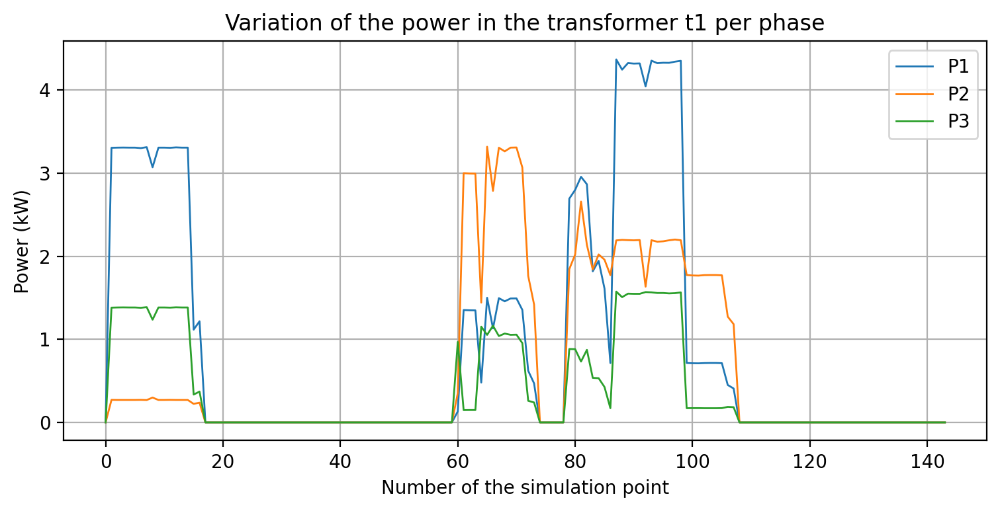

In [8]:
figure(figsize=(9, 4), dpi=200)
plt.plot(range(begin,end),result["P1 (kW)"][begin:end], linewidth=1, label = "P1")
plt.plot(range(begin,end),result["P2 (kW)"][begin:end], linewidth=1, label = "P2")
plt.plot(range(begin,end),result["P3 (kW)"][begin:end], linewidth=1, label = "P3")
plt.xlabel("Number of the simulation point")
plt.ylabel("Power (kW)")
plt.title("Variation of the power in the transformer t1 per phase")
plt.grid()
plt.legend()
plt.show()